In [1]:
import os

import numpy as np

import tensorflow as tf
from tensorflow import keras



from RoadDataset import RoadDataset

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
val_datasets_path = "../notebooks/datasets/validation/"
sub_dirs = os.listdir(val_datasets_path)
val_dataset_paths = [[val_datasets_path + sub_dir + "/" + sub_dir + ".csv", val_datasets_path + sub_dir + "/frames/"] for sub_dir in sub_dirs]
val_dataset_paths

[['../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/Tag-Sonne-Wolken-Ausserorts.csv',
  '../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/frames/'],
 ['../notebooks/datasets/validation/Nacht-Schneechaos/Nacht-Schneechaos.csv',
  '../notebooks/datasets/validation/Nacht-Schneechaos/frames/']]

In [4]:
dataset_index = 0
column_names = ['filename','steering_wheel_angle','speed', 'blink_l', 'blink_r']
val_set = RoadDataset(val_dataset_paths[dataset_index][0], val_dataset_paths[dataset_index][1], column_names, batch_size=16)
val_set.clean()

Reading csv file: ../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/Tag-Sonne-Wolken-Ausserorts.csv
Loaded dataset with 10474 samples
Cleaning dataset. Starting with 10474 samples.
Removing 1205 rows for reason: Low speed (< 25 km/h)
Removing 541 rows for reason: High SWA (> +45/ < -45 deg)
Removing 66 rows for reason: Left blinker on
Removing 168 rows for reason: Right blinker on
8494 samples remaining.


In [5]:
stats = val_set.get_csv().describe()
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
steering_wheel_angle,8494.0,-0.410816,11.112719,-44.830,-3.380,-0.5000,2.500,43.260
speed,8494.0,55.135536,11.205151,25.079,47.833,55.4125,63.116,77.066
blink_l,8494.0,0.000000,0.000000,0.000,0.000,0.0000,0.000,0.000
blink_r,8494.0,0.000000,0.000000,0.000,0.000,0.0000,0.000,0.000


In [6]:
#val_set.balance()
#val_set.normalize()

In [7]:
stats = val_set.get_csv().describe()
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
steering_wheel_angle,8494.0,-0.410816,11.112719,-44.830,-3.380,-0.5000,2.500,43.260
speed,8494.0,55.135536,11.205151,25.079,47.833,55.4125,63.116,77.066
blink_l,8494.0,0.000000,0.000000,0.000,0.000,0.0000,0.000,0.000
blink_r,8494.0,0.000000,0.000000,0.000,0.000,0.0000,0.000,0.000


In [8]:
#model_name = 'diypilot_v1'
#model_name = 'diypilot_v2_epoch_10'
#model_name = 'diypilot_v3_epoch_5'
#model_name = 'openpilot_replica_epoch_59'
#model_name = 'openpilot_replica_mae_epoch_100'
#model_name = 'diypilot_v9_small_FC_epoch_3'
#model_name = 'diypilot_v11_random_shifts_epoch_3'
#model_name = 'diypilot_v11_random_shifts_full_balance_epoch_3'
#model_name = 'diypilot_v11_full_balance_epoch_163'
#model_name = 'diypilot_v12_epoch_58'
#model_name = 'diypilot_v13_sum_min5_overrepr_epoch_10'
#model_name = 'diypilot_v14_smaller_crop_epoch_3'
#model_name = 'diypilot_v14_smaller_crop_wider_epoch_3'
#model_name = 'diypilot_v14_smaller_crop_wider_white_corners_epoch_10'
#model_name = 'diypilot_v14_smaller_crop_wider_white_corners_random_shift_epoch_5'
#model_name = 'diypilot_v15_random_shift_and_offset_epoch_5'
#model_name = 'v17_epoch_1'
model_name = 'v17.1_epoch_144'
#model_name = 'v17.1_epoch_13'
loaded_model = keras.models.load_model('./trained_models/' + model_name + '.h5')
loaded_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 170, 640, 3) 0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 170, 640, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 85, 213, 3)   0           lambda[0][0]                     
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 27, 70, 24)   1824        max_pooling2d[0][0]              
____________________________________________________________________________________________

In [9]:
import sys
sys.path.append("..") # Adds higher directory to python modules path.
from Jetson.autopilot.record.AutopilotGUI import AutopilotGUI

In [10]:
gui = AutopilotGUI()

In [11]:
def show_frame(test_image_index):

    test_sample = val_set.get_frame(test_image_index)
    test_image = test_sample[0]
    test_image_cropped = val_set.get_cropped_frame(test_image_index, shift=0, offset=0)[0]
    test_labels = test_sample[1]

    print("Test csv: " + str(test_labels))

    test_data = np.expand_dims(test_image_cropped, axis=0)
    predictions = loaded_model.predict(test_data)

    gui.set_frame(test_image)
    gui.set_show_overlay(True)
    gui.set_engaged(False)
    gui.set_recording(True)

    timestamp = test_labels['filename']
    gui.set_timestring(timestamp)

    velocity = test_labels['speed']
    gui.set_velocity(velocity)

    actual_swa = test_labels['steering_wheel_angle']*90
    gui.set_actual_swa(actual_swa)

    predicted_swa = predictions[0][0]*90
    print("Ground-truth: " +str(actual_swa))
    print("Prediction: " + str(predicted_swa))
    gui.set_predicted_swa(predicted_swa)

    gui.show_jupyter()

In [12]:
import ipywidgets as widgets
frame_slider = widgets.IntSlider(min=0, max=val_set.get_batch_size()*len(val_set)-1, continuous_update=False)

In [13]:
from ipywidgets import interact

interact(show_frame, test_image_index=frame_slider);

interactive(children=(IntSlider(value=0, continuous_update=False, description='test_image_index', max=8479), O…

In [14]:
import cv2
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(model_name + '.avi',fourcc, 15.0, (848,480))

In [15]:
framecount = val_set.get_batch_size()*len(val_set)
print(framecount)
ground_truth = []
predictions_list = []
velocity_list = []
#for i in range(1000):
for i in range(framecount):
    sample = val_set.get_sample(i)
    frame = sample['frame']
    
    sample = val_set.get_sample(i, augment=False, crop=True, normalize=False)
    cropped_frame = sample['frame']
    actual_swa = sample['swa']
    v_vehicle = sample['v_vehicle']
    blink_l = sample['blink_l']
    blink_r = sample['blink_r']
    timestamp = sample['filename']

    test_data = [np.array([cropped_frame]), np.array([v_vehicle/250])]
    print(test_data)
    predictions = loaded_model.predict(test_data)

    gui.set_frame(frame)
    gui.set_show_overlay(True)
    gui.set_engaged(False)
    gui.set_recording(True)

    
    gui.set_timestring(timestamp)
    
    velocity_list.append(v_vehicle)
    gui.set_velocity(v_vehicle)

    ground_truth.append(actual_swa)
    gui.set_actual_swa(actual_swa)

    predicted_swa = val_set.denormalize_swa(predictions[0][0])
    #predicted_swa = predictions[0][0]
    predictions_list.append(predicted_swa)
    print("Predictions: " + str(predictions))
    print("Ground-truth: " +str(actual_swa))
    print("Prediction: " + str(predicted_swa))
    gui.set_predicted_swa(predicted_swa)
    
    gui.render()
    frame = gui.get_rendered_gui()
    
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    out.write(rgb_frame.astype(np.uint8))
    
out.release()

8480
[array([[[[36, 36, 38],
         [36, 36, 38],
         [36, 36, 38],
         ...,
         [75, 61, 58],
         [75, 59, 59],
         [73, 57, 57]],

        [[37, 35, 40],
         [38, 36, 41],
         [40, 38, 43],
         ...,
         [74, 60, 57],
         [72, 58, 55],
         [70, 56, 55]],

        [[42, 39, 46],
         [43, 40, 47],
         [43, 40, 47],
         ...,
         [72, 61, 57],
         [64, 53, 49],
         [67, 56, 54]],

        ...,

        [[77, 64, 56],
         [75, 62, 54],
         [73, 60, 52],
         ...,
         [92, 76, 63],
         [91, 75, 62],
         [90, 74, 61]],

        [[74, 61, 53],
         [72, 59, 51],
         [69, 56, 48],
         ...,
         [92, 76, 63],
         [91, 75, 62],
         [90, 73, 63]],

        [[70, 57, 49],
         [68, 55, 47],
         [67, 54, 46],
         ...,
         [92, 76, 63],
         [92, 76, 63],
         [91, 74, 64]]]], dtype=uint8), array([0.100812])]
Predictions: [[-0.5339

Predictions: [[0.19432105]]
Ground-truth: 1.75
Prediction: 2.351111742865185
[array([[[[ 85,  67,  65],
         [ 46,  42,  39],
         [ 38,  42,  41],
         ...,
         [ 14,  14,  12],
         [ 15,  15,  13],
         [ 15,  15,  15]],

        [[134, 120, 119],
         [ 70,  66,  63],
         [ 43,  43,  43],
         ...,
         [ 15,  14,  12],
         [ 16,  15,  13],
         [ 17,  16,  14]],

        [[ 55,  41,  41],
         [ 47,  38,  39],
         [ 48,  42,  44],
         ...,
         [ 17,  16,  14],
         [ 15,  14,  10],
         [ 19,  15,  12]],

        ...,

        [[ 71,  63,  52],
         [ 71,  63,  52],
         [ 70,  62,  51],
         ...,
         [ 73,  65,  54],
         [ 74,  66,  55],
         [ 75,  65,  56]],

        [[ 70,  62,  51],
         [ 70,  62,  51],
         [ 68,  62,  50],
         ...,
         [ 72,  64,  53],
         [ 74,  64,  54],
         [ 74,  64,  54]],

        [[ 68,  60,  49],
         [ 68,  60,  4

Predictions: [[0.5530339]]
Ground-truth: 7.64
Prediction: 16.27040858626208
[array([[[[116,  90,  93],
         [103,  74,  76],
         [ 90,  60,  60],
         ...,
         [ 33,  40,  50],
         [ 33,  40,  48],
         [ 34,  41,  47]],

        [[ 79,  40,  41],
         [ 77,  39,  38],
         [ 77,  37,  37],
         ...,
         [ 35,  42,  50],
         [ 35,  42,  48],
         [ 36,  44,  47]],

        [[ 81,  37,  36],
         [ 80,  34,  34],
         [ 81,  33,  33],
         ...,
         [ 39,  46,  52],
         [ 39,  47,  50],
         [ 38,  46,  48]],

        ...,

        [[ 75,  66,  57],
         [ 72,  63,  54],
         [ 71,  62,  53],
         ...,
         [ 86,  76,  66],
         [ 86,  76,  66],
         [ 86,  76,  66]],

        [[ 71,  64,  54],
         [ 69,  62,  52],
         [ 70,  61,  52],
         ...,
         [ 87,  77,  67],
         [ 87,  77,  67],
         [ 87,  77,  67]],

        [[ 67,  60,  50],
         [ 66,  59,  49

Predictions: [[0.33728445]]
Ground-truth: 7.64
Prediction: 5.70820205290206
[array([[[[ 15,  25,  26],
         [ 15,  25,  26],
         [ 15,  25,  26],
         ...,
         [255, 255, 251],
         [255, 255, 251],
         [255, 255, 251]],

        [[ 17,  27,  26],
         [ 17,  27,  26],
         [ 17,  27,  26],
         ...,
         [255, 255, 251],
         [254, 253, 249],
         [254, 253, 249]],

        [[ 19,  29,  28],
         [ 18,  28,  27],
         [ 18,  28,  27],
         ...,
         [253, 252, 247],
         [255, 255, 251],
         [253, 252, 248]],

        ...,

        [[ 72,  65,  59],
         [ 72,  65,  59],
         [ 72,  65,  59],
         ...,
         [ 88,  79,  70],
         [ 89,  80,  71],
         [ 90,  81,  72]],

        [[ 72,  65,  59],
         [ 70,  65,  59],
         [ 70,  65,  59],
         ...,
         [ 87,  78,  69],
         [ 88,  79,  70],
         [ 89,  80,  71]],

        [[ 71,  66,  60],
         [ 72,  67,  61

[array([[[[ 73,  64,  55],
         [ 79,  70,  61],
         [ 77,  68,  61],
         ...,
         [132, 120, 108],
         [137, 124, 107],
         [149, 134, 115]],

        [[ 59,  48,  42],
         [ 60,  49,  45],
         [ 53,  42,  40],
         ...,
         [138, 124, 111],
         [141, 125, 109],
         [150, 133, 115]],

        [[ 38,  24,  23],
         [ 39,  25,  25],
         [ 36,  24,  26],
         ...,
         [136, 120, 105],
         [142, 125, 109],
         [150, 131, 114]],

        ...,

        [[ 72,  63,  56],
         [ 71,  62,  55],
         [ 74,  63,  57],
         ...,
         [101,  87,  76],
         [101,  87,  76],
         [100,  88,  76]],

        [[ 71,  62,  55],
         [ 70,  61,  54],
         [ 74,  63,  57],
         ...,
         [104,  90,  79],
         [103,  91,  79],
         [102,  90,  78]],

        [[ 71,  62,  55],
         [ 71,  60,  54],
         [ 73,  62,  56],
         ...,
         [105,  91,  80],
       

Predictions: [[-0.52044576]]
Ground-truth: -14.53
Prediction: -14.037508129047495
[array([[[[44, 45, 37],
         [42, 42, 34],
         [42, 39, 32],
         ...,
         [80, 54, 29],
         [82, 56, 31],
         [85, 59, 36]],

        [[48, 49, 41],
         [44, 44, 36],
         [43, 40, 35],
         ...,
         [78, 52, 27],
         [80, 54, 29],
         [84, 58, 33]],

        [[39, 39, 31],
         [38, 38, 30],
         [38, 35, 30],
         ...,
         [78, 52, 27],
         [78, 52, 27],
         [80, 54, 29]],

        ...,

        [[64, 54, 44],
         [68, 58, 48],
         [67, 57, 47],
         ...,
         [58, 47, 41],
         [57, 46, 40],
         [57, 46, 40]],

        [[63, 55, 44],
         [67, 59, 48],
         [67, 59, 48],
         ...,
         [57, 46, 40],
         [57, 46, 40],
         [57, 46, 42]],

        [[61, 53, 42],
         [66, 58, 47],
         [66, 58, 47],
         ...,
         [56, 45, 39],
         [56, 45, 41],
    

Predictions: [[-0.56091386]]
Ground-truth: -18.22
Prediction: -16.855461821946633
[array([[[[252, 253, 239],
         [254, 255, 246],
         [251, 255, 247],
         ...,
         [ 84,  77,  69],
         [ 92,  85,  77],
         [104,  95,  86]],

        [[255, 255, 246],
         [250, 253, 246],
         [253, 255, 249],
         ...,
         [ 84,  77,  69],
         [ 93,  84,  77],
         [105,  96,  87]],

        [[255, 255, 250],
         [255, 255, 251],
         [255, 255, 253],
         ...,
         [ 84,  77,  69],
         [ 93,  84,  77],
         [106,  97,  88]],

        ...,

        [[ 77,  67,  57],
         [ 74,  64,  54],
         [ 74,  64,  54],
         ...,
         [ 66,  58,  47],
         [ 65,  57,  46],
         [ 65,  57,  46]],

        [[ 76,  66,  56],
         [ 74,  64,  54],
         [ 74,  64,  54],
         ...,
         [ 67,  59,  48],
         [ 66,  58,  47],
         [ 67,  59,  48]],

        [[ 75,  67,  56],
         [ 73,  6

[array([[[[50, 41, 42],
         [47, 43, 42],
         [45, 44, 40],
         ...,
         [19, 14, 11],
         [19, 14, 11],
         [21, 13, 10]],

        [[58, 46, 46],
         [57, 47, 46],
         [54, 51, 46],
         ...,
         [19, 14, 11],
         [19, 14, 11],
         [21, 13, 10]],

        [[72, 57, 54],
         [73, 59, 56],
         [68, 59, 54],
         ...,
         [19, 14, 11],
         [20, 15, 12],
         [21, 16, 12]],

        ...,

        [[85, 68, 58],
         [85, 68, 58],
         [86, 69, 59],
         ...,
         [52, 43, 38],
         [50, 41, 36],
         [49, 40, 35]],

        [[84, 67, 57],
         [85, 68, 58],
         [86, 69, 59],
         ...,
         [51, 42, 37],
         [50, 41, 36],
         [49, 40, 35]],

        [[85, 68, 58],
         [85, 68, 58],
         [87, 70, 60],
         ...,
         [50, 40, 38],
         [50, 40, 38],
         [49, 40, 35]]]], dtype=uint8), array([0.107136])]
Predictions: [[-0.4238852]]

[array([[[[181, 143, 104],
         [157, 118,  77],
         [148, 120,  80],
         ...,
         [ 92,  79,  70],
         [ 92,  79,  70],
         [ 92,  79,  70]],

        [[175, 146, 104],
         [166, 136,  86],
         [165, 144,  89],
         ...,
         [ 92,  79,  70],
         [ 92,  79,  70],
         [ 91,  78,  69]],

        [[164, 143,  96],
         [160, 138,  78],
         [163, 146,  77],
         ...,
         [ 91,  81,  71],
         [ 90,  80,  70],
         [ 90,  80,  70]],

        ...,

        [[ 77,  63,  50],
         [ 77,  63,  50],
         [ 77,  63,  50],
         ...,
         [ 73,  60,  51],
         [ 71,  58,  49],
         [ 68,  55,  47]],

        [[ 76,  62,  49],
         [ 76,  62,  49],
         [ 76,  62,  49],
         ...,
         [ 75,  62,  53],
         [ 71,  58,  49],
         [ 68,  55,  47]],

        [[ 75,  61,  48],
         [ 75,  61,  48],
         [ 76,  62,  49],
         ...,
         [ 74,  61,  52],
       

[array([[[[65, 51, 51],
         [63, 49, 48],
         [62, 48, 47],
         ...,
         [87, 74, 66],
         [87, 74, 66],
         [89, 76, 68]],

        [[58, 47, 45],
         [53, 42, 40],
         [56, 45, 43],
         ...,
         [87, 74, 66],
         [88, 75, 67],
         [89, 76, 68]],

        [[51, 42, 37],
         [49, 40, 35],
         [48, 39, 32],
         ...,
         [86, 73, 65],
         [89, 76, 68],
         [90, 77, 69]],

        ...,

        [[55, 48, 42],
         [56, 49, 43],
         [57, 48, 43],
         ...,
         [47, 42, 36],
         [47, 42, 36],
         [47, 42, 36]],

        [[55, 48, 42],
         [56, 49, 43],
         [56, 49, 43],
         ...,
         [47, 42, 36],
         [46, 43, 36],
         [46, 43, 36]],

        [[55, 48, 42],
         [56, 49, 43],
         [56, 49, 43],
         ...,
         [46, 41, 35],
         [45, 42, 35],
         [46, 43, 36]]]], dtype=uint8), array([0.117056])]
Predictions: [[-0.5018998]]

[array([[[[80, 50, 24],
         [89, 58, 30],
         [81, 50, 21],
         ...,
         [85, 76, 71],
         [82, 72, 71],
         [68, 59, 60]],

        [[78, 48, 22],
         [90, 59, 31],
         [79, 48, 19],
         ...,
         [85, 76, 71],
         [82, 72, 71],
         [67, 58, 59]],

        [[84, 54, 28],
         [91, 60, 32],
         [82, 51, 22],
         ...,
         [89, 80, 75],
         [87, 77, 76],
         [70, 61, 64]],

        ...,

        [[73, 59, 46],
         [73, 59, 46],
         [73, 59, 46],
         ...,
         [50, 43, 37],
         [48, 41, 35],
         [50, 43, 37]],

        [[72, 60, 46],
         [72, 60, 46],
         [72, 60, 46],
         ...,
         [49, 42, 36],
         [49, 42, 36],
         [48, 43, 37]],

        [[71, 59, 45],
         [72, 60, 46],
         [72, 60, 46],
         ...,
         [49, 42, 36],
         [47, 42, 36],
         [48, 43, 37]]]], dtype=uint8), array([0.12214])]
Predictions: [[-0.45327288]]

Predictions: [[-0.5549156]]
Ground-truth: -5.45
Prediction: -16.408446504876444
[array([[[[ 66, 157, 184],
         [ 54, 134, 167],
         [ 53, 127, 164],
         ...,
         [ 89,  75,  66],
         [ 83,  70,  61],
         [ 88,  75,  66]],

        [[ 71, 162, 189],
         [ 53, 134, 164],
         [ 52, 128, 160],
         ...,
         [ 87,  73,  64],
         [ 86,  72,  63],
         [ 87,  72,  65]],

        [[ 77, 168, 195],
         [ 56, 140, 168],
         [ 51, 130, 160],
         ...,
         [ 86,  71,  64],
         [ 80,  67,  59],
         [ 83,  70,  62]],

        ...,

        [[ 67,  53,  44],
         [ 67,  53,  44],
         [ 66,  52,  43],
         ...,
         [ 47,  40,  34],
         [ 47,  40,  34],
         [ 47,  39,  36]],

        [[ 67,  53,  44],
         [ 67,  53,  44],
         [ 66,  52,  43],
         ...,
         [ 47,  40,  34],
         [ 47,  40,  34],
         [ 47,  40,  34]],

        [[ 65,  51,  42],
         [ 66,  52,

[array([[[[ 73,  44,  26],
         [ 81,  48,  29],
         [ 81,  46,  26],
         ...,
         [ 70,  61,  54],
         [ 72,  63,  56],
         [ 74,  67,  61]],

        [[ 78,  46,  31],
         [ 80,  44,  28],
         [ 83,  44,  27],
         ...,
         [ 71,  62,  55],
         [ 73,  64,  57],
         [ 75,  68,  62]],

        [[ 83,  51,  36],
         [ 95,  62,  45],
         [119,  82,  64],
         ...,
         [ 72,  63,  56],
         [ 74,  65,  58],
         [ 76,  69,  63]],

        ...,

        [[ 61,  51,  42],
         [ 61,  51,  42],
         [ 60,  50,  41],
         ...,
         [ 49,  42,  36],
         [ 49,  40,  33],
         [ 50,  41,  34]],

        [[ 61,  51,  42],
         [ 61,  51,  42],
         [ 59,  49,  40],
         ...,
         [ 49,  42,  34],
         [ 49,  40,  33],
         [ 50,  41,  34]],

        [[ 61,  51,  42],
         [ 60,  50,  41],
         [ 59,  49,  40],
         ...,
         [ 50,  41,  34],
       

Predictions: [[-0.2219299]]
Ground-truth: -5.01
Prediction: -2.8591656788191004
[array([[[[202, 169, 134],
         [195, 162, 127],
         [179, 146, 111],
         ...,
         [ 49,  32,  16],
         [ 49,  32,  14],
         [ 50,  33,  15]],

        [[174, 135, 104],
         [167, 128,  97],
         [131,  92,  61],
         ...,
         [ 48,  32,  16],
         [ 49,  33,  17],
         [ 49,  33,  17]],

        [[106,  69,  42],
         [101,  61,  35],
         [ 94,  54,  29],
         ...,
         [ 47,  31,  16],
         [ 46,  33,  17],
         [ 45,  32,  15]],

        ...,

        [[ 60,  47,  39],
         [ 59,  46,  38],
         [ 59,  46,  38],
         ...,
         [ 51,  42,  35],
         [ 51,  42,  35],
         [ 51,  42,  35]],

        [[ 58,  48,  39],
         [ 60,  47,  39],
         [ 59,  46,  38],
         ...,
         [ 51,  42,  35],
         [ 51,  42,  35],
         [ 52,  41,  35]],

        [[ 59,  49,  40],
         [ 58,  48,

Predictions: [[-0.26200944]]
Ground-truth: -5.01
Prediction: -3.7040984796014538
[array([[[[126, 109, 101],
         [161, 144, 128],
         [201, 185, 160],
         ...,
         [ 49,  41,  22],
         [ 49,  41,  22],
         [ 48,  40,  21]],

        [[115,  96,  89],
         [152, 133, 118],
         [201, 185, 160],
         ...,
         [ 51,  43,  24],
         [ 51,  43,  24],
         [ 50,  42,  23]],

        [[117,  95,  84],
         [155, 134, 117],
         [208, 190, 166],
         ...,
         [ 53,  45,  26],
         [ 55,  47,  28],
         [ 52,  43,  26]],

        ...,

        [[ 51,  51,  39],
         [ 50,  50,  38],
         [ 50,  50,  38],
         ...,
         [ 35,  42,  35],
         [ 36,  43,  36],
         [ 36,  43,  36]],

        [[ 50,  50,  38],
         [ 50,  50,  38],
         [ 51,  51,  39],
         ...,
         [ 35,  42,  35],
         [ 36,  43,  36],
         [ 36,  43,  36]],

        [[ 50,  50,  38],
         [ 50,  50

[array([[[[ 76,  40,  14],
         [ 75,  40,  12],
         [ 75,  38,   9],
         ...,
         [208, 183, 161],
         [192, 167, 147],
         [149, 124, 104]],

        [[ 81,  44,  15],
         [ 71,  34,   5],
         [ 77,  38,   7],
         ...,
         [142, 119, 101],
         [113,  90,  72],
         [111,  88,  72]],

        [[121,  82,  49],
         [121,  83,  47],
         [117,  77,  41],
         ...,
         [ 88,  69,  54],
         [ 77,  58,  43],
         [130, 111,  96]],

        ...,

        [[ 51,  51,  41],
         [ 52,  52,  42],
         [ 50,  50,  40],
         ...,
         [ 37,  38,  32],
         [ 38,  39,  33],
         [ 39,  40,  34]],

        [[ 51,  51,  41],
         [ 52,  52,  42],
         [ 50,  50,  40],
         ...,
         [ 37,  38,  32],
         [ 38,  39,  33],
         [ 39,  40,  34]],

        [[ 51,  51,  41],
         [ 52,  52,  42],
         [ 50,  50,  40],
         ...,
         [ 37,  38,  33],
       

[array([[[[ 94, 122, 125],
         [ 89, 115, 116],
         [ 90, 114, 114],
         ...,
         [ 77,  55,  41],
         [ 71,  48,  34],
         [ 88,  65,  51]],

        [[ 32,  61,  69],
         [ 47,  74,  81],
         [ 80, 105, 109],
         ...,
         [ 74,  57,  41],
         [ 69,  50,  36],
         [ 71,  52,  38]],

        [[ 30,  62,  73],
         [ 34,  64,  74],
         [ 31,  58,  67],
         ...,
         [ 69,  53,  38],
         [ 68,  52,  37],
         [ 65,  49,  34]],

        ...,

        [[ 55,  53,  41],
         [ 55,  53,  41],
         [ 55,  53,  41],
         ...,
         [ 34,  36,  31],
         [ 33,  35,  30],
         [ 34,  35,  30]],

        [[ 55,  53,  41],
         [ 55,  53,  41],
         [ 55,  53,  41],
         ...,
         [ 34,  36,  31],
         [ 33,  35,  30],
         [ 32,  34,  29]],

        [[ 55,  53,  41],
         [ 55,  53,  41],
         [ 55,  53,  41],
         ...,
         [ 34,  36,  31],
       

[array([[[[243, 214, 182],
         [253, 213, 188],
         [253, 218, 196],
         ...,
         [ 97,  90,  74],
         [ 99,  92,  76],
         [100,  93,  77]],

        [[251, 222, 190],
         [253, 213, 188],
         [248, 213, 191],
         ...,
         [ 98,  91,  75],
         [100,  93,  77],
         [102,  93,  78]],

        [[253, 224, 192],
         [255, 219, 193],
         [246, 212, 187],
         ...,
         [100,  93,  77],
         [ 97,  90,  74],
         [102,  93,  78]],

        ...,

        [[ 70,  60,  48],
         [ 68,  58,  46],
         [ 68,  58,  46],
         ...,
         [ 42,  42,  30],
         [ 40,  40,  28],
         [ 38,  38,  26]],

        [[ 69,  59,  47],
         [ 67,  57,  45],
         [ 67,  57,  45],
         ...,
         [ 42,  42,  30],
         [ 40,  40,  28],
         [ 38,  38,  26]],

        [[ 69,  59,  47],
         [ 67,  57,  45],
         [ 68,  58,  46],
         ...,
         [ 42,  42,  30],
       

Predictions: [[-0.26639628]]
Ground-truth: 2.94
Prediction: -3.8050737345546546
[array([[[[222, 207, 184],
         [255, 253, 227],
         [255, 248, 222],
         ...,
         [ 62,  55,  47],
         [ 65,  58,  50],
         [ 67,  60,  52]],

        [[201, 189, 165],
         [255, 252, 225],
         [255, 251, 222],
         ...,
         [ 63,  56,  50],
         [ 62,  55,  49],
         [ 62,  57,  51]],

        [[193, 183, 158],
         [255, 249, 223],
         [255, 255, 226],
         ...,
         [ 55,  48,  42],
         [ 52,  45,  39],
         [ 54,  49,  43]],

        ...,

        [[ 70,  62,  51],
         [ 69,  61,  50],
         [ 68,  60,  47],
         ...,
         [ 34,  36,  31],
         [ 33,  35,  30],
         [ 32,  34,  29]],

        [[ 70,  62,  51],
         [ 69,  61,  50],
         [ 69,  61,  48],
         ...,
         [ 34,  36,  31],
         [ 33,  35,  30],
         [ 32,  34,  29]],

        [[ 69,  63,  51],
         [ 70,  62,

[array([[[[254, 223, 205],
         [241, 210, 192],
         [253, 225, 204],
         ...,
         [ 40,  42,  39],
         [ 39,  41,  38],
         [ 39,  39,  37]],

        [[250, 221, 205],
         [242, 213, 195],
         [245, 218, 199],
         ...,
         [ 41,  43,  42],
         [ 49,  51,  50],
         [ 42,  42,  42]],

        [[238, 210, 196],
         [220, 193, 176],
         [220, 193, 174],
         ...,
         [ 42,  42,  42],
         [ 45,  45,  47],
         [ 50,  50,  52]],

        ...,

        [[ 63,  56,  48],
         [ 63,  56,  48],
         [ 62,  55,  47],
         ...,
         [ 35,  40,  36],
         [ 36,  38,  35],
         [ 36,  38,  35]],

        [[ 61,  57,  48],
         [ 61,  57,  48],
         [ 61,  57,  48],
         ...,
         [ 34,  39,  35],
         [ 36,  38,  35],
         [ 35,  37,  34]],

        [[ 61,  57,  48],
         [ 61,  57,  48],
         [ 61,  57,  48],
         ...,
         [ 36,  38,  35],
       

[array([[[[43, 49, 65],
         [41, 46, 65],
         [39, 44, 63],
         ...,
         [89, 72, 64],
         [81, 64, 56],
         [70, 56, 47]],

        [[39, 45, 61],
         [37, 43, 59],
         [35, 40, 59],
         ...,
         [83, 66, 59],
         [73, 58, 51],
         [75, 60, 53]],

        [[37, 43, 57],
         [37, 43, 59],
         [34, 40, 56],
         ...,
         [79, 64, 59],
         [74, 59, 54],
         [73, 58, 55]],

        ...,

        [[60, 52, 50],
         [60, 52, 50],
         [60, 52, 50],
         ...,
         [48, 44, 45],
         [47, 43, 44],
         [47, 43, 44]],

        [[60, 52, 50],
         [59, 51, 49],
         [61, 53, 51],
         ...,
         [46, 42, 43],
         [47, 43, 44],
         [45, 43, 44]],

        [[59, 51, 49],
         [59, 51, 49],
         [60, 52, 50],
         ...,
         [43, 41, 42],
         [44, 42, 43],
         [45, 43, 44]]]], dtype=uint8), array([0.155868])]
Predictions: [[-0.48327845]

[array([[[[69, 70, 91],
         [74, 73, 89],
         [79, 78, 86],
         ...,
         [57, 47, 37],
         [64, 52, 40],
         [69, 57, 45]],

        [[68, 69, 87],
         [68, 70, 85],
         [80, 80, 90],
         ...,
         [58, 48, 36],
         [66, 54, 42],
         [73, 59, 48]],

        [[62, 65, 74],
         [65, 67, 79],
         [77, 80, 89],
         ...,
         [60, 50, 38],
         [74, 62, 50],
         [79, 65, 54]],

        ...,

        [[48, 47, 43],
         [49, 48, 44],
         [49, 48, 44],
         ...,
         [35, 37, 34],
         [36, 38, 35],
         [37, 39, 36]],

        [[49, 48, 44],
         [49, 48, 44],
         [49, 48, 44],
         ...,
         [35, 37, 34],
         [35, 37, 34],
         [36, 38, 35]],

        [[49, 48, 44],
         [50, 49, 45],
         [50, 49, 45],
         ...,
         [35, 37, 34],
         [35, 37, 34],
         [35, 37, 34]]]], dtype=uint8), array([0.157108])]
Predictions: [[-0.5414553]]

Predictions: [[0.31470507]]
Ground-truth: -2.57
Prediction: 5.042529966784506
[array([[[[192, 188, 179],
         [188, 186, 171],
         [188, 187, 167],
         ...,
         [ 51,  34,  26],
         [ 49,  32,  24],
         [ 47,  33,  24]],

        [[160, 157, 152],
         [171, 168, 159],
         [185, 183, 171],
         ...,
         [ 50,  33,  25],
         [ 49,  32,  24],
         [ 49,  32,  24]],

        [[149, 148, 146],
         [152, 151, 147],
         [148, 147, 142],
         ...,
         [ 54,  36,  26],
         [ 51,  34,  26],
         [ 48,  31,  23]],

        ...,

        [[ 53,  49,  48],
         [ 53,  49,  46],
         [ 51,  47,  44],
         ...,
         [ 36,  36,  34],
         [ 37,  37,  35],
         [ 37,  37,  35]],

        [[ 52,  48,  47],
         [ 52,  48,  45],
         [ 50,  46,  43],
         ...,
         [ 36,  36,  34],
         [ 36,  36,  34],
         [ 36,  36,  34]],

        [[ 52,  48,  47],
         [ 52,  48,  

Predictions: [[0.24286957]]
Ground-truth: -2.69
Prediction: 3.2836939453443614
[array([[[[71, 60, 64],
         [63, 51, 55],
         [65, 53, 57],
         ...,
         [46, 39, 31],
         [46, 39, 31],
         [36, 27, 20]],

        [[72, 63, 66],
         [71, 60, 64],
         [70, 59, 63],
         ...,
         [39, 32, 24],
         [42, 35, 27],
         [32, 23, 16]],

        [[69, 63, 67],
         [68, 59, 64],
         [68, 59, 64],
         ...,
         [37, 30, 22],
         [36, 29, 21],
         [32, 23, 16]],

        ...,

        [[73, 66, 60],
         [74, 67, 61],
         [73, 66, 60],
         ...,
         [49, 46, 41],
         [50, 47, 42],
         [50, 47, 42]],

        [[70, 65, 59],
         [71, 66, 60],
         [70, 65, 59],
         ...,
         [50, 47, 42],
         [51, 48, 43],
         [51, 48, 43]],

        [[70, 65, 59],
         [70, 65, 59],
         [70, 65, 59],
         ...,
         [51, 48, 43],
         [51, 48, 43],
       

[array([[[[60, 55, 49],
         [59, 54, 48],
         [56, 51, 47],
         ...,
         [46, 37, 32],
         [52, 43, 38],
         [56, 49, 43]],

        [[60, 55, 49],
         [59, 54, 48],
         [57, 52, 48],
         ...,
         [47, 40, 34],
         [53, 46, 40],
         [57, 49, 46]],

        [[62, 57, 51],
         [58, 53, 47],
         [55, 50, 44],
         ...,
         [51, 42, 37],
         [59, 49, 47],
         [56, 48, 45]],

        ...,

        [[68, 65, 58],
         [68, 65, 58],
         [69, 66, 59],
         ...,
         [60, 55, 51],
         [58, 53, 49],
         [59, 54, 50]],

        [[67, 64, 57],
         [67, 64, 57],
         [68, 65, 58],
         ...,
         [60, 55, 51],
         [59, 54, 50],
         [61, 56, 52]],

        [[66, 63, 56],
         [67, 64, 57],
         [68, 65, 58],
         ...,
         [61, 53, 50],
         [61, 53, 50],
         [63, 55, 52]]]], dtype=uint8), array([0.162316])]
Predictions: [[0.12815954]]

[array([[[[ 93,  82,  78],
         [ 81,  70,  64],
         [ 79,  70,  63],
         ...,
         [ 92,  83,  78],
         [100,  91,  86],
         [ 72,  65,  59]],

        [[102,  91,  85],
         [ 85,  74,  68],
         [ 79,  70,  63],
         ...,
         [ 91,  82,  77],
         [ 92,  85,  79],
         [ 73,  68,  62]],

        [[110,  99,  93],
         [ 88,  77,  71],
         [ 84,  73,  67],
         ...,
         [116, 109, 103],
         [ 98,  93,  87],
         [ 77,  74,  67]],

        ...,

        [[ 85,  72,  64],
         [ 85,  72,  64],
         [ 85,  72,  64],
         ...,
         [ 69,  59,  49],
         [ 69,  59,  49],
         [ 69,  59,  49]],

        [[ 86,  73,  65],
         [ 86,  73,  65],
         [ 86,  73,  65],
         ...,
         [ 68,  58,  48],
         [ 69,  59,  49],
         [ 71,  58,  49]],

        [[ 86,  73,  65],
         [ 87,  74,  66],
         [ 86,  73,  65],
         ...,
         [ 68,  58,  48],
       

Predictions: [[-0.2668283]]
Ground-truth: -1.82
Prediction: -3.8151139103611227
[array([[[[ 53,  42,  46],
         [ 56,  43,  50],
         [ 59,  46,  53],
         ...,
         [ 36,  28,  25],
         [ 38,  31,  25],
         [ 40,  35,  29]],

        [[ 56,  45,  49],
         [ 56,  45,  51],
         [ 61,  48,  57],
         ...,
         [ 35,  27,  24],
         [ 36,  28,  25],
         [ 41,  34,  28]],

        [[ 59,  50,  53],
         [ 59,  48,  54],
         [ 61,  48,  57],
         ...,
         [ 35,  27,  24],
         [ 36,  28,  25],
         [ 38,  31,  25]],

        ...,

        [[ 62,  56,  56],
         [ 62,  56,  56],
         [ 62,  56,  56],
         ...,
         [109,  99,  97],
         [110, 100,  98],
         [115, 105, 103]],

        [[ 62,  56,  56],
         [ 63,  57,  57],
         [ 63,  57,  57],
         ...,
         [116, 105, 101],
         [113, 102, 100],
         [109,  98,  96]],

        [[ 63,  57,  57],
         [ 63,  57,

Predictions: [[-0.20000602]]
Ground-truth: -1.5
Prediction: -2.451189094619549
[array([[[[39, 36, 21],
         [43, 41, 29],
         [86, 81, 77],
         ...,
         [48, 44, 33],
         [43, 36, 26],
         [36, 29, 19]],

        [[48, 44, 32],
         [34, 34, 22],
         [80, 79, 74],
         ...,
         [40, 36, 25],
         [34, 30, 19],
         [38, 31, 21]],

        [[46, 44, 31],
         [34, 36, 25],
         [66, 69, 62],
         ...,
         [37, 33, 22],
         [34, 30, 19],
         [34, 30, 19]],

        ...,

        [[61, 61, 59],
         [61, 61, 59],
         [60, 60, 58],
         ...,
         [40, 41, 35],
         [41, 42, 36],
         [42, 43, 37]],

        [[61, 61, 59],
         [61, 61, 59],
         [60, 60, 58],
         ...,
         [41, 42, 36],
         [42, 43, 37],
         [42, 43, 37]],

        [[61, 61, 59],
         [61, 61, 59],
         [61, 61, 59],
         ...,
         [43, 42, 37],
         [43, 44, 38],
       

Predictions: [[-0.24004756]]
Ground-truth: -0.75
Prediction: -3.224386721719278
[array([[[[217, 182, 163],
         [204, 168, 156],
         [148, 111, 103],
         ...,
         [ 40,  36,  25],
         [ 37,  33,  22],
         [ 34,  32,  20]],

        [[157, 107, 100],
         [153, 108, 105],
         [134,  94,  92],
         ...,
         [ 38,  36,  24],
         [ 33,  31,  19],
         [ 30,  28,  16]],

        [[183, 135, 131],
         [181, 141, 139],
         [165, 135, 133],
         ...,
         [ 36,  34,  22],
         [ 32,  30,  18],
         [ 31,  29,  17]],

        ...,

        [[ 60,  60,  58],
         [ 59,  59,  57],
         [ 60,  60,  58],
         ...,
         [ 32,  34,  29],
         [ 33,  35,  30],
         [ 33,  35,  30]],

        [[ 61,  61,  59],
         [ 59,  59,  57],
         [ 60,  60,  58],
         ...,
         [ 33,  35,  30],
         [ 33,  35,  30],
         [ 33,  35,  30]],

        [[ 62,  62,  60],
         [ 59,  59,

[array([[[[26, 28, 25],
         [25, 27, 24],
         [24, 26, 23],
         ...,
         [28, 24, 13],
         [28, 26, 14],
         [30, 28, 16]],

        [[25, 27, 24],
         [25, 27, 24],
         [23, 25, 22],
         ...,
         [27, 25, 13],
         [27, 25, 13],
         [30, 28, 16]],

        [[25, 27, 24],
         [23, 25, 22],
         [21, 23, 20],
         ...,
         [28, 26, 14],
         [27, 25, 13],
         [30, 28, 16]],

        ...,

        [[59, 58, 54],
         [58, 57, 53],
         [59, 58, 54],
         ...,
         [33, 36, 29],
         [32, 35, 28],
         [31, 34, 27]],

        [[58, 59, 54],
         [58, 59, 54],
         [58, 59, 54],
         ...,
         [33, 36, 29],
         [32, 35, 28],
         [32, 35, 28]],

        [[58, 59, 54],
         [58, 59, 54],
         [58, 59, 54],
         ...,
         [32, 35, 28],
         [32, 35, 28],
         [32, 35, 28]]]], dtype=uint8), array([0.16492])]
Predictions: [[-0.26722458]]

Predictions: [[-0.25910875]]
Ground-truth: 1.82
Prediction: -3.6382976712380914
[array([[[[45, 36, 31],
         [48, 39, 34],
         [50, 39, 33],
         ...,
         [50, 38, 24],
         [49, 37, 23],
         [50, 38, 24]],

        [[46, 37, 32],
         [46, 37, 32],
         [47, 38, 33],
         ...,
         [53, 39, 26],
         [52, 38, 25],
         [52, 38, 25]],

        [[46, 39, 33],
         [43, 35, 32],
         [41, 34, 28],
         ...,
         [55, 41, 28],
         [54, 40, 27],
         [53, 39, 26]],

        ...,

        [[61, 58, 53],
         [62, 59, 54],
         [62, 59, 54],
         ...,
         [29, 32, 25],
         [29, 32, 25],
         [29, 32, 25]],

        [[62, 59, 54],
         [62, 59, 54],
         [63, 60, 55],
         ...,
         [29, 31, 26],
         [29, 31, 26],
         [30, 33, 26]],

        [[62, 59, 52],
         [63, 60, 53],
         [63, 60, 53],
         ...,
         [29, 31, 26],
         [29, 31, 26],
      

Predictions: [[-0.32509765]]
Ground-truth: 1.19
Prediction: -5.341460358189158
[array([[[[170, 157, 148],
         [171, 158, 149],
         [170, 157, 148],
         ...,
         [ 23,  23,  13],
         [ 21,  21,  11],
         [ 21,  21,  11]],

        [[169, 156, 147],
         [170, 157, 148],
         [170, 157, 148],
         ...,
         [ 23,  23,  13],
         [ 21,  21,  11],
         [ 20,  20,  10]],

        [[168, 155, 146],
         [169, 156, 147],
         [170, 157, 148],
         ...,
         [ 23,  23,  13],
         [ 22,  22,  12],
         [ 21,  21,  11]],

        ...,

        [[ 56,  55,  51],
         [ 57,  56,  52],
         [ 56,  55,  51],
         ...,
         [ 33,  34,  29],
         [ 32,  33,  28],
         [ 32,  33,  28]],

        [[ 56,  55,  51],
         [ 56,  55,  51],
         [ 56,  55,  51],
         ...,
         [ 32,  33,  28],
         [ 32,  33,  28],
         [ 32,  33,  28]],

        [[ 55,  54,  50],
         [ 56,  55, 

Predictions: [[-0.49837327]]
Ground-truth: -0.19
Prediction: -12.682264381308746
[array([[[[130,  95,  89],
         [145, 111, 102],
         [129,  96,  87],
         ...,
         [ 24,  17,   9],
         [ 23,  16,   8],
         [ 21,  14,   6]],

        [[101,  68,  61],
         [106,  73,  66],
         [108,  75,  68],
         ...,
         [ 24,  17,   9],
         [ 22,  15,   7],
         [ 20,  13,   5]],

        [[115,  86,  78],
         [136, 107,  99],
         [156, 127, 119],
         ...,
         [ 24,  17,   9],
         [ 23,  16,   8],
         [ 21,  14,   6]],

        ...,

        [[ 61,  51,  49],
         [ 60,  50,  48],
         [ 60,  50,  48],
         ...,
         [ 37,  32,  26],
         [ 37,  32,  26],
         [ 39,  32,  26]],

        [[ 61,  51,  49],
         [ 60,  50,  48],
         [ 60,  50,  48],
         ...,
         [ 38,  33,  27],
         [ 38,  33,  27],
         [ 40,  33,  27]],

        [[ 61,  51,  49],
         [ 61,  51

Predictions: [[-0.26659745]]
Ground-truth: -0.88
Prediction: -3.809746740730289
[array([[[[205, 193, 167],
         [226, 212, 186],
         [210, 192, 168],
         ...,
         [190, 182, 179],
         [191, 181, 179],
         [191, 181, 179]],

        [[235, 228, 199],
         [215, 204, 176],
         [255, 241, 215],
         ...,
         [191, 183, 180],
         [191, 181, 179],
         [188, 178, 176]],

        [[250, 243, 215],
         [228, 218, 191],
         [226, 212, 186],
         ...,
         [187, 177, 175],
         [184, 174, 172],
         [187, 177, 175]],

        ...,

        [[ 48,  48,  46],
         [ 48,  48,  46],
         [ 48,  48,  46],
         ...,
         [ 43,  47,  48],
         [ 41,  47,  47],
         [ 42,  48,  48]],

        [[ 48,  48,  46],
         [ 48,  48,  46],
         [ 48,  48,  46],
         ...,
         [ 42,  46,  47],
         [ 41,  45,  46],
         [ 42,  48,  48]],

        [[ 48,  48,  46],
         [ 48,  48,

Predictions: [[0.3462903]]
Ground-truth: 1.19
Prediction: 5.990939537049224
[array([[[[160, 134, 109],
         [187, 161, 136],
         [149, 119,  95],
         ...,
         [216, 192, 180],
         [222, 198, 186],
         [223, 199, 189]],

        [[157, 133, 107],
         [184, 160, 136],
         [167, 136, 115],
         ...,
         [215, 193, 180],
         [218, 194, 182],
         [218, 194, 184]],

        [[157, 133, 107],
         [180, 156, 132],
         [171, 139, 118],
         ...,
         [227, 205, 194],
         [219, 197, 186],
         [220, 198, 187]],

        ...,

        [[ 50,  46,  43],
         [ 50,  46,  43],
         [ 50,  46,  43],
         ...,
         [ 45,  41,  40],
         [ 43,  39,  38],
         [ 43,  39,  38]],

        [[ 49,  45,  42],
         [ 49,  45,  42],
         [ 50,  46,  43],
         ...,
         [ 46,  42,  41],
         [ 45,  41,  40],
         [ 44,  40,  39]],

        [[ 49,  45,  42],
         [ 49,  45,  42

Predictions: [[0.5371775]]
Ground-truth: 9.33
Prediction: 15.147582352858745
[array([[[[187, 160, 133],
         [197, 171, 146],
         [187, 162, 140],
         ...,
         [211, 196, 189],
         [211, 196, 189],
         [211, 194, 187]],

        [[184, 153, 124],
         [177, 146, 118],
         [178, 148, 124],
         ...,
         [213, 198, 191],
         [210, 195, 188],
         [208, 191, 184]],

        [[189, 153, 119],
         [184, 149, 117],
         [176, 142, 114],
         ...,
         [203, 188, 181],
         [203, 188, 181],
         [206, 191, 184]],

        ...,

        [[ 48,  39,  40],
         [ 45,  39,  39],
         [ 44,  38,  38],
         ...,
         [108,  97,  95],
         [110,  99,  97],
         [112, 101,  99]],

        [[ 49,  40,  41],
         [ 45,  39,  39],
         [ 44,  38,  38],
         ...,
         [109,  98,  96],
         [110,  99,  97],
         [110,  99,  97]],

        [[ 49,  40,  41],
         [ 45,  39,  3

Predictions: [[0.57947546]]
Ground-truth: 20.35
Prediction: 18.30869318929258
[array([[[[106,  79,  72],
         [113,  84,  78],
         [114,  81,  74],
         ...,
         [203, 189, 180],
         [205, 191, 182],
         [209, 192, 184]],

        [[186, 159, 150],
         [163, 132, 127],
         [187, 154, 147],
         ...,
         [204, 190, 181],
         [205, 191, 182],
         [208, 191, 183]],

        [[210, 181, 173],
         [208, 178, 170],
         [211, 177, 168],
         ...,
         [209, 195, 186],
         [209, 192, 184],
         [214, 197, 189]],

        ...,

        [[ 59,  46,  40],
         [ 60,  47,  41],
         [ 60,  47,  41],
         ...,
         [183, 165, 153],
         [185, 167, 155],
         [185, 169, 156]],

        [[ 59,  46,  40],
         [ 60,  47,  41],
         [ 60,  47,  41],
         ...,
         [182, 164, 152],
         [184, 168, 155],
         [185, 169, 156]],

        [[ 60,  47,  41],
         [ 60,  47,  

Predictions: [[0.6703791]]
Ground-truth: 22.1
Prediction: 27.21445407823874
[array([[[[145, 116, 100],
         [141, 113,  99],
         [131, 103,  89],
         ...,
         [203, 193, 184],
         [204, 193, 187],
         [206, 195, 189]],

        [[151, 122, 106],
         [144, 116, 102],
         [136, 108,  94],
         ...,
         [208, 197, 191],
         [204, 193, 187],
         [205, 194, 188]],

        [[200, 171, 155],
         [211, 183, 169],
         [238, 210, 196],
         ...,
         [207, 196, 190],
         [206, 195, 189],
         [203, 192, 186]],

        ...,

        [[ 59,  45,  44],
         [ 60,  46,  45],
         [ 60,  46,  45],
         ...,
         [168, 151, 144],
         [168, 153, 146],
         [175, 160, 153]],

        [[ 57,  46,  44],
         [ 58,  47,  45],
         [ 60,  46,  45],
         ...,
         [165, 148, 141],
         [159, 144, 137],
         [164, 149, 142]],

        [[ 57,  46,  44],
         [ 58,  47,  45

Predictions: [[0.6691988]]
Ground-truth: 22.6
Prediction: 27.076852903308637
[array([[[[ 80,  54,  37],
         [ 82,  56,  39],
         [ 84,  58,  41],
         ...,
         [210, 195, 190],
         [211, 196, 191],
         [216, 201, 196]],

        [[ 97,  70,  49],
         [100,  73,  52],
         [103,  77,  54],
         ...,
         [209, 194, 189],
         [206, 191, 186],
         [208, 193, 188]],

        [[103,  75,  53],
         [102,  74,  50],
         [104,  76,  52],
         ...,
         [200, 185, 178],
         [202, 187, 180],
         [198, 183, 176]],

        ...,

        [[ 57,  47,  45],
         [ 56,  46,  44],
         [ 56,  46,  45],
         ...,
         [183, 166, 156],
         [182, 166, 153],
         [180, 166, 153]],

        [[ 57,  47,  45],
         [ 56,  46,  44],
         [ 56,  46,  45],
         ...,
         [183, 166, 156],
         [182, 166, 153],
         [181, 167, 154]],

        [[ 57,  47,  45],
         [ 56,  46,  4

Predictions: [[0.5997496]]
Ground-truth: 22.73
Prediction: 20.024284367712927
[array([[[[110,  82,  58],
         [114,  87,  60],
         [120,  93,  66],
         ...,
         [201, 188, 180],
         [205, 192, 184],
         [206, 193, 185]],

        [[109,  81,  57],
         [113,  85,  61],
         [120,  94,  67],
         ...,
         [193, 180, 172],
         [196, 183, 175],
         [196, 183, 175]],

        [[107,  79,  57],
         [115,  87,  63],
         [122,  94,  70],
         ...,
         [197, 184, 176],
         [197, 184, 176],
         [199, 186, 178]],

        ...,

        [[ 55,  45,  43],
         [ 55,  45,  43],
         [ 51,  43,  40],
         ...,
         [167, 150, 140],
         [162, 145, 137],
         [159, 145, 136]],

        [[ 55,  46,  41],
         [ 54,  47,  41],
         [ 51,  44,  38],
         ...,
         [168, 151, 141],
         [164, 147, 139],
         [160, 146, 137]],

        [[ 55,  46,  41],
         [ 55,  48,  

Predictions: [[0.6711357]]
Ground-truth: 22.73
Prediction: 27.303005129878358
[array([[[[249, 255, 243],
         [254, 255, 242],
         [255, 255, 238],
         ...,
         [187, 169, 159],
         [197, 179, 169],
         [197, 179, 169]],

        [[254, 255, 244],
         [252, 255, 238],
         [255, 253, 236],
         ...,
         [170, 152, 142],
         [177, 159, 149],
         [183, 165, 155]],

        [[253, 254, 240],
         [255, 254, 236],
         [255, 255, 239],
         ...,
         [168, 150, 140],
         [179, 161, 151],
         [176, 158, 148]],

        ...,

        [[ 52,  47,  43],
         [ 49,  44,  40],
         [ 49,  44,  40],
         ...,
         [170, 156, 145],
         [173, 159, 148],
         [172, 158, 147]],

        [[ 52,  47,  43],
         [ 49,  46,  41],
         [ 49,  46,  41],
         ...,
         [169, 155, 146],
         [170, 156, 147],
         [168, 154, 145]],

        [[ 51,  48,  43],
         [ 49,  46,  

Predictions: [[0.5439041]]
Ground-truth: 20.66
Prediction: 15.615226733435229
[array([[[[124,  93,  64],
         [127,  96,  67],
         [126,  95,  67],
         ...,
         [181, 164, 148],
         [180, 162, 148],
         [177, 159, 147]],

        [[126,  95,  67],
         [127,  96,  68],
         [125,  94,  66],
         ...,
         [173, 151, 137],
         [177, 155, 142],
         [176, 156, 145]],

        [[125,  94,  66],
         [124,  92,  67],
         [127,  95,  70],
         ...,
         [174, 151, 137],
         [179, 155, 143],
         [175, 151, 139]],

        ...,

        [[ 53,  46,  40],
         [ 52,  45,  39],
         [ 53,  46,  40],
         ...,
         [172, 154, 144],
         [178, 160, 150],
         [182, 164, 154]],

        [[ 53,  46,  40],
         [ 52,  45,  39],
         [ 54,  47,  39],
         ...,
         [168, 150, 140],
         [171, 153, 143],
         [176, 158, 148]],

        [[ 53,  46,  40],
         [ 53,  46,  

Predictions: [[0.6026347]]
Ground-truth: 20.66
Prediction: 20.279925970819722
[array([[[[110,  78,  53],
         [114,  82,  57],
         [121,  89,  64],
         ...,
         [ 87,  76,  80],
         [ 89,  79,  78],
         [101,  90,  84]],

        [[110,  78,  53],
         [113,  81,  56],
         [121,  89,  64],
         ...,
         [ 86,  75,  79],
         [ 85,  75,  74],
         [104,  93,  87]],

        [[113,  83,  59],
         [117,  85,  62],
         [120,  88,  63],
         ...,
         [ 85,  74,  78],
         [ 90,  80,  79],
         [105,  96,  89]],

        ...,

        [[ 50,  43,  37],
         [ 50,  43,  37],
         [ 50,  43,  37],
         ...,
         [172, 155, 147],
         [171, 154, 144],
         [168, 151, 141]],

        [[ 50,  43,  37],
         [ 50,  43,  37],
         [ 50,  43,  37],
         ...,
         [175, 158, 150],
         [177, 160, 150],
         [179, 162, 152]],

        [[ 50,  43,  37],
         [ 50,  43,  

Predictions: [[0.6712907]]
Ground-truth: 20.66
Prediction: 27.32117535125121
[array([[[[107,  77,  49],
         [108,  78,  50],
         [106,  79,  50],
         ...,
         [178, 156, 143],
         [173, 151, 138],
         [178, 156, 143]],

        [[110,  80,  54],
         [114,  87,  60],
         [119,  92,  65],
         ...,
         [193, 175, 165],
         [186, 168, 158],
         [190, 172, 162]],

        [[122,  94,  70],
         [115,  87,  63],
         [130, 104,  79],
         ...,
         [192, 174, 164],
         [190, 172, 162],
         [188, 171, 161]],

        ...,

        [[ 47,  44,  37],
         [ 47,  44,  37],
         [ 48,  45,  38],
         ...,
         [165, 151, 138],
         [162, 148, 135],
         [163, 149, 136]],

        [[ 48,  45,  38],
         [ 48,  45,  38],
         [ 50,  45,  39],
         ...,
         [167, 153, 140],
         [163, 149, 136],
         [161, 147, 134]],

        [[ 49,  46,  39],
         [ 50,  45,  3

Predictions: [[0.6698759]]
Ground-truth: 20.85
Prediction: 27.155712415832795
[array([[[[115,  78,  52],
         [118,  81,  55],
         [116,  79,  52],
         ...,
         [167, 145, 132],
         [182, 160, 147],
         [185, 163, 150]],

        [[119,  82,  56],
         [120,  83,  57],
         [119,  82,  56],
         ...,
         [168, 149, 135],
         [181, 159, 146],
         [185, 163, 150]],

        [[123,  87,  63],
         [125,  89,  65],
         [121,  85,  59],
         ...,
         [177, 157, 146],
         [184, 165, 151],
         [190, 168, 155]],

        ...,

        [[ 61,  50,  46],
         [ 60,  49,  45],
         [ 60,  49,  45],
         ...,
         [173, 156, 148],
         [175, 158, 150],
         [173, 156, 148]],

        [[ 60,  51,  46],
         [ 58,  49,  44],
         [ 58,  49,  44],
         ...,
         [173, 156, 148],
         [175, 158, 150],
         [171, 154, 146]],

        [[ 59,  50,  45],
         [ 58,  49,  

Predictions: [[0.67131025]]
Ground-truth: 21.91
Prediction: 27.323468394761992
[array([[[[136, 106,  72],
         [137, 107,  73],
         [132, 102,  68],
         ...,
         [202, 189, 181],
         [208, 195, 187],
         [209, 196, 188]],

        [[128,  98,  64],
         [131, 101,  67],
         [129,  99,  65],
         ...,
         [208, 190, 188],
         [214, 196, 194],
         [209, 191, 189]],

        [[123,  93,  59],
         [126,  96,  62],
         [116,  86,  52],
         ...,
         [208, 190, 188],
         [203, 183, 182],
         [202, 182, 181]],

        ...,

        [[170, 145, 125],
         [169, 144, 122],
         [169, 147, 123],
         ...,
         [178, 163, 156],
         [180, 163, 156],
         [179, 162, 155]],

        [[173, 146, 125],
         [168, 144, 120],
         [167, 143, 119],
         ...,
         [173, 159, 150],
         [177, 160, 152],
         [177, 160, 153]],

        [[170, 144, 121],
         [174, 148, 

[array([[[[135, 100,  70],
         [133,  98,  68],
         [130,  95,  65],
         ...,
         [149, 117,  79],
         [145, 113,  75],
         [139, 109,  73]],

        [[139, 104,  74],
         [136, 101,  71],
         [130,  95,  65],
         ...,
         [150, 117,  82],
         [142, 112,  76],
         [136, 107,  73]],

        [[136, 103,  70],
         [133, 100,  69],
         [127,  94,  63],
         ...,
         [145, 115,  81],
         [139, 110,  78],
         [130, 103,  73]],

        ...,

        [[167, 151, 136],
         [148, 132, 119],
         [ 94,  80,  69],
         ...,
         [175, 161, 152],
         [175, 161, 152],
         [175, 161, 152]],

        [[100,  86,  75],
         [ 59,  45,  36],
         [ 59,  44,  37],
         ...,
         [168, 154, 145],
         [169, 155, 146],
         [168, 154, 145]],

        [[ 60,  46,  37],
         [ 61,  47,  38],
         [ 57,  44,  38],
         ...,
         [167, 153, 144],
       

[array([[[[120,  92,  55],
         [122,  94,  57],
         [118,  90,  53],
         ...,
         [ 73,  53,  26],
         [ 77,  58,  26],
         [ 85,  66,  34]],

        [[119,  91,  54],
         [120,  92,  55],
         [116,  88,  51],
         ...,
         [ 73,  53,  26],
         [ 79,  58,  27],
         [ 89,  69,  36]],

        [[122,  94,  57],
         [124,  96,  59],
         [120,  92,  55],
         ...,
         [ 71,  51,  24],
         [ 76,  55,  24],
         [ 90,  70,  37]],

        ...,

        [[ 61,  54,  44],
         [ 59,  50,  41],
         [ 64,  51,  42],
         ...,
         [167, 157, 147],
         [171, 161, 151],
         [172, 162, 152]],

        [[ 67,  58,  51],
         [ 64,  54,  45],
         [ 74,  62,  50],
         ...,
         [172, 162, 152],
         [174, 164, 154],
         [173, 163, 154]],

        [[ 79,  70,  63],
         [ 98,  88,  79],
         [113, 101,  89],
         ...,
         [177, 167, 157],
       

[array([[[[136, 102,  64],
         [137, 103,  65],
         [135, 101,  63],
         ...,
         [ 53,  36,  26],
         [ 56,  39,  29],
         [ 56,  39,  29]],

        [[133,  99,  61],
         [137, 103,  65],
         [139, 105,  67],
         ...,
         [ 52,  35,  25],
         [ 56,  39,  29],
         [ 56,  39,  29]],

        [[131,  97,  59],
         [144, 110,  72],
         [140, 106,  69],
         ...,
         [ 51,  34,  24],
         [ 53,  36,  26],
         [ 56,  39,  29]],

        ...,

        [[ 54,  47,  41],
         [ 54,  47,  41],
         [ 51,  46,  40],
         ...,
         [187, 173, 164],
         [187, 172, 165],
         [187, 172, 165]],

        [[ 52,  45,  39],
         [ 49,  44,  38],
         [ 48,  43,  37],
         ...,
         [182, 168, 159],
         [184, 169, 162],
         [184, 169, 162]],

        [[ 50,  43,  37],
         [ 47,  42,  36],
         [ 46,  41,  35],
         ...,
         [168, 154, 145],
       

[array([[[[125,  96,  64],
         [123,  94,  62],
         [123,  94,  62],
         ...,
         [ 78,  69,  64],
         [ 75,  66,  59],
         [ 69,  58,  52]],

        [[123,  94,  62],
         [123,  94,  62],
         [125,  96,  64],
         ...,
         [ 76,  67,  62],
         [ 72,  63,  58],
         [ 65,  56,  49]],

        [[123,  92,  63],
         [123,  92,  63],
         [121,  92,  62],
         ...,
         [ 73,  64,  59],
         [ 69,  60,  55],
         [ 66,  57,  52]],

        ...,

        [[ 45,  45,  43],
         [ 44,  44,  42],
         [ 41,  43,  40],
         ...,
         [184, 171, 163],
         [186, 173, 165],
         [184, 171, 163]],

        [[ 43,  43,  41],
         [ 42,  44,  41],
         [ 41,  43,  40],
         ...,
         [173, 160, 152],
         [176, 163, 155],
         [176, 163, 155]],

        [[ 42,  44,  41],
         [ 42,  44,  41],
         [ 40,  45,  41],
         ...,
         [163, 150, 142],
       

[array([[[[ 67,  49,  29],
         [ 71,  53,  33],
         [ 68,  51,  33],
         ...,
         [ 58,  44,  31],
         [ 56,  42,  31],
         [ 55,  41,  30]],

        [[ 67,  49,  29],
         [ 70,  52,  32],
         [ 67,  50,  32],
         ...,
         [ 58,  44,  33],
         [ 55,  41,  30],
         [ 54,  40,  29]],

        [[ 73,  55,  35],
         [ 69,  51,  31],
         [ 66,  49,  31],
         ...,
         [ 60,  46,  35],
         [ 57,  43,  32],
         [ 55,  41,  30]],

        ...,

        [[ 62,  59,  50],
         [ 62,  59,  50],
         [ 61,  58,  49],
         ...,
         [178, 164, 153],
         [182, 168, 157],
         [185, 171, 160]],

        [[ 62,  59,  50],
         [ 62,  59,  50],
         [ 62,  59,  50],
         ...,
         [182, 168, 155],
         [186, 172, 159],
         [188, 174, 161]],

        [[ 62,  59,  50],
         [ 62,  59,  50],
         [ 62,  59,  50],
         ...,
         [187, 173, 160],
       

[array([[[[127,  93,  56],
         [121,  87,  50],
         [116,  82,  45],
         ...,
         [ 35,  33,  20],
         [ 35,  33,  20],
         [ 35,  33,  20]],

        [[126,  92,  55],
         [120,  86,  49],
         [119,  85,  48],
         ...,
         [ 35,  33,  20],
         [ 37,  35,  23],
         [ 37,  35,  23]],

        [[126,  92,  55],
         [123,  89,  52],
         [125,  91,  54],
         ...,
         [ 34,  34,  22],
         [ 37,  35,  23],
         [ 35,  33,  21]],

        ...,

        [[ 66,  62,  53],
         [ 65,  61,  52],
         [ 64,  60,  51],
         ...,
         [183, 166, 156],
         [189, 175, 162],
         [191, 177, 164]],

        [[ 65,  61,  52],
         [ 65,  61,  52],
         [ 65,  61,  52],
         ...,
         [194, 178, 165],
         [195, 179, 166],
         [190, 174, 161]],

        [[ 64,  60,  51],
         [ 65,  61,  52],
         [ 65,  61,  52],
         ...,
         [191, 175, 162],
       

Predictions: [[-0.6048125]]
Ground-truth: -9.33
Prediction: -20.4748564222104
[array([[[[102,  69,  34],
         [102,  71,  40],
         [101,  70,  41],
         ...,
         [ 45,  45,  35],
         [ 41,  41,  31],
         [ 39,  37,  25]],

        [[105,  72,  37],
         [104,  74,  40],
         [100,  69,  40],
         ...,
         [ 47,  47,  37],
         [ 43,  43,  33],
         [ 39,  37,  25]],

        [[111,  78,  43],
         [107,  77,  43],
         [103,  72,  41],
         ...,
         [ 47,  44,  35],
         [ 43,  40,  31],
         [ 41,  39,  27]],

        ...,

        [[ 67,  58,  49],
         [ 69,  59,  49],
         [ 70,  57,  48],
         ...,
         [127, 111,  98],
         [133, 117, 104],
         [142, 126, 113]],

        [[ 69,  59,  49],
         [ 75,  63,  51],
         [ 77,  63,  50],
         ...,
         [115,  99,  86],
         [119, 103,  90],
         [126, 110,  97]],

        [[ 71,  61,  51],
         [ 80,  68,  

[array([[[[ 86,  59,  38],
         [ 83,  57,  34],
         [ 90,  62,  40],
         ...,
         [ 54,  42,  30],
         [ 54,  42,  30],
         [ 60,  48,  34]],

        [[ 86,  59,  38],
         [ 84,  56,  34],
         [ 91,  63,  41],
         ...,
         [ 52,  40,  28],
         [ 52,  40,  28],
         [ 59,  47,  33]],

        [[ 89,  61,  40],
         [ 89,  58,  37],
         [ 93,  62,  41],
         ...,
         [ 51,  39,  27],
         [ 55,  43,  31],
         [ 57,  45,  33]],

        ...,

        [[ 63,  56,  48],
         [ 69,  60,  51],
         [ 70,  60,  51],
         ...,
         [ 99,  83,  70],
         [ 99,  83,  70],
         [ 94,  77,  67]],

        [[ 69,  60,  51],
         [ 71,  61,  52],
         [ 71,  58,  49],
         ...,
         [169, 151, 139],
         [148, 130, 118],
         [112,  94,  82]],

        [[ 70,  61,  52],
         [ 73,  63,  54],
         [ 77,  64,  55],
         ...,
         [164, 146, 134],
       

[array([[[[127,  94,  53],
         [125,  91,  53],
         [120,  88,  50],
         ...,
         [ 48,  40,  27],
         [ 46,  38,  25],
         [ 45,  37,  24]],

        [[125,  92,  51],
         [125,  91,  53],
         [119,  87,  49],
         ...,
         [ 46,  38,  25],
         [ 45,  37,  24],
         [ 44,  36,  23]],

        [[129,  94,  54],
         [129,  95,  57],
         [124,  90,  53],
         ...,
         [ 45,  39,  25],
         [ 44,  38,  24],
         [ 43,  37,  23]],

        ...,

        [[ 62,  59,  50],
         [ 63,  60,  51],
         [ 63,  60,  51],
         ...,
         [138, 128, 119],
         [133, 122, 116],
         [137, 126, 120]],

        [[ 63,  60,  51],
         [ 64,  61,  52],
         [ 64,  61,  52],
         ...,
         [156, 145, 139],
         [148, 137, 131],
         [150, 139, 133]],

        [[ 63,  60,  51],
         [ 65,  62,  53],
         [ 64,  61,  52],
         ...,
         [152, 141, 135],
       

[array([[[[ 90,  66,  40],
         [ 90,  66,  40],
         [ 89,  65,  41],
         ...,
         [ 49,  43,  31],
         [ 47,  41,  29],
         [ 45,  41,  29]],

        [[103,  79,  53],
         [ 96,  72,  46],
         [ 88,  64,  38],
         ...,
         [ 48,  42,  30],
         [ 46,  40,  28],
         [ 44,  40,  28]],

        [[106,  80,  53],
         [ 98,  72,  45],
         [ 93,  67,  42],
         ...,
         [ 45,  39,  27],
         [ 45,  39,  27],
         [ 45,  39,  27]],

        ...,

        [[ 62,  62,  52],
         [ 65,  62,  53],
         [ 66,  63,  54],
         ...,
         [160, 145, 138],
         [160, 145, 138],
         [154, 139, 132]],

        [[ 62,  62,  52],
         [ 66,  63,  54],
         [ 68,  64,  55],
         ...,
         [161, 148, 140],
         [163, 148, 141],
         [158, 143, 136]],

        [[ 62,  62,  52],
         [ 66,  63,  54],
         [ 68,  64,  55],
         ...,
         [160, 147, 139],
       

[array([[[[ 86,  65,  38],
         [ 88,  67,  40],
         [ 92,  68,  42],
         ...,
         [ 64,  51,  45],
         [ 64,  51,  45],
         [ 58,  45,  39]],

        [[ 84,  63,  36],
         [ 87,  66,  39],
         [ 88,  67,  40],
         ...,
         [ 69,  56,  50],
         [ 63,  50,  44],
         [ 58,  45,  39]],

        [[ 82,  62,  35],
         [ 87,  66,  39],
         [ 89,  68,  41],
         ...,
         [ 81,  71,  62],
         [ 63,  50,  44],
         [ 53,  40,  32]],

        ...,

        [[ 65,  60,  56],
         [ 64,  59,  55],
         [ 64,  59,  55],
         ...,
         [171, 154, 144],
         [168, 151, 143],
         [170, 153, 145]],

        [[ 66,  61,  57],
         [ 65,  60,  56],
         [ 65,  60,  56],
         ...,
         [155, 138, 130],
         [157, 143, 134],
         [156, 142, 133]],

        [[ 66,  61,  57],
         [ 65,  60,  56],
         [ 65,  60,  56],
         ...,
         [147, 133, 124],
       

[array([[[[ 98,  71,  44],
         [104,  77,  50],
         [ 95,  67,  43],
         ...,
         [ 42,  35,  25],
         [ 39,  32,  22],
         [ 41,  32,  23]],

        [[ 99,  72,  45],
         [106,  79,  52],
         [ 97,  69,  45],
         ...,
         [ 40,  33,  23],
         [ 37,  30,  20],
         [ 39,  32,  22]],

        [[103,  76,  49],
         [103,  76,  49],
         [ 97,  69,  45],
         ...,
         [ 39,  32,  24],
         [ 39,  32,  24],
         [ 37,  30,  22]],

        ...,

        [[ 65,  62,  53],
         [ 66,  63,  54],
         [ 67,  63,  54],
         ...,
         [ 83,  74,  69],
         [ 90,  81,  74],
         [ 95,  86,  79]],

        [[ 65,  62,  53],
         [ 66,  63,  54],
         [ 68,  64,  55],
         ...,
         [ 93,  84,  79],
         [100,  91,  86],
         [102,  93,  86]],

        [[ 65,  62,  53],
         [ 67,  64,  55],
         [ 67,  64,  55],
         ...,
         [ 96,  89,  83],
       

[array([[[[103,  76,  49],
         [101,  74,  47],
         [103,  76,  49],
         ...,
         [ 38,  33,  29],
         [ 38,  33,  29],
         [ 44,  36,  33]],

        [[103,  76,  49],
         [100,  73,  46],
         [107,  80,  53],
         ...,
         [ 38,  33,  27],
         [ 39,  34,  28],
         [ 46,  38,  35]],

        [[105,  78,  51],
         [102,  75,  48],
         [105,  78,  51],
         ...,
         [ 42,  37,  31],
         [ 45,  40,  34],
         [ 60,  53,  47]],

        ...,

        [[ 69,  66,  59],
         [ 67,  64,  57],
         [ 66,  63,  56],
         ...,
         [104,  94,  84],
         [108,  98,  89],
         [107,  97,  88]],

        [[ 68,  65,  58],
         [ 67,  64,  57],
         [ 67,  64,  57],
         ...,
         [107,  97,  87],
         [106,  96,  86],
         [108,  98,  88]],

        [[ 67,  64,  57],
         [ 67,  64,  57],
         [ 68,  65,  58],
         ...,
         [115, 105,  93],
       

[array([[[[154, 120,  92],
         [145, 114,  86],
         [150, 119,  91],
         ...,
         [132, 125, 119],
         [149, 141, 138],
         [144, 136, 133]],

        [[143, 110,  79],
         [143, 109,  81],
         [170, 139, 111],
         ...,
         [142, 134, 131],
         [151, 143, 140],
         [134, 126, 123]],

        [[141, 108,  77],
         [143, 109,  81],
         [142, 111,  82],
         ...,
         [153, 145, 142],
         [160, 152, 149],
         [139, 129, 127]],

        ...,

        [[ 68,  65,  58],
         [ 67,  64,  57],
         [ 69,  64,  60],
         ...,
         [ 90,  86,  77],
         [ 86,  82,  73],
         [ 88,  83,  77]],

        [[ 69,  66,  59],
         [ 68,  65,  58],
         [ 69,  64,  60],
         ...,
         [ 88,  84,  75],
         [ 86,  82,  73],
         [ 86,  81,  75]],

        [[ 70,  67,  60],
         [ 68,  65,  58],
         [ 70,  65,  61],
         ...,
         [ 78,  74,  65],
       

[array([[[[ 95,  71,  45],
         [101,  77,  51],
         [101,  77,  51],
         ...,
         [ 84,  77,  69],
         [ 97,  90,  82],
         [ 89,  82,  74]],

        [[ 97,  73,  47],
         [100,  76,  50],
         [ 99,  75,  49],
         ...,
         [115, 108, 102],
         [124, 117, 109],
         [121, 116, 110]],

        [[104,  80,  54],
         [105,  81,  53],
         [ 98,  74,  46],
         ...,
         [125, 118, 112],
         [126, 119, 113],
         [118, 113, 107]],

        ...,

        [[ 67,  63,  60],
         [ 66,  62,  59],
         [ 65,  61,  58],
         ...,
         [ 83,  76,  66],
         [ 89,  82,  74],
         [ 90,  83,  75]],

        [[ 66,  62,  59],
         [ 66,  62,  59],
         [ 65,  61,  58],
         ...,
         [ 89,  82,  74],
         [ 91,  84,  76],
         [ 85,  78,  70]],

        [[ 66,  62,  59],
         [ 65,  61,  58],
         [ 65,  61,  58],
         ...,
         [ 87,  80,  72],
       

[array([[[[105,  81,  55],
         [105,  79,  54],
         [106,  80,  55],
         ...,
         [ 66,  59,  53],
         [ 63,  55,  52],
         [ 59,  49,  47]],

        [[105,  81,  55],
         [105,  79,  54],
         [105,  79,  54],
         ...,
         [ 59,  52,  46],
         [ 55,  45,  43],
         [ 53,  43,  41]],

        [[105,  81,  55],
         [106,  80,  55],
         [107,  81,  56],
         ...,
         [ 59,  52,  46],
         [ 58,  48,  46],
         [ 64,  53,  51]],

        ...,

        [[ 59,  58,  56],
         [ 59,  58,  56],
         [ 59,  59,  57],
         ...,
         [ 63,  56,  50],
         [ 60,  53,  47],
         [ 59,  52,  46]],

        [[ 58,  58,  56],
         [ 59,  59,  57],
         [ 59,  59,  57],
         ...,
         [ 66,  57,  52],
         [ 63,  54,  49],
         [ 63,  54,  49]],

        [[ 59,  59,  57],
         [ 59,  59,  57],
         [ 59,  59,  57],
         ...,
         [ 68,  59,  54],
       

Predictions: [[-0.61610115]]
Ground-truth: -17.47
Prediction: -21.512960118500523
[array([[[[101,  75,  52],
         [ 96,  70,  53],
         [ 89,  66,  48],
         ...,
         [ 74,  64,  62],
         [ 77,  69,  66],
         [ 85,  77,  74]],

        [[104,  78,  55],
         [ 99,  74,  54],
         [ 91,  68,  50],
         ...,
         [ 61,  54,  48],
         [ 50,  43,  37],
         [ 50,  45,  39]],

        [[107,  81,  56],
         [ 99,  74,  54],
         [ 89,  66,  48],
         ...,
         [ 53,  46,  40],
         [ 52,  45,  39],
         [ 53,  48,  42]],

        ...,

        [[ 66,  63,  56],
         [ 67,  64,  57],
         [ 67,  64,  57],
         ...,
         [ 68,  67,  63],
         [ 66,  65,  61],
         [ 62,  63,  58]],

        [[ 66,  63,  56],
         [ 67,  64,  57],
         [ 68,  65,  58],
         ...,
         [ 63,  62,  58],
         [ 64,  63,  59],
         [ 62,  63,  58]],

        [[ 66,  63,  56],
         [ 67,  6

[array([[[[ 95,  67,  45],
         [ 99,  71,  49],
         [101,  75,  52],
         ...,
         [162, 151, 149],
         [167, 155, 155],
         [159, 149, 148]],

        [[100,  72,  50],
         [103,  75,  53],
         [103,  77,  54],
         ...,
         [167, 156, 154],
         [167, 157, 156],
         [161, 151, 150]],

        [[ 98,  71,  50],
         [ 98,  72,  49],
         [ 97,  71,  48],
         ...,
         [165, 155, 154],
         [165, 155, 154],
         [166, 156, 155]],

        ...,

        [[ 67,  64,  57],
         [ 68,  65,  58],
         [ 68,  65,  58],
         ...,
         [108,  95,  87],
         [104,  94,  85],
         [100,  90,  81]],

        [[ 67,  64,  57],
         [ 68,  65,  58],
         [ 69,  64,  58],
         ...,
         [106,  93,  85],
         [112,  99,  91],
         [116, 106,  97]],

        [[ 67,  64,  57],
         [ 68,  65,  58],
         [ 69,  64,  58],
         ...,
         [112,  99,  91],
       

[array([[[[ 88,  63,  41],
         [ 89,  64,  42],
         [ 90,  65,  43],
         ...,
         [ 55,  43,  31],
         [ 53,  41,  29],
         [ 53,  41,  29]],

        [[ 87,  65,  42],
         [ 88,  66,  43],
         [ 91,  66,  44],
         ...,
         [ 47,  37,  27],
         [ 45,  35,  25],
         [ 50,  40,  30]],

        [[ 91,  69,  46],
         [ 89,  67,  44],
         [ 91,  69,  46],
         ...,
         [ 48,  38,  28],
         [ 48,  38,  28],
         [ 44,  34,  24]],

        ...,

        [[126, 110,  94],
         [127, 111,  95],
         [129, 113,  97],
         ...,
         [109,  96,  88],
         [106,  95,  89],
         [106,  96,  87]],

        [[127, 111,  95],
         [127, 111,  95],
         [127, 114,  97],
         ...,
         [110, 100,  91],
         [110, 100,  91],
         [108,  98,  89]],

        [[127, 111,  95],
         [121, 108,  91],
         [122, 109,  92],
         ...,
         [110, 100,  91],
       

[array([[[[107,  77,  51],
         [113,  83,  55],
         [120,  90,  62],
         ...,
         [ 88,  66,  53],
         [ 78,  56,  43],
         [ 89,  67,  54]],

        [[110,  80,  56],
         [108,  78,  54],
         [106,  76,  52],
         ...,
         [138, 120, 110],
         [117,  99,  89],
         [107,  89,  79]],

        [[115,  85,  61],
         [113,  83,  59],
         [106,  76,  52],
         ...,
         [186, 171, 164],
         [172, 157, 150],
         [157, 142, 135]],

        ...,

        [[103,  96,  86],
         [101,  97,  86],
         [ 95,  91,  82],
         ...,
         [ 76,  71,  65],
         [ 73,  68,  64],
         [ 67,  62,  58]],

        [[ 92,  88,  79],
         [ 92,  89,  80],
         [ 88,  85,  78],
         ...,
         [ 80,  75,  71],
         [ 75,  70,  66],
         [ 68,  63,  59]],

        [[ 82,  79,  70],
         [ 78,  75,  66],
         [ 72,  69,  62],
         ...,
         [ 79,  74,  70],
       

Predictions: [[-0.6027829]]
Ground-truth: -23.73
Prediction: -20.293135388555708
[array([[[[138, 107,  63],
         [139, 107,  66],
         [140, 108,  67],
         ...,
         [ 56,  46,  37],
         [ 62,  52,  43],
         [ 72,  62,  52]],

        [[135, 103,  64],
         [137, 105,  67],
         [139, 107,  69],
         ...,
         [ 57,  47,  38],
         [ 66,  53,  44],
         [ 77,  64,  55]],

        [[138, 105,  70],
         [137, 104,  69],
         [137, 104,  71],
         ...,
         [ 58,  45,  37],
         [ 70,  56,  47],
         [ 77,  63,  54]],

        ...,

        [[115, 102,  93],
         [117, 104,  95],
         [118, 106,  94],
         ...,
         [103,  94,  95],
         [ 99,  90,  91],
         [ 91,  85,  85]],

        [[118, 104,  95],
         [118, 104,  95],
         [117, 103,  94],
         ...,
         [ 86,  80,  80],
         [ 88,  82,  84],
         [ 86,  80,  82]],

        [[116, 102,  93],
         [117, 103

Predictions: [[-0.5679045]]
Ground-truth: -27.05
Prediction: -17.39014737832082
[array([[[[138, 109,  75],
         [136, 107,  73],
         [130, 101,  67],
         ...,
         [108,  96,  80],
         [116, 104,  88],
         [119, 106,  90]],

        [[139, 111,  72],
         [136, 108,  69],
         [130, 102,  65],
         ...,
         [110,  98,  82],
         [120, 107,  91],
         [120, 107,  91]],

        [[148, 119,  79],
         [138, 110,  70],
         [129, 101,  62],
         ...,
         [106,  94,  78],
         [109,  96,  80],
         [119, 106,  90]],

        ...,

        [[ 88,  77,  71],
         [ 94,  81,  73],
         [ 98,  85,  76],
         ...,
         [ 98,  90,  88],
         [102,  92,  91],
         [104,  94,  93]],

        [[ 96,  83,  75],
         [102,  89,  81],
         [109,  95,  86],
         ...,
         [ 95,  85,  84],
         [ 98,  88,  87],
         [101,  91,  90]],

        [[109,  96,  88],
         [113, 100,

Predictions: [[-0.72339594]]
Ground-truth: -27.86
Prediction: -34.11581850604814
[array([[[[143, 116,  86],
         [137, 110,  80],
         [131, 104,  75],
         ...,
         [ 81,  74,  64],
         [ 79,  72,  62],
         [ 76,  67,  60]],

        [[136, 107,  77],
         [134, 107,  77],
         [130, 103,  73],
         ...,
         [ 77,  70,  60],
         [ 75,  66,  57],
         [ 72,  63,  56]],

        [[135, 106,  74],
         [139, 110,  80],
         [131, 104,  74],
         ...,
         [ 55,  48,  38],
         [ 61,  52,  43],
         [ 70,  61,  54]],

        ...,

        [[ 65,  60,  56],
         [ 63,  60,  55],
         [ 65,  62,  57],
         ...,
         [114, 110, 111],
         [103,  99, 100],
         [ 91,  89,  90]],

        [[ 61,  57,  54],
         [ 61,  57,  54],
         [ 63,  62,  58],
         ...,
         [131, 130, 128],
         [123, 121, 122],
         [114, 112, 113]],

        [[ 57,  56,  54],
         [ 57,  56

Predictions: [[-0.6397936]]
Ground-truth: -34.75
Prediction: -23.850281219688934
[array([[[[125,  98,  68],
         [126,  99,  69],
         [123,  96,  66],
         ...,
         [ 98,  88,  78],
         [105,  95,  86],
         [112, 102,  93]],

        [[126,  96,  68],
         [131, 101,  73],
         [132, 101,  73],
         ...,
         [ 87,  78,  69],
         [ 84,  75,  68],
         [ 87,  78,  71]],

        [[132, 100,  77],
         [135, 103,  80],
         [135, 103,  80],
         ...,
         [ 81,  74,  68],
         [ 82,  75,  67],
         [ 84,  77,  69]],

        ...,

        [[ 96,  86,  77],
         [ 97,  87,  78],
         [ 98,  88,  79],
         ...,
         [ 75,  66,  59],
         [ 78,  69,  60],
         [ 81,  72,  63]],

        [[ 97,  87,  78],
         [ 98,  88,  79],
         [ 99,  89,  80],
         ...,
         [ 71,  62,  55],
         [ 75,  66,  57],
         [ 80,  71,  62]],

        [[ 97,  87,  78],
         [ 98,  88

Predictions: [[-0.59884256]]
Ground-truth: -31.55
Prediction: -19.944519462420693
[array([[[[ 76,  66,  56],
         [ 73,  63,  53],
         [ 69,  59,  49],
         ...,
         [ 92,  72,  73],
         [ 91,  71,  72],
         [ 90,  70,  71]],

        [[ 78,  68,  58],
         [ 76,  66,  56],
         [ 70,  60,  50],
         ...,
         [ 93,  75,  75],
         [ 93,  73,  74],
         [ 91,  71,  72]],

        [[ 79,  69,  59],
         [ 78,  68,  58],
         [ 70,  60,  50],
         ...,
         [ 92,  74,  74],
         [ 93,  75,  75],
         [ 93,  73,  74]],

        ...,

        [[ 47,  47,  45],
         [ 47,  47,  45],
         [ 47,  47,  45],
         ...,
         [178, 170, 168],
         [181, 173, 171],
         [182, 172, 171]],

        [[ 48,  48,  46],
         [ 47,  47,  45],
         [ 47,  47,  45],
         ...,
         [178, 170, 168],
         [183, 175, 173],
         [184, 174, 173]],

        [[ 49,  49,  47],
         [ 48,  4

Predictions: [[-0.36465886]]
Ground-truth: -13.46
Prediction: -6.600175671499915
[array([[[[ 73,  60,  51],
         [ 64,  51,  42],
         [ 66,  53,  45],
         ...,
         [ 95,  75,  76],
         [ 95,  75,  76],
         [ 94,  74,  75]],

        [[ 75,  62,  53],
         [ 64,  51,  43],
         [ 67,  54,  46],
         ...,
         [ 97,  77,  78],
         [ 96,  78,  78],
         [ 94,  76,  76]],

        [[ 71,  58,  49],
         [ 65,  52,  44],
         [ 63,  50,  42],
         ...,
         [ 96,  78,  78],
         [ 95,  77,  77],
         [ 96,  78,  78]],

        ...,

        [[ 49,  43,  43],
         [ 52,  46,  46],
         [ 51,  45,  45],
         ...,
         [170, 159, 155],
         [171, 160, 156],
         [171, 160, 156]],

        [[ 50,  44,  44],
         [ 52,  46,  46],
         [ 52,  46,  46],
         ...,
         [170, 161, 154],
         [175, 164, 160],
         [176, 165, 161]],

        [[ 51,  45,  45],
         [ 53,  47

Predictions: [[-0.4466662]]
Ground-truth: -10.27
Prediction: -9.939019959111082
[array([[[[ 53,  43,  33],
         [ 54,  44,  32],
         [ 50,  40,  28],
         ...,
         [ 91,  75,  76],
         [ 92,  76,  77],
         [ 94,  75,  77]],

        [[ 49,  41,  30],
         [ 52,  42,  32],
         [ 48,  38,  28],
         ...,
         [ 92,  76,  77],
         [ 94,  78,  79],
         [ 93,  77,  78]],

        [[ 49,  41,  30],
         [ 47,  39,  28],
         [ 46,  38,  27],
         ...,
         [ 92,  76,  77],
         [ 93,  77,  78],
         [ 93,  77,  78]],

        ...,

        [[ 42,  43,  38],
         [ 42,  43,  38],
         [ 43,  44,  39],
         ...,
         [166, 157, 150],
         [167, 158, 153],
         [169, 160, 155]],

        [[ 42,  43,  38],
         [ 42,  43,  38],
         [ 43,  44,  39],
         ...,
         [162, 153, 146],
         [166, 157, 152],
         [168, 161, 155]],

        [[ 42,  43,  38],
         [ 42,  43,

Predictions: [[-0.36137766]]
Ground-truth: -8.26
Prediction: -6.488037390465026
[array([[[[ 54,  44,  34],
         [ 54,  44,  34],
         [ 54,  44,  34],
         ...,
         [ 81,  63,  63],
         [ 81,  63,  63],
         [ 79,  61,  61]],

        [[ 53,  43,  33],
         [ 54,  44,  34],
         [ 55,  45,  35],
         ...,
         [ 82,  64,  64],
         [ 81,  63,  63],
         [ 80,  62,  62]],

        [[ 54,  44,  34],
         [ 52,  42,  32],
         [ 53,  43,  33],
         ...,
         [ 83,  65,  65],
         [ 80,  62,  62],
         [ 80,  62,  62]],

        ...,

        [[ 36,  38,  37],
         [ 36,  38,  37],
         [ 36,  38,  37],
         ...,
         [157, 149, 146],
         [157, 149, 146],
         [158, 150, 147]],

        [[ 35,  39,  38],
         [ 35,  39,  38],
         [ 37,  39,  38],
         ...,
         [157, 149, 146],
         [160, 152, 149],
         [161, 153, 150]],

        [[ 36,  40,  39],
         [ 35,  39,

Predictions: [[-0.19590722]]
Ground-truth: -6.39
Prediction: -2.3788058995144086
[array([[[[ 56,  46,  34],
         [ 55,  46,  31],
         [ 54,  42,  28],
         ...,
         [ 78,  60,  56],
         [ 79,  61,  57],
         [ 78,  61,  54]],

        [[ 54,  46,  33],
         [ 54,  45,  30],
         [ 52,  43,  28],
         ...,
         [ 79,  62,  55],
         [ 79,  62,  55],
         [ 78,  61,  54]],

        [[ 54,  46,  33],
         [ 55,  45,  33],
         [ 53,  44,  29],
         ...,
         [ 78,  61,  54],
         [ 78,  61,  54],
         [ 79,  62,  55]],

        ...,

        [[ 41,  40,  35],
         [ 43,  42,  37],
         [ 41,  41,  33],
         ...,
         [145, 140, 134],
         [147, 140, 134],
         [148, 141, 135]],

        [[ 41,  40,  35],
         [ 44,  43,  38],
         [ 45,  42,  35],
         ...,
         [144, 139, 133],
         [148, 141, 135],
         [148, 141, 135]],

        [[ 42,  41,  36],
         [ 46,  46

Predictions: [[-0.25467473]]
Ground-truth: -2.13
Prediction: -3.539177983388554
[array([[[[ 52,  43,  28],
         [ 52,  43,  28],
         [ 51,  41,  29],
         ...,
         [ 73,  58,  55],
         [ 72,  57,  54],
         [ 74,  56,  52]],

        [[ 55,  46,  31],
         [ 51,  42,  27],
         [ 49,  39,  27],
         ...,
         [ 73,  58,  55],
         [ 72,  57,  52],
         [ 75,  57,  53]],

        [[ 54,  45,  30],
         [ 52,  42,  30],
         [ 50,  40,  28],
         ...,
         [ 73,  58,  53],
         [ 73,  58,  53],
         [ 73,  58,  53]],

        ...,

        [[ 35,  37,  34],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [135, 125, 124],
         [138, 128, 127],
         [140, 130, 129]],

        [[ 35,  37,  34],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [136, 126, 125],
         [139, 129, 128],
         [140, 132, 130]],

        [[ 36,  38,  35],
         [ 36,  41,

Predictions: [[0.05140371]]
Ground-truth: 1.94
Prediction: 0.45656004485834156
[array([[[[ 47,  37,  25],
         [ 44,  34,  22],
         [ 49,  39,  27],
         ...,
         [ 83,  63,  62],
         [ 84,  63,  62],
         [ 84,  63,  62]],

        [[ 50,  40,  28],
         [ 46,  36,  24],
         [ 49,  39,  27],
         ...,
         [ 83,  63,  62],
         [ 84,  63,  62],
         [ 84,  63,  62]],

        [[ 51,  41,  31],
         [ 49,  39,  29],
         [ 49,  39,  27],
         ...,
         [ 83,  63,  62],
         [ 83,  63,  62],
         [ 83,  63,  62]],

        ...,

        [[ 39,  39,  37],
         [ 39,  39,  37],
         [ 39,  39,  37],
         ...,
         [148, 143, 137],
         [149, 144, 138],
         [148, 143, 137]],

        [[ 39,  39,  37],
         [ 39,  39,  37],
         [ 40,  40,  38],
         ...,
         [147, 142, 138],
         [151, 146, 140],
         [148, 143, 137]],

        [[ 39,  39,  37],
         [ 40,  40, 

Predictions: [[-0.25117797]]
Ground-truth: 0.31
Prediction: -3.4622404637650117
[array([[[[ 52,  43,  28],
         [ 49,  40,  25],
         [ 49,  37,  23],
         ...,
         [ 79,  59,  58],
         [ 78,  58,  57],
         [ 77,  59,  57]],

        [[ 51,  39,  25],
         [ 49,  37,  23],
         [ 49,  37,  23],
         ...,
         [ 79,  59,  58],
         [ 78,  58,  57],
         [ 78,  60,  58]],

        [[ 51,  39,  25],
         [ 50,  38,  24],
         [ 49,  37,  23],
         ...,
         [ 78,  58,  57],
         [ 77,  59,  57],
         [ 76,  58,  56]],

        ...,

        [[ 37,  39,  34],
         [ 38,  40,  35],
         [ 38,  40,  35],
         ...,
         [145, 140, 136],
         [147, 142, 138],
         [149, 141, 138]],

        [[ 37,  39,  34],
         [ 38,  40,  35],
         [ 38,  40,  35],
         ...,
         [146, 141, 137],
         [148, 143, 139],
         [152, 144, 141]],

        [[ 37,  39,  34],
         [ 39,  41,

Predictions: [[-0.09111153]]
Ground-truth: 0.06
Prediction: -0.8794327528573707
[array([[[[ 39,  35,  23],
         [ 39,  35,  23],
         [ 40,  36,  24],
         ...,
         [ 76,  60,  60],
         [ 78,  60,  60],
         [ 78,  60,  60]],

        [[ 40,  36,  24],
         [ 39,  35,  23],
         [ 39,  35,  24],
         ...,
         [ 78,  60,  60],
         [ 78,  60,  60],
         [ 79,  61,  61]],

        [[ 44,  38,  26],
         [ 40,  36,  24],
         [ 38,  34,  23],
         ...,
         [ 78,  60,  60],
         [ 78,  60,  60],
         [ 78,  60,  58]],

        ...,

        [[ 36,  38,  35],
         [ 38,  40,  37],
         [ 37,  39,  36],
         ...,
         [144, 139, 135],
         [145, 140, 137],
         [148, 140, 138]],

        [[ 36,  38,  35],
         [ 38,  40,  37],
         [ 37,  39,  36],
         ...,
         [145, 137, 134],
         [148, 140, 138],
         [147, 139, 137]],

        [[ 36,  38,  35],
         [ 39,  41,

[array([[[[ 29,  26,  19],
         [ 30,  27,  22],
         [ 29,  26,  21],
         ...,
         [ 83,  67,  70],
         [ 81,  65,  68],
         [ 80,  64,  65]],

        [[ 31,  28,  21],
         [ 31,  28,  23],
         [ 29,  26,  21],
         ...,
         [ 83,  67,  70],
         [ 82,  66,  67],
         [ 80,  64,  65]],

        [[ 29,  26,  19],
         [ 29,  26,  21],
         [ 29,  26,  21],
         ...,
         [ 85,  69,  72],
         [ 83,  67,  68],
         [ 79,  63,  64]],

        ...,

        [[ 42,  41,  37],
         [ 43,  42,  38],
         [ 44,  43,  39],
         ...,
         [149, 140, 135],
         [146, 137, 132],
         [148, 139, 134]],

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 44,  43,  39],
         ...,
         [150, 141, 136],
         [147, 138, 133],
         [149, 142, 136]],

        [[ 43,  42,  38],
         [ 44,  43,  39],
         [ 44,  43,  39],
         ...,
         [148, 139, 134],
       

[array([[[[ 40,  33,  23],
         [ 38,  31,  21],
         [ 36,  32,  21],
         ...,
         [ 74,  58,  61],
         [ 75,  56,  58],
         [ 73,  54,  56]],

        [[ 42,  35,  25],
         [ 41,  34,  24],
         [ 41,  34,  24],
         ...,
         [ 77,  58,  60],
         [ 75,  56,  58],
         [ 73,  54,  56]],

        [[ 44,  37,  27],
         [ 39,  32,  22],
         [ 44,  37,  27],
         ...,
         [ 77,  58,  60],
         [ 75,  56,  58],
         [ 72,  53,  55]],

        ...,

        [[ 49,  45,  42],
         [ 48,  44,  41],
         [ 48,  44,  41],
         ...,
         [123, 118, 112],
         [125, 120, 114],
         [126, 121, 115]],

        [[ 48,  44,  41],
         [ 47,  43,  40],
         [ 47,  43,  40],
         ...,
         [122, 117, 111],
         [124, 119, 113],
         [127, 122, 116]],

        [[ 47,  43,  40],
         [ 46,  42,  39],
         [ 47,  43,  40],
         ...,
         [123, 118, 112],
       

[array([[[[ 47,  40,  34],
         [ 44,  39,  33],
         [ 44,  39,  33],
         ...,
         [ 83,  68,  73],
         [ 85,  70,  75],
         [ 84,  67,  73]],

        [[ 46,  39,  33],
         [ 43,  38,  32],
         [ 43,  38,  32],
         ...,
         [ 82,  67,  72],
         [ 84,  69,  74],
         [ 83,  66,  72]],

        [[ 48,  41,  33],
         [ 44,  39,  33],
         [ 44,  39,  33],
         ...,
         [ 82,  67,  72],
         [ 83,  68,  73],
         [ 83,  68,  73]],

        ...,

        [[ 45,  45,  45],
         [ 46,  46,  46],
         [ 47,  47,  47],
         ...,
         [144, 136, 134],
         [144, 136, 133],
         [147, 139, 136]],

        [[ 45,  45,  45],
         [ 45,  45,  45],
         [ 46,  46,  46],
         ...,
         [143, 135, 133],
         [144, 136, 133],
         [148, 140, 137]],

        [[ 45,  45,  45],
         [ 46,  46,  46],
         [ 47,  47,  47],
         ...,
         [143, 135, 133],
       

[array([[[[ 53,  49,  40],
         [ 46,  42,  33],
         [ 53,  49,  40],
         ...,
         [ 40,  41,  35],
         [ 41,  42,  36],
         [ 41,  42,  36]],

        [[ 53,  46,  36],
         [ 50,  43,  33],
         [ 48,  44,  35],
         ...,
         [ 40,  41,  35],
         [ 41,  42,  36],
         [ 42,  43,  37]],

        [[ 75,  68,  58],
         [ 48,  41,  31],
         [ 50,  43,  33],
         ...,
         [ 39,  40,  34],
         [ 40,  41,  35],
         [ 40,  41,  35]],

        ...,

        [[ 36,  45,  40],
         [ 36,  45,  40],
         [ 36,  45,  40],
         ...,
         [103, 104,  99],
         [106, 107, 102],
         [107, 108, 103]],

        [[ 36,  45,  40],
         [ 36,  45,  40],
         [ 38,  44,  40],
         ...,
         [104, 105, 100],
         [106, 107, 102],
         [108, 109, 104]],

        [[ 37,  46,  41],
         [ 36,  45,  40],
         [ 38,  44,  40],
         ...,
         [105, 104, 100],
       

[array([[[[111,  97,  86],
         [129, 115, 104],
         [161, 147, 136],
         ...,
         [ 39,  34,  30],
         [ 39,  34,  28],
         [ 39,  34,  28]],

        [[102,  85,  77],
         [101,  84,  76],
         [162, 145, 137],
         ...,
         [ 40,  35,  29],
         [ 40,  35,  29],
         [ 39,  34,  28]],

        [[101,  81,  74],
         [105,  86,  79],
         [144, 127, 119],
         ...,
         [ 40,  35,  29],
         [ 40,  35,  29],
         [ 39,  34,  28]],

        ...,

        [[ 51,  47,  46],
         [ 50,  46,  45],
         [ 51,  47,  46],
         ...,
         [109, 105, 104],
         [107, 103, 102],
         [105, 101, 102]],

        [[ 51,  47,  46],
         [ 50,  46,  45],
         [ 52,  48,  47],
         ...,
         [108, 104, 103],
         [108, 104, 103],
         [106, 104, 105]],

        [[ 52,  48,  47],
         [ 51,  47,  46],
         [ 52,  48,  47],
         ...,
         [103,  99,  98],
       

[array([[[[ 85,  69,  56],
         [ 87,  71,  56],
         [ 87,  71,  56],
         ...,
         [ 38,  37,  33],
         [ 38,  37,  33],
         [ 38,  37,  33]],

        [[146, 130, 117],
         [107,  91,  78],
         [ 83,  67,  52],
         ...,
         [ 38,  37,  33],
         [ 38,  37,  33],
         [ 38,  37,  33]],

        [[162, 148, 137],
         [114, 100,  87],
         [ 83,  69,  56],
         ...,
         [ 38,  37,  33],
         [ 38,  37,  33],
         [ 38,  37,  33]],

        ...,

        [[ 50,  52,  49],
         [ 51,  51,  49],
         [ 51,  51,  49],
         ...,
         [ 89,  85,  84],
         [ 92,  88,  87],
         [ 95,  91,  90]],

        [[ 50,  52,  49],
         [ 51,  51,  49],
         [ 51,  51,  49],
         ...,
         [ 87,  83,  82],
         [ 90,  86,  85],
         [ 93,  89,  88]],

        [[ 50,  52,  49],
         [ 50,  50,  48],
         [ 50,  50,  48],
         ...,
         [ 88,  84,  83],
       

[array([[[[ 88,  66,  55],
         [ 85,  63,  50],
         [ 84,  62,  48],
         ...,
         [ 58,  49,  42],
         [ 58,  49,  42],
         [ 57,  48,  41]],

        [[ 91,  69,  58],
         [ 89,  67,  54],
         [ 87,  65,  52],
         ...,
         [ 58,  49,  42],
         [ 58,  49,  42],
         [ 57,  48,  41]],

        [[ 95,  72,  64],
         [104,  82,  71],
         [ 91,  72,  58],
         ...,
         [ 58,  49,  42],
         [ 59,  50,  43],
         [ 57,  48,  41]],

        ...,

        [[ 56,  56,  56],
         [ 55,  55,  55],
         [ 56,  56,  56],
         ...,
         [135, 128, 122],
         [134, 127, 121],
         [132, 125, 119]],

        [[ 56,  56,  56],
         [ 56,  56,  56],
         [ 56,  56,  56],
         ...,
         [132, 125, 119],
         [131, 124, 118],
         [129, 122, 116]],

        [[ 56,  56,  56],
         [ 56,  56,  56],
         [ 56,  56,  56],
         ...,
         [130, 123, 117],
       

[array([[[[123, 114, 117],
         [130, 121, 126],
         [182, 173, 178],
         ...,
         [110, 108, 113],
         [110, 108, 113],
         [109, 107, 112]],

        [[107,  98,  99],
         [159, 148, 152],
         [159, 148, 152],
         ...,
         [110, 108, 113],
         [109, 107, 112],
         [107, 105, 110]],

        [[130, 120, 119],
         [180, 168, 170],
         [155, 143, 145],
         ...,
         [107, 104, 111],
         [106, 101, 108],
         [108, 103, 110]],

        ...,

        [[ 61,  60,  58],
         [ 64,  63,  61],
         [ 65,  64,  62],
         ...,
         [112, 108, 107],
         [114, 110, 109],
         [116, 112, 111]],

        [[ 60,  60,  58],
         [ 63,  63,  61],
         [ 63,  63,  61],
         ...,
         [113, 109, 108],
         [114, 110, 109],
         [117, 113, 112]],

        [[ 62,  62,  60],
         [ 64,  64,  62],
         [ 64,  64,  62],
         ...,
         [115, 111, 110],
       

[array([[[[ 79,  64,  61],
         [ 82,  67,  64],
         [ 93,  78,  75],
         ...,
         [134, 104, 102],
         [134, 104, 102],
         [134, 104, 104]],

        [[ 78,  63,  60],
         [ 84,  70,  67],
         [ 94,  80,  77],
         ...,
         [135, 105, 103],
         [134, 104, 104],
         [133, 103, 103]],

        [[111,  96,  93],
         [103,  89,  86],
         [107,  93,  90],
         ...,
         [135, 105, 103],
         [134, 104, 104],
         [135, 105, 105]],

        ...,

        [[ 82,  72,  71],
         [ 84,  74,  73],
         [ 84,  74,  73],
         ...,
         [227, 209, 199],
         [235, 215, 206],
         [229, 209, 200]],

        [[ 82,  72,  71],
         [ 84,  74,  73],
         [ 85,  75,  74],
         ...,
         [225, 207, 197],
         [238, 218, 209],
         [231, 211, 202]],

        [[ 83,  73,  74],
         [ 85,  75,  76],
         [ 85,  75,  74],
         ...,
         [225, 207, 197],
       

[array([[[[ 98,  77,  56],
         [100,  78,  57],
         [104,  82,  61],
         ...,
         [138, 119, 121],
         [140, 121, 123],
         [134, 115, 117]],

        [[101,  80,  61],
         [103,  82,  61],
         [106,  85,  66],
         ...,
         [138, 119, 121],
         [137, 121, 122],
         [130, 114, 115]],

        [[103,  82,  65],
         [107,  86,  67],
         [103,  82,  63],
         ...,
         [134, 118, 119],
         [134, 118, 119],
         [132, 116, 116]],

        ...,

        [[ 65,  61,  62],
         [ 64,  60,  61],
         [ 64,  60,  61],
         ...,
         [208, 207, 202],
         [201, 200, 195],
         [204, 203, 198]],

        [[ 63,  61,  62],
         [ 62,  60,  61],
         [ 64,  60,  61],
         ...,
         [201, 200, 195],
         [202, 201, 197],
         [209, 208, 204]],

        [[ 63,  61,  62],
         [ 62,  60,  61],
         [ 62,  60,  61],
         ...,
         [198, 197, 193],
       

[array([[[[ 79,  60,  43],
         [ 82,  63,  46],
         [ 68,  51,  35],
         ...,
         [106,  84,  86],
         [102,  77,  80],
         [ 97,  71,  74]],

        [[ 80,  59,  40],
         [ 87,  69,  49],
         [ 74,  56,  36],
         ...,
         [110,  88,  90],
         [105,  83,  85],
         [100,  75,  78]],

        [[ 82,  62,  38],
         [ 84,  63,  42],
         [ 80,  59,  38],
         ...,
         [106,  86,  88],
         [108,  86,  88],
         [103,  78,  81]],

        ...,

        [[ 59,  50,  51],
         [ 60,  51,  52],
         [ 61,  52,  53],
         ...,
         [168, 156, 156],
         [167, 155, 155],
         [169, 157, 157]],

        [[ 59,  50,  51],
         [ 60,  51,  52],
         [ 60,  51,  52],
         ...,
         [162, 150, 150],
         [168, 156, 156],
         [170, 158, 158]],

        [[ 59,  50,  51],
         [ 60,  51,  52],
         [ 59,  50,  51],
         ...,
         [158, 146, 146],
       

Predictions: [[-0.053707]]
Ground-truth: 2.32
Prediction: -0.4792972798655937
[array([[[[ 71,  55,  39],
         [ 72,  55,  39],
         [ 74,  57,  41],
         ...,
         [114,  84,  86],
         [113,  85,  84],
         [113,  85,  84]],

        [[ 73,  56,  38],
         [ 73,  56,  38],
         [ 74,  57,  39],
         ...,
         [113,  83,  83],
         [113,  85,  84],
         [113,  85,  82]],

        [[ 72,  55,  37],
         [ 75,  58,  40],
         [ 76,  59,  41],
         ...,
         [113,  83,  83],
         [114,  84,  82],
         [111,  83,  80]],

        ...,

        [[ 56,  50,  50],
         [ 58,  52,  52],
         [ 60,  54,  54],
         ...,
         [199, 189, 180],
         [194, 184, 175],
         [199, 189, 180]],

        [[ 56,  50,  50],
         [ 58,  52,  52],
         [ 59,  53,  53],
         ...,
         [197, 187, 178],
         [197, 187, 178],
         [204, 194, 185]],

        [[ 57,  51,  51],
         [ 59,  53,  

Predictions: [[0.12440092]]
Ground-truth: 2.32
Prediction: 1.2895502892071118
[array([[[[ 67,  54,  45],
         [ 61,  48,  39],
         [ 56,  43,  34],
         ...,
         [ 62,  44,  44],
         [ 62,  44,  44],
         [ 62,  44,  44]],

        [[ 58,  45,  36],
         [ 57,  44,  35],
         [ 57,  44,  35],
         ...,
         [ 63,  45,  45],
         [ 62,  44,  44],
         [ 61,  43,  43]],

        [[ 49,  36,  27],
         [ 52,  39,  30],
         [ 52,  39,  30],
         ...,
         [ 63,  45,  45],
         [ 63,  45,  45],
         [ 61,  43,  43]],

        ...,

        [[ 45,  40,  37],
         [ 44,  39,  36],
         [ 43,  38,  35],
         ...,
         [104,  96,  93],
         [102,  94,  91],
         [101,  93,  90]],

        [[ 44,  39,  36],
         [ 44,  39,  36],
         [ 44,  39,  36],
         ...,
         [104,  96,  93],
         [103,  95,  92],
         [102,  94,  91]],

        [[ 42,  37,  34],
         [ 42,  37,  

Predictions: [[0.04157824]]
Ground-truth: 2.13
Prediction: 0.3618852699479662
[array([[[[ 55,  46,  31],
         [ 54,  45,  30],
         [ 57,  48,  33],
         ...,
         [ 75,  67,  64],
         [ 78,  68,  66],
         [ 76,  66,  64]],

        [[ 56,  44,  30],
         [ 55,  43,  29],
         [ 59,  47,  33],
         ...,
         [ 77,  69,  66],
         [ 79,  71,  68],
         [ 73,  63,  61]],

        [[ 54,  42,  28],
         [ 55,  43,  29],
         [ 55,  43,  29],
         ...,
         [ 77,  69,  66],
         [ 76,  68,  66],
         [ 71,  63,  61]],

        ...,

        [[ 41,  43,  40],
         [ 41,  43,  40],
         [ 41,  43,  40],
         ...,
         [125, 120, 116],
         [125, 120, 116],
         [125, 120, 116]],

        [[ 40,  42,  39],
         [ 41,  43,  40],
         [ 41,  43,  40],
         ...,
         [122, 117, 114],
         [124, 119, 116],
         [126, 121, 117]],

        [[ 40,  42,  39],
         [ 41,  43,  

Predictions: [[0.12434465]]
Ground-truth: 2.13
Prediction: 1.2888100028461942
[array([[[[ 61,  47,  36],
         [ 64,  47,  37],
         [ 62,  46,  33],
         ...,
         [ 39,  36,  29],
         [ 39,  36,  29],
         [ 39,  36,  29]],

        [[ 62,  45,  37],
         [ 63,  46,  36],
         [ 62,  46,  33],
         ...,
         [ 39,  36,  29],
         [ 39,  36,  29],
         [ 39,  36,  29]],

        [[ 61,  44,  34],
         [ 64,  47,  37],
         [ 63,  47,  34],
         ...,
         [ 39,  36,  29],
         [ 39,  36,  29],
         [ 39,  36,  29]],

        ...,

        [[ 40,  42,  39],
         [ 41,  43,  40],
         [ 42,  44,  41],
         ...,
         [115, 112, 107],
         [117, 114, 109],
         [117, 114, 109]],

        [[ 40,  42,  39],
         [ 41,  43,  40],
         [ 42,  44,  41],
         ...,
         [114, 111, 106],
         [117, 114, 109],
         [119, 116, 111]],

        [[ 39,  41,  38],
         [ 41,  43,  

Predictions: [[0.08924503]]
Ground-truth: -0.19
Prediction: 0.8580149080171253
[array([[[[153, 139, 128],
         [136, 122, 111],
         [124, 110,  99],
         ...,
         [ 73,  62,  56],
         [ 75,  64,  58],
         [ 74,  63,  57]],

        [[ 93,  77,  64],
         [ 94,  78,  65],
         [ 78,  62,  49],
         ...,
         [ 77,  66,  60],
         [ 78,  67,  61],
         [ 76,  65,  59]],

        [[ 88,  70,  56],
         [ 92,  76,  63],
         [ 81,  65,  52],
         ...,
         [ 77,  66,  60],
         [ 76,  65,  59],
         [ 75,  64,  58]],

        ...,

        [[ 50,  49,  45],
         [ 51,  50,  46],
         [ 50,  49,  45],
         ...,
         [134, 129, 123],
         [137, 132, 126],
         [138, 131, 125]],

        [[ 50,  49,  45],
         [ 51,  50,  46],
         [ 50,  49,  45],
         ...,
         [134, 129, 123],
         [137, 132, 126],
         [137, 132, 126]],

        [[ 50,  49,  45],
         [ 51,  50, 

[array([[[[ 57,  45,  31],
         [ 54,  42,  28],
         [ 55,  43,  29],
         ...,
         [ 63,  51,  51],
         [ 62,  50,  50],
         [ 61,  49,  49]],

        [[ 64,  51,  35],
         [ 61,  48,  32],
         [ 61,  48,  32],
         ...,
         [ 65,  53,  53],
         [ 64,  52,  52],
         [ 63,  51,  51]],

        [[ 61,  45,  30],
         [ 61,  45,  30],
         [ 66,  50,  34],
         ...,
         [ 64,  53,  51],
         [ 63,  52,  50],
         [ 63,  52,  50]],

        ...,

        [[ 47,  47,  45],
         [ 48,  48,  46],
         [ 49,  49,  47],
         ...,
         [120, 115, 111],
         [121, 116, 112],
         [120, 115, 109]],

        [[ 47,  47,  45],
         [ 48,  48,  46],
         [ 49,  49,  47],
         ...,
         [117, 114, 109],
         [121, 118, 113],
         [121, 116, 110]],

        [[ 47,  47,  45],
         [ 48,  48,  46],
         [ 49,  49,  47],
         ...,
         [119, 116, 111],
       

[array([[[[ 47,  39,  28],
         [ 48,  40,  27],
         [ 49,  41,  28],
         ...,
         [ 81,  63,  61],
         [ 81,  63,  61],
         [ 79,  61,  59]],

        [[ 47,  37,  25],
         [ 49,  39,  27],
         [ 51,  42,  27],
         ...,
         [ 81,  63,  61],
         [ 81,  63,  61],
         [ 79,  61,  59]],

        [[ 46,  37,  22],
         [ 51,  39,  25],
         [ 56,  42,  29],
         ...,
         [ 82,  64,  62],
         [ 82,  64,  62],
         [ 81,  63,  61]],

        ...,

        [[ 53,  48,  45],
         [ 52,  47,  44],
         [ 52,  47,  44],
         ...,
         [187, 174, 165],
         [185, 175, 166],
         [174, 164, 155]],

        [[ 52,  47,  44],
         [ 52,  47,  44],
         [ 51,  46,  43],
         ...,
         [186, 176, 166],
         [187, 177, 168],
         [184, 174, 165]],

        [[ 52,  47,  44],
         [ 52,  47,  44],
         [ 51,  45,  45],
         ...,
         [182, 172, 162],
       

[array([[[[ 52,  44,  31],
         [ 51,  43,  30],
         [ 53,  45,  32],
         ...,
         [ 83,  71,  71],
         [ 85,  73,  73],
         [ 86,  74,  74]],

        [[ 53,  46,  30],
         [ 54,  45,  30],
         [ 58,  49,  34],
         ...,
         [ 85,  73,  73],
         [ 87,  75,  75],
         [ 87,  75,  75]],

        [[ 58,  49,  34],
         [ 60,  51,  36],
         [ 60,  51,  36],
         ...,
         [ 84,  72,  72],
         [ 86,  74,  74],
         [ 88,  76,  76]],

        ...,

        [[ 38,  43,  39],
         [ 38,  43,  39],
         [ 39,  44,  40],
         ...,
         [169, 169, 161],
         [166, 166, 158],
         [167, 167, 159]],

        [[ 38,  43,  39],
         [ 39,  44,  40],
         [ 40,  45,  41],
         ...,
         [172, 172, 164],
         [177, 177, 169],
         [174, 174, 166]],

        [[ 39,  44,  40],
         [ 40,  45,  41],
         [ 40,  45,  41],
         ...,
         [172, 173, 165],
       

[array([[[[ 53,  35,  21],
         [ 51,  33,  19],
         [ 52,  36,  21],
         ...,
         [ 66,  52,  51],
         [ 66,  52,  51],
         [ 60,  46,  43]],

        [[ 59,  40,  23],
         [ 58,  39,  22],
         [ 61,  42,  25],
         ...,
         [ 69,  55,  54],
         [ 68,  54,  53],
         [ 61,  47,  44]],

        [[ 73,  51,  28],
         [ 73,  52,  31],
         [ 74,  53,  32],
         ...,
         [ 70,  56,  55],
         [ 69,  55,  54],
         [ 62,  48,  47]],

        ...,

        [[ 45,  40,  37],
         [ 44,  39,  36],
         [ 43,  38,  35],
         ...,
         [112, 108,  99],
         [111, 107,  98],
         [113, 109, 100]],

        [[ 44,  39,  36],
         [ 44,  39,  36],
         [ 43,  38,  35],
         ...,
         [109, 105,  96],
         [112, 108,  99],
         [113, 109, 100]],

        [[ 43,  38,  35],
         [ 42,  37,  34],
         [ 42,  37,  34],
         ...,
         [107, 103,  94],
       

[array([[[[ 63,  43,  34],
         [ 65,  45,  34],
         [ 63,  41,  30],
         ...,
         [113,  93,  92],
         [115,  96,  92],
         [117,  98,  94]],

        [[ 69,  47,  36],
         [ 72,  50,  39],
         [ 68,  46,  35],
         ...,
         [127, 109, 109],
         [126, 108, 106],
         [123, 105, 103]],

        [[ 67,  43,  33],
         [ 67,  43,  31],
         [ 66,  42,  30],
         ...,
         [127, 111, 112],
         [124, 108, 109],
         [125, 109, 109]],

        ...,

        [[ 59,  48,  42],
         [ 59,  48,  42],
         [ 59,  48,  42],
         ...,
         [157, 140, 130],
         [159, 142, 132],
         [159, 142, 134]],

        [[ 59,  48,  42],
         [ 59,  48,  42],
         [ 59,  48,  42],
         ...,
         [151, 134, 124],
         [156, 139, 129],
         [159, 142, 132]],

        [[ 59,  48,  42],
         [ 59,  48,  42],
         [ 60,  49,  43],
         ...,
         [149, 132, 122],
       

[array([[[[ 24,  24,  22],
         [ 25,  25,  23],
         [ 24,  24,  22],
         ...,
         [159, 148, 154],
         [158, 145, 152],
         [161, 149, 153]],

        [[ 25,  25,  23],
         [ 25,  25,  23],
         [ 24,  24,  22],
         ...,
         [173, 162, 168],
         [168, 157, 163],
         [170, 157, 164]],

        [[ 26,  26,  24],
         [ 25,  25,  23],
         [ 26,  25,  21],
         ...,
         [173, 164, 169],
         [173, 164, 169],
         [176, 165, 171]],

        ...,

        [[ 73,  63,  61],
         [ 74,  64,  62],
         [ 75,  65,  63],
         ...,
         [205, 196, 187],
         [204, 194, 185],
         [210, 200, 191]],

        [[ 73,  65,  62],
         [ 74,  66,  63],
         [ 74,  66,  63],
         ...,
         [203, 193, 184],
         [209, 199, 190],
         [214, 204, 195]],

        [[ 75,  67,  64],
         [ 75,  67,  64],
         [ 74,  66,  63],
         ...,
         [198, 188, 179],
       

Predictions: [[-0.4796905]]
Ground-truth: -11.46
Prediction: -11.625038267546318
[array([[[[ 45,  40,  34],
         [ 43,  39,  36],
         [ 52,  51,  49],
         ...,
         [139, 144, 150],
         [139, 144, 148],
         [140, 145, 149]],

        [[ 46,  41,  35],
         [ 44,  40,  37],
         [ 56,  52,  51],
         ...,
         [140, 143, 148],
         [137, 141, 144],
         [135, 139, 142]],

        [[ 50,  45,  39],
         [ 49,  45,  42],
         [ 55,  51,  50],
         ...,
         [142, 142, 144],
         [139, 139, 141],
         [136, 136, 138]],

        ...,

        [[ 55,  55,  53],
         [ 56,  56,  54],
         [ 57,  58,  53],
         ...,
         [183, 186, 179],
         [188, 191, 184],
         [187, 188, 182]],

        [[ 56,  56,  54],
         [ 57,  58,  53],
         [ 58,  59,  54],
         ...,
         [184, 187, 180],
         [189, 190, 184],
         [187, 188, 182]],

        [[ 58,  59,  54],
         [ 59,  60

Predictions: [[-0.61047804]]
Ground-truth: -11.14
Prediction: -20.990000368063207
[array([[[[170, 161, 154],
         [176, 169, 161],
         [143, 138, 132],
         ...,
         [226, 215, 211],
         [241, 230, 226],
         [255, 246, 241]],

        [[100,  91,  84],
         [134, 127, 121],
         [162, 155, 149],
         ...,
         [255, 251, 248],
         [255, 254, 251],
         [255, 251, 248]],

        [[ 54,  47,  41],
         [ 61,  54,  48],
         [ 87,  80,  74],
         ...,
         [255, 252, 253],
         [255, 254, 255],
         [255, 254, 252]],

        ...,

        [[ 72,  63,  58],
         [ 69,  62,  56],
         [ 68,  61,  55],
         ...,
         [188, 179, 172],
         [185, 174, 168],
         [186, 175, 169]],

        [[ 70,  61,  56],
         [ 70,  61,  56],
         [ 68,  61,  55],
         ...,
         [187, 178, 173],
         [192, 181, 175],
         [187, 176, 170]],

        [[ 68,  59,  54],
         [ 68,  5

Predictions: [[-0.6214723]]
Ground-truth: -10.96
Prediction: -22.023592707158137
[array([[[[ 38,  34,  25],
         [ 37,  32,  26],
         [ 34,  31,  24],
         ...,
         [235, 228, 220],
         [240, 233, 225],
         [238, 231, 223]],

        [[ 37,  32,  26],
         [ 36,  31,  25],
         [ 34,  31,  24],
         ...,
         [255, 250, 244],
         [255, 252, 246],
         [255, 248, 240]],

        [[ 37,  32,  26],
         [ 37,  32,  26],
         [ 33,  30,  23],
         ...,
         [232, 222, 220],
         [214, 205, 200],
         [220, 211, 206]],

        ...,

        [[ 52,  50,  51],
         [ 51,  49,  50],
         [ 53,  51,  52],
         ...,
         [175, 168, 160],
         [174, 167, 159],
         [177, 168, 161]],

        [[ 51,  49,  50],
         [ 51,  49,  50],
         [ 53,  51,  52],
         ...,
         [177, 170, 162],
         [180, 171, 162],
         [178, 169, 160]],

        [[ 51,  49,  50],
         [ 51,  49

Predictions: [[-0.4270894]]
Ground-truth: -11.39
Prediction: -9.039776025694554
[array([[[[ 32,  31,  27],
         [ 30,  29,  25],
         [ 28,  27,  23],
         ...,
         [126, 114, 118],
         [128, 113, 118],
         [130, 115, 120]],

        [[ 35,  31,  28],
         [ 33,  29,  26],
         [ 30,  26,  23],
         ...,
         [124, 109, 112],
         [123, 108, 113],
         [125, 110, 115]],

        [[ 35,  31,  28],
         [ 32,  28,  25],
         [ 30,  26,  23],
         ...,
         [129, 114, 117],
         [122, 107, 110],
         [127, 111, 114]],

        ...,

        [[ 58,  54,  51],
         [ 59,  55,  52],
         [ 59,  55,  52],
         ...,
         [171, 162, 157],
         [169, 160, 155],
         [172, 163, 158]],

        [[ 58,  54,  51],
         [ 59,  55,  52],
         [ 60,  56,  53],
         ...,
         [172, 165, 159],
         [176, 167, 162],
         [175, 166, 161]],

        [[ 57,  53,  50],
         [ 59,  55,

Predictions: [[-0.3769182]]
Ground-truth: -11.39
Prediction: -7.032416749935122
[array([[[[ 38,  32,  34],
         [ 37,  31,  33],
         [ 37,  31,  33],
         ...,
         [ 92,  76,  76],
         [ 90,  74,  74],
         [ 89,  73,  73]],

        [[ 40,  34,  36],
         [ 39,  33,  35],
         [ 39,  33,  35],
         ...,
         [ 95,  79,  79],
         [ 92,  76,  76],
         [ 90,  74,  75]],

        [[ 47,  41,  45],
         [ 46,  40,  44],
         [ 41,  35,  37],
         ...,
         [ 93,  77,  78],
         [ 92,  76,  77],
         [ 90,  74,  75]],

        ...,

        [[ 61,  56,  52],
         [ 61,  56,  53],
         [ 61,  56,  53],
         ...,
         [195, 188, 182],
         [195, 188, 182],
         [199, 192, 186]],

        [[ 61,  56,  53],
         [ 61,  56,  53],
         [ 61,  56,  53],
         ...,
         [190, 185, 179],
         [191, 186, 180],
         [195, 190, 184]],

        [[ 61,  56,  53],
         [ 61,  56,

Predictions: [[-0.51325643]]
Ground-truth: -12.58
Prediction: -13.582880425868597
[array([[[[ 30,  27,  22],
         [ 30,  27,  22],
         [ 30,  27,  22],
         ...,
         [ 79,  61,  61],
         [ 80,  62,  62],
         [ 78,  60,  60]],

        [[ 29,  26,  21],
         [ 29,  26,  21],
         [ 30,  27,  22],
         ...,
         [ 79,  63,  63],
         [ 79,  63,  63],
         [ 77,  59,  59]],

        [[ 30,  27,  22],
         [ 30,  27,  22],
         [ 29,  26,  21],
         ...,
         [ 79,  64,  61],
         [ 78,  63,  60],
         [ 78,  60,  58]],

        ...,

        [[ 64,  57,  51],
         [ 69,  62,  56],
         [ 71,  64,  58],
         ...,
         [173, 163, 154],
         [176, 163, 155],
         [168, 155, 147]],

        [[ 70,  63,  57],
         [ 74,  67,  61],
         [ 73,  66,  60],
         ...,
         [179, 168, 162],
         [178, 165, 159],
         [163, 150, 142]],

        [[ 70,  63,  57],
         [ 73,  6

Predictions: [[-0.49242485]]
Ground-truth: -14.9
Prediction: -12.337042367012973
[array([[[[ 25,  26,  31],
         [ 25,  26,  31],
         [ 27,  27,  35],
         ...,
         [ 71,  55,  58],
         [ 68,  52,  55],
         [ 68,  52,  55]],

        [[ 29,  28,  34],
         [ 28,  27,  33],
         [ 29,  28,  36],
         ...,
         [ 72,  56,  59],
         [ 69,  53,  56],
         [ 69,  53,  56]],

        [[ 31,  26,  33],
         [ 33,  30,  37],
         [ 33,  30,  39],
         ...,
         [ 74,  58,  59],
         [ 71,  55,  56],
         [ 70,  54,  55]],

        ...,

        [[ 47,  47,  47],
         [ 46,  46,  46],
         [ 45,  45,  45],
         ...,
         [193, 186, 180],
         [188, 181, 175],
         [187, 180, 174]],

        [[ 47,  47,  47],
         [ 47,  47,  47],
         [ 46,  46,  46],
         ...,
         [193, 186, 180],
         [189, 182, 176],
         [184, 177, 171]],

        [[ 47,  47,  47],
         [ 46,  46

Predictions: [[-0.6114436]]
Ground-truth: -17.03
Prediction: -21.078962709045577
[array([[[[ 34,  37,  42],
         [ 34,  37,  42],
         [ 32,  37,  43],
         ...,
         [ 72,  52,  54],
         [ 73,  53,  55],
         [ 73,  51,  54]],

        [[ 33,  38,  42],
         [ 31,  36,  42],
         [ 26,  33,  39],
         ...,
         [ 72,  51,  56],
         [ 72,  52,  54],
         [ 72,  52,  54]],

        [[ 28,  33,  37],
         [ 27,  34,  40],
         [ 21,  28,  34],
         ...,
         [ 71,  52,  56],
         [ 73,  52,  57],
         [ 73,  53,  55]],

        ...,

        [[ 44,  44,  44],
         [ 45,  45,  45],
         [ 46,  46,  46],
         ...,
         [186, 179, 173],
         [181, 174, 168],
         [179, 172, 166]],

        [[ 45,  45,  45],
         [ 46,  46,  46],
         [ 46,  46,  46],
         ...,
         [186, 179, 173],
         [178, 171, 163],
         [172, 165, 157]],

        [[ 45,  45,  45],
         [ 46,  46

[array([[[[ 24,  26,  21],
         [ 24,  26,  21],
         [ 25,  27,  22],
         ...,
         [ 63,  52,  58],
         [ 58,  47,  53],
         [ 58,  47,  53]],

        [[ 22,  24,  19],
         [ 22,  24,  19],
         [ 23,  25,  20],
         ...,
         [ 64,  53,  59],
         [ 59,  48,  54],
         [ 58,  47,  53]],

        [[ 24,  26,  21],
         [ 22,  24,  19],
         [ 22,  24,  19],
         ...,
         [ 67,  56,  62],
         [ 60,  49,  55],
         [ 59,  46,  53]],

        ...,

        [[ 39,  45,  45],
         [ 39,  45,  45],
         [ 39,  45,  45],
         ...,
         [121, 127, 125],
         [120, 126, 124],
         [117, 123, 121]],

        [[ 39,  45,  45],
         [ 39,  45,  45],
         [ 39,  45,  45],
         ...,
         [123, 129, 127],
         [120, 126, 124],
         [116, 122, 120]],

        [[ 40,  46,  46],
         [ 40,  46,  46],
         [ 40,  46,  46],
         ...,
         [128, 132, 131],
       

[array([[[[ 29,  30,  25],
         [ 29,  30,  25],
         [ 29,  30,  25],
         ...,
         [ 83,  74,  79],
         [ 78,  69,  74],
         [ 81,  72,  77]],

        [[ 29,  30,  25],
         [ 30,  31,  26],
         [ 29,  30,  25],
         ...,
         [ 81,  72,  77],
         [ 74,  65,  70],
         [ 80,  71,  76]],

        [[ 29,  30,  25],
         [ 29,  30,  25],
         [ 28,  29,  24],
         ...,
         [ 78,  69,  74],
         [ 76,  67,  72],
         [ 81,  72,  77]],

        ...,

        [[ 44,  50,  50],
         [ 45,  49,  50],
         [ 45,  49,  50],
         ...,
         [117, 116, 112],
         [124, 123, 119],
         [120, 119, 115]],

        [[ 45,  51,  51],
         [ 45,  49,  50],
         [ 45,  49,  50],
         ...,
         [118, 117, 113],
         [122, 121, 117],
         [116, 115, 111]],

        [[ 45,  51,  51],
         [ 44,  50,  50],
         [ 46,  50,  51],
         ...,
         [119, 118, 114],
       

Predictions: [[-0.58297056]]
Ground-truth: -17.66
Prediction: -18.59461057406176
[array([[[[ 29,  25,  22],
         [ 30,  26,  23],
         [ 31,  27,  24],
         ...,
         [ 67,  46,  51],
         [ 68,  47,  52],
         [ 67,  46,  51]],

        [[ 30,  26,  23],
         [ 30,  26,  23],
         [ 30,  26,  23],
         ...,
         [ 68,  49,  53],
         [ 68,  49,  53],
         [ 68,  47,  52]],

        [[ 30,  26,  23],
         [ 30,  26,  23],
         [ 30,  26,  23],
         ...,
         [ 68,  49,  53],
         [ 69,  50,  54],
         [ 67,  48,  52]],

        ...,

        [[ 57,  53,  52],
         [ 58,  54,  53],
         [ 58,  54,  53],
         ...,
         [116, 106, 105],
         [134, 124, 122],
         [124, 116, 113]],

        [[ 57,  53,  52],
         [ 58,  54,  53],
         [ 59,  55,  54],
         ...,
         [107,  97,  96],
         [113, 105, 103],
         [103,  95,  93]],

        [[ 57,  53,  52],
         [ 58,  54

Predictions: [[-0.5068186]]
Ground-truth: -16.59
Prediction: -13.186722870232938
[array([[[[ 30,  29,  24],
         [ 31,  30,  25],
         [ 31,  30,  25],
         ...,
         [ 67,  55,  57],
         [ 63,  51,  53],
         [ 63,  51,  53]],

        [[ 30,  29,  24],
         [ 31,  30,  25],
         [ 31,  30,  26],
         ...,
         [ 68,  56,  60],
         [ 64,  52,  54],
         [ 64,  52,  54]],

        [[ 31,  30,  25],
         [ 31,  30,  25],
         [ 31,  30,  26],
         ...,
         [ 68,  56,  60],
         [ 63,  51,  55],
         [ 64,  49,  52]],

        ...,

        [[ 53,  57,  56],
         [ 53,  57,  56],
         [ 53,  57,  56],
         ...,
         [103, 105, 102],
         [114, 116, 113],
         [115, 117, 114]],

        [[ 53,  57,  56],
         [ 53,  57,  56],
         [ 53,  57,  56],
         ...,
         [105, 107, 104],
         [117, 119, 116],
         [115, 117, 114]],

        [[ 54,  58,  57],
         [ 54,  58

Predictions: [[-0.59799343]]
Ground-truth: -14.34
Prediction: -19.870111094923068
[array([[[[ 29,  29,  27],
         [ 28,  28,  26],
         [ 27,  27,  25],
         ...,
         [ 79,  78,  86],
         [ 78,  75,  82],
         [ 78,  75,  82]],

        [[ 29,  29,  27],
         [ 28,  28,  26],
         [ 27,  27,  25],
         ...,
         [ 80,  79,  87],
         [ 78,  77,  83],
         [ 78,  75,  82]],

        [[ 30,  30,  28],
         [ 29,  29,  27],
         [ 27,  27,  25],
         ...,
         [ 81,  80,  88],
         [ 79,  78,  84],
         [ 80,  79,  85]],

        ...,

        [[ 57,  59,  58],
         [ 57,  59,  58],
         [ 57,  59,  58],
         ...,
         [ 93,  93,  91],
         [100, 101,  96],
         [ 97,  98,  93]],

        [[ 57,  59,  58],
         [ 58,  60,  59],
         [ 58,  60,  59],
         ...,
         [ 89,  90,  85],
         [ 88,  89,  84],
         [ 84,  85,  80]],

        [[ 58,  60,  59],
         [ 59,  6

Predictions: [[-0.6746048]]
Ground-truth: -13.71
Prediction: -27.71245370675255
[array([[[[ 31,  25,  25],
         [ 32,  26,  26],
         [ 30,  24,  24],
         ...,
         [101,  95, 105],
         [ 99,  94, 101],
         [ 97,  94, 101]],

        [[ 32,  26,  26],
         [ 33,  27,  27],
         [ 29,  23,  23],
         ...,
         [102,  96, 106],
         [101,  96, 103],
         [101,  96, 103]],

        [[ 33,  27,  27],
         [ 33,  27,  27],
         [ 31,  25,  25],
         ...,
         [104,  98, 108],
         [100,  95, 102],
         [101,  96, 103]],

        ...,

        [[ 64,  60,  59],
         [ 66,  62,  61],
         [ 65,  61,  60],
         ...,
         [114, 103, 101],
         [118, 107, 103],
         [118, 104, 103]],

        [[ 64,  60,  59],
         [ 67,  63,  62],
         [ 66,  62,  61],
         ...,
         [123, 112, 110],
         [132, 118, 115],
         [130, 116, 115]],

        [[ 63,  59,  58],
         [ 67,  63,

Predictions: [[-0.64204115]]
Ground-truth: -15.65
Prediction: -24.08373050280486
[array([[[[ 32,  36,  35],
         [ 30,  34,  33],
         [ 26,  30,  29],
         ...,
         [123, 137, 138],
         [122, 136, 137],
         [117, 133, 133]],

        [[ 33,  37,  36],
         [ 31,  35,  34],
         [ 26,  30,  29],
         ...,
         [129, 143, 144],
         [126, 142, 142],
         [120, 136, 136]],

        [[ 34,  38,  39],
         [ 30,  34,  33],
         [ 27,  31,  30],
         ...,
         [116, 130, 130],
         [100, 116, 116],
         [102, 118, 118]],

        ...,

        [[ 55,  65,  64],
         [ 54,  66,  64],
         [ 53,  65,  63],
         ...,
         [ 90, 103,  96],
         [ 95, 108,  99],
         [ 93, 106,  97]],

        [[ 55,  65,  64],
         [ 55,  67,  65],
         [ 53,  65,  63],
         ...,
         [ 78,  91,  84],
         [ 81,  94,  87],
         [ 81,  94,  85]],

        [[ 55,  65,  66],
         [ 54,  66

Predictions: [[-0.6606419]]
Ground-truth: -16.97
Prediction: -26.098461252489905
[array([[[[ 79,  83,  92],
         [ 82,  86,  95],
         [ 81,  85,  94],
         ...,
         [132, 131, 136],
         [125, 124, 129],
         [113, 112, 117]],

        [[ 80,  84,  93],
         [ 83,  87,  96],
         [ 81,  85,  94],
         ...,
         [133, 132, 137],
         [124, 123, 128],
         [110, 109, 114]],

        [[ 81,  85,  94],
         [ 82,  86,  95],
         [ 82,  86,  95],
         ...,
         [116, 115, 120],
         [106, 105, 110],
         [116, 116, 118]],

        ...,

        [[ 64,  66,  65],
         [ 65,  67,  66],
         [ 64,  66,  65],
         ...,
         [122, 119, 114],
         [125, 122, 117],
         [125, 122, 117]],

        [[ 65,  67,  66],
         [ 66,  68,  67],
         [ 65,  66,  68],
         ...,
         [110, 106, 103],
         [111, 108, 103],
         [110, 107, 102]],

        [[ 67,  69,  68],
         [ 68,  69

Predictions: [[-0.61930954]]
Ground-truth: -17.03
Prediction: -21.816660548293264
[array([[[[ 86,  97,  99],
         [ 87,  98, 100],
         [ 88,  99, 101],
         ...,
         [125, 124, 119],
         [120, 119, 114],
         [124, 125, 119]],

        [[ 85,  96,  98],
         [ 86,  97,  99],
         [ 87,  98, 100],
         ...,
         [129, 131, 126],
         [124, 126, 121],
         [122, 124, 119]],

        [[ 86,  97,  99],
         [ 86,  97,  99],
         [ 84,  95,  97],
         ...,
         [137, 142, 136],
         [126, 131, 125],
         [125, 127, 122]],

        ...,

        [[ 55,  64,  59],
         [ 56,  65,  60],
         [ 58,  67,  62],
         ...,
         [ 97, 104,  96],
         [ 93, 100,  92],
         [ 87,  94,  86]],

        [[ 56,  65,  60],
         [ 57,  66,  61],
         [ 59,  68,  63],
         ...,
         [ 90,  97,  89],
         [ 86,  93,  85],
         [ 81,  88,  80]],

        [[ 59,  68,  63],
         [ 59,  6

Predictions: [[-0.653783]]
Ground-truth: -19.78
Prediction: -25.338043693240813
[array([[[[ 90,  88,  89],
         [ 89,  87,  88],
         [ 89,  87,  88],
         ...,
         [143, 140, 135],
         [144, 141, 136],
         [140, 139, 135]],

        [[ 85,  81,  82],
         [ 91,  87,  88],
         [ 92,  88,  89],
         ...,
         [142, 141, 136],
         [145, 144, 139],
         [145, 144, 140]],

        [[ 83,  79,  80],
         [ 89,  85,  86],
         [ 86,  82,  83],
         ...,
         [136, 135, 130],
         [137, 136, 132],
         [140, 139, 135]],

        ...,

        [[ 71,  70,  65],
         [ 76,  75,  70],
         [ 70,  69,  64],
         ...,
         [ 71,  68,  59],
         [ 70,  67,  58],
         [ 67,  64,  55]],

        [[ 72,  71,  67],
         [ 73,  72,  68],
         [ 72,  71,  67],
         ...,
         [ 70,  67,  58],
         [ 69,  66,  57],
         [ 66,  63,  54]],

        [[ 71,  70,  66],
         [ 70,  69,

Predictions: [[-0.7014872]]
Ground-truth: -22.29
Prediction: -31.085526299832466
[array([[[[ 88,  86,  89],
         [105, 100, 104],
         [108, 103, 107],
         ...,
         [121, 120, 118],
         [118, 117, 115],
         [137, 136, 134]],

        [[ 95,  90,  94],
         [103,  98, 102],
         [109, 104, 108],
         ...,
         [128, 127, 125],
         [139, 138, 136],
         [141, 140, 138]],

        [[111, 106, 110],
         [112, 107, 111],
         [112, 107, 111],
         ...,
         [131, 130, 128],
         [139, 138, 136],
         [136, 135, 133]],

        ...,

        [[ 80,  76,  75],
         [ 77,  73,  72],
         [ 79,  75,  74],
         ...,
         [ 86,  85,  83],
         [ 90,  89,  85],
         [ 90,  89,  85]],

        [[ 80,  76,  77],
         [ 78,  74,  75],
         [ 80,  76,  75],
         ...,
         [ 69,  69,  67],
         [ 72,  72,  70],
         [ 69,  69,  67]],

        [[ 78,  74,  75],
         [ 79,  75

[array([[[[106,  89,  95],
         [102,  85,  91],
         [ 99,  82,  88],
         ...,
         [143, 134, 137],
         [139, 130, 133],
         [141, 133, 131]],

        [[108,  93,  98],
         [104,  89,  94],
         [101,  86,  91],
         ...,
         [147, 138, 141],
         [139, 130, 133],
         [141, 133, 131]],

        [[110,  95, 100],
         [106,  91,  96],
         [104,  89,  94],
         ...,
         [126, 115, 119],
         [139, 128, 132],
         [139, 129, 128]],

        ...,

        [[ 90,  80,  79],
         [ 98,  88,  86],
         [100,  90,  88],
         ...,
         [ 73,  59,  59],
         [ 82,  68,  67],
         [ 83,  69,  68]],

        [[ 91,  81,  80],
         [ 97,  87,  86],
         [ 99,  89,  88],
         ...,
         [ 85,  71,  70],
         [ 91,  77,  76],
         [ 91,  77,  76]],

        [[ 96,  86,  85],
         [ 99,  89,  88],
         [ 99,  89,  88],
         ...,
         [ 85,  71,  70],
       

Predictions: [[-0.6936346]]
Ground-truth: -21.04
Prediction: -30.06245429901871
[array([[[[ 58,  35,  41],
         [ 58,  35,  41],
         [ 59,  36,  42],
         ...,
         [ 99, 104, 100],
         [ 95,  99,  98],
         [ 93,  97,  96]],

        [[ 61,  40,  45],
         [ 60,  39,  44],
         [ 61,  40,  45],
         ...,
         [103, 105, 104],
         [104, 108, 107],
         [108, 112, 111]],

        [[ 68,  49,  55],
         [ 62,  43,  49],
         [ 67,  48,  54],
         ...,
         [106, 108, 107],
         [105, 109, 108],
         [111, 115, 114]],

        ...,

        [[ 90,  97,  90],
         [ 98, 105,  98],
         [ 96, 103,  96],
         ...,
         [ 61,  63,  60],
         [ 64,  66,  63],
         [ 68,  70,  67]],

        [[ 89,  96,  89],
         [ 92,  99,  92],
         [ 95, 101,  97],
         ...,
         [ 72,  74,  69],
         [ 74,  75,  70],
         [ 75,  76,  71]],

        [[ 87,  93,  89],
         [ 87,  93,

Predictions: [[-0.44628778]]
Ground-truth: -12.83
Prediction: -9.920961302406226
[array([[[[ 48,  33,  36],
         [ 45,  30,  33],
         [ 43,  31,  33],
         ...,
         [ 76,  60,  63],
         [ 70,  54,  55],
         [ 77,  61,  62]],

        [[ 49,  34,  37],
         [ 45,  33,  37],
         [ 44,  32,  36],
         ...,
         [ 78,  59,  61],
         [ 86,  67,  69],
         [101,  85,  86]],

        [[ 52,  40,  44],
         [ 48,  36,  40],
         [ 45,  33,  37],
         ...,
         [ 83,  67,  68],
         [ 75,  59,  60],
         [ 92,  76,  77]],

        ...,

        [[113, 105, 102],
         [116, 108, 105],
         [114, 104, 102],
         ...,
         [ 77,  67,  65],
         [ 79,  70,  65],
         [ 80,  70,  68]],

        [[114, 106, 103],
         [117, 109, 106],
         [117, 107, 105],
         ...,
         [ 79,  70,  65],
         [ 79,  70,  65],
         [ 82,  73,  68]],

        [[118, 110, 107],
         [120, 112

Predictions: [[-0.5017665]]
Ground-truth: -6.95
Prediction: -12.882904302643814
[array([[[[ 45,  39,  43],
         [ 47,  41,  45],
         [ 49,  43,  47],
         ...,
         [ 22,  22,  20],
         [ 21,  21,  19],
         [ 21,  21,  19]],

        [[ 52,  45,  52],
         [ 55,  48,  55],
         [ 58,  51,  58],
         ...,
         [ 22,  22,  20],
         [ 21,  21,  19],
         [ 21,  21,  19]],

        [[ 66,  61,  67],
         [ 65,  60,  66],
         [ 65,  60,  66],
         ...,
         [ 23,  24,  19],
         [ 23,  23,  21],
         [ 21,  21,  19]],

        ...,

        [[113, 103, 101],
         [118, 108, 106],
         [123, 113, 111],
         ...,
         [ 93,  85,  83],
         [ 94,  86,  84],
         [ 94,  86,  84]],

        [[117, 109, 106],
         [119, 111, 108],
         [122, 114, 111],
         ...,
         [ 93,  85,  83],
         [ 95,  87,  85],
         [ 96,  88,  86]],

        [[122, 114, 111],
         [118, 110,

Predictions: [[-0.36711705]]
Ground-truth: -6.07
Prediction: -6.685156071776211
[array([[[[ 38,  29,  30],
         [ 39,  30,  31],
         [ 36,  30,  30],
         ...,
         [ 23,  22,  20],
         [ 23,  22,  20],
         [ 24,  23,  21]],

        [[ 38,  29,  30],
         [ 39,  30,  31],
         [ 38,  29,  30],
         ...,
         [ 24,  23,  21],
         [ 24,  23,  21],
         [ 25,  24,  22]],

        [[ 39,  29,  30],
         [ 39,  30,  31],
         [ 40,  31,  32],
         ...,
         [ 25,  24,  22],
         [ 24,  23,  21],
         [ 25,  24,  22]],

        ...,

        [[117, 107, 105],
         [122, 112, 110],
         [115, 105, 103],
         ...,
         [ 88,  83,  79],
         [ 87,  82,  79],
         [ 87,  82,  79]],

        [[127, 117, 115],
         [124, 114, 112],
         [114, 104, 102],
         ...,
         [ 82,  79,  74],
         [ 82,  78,  75],
         [ 84,  80,  77]],

        [[126, 116, 114],
         [124, 114,

Predictions: [[-0.3288829]]
Ground-truth: -5.89
Prediction: -5.453463263832508
[array([[[[ 38,  27,  31],
         [ 38,  27,  31],
         [ 38,  27,  31],
         ...,
         [ 24,  20,  19],
         [ 24,  20,  19],
         [ 24,  20,  19]],

        [[ 38,  27,  31],
         [ 38,  27,  31],
         [ 38,  27,  31],
         ...,
         [ 23,  19,  18],
         [ 23,  19,  18],
         [ 24,  20,  19]],

        [[ 38,  27,  31],
         [ 38,  27,  31],
         [ 39,  28,  32],
         ...,
         [ 24,  20,  17],
         [ 24,  20,  17],
         [ 24,  20,  17]],

        ...,

        [[124, 115, 110],
         [124, 115, 110],
         [121, 112, 107],
         ...,
         [ 74,  70,  69],
         [ 70,  66,  65],
         [ 68,  62,  62]],

        [[126, 117, 112],
         [125, 116, 111],
         [121, 112, 107],
         ...,
         [ 74,  70,  69],
         [ 71,  67,  66],
         [ 68,  62,  62]],

        [[125, 116, 111],
         [125, 116, 

Predictions: [[-0.181038]]
Ground-truth: -5.01
Prediction: -2.125962018164329
[array([[[[ 55,  49,  51],
         [ 46,  40,  42],
         [ 49,  43,  43],
         ...,
         [ 28,  27,  23],
         [ 28,  27,  23],
         [ 27,  28,  23]],

        [[100,  94,  96],
         [ 47,  41,  43],
         [ 50,  44,  44],
         ...,
         [ 28,  27,  23],
         [ 27,  28,  23],
         [ 26,  27,  22]],

        [[123, 117, 119],
         [118, 112, 114],
         [ 52,  46,  48],
         ...,
         [ 28,  27,  23],
         [ 27,  28,  23],
         [ 27,  28,  23]],

        ...,

        [[116, 121, 117],
         [125, 130, 126],
         [126, 131, 127],
         ...,
         [ 79,  85,  85],
         [ 77,  83,  83],
         [ 76,  82,  82]],

        [[119, 124, 120],
         [125, 130, 126],
         [126, 131, 127],
         ...,
         [ 75,  81,  81],
         [ 73,  79,  79],
         [ 72,  78,  78]],

        [[120, 125, 121],
         [121, 126, 1

[array([[[[ 41,  33,  31],
         [ 40,  32,  30],
         [ 41,  33,  31],
         ...,
         [ 10,  14,  13],
         [ 10,  14,  13],
         [ 10,  14,  13]],

        [[ 40,  32,  30],
         [ 40,  32,  30],
         [ 41,  33,  31],
         ...,
         [ 11,  15,  14],
         [ 10,  14,  13],
         [ 10,  14,  13]],

        [[ 41,  33,  31],
         [ 40,  32,  30],
         [ 40,  32,  30],
         ...,
         [ 12,  16,  15],
         [ 11,  15,  14],
         [ 11,  15,  14]],

        ...,

        [[125, 114, 112],
         [133, 122, 120],
         [141, 130, 128],
         ...,
         [ 95,  91,  90],
         [ 95,  91,  90],
         [ 98,  92,  92]],

        [[131, 120, 118],
         [138, 127, 125],
         [142, 131, 129],
         ...,
         [ 91,  87,  86],
         [ 92,  88,  87],
         [ 95,  91,  90]],

        [[136, 125, 123],
         [138, 127, 125],
         [138, 127, 125],
         ...,
         [ 76,  75,  73],
       

Predictions: [[0.0367598]]
Ground-truth: -1.57
Prediction: 0.3167987539941963
[array([[[[ 40,  31,  32],
         [ 40,  31,  32],
         [ 41,  32,  33],
         ...,
         [ 25,  26,  21],
         [ 21,  22,  17],
         [ 19,  20,  15]],

        [[ 40,  31,  32],
         [ 40,  31,  32],
         [ 41,  32,  33],
         ...,
         [ 26,  27,  22],
         [ 22,  23,  18],
         [ 19,  20,  15]],

        [[ 40,  31,  32],
         [ 41,  32,  33],
         [ 41,  32,  33],
         ...,
         [ 26,  27,  22],
         [ 20,  21,  16],
         [ 21,  22,  17]],

        ...,

        [[126, 116, 117],
         [134, 124, 125],
         [136, 126, 125],
         ...,
         [ 74,  72,  73],
         [ 73,  71,  72],
         [ 73,  73,  73]],

        [[127, 117, 118],
         [132, 122, 123],
         [132, 123, 124],
         ...,
         [ 83,  81,  82],
         [ 83,  81,  82],
         [ 84,  84,  84]],

        [[128, 118, 119],
         [128, 119, 1

Predictions: [[0.15407695]]
Ground-truth: -0.44
Prediction: 1.7041543074973653
[array([[[[ 40,  30,  29],
         [ 41,  29,  29],
         [ 42,  30,  30],
         ...,
         [ 32,  29,  22],
         [ 32,  31,  26],
         [ 33,  32,  27]],

        [[ 40,  28,  28],
         [ 41,  29,  29],
         [ 42,  30,  30],
         ...,
         [ 30,  27,  20],
         [ 32,  29,  22],
         [ 30,  29,  24]],

        [[ 40,  28,  28],
         [ 39,  27,  27],
         [ 40,  28,  28],
         ...,
         [ 28,  25,  18],
         [ 30,  27,  20],
         [ 31,  28,  21]],

        ...,

        [[123, 122, 118],
         [126, 122, 119],
         [123, 119, 116],
         ...,
         [ 94,  94,  92],
         [ 91,  91,  89],
         [ 86,  86,  86]],

        [[119, 118, 114],
         [122, 118, 115],
         [122, 118, 115],
         ...,
         [ 85,  85,  83],
         [ 85,  85,  83],
         [ 82,  82,  82]],

        [[121, 120, 116],
         [121, 117, 

Predictions: [[0.3299902]]
Ground-truth: 1.5
Prediction: 5.48654952006822
[array([[[[ 37,  32,  29],
         [ 38,  33,  30],
         [ 38,  32,  32],
         ...,
         [ 21,  22,  17],
         [ 21,  22,  17],
         [ 20,  21,  16]],

        [[ 37,  32,  29],
         [ 38,  33,  30],
         [ 37,  31,  31],
         ...,
         [ 21,  22,  17],
         [ 21,  22,  17],
         [ 20,  21,  16]],

        [[ 37,  32,  29],
         [ 37,  32,  29],
         [ 37,  31,  31],
         ...,
         [ 22,  23,  18],
         [ 21,  22,  17],
         [ 22,  23,  18]],

        ...,

        [[123, 113, 111],
         [127, 117, 115],
         [126, 118, 115],
         ...,
         [ 97,  93,  90],
         [ 97,  92,  89],
         [ 96,  91,  88]],

        [[126, 116, 114],
         [128, 118, 116],
         [125, 117, 114],
         ...,
         [ 96,  92,  89],
         [ 96,  92,  89],
         [ 98,  93,  90]],

        [[130, 120, 118],
         [129, 119, 117],

Predictions: [[0.48896056]]
Ground-truth: 3.32
Prediction: 12.139742324002674
[array([[[[ 35,  30,  26],
         [ 35,  30,  26],
         [ 36,  31,  27],
         ...,
         [ 27,  27,  19],
         [ 25,  25,  17],
         [ 24,  24,  16]],

        [[ 35,  30,  26],
         [ 35,  30,  26],
         [ 35,  30,  26],
         ...,
         [ 26,  26,  18],
         [ 25,  25,  17],
         [ 25,  25,  17]],

        [[ 35,  30,  26],
         [ 35,  30,  26],
         [ 34,  29,  25],
         ...,
         [ 28,  28,  20],
         [ 26,  26,  18],
         [ 25,  25,  17]],

        ...,

        [[113, 110, 105],
         [114, 111, 106],
         [116, 111, 105],
         ...,
         [ 83,  82,  78],
         [ 86,  85,  81],
         [ 91,  90,  86]],

        [[113, 110, 105],
         [115, 112, 107],
         [118, 115, 110],
         ...,
         [ 84,  83,  79],
         [ 86,  85,  81],
         [ 90,  89,  85]],

        [[116, 113, 108],
         [118, 115, 1

[array([[[[ 43,  29,  26],
         [ 48,  34,  31],
         [ 49,  35,  32],
         ...,
         [ 31,  22,  15],
         [ 30,  21,  14],
         [ 30,  21,  14]],

        [[ 42,  28,  25],
         [ 49,  35,  32],
         [ 52,  38,  35],
         ...,
         [ 31,  22,  15],
         [ 30,  21,  14],
         [ 31,  22,  15]],

        [[ 42,  28,  25],
         [ 46,  32,  29],
         [ 50,  36,  33],
         ...,
         [ 31,  22,  13],
         [ 33,  24,  15],
         [ 35,  26,  17]],

        ...,

        [[111, 104,  96],
         [110, 103,  97],
         [108, 101,  95],
         ...,
         [ 94,  87,  81],
         [ 95,  86,  81],
         [ 97,  88,  83]],

        [[115, 108, 100],
         [112, 105,  97],
         [111, 104,  98],
         ...,
         [ 93,  85,  82],
         [ 94,  87,  81],
         [ 96,  89,  83]],

        [[118, 111, 103],
         [113, 106,  98],
         [113, 106, 100],
         ...,
         [ 91,  83,  80],
       

[array([[[[ 99,  88,  86],
         [ 97,  86,  84],
         [ 86,  75,  73],
         ...,
         [ 26,  22,  13],
         [ 26,  22,  13],
         [ 29,  25,  16]],

        [[114, 103,  99],
         [125, 114, 110],
         [120, 109, 105],
         ...,
         [ 27,  23,  14],
         [ 28,  24,  15],
         [ 30,  27,  18]],

        [[145, 132, 126],
         [152, 139, 133],
         [142, 129, 123],
         ...,
         [ 27,  23,  14],
         [ 28,  24,  15],
         [ 31,  28,  19]],

        ...,

        [[ 94,  89,  83],
         [ 97,  92,  86],
         [ 98,  93,  87],
         ...,
         [ 93,  88,  82],
         [ 95,  92,  85],
         [ 94,  91,  84]],

        [[ 93,  88,  82],
         [ 97,  92,  88],
         [100,  95,  91],
         ...,
         [ 89,  84,  78],
         [ 90,  87,  80],
         [ 87,  84,  77]],

        [[ 95,  90,  84],
         [ 98,  93,  89],
         [100,  95,  91],
         ...,
         [ 85,  80,  74],
       

Predictions: [[0.6215144]]
Ground-truth: 10.83
Prediction: 22.02763678311687
[array([[[[168, 159, 154],
         [168, 159, 154],
         [168, 161, 155],
         ...,
         [ 32,  28,  19],
         [ 31,  27,  18],
         [ 30,  26,  17]],

        [[171, 161, 159],
         [170, 162, 159],
         [171, 163, 160],
         ...,
         [ 32,  28,  19],
         [ 32,  28,  19],
         [ 31,  27,  18]],

        [[171, 161, 159],
         [172, 164, 161],
         [167, 159, 156],
         ...,
         [ 34,  27,  19],
         [ 34,  27,  19],
         [ 33,  26,  18]],

        ...,

        [[ 97,  90,  84],
         [100,  93,  87],
         [ 99,  92,  86],
         ...,
         [ 81,  78,  73],
         [ 82,  77,  73],
         [ 86,  81,  77]],

        [[ 99,  92,  86],
         [101,  94,  88],
         [ 99,  92,  86],
         ...,
         [ 84,  79,  75],
         [ 83,  78,  74],
         [ 84,  79,  75]],

        [[ 99,  92,  86],
         [101,  94,  8

Predictions: [[0.5309678]]
Ground-truth: 12.58
Prediction: 14.726901114584326
[array([[[[169, 162, 156],
         [169, 162, 156],
         [165, 160, 154],
         ...,
         [ 41,  33,  30],
         [ 42,  34,  31],
         [ 41,  33,  30]],

        [[165, 157, 154],
         [169, 161, 158],
         [168, 160, 157],
         ...,
         [ 42,  33,  28],
         [ 43,  34,  29],
         [ 41,  32,  27]],

        [[163, 155, 152],
         [167, 159, 156],
         [162, 154, 151],
         ...,
         [ 41,  32,  27],
         [ 42,  33,  28],
         [ 43,  34,  29]],

        ...,

        [[ 75,  70,  67],
         [ 77,  72,  69],
         [ 78,  73,  70],
         ...,
         [ 82,  73,  74],
         [ 83,  74,  75],
         [ 81,  72,  75]],

        [[ 78,  73,  70],
         [ 78,  73,  70],
         [ 81,  76,  73],
         ...,
         [ 83,  74,  75],
         [ 84,  75,  76],
         [ 82,  73,  74]],

        [[ 80,  75,  72],
         [ 79,  74,  

Predictions: [[0.670466]]
Ground-truth: 14.53
Prediction: 27.22461120518105
[array([[[[115, 102,  93],
         [101,  88,  79],
         [ 84,  74,  64],
         ...,
         [ 40,  42,  41],
         [ 33,  35,  34],
         [ 25,  27,  26]],

        [[ 90,  77,  69],
         [ 81,  68,  60],
         [ 78,  65,  56],
         ...,
         [ 40,  42,  41],
         [ 33,  35,  34],
         [ 25,  27,  26]],

        [[ 83,  70,  64],
         [ 86,  73,  67],
         [ 78,  65,  57],
         ...,
         [ 40,  42,  41],
         [ 33,  35,  34],
         [ 26,  28,  27]],

        ...,

        [[ 62,  62,  60],
         [ 64,  64,  62],
         [ 64,  64,  62],
         ...,
         [ 86,  85,  83],
         [ 87,  86,  84],
         [ 86,  85,  83]],

        [[ 62,  62,  60],
         [ 64,  64,  62],
         [ 64,  64,  62],
         ...,
         [ 86,  85,  83],
         [ 88,  87,  85],
         [ 87,  86,  84]],

        [[ 63,  63,  61],
         [ 65,  65,  63

Predictions: [[0.6713062]]
Ground-truth: 18.72
Prediction: 27.322992992958227
[array([[[[101,  97,  86],
         [ 93,  86,  76],
         [ 85,  78,  68],
         ...,
         [ 35,  39,  40],
         [ 29,  33,  34],
         [ 22,  26,  27]],

        [[ 89,  86,  77],
         [ 90,  86,  77],
         [ 88,  84,  75],
         ...,
         [ 36,  40,  41],
         [ 29,  33,  34],
         [ 21,  25,  26]],

        [[ 95,  92,  85],
         [ 95,  92,  85],
         [ 92,  88,  79],
         ...,
         [ 36,  37,  39],
         [ 31,  32,  34],
         [ 24,  28,  29]],

        ...,

        [[ 54,  54,  52],
         [ 55,  55,  53],
         [ 57,  57,  55],
         ...,
         [ 79,  78,  76],
         [ 81,  80,  78],
         [ 81,  80,  78]],

        [[ 54,  54,  52],
         [ 57,  57,  55],
         [ 60,  59,  57],
         ...,
         [ 76,  75,  73],
         [ 80,  79,  77],
         [ 82,  81,  79]],

        [[ 56,  56,  54],
         [ 59,  59,  

[array([[[[60, 48, 26],
         [60, 48, 26],
         [59, 46, 27],
         ...,
         [43, 44, 48],
         [43, 44, 48],
         [44, 45, 49]],

        [[59, 47, 23],
         [60, 48, 26],
         [62, 50, 28],
         ...,
         [43, 44, 48],
         [42, 43, 47],
         [44, 45, 49]],

        [[62, 50, 28],
         [64, 52, 30],
         [64, 52, 30],
         ...,
         [42, 43, 47],
         [43, 44, 48],
         [39, 43, 46]],

        ...,

        [[44, 46, 43],
         [46, 48, 45],
         [44, 46, 43],
         ...,
         [96, 95, 93],
         [94, 94, 92],
         [94, 94, 92]],

        [[44, 46, 43],
         [46, 48, 45],
         [45, 47, 44],
         ...,
         [94, 93, 91],
         [93, 93, 91],
         [94, 94, 92]],

        [[46, 48, 45],
         [48, 50, 47],
         [47, 49, 46],
         ...,
         [93, 92, 90],
         [94, 94, 92],
         [96, 96, 94]]]], dtype=uint8), array([0.18538])]
Predictions: [[0.6572843]]
G

[array([[[[ 68,  53,  34],
         [ 67,  52,  33],
         [ 68,  53,  34],
         ...,
         [ 35,  33,  36],
         [ 35,  33,  36],
         [ 35,  33,  36]],

        [[ 65,  50,  31],
         [ 69,  54,  35],
         [ 68,  53,  34],
         ...,
         [ 38,  33,  39],
         [ 37,  32,  38],
         [ 35,  33,  36]],

        [[ 64,  49,  30],
         [ 70,  55,  36],
         [ 69,  54,  35],
         ...,
         [ 38,  33,  39],
         [ 38,  33,  39],
         [ 37,  32,  38]],

        ...,

        [[ 48,  44,  45],
         [ 49,  45,  46],
         [ 49,  45,  46],
         ...,
         [114, 104, 103],
         [113, 103, 102],
         [110, 102, 100]],

        [[ 47,  43,  44],
         [ 49,  45,  46],
         [ 50,  46,  47],
         ...,
         [113, 103, 102],
         [111, 101, 100],
         [107,  99,  97]],

        [[ 48,  44,  45],
         [ 50,  46,  47],
         [ 51,  47,  48],
         ...,
         [112, 102, 101],
       

[array([[[[101,  98,  93],
         [ 98,  95,  90],
         [106, 103,  98],
         ...,
         [ 39,  35,  36],
         [ 41,  36,  40],
         [ 42,  37,  41]],

        [[ 76,  73,  68],
         [ 72,  69,  64],
         [ 78,  73,  69],
         ...,
         [ 39,  37,  40],
         [ 41,  39,  42],
         [ 42,  40,  43]],

        [[103,  98,  94],
         [101,  96,  90],
         [ 94,  89,  83],
         ...,
         [ 38,  36,  39],
         [ 39,  37,  40],
         [ 38,  38,  40]],

        ...,

        [[ 44,  44,  44],
         [ 47,  47,  47],
         [ 44,  44,  44],
         ...,
         [116, 112, 109],
         [116, 112, 109],
         [115, 111, 108]],

        [[ 44,  44,  44],
         [ 46,  46,  46],
         [ 44,  44,  44],
         ...,
         [114, 110, 107],
         [115, 111, 108],
         [113, 109, 106]],

        [[ 45,  45,  45],
         [ 47,  47,  47],
         [ 45,  45,  45],
         ...,
         [111, 107, 104],
       

Predictions: [[0.4345019]]
Ground-truth: 15.09
Prediction: 9.372006052661995
[array([[[[111, 106, 103],
         [111, 106, 103],
         [115, 110, 107],
         ...,
         [ 50,  44,  44],
         [ 50,  41,  42],
         [ 50,  42,  40]],

        [[112, 107, 104],
         [109, 104, 101],
         [115, 110, 107],
         ...,
         [ 53,  44,  45],
         [ 51,  42,  43],
         [ 52,  44,  42]],

        [[128, 124, 123],
         [130, 126, 123],
         [126, 122, 119],
         ...,
         [ 49,  40,  41],
         [ 46,  37,  38],
         [ 50,  41,  42]],

        ...,

        [[ 43,  39,  38],
         [ 42,  41,  39],
         [ 44,  43,  41],
         ...,
         [108, 102, 102],
         [109, 103, 103],
         [107, 101, 101]],

        [[ 44,  40,  39],
         [ 45,  41,  40],
         [ 45,  44,  42],
         ...,
         [106, 100, 100],
         [107, 101, 101],
         [106, 100, 100]],

        [[ 45,  41,  40],
         [ 45,  41,  4

Predictions: [[0.5161225]]
Ground-truth: 15.09
Prediction: 13.762556101180719
[array([[[[118, 118, 116],
         [122, 122, 120],
         [131, 131, 129],
         ...,
         [ 57,  47,  46],
         [ 57,  47,  48],
         [ 56,  44,  46]],

        [[129, 131, 128],
         [128, 130, 127],
         [132, 134, 131],
         ...,
         [ 53,  43,  42],
         [ 54,  42,  42],
         [ 52,  40,  42]],

        [[124, 126, 123],
         [124, 126, 123],
         [124, 126, 123],
         ...,
         [ 54,  42,  42],
         [ 51,  39,  39],
         [ 50,  38,  40]],

        ...,

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 34,  39,  35],
         ...,
         [105, 102,  95],
         [103, 102,  97],
         [ 98,  97,  92]],

        [[ 36,  38,  35],
         [ 37,  39,  36],
         [ 36,  38,  35],
         ...,
         [106, 103,  96],
         [105, 105,  97],
         [100,  99,  94]],

        [[ 37,  39,  36],
         [ 38,  40,  

Predictions: [[0.48849922]]
Ground-truth: 11.65
Prediction: 12.113673472506964
[array([[[[ 66,  62,  61],
         [ 70,  66,  65],
         [ 69,  63,  63],
         ...,
         [ 59,  48,  52],
         [ 62,  51,  55],
         [ 54,  45,  48]],

        [[122, 118, 117],
         [115, 111, 110],
         [ 98,  94,  93],
         ...,
         [ 62,  53,  56],
         [ 65,  56,  61],
         [ 57,  48,  53]],

        [[123, 122, 120],
         [118, 114, 113],
         [117, 113, 112],
         ...,
         [ 73,  64,  69],
         [ 69,  60,  65],
         [ 63,  54,  59]],

        ...,

        [[ 35,  37,  36],
         [ 35,  37,  36],
         [ 35,  37,  36],
         ...,
         [110, 105, 102],
         [108, 103, 100],
         [105, 100,  97]],

        [[ 35,  37,  36],
         [ 36,  38,  37],
         [ 35,  37,  36],
         ...,
         [108, 103, 100],
         [108, 103, 100],
         [108, 103, 100]],

        [[ 36,  38,  37],
         [ 36,  38, 

[array([[[[ 63,  61,  62],
         [ 64,  62,  63],
         [ 65,  63,  66],
         ...,
         [ 41,  32,  33],
         [ 41,  32,  33],
         [ 41,  32,  33]],

        [[ 84,  84,  84],
         [ 85,  85,  87],
         [ 84,  84,  86],
         ...,
         [ 41,  32,  33],
         [ 42,  33,  34],
         [ 41,  32,  33]],

        [[ 48,  48,  50],
         [ 53,  53,  55],
         [ 55,  55,  57],
         ...,
         [ 41,  32,  33],
         [ 40,  31,  32],
         [ 41,  32,  33]],

        ...,

        [[ 35,  35,  33],
         [ 36,  35,  33],
         [ 34,  34,  32],
         ...,
         [109, 108, 104],
         [110, 109, 105],
         [112, 111, 107]],

        [[ 36,  35,  33],
         [ 36,  35,  33],
         [ 35,  35,  33],
         ...,
         [110, 109, 104],
         [111, 110, 105],
         [108, 107, 102]],

        [[ 36,  35,  33],
         [ 36,  35,  33],
         [ 37,  36,  34],
         ...,
         [111, 110, 105],
       

[array([[[[ 74,  72,  73],
         [ 89,  85,  84],
         [ 95,  91,  90],
         ...,
         [ 56,  46,  54],
         [ 60,  49,  55],
         [ 52,  41,  45]],

        [[135, 133, 134],
         [136, 132, 131],
         [133, 129, 128],
         ...,
         [ 60,  50,  58],
         [ 50,  41,  46],
         [ 53,  44,  49]],

        [[129, 127, 128],
         [131, 130, 128],
         [131, 127, 126],
         ...,
         [ 71,  64,  71],
         [ 47,  41,  45],
         [ 55,  46,  51]],

        ...,

        [[ 34,  36,  35],
         [ 34,  36,  35],
         [ 34,  36,  35],
         ...,
         [ 87,  85,  86],
         [ 89,  87,  88],
         [ 89,  87,  88]],

        [[ 35,  37,  36],
         [ 35,  37,  36],
         [ 35,  37,  36],
         ...,
         [ 88,  86,  87],
         [ 89,  87,  88],
         [ 88,  86,  87]],

        [[ 35,  37,  36],
         [ 36,  38,  37],
         [ 35,  37,  36],
         ...,
         [ 89,  87,  88],
       

Predictions: [[-0.49984866]]
Ground-truth: -12.08
Prediction: -12.769169052013678
[array([[[[37, 35, 36],
         [37, 35, 36],
         [43, 41, 44],
         ...,
         [50, 35, 38],
         [49, 34, 37],
         [50, 38, 40]],

        [[38, 37, 35],
         [40, 39, 37],
         [42, 40, 41],
         ...,
         [49, 34, 37],
         [47, 35, 37],
         [49, 37, 39]],

        [[44, 40, 37],
         [42, 41, 39],
         [41, 40, 38],
         ...,
         [49, 37, 39],
         [47, 35, 37],
         [49, 39, 40]],

        ...,

        [[32, 34, 31],
         [32, 34, 31],
         [30, 32, 29],
         ...,
         [71, 69, 70],
         [75, 71, 72],
         [74, 70, 71]],

        [[32, 34, 31],
         [32, 34, 31],
         [31, 33, 30],
         ...,
         [74, 70, 71],
         [75, 71, 72],
         [73, 69, 70]],

        [[31, 33, 32],
         [32, 34, 33],
         [31, 33, 30],
         ...,
         [76, 72, 73],
         [77, 73, 74],
    

Predictions: [[-0.730729]]
Ground-truth: -40.38
Prediction: -35.19086312071714
[array([[[[60, 61, 63],
         [64, 65, 67],
         [72, 73, 75],
         ...,
         [81, 76, 83],
         [81, 76, 83],
         [79, 74, 81]],

        [[62, 63, 65],
         [62, 63, 65],
         [70, 72, 71],
         ...,
         [81, 76, 83],
         [81, 76, 83],
         [79, 74, 81]],

        [[63, 64, 66],
         [61, 62, 64],
         [69, 71, 70],
         ...,
         [82, 77, 84],
         [78, 73, 80],
         [79, 74, 81]],

        ...,

        [[44, 44, 44],
         [43, 43, 43],
         [43, 43, 43],
         ...,
         [76, 76, 76],
         [73, 73, 73],
         [74, 74, 74]],

        [[44, 44, 44],
         [43, 43, 43],
         [43, 43, 43],
         ...,
         [78, 78, 78],
         [75, 75, 75],
         [72, 72, 72]],

        [[44, 44, 44],
         [44, 44, 44],
         [43, 43, 43],
         ...,
         [75, 75, 75],
         [75, 75, 75],
       

Predictions: [[-0.6978234]]
Ground-truth: -21.79
Prediction: -30.604189801183537
[array([[[[ 63,  58,  54],
         [118, 113, 107],
         [115, 110, 104],
         ...,
         [ 34,  28,  28],
         [ 43,  39,  38],
         [ 67,  63,  64]],

        [[ 81,  76,  72],
         [ 89,  84,  78],
         [ 80,  75,  69],
         ...,
         [ 34,  28,  28],
         [ 44,  40,  41],
         [ 71,  67,  68]],

        [[ 78,  73,  69],
         [ 75,  70,  64],
         [ 74,  69,  63],
         ...,
         [ 38,  32,  32],
         [ 44,  40,  41],
         [ 69,  65,  66]],

        ...,

        [[ 39,  39,  39],
         [ 39,  39,  39],
         [ 38,  40,  39],
         ...,
         [ 97,  95,  96],
         [ 96,  94,  95],
         [ 98,  96,  97]],

        [[ 39,  39,  39],
         [ 39,  39,  39],
         [ 40,  40,  40],
         ...,
         [ 95,  93,  94],
         [ 95,  93,  94],
         [ 97,  95,  96]],

        [[ 39,  39,  39],
         [ 40,  40

Predictions: [[-0.50864583]]
Ground-truth: -5.32
Prediction: -13.298128653886105
[array([[[[25, 24, 20],
         [24, 23, 19],
         [24, 23, 19],
         ...,
         [74, 72, 77],
         [75, 73, 78],
         [76, 74, 79]],

        [[24, 23, 19],
         [24, 23, 19],
         [24, 23, 19],
         ...,
         [74, 72, 77],
         [75, 73, 78],
         [76, 74, 79]],

        [[25, 24, 20],
         [27, 26, 22],
         [25, 24, 20],
         ...,
         [73, 71, 76],
         [73, 71, 76],
         [75, 73, 78]],

        ...,

        [[44, 44, 44],
         [44, 44, 44],
         [45, 45, 45],
         ...,
         [82, 82, 82],
         [86, 86, 86],
         [90, 90, 90]],

        [[44, 44, 44],
         [45, 45, 45],
         [46, 46, 46],
         ...,
         [72, 72, 72],
         [76, 76, 76],
         [80, 80, 80]],

        [[44, 44, 44],
         [45, 45, 45],
         [46, 46, 46],
         ...,
         [63, 63, 63],
         [64, 64, 64],
     

Predictions: [[-0.48024258]]
Ground-truth: -1.25
Prediction: -11.655160397158427
[array([[[[ 20,  19,  17],
         [ 20,  19,  17],
         [ 20,  19,  17],
         ...,
         [ 73,  70,  77],
         [ 72,  71,  77],
         [ 72,  71,  77]],

        [[ 20,  19,  17],
         [ 20,  19,  17],
         [ 20,  19,  17],
         ...,
         [ 73,  72,  78],
         [ 72,  71,  77],
         [ 72,  71,  77]],

        [[ 21,  20,  18],
         [ 21,  20,  18],
         [ 19,  19,  17],
         ...,
         [ 73,  72,  78],
         [ 72,  71,  77],
         [ 71,  70,  76]],

        ...,

        [[ 47,  47,  49],
         [ 46,  46,  48],
         [ 45,  46,  48],
         ...,
         [108, 102, 104],
         [109, 105, 106],
         [ 99,  97,  98]],

        [[ 47,  47,  49],
         [ 46,  47,  49],
         [ 46,  47,  49],
         ...,
         [102,  98,  99],
         [ 98,  94,  95],
         [ 82,  80,  81]],

        [[ 47,  48,  50],
         [ 47,  48

Predictions: [[0.12184174]]
Ground-truth: 5.01
Prediction: 1.2560477885686598
[array([[[[25, 21, 18],
         [25, 20, 17],
         [25, 20, 17],
         ...,
         [38, 27, 25],
         [37, 26, 24],
         [36, 25, 23]],

        [[26, 21, 18],
         [25, 20, 17],
         [25, 20, 17],
         ...,
         [39, 28, 26],
         [38, 27, 25],
         [36, 25, 23]],

        [[26, 21, 18],
         [26, 21, 18],
         [27, 22, 19],
         ...,
         [38, 27, 25],
         [36, 25, 23],
         [38, 27, 25]],

        ...,

        [[51, 47, 48],
         [53, 49, 50],
         [50, 48, 49],
         ...,
         [83, 79, 76],
         [82, 78, 75],
         [86, 82, 79]],

        [[52, 48, 49],
         [53, 49, 50],
         [50, 48, 49],
         ...,
         [83, 79, 76],
         [82, 78, 75],
         [87, 83, 80]],

        [[53, 49, 50],
         [54, 50, 51],
         [50, 48, 49],
         ...,
         [82, 78, 75],
         [83, 79, 76],
        

[array([[[[ 28,  24,  23],
         [ 27,  23,  22],
         [ 28,  24,  23],
         ...,
         [ 58,  47,  51],
         [ 55,  44,  48],
         [ 56,  45,  49]],

        [[ 29,  25,  24],
         [ 28,  24,  25],
         [ 29,  25,  26],
         ...,
         [ 62,  50,  54],
         [ 59,  48,  52],
         [ 61,  50,  54]],

        [[ 31,  27,  28],
         [ 28,  24,  25],
         [ 31,  27,  28],
         ...,
         [ 65,  53,  57],
         [ 66,  54,  58],
         [ 67,  55,  59]],

        ...,

        [[ 50,  50,  52],
         [ 50,  51,  53],
         [ 51,  52,  54],
         ...,
         [112, 107, 104],
         [113, 108, 105],
         [112, 106, 106]],

        [[ 50,  51,  53],
         [ 50,  51,  53],
         [ 52,  53,  55],
         ...,
         [112, 107, 103],
         [114, 109, 106],
         [113, 108, 105]],

        [[ 50,  51,  53],
         [ 51,  52,  54],
         [ 53,  54,  56],
         ...,
         [110, 105, 101],
       

[array([[[[23, 23, 21],
         [23, 23, 21],
         [23, 23, 21],
         ...,
         [53, 37, 40],
         [53, 37, 40],
         [56, 40, 43]],

        [[24, 24, 22],
         [24, 24, 22],
         [24, 24, 22],
         ...,
         [53, 37, 40],
         [53, 37, 40],
         [57, 38, 42]],

        [[27, 27, 25],
         [27, 27, 25],
         [27, 27, 25],
         ...,
         [53, 37, 40],
         [54, 38, 41],
         [54, 38, 41]],

        ...,

        [[50, 50, 52],
         [51, 51, 53],
         [49, 49, 51],
         ...,
         [95, 93, 94],
         [96, 95, 93],
         [93, 92, 90]],

        [[51, 51, 53],
         [52, 52, 54],
         [50, 50, 52],
         ...,
         [95, 93, 94],
         [97, 96, 94],
         [93, 92, 90]],

        [[51, 51, 53],
         [53, 53, 55],
         [51, 51, 53],
         ...,
         [95, 93, 94],
         [98, 97, 95],
         [95, 94, 92]]]], dtype=uint8), array([0.123752])]
Predictions: [[0.5590369]]


[array([[[[ 26,  26,  26],
         [ 25,  25,  25],
         [ 25,  25,  25],
         ...,
         [ 55,  43,  43],
         [ 54,  42,  42],
         [ 52,  42,  41]],

        [[ 26,  26,  26],
         [ 25,  25,  25],
         [ 25,  25,  25],
         ...,
         [ 55,  43,  43],
         [ 54,  42,  42],
         [ 52,  42,  41]],

        [[ 27,  27,  27],
         [ 25,  25,  25],
         [ 26,  26,  26],
         ...,
         [ 56,  44,  44],
         [ 54,  44,  43],
         [ 53,  43,  42]],

        ...,

        [[ 48,  48,  50],
         [ 48,  48,  50],
         [ 48,  48,  50],
         ...,
         [106, 105, 103],
         [105, 104, 102],
         [103, 102, 100]],

        [[ 49,  49,  51],
         [ 48,  48,  50],
         [ 49,  49,  51],
         ...,
         [107, 106, 104],
         [105, 104, 102],
         [103, 102, 100]],

        [[ 49,  49,  51],
         [ 49,  49,  51],
         [ 50,  50,  52],
         ...,
         [108, 107, 105],
       

Predictions: [[0.67131025]]
Ground-truth: 36.56
Prediction: 27.323468394761992
[array([[[[ 26,  32,  30],
         [ 27,  33,  31],
         [ 24,  30,  28],
         ...,
         [ 56,  51,  57],
         [ 57,  52,  58],
         [ 57,  52,  58]],

        [[ 26,  32,  28],
         [ 28,  34,  30],
         [ 25,  31,  27],
         ...,
         [ 56,  51,  55],
         [ 58,  53,  57],
         [ 57,  52,  58]],

        [[ 30,  35,  31],
         [ 31,  36,  32],
         [ 27,  32,  28],
         ...,
         [ 56,  50,  54],
         [ 57,  51,  55],
         [ 56,  50,  54]],

        ...,

        [[ 40,  45,  48],
         [ 39,  47,  49],
         [ 39,  47,  49],
         ...,
         [121, 121, 119],
         [123, 123, 121],
         [119, 119, 117]],

        [[ 41,  46,  49],
         [ 42,  47,  50],
         [ 42,  47,  50],
         ...,
         [122, 122, 120],
         [124, 124, 122],
         [118, 118, 116]],

        [[ 41,  46,  49],
         [ 42,  47, 

Ground-truth: 23.48
Prediction: 6.17354950716207
[array([[[[194, 180, 179],
         [170, 158, 158],
         [154, 142, 142],
         ...,
         [ 61,  50,  48],
         [ 56,  44,  44],
         [ 57,  45,  45]],

        [[220, 206, 205],
         [223, 211, 211],
         [231, 219, 219],
         ...,
         [109,  97,  97],
         [ 57,  45,  45],
         [ 58,  46,  46]],

        [[222, 208, 207],
         [211, 197, 197],
         [197, 185, 185],
         ...,
         [175, 164, 162],
         [ 83,  71,  71],
         [ 57,  45,  45]],

        ...,

        [[ 46,  47,  51],
         [ 47,  48,  52],
         [ 47,  48,  52],
         ...,
         [139, 133, 133],
         [136, 130, 130],
         [135, 129, 131]],

        [[ 47,  48,  52],
         [ 47,  48,  52],
         [ 47,  48,  52],
         ...,
         [135, 129, 129],
         [133, 127, 127],
         [133, 127, 127]],

        [[ 47,  48,  52],
         [ 47,  48,  52],
         [ 47,  48,  52]

Predictions: [[-0.0103988]]
Ground-truth: 4.82
Prediction: -0.08494476620863578
[array([[[[222, 209, 201],
         [215, 200, 193],
         [226, 211, 204],
         ...,
         [ 45,  36,  29],
         [ 44,  35,  28],
         [ 45,  36,  29]],

        [[215, 202, 194],
         [221, 206, 199],
         [221, 206, 201],
         ...,
         [ 45,  36,  29],
         [ 44,  35,  28],
         [ 45,  36,  29]],

        [[127, 112, 105],
         [138, 123, 118],
         [169, 151, 147],
         ...,
         [ 45,  36,  29],
         [ 44,  35,  28],
         [ 44,  35,  30]],

        ...,

        [[ 47,  47,  49],
         [ 47,  47,  47],
         [ 46,  48,  47],
         ...,
         [130, 117, 111],
         [120, 107, 101],
         [126, 113, 107]],

        [[ 48,  48,  50],
         [ 48,  48,  48],
         [ 47,  49,  48],
         ...,
         [112,  99,  91],
         [112,  99,  91],
         [113, 100,  94]],

        [[ 48,  48,  50],
         [ 48,  48,

Predictions: [[0.33819395]]
Ground-truth: 2.5
Prediction: 5.736295788195318
[array([[[[212, 196, 196],
         [211, 197, 194],
         [223, 209, 206],
         ...,
         [ 77,  63,  54],
         [ 80,  66,  57],
         [ 82,  67,  60]],

        [[203, 189, 188],
         [204, 190, 189],
         [210, 196, 193],
         ...,
         [ 78,  64,  55],
         [ 82,  68,  59],
         [ 83,  68,  61]],

        [[200, 186, 186],
         [190, 176, 175],
         [202, 188, 187],
         ...,
         [ 81,  67,  58],
         [ 84,  69,  62],
         [ 87,  72,  65]],

        ...,

        [[ 46,  47,  49],
         [ 46,  47,  49],
         [ 44,  45,  47],
         ...,
         [ 94,  81,  75],
         [ 93,  80,  74],
         [ 95,  81,  78]],

        [[ 46,  47,  49],
         [ 47,  48,  50],
         [ 45,  46,  48],
         ...,
         [ 93,  80,  74],
         [ 92,  78,  75],
         [ 95,  81,  78]],

        [[ 46,  47,  49],
         [ 47,  48,  50

[array([[[[ 95,  73,  76],
         [ 88,  66,  69],
         [104,  82,  85],
         ...,
         [ 40,  29,  23],
         [ 41,  30,  24],
         [ 42,  32,  23]],

        [[123, 107, 108],
         [123, 107, 110],
         [177, 161, 162],
         ...,
         [ 39,  30,  25],
         [ 40,  29,  23],
         [ 41,  31,  22]],

        [[206, 194, 194],
         [206, 196, 197],
         [204, 194, 195],
         ...,
         [ 39,  30,  25],
         [ 40,  31,  24],
         [ 39,  29,  20]],

        ...,

        [[ 42,  42,  42],
         [ 42,  42,  42],
         [ 42,  42,  42],
         ...,
         [ 84,  70,  69],
         [ 86,  72,  71],
         [ 86,  75,  73]],

        [[ 42,  42,  42],
         [ 42,  42,  42],
         [ 42,  42,  40],
         ...,
         [ 79,  65,  65],
         [ 82,  71,  69],
         [ 80,  69,  67]],

        [[ 43,  43,  43],
         [ 43,  43,  43],
         [ 43,  43,  41],
         ...,
         [ 75,  63,  63],
       

Predictions: [[0.37780714]]
Ground-truth: 4.38
Prediction: 7.064591157364456
[array([[[[189, 165, 161],
         [164, 141, 135],
         [171, 148, 140],
         ...,
         [ 81,  67,  56],
         [ 83,  69,  58],
         [ 79,  65,  54]],

        [[164, 141, 135],
         [152, 132, 123],
         [160, 140, 131],
         ...,
         [ 81,  67,  56],
         [ 84,  70,  59],
         [ 76,  62,  51]],

        [[175, 152, 144],
         [164, 144, 135],
         [172, 152, 141],
         ...,
         [ 80,  66,  55],
         [ 98,  84,  73],
         [ 76,  64,  52]],

        ...,

        [[ 45,  45,  43],
         [ 47,  47,  45],
         [ 46,  46,  44],
         ...,
         [117, 107,  98],
         [114, 104,  95],
         [117, 107,  98]],

        [[ 46,  46,  44],
         [ 47,  47,  45],
         [ 46,  46,  44],
         ...,
         [119, 109, 100],
         [117, 107,  98],
         [120, 110, 101]],

        [[ 47,  47,  45],
         [ 48,  48,  4

[array([[[[112,  85,  74],
         [132, 106,  93],
         [123,  97,  84],
         ...,
         [ 67,  55,  41],
         [ 62,  50,  36],
         [ 61,  49,  35]],

        [[108,  84,  72],
         [182, 159, 145],
         [204, 181, 167],
         ...,
         [ 67,  55,  41],
         [ 63,  51,  37],
         [ 61,  49,  35]],

        [[ 80,  58,  44],
         [119,  97,  83],
         [143, 121, 107],
         ...,
         [ 67,  55,  41],
         [ 63,  51,  37],
         [ 64,  52,  38]],

        ...,

        [[ 38,  47,  42],
         [ 38,  47,  42],
         [ 36,  47,  41],
         ...,
         [108, 104,  95],
         [108, 104,  95],
         [110, 106,  95]],

        [[ 38,  47,  42],
         [ 38,  47,  42],
         [ 37,  48,  42],
         ...,
         [106, 102,  93],
         [107, 103,  92],
         [111, 107,  96]],

        [[ 39,  48,  43],
         [ 39,  48,  43],
         [ 38,  49,  43],
         ...,
         [104, 101,  92],
       

[array([[[[208, 180, 159],
         [226, 198, 177],
         [221, 193, 172],
         ...,
         [ 84,  68,  53],
         [ 88,  72,  57],
         [ 86,  70,  55]],

        [[162, 131, 110],
         [125,  97,  75],
         [120,  92,  70],
         ...,
         [ 84,  68,  53],
         [ 87,  71,  56],
         [ 84,  68,  53]],

        [[129,  99,  75],
         [126,  96,  72],
         [114,  86,  62],
         ...,
         [ 83,  67,  52],
         [ 84,  68,  53],
         [ 87,  71,  56]],

        ...,

        [[ 48,  50,  45],
         [ 47,  49,  44],
         [ 46,  48,  43],
         ...,
         [ 94,  85,  78],
         [102,  93,  86],
         [116, 106,  97]],

        [[ 48,  50,  45],
         [ 47,  49,  44],
         [ 47,  49,  44],
         ...,
         [ 84,  75,  68],
         [ 87,  78,  71],
         [ 93,  84,  77]],

        [[ 48,  50,  45],
         [ 48,  50,  45],
         [ 47,  49,  44],
         ...,
         [ 83,  74,  67],
       

Predictions: [[0.23916347]]
Ground-truth: 9.02
Prediction: 3.2059441242055406
[array([[[[87, 61, 36],
         [89, 63, 40],
         [92, 68, 44],
         ...,
         [68, 59, 52],
         [68, 57, 51],
         [67, 57, 48]],

        [[87, 61, 36],
         [92, 66, 41],
         [99, 73, 50],
         ...,
         [71, 62, 55],
         [73, 62, 56],
         [73, 62, 56]],

        [[88, 62, 39],
         [91, 65, 42],
         [93, 67, 44],
         ...,
         [75, 66, 59],
         [78, 67, 61],
         [91, 80, 74]],

        ...,

        [[45, 49, 48],
         [46, 50, 49],
         [46, 50, 49],
         ...,
         [71, 70, 65],
         [71, 70, 65],
         [72, 69, 64]],

        [[46, 50, 49],
         [48, 50, 49],
         [48, 50, 49],
         ...,
         [74, 71, 66],
         [73, 70, 65],
         [73, 70, 65]],

        [[47, 51, 50],
         [49, 51, 50],
         [48, 50, 49],
         ...,
         [73, 70, 65],
         [74, 71, 64],
        

Predictions: [[0.40343696]]
Ground-truth: 7.95
Prediction: 8.043192237996536
[array([[[[ 86,  64,  50],
         [ 84,  62,  48],
         [ 84,  62,  48],
         ...,
         [ 66,  56,  47],
         [ 71,  61,  52],
         [ 69,  59,  50]],

        [[ 84,  61,  45],
         [106,  83,  69],
         [ 93,  70,  56],
         ...,
         [ 65,  56,  47],
         [ 72,  62,  53],
         [ 69,  59,  50]],

        [[ 83,  57,  42],
         [ 99,  73,  58],
         [ 90,  67,  53],
         ...,
         [ 66,  57,  48],
         [ 68,  58,  49],
         [ 70,  60,  51]],

        ...,

        [[ 58,  63,  59],
         [ 59,  64,  60],
         [ 58,  63,  59],
         ...,
         [ 68,  67,  65],
         [ 68,  67,  65],
         [ 69,  68,  66]],

        [[ 58,  63,  59],
         [ 59,  64,  60],
         [ 58,  63,  59],
         ...,
         [ 67,  67,  65],
         [ 68,  67,  65],
         [ 69,  68,  66]],

        [[ 58,  63,  59],
         [ 59,  64,  6

Predictions: [[0.25044596]]
Ground-truth: 4.76
Prediction: 3.446270314110701
[array([[[[ 91,  75,  78],
         [ 84,  68,  71],
         [157, 141, 142],
         ...,
         [100,  90,  88],
         [ 94,  84,  82],
         [ 87,  77,  76]],

        [[106,  85,  90],
         [ 86,  66,  68],
         [113,  93,  94],
         ...,
         [ 99,  91,  88],
         [ 94,  86,  84],
         [ 85,  77,  75]],

        [[105,  80,  84],
         [ 84,  59,  62],
         [ 90,  65,  68],
         ...,
         [103,  98,  94],
         [100,  92,  90],
         [ 93,  85,  83]],

        ...,

        [[ 70,  72,  59],
         [ 66,  67,  59],
         [ 63,  64,  58],
         ...,
         [ 74,  70,  67],
         [ 74,  70,  67],
         [ 75,  71,  68]],

        [[ 71,  73,  60],
         [ 67,  68,  60],
         [ 65,  66,  60],
         ...,
         [ 73,  69,  66],
         [ 73,  69,  66],
         [ 75,  71,  68]],

        [[ 71,  73,  60],
         [ 68,  69,  6

Predictions: [[-0.05926692]]
Ground-truth: 3.51
Prediction: -0.5350537758976395
[array([[[[255, 242, 228],
         [185, 165, 158],
         [186, 162, 160],
         ...,
         [ 66,  56,  46],
         [ 71,  61,  51],
         [ 78,  70,  59]],

        [[249, 231, 221],
         [175, 154, 149],
         [141, 120, 115],
         ...,
         [ 67,  54,  45],
         [ 68,  58,  48],
         [ 75,  65,  55]],

        [[219, 202, 194],
         [205, 186, 180],
         [127, 107, 100],
         ...,
         [ 68,  55,  46],
         [ 71,  61,  51],
         [ 68,  58,  48]],

        ...,

        [[ 52,  57,  51],
         [ 51,  56,  50],
         [ 49,  54,  48],
         ...,
         [ 55,  55,  53],
         [ 55,  55,  53],
         [ 55,  55,  53]],

        [[ 52,  57,  51],
         [ 51,  56,  50],
         [ 50,  55,  49],
         ...,
         [ 55,  55,  53],
         [ 55,  55,  53],
         [ 55,  55,  53]],

        [[ 52,  57,  51],
         [ 51,  56,

[array([[[[158, 127, 109],
         [155, 124, 106],
         [174, 141, 124],
         ...,
         [ 55,  46,  37],
         [ 56,  47,  38],
         [ 53,  46,  36]],

        [[135, 106,  88],
         [134, 102,  87],
         [127,  95,  80],
         ...,
         [ 56,  47,  38],
         [ 57,  48,  39],
         [ 54,  47,  37]],

        [[183, 156, 139],
         [138, 109,  95],
         [103,  71,  60],
         ...,
         [ 58,  49,  42],
         [ 57,  48,  41],
         [ 56,  47,  40]],

        ...,

        [[ 62,  65,  48],
         [ 64,  66,  52],
         [ 64,  66,  52],
         ...,
         [ 62,  58,  57],
         [ 62,  58,  57],
         [ 63,  59,  58]],

        [[ 64,  68,  53],
         [ 61,  65,  50],
         [ 61,  63,  49],
         ...,
         [ 62,  58,  57],
         [ 62,  58,  57],
         [ 63,  59,  58]],

        [[ 56,  63,  47],
         [ 61,  65,  50],
         [ 62,  64,  50],
         ...,
         [ 62,  58,  57],
       

[array([[[[ 80,  51,  35],
         [ 82,  51,  33],
         [ 83,  52,  32],
         ...,
         [146, 127, 121],
         [118,  99,  93],
         [100,  81,  75]],

        [[ 89,  58,  40],
         [ 88,  55,  38],
         [ 89,  56,  37],
         ...,
         [189, 172, 164],
         [184, 167, 159],
         [167, 148, 141]],

        [[ 98,  65,  46],
         [106,  71,  52],
         [ 91,  56,  36],
         ...,
         [183, 166, 156],
         [162, 145, 135],
         [171, 154, 146]],

        ...,

        [[ 39,  41,  40],
         [ 37,  38,  40],
         [ 40,  41,  43],
         ...,
         [ 70,  67,  62],
         [ 70,  66,  63],
         [ 71,  67,  64]],

        [[ 33,  37,  38],
         [ 31,  35,  38],
         [ 33,  37,  38],
         ...,
         [ 71,  67,  64],
         [ 71,  67,  64],
         [ 69,  68,  64]],

        [[ 35,  39,  42],
         [ 36,  40,  43],
         [ 35,  39,  42],
         ...,
         [ 69,  68,  64],
       

Predictions: [[0.01090069]]
Ground-truth: -2.32
Prediction: 0.08913461999930927
[array([[[[ 79,  46,  29],
         [100,  67,  48],
         [ 97,  65,  44],
         ...,
         [103,  95,  84],
         [105,  97,  86],
         [100,  91,  82]],

        [[ 72,  39,  24],
         [ 94,  61,  44],
         [ 92,  59,  40],
         ...,
         [106,  98,  87],
         [107,  98,  89],
         [100,  91,  82]],

        [[ 76,  44,  29],
         [ 84,  51,  34],
         [ 91,  58,  41],
         ...,
         [111, 101,  92],
         [108,  99,  90],
         [ 99,  90,  83]],

        ...,

        [[ 58,  57,  52],
         [ 57,  56,  51],
         [ 53,  54,  48],
         ...,
         [ 97,  89,  87],
         [ 96,  88,  86],
         [ 97,  89,  87]],

        [[ 52,  53,  47],
         [ 58,  59,  54],
         [ 58,  59,  54],
         ...,
         [ 97,  89,  87],
         [ 95,  87,  85],
         [ 97,  89,  87]],

        [[ 52,  53,  48],
         [ 55,  56,

[array([[[[119,  91,  69],
         [113,  85,  63],
         [115,  87,  65],
         ...,
         [139, 126, 118],
         [140, 127, 119],
         [140, 127, 119]],

        [[117,  91,  68],
         [114,  88,  65],
         [115,  89,  66],
         ...,
         [135, 122, 114],
         [137, 124, 116],
         [139, 124, 117]],

        [[110,  84,  61],
         [113,  87,  64],
         [111,  85,  62],
         ...,
         [135, 122, 114],
         [139, 126, 118],
         [138, 123, 116]],

        ...,

        [[ 69,  73,  59],
         [ 72,  76,  62],
         [ 75,  77,  64],
         ...,
         [107, 104,  99],
         [106, 101,  97],
         [106, 101,  97]],

        [[ 68,  72,  58],
         [ 70,  74,  60],
         [ 73,  75,  62],
         ...,
         [107, 104,  99],
         [106, 101,  97],
         [107, 102,  98]],

        [[ 67,  71,  57],
         [ 69,  73,  59],
         [ 71,  75,  61],
         ...,
         [108, 105, 100],
       

[array([[[[ 88,  85,  78],
         [ 88,  85,  78],
         [ 87,  84,  77],
         ...,
         [129, 120, 113],
         [131, 122, 115],
         [132, 123, 116]],

        [[ 97,  90,  80],
         [ 94,  90,  81],
         [ 92,  88,  79],
         ...,
         [128, 121, 115],
         [131, 122, 115],
         [133, 124, 117]],

        [[108, 100,  89],
         [107,  98,  89],
         [105,  96,  87],
         ...,
         [127, 120, 114],
         [131, 122, 115],
         [133, 124, 117]],

        ...,

        [[ 50,  60,  52],
         [ 51,  58,  51],
         [ 49,  56,  49],
         ...,
         [122, 120, 121],
         [125, 123, 124],
         [132, 130, 131]],

        [[ 50,  60,  51],
         [ 51,  58,  51],
         [ 50,  57,  50],
         ...,
         [115, 113, 114],
         [118, 116, 117],
         [125, 123, 124]],

        [[ 49,  59,  50],
         [ 51,  58,  51],
         [ 51,  58,  51],
         ...,
         [101,  99, 100],
       

[array([[[[ 83,  82,  88],
         [ 81,  80,  88],
         [ 82,  81,  89],
         ...,
         [ 29,  25,  14],
         [ 30,  26,  15],
         [ 30,  26,  15]],

        [[ 82,  81,  89],
         [ 81,  80,  88],
         [ 83,  82,  90],
         ...,
         [ 31,  27,  16],
         [ 32,  28,  17],
         [ 32,  28,  17]],

        [[ 83,  82,  90],
         [ 84,  83,  91],
         [ 84,  83,  91],
         ...,
         [ 32,  28,  17],
         [ 33,  29,  18],
         [ 32,  28,  17]],

        ...,

        [[119, 112, 104],
         [120, 113, 105],
         [119, 112, 104],
         ...,
         [ 55,  52,  45],
         [ 61,  56,  50],
         [ 60,  55,  49]],

        [[120, 113, 105],
         [121, 114, 106],
         [120, 113, 105],
         ...,
         [ 58,  55,  50],
         [ 62,  57,  51],
         [ 59,  54,  48]],

        [[119, 112, 104],
         [120, 113, 105],
         [120, 113, 105],
         ...,
         [ 58,  55,  50],
       

[array([[[[ 76,  66,  74],
         [ 79,  72,  79],
         [ 79,  72,  79],
         ...,
         [ 34,  27,  21],
         [ 34,  27,  21],
         [ 30,  25,  19]],

        [[ 78,  71,  78],
         [ 80,  73,  80],
         [ 81,  76,  82],
         ...,
         [ 36,  29,  23],
         [ 34,  29,  23],
         [ 32,  27,  21]],

        [[ 86,  81,  87],
         [ 87,  82,  88],
         [ 84,  82,  87],
         ...,
         [ 39,  32,  26],
         [ 38,  33,  27],
         [ 38,  33,  27]],

        ...,

        [[119, 112, 106],
         [119, 112, 106],
         [116, 109, 103],
         ...,
         [ 53,  52,  48],
         [ 52,  51,  47],
         [ 59,  58,  54]],

        [[119, 112, 106],
         [121, 113, 110],
         [119, 111, 108],
         ...,
         [ 55,  54,  49],
         [ 54,  53,  49],
         [ 55,  54,  50]],

        [[120, 113, 107],
         [124, 116, 113],
         [122, 114, 111],
         ...,
         [ 64,  65,  59],
       

Predictions: [[-0.38669226]]
Ground-truth: -1.88
Prediction: -7.392544192150346
[array([[[[ 82,  76,  80],
         [ 77,  70,  77],
         [ 72,  67,  73],
         ...,
         [ 30,  27,  18],
         [ 30,  28,  16],
         [ 34,  32,  20]],

        [[ 85,  80,  86],
         [ 81,  76,  82],
         [ 81,  76,  82],
         ...,
         [ 31,  28,  19],
         [ 31,  29,  17],
         [ 34,  32,  20]],

        [[ 90,  85,  91],
         [ 88,  83,  89],
         [ 87,  82,  89],
         ...,
         [ 32,  29,  20],
         [ 32,  30,  18],
         [ 30,  28,  16]],

        ...,

        [[149, 142, 136],
         [149, 142, 136],
         [148, 141, 135],
         ...,
         [ 48,  45,  38],
         [ 49,  46,  39],
         [ 49,  46,  39]],

        [[150, 143, 137],
         [151, 144, 138],
         [149, 142, 136],
         ...,
         [ 50,  45,  39],
         [ 52,  49,  42],
         [ 54,  51,  44]],

        [[148, 141, 135],
         [150, 143,

Predictions: [[-0.27690285]]
Ground-truth: -3.19
Prediction: -4.0542384580184185
[array([[[[ 89,  87,  92],
         [ 87,  85,  90],
         [ 85,  83,  88],
         ...,
         [ 30,  26,  17],
         [ 27,  23,  14],
         [ 26,  23,  14]],

        [[ 89,  87,  92],
         [ 91,  89,  94],
         [ 93,  91,  96],
         ...,
         [ 31,  27,  18],
         [ 27,  23,  14],
         [ 27,  24,  15]],

        [[ 89,  88,  93],
         [ 92,  90,  95],
         [ 93,  91,  96],
         ...,
         [ 28,  24,  15],
         [ 29,  25,  16],
         [ 29,  26,  17]],

        ...,

        [[150, 143, 135],
         [152, 145, 137],
         [153, 146, 138],
         ...,
         [ 34,  35,  27],
         [ 33,  34,  26],
         [ 33,  34,  28]],

        [[151, 144, 136],
         [153, 146, 138],
         [154, 147, 139],
         ...,
         [ 34,  35,  27],
         [ 33,  34,  26],
         [ 32,  33,  27]],

        [[152, 145, 137],
         [154, 147

Predictions: [[-0.43432277]]
Ground-truth: -9.89
Prediction: -9.363861521514757
[array([[[[105, 100, 104],
         [116, 111, 115],
         [116, 114, 117],
         ...,
         [ 28,  25,  20],
         [ 30,  27,  22],
         [ 29,  28,  24]],

        [[114, 109, 113],
         [112, 107, 111],
         [125, 120, 124],
         ...,
         [ 28,  25,  20],
         [ 28,  27,  23],
         [ 30,  29,  25]],

        [[112, 106, 110],
         [109, 104, 108],
         [120, 115, 119],
         ...,
         [ 30,  26,  23],
         [ 28,  27,  23],
         [ 29,  28,  24]],

        ...,

        [[120, 112, 109],
         [118, 110, 107],
         [117, 109, 106],
         ...,
         [ 34,  34,  34],
         [ 34,  34,  34],
         [ 34,  34,  34]],

        [[117, 109, 106],
         [117, 109, 106],
         [119, 111, 108],
         ...,
         [ 34,  34,  34],
         [ 34,  34,  34],
         [ 34,  34,  34]],

        [[114, 106, 103],
         [116, 108,

Predictions: [[-0.45892397]]
Ground-truth: -6.57
Prediction: -10.538990672512528
[array([[[[105, 100, 106],
         [ 96,  94,  99],
         [ 98,  96, 101],
         ...,
         [ 68,  64,  63],
         [ 66,  62,  61],
         [ 35,  31,  30]],

        [[106, 101, 107],
         [ 97,  95, 100],
         [ 99,  97, 102],
         ...,
         [ 31,  27,  26],
         [ 32,  28,  27],
         [ 24,  20,  19]],

        [[112, 107, 111],
         [ 98,  93,  99],
         [ 99,  97, 102],
         ...,
         [ 24,  20,  19],
         [ 20,  16,  15],
         [ 21,  17,  16]],

        ...,

        [[135, 127, 124],
         [136, 128, 125],
         [138, 130, 127],
         ...,
         [ 28,  32,  31],
         [ 27,  31,  30],
         [ 28,  30,  29]],

        [[137, 129, 126],
         [138, 130, 127],
         [139, 131, 128],
         ...,
         [ 28,  32,  31],
         [ 27,  31,  30],
         [ 26,  30,  29]],

        [[138, 130, 127],
         [139, 131

[array([[[[ 93,  92,  97],
         [ 95,  94,  99],
         [ 94,  93,  98],
         ...,
         [ 39,  41,  38],
         [ 56,  58,  55],
         [ 61,  63,  60]],

        [[108, 107, 112],
         [ 99,  97, 102],
         [ 90,  88,  93],
         ...,
         [ 57,  59,  56],
         [ 73,  75,  72],
         [ 54,  56,  53]],

        [[109, 107, 112],
         [103, 101, 106],
         [ 89,  87,  92],
         ...,
         [ 58,  60,  57],
         [ 67,  69,  66],
         [ 47,  51,  50]],

        ...,

        [[134, 127, 121],
         [134, 127, 121],
         [134, 129, 123],
         ...,
         [ 20,  31,  27],
         [ 21,  30,  27],
         [ 22,  28,  26]],

        [[133, 126, 120],
         [134, 127, 121],
         [134, 129, 123],
         ...,
         [ 21,  30,  27],
         [ 21,  30,  27],
         [ 22,  28,  26]],

        [[132, 125, 119],
         [133, 126, 120],
         [135, 130, 124],
         ...,
         [ 22,  31,  28],
       

[array([[[[124, 124, 126],
         [127, 127, 129],
         [125, 125, 127],
         ...,
         [ 14,  21,  13],
         [ 14,  21,  13],
         [ 13,  20,  12]],

        [[122, 121, 126],
         [119, 120, 124],
         [121, 122, 126],
         ...,
         [ 13,  20,  12],
         [ 13,  20,  12],
         [ 13,  20,  12]],

        [[118, 119, 124],
         [118, 119, 123],
         [115, 116, 120],
         ...,
         [ 13,  21,  10],
         [ 14,  22,  11],
         [ 15,  21,  11]],

        ...,

        [[135, 131, 122],
         [140, 133, 125],
         [140, 133, 125],
         ...,
         [ 21,  32,  26],
         [ 21,  32,  26],
         [ 19,  30,  24]],

        [[138, 134, 125],
         [138, 134, 125],
         [138, 134, 125],
         ...,
         [ 22,  33,  27],
         [ 21,  32,  26],
         [ 19,  30,  24]],

        [[138, 134, 125],
         [138, 134, 125],
         [141, 137, 128],
         ...,
         [ 22,  33,  27],
       

[array([[[[119, 114, 120],
         [120, 115, 119],
         [122, 117, 121],
         ...,
         [ 28,  24,  21],
         [ 25,  21,  18],
         [ 21,  20,  16]],

        [[121, 116, 122],
         [121, 116, 122],
         [118, 113, 119],
         ...,
         [ 27,  23,  20],
         [ 25,  21,  18],
         [ 21,  20,  16]],

        [[127, 122, 128],
         [124, 119, 125],
         [121, 119, 124],
         ...,
         [ 27,  23,  20],
         [ 25,  21,  18],
         [ 22,  21,  17]],

        ...,

        [[136, 124, 124],
         [139, 127, 127],
         [140, 129, 127],
         ...,
         [ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30]],

        [[139, 127, 127],
         [142, 130, 130],
         [143, 132, 130],
         ...,
         [ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30]],

        [[142, 130, 130],
         [145, 133, 133],
         [143, 133, 131],
         ...,
         [ 30,  32,  31],
       

[array([[[[ 96,  87,  90],
         [108,  99, 104],
         [107,  98, 103],
         ...,
         [ 29,  25,  14],
         [ 27,  23,  12],
         [ 26,  22,  11]],

        [[ 94,  85,  88],
         [ 99,  93,  97],
         [109, 103, 107],
         ...,
         [ 30,  26,  15],
         [ 28,  24,  13],
         [ 26,  22,  11]],

        [[102,  96,  98],
         [108, 102, 106],
         [113, 107, 111],
         ...,
         [ 29,  25,  14],
         [ 27,  23,  12],
         [ 27,  23,  12]],

        ...,

        [[133, 123, 121],
         [132, 121, 119],
         [132, 121, 117],
         ...,
         [ 32,  33,  28],
         [ 31,  32,  27],
         [ 31,  32,  27]],

        [[137, 126, 124],
         [136, 125, 121],
         [136, 125, 121],
         ...,
         [ 31,  32,  27],
         [ 31,  32,  27],
         [ 31,  32,  26]],

        [[139, 128, 126],
         [140, 129, 125],
         [142, 131, 127],
         ...,
         [ 31,  32,  27],
       

[array([[[[ 80,  68,  72],
         [112, 100, 104],
         [117, 106, 110],
         ...,
         [ 23,  22,  18],
         [ 23,  22,  18],
         [ 19,  20,  15]],

        [[ 81,  66,  71],
         [ 94,  79,  84],
         [108,  96, 100],
         ...,
         [ 24,  23,  19],
         [ 22,  23,  18],
         [ 19,  20,  15]],

        [[103,  88,  93],
         [ 91,  79,  83],
         [115, 104, 108],
         ...,
         [ 24,  23,  19],
         [ 21,  22,  17],
         [ 21,  22,  17]],

        ...,

        [[124, 113, 111],
         [126, 115, 113],
         [126, 115, 113],
         ...,
         [ 32,  34,  31],
         [ 31,  33,  30],
         [ 31,  33,  30]],

        [[125, 114, 112],
         [127, 116, 114],
         [126, 115, 113],
         ...,
         [ 31,  33,  30],
         [ 30,  32,  29],
         [ 30,  32,  29]],

        [[126, 115, 113],
         [129, 115, 114],
         [127, 113, 112],
         ...,
         [ 32,  34,  31],
       

Predictions: [[-0.20018955]]
Ground-truth: -1.5
Prediction: -2.4544578712481053
[array([[[[135, 133, 138],
         [134, 129, 135],
         [135, 130, 136],
         ...,
         [ 24,  21,  16],
         [ 25,  22,  17],
         [ 26,  23,  18]],

        [[130, 125, 131],
         [132, 127, 133],
         [133, 128, 132],
         ...,
         [ 24,  21,  16],
         [ 25,  22,  17],
         [ 25,  22,  17]],

        [[131, 126, 132],
         [137, 132, 136],
         [142, 137, 141],
         ...,
         [ 24,  21,  16],
         [ 25,  22,  17],
         [ 26,  23,  18]],

        ...,

        [[115, 110, 104],
         [116, 111, 105],
         [116, 111, 105],
         ...,
         [ 34,  33,  31],
         [ 34,  33,  31],
         [ 33,  32,  30]],

        [[117, 112, 106],
         [118, 113, 107],
         [118, 113, 107],
         ...,
         [ 36,  35,  33],
         [ 36,  35,  33],
         [ 35,  34,  32]],

        [[117, 112, 106],
         [120, 115,

[array([[[[126, 121, 127],
         [114, 109, 115],
         [120, 115, 121],
         ...,
         [ 29,  28,  26],
         [ 27,  26,  24],
         [ 29,  28,  24]],

        [[119, 117, 122],
         [122, 120, 125],
         [123, 118, 124],
         ...,
         [ 28,  27,  25],
         [ 26,  25,  23],
         [ 28,  27,  23]],

        [[101,  99, 104],
         [119, 117, 122],
         [123, 121, 126],
         ...,
         [ 30,  29,  27],
         [ 25,  24,  22],
         [ 28,  27,  23]],

        ...,

        [[110, 105, 101],
         [113, 108, 104],
         [110, 105, 101],
         ...,
         [ 37,  37,  35],
         [ 36,  36,  34],
         [ 35,  35,  33]],

        [[111, 106, 103],
         [114, 109, 106],
         [112, 107, 103],
         ...,
         [ 35,  37,  36],
         [ 34,  36,  35],
         [ 35,  35,  33]],

        [[111, 106, 103],
         [115, 110, 107],
         [114, 109, 105],
         ...,
         [ 35,  37,  36],
       

[array([[[[116, 117, 122],
         [114, 115, 120],
         [115, 116, 121],
         ...,
         [ 38,  32,  20],
         [ 37,  31,  19],
         [ 36,  30,  18]],

        [[114, 113, 119],
         [112, 111, 117],
         [105, 104, 110],
         ...,
         [ 40,  34,  22],
         [ 40,  32,  21],
         [ 38,  30,  19]],

        [[115, 114, 120],
         [115, 114, 120],
         [112, 111, 117],
         ...,
         [ 43,  35,  24],
         [ 43,  35,  24],
         [ 40,  32,  21]],

        ...,

        [[120, 112, 110],
         [118, 113, 110],
         [117, 112, 109],
         ...,
         [ 27,  31,  30],
         [ 30,  32,  31],
         [ 31,  33,  32]],

        [[120, 112, 110],
         [119, 114, 111],
         [118, 113, 110],
         ...,
         [ 27,  31,  30],
         [ 30,  32,  31],
         [ 31,  33,  32]],

        [[120, 112, 110],
         [120, 115, 112],
         [121, 116, 113],
         ...,
         [ 28,  32,  31],
       

[array([[[[118, 115, 124],
         [120, 117, 126],
         [117, 114, 123],
         ...,
         [ 30,  27,  22],
         [ 28,  25,  20],
         [ 30,  27,  22]],

        [[119, 118, 126],
         [119, 118, 126],
         [118, 117, 125],
         ...,
         [ 32,  29,  24],
         [ 29,  26,  21],
         [ 30,  27,  22]],

        [[120, 119, 127],
         [122, 121, 129],
         [119, 118, 126],
         ...,
         [ 30,  29,  24],
         [ 32,  29,  24],
         [ 30,  27,  22]],

        ...,

        [[126, 118, 116],
         [125, 117, 115],
         [124, 116, 114],
         ...,
         [ 31,  33,  32],
         [ 31,  31,  31],
         [ 30,  30,  30]],

        [[127, 119, 117],
         [126, 117, 118],
         [125, 116, 117],
         ...,
         [ 31,  33,  32],
         [ 31,  31,  31],
         [ 30,  30,  30]],

        [[126, 117, 118],
         [125, 116, 117],
         [125, 116, 117],
         ...,
         [ 31,  33,  32],
       

[array([[[[111, 106, 110],
         [ 91,  86,  90],
         [ 75,  70,  74],
         ...,
         [ 79,  76,  71],
         [ 74,  71,  66],
         [ 30,  27,  22]],

        [[107, 102, 108],
         [101,  96, 102],
         [ 78,  73,  79],
         ...,
         [ 27,  24,  19],
         [ 26,  23,  18],
         [ 30,  27,  22]],

        [[101,  96, 102],
         [100,  95, 101],
         [ 91,  86,  92],
         ...,
         [ 28,  25,  20],
         [ 28,  25,  20],
         [ 26,  23,  18]],

        ...,

        [[123, 118, 115],
         [123, 118, 115],
         [123, 118, 114],
         ...,
         [ 36,  36,  36],
         [ 35,  35,  35],
         [ 36,  36,  36]],

        [[123, 118, 115],
         [122, 118, 115],
         [123, 119, 116],
         ...,
         [ 38,  38,  38],
         [ 37,  37,  37],
         [ 36,  36,  36]],

        [[120, 116, 113],
         [122, 118, 115],
         [124, 120, 117],
         ...,
         [ 40,  40,  40],
       

[array([[[[113, 112, 118],
         [116, 115, 121],
         [119, 118, 124],
         ...,
         [ 36,  32,  23],
         [ 32,  28,  19],
         [ 34,  30,  21]],

        [[117, 116, 122],
         [119, 118, 124],
         [121, 120, 126],
         ...,
         [ 36,  33,  24],
         [ 32,  29,  20],
         [ 35,  31,  22]],

        [[120, 119, 125],
         [121, 118, 125],
         [120, 117, 124],
         ...,
         [ 36,  33,  24],
         [ 36,  33,  24],
         [ 34,  31,  22]],

        ...,

        [[123, 118, 115],
         [125, 120, 117],
         [124, 119, 116],
         ...,
         [ 34,  36,  33],
         [ 35,  37,  34],
         [ 36,  38,  35]],

        [[126, 121, 118],
         [127, 122, 119],
         [125, 120, 117],
         ...,
         [ 34,  36,  33],
         [ 34,  36,  33],
         [ 36,  38,  35]],

        [[125, 120, 117],
         [126, 121, 118],
         [125, 120, 117],
         ...,
         [ 34,  36,  33],
       

[array([[[[ 87,  85,  90],
         [ 98,  96, 101],
         [108, 106, 111],
         ...,
         [ 45,  46,  41],
         [ 33,  34,  29],
         [ 24,  25,  20]],

        [[ 92,  90,  95],
         [ 99,  97, 102],
         [106, 105, 110],
         ...,
         [ 30,  29,  25],
         [ 29,  28,  24],
         [ 27,  26,  22]],

        [[101,  99, 104],
         [101, 100, 105],
         [106, 105, 110],
         ...,
         [ 30,  29,  25],
         [ 29,  28,  23],
         [ 26,  25,  20]],

        ...,

        [[123, 119, 116],
         [126, 122, 119],
         [129, 124, 121],
         ...,
         [ 34,  36,  35],
         [ 33,  35,  34],
         [ 33,  35,  34]],

        [[125, 121, 118],
         [127, 123, 120],
         [128, 124, 121],
         ...,
         [ 32,  34,  33],
         [ 32,  34,  33],
         [ 31,  33,  32]],

        [[126, 122, 121],
         [127, 123, 122],
         [128, 124, 123],
         ...,
         [ 32,  34,  33],
       

[array([[[[ 64,  48,  48],
         [ 62,  46,  46],
         [ 62,  46,  46],
         ...,
         [ 24,  23,  21],
         [ 26,  25,  23],
         [ 28,  27,  25]],

        [[ 65,  49,  49],
         [ 63,  47,  47],
         [ 62,  47,  44],
         ...,
         [ 25,  24,  22],
         [ 27,  26,  24],
         [ 28,  28,  26]],

        [[ 65,  50,  47],
         [ 61,  46,  43],
         [ 61,  46,  43],
         ...,
         [ 26,  25,  23],
         [ 26,  26,  24],
         [ 28,  28,  26]],

        ...,

        [[132, 126, 126],
         [132, 126, 126],
         [133, 127, 127],
         ...,
         [ 34,  36,  35],
         [ 34,  36,  35],
         [ 35,  37,  36]],

        [[133, 127, 127],
         [132, 126, 126],
         [133, 127, 127],
         ...,
         [ 34,  36,  35],
         [ 34,  36,  35],
         [ 34,  36,  35]],

        [[133, 127, 127],
         [133, 127, 127],
         [134, 128, 128],
         ...,
         [ 34,  36,  35],
       

[array([[[[ 79,  69,  70],
         [ 71,  61,  62],
         [ 64,  55,  56],
         ...,
         [ 75,  73,  76],
         [ 76,  74,  79],
         [ 71,  69,  74]],

        [[ 81,  71,  72],
         [ 73,  63,  64],
         [ 68,  59,  60],
         ...,
         [ 79,  77,  78],
         [ 69,  67,  70],
         [ 68,  66,  69]],

        [[ 86,  76,  77],
         [ 88,  79,  80],
         [ 72,  63,  64],
         ...,
         [ 69,  67,  68],
         [ 71,  67,  68],
         [ 58,  53,  57]],

        ...,

        [[133, 125, 123],
         [134, 129, 126],
         [137, 132, 129],
         ...,
         [ 35,  36,  38],
         [ 35,  37,  36],
         [ 35,  37,  36]],

        [[135, 127, 125],
         [136, 131, 128],
         [137, 132, 129],
         ...,
         [ 35,  36,  38],
         [ 35,  37,  36],
         [ 36,  38,  37]],

        [[138, 130, 128],
         [138, 133, 130],
         [137, 132, 129],
         ...,
         [ 35,  36,  38],
       

Predictions: [[-0.02709257]]
Ground-truth: -0.13
Prediction: -0.22892063343447733
[array([[[[ 49,  37,  37],
         [ 50,  36,  36],
         [ 51,  37,  37],
         ...,
         [121, 122, 127],
         [124, 125, 130],
         [118, 119, 124]],

        [[ 50,  38,  38],
         [ 51,  37,  37],
         [ 52,  38,  38],
         ...,
         [131, 132, 137],
         [129, 130, 135],
         [129, 130, 135]],

        [[ 48,  36,  36],
         [ 52,  38,  38],
         [ 53,  39,  39],
         ...,
         [141, 142, 147],
         [136, 139, 144],
         [131, 134, 139]],

        ...,

        [[105, 100,  96],
         [107, 102,  98],
         [107, 102,  98],
         ...,
         [ 48,  48,  50],
         [ 49,  49,  51],
         [ 50,  50,  52]],

        [[107, 102,  98],
         [109, 104, 100],
         [108, 103,  99],
         ...,
         [ 48,  48,  50],
         [ 50,  50,  52],
         [ 50,  50,  52]],

        [[107, 102,  98],
         [109, 10

[array([[[[130, 128, 133],
         [129, 127, 132],
         [105, 100, 107],
         ...,
         [ 35,  29,  29],
         [ 33,  27,  27],
         [ 30,  24,  26]],

        [[129, 127, 132],
         [128, 126, 131],
         [122, 120, 125],
         ...,
         [ 33,  27,  27],
         [ 31,  25,  27],
         [ 34,  28,  30]],

        [[124, 123, 128],
         [121, 120, 125],
         [123, 121, 126],
         ...,
         [ 32,  26,  28],
         [ 30,  24,  26],
         [ 34,  28,  30]],

        ...,

        [[120, 112, 110],
         [121, 113, 111],
         [123, 115, 113],
         ...,
         [ 44,  46,  45],
         [ 44,  46,  45],
         [ 41,  43,  42]],

        [[121, 113, 111],
         [122, 114, 112],
         [124, 116, 114],
         ...,
         [ 43,  47,  46],
         [ 44,  48,  47],
         [ 40,  44,  43]],

        [[123, 115, 113],
         [124, 116, 114],
         [126, 118, 116],
         ...,
         [ 44,  48,  47],
       

[array([[[[133, 132, 138],
         [124, 125, 130],
         [124, 125, 130],
         ...,
         [103, 103, 105],
         [106, 106, 108],
         [109, 109, 111]],

        [[126, 125, 131],
         [122, 121, 127],
         [121, 122, 127],
         ...,
         [125, 125, 127],
         [119, 119, 121],
         [113, 113, 115]],

        [[119, 118, 123],
         [106, 105, 110],
         [121, 120, 126],
         ...,
         [132, 132, 134],
         [110, 110, 112],
         [108, 108, 110]],

        ...,

        [[119, 109, 108],
         [118, 108, 106],
         [117, 107, 105],
         ...,
         [ 55,  55,  55],
         [ 56,  56,  56],
         [ 56,  56,  56]],

        [[119, 109, 108],
         [119, 109, 108],
         [119, 109, 107],
         ...,
         [ 55,  55,  55],
         [ 56,  56,  56],
         [ 56,  56,  56]],

        [[120, 110, 109],
         [120, 110, 109],
         [122, 112, 111],
         ...,
         [ 54,  54,  54],
       

[array([[[[130, 131, 135],
         [131, 132, 136],
         [129, 128, 133],
         ...,
         [120, 121, 126],
         [ 88,  89,  94],
         [ 82,  83,  88]],

        [[125, 126, 130],
         [126, 127, 131],
         [127, 126, 131],
         ...,
         [101, 104, 111],
         [ 90,  93,  98],
         [115, 118, 123]],

        [[117, 118, 122],
         [119, 118, 123],
         [121, 120, 125],
         ...,
         [132, 135, 142],
         [128, 131, 136],
         [125, 128, 133]],

        ...,

        [[ 70,  66,  65],
         [ 69,  65,  64],
         [ 68,  64,  63],
         ...,
         [ 31,  35,  34],
         [ 31,  35,  34],
         [ 31,  35,  34]],

        [[ 71,  67,  66],
         [ 70,  66,  65],
         [ 70,  66,  65],
         ...,
         [ 31,  35,  34],
         [ 30,  34,  33],
         [ 30,  34,  33]],

        [[ 71,  67,  66],
         [ 71,  67,  66],
         [ 72,  68,  67],
         ...,
         [ 31,  35,  34],
       

Predictions: [[-0.1108984]]
Ground-truth: -0.06
Prediction: -1.116594103342944
[array([[[[131, 128, 135],
         [121, 118, 125],
         [119, 116, 123],
         ...,
         [106, 102, 101],
         [112, 106, 106],
         [108, 102, 104]],

        [[130, 127, 134],
         [ 92,  89,  96],
         [ 99,  96, 103],
         ...,
         [ 95,  89,  89],
         [108, 102, 104],
         [111, 105, 107]],

        [[136, 133, 140],
         [113, 110, 117],
         [102,  99, 106],
         ...,
         [ 74,  68,  68],
         [ 89,  83,  85],
         [ 77,  71,  73]],

        ...,

        [[ 79,  70,  71],
         [ 78,  69,  70],
         [ 78,  69,  70],
         ...,
         [ 40,  38,  39],
         [ 40,  38,  39],
         [ 42,  40,  41]],

        [[ 79,  70,  71],
         [ 79,  70,  71],
         [ 78,  69,  70],
         ...,
         [ 41,  39,  40],
         [ 42,  40,  41],
         [ 43,  41,  42]],

        [[ 79,  70,  71],
         [ 79,  70, 

Predictions: [[-0.0902385]]
Ground-truth: -0.06
Prediction: -0.869394973747756
[array([[[[120, 119, 125],
         [118, 117, 123],
         [123, 122, 130],
         ...,
         [124, 124, 134],
         [125, 125, 135],
         [120, 120, 130]],

        [[119, 120, 125],
         [120, 119, 125],
         [121, 120, 128],
         ...,
         [121, 120, 128],
         [119, 118, 126],
         [116, 115, 123]],

        [[119, 120, 125],
         [110, 111, 116],
         [121, 120, 126],
         ...,
         [112, 111, 117],
         [113, 112, 118],
         [111, 110, 115]],

        ...,

        [[ 76,  70,  70],
         [ 77,  71,  71],
         [ 77,  71,  71],
         ...,
         [ 29,  35,  33],
         [ 30,  36,  34],
         [ 31,  37,  35]],

        [[ 76,  70,  70],
         [ 78,  72,  72],
         [ 78,  72,  72],
         ...,
         [ 29,  35,  33],
         [ 30,  36,  34],
         [ 30,  36,  34]],

        [[ 75,  69,  69],
         [ 78,  72, 

Predictions: [[-0.16549484]]
Ground-truth: -0.44
Prediction: -1.877251622134204
[array([[[[113, 112, 118],
         [118, 117, 123],
         [120, 119, 125],
         ...,
         [ 47,  36,  34],
         [ 53,  39,  38],
         [ 52,  38,  37]],

        [[116, 115, 121],
         [118, 117, 123],
         [116, 115, 121],
         ...,
         [ 52,  38,  35],
         [ 54,  40,  37],
         [ 52,  38,  37]],

        [[117, 116, 122],
         [112, 111, 117],
         [116, 115, 121],
         ...,
         [ 55,  41,  38],
         [ 59,  44,  41],
         [ 60,  45,  42]],

        ...,

        [[ 48,  48,  46],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [ 24,  28,  27],
         [ 24,  28,  27],
         [ 23,  27,  26]],

        [[ 48,  48,  46],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [ 25,  29,  28],
         [ 24,  28,  27],
         [ 23,  27,  26]],

        [[ 48,  48,  46],
         [ 49,  49,

[array([[[[ 73,  58,  65],
         [ 94,  79,  86],
         [ 70,  54,  64],
         ...,
         [ 81,  64,  57],
         [ 75,  58,  51],
         [ 75,  58,  51]],

        [[ 68,  55,  62],
         [ 96,  83,  90],
         [121, 108, 115],
         ...,
         [ 75,  57,  53],
         [ 79,  61,  57],
         [ 76,  61,  56]],

        [[ 67,  56,  62],
         [105,  94, 100],
         [137, 126, 132],
         ...,
         [ 73,  58,  55],
         [ 72,  57,  54],
         [ 78,  63,  60]],

        ...,

        [[ 80,  69,  67],
         [ 80,  69,  67],
         [ 80,  69,  67],
         ...,
         [ 41,  40,  38],
         [ 44,  40,  39],
         [ 43,  39,  36]],

        [[ 79,  68,  66],
         [ 80,  69,  67],
         [ 81,  70,  68],
         ...,
         [ 43,  42,  40],
         [ 45,  41,  40],
         [ 45,  41,  40]],

        [[ 79,  68,  66],
         [ 80,  69,  67],
         [ 81,  70,  68],
         ...,
         [ 43,  42,  40],
       

Predictions: [[-0.1715324]]
Ground-truth: -0.44
Prediction: -1.972028058263363
[array([[[[145, 138, 146],
         [142, 135, 143],
         [133, 126, 134],
         ...,
         [ 39,  29,  27],
         [ 40,  29,  27],
         [ 42,  30,  30]],

        [[122, 115, 123],
         [105, 100, 107],
         [117, 112, 119],
         ...,
         [ 42,  31,  29],
         [ 44,  30,  29],
         [ 46,  32,  32]],

        [[ 91,  84,  92],
         [ 92,  87,  94],
         [118, 113, 120],
         ...,
         [ 48,  34,  33],
         [ 47,  33,  33],
         [ 50,  34,  35]],

        ...,

        [[157, 143, 143],
         [153, 139, 139],
         [152, 138, 138],
         ...,
         [ 49,  47,  48],
         [ 49,  47,  48],
         [ 49,  47,  48]],

        [[158, 144, 144],
         [156, 142, 142],
         [155, 141, 141],
         ...,
         [ 49,  47,  48],
         [ 49,  47,  48],
         [ 49,  47,  48]],

        [[158, 144, 144],
         [158, 144, 

[array([[[[145, 142, 153],
         [147, 145, 156],
         [144, 142, 153],
         ...,
         [ 47,  40,  34],
         [ 58,  49,  44],
         [ 61,  52,  47]],

        [[145, 142, 153],
         [147, 144, 155],
         [146, 143, 154],
         ...,
         [ 58,  49,  42],
         [ 54,  45,  38],
         [ 65,  56,  51]],

        [[143, 140, 151],
         [151, 148, 159],
         [146, 143, 154],
         ...,
         [ 60,  51,  44],
         [ 64,  55,  48],
         [ 67,  58,  51]],

        ...,

        [[157, 147, 145],
         [156, 146, 144],
         [155, 145, 143],
         ...,
         [ 35,  44,  41],
         [ 36,  45,  42],
         [ 36,  45,  42]],

        [[158, 148, 146],
         [157, 147, 145],
         [157, 147, 145],
         ...,
         [ 36,  45,  42],
         [ 37,  46,  43],
         [ 37,  46,  43]],

        [[158, 148, 146],
         [158, 148, 146],
         [160, 150, 148],
         ...,
         [ 36,  45,  42],
       

[array([[[[137, 131, 143],
         [132, 129, 140],
         [130, 128, 139],
         ...,
         [ 38,  31,  25],
         [ 39,  32,  26],
         [ 41,  32,  27]],

        [[135, 129, 139],
         [134, 131, 140],
         [134, 133, 141],
         ...,
         [ 38,  31,  25],
         [ 39,  32,  26],
         [ 41,  32,  27]],

        [[135, 127, 138],
         [134, 128, 138],
         [128, 125, 134],
         ...,
         [ 38,  31,  25],
         [ 39,  32,  26],
         [ 40,  33,  27]],

        ...,

        [[152, 142, 140],
         [155, 145, 143],
         [157, 147, 145],
         ...,
         [ 39,  38,  36],
         [ 40,  39,  37],
         [ 39,  38,  36]],

        [[153, 143, 141],
         [157, 147, 145],
         [158, 148, 146],
         ...,
         [ 39,  38,  36],
         [ 40,  39,  37],
         [ 39,  38,  36]],

        [[154, 144, 142],
         [157, 147, 145],
         [158, 148, 146],
         ...,
         [ 40,  39,  37],
       

[array([[[[ 71,  59,  59],
         [ 70,  58,  58],
         [ 69,  57,  57],
         ...,
         [ 62,  63,  67],
         [ 55,  56,  60],
         [ 39,  40,  44]],

        [[ 71,  59,  59],
         [ 70,  58,  58],
         [ 69,  57,  57],
         ...,
         [ 61,  60,  65],
         [ 54,  53,  58],
         [ 35,  34,  39]],

        [[ 70,  58,  58],
         [ 69,  57,  57],
         [ 69,  57,  57],
         ...,
         [ 58,  57,  62],
         [ 36,  35,  40],
         [ 38,  37,  42]],

        ...,

        [[128, 122, 122],
         [130, 124, 124],
         [128, 122, 122],
         ...,
         [ 36,  38,  37],
         [ 36,  38,  37],
         [ 35,  37,  36]],

        [[128, 122, 122],
         [132, 126, 126],
         [129, 125, 124],
         ...,
         [ 37,  38,  40],
         [ 36,  37,  39],
         [ 35,  37,  36]],

        [[128, 122, 122],
         [132, 126, 126],
         [130, 126, 125],
         ...,
         [ 38,  39,  41],
       

[array([[[[21, 26, 22],
         [21, 26, 22],
         [21, 26, 22],
         ...,
         [22, 29, 37],
         [22, 29, 37],
         [18, 25, 33]],

        [[21, 26, 22],
         [21, 26, 22],
         [20, 26, 22],
         ...,
         [29, 36, 44],
         [36, 43, 51],
         [23, 30, 38]],

        [[22, 27, 21],
         [23, 28, 24],
         [22, 28, 24],
         ...,
         [61, 65, 74],
         [79, 86, 94],
         [67, 74, 82]],

        ...,

        [[44, 48, 47],
         [44, 48, 47],
         [44, 48, 47],
         ...,
         [22, 34, 32],
         [23, 33, 32],
         [24, 34, 33]],

        [[43, 47, 46],
         [44, 48, 47],
         [45, 49, 48],
         ...,
         [22, 34, 32],
         [22, 34, 32],
         [24, 34, 33]],

        [[43, 47, 46],
         [46, 48, 47],
         [47, 49, 48],
         ...,
         [22, 34, 32],
         [22, 34, 32],
         [24, 34, 33]]]], dtype=uint8), array([0.255068])]
Predictions: [[0.00856359]]

[array([[[[ 65,  60,  54],
         [ 65,  60,  54],
         [ 66,  61,  55],
         ...,
         [ 70,  70,  72],
         [ 69,  69,  69],
         [ 70,  70,  70]],

        [[ 64,  59,  53],
         [ 64,  59,  53],
         [ 65,  60,  54],
         ...,
         [ 73,  73,  75],
         [ 71,  71,  73],
         [ 72,  72,  72]],

        [[ 65,  60,  54],
         [ 65,  60,  54],
         [ 65,  60,  54],
         ...,
         [ 75,  75,  77],
         [ 74,  74,  76],
         [ 72,  72,  72]],

        ...,

        [[124, 118, 118],
         [125, 119, 119],
         [126, 120, 120],
         ...,
         [ 63,  64,  66],
         [ 66,  67,  69],
         [ 66,  67,  69]],

        [[123, 119, 118],
         [125, 121, 120],
         [127, 121, 121],
         ...,
         [ 62,  63,  65],
         [ 64,  65,  67],
         [ 64,  65,  67]],

        [[123, 119, 118],
         [125, 121, 120],
         [127, 121, 121],
         ...,
         [ 58,  62,  63],
       

[array([[[[54, 58, 57],
         [54, 56, 55],
         [51, 53, 52],
         ...,
         [43, 51, 53],
         [43, 51, 53],
         [43, 51, 53]],

        [[56, 58, 57],
         [55, 57, 56],
         [51, 53, 52],
         ...,
         [43, 51, 53],
         [43, 51, 53],
         [43, 51, 53]],

        [[56, 58, 57],
         [54, 56, 55],
         [52, 54, 53],
         ...,
         [43, 51, 53],
         [44, 52, 54],
         [44, 52, 54]],

        ...,

        [[68, 75, 81],
         [69, 76, 82],
         [68, 75, 81],
         ...,
         [49, 63, 66],
         [49, 64, 67],
         [51, 66, 69]],

        [[67, 76, 83],
         [70, 77, 85],
         [69, 76, 82],
         ...,
         [49, 63, 66],
         [49, 64, 67],
         [50, 65, 68]],

        [[67, 76, 83],
         [69, 78, 85],
         [69, 76, 84],
         ...,
         [50, 64, 67],
         [50, 65, 68],
         [52, 67, 70]]]], dtype=uint8), array([0.247008])]
Predictions: [[-0.1168397]]

[array([[[[ 93,  69,  69],
         [ 92,  70,  72],
         [ 93,  73,  75],
         ...,
         [ 67,  63,  54],
         [ 67,  60,  52],
         [ 66,  59,  51]],

        [[ 92,  70,  73],
         [ 92,  71,  76],
         [ 92,  73,  77],
         ...,
         [ 67,  63,  54],
         [ 67,  60,  52],
         [ 66,  59,  51]],

        [[ 89,  72,  78],
         [ 96,  79,  85],
         [101,  84,  90],
         ...,
         [ 65,  61,  52],
         [ 66,  59,  51],
         [ 67,  60,  52]],

        ...,

        [[211, 197, 194],
         [204, 191, 185],
         [208, 195, 189],
         ...,
         [ 31,  40,  39],
         [ 30,  39,  38],
         [ 33,  39,  39]],

        [[209, 195, 192],
         [206, 193, 187],
         [214, 199, 194],
         ...,
         [ 31,  40,  39],
         [ 30,  39,  38],
         [ 33,  39,  39]],

        [[210, 195, 192],
         [218, 203, 200],
         [232, 217, 212],
         ...,
         [ 32,  41,  40],
       

[array([[[[179, 178, 186],
         [160, 158, 169],
         [124, 122, 133],
         ...,
         [131, 137, 125],
         [130, 136, 124],
         [127, 133, 121]],

        [[173, 170, 181],
         [140, 138, 149],
         [124, 122, 133],
         ...,
         [131, 137, 125],
         [130, 136, 124],
         [127, 133, 121]],

        [[166, 163, 174],
         [156, 153, 164],
         [123, 121, 132],
         ...,
         [130, 136, 124],
         [129, 135, 123],
         [127, 133, 121]],

        ...,

        [[234, 246, 244],
         [241, 253, 251],
         [232, 244, 240],
         ...,
         [ 49,  65,  64],
         [ 56,  72,  69],
         [ 55,  74,  70]],

        [[231, 241, 240],
         [234, 244, 243],
         [229, 239, 238],
         ...,
         [ 47,  63,  62],
         [ 54,  73,  71],
         [ 54,  73,  69]],

        [[238, 248, 247],
         [242, 252, 251],
         [244, 254, 253],
         ...,
         [ 46,  62,  61],
       

Predictions: [[-0.8064133]]
Ground-truth: -42.57
Prediction: -48.340018242820726
[array([[[[184, 166, 144],
         [180, 162, 140],
         [180, 162, 140],
         ...,
         [ 73,  63,  54],
         [ 72,  59,  51],
         [ 72,  59,  51]],

        [[175, 157, 135],
         [183, 165, 143],
         [186, 168, 146],
         ...,
         [ 75,  62,  54],
         [ 77,  64,  56],
         [ 77,  62,  55]],

        [[169, 148, 129],
         [186, 165, 146],
         [185, 164, 145],
         ...,
         [ 79,  65,  56],
         [ 82,  68,  59],
         [ 83,  69,  60]],

        ...,

        [[ 39,  41,  36],
         [ 40,  42,  37],
         [ 40,  42,  37],
         ...,
         [ 42,  43,  38],
         [ 41,  42,  37],
         [ 41,  42,  37]],

        [[ 39,  41,  36],
         [ 40,  42,  37],
         [ 40,  42,  37],
         ...,
         [ 42,  43,  38],
         [ 42,  43,  38],
         [ 41,  42,  37]],

        [[ 38,  40,  35],
         [ 40,  42

Predictions: [[-0.5405293]]
Ground-truth: -38.44
Prediction: -15.379032022409088
[array([[[[ 89,  62,  41],
         [ 91,  64,  45],
         [ 90,  63,  44],
         ...,
         [126, 106,  81],
         [124, 104,  79],
         [131, 111,  86]],

        [[ 85,  58,  37],
         [ 88,  61,  42],
         [ 87,  60,  41],
         ...,
         [121, 103,  79],
         [135, 115,  91],
         [152, 132, 107]],

        [[ 87,  60,  39],
         [ 86,  59,  40],
         [ 87,  60,  41],
         ...,
         [195, 177, 153],
         [208, 188, 164],
         [206, 186, 161]],

        ...,

        [[137, 116,  95],
         [141, 121,  97],
         [144, 124, 100],
         ...,
         [ 58,  49,  44],
         [ 60,  51,  46],
         [ 56,  49,  43]],

        [[142, 122,  98],
         [142, 122,  98],
         [140, 120,  96],
         ...,
         [ 58,  49,  44],
         [ 59,  50,  45],
         [ 55,  48,  42]],

        [[139, 119,  95],
         [140, 120

Predictions: [[-0.60491836]]
Ground-truth: -25.61
Prediction: -20.484374997140563
[array([[[[ 77,  50,  39],
         [ 76,  48,  36],
         [ 80,  52,  38],
         ...,
         [111,  85,  58],
         [117,  91,  66],
         [122,  96,  71]],

        [[ 80,  52,  40],
         [ 78,  50,  38],
         [ 84,  55,  39],
         ...,
         [109,  85,  61],
         [115,  91,  67],
         [123,  98,  76]],

        [[ 87,  59,  47],
         [ 84,  55,  41],
         [ 86,  57,  41],
         ...,
         [125, 103,  80],
         [118,  96,  75],
         [123, 101,  80]],

        ...,

        [[ 43,  39,  36],
         [ 44,  40,  37],
         [ 44,  40,  37],
         ...,
         [ 67,  54,  45],
         [ 68,  55,  46],
         [ 70,  56,  47]],

        [[ 43,  39,  36],
         [ 44,  40,  37],
         [ 44,  40,  37],
         ...,
         [ 63,  50,  41],
         [ 65,  51,  42],
         [ 67,  53,  44]],

        [[ 43,  39,  36],
         [ 44,  4

[array([[[[121,  91,  65],
         [120,  90,  62],
         [111,  81,  53],
         ...,
         [ 79,  66,  58],
         [ 74,  61,  53],
         [ 70,  57,  49]],

        [[120,  90,  62],
         [117,  87,  59],
         [110,  80,  52],
         ...,
         [ 79,  66,  58],
         [ 74,  61,  53],
         [ 69,  56,  48]],

        [[127,  97,  69],
         [124,  94,  66],
         [110,  80,  52],
         ...,
         [ 81,  68,  60],
         [ 75,  62,  54],
         [ 69,  56,  48]],

        ...,

        [[ 62,  48,  45],
         [ 60,  46,  43],
         [ 61,  50,  46],
         ...,
         [ 70,  54,  41],
         [ 71,  55,  42],
         [ 73,  57,  44]],

        [[ 62,  48,  45],
         [ 59,  45,  42],
         [ 60,  49,  45],
         ...,
         [ 70,  54,  41],
         [ 72,  56,  43],
         [ 74,  58,  45]],

        [[ 63,  49,  46],
         [ 60,  46,  43],
         [ 60,  49,  45],
         ...,
         [ 71,  55,  42],
       

[array([[[[101,  71,  45],
         [100,  70,  44],
         [100,  70,  44],
         ...,
         [ 67,  54,  46],
         [ 74,  61,  53],
         [ 78,  65,  57]],

        [[118,  88,  62],
         [117,  87,  61],
         [122,  92,  66],
         ...,
         [ 67,  54,  46],
         [ 73,  60,  54],
         [ 78,  65,  59]],

        [[120,  93,  66],
         [125,  98,  71],
         [121,  91,  63],
         ...,
         [ 68,  55,  49],
         [ 73,  60,  54],
         [ 76,  63,  57]],

        ...,

        [[ 61,  50,  46],
         [ 63,  52,  48],
         [ 64,  53,  47],
         ...,
         [102,  89,  81],
         [103,  90,  82],
         [102,  89,  81]],

        [[ 61,  50,  46],
         [ 62,  51,  47],
         [ 64,  53,  47],
         ...,
         [101,  88,  80],
         [102,  89,  81],
         [101,  88,  80]],

        [[ 60,  49,  45],
         [ 62,  51,  45],
         [ 64,  53,  47],
         ...,
         [100,  87,  81],
       

[array([[[[136, 107,  77],
         [135, 108,  78],
         [137, 110,  80],
         ...,
         [ 93,  79,  70],
         [ 96,  82,  73],
         [ 98,  84,  75]],

        [[142, 113,  83],
         [139, 110,  80],
         [135, 106,  76],
         ...,
         [ 93,  79,  70],
         [ 94,  80,  71],
         [ 89,  75,  66]],

        [[139, 108,  77],
         [138, 107,  76],
         [136, 107,  75],
         ...,
         [ 82,  68,  59],
         [ 87,  74,  65],
         [ 92,  79,  71]],

        ...,

        [[ 60,  51,  44],
         [ 59,  50,  43],
         [ 58,  49,  42],
         ...,
         [ 67,  53,  42],
         [ 67,  53,  42],
         [ 69,  52,  42]],

        [[ 60,  51,  44],
         [ 60,  51,  44],
         [ 59,  50,  43],
         ...,
         [ 66,  54,  42],
         [ 68,  54,  43],
         [ 71,  54,  44]],

        [[ 60,  51,  44],
         [ 61,  52,  45],
         [ 61,  52,  45],
         ...,
         [ 66,  53,  44],
       

[array([[[[108,  79,  47],
         [107,  78,  46],
         [110,  81,  51],
         ...,
         [ 91,  77,  68],
         [ 74,  60,  51],
         [ 68,  54,  45]],

        [[113,  82,  51],
         [107,  78,  46],
         [107,  78,  46],
         ...,
         [ 71,  57,  48],
         [ 61,  47,  38],
         [ 65,  51,  42]],

        [[127,  97,  63],
         [126,  96,  62],
         [116,  85,  54],
         ...,
         [ 61,  47,  38],
         [ 60,  46,  37],
         [ 64,  50,  41]],

        ...,

        [[ 60,  47,  41],
         [ 60,  47,  41],
         [ 61,  48,  42],
         ...,
         [ 69,  55,  44],
         [ 68,  56,  44],
         [ 67,  55,  43]],

        [[ 60,  47,  41],
         [ 61,  48,  42],
         [ 61,  48,  42],
         ...,
         [ 66,  54,  42],
         [ 66,  54,  42],
         [ 67,  55,  43]],

        [[ 60,  47,  41],
         [ 61,  48,  42],
         [ 61,  48,  42],
         ...,
         [ 64,  52,  40],
       

[array([[[[ 96,  66,  40],
         [ 97,  67,  39],
         [100,  70,  42],
         ...,
         [ 69,  52,  42],
         [ 74,  57,  47],
         [ 69,  52,  42]],

        [[115,  85,  57],
         [119,  89,  61],
         [124,  94,  66],
         ...,
         [ 72,  58,  49],
         [ 78,  64,  55],
         [ 74,  57,  49]],

        [[127, 100,  71],
         [120,  93,  63],
         [125,  98,  68],
         ...,
         [ 79,  64,  57],
         [ 83,  68,  61],
         [ 75,  61,  52]],

        ...,

        [[ 57,  48,  41],
         [ 56,  49,  41],
         [ 56,  49,  43],
         ...,
         [ 59,  46,  37],
         [ 60,  47,  38],
         [ 60,  47,  38]],

        [[ 56,  47,  40],
         [ 55,  48,  40],
         [ 56,  49,  43],
         ...,
         [ 60,  47,  38],
         [ 60,  47,  38],
         [ 61,  48,  39]],

        [[ 56,  47,  40],
         [ 55,  48,  40],
         [ 56,  49,  43],
         ...,
         [ 59,  49,  40],
       

[array([[[[ 72,  49,  33],
         [ 72,  49,  33],
         [ 71,  48,  32],
         ...,
         [154, 151, 144],
         [154, 151, 144],
         [151, 148, 141]],

        [[ 71,  48,  32],
         [ 72,  49,  33],
         [ 72,  49,  33],
         ...,
         [147, 144, 137],
         [146, 143, 136],
         [151, 146, 140]],

        [[ 73,  50,  34],
         [ 74,  51,  35],
         [ 72,  49,  33],
         ...,
         [137, 128, 121],
         [145, 136, 129],
         [149, 138, 132]],

        ...,

        [[ 55,  48,  42],
         [ 56,  49,  43],
         [ 56,  49,  43],
         ...,
         [ 69,  53,  38],
         [ 70,  52,  38],
         [ 72,  54,  40]],

        [[ 55,  48,  42],
         [ 56,  49,  43],
         [ 57,  50,  44],
         ...,
         [ 68,  52,  37],
         [ 69,  51,  37],
         [ 70,  52,  38]],

        [[ 55,  48,  42],
         [ 56,  49,  43],
         [ 57,  50,  44],
         ...,
         [ 68,  52,  37],
       

Predictions: [[0.09152324]]
Ground-truth: -0.19
Prediction: 0.8841785575518548
[array([[[[ 81,  59,  36],
         [ 83,  61,  38],
         [ 83,  61,  38],
         ...,
         [186, 173, 167],
         [179, 166, 160],
         [182, 169, 163]],

        [[ 81,  59,  36],
         [ 83,  61,  38],
         [ 83,  61,  38],
         ...,
         [157, 139, 135],
         [147, 132, 127],
         [138, 123, 118]],

        [[ 82,  60,  37],
         [ 83,  61,  38],
         [ 83,  61,  38],
         ...,
         [100,  81,  77],
         [ 96,  77,  73],
         [ 88,  69,  65]],

        ...,

        [[ 53,  50,  43],
         [ 53,  50,  43],
         [ 53,  50,  43],
         ...,
         [ 77,  65,  49],
         [ 76,  64,  50],
         [ 71,  62,  47]],

        [[ 51,  51,  43],
         [ 51,  51,  43],
         [ 51,  51,  43],
         ...,
         [ 75,  63,  47],
         [ 75,  63,  47],
         [ 73,  61,  47]],

        [[ 51,  51,  43],
         [ 52,  52, 

Predictions: [[0.23470522]]
Ground-truth: -0.06
Prediction: 3.113929438659401
[array([[[[138, 109,  77],
         [142, 113,  81],
         [139, 110,  78],
         ...,
         [ 63,  53,  43],
         [ 60,  50,  40],
         [ 58,  45,  36]],

        [[147, 118,  86],
         [144, 115,  83],
         [136, 107,  75],
         ...,
         [ 60,  47,  38],
         [ 60,  47,  38],
         [ 58,  45,  36]],

        [[140, 111,  79],
         [137, 108,  76],
         [136, 107,  77],
         ...,
         [ 58,  45,  36],
         [ 61,  48,  39],
         [ 55,  41,  32]],

        ...,

        [[ 58,  53,  49],
         [ 59,  54,  50],
         [ 59,  54,  50],
         ...,
         [ 65,  56,  41],
         [ 65,  56,  41],
         [ 66,  57,  42]],

        [[ 59,  54,  50],
         [ 59,  54,  50],
         [ 59,  54,  50],
         ...,
         [ 63,  54,  39],
         [ 64,  55,  40],
         [ 65,  56,  41]],

        [[ 61,  56,  52],
         [ 61,  56,  

[array([[[[149, 132, 112],
         [149, 132, 112],
         [123, 106,  86],
         ...,
         [ 89,  73,  60],
         [ 91,  75,  60],
         [ 89,  73,  58]],

        [[149, 131, 109],
         [150, 132, 110],
         [122, 104,  82],
         ...,
         [ 91,  75,  62],
         [ 93,  77,  62],
         [ 91,  75,  60]],

        [[196, 178, 156],
         [198, 180, 158],
         [141, 120,  99],
         ...,
         [101,  85,  70],
         [108,  92,  77],
         [115,  99,  84]],

        ...,

        [[ 58,  59,  54],
         [ 58,  59,  54],
         [ 57,  58,  53],
         ...,
         [ 57,  50,  40],
         [ 56,  49,  39],
         [ 55,  51,  40]],

        [[ 58,  59,  54],
         [ 58,  59,  54],
         [ 57,  58,  53],
         ...,
         [ 56,  52,  43],
         [ 54,  50,  39],
         [ 56,  52,  41]],

        [[ 58,  59,  54],
         [ 58,  59,  54],
         [ 57,  58,  53],
         ...,
         [ 56,  52,  43],
       

[array([[[[100,  84,  69],
         [ 90,  77,  61],
         [ 86,  72,  59],
         ...,
         [ 79,  65,  54],
         [ 93,  79,  68],
         [104,  90,  79]],

        [[101,  86,  67],
         [100,  84,  68],
         [ 81,  68,  52],
         ...,
         [ 75,  61,  48],
         [ 81,  67,  54],
         [ 82,  68,  57]],

        [[115, 100,  79],
         [121, 106,  85],
         [113,  98,  77],
         ...,
         [ 85,  69,  56],
         [ 92,  76,  61],
         [ 91,  75,  62]],

        ...,

        [[ 53,  55,  54],
         [ 53,  55,  54],
         [ 53,  55,  54],
         ...,
         [102,  86,  71],
         [ 94,  78,  63],
         [ 88,  72,  59]],

        [[ 51,  53,  52],
         [ 52,  54,  53],
         [ 53,  55,  54],
         ...,
         [ 99,  83,  68],
         [ 92,  76,  61],
         [ 88,  72,  59]],

        [[ 51,  53,  52],
         [ 53,  55,  54],
         [ 55,  57,  56],
         ...,
         [101,  85,  70],
       

[array([[[[137, 115,  91],
         [148, 126, 102],
         [157, 135, 111],
         ...,
         [147, 128, 114],
         [134, 115, 101],
         [122, 104,  92]],

        [[196, 176, 151],
         [197, 177, 152],
         [195, 175, 148],
         ...,
         [161, 140, 123],
         [141, 119, 105],
         [126, 107,  93]],

        [[141, 124,  98],
         [128, 111,  85],
         [127, 110,  84],
         ...,
         [127, 104,  86],
         [135, 112,  96],
         [135, 113,  99]],

        ...,

        [[ 50,  50,  50],
         [ 52,  52,  52],
         [ 52,  52,  52],
         ...,
         [116, 104,  92],
         [115, 103,  91],
         [114, 102,  90]],

        [[ 50,  50,  50],
         [ 52,  52,  52],
         [ 52,  52,  52],
         ...,
         [124, 110,  99],
         [123, 111,  99],
         [121, 109,  97]],

        [[ 50,  50,  50],
         [ 52,  52,  52],
         [ 52,  52,  52],
         ...,
         [125, 111, 100],
       

[array([[[[103,  65,  42],
         [105,  67,  44],
         [105,  67,  44],
         ...,
         [105,  86,  69],
         [ 79,  61,  47],
         [ 76,  60,  45]],

        [[ 97,  65,  42],
         [101,  69,  46],
         [103,  71,  48],
         ...,
         [115,  96,  79],
         [ 76,  58,  44],
         [ 75,  58,  42]],

        [[162, 138, 114],
         [168, 144, 120],
         [174, 150, 126],
         ...,
         [110,  89,  72],
         [ 78,  59,  45],
         [ 75,  58,  42]],

        ...,

        [[ 69,  58,  52],
         [ 68,  57,  51],
         [ 67,  56,  50],
         ...,
         [102,  90,  76],
         [109,  97,  83],
         [113, 101,  85]],

        [[ 69,  58,  52],
         [ 68,  57,  51],
         [ 67,  56,  50],
         ...,
         [ 91,  79,  67],
         [ 96,  84,  72],
         [100,  88,  76]],

        [[ 69,  58,  52],
         [ 68,  57,  51],
         [ 68,  57,  51],
         ...,
         [ 82,  69,  60],
       

[array([[[[105,  70,  48],
         [107,  72,  50],
         [110,  75,  53],
         ...,
         [ 51,  42,  27],
         [ 51,  42,  27],
         [ 56,  46,  34]],

        [[108,  76,  55],
         [110,  75,  55],
         [113,  78,  58],
         ...,
         [ 59,  47,  33],
         [ 53,  43,  31],
         [ 56,  46,  34]],

        [[105,  77,  56],
         [114,  86,  65],
         [120,  92,  71],
         ...,
         [ 58,  46,  32],
         [ 60,  48,  36],
         [ 61,  49,  37]],

        ...,

        [[ 68,  58,  56],
         [ 68,  58,  56],
         [ 67,  57,  55],
         ...,
         [ 95,  77,  65],
         [ 96,  78,  66],
         [101,  83,  71]],

        [[ 68,  58,  56],
         [ 69,  59,  57],
         [ 68,  58,  56],
         ...,
         [ 98,  78,  67],
         [100,  82,  70],
         [102,  84,  72]],

        [[ 69,  59,  57],
         [ 69,  59,  57],
         [ 68,  58,  56],
         ...,
         [101,  81,  70],
       

[array([[[[102,  86,  63],
         [104,  88,  65],
         [109,  93,  70],
         ...,
         [ 66,  53,  44],
         [ 61,  48,  39],
         [ 63,  51,  39]],

        [[168, 153, 132],
         [169, 154, 133],
         [167, 155, 133],
         ...,
         [ 70,  58,  46],
         [ 67,  55,  43],
         [ 69,  57,  45]],

        [[145, 128, 110],
         [146, 129, 111],
         [139, 124, 105],
         ...,
         [ 73,  59,  48],
         [ 74,  60,  49],
         [ 75,  61,  48]],

        ...,

        [[ 74,  65,  60],
         [ 74,  65,  60],
         [ 75,  66,  61],
         ...,
         [126, 105,  86],
         [125, 102,  84],
         [120,  98,  77]],

        [[ 73,  64,  59],
         [ 73,  64,  59],
         [ 75,  66,  61],
         ...,
         [116,  95,  78],
         [118,  95,  77],
         [118,  96,  75]],

        [[ 72,  63,  58],
         [ 73,  64,  59],
         [ 75,  66,  61],
         ...,
         [117,  96,  79],
       

Predictions: [[-0.10924377]]
Ground-truth: 1.13
Prediction: -1.0960350361697064
[array([[[[122,  97,  77],
         [145, 120, 100],
         [148, 123, 103],
         ...,
         [104, 103, 101],
         [ 67,  65,  68],
         [ 67,  63,  64]],

        [[144, 116,  95],
         [171, 143, 122],
         [166, 137, 119],
         ...,
         [ 87,  83,  82],
         [ 57,  55,  60],
         [ 71,  65,  69]],

        [[148, 117,  97],
         [157, 126, 106],
         [144, 113,  93],
         ...,
         [ 95,  91,  92],
         [ 63,  58,  64],
         [ 69,  63,  67]],

        ...,

        [[ 55,  57,  56],
         [ 54,  56,  55],
         [ 55,  57,  56],
         ...,
         [ 67,  61,  47],
         [ 61,  55,  41],
         [ 60,  52,  39]],

        [[ 56,  58,  57],
         [ 54,  56,  55],
         [ 56,  58,  57],
         ...,
         [ 67,  61,  47],
         [ 64,  56,  43],
         [ 62,  52,  40]],

        [[ 57,  57,  57],
         [ 55,  55,

Predictions: [[-0.25737038]]
Ground-truth: 1.13
Prediction: -3.59922788608025
[array([[[[117,  89,  68],
         [106,  79,  58],
         [115,  88,  69],
         ...,
         [161, 148, 142],
         [171, 157, 154],
         [160, 146, 143]],

        [[149, 124, 104],
         [149, 124, 104],
         [188, 166, 145],
         ...,
         [183, 170, 164],
         [181, 167, 164],
         [158, 147, 143]],

        [[174, 149, 129],
         [173, 150, 132],
         [194, 171, 153],
         ...,
         [169, 158, 152],
         [160, 149, 145],
         [127, 116, 112]],

        ...,

        [[ 56,  55,  53],
         [ 56,  55,  53],
         [ 56,  55,  53],
         ...,
         [ 41,  41,  33],
         [ 41,  42,  34],
         [ 42,  43,  35]],

        [[ 56,  55,  53],
         [ 56,  55,  53],
         [ 56,  55,  53],
         ...,
         [ 40,  41,  35],
         [ 40,  41,  35],
         [ 41,  42,  36]],

        [[ 55,  54,  52],
         [ 56,  55,  

[array([[[[120,  93,  72],
         [134, 107,  86],
         [123,  96,  77],
         ...,
         [153, 144, 135],
         [157, 150, 144],
         [145, 142, 135]],

        [[131, 104,  85],
         [153, 126, 107],
         [133, 106,  87],
         ...,
         [108, 100,  89],
         [116, 109, 101],
         [144, 141, 134]],

        [[154, 127, 108],
         [156, 129, 110],
         [127, 100,  81],
         ...,
         [121, 111, 101],
         [149, 142, 134],
         [148, 143, 137]],

        ...,

        [[ 53,  52,  47],
         [ 53,  52,  47],
         [ 51,  52,  46],
         ...,
         [ 88,  81,  65],
         [ 85,  78,  62],
         [ 83,  74,  59]],

        [[ 54,  53,  48],
         [ 53,  52,  47],
         [ 51,  52,  46],
         ...,
         [ 87,  80,  64],
         [ 84,  77,  61],
         [ 83,  76,  60]],

        [[ 54,  53,  48],
         [ 54,  53,  48],
         [ 52,  53,  47],
         ...,
         [ 84,  77,  61],
       

[array([[[[ 87,  60,  53],
         [ 80,  55,  50],
         [ 81,  56,  51],
         ...,
         [122, 113, 108],
         [140, 132, 129],
         [140, 132, 129]],

        [[174, 151, 145],
         [180, 157, 151],
         [195, 174, 169],
         ...,
         [132, 124, 121],
         [139, 134, 131],
         [145, 140, 137]],

        [[195, 176, 169],
         [205, 186, 179],
         [222, 205, 198],
         ...,
         [158, 150, 148],
         [150, 145, 142],
         [154, 150, 147]],

        ...,

        [[ 51,  50,  46],
         [ 51,  50,  46],
         [ 51,  50,  46],
         ...,
         [ 49,  48,  43],
         [ 49,  48,  43],
         [ 49,  48,  44]],

        [[ 53,  49,  46],
         [ 53,  49,  46],
         [ 53,  49,  46],
         ...,
         [ 50,  49,  44],
         [ 49,  48,  44],
         [ 49,  48,  44]],

        [[ 53,  49,  46],
         [ 52,  48,  45],
         [ 52,  48,  45],
         ...,
         [ 50,  49,  44],
       

Predictions: [[0.37696534]]
Ground-truth: -1.88
Prediction: 7.034120325878188
[array([[[[ 64,  48,  35],
         [ 70,  52,  42],
         [ 61,  44,  34],
         ...,
         [ 99,  87,  75],
         [103,  91,  79],
         [108,  96,  84]],

        [[ 64,  48,  35],
         [ 71,  55,  42],
         [ 61,  44,  34],
         ...,
         [ 83,  69,  58],
         [ 85,  71,  60],
         [ 82,  68,  57]],

        [[ 65,  47,  35],
         [ 70,  54,  41],
         [ 64,  48,  35],
         ...,
         [ 86,  72,  61],
         [ 88,  71,  61],
         [ 86,  69,  59]],

        ...,

        [[ 59,  54,  51],
         [ 60,  55,  52],
         [ 60,  55,  52],
         ...,
         [ 66,  59,  51],
         [ 67,  60,  52],
         [ 66,  59,  51]],

        [[ 59,  54,  51],
         [ 60,  55,  52],
         [ 60,  55,  52],
         ...,
         [ 66,  59,  51],
         [ 67,  60,  52],
         [ 66,  59,  51]],

        [[ 59,  54,  51],
         [ 60,  55,  

Predictions: [[0.14072175]]
Ground-truth: -1.94
Prediction: 1.5114680346152287
[array([[[[ 72,  54,  40],
         [ 70,  52,  38],
         [ 62,  44,  30],
         ...,
         [ 51,  42,  35],
         [ 50,  41,  32],
         [ 51,  41,  32]],

        [[ 75,  56,  41],
         [ 72,  53,  39],
         [ 65,  46,  32],
         ...,
         [ 56,  47,  40],
         [ 53,  42,  36],
         [ 52,  41,  35]],

        [[ 79,  60,  45],
         [ 74,  55,  41],
         [ 68,  49,  35],
         ...,
         [ 76,  65,  59],
         [ 74,  63,  57],
         [ 76,  63,  57]],

        ...,

        [[113,  96,  78],
         [109,  92,  74],
         [117, 100,  80],
         ...,
         [ 60,  56,  47],
         [ 60,  56,  47],
         [ 62,  55,  47]],

        [[112,  97,  78],
         [113,  96,  78],
         [114,  97,  77],
         ...,
         [ 60,  56,  47],
         [ 60,  56,  47],
         [ 60,  56,  47]],

        [[114,  99,  80],
         [119, 102, 

Predictions: [[0.0443132]]
Ground-truth: -0.94
Prediction: 0.38786576068669243
[array([[[[84, 61, 47],
         [85, 62, 48],
         [82, 59, 45],
         ...,
         [53, 52, 48],
         [53, 52, 48],
         [53, 52, 48]],

        [[85, 59, 46],
         [86, 60, 47],
         [85, 59, 46],
         ...,
         [89, 88, 84],
         [89, 90, 85],
         [88, 89, 84]],

        [[90, 62, 50],
         [92, 64, 52],
         [83, 57, 44],
         ...,
         [88, 89, 83],
         [87, 88, 82],
         [89, 90, 84]],

        ...,

        [[66, 57, 50],
         [65, 56, 49],
         [64, 55, 48],
         ...,
         [60, 58, 46],
         [60, 58, 46],
         [60, 58, 46]],

        [[66, 57, 50],
         [65, 56, 49],
         [64, 55, 48],
         ...,
         [59, 57, 45],
         [60, 58, 46],
         [60, 58, 46]],

        [[65, 56, 49],
         [64, 55, 48],
         [65, 56, 49],
         ...,
         [57, 57, 45],
         [57, 57, 45],
       

[array([[[[ 88,  65,  49],
         [ 90,  67,  49],
         [ 87,  64,  46],
         ...,
         [ 68,  56,  44],
         [ 70,  60,  48],
         [ 77,  67,  55]],

        [[ 90,  67,  51],
         [ 91,  68,  52],
         [ 87,  64,  48],
         ...,
         [ 65,  53,  39],
         [ 72,  60,  48],
         [ 88,  76,  64]],

        [[ 90,  67,  51],
         [ 91,  68,  52],
         [ 90,  67,  51],
         ...,
         [ 67,  55,  41],
         [ 72,  60,  46],
         [ 92,  80,  68]],

        ...,

        [[115, 102,  86],
         [117, 104,  88],
         [112,  99,  83],
         ...,
         [ 72,  63,  54],
         [ 71,  62,  53],
         [ 71,  62,  53]],

        [[112,  99,  83],
         [109,  96,  80],
         [103,  90,  74],
         ...,
         [ 71,  62,  53],
         [ 71,  62,  53],
         [ 71,  62,  53]],

        [[108,  95,  79],
         [105,  92,  76],
         [102,  89,  73],
         ...,
         [ 71,  62,  53],
       

[array([[[[214, 195, 188],
         [180, 161, 154],
         [208, 191, 183],
         ...,
         [ 78,  68,  59],
         [ 66,  56,  47],
         [ 62,  52,  42]],

        [[192, 178, 169],
         [173, 159, 150],
         [191, 178, 169],
         ...,
         [ 52,  42,  33],
         [ 59,  49,  39],
         [ 58,  48,  38]],

        [[167, 153, 144],
         [165, 152, 143],
         [174, 161, 152],
         ...,
         [ 56,  46,  37],
         [ 59,  49,  39],
         [ 58,  48,  38]],

        ...,

        [[ 68,  61,  53],
         [ 68,  61,  53],
         [ 69,  62,  54],
         ...,
         [ 50,  50,  42],
         [ 48,  47,  42],
         [ 49,  48,  43]],

        [[ 70,  63,  55],
         [ 69,  62,  54],
         [ 67,  63,  54],
         ...,
         [ 52,  51,  46],
         [ 50,  49,  44],
         [ 49,  48,  43]],

        [[ 70,  63,  55],
         [ 69,  62,  54],
         [ 66,  62,  53],
         ...,
         [ 55,  54,  49],
       

[array([[[[78, 55, 37],
         [85, 62, 48],
         [76, 52, 42],
         ...,
         [51, 34, 24],
         [49, 32, 22],
         [48, 31, 21]],

        [[81, 54, 37],
         [89, 63, 50],
         [86, 59, 50],
         ...,
         [53, 35, 25],
         [51, 33, 23],
         [50, 32, 22]],

        [[85, 56, 40],
         [91, 63, 51],
         [88, 59, 51],
         ...,
         [54, 36, 26],
         [54, 36, 26],
         [51, 31, 22]],

        ...,

        [[75, 64, 60],
         [72, 63, 58],
         [72, 63, 58],
         ...,
         [65, 52, 43],
         [66, 53, 44],
         [66, 53, 44]],

        [[73, 62, 58],
         [71, 62, 57],
         [72, 63, 58],
         ...,
         [66, 53, 44],
         [66, 53, 44],
         [66, 53, 44]],

        [[72, 61, 57],
         [71, 62, 57],
         [72, 63, 58],
         ...,
         [66, 53, 44],
         [66, 53, 44],
         [66, 53, 44]]]], dtype=uint8), array([0.204724])]
Predictions: [[0.06161708]]

[array([[[[60, 49, 31],
         [59, 48, 30],
         [64, 53, 35],
         ...,
         [20, 23, 16],
         [20, 23, 16],
         [21, 24, 15]],

        [[60, 49, 31],
         [58, 46, 30],
         [62, 50, 34],
         ...,
         [20, 23, 14],
         [20, 23, 14],
         [20, 23, 14]],

        [[61, 49, 33],
         [59, 47, 31],
         [61, 48, 32],
         ...,
         [22, 25, 16],
         [21, 24, 15],
         [21, 24, 13]],

        ...,

        [[73, 69, 66],
         [72, 68, 65],
         [72, 68, 65],
         ...,
         [55, 52, 43],
         [56, 53, 44],
         [56, 53, 44]],

        [[73, 69, 66],
         [72, 68, 65],
         [71, 67, 64],
         ...,
         [56, 53, 44],
         [56, 53, 44],
         [56, 53, 44]],

        [[72, 68, 65],
         [71, 67, 64],
         [71, 67, 64],
         ...,
         [56, 53, 44],
         [56, 53, 44],
         [56, 53, 44]]]], dtype=uint8), array([0.21018])]
Predictions: [[-0.20188074]]

[array([[[[88, 62, 47],
         [89, 63, 46],
         [92, 66, 49],
         ...,
         [21, 22, 14],
         [20, 23, 14],
         [20, 23, 14]],

        [[89, 62, 45],
         [91, 64, 47],
         [94, 67, 50],
         ...,
         [21, 22, 14],
         [20, 23, 14],
         [21, 24, 15]],

        [[92, 65, 48],
         [90, 63, 44],
         [94, 67, 48],
         ...,
         [22, 23, 15],
         [21, 24, 15],
         [21, 24, 15]],

        ...,

        [[64, 64, 66],
         [65, 65, 67],
         [66, 66, 68],
         ...,
         [34, 36, 31],
         [35, 36, 31],
         [35, 36, 31]],

        [[64, 64, 66],
         [65, 65, 67],
         [66, 66, 68],
         ...,
         [34, 36, 31],
         [35, 36, 31],
         [36, 37, 32]],

        [[63, 63, 65],
         [65, 65, 67],
         [66, 66, 68],
         ...,
         [34, 36, 31],
         [35, 36, 31],
         [36, 37, 32]]]], dtype=uint8), array([0.216504])]
Predictions: [[-0.21507837]

[array([[[[114,  84,  60],
         [114,  84,  60],
         [115,  85,  61],
         ...,
         [ 21,  24,  13],
         [ 20,  23,  12],
         [ 19,  22,  11]],

        [[114,  84,  60],
         [113,  83,  59],
         [114,  84,  60],
         ...,
         [ 23,  26,  15],
         [ 21,  24,  13],
         [ 20,  23,  12]],

        [[112,  82,  58],
         [112,  82,  58],
         [111,  81,  57],
         ...,
         [ 26,  29,  18],
         [ 23,  26,  15],
         [ 21,  24,  13]],

        ...,

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [100,  93,  87],
         [ 99,  92,  86],
         [ 99,  92,  86]],

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [ 92,  85,  79],
         [ 93,  86,  80],
         [ 95,  88,  82]],

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [ 83,  76,  70],
       

[array([[[[ 99,  70,  52],
         [ 99,  70,  52],
         [107,  78,  60],
         ...,
         [ 11,  16,   9],
         [ 12,  15,   8],
         [ 12,  15,   8]],

        [[ 99,  71,  50],
         [100,  71,  53],
         [108,  79,  61],
         ...,
         [ 13,  16,   7],
         [ 13,  16,   7],
         [ 14,  15,   7]],

        [[103,  72,  52],
         [100,  69,  49],
         [106,  75,  57],
         ...,
         [ 16,  19,  10],
         [ 17,  19,   8],
         [ 17,  17,   7]],

        ...,

        [[ 61,  61,  63],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [100,  91,  84],
         [ 99,  90,  83],
         [ 98,  89,  82]],

        [[ 60,  61,  63],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [ 97,  88,  81],
         [ 96,  87,  80],
         [ 96,  87,  80]],

        [[ 59,  60,  62],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [ 92,  83,  76],
       

[array([[[[ 80,  60,  49],
         [ 81,  63,  51],
         [ 83,  65,  53],
         ...,
         [ 51,  43,  30],
         [ 58,  50,  37],
         [ 59,  51,  38]],

        [[ 80,  60,  49],
         [ 81,  63,  51],
         [ 83,  65,  53],
         ...,
         [ 56,  48,  35],
         [ 64,  56,  43],
         [ 65,  57,  44]],

        [[ 81,  61,  50],
         [ 82,  64,  52],
         [ 81,  63,  51],
         ...,
         [ 72,  64,  53],
         [ 71,  63,  50],
         [ 65,  57,  44]],

        ...,

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [160, 141, 126],
         [160, 141, 126],
         [159, 140, 125]],

        [[ 61,  60,  58],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [163, 144, 129],
         [162, 143, 128],
         [161, 142, 127]],

        [[ 61,  60,  58],
         [ 62,  61,  59],
         [ 63,  62,  60],
         ...,
         [157, 138, 121],
       

[array([[[[121,  96,  74],
         [ 87,  64,  46],
         [121, 100,  83],
         ...,
         [ 74,  65,  56],
         [ 73,  64,  55],
         [ 73,  64,  55]],

        [[131, 103,  79],
         [100,  73,  52],
         [117,  94,  76],
         ...,
         [ 74,  65,  56],
         [ 73,  64,  55],
         [ 73,  64,  55]],

        [[136, 104,  79],
         [121,  93,  71],
         [123,  96,  77],
         ...,
         [ 74,  65,  56],
         [ 74,  65,  56],
         [ 73,  64,  55]],

        ...,

        [[ 63,  63,  61],
         [ 63,  63,  61],
         [ 64,  64,  62],
         ...,
         [116, 109, 101],
         [116, 109, 103],
         [115, 108, 102]],

        [[ 63,  63,  61],
         [ 63,  63,  61],
         [ 64,  64,  62],
         ...,
         [116, 109, 101],
         [115, 108, 102],
         [114, 107, 101]],

        [[ 63,  63,  61],
         [ 64,  64,  62],
         [ 64,  64,  62],
         ...,
         [116, 109, 101],
       

Predictions: [[-0.2506685]]
Ground-truth: -0.75
Prediction: -3.4511203923973905
[array([[[[ 87,  66,  45],
         [ 90,  68,  47],
         [ 97,  75,  54],
         ...,
         [191, 178, 169],
         [182, 169, 160],
         [164, 151, 142]],

        [[ 86,  65,  44],
         [ 88,  66,  45],
         [ 95,  73,  52],
         ...,
         [227, 215, 201],
         [229, 217, 203],
         [223, 211, 197]],

        [[ 87,  66,  45],
         [ 89,  67,  46],
         [ 93,  71,  50],
         ...,
         [184, 171, 155],
         [194, 181, 165],
         [195, 182, 166]],

        ...,

        [[ 59,  59,  57],
         [ 59,  59,  57],
         [ 58,  58,  56],
         ...,
         [ 53,  53,  43],
         [ 54,  54,  44],
         [ 54,  54,  44]],

        [[ 59,  59,  57],
         [ 59,  59,  57],
         [ 59,  59,  57],
         ...,
         [ 53,  53,  43],
         [ 54,  54,  42],
         [ 53,  53,  41]],

        [[ 59,  59,  57],
         [ 59,  59,

Predictions: [[-0.17518286]]
Ground-truth: -1.5
Prediction: -2.0304524367458656
[array([[[[100,  72,  50],
         [102,  76,  53],
         [107,  81,  58],
         ...,
         [ 70,  57,  40],
         [ 64,  52,  36],
         [ 64,  52,  38]],

        [[ 99,  73,  50],
         [102,  76,  53],
         [106,  80,  57],
         ...,
         [ 67,  54,  37],
         [ 66,  54,  38],
         [ 60,  48,  34]],

        [[ 99,  73,  50],
         [103,  77,  54],
         [103,  77,  54],
         ...,
         [ 66,  53,  37],
         [ 68,  56,  40],
         [ 64,  52,  38]],

        ...,

        [[ 77,  70,  62],
         [ 77,  70,  62],
         [ 78,  71,  63],
         ...,
         [ 72,  66,  52],
         [ 72,  66,  52],
         [ 72,  66,  52]],

        [[ 77,  70,  62],
         [ 77,  70,  62],
         [ 79,  72,  64],
         ...,
         [ 71,  65,  51],
         [ 71,  65,  51],
         [ 71,  65,  51]],

        [[ 77,  70,  62],
         [ 78,  71,

[array([[[[113,  87,  62],
         [122,  98,  72],
         [106,  82,  58],
         ...,
         [ 51,  44,  28],
         [ 48,  41,  25],
         [ 46,  39,  23]],

        [[113,  87,  60],
         [126, 100,  75],
         [108,  82,  57],
         ...,
         [ 49,  42,  26],
         [ 46,  39,  23],
         [ 44,  37,  21]],

        [[119,  92,  65],
         [123,  96,  69],
         [116,  90,  65],
         ...,
         [ 49,  42,  26],
         [ 45,  38,  22],
         [ 42,  35,  19]],

        ...,

        [[ 73,  68,  65],
         [ 73,  68,  65],
         [ 73,  68,  65],
         ...,
         [138, 125, 116],
         [137, 124, 115],
         [136, 126, 116]],

        [[ 72,  67,  64],
         [ 73,  68,  65],
         [ 74,  69,  66],
         ...,
         [136, 123, 114],
         [136, 123, 114],
         [138, 125, 116]],

        [[ 71,  66,  63],
         [ 73,  68,  65],
         [ 74,  69,  66],
         ...,
         [135, 122, 113],
       

[array([[[[127, 106,  79],
         [129, 108,  79],
         [131, 110,  81],
         ...,
         [ 65,  53,  31],
         [ 67,  56,  34],
         [ 62,  54,  35]],

        [[128, 107,  78],
         [126, 105,  76],
         [134, 113,  84],
         ...,
         [ 65,  53,  31],
         [ 67,  56,  36],
         [ 61,  53,  34]],

        [[128, 107,  78],
         [130, 109,  80],
         [129, 108,  77],
         ...,
         [ 64,  51,  32],
         [ 68,  55,  38],
         [ 64,  55,  38]],

        ...,

        [[ 62,  64,  63],
         [ 62,  64,  63],
         [ 62,  64,  63],
         ...,
         [126, 117, 110],
         [124, 115, 108],
         [121, 112, 103]],

        [[ 62,  64,  63],
         [ 62,  64,  63],
         [ 62,  64,  63],
         ...,
         [127, 118, 109],
         [125, 116, 107],
         [123, 114, 105]],

        [[ 62,  64,  63],
         [ 62,  64,  63],
         [ 62,  64,  63],
         ...,
         [125, 116, 107],
       

[array([[[[140, 105,  77],
         [125,  90,  62],
         [131,  96,  68],
         ...,
         [160, 150, 148],
         [117, 112, 118],
         [ 50,  48,  62]],

        [[144, 109,  81],
         [129,  94,  66],
         [137, 102,  74],
         ...,
         [247, 237, 236],
         [211, 205, 215],
         [105, 102, 121]],

        [[146, 112,  84],
         [143, 109,  82],
         [146, 112,  85],
         ...,
         [255, 248, 246],
         [232, 226, 236],
         [ 95,  92, 113]],

        ...,

        [[ 64,  62,  63],
         [ 64,  62,  63],
         [ 65,  63,  64],
         ...,
         [107,  98,  91],
         [107,  96,  90],
         [107,  96,  90]],

        [[ 64,  62,  63],
         [ 64,  62,  63],
         [ 65,  63,  64],
         ...,
         [106,  97,  90],
         [105,  96,  89],
         [107,  98,  91]],

        [[ 65,  63,  64],
         [ 65,  63,  64],
         [ 65,  63,  64],
         ...,
         [100,  91,  84],
       

[array([[[[113,  83,  57],
         [113,  83,  57],
         [109,  79,  53],
         ...,
         [188, 166, 142],
         [187, 165, 141],
         [190, 166, 142]],

        [[111,  81,  57],
         [112,  82,  58],
         [109,  79,  55],
         ...,
         [192, 170, 146],
         [191, 169, 145],
         [189, 167, 143]],

        [[117,  87,  63],
         [115,  85,  61],
         [112,  82,  58],
         ...,
         [195, 173, 149],
         [194, 173, 146],
         [194, 173, 146]],

        ...,

        [[ 60,  60,  60],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [112, 103,  96],
         [113, 104,  97],
         [113, 104,  97]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [116, 107, 100],
         [115, 106,  99],
         [114, 105,  98]],

        [[ 61,  61,  61],
         [ 62,  62,  62],
         [ 62,  62,  62],
         ...,
         [116, 107, 100],
       

[array([[[[101,  75,  52],
         [106,  80,  57],
         [109,  83,  58],
         ...,
         [134, 116,  92],
         [135, 115,  91],
         [133, 113,  89]],

        [[105,  77,  55],
         [114,  84,  60],
         [116,  86,  62],
         ...,
         [136, 116,  92],
         [134, 114,  90],
         [133, 111,  88]],

        [[110,  80,  56],
         [124,  92,  69],
         [121,  89,  64],
         ...,
         [136, 114,  90],
         [137, 115,  92],
         [137, 115,  92]],

        ...,

        [[ 62,  62,  62],
         [ 61,  61,  61],
         [ 60,  60,  60],
         ...,
         [119, 108, 102],
         [117, 106, 100],
         [114, 105,  98]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [119, 108, 102],
         [117, 106, 100],
         [115, 106,  99]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [118, 107, 101],
       

[array([[[[104,  78,  55],
         [ 94,  66,  44],
         [100,  72,  50],
         ...,
         [109,  99,  90],
         [108,  98,  89],
         [106,  96,  87]],

        [[111,  84,  57],
         [104,  77,  50],
         [115,  88,  61],
         ...,
         [109,  99,  90],
         [107,  97,  88],
         [105,  95,  86]],

        [[120,  90,  62],
         [126,  96,  68],
         [124,  94,  66],
         ...,
         [106,  96,  87],
         [104,  94,  85],
         [102,  92,  83]],

        ...,

        [[ 56,  56,  58],
         [ 57,  57,  59],
         [ 57,  55,  56],
         ...,
         [109,  96,  88],
         [109,  96,  88],
         [106,  96,  87]],

        [[ 57,  55,  58],
         [ 58,  56,  57],
         [ 57,  55,  56],
         ...,
         [111, 101,  92],
         [111, 101,  92],
         [112, 102,  93]],

        [[ 55,  53,  56],
         [ 57,  55,  56],
         [ 57,  55,  56],
         ...,
         [113, 103,  94],
       

Predictions: [[-0.27618626]]
Ground-truth: -3.38
Prediction: -4.036909512983416
[array([[[[118,  93,  63],
         [ 80,  56,  30],
         [ 78,  53,  33],
         ...,
         [ 43,  36,  28],
         [ 42,  35,  27],
         [ 39,  32,  22]],

        [[121,  94,  65],
         [ 85,  59,  34],
         [ 85,  60,  38],
         ...,
         [ 43,  36,  28],
         [ 42,  35,  27],
         [ 39,  30,  21]],

        [[116,  89,  59],
         [ 98,  73,  43],
         [ 96,  72,  46],
         ...,
         [ 43,  36,  28],
         [ 41,  34,  26],
         [ 41,  32,  23]],

        ...,

        [[ 92,  82,  72],
         [ 90,  80,  70],
         [ 90,  80,  70],
         ...,
         [110, 103,  97],
         [109, 102,  96],
         [108, 101,  95]],

        [[ 90,  77,  68],
         [ 88,  78,  68],
         [ 88,  78,  68],
         ...,
         [109, 102,  96],
         [108, 101,  95],
         [108, 101,  95]],

        [[ 89,  77,  65],
         [ 88,  78,

Predictions: [[-0.34085965]]
Ground-truth: -2.94
Prediction: -5.819227674452824
[array([[[[121,  92,  62],
         [123,  96,  66],
         [126,  99,  70],
         ...,
         [ 48,  41,  25],
         [ 43,  35,  22],
         [ 43,  35,  22]],

        [[121,  92,  58],
         [131, 105,  72],
         [125,  98,  68],
         ...,
         [ 48,  40,  27],
         [ 42,  34,  21],
         [ 43,  35,  22]],

        [[127,  98,  64],
         [133, 107,  72],
         [125,  99,  66],
         ...,
         [ 49,  41,  28],
         [ 43,  35,  22],
         [ 43,  35,  22]],

        ...,

        [[ 51,  51,  51],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [102,  93,  86],
         [103,  94,  89],
         [104,  95,  90]],

        [[ 51,  51,  51],
         [ 51,  51,  51],
         [ 50,  50,  50],
         ...,
         [104,  95,  88],
         [106,  97,  92],
         [108,  99,  94]],

        [[ 52,  52,  52],
         [ 51,  51,

Predictions: [[-0.40459615]]
Ground-truth: -2.88
Prediction: -8.08986828478989
[array([[[[ 97,  71,  48],
         [ 97,  72,  50],
         [ 99,  74,  52],
         ...,
         [ 97,  85,  73],
         [ 97,  85,  73],
         [ 99,  87,  75]],

        [[108,  80,  56],
         [110,  84,  59],
         [113,  87,  62],
         ...,
         [ 96,  84,  72],
         [ 96,  84,  72],
         [ 98,  86,  74]],

        [[120,  90,  64],
         [122,  95,  68],
         [119,  92,  65],
         ...,
         [ 95,  83,  69],
         [ 96,  84,  70],
         [ 96,  84,  70]],

        ...,

        [[ 60,  56,  57],
         [ 57,  53,  54],
         [ 59,  53,  53],
         ...,
         [108,  99,  94],
         [109, 100,  95],
         [110, 103,  97]],

        [[ 61,  57,  58],
         [ 60,  54,  54],
         [ 64,  55,  56],
         ...,
         [106,  97,  92],
         [107,  98,  93],
         [107, 100,  94]],

        [[ 62,  56,  58],
         [ 62,  56, 

[array([[[[117,  87,  63],
         [114,  86,  64],
         [104,  76,  55],
         ...,
         [ 77,  65,  49],
         [ 78,  66,  50],
         [ 79,  67,  53]],

        [[126,  94,  71],
         [124,  93,  72],
         [112,  84,  62],
         ...,
         [ 76,  64,  48],
         [ 78,  66,  50],
         [ 79,  67,  53]],

        [[136, 104,  81],
         [129,  98,  77],
         [122,  94,  73],
         ...,
         [ 76,  64,  48],
         [ 78,  66,  50],
         [ 79,  67,  53]],

        ...,

        [[ 54,  56,  55],
         [ 53,  55,  54],
         [ 52,  54,  53],
         ...,
         [111, 102,  95],
         [110, 101,  94],
         [109, 100,  93]],

        [[ 53,  55,  54],
         [ 54,  56,  55],
         [ 53,  55,  54],
         ...,
         [109, 100,  93],
         [108,  99,  92],
         [108,  99,  92]],

        [[ 53,  55,  54],
         [ 54,  56,  55],
         [ 54,  56,  55],
         ...,
         [107,  98,  91],
       

[array([[[[134, 116, 102],
         [134, 116, 102],
         [136, 118, 104],
         ...,
         [103,  87,  74],
         [103,  87,  74],
         [103,  87,  74]],

        [[109,  91,  77],
         [110,  92,  78],
         [112,  94,  80],
         ...,
         [101,  85,  72],
         [101,  85,  72],
         [102,  86,  73]],

        [[103,  87,  72],
         [105,  87,  73],
         [102,  85,  69],
         ...,
         [ 99,  83,  70],
         [ 97,  81,  68],
         [ 95,  79,  66]],

        ...,

        [[ 67,  55,  55],
         [ 66,  54,  54],
         [ 65,  53,  53],
         ...,
         [120, 105,  98],
         [121, 106,  99],
         [118, 103,  96]],

        [[ 66,  56,  55],
         [ 66,  54,  54],
         [ 66,  54,  54],
         ...,
         [119, 104,  97],
         [121, 106,  99],
         [117, 102,  95]],

        [[ 66,  56,  55],
         [ 65,  55,  54],
         [ 65,  55,  54],
         ...,
         [119, 104,  97],
       

Predictions: [[-0.45652306]]
Ground-truth: -2.63
Prediction: -10.419147362103278
[array([[[[ 83,  54,  40],
         [ 90,  61,  45],
         [102,  73,  55],
         ...,
         [101,  83,  69],
         [101,  83,  71],
         [102,  84,  72]],

        [[ 92,  63,  45],
         [100,  69,  51],
         [111,  80,  60],
         ...,
         [ 99,  81,  67],
         [ 99,  81,  69],
         [ 99,  81,  69]],

        [[101,  70,  50],
         [111,  80,  59],
         [117,  86,  65],
         ...,
         [ 96,  78,  64],
         [ 95,  77,  63],
         [ 95,  77,  65]],

        ...,

        [[ 71,  60,  58],
         [ 70,  59,  57],
         [ 69,  58,  56],
         ...,
         [115, 102,  94],
         [117, 104,  96],
         [122, 107, 102]],

        [[ 71,  60,  58],
         [ 70,  59,  57],
         [ 69,  58,  56],
         ...,
         [119, 106,  98],
         [119, 106,  98],
         [122, 107, 102]],

        [[ 71,  60,  58],
         [ 70,  59

Predictions: [[0.05660678]]
Ground-truth: -2.63
Prediction: 0.5082223837821451
[array([[[[124,  88,  56],
         [129,  94,  62],
         [129,  94,  62],
         ...,
         [ 77,  65,  53],
         [ 74,  64,  52],
         [ 71,  61,  49]],

        [[128,  92,  60],
         [129,  94,  62],
         [130,  95,  63],
         ...,
         [ 76,  64,  52],
         [ 74,  64,  52],
         [ 72,  62,  50]],

        [[130,  94,  62],
         [127,  92,  60],
         [134,  99,  67],
         ...,
         [ 79,  67,  55],
         [ 71,  61,  49],
         [ 73,  63,  51]],

        ...,

        [[ 81,  66,  59],
         [ 81,  66,  59],
         [ 81,  66,  59],
         ...,
         [ 86,  68,  56],
         [ 85,  67,  55],
         [ 85,  67,  55]],

        [[ 80,  65,  58],
         [ 81,  66,  59],
         [ 82,  67,  60],
         ...,
         [ 86,  68,  56],
         [ 85,  67,  55],
         [ 85,  67,  55]],

        [[ 79,  64,  57],
         [ 81,  66, 

Predictions: [[-0.2438929]]
Ground-truth: -2.5
Prediction: -3.305365958283785
[array([[[[107,  77,  53],
         [ 98,  70,  48],
         [100,  72,  48],
         ...,
         [ 53,  42,  24],
         [ 55,  44,  26],
         [ 56,  44,  28]],

        [[109,  79,  55],
         [103,  73,  49],
         [106,  76,  52],
         ...,
         [ 50,  38,  22],
         [ 51,  39,  23],
         [ 53,  41,  25]],

        [[112,  82,  56],
         [108,  78,  52],
         [112,  82,  56],
         ...,
         [ 50,  41,  24],
         [ 49,  40,  25],
         [ 49,  40,  25]],

        ...,

        [[ 68,  65,  58],
         [ 68,  65,  58],
         [ 67,  64,  57],
         ...,
         [131, 122, 113],
         [129, 120, 111],
         [127, 118, 109]],

        [[ 68,  65,  58],
         [ 67,  64,  57],
         [ 67,  64,  57],
         ...,
         [134, 124, 115],
         [133, 124, 115],
         [130, 121, 112]],

        [[ 68,  65,  58],
         [ 67,  64,  

Predictions: [[-0.09435781]]
Ground-truth: -1.5
Prediction: -0.9170663138844541
[array([[[[128,  95,  64],
         [126,  92,  64],
         [124,  93,  65],
         ...,
         [ 93,  82,  64],
         [101,  88,  69],
         [103,  90,  71]],

        [[132,  99,  66],
         [130,  97,  66],
         [130,  96,  68],
         ...,
         [ 96,  85,  67],
         [101,  88,  69],
         [103,  90,  71]],

        [[133, 100,  67],
         [134, 101,  70],
         [134, 101,  70],
         ...,
         [ 98,  87,  67],
         [102,  89,  70],
         [103,  90,  71]],

        ...,

        [[ 55,  55,  53],
         [ 56,  56,  54],
         [ 57,  57,  55],
         ...,
         [ 89,  83,  71],
         [ 93,  87,  75],
         [ 96,  90,  78]],

        [[ 55,  55,  53],
         [ 56,  56,  54],
         [ 57,  57,  55],
         ...,
         [ 87,  81,  69],
         [ 88,  82,  70],
         [ 90,  84,  72]],

        [[ 56,  56,  54],
         [ 57,  57,

Predictions: [[0.06558783]]
Ground-truth: -0.56
Prediction: 0.5999663037638432
[array([[[[117,  92,  62],
         [119,  93,  66],
         [110,  86,  60],
         ...,
         [126, 113, 104],
         [128, 116, 104],
         [130, 118, 106]],

        [[120,  93,  63],
         [121,  95,  68],
         [114,  88,  61],
         ...,
         [125, 112, 103],
         [127, 115, 103],
         [129, 117, 105]],

        [[131, 102,  70],
         [120,  93,  64],
         [117,  90,  61],
         ...,
         [125, 112, 103],
         [127, 115, 103],
         [129, 117, 105]],

        ...,

        [[ 63,  59,  58],
         [ 63,  59,  58],
         [ 63,  59,  58],
         ...,
         [ 72,  63,  54],
         [ 74,  68,  56],
         [ 79,  73,  61]],

        [[ 63,  59,  58],
         [ 63,  59,  58],
         [ 63,  59,  58],
         ...,
         [ 59,  52,  42],
         [ 62,  55,  45],
         [ 64,  60,  49]],

        [[ 62,  58,  57],
         [ 63,  59, 

[array([[[[139, 105,  77],
         [141, 107,  79],
         [139, 106,  75],
         ...,
         [ 60,  38,  27],
         [ 60,  38,  27],
         [ 59,  37,  26]],

        [[142, 107,  77],
         [147, 114,  83],
         [150, 117,  86],
         ...,
         [ 59,  37,  26],
         [ 58,  36,  25],
         [ 57,  35,  24]],

        [[148, 113,  83],
         [154, 119,  89],
         [155, 120,  88],
         ...,
         [ 57,  35,  24],
         [ 58,  36,  25],
         [ 54,  32,  21]],

        ...,

        [[ 67,  56,  52],
         [ 67,  56,  52],
         [ 68,  57,  53],
         ...,
         [121, 112, 107],
         [125, 116, 109],
         [127, 116, 110]],

        [[ 67,  56,  52],
         [ 68,  57,  53],
         [ 68,  57,  55],
         ...,
         [122, 113, 108],
         [125, 116, 111],
         [126, 117, 112]],

        [[ 67,  56,  52],
         [ 67,  56,  54],
         [ 67,  56,  54],
         ...,
         [122, 113, 108],
       

[array([[[[ 80,  59,  40],
         [ 79,  58,  41],
         [ 67,  48,  31],
         ...,
         [ 81,  59,  45],
         [ 80,  58,  45],
         [ 79,  60,  46]],

        [[ 80,  59,  38],
         [ 82,  61,  42],
         [ 72,  51,  34],
         ...,
         [ 88,  61,  42],
         [ 87,  60,  41],
         [ 92,  66,  49]],

        [[ 83,  62,  41],
         [ 83,  62,  43],
         [ 77,  56,  37],
         ...,
         [ 90,  60,  36],
         [ 90,  59,  38],
         [ 89,  61,  40]],

        ...,

        [[ 56,  51,  45],
         [ 57,  52,  46],
         [ 56,  53,  46],
         ...,
         [132, 124, 121],
         [133, 125, 122],
         [133, 125, 122]],

        [[ 55,  52,  45],
         [ 56,  53,  46],
         [ 57,  54,  47],
         ...,
         [133, 125, 122],
         [133, 125, 122],
         [131, 123, 120]],

        [[ 55,  52,  45],
         [ 56,  53,  46],
         [ 57,  54,  47],
         ...,
         [131, 121, 119],
       

[array([[[[108,  88,  63],
         [107,  87,  62],
         [ 89,  69,  44],
         ...,
         [112, 103,  96],
         [109, 100,  91],
         [101,  93,  82]],

        [[110,  89,  62],
         [120,  99,  72],
         [103,  83,  56],
         ...,
         [147, 138, 129],
         [121, 113, 102],
         [ 98,  88,  76]],

        [[116,  92,  64],
         [118,  97,  68],
         [110,  89,  60],
         ...,
         [ 84,  74,  62],
         [ 87,  77,  65],
         [ 91,  82,  67]],

        ...,

        [[ 47,  48,  42],
         [ 46,  47,  39],
         [ 45,  46,  38],
         ...,
         [129, 120, 113],
         [130, 121, 114],
         [131, 122, 115]],

        [[ 47,  48,  40],
         [ 47,  48,  40],
         [ 46,  47,  39],
         ...,
         [127, 118, 109],
         [128, 119, 110],
         [129, 120, 111]],

        [[ 47,  48,  40],
         [ 47,  48,  40],
         [ 47,  48,  40],
         ...,
         [126, 117, 108],
       

[array([[[[ 96,  68,  46],
         [ 98,  71,  44],
         [ 98,  72,  39],
         ...,
         [ 42,  36,  22],
         [ 44,  38,  22],
         [ 42,  36,  20]],

        [[103,  75,  51],
         [106,  76,  48],
         [104,  75,  41],
         ...,
         [ 38,  32,  18],
         [ 41,  35,  19],
         [ 39,  33,  17]],

        [[ 86,  58,  34],
         [ 94,  65,  35],
         [105,  77,  40],
         ...,
         [ 36,  30,  16],
         [ 36,  30,  16],
         [ 37,  31,  15]],

        ...,

        [[ 54,  52,  40],
         [ 54,  52,  40],
         [ 53,  51,  39],
         ...,
         [119, 112, 106],
         [120, 113, 107],
         [123, 116, 110]],

        [[ 54,  52,  40],
         [ 54,  52,  40],
         [ 54,  52,  40],
         ...,
         [125, 118, 112],
         [126, 119, 113],
         [127, 120, 114]],

        [[ 54,  52,  40],
         [ 54,  52,  40],
         [ 54,  52,  40],
         ...,
         [129, 122, 116],
       

[array([[[[ 76,  59,  33],
         [ 75,  59,  33],
         [ 72,  57,  34],
         ...,
         [ 51,  47,  38],
         [ 52,  48,  39],
         [ 54,  47,  39]],

        [[ 78,  61,  33],
         [ 80,  64,  38],
         [ 77,  63,  37],
         ...,
         [ 51,  47,  38],
         [ 51,  47,  38],
         [ 51,  46,  40]],

        [[ 82,  62,  35],
         [ 83,  66,  40],
         [ 78,  62,  37],
         ...,
         [ 48,  43,  37],
         [ 54,  49,  43],
         [ 50,  45,  39]],

        ...,

        [[ 57,  53,  42],
         [ 57,  53,  42],
         [ 57,  53,  42],
         ...,
         [128, 119, 114],
         [127, 118, 113],
         [127, 118, 113]],

        [[ 58,  54,  43],
         [ 57,  53,  42],
         [ 56,  52,  41],
         ...,
         [125, 116, 111],
         [126, 117, 112],
         [127, 118, 113]],

        [[ 58,  54,  43],
         [ 57,  53,  42],
         [ 56,  52,  41],
         ...,
         [122, 113, 108],
       

[array([[[[ 58,  51,  41],
         [ 56,  52,  41],
         [ 56,  52,  41],
         ...,
         [171, 150, 145],
         [222, 199, 193],
         [234, 211, 205]],

        [[ 61,  54,  44],
         [ 60,  53,  43],
         [ 60,  53,  43],
         ...,
         [179, 158, 153],
         [197, 176, 171],
         [233, 209, 205]],

        [[ 61,  55,  43],
         [ 62,  56,  44],
         [ 61,  55,  43],
         ...,
         [209, 188, 183],
         [219, 198, 193],
         [229, 208, 203]],

        ...,

        [[ 55,  48,  38],
         [ 56,  49,  39],
         [ 56,  49,  39],
         ...,
         [104,  95,  88],
         [101,  94,  86],
         [ 97,  90,  82]],

        [[ 55,  48,  38],
         [ 56,  49,  39],
         [ 56,  49,  39],
         ...,
         [108,  99,  92],
         [107, 100,  92],
         [104,  97,  89]],

        [[ 55,  48,  38],
         [ 57,  50,  40],
         [ 54,  50,  39],
         ...,
         [112, 103,  96],
       

[array([[[[ 31,  28,  11],
         [ 28,  27,   9],
         [ 27,  26,   8],
         ...,
         [127, 110, 103],
         [137, 120, 113],
         [144, 129, 122]],

        [[ 31,  28,  11],
         [ 27,  26,   8],
         [ 26,  25,   7],
         ...,
         [128, 111, 104],
         [138, 121, 114],
         [145, 130, 123]],

        [[ 29,  26,  11],
         [ 26,  24,   9],
         [ 26,  24,   9],
         ...,
         [129, 112, 105],
         [137, 120, 113],
         [146, 131, 124]],

        ...,

        [[ 42,  41,  36],
         [ 43,  42,  37],
         [ 43,  42,  37],
         ...,
         [ 60,  56,  47],
         [ 58,  54,  43],
         [ 58,  54,  43]],

        [[ 42,  41,  36],
         [ 43,  42,  37],
         [ 43,  42,  37],
         ...,
         [ 59,  55,  44],
         [ 57,  53,  42],
         [ 57,  53,  42]],

        [[ 41,  40,  35],
         [ 43,  42,  37],
         [ 42,  41,  36],
         ...,
         [ 59,  55,  44],
       

[array([[[[ 55,  40,  33],
         [ 77,  65,  53],
         [134, 126, 107],
         ...,
         [194, 184, 175],
         [194, 184, 175],
         [201, 188, 180]],

        [[ 54,  39,  32],
         [104,  92,  78],
         [135, 124, 106],
         ...,
         [187, 178, 171],
         [193, 182, 176],
         [198, 185, 179]],

        [[ 61,  46,  39],
         [117, 103,  90],
         [128, 115,  98],
         ...,
         [181, 172, 165],
         [187, 178, 171],
         [192, 181, 175]],

        ...,

        [[ 57,  46,  42],
         [ 56,  45,  41],
         [ 56,  45,  41],
         ...,
         [113,  97,  84],
         [117, 101,  88],
         [120, 104,  91]],

        [[ 56,  45,  41],
         [ 56,  45,  41],
         [ 55,  44,  40],
         ...,
         [106,  90,  75],
         [112,  96,  83],
         [116, 100,  87]],

        [[ 56,  45,  41],
         [ 56,  45,  41],
         [ 55,  44,  40],
         ...,
         [108,  92,  77],
       

[array([[[[ 35,  25,  15],
         [ 36,  26,  14],
         [ 41,  29,  17],
         ...,
         [191, 178, 172],
         [194, 181, 175],
         [192, 179, 173]],

        [[ 36,  26,  16],
         [ 37,  27,  15],
         [ 42,  30,  18],
         ...,
         [193, 179, 176],
         [202, 189, 183],
         [199, 186, 180]],

        [[ 35,  25,  15],
         [ 39,  29,  17],
         [ 44,  32,  20],
         ...,
         [170, 159, 155],
         [186, 172, 169],
         [187, 174, 168]],

        ...,

        [[ 58,  47,  43],
         [ 56,  45,  41],
         [ 57,  46,  44],
         ...,
         [ 99,  88,  84],
         [ 96,  85,  81],
         [ 97,  86,  82]],

        [[ 57,  46,  42],
         [ 55,  44,  40],
         [ 55,  44,  42],
         ...,
         [100,  89,  85],
         [ 98,  87,  83],
         [ 99,  88,  84]],

        [[ 56,  45,  41],
         [ 53,  42,  40],
         [ 54,  43,  41],
         ...,
         [100,  89,  85],
       

[array([[[[ 27,  18,   9],
         [ 28,  20,   9],
         [ 29,  21,  10],
         ...,
         [193, 176, 168],
         [200, 183, 175],
         [197, 180, 172]],

        [[ 28,  20,   9],
         [ 29,  21,  10],
         [ 28,  20,   9],
         ...,
         [187, 174, 166],
         [182, 169, 160],
         [192, 178, 169]],

        [[ 31,  23,  10],
         [ 34,  24,  12],
         [ 30,  20,   8],
         ...,
         [181, 168, 160],
         [185, 172, 164],
         [186, 173, 165]],

        ...,

        [[ 62,  53,  48],
         [ 63,  54,  49],
         [ 61,  54,  48],
         ...,
         [ 91,  76,  69],
         [103,  89,  80],
         [110,  96,  87]],

        [[ 60,  51,  46],
         [ 62,  53,  48],
         [ 61,  52,  47],
         ...,
         [114,  99,  92],
         [117, 103,  94],
         [116, 102,  93]],

        [[ 59,  50,  45],
         [ 61,  52,  47],
         [ 61,  52,  47],
         ...,
         [123, 108, 101],
       

[array([[[[ 38,  31,  15],
         [ 37,  30,  14],
         [ 36,  29,  13],
         ...,
         [203, 188, 181],
         [207, 193, 184],
         [196, 182, 173]],

        [[ 38,  31,  15],
         [ 37,  30,  14],
         [ 36,  29,  13],
         ...,
         [199, 189, 179],
         [197, 187, 177],
         [192, 182, 172]],

        [[ 36,  29,  13],
         [ 37,  30,  14],
         [ 37,  30,  14],
         ...,
         [196, 183, 174],
         [178, 165, 156],
         [194, 181, 173]],

        ...,

        [[ 65,  54,  48],
         [ 65,  54,  48],
         [ 66,  57,  50],
         ...,
         [116, 101,  94],
         [113,  98,  91],
         [116,  99,  92]],

        [[ 65,  54,  48],
         [ 63,  54,  47],
         [ 64,  55,  48],
         ...,
         [114,  99,  92],
         [112,  97,  90],
         [115, 100,  93]],

        [[ 63,  54,  47],
         [ 62,  53,  46],
         [ 64,  55,  48],
         ...,
         [111,  96,  89],
       

[array([[[[ 32,  22,  12],
         [ 36,  26,  14],
         [ 35,  25,  13],
         ...,
         [193, 172, 167],
         [189, 170, 164],
         [189, 170, 164]],

        [[ 30,  20,  10],
         [ 34,  24,  14],
         [ 34,  24,  12],
         ...,
         [167, 146, 141],
         [169, 148, 143],
         [185, 164, 159]],

        [[ 30,  20,  10],
         [ 32,  22,  10],
         [ 35,  25,  13],
         ...,
         [169, 150, 144],
         [164, 147, 140],
         [183, 166, 159]],

        ...,

        [[ 62,  51,  47],
         [ 62,  51,  47],
         [ 62,  51,  47],
         ...,
         [ 99,  80,  74],
         [ 96,  77,  71],
         [ 92,  75,  68]],

        [[ 62,  51,  47],
         [ 62,  51,  47],
         [ 61,  50,  46],
         ...,
         [ 94,  75,  71],
         [ 96,  77,  73],
         [101,  83,  79]],

        [[ 62,  51,  47],
         [ 62,  51,  47],
         [ 61,  50,  46],
         ...,
         [ 87,  69,  67],
       

[array([[[[ 56,  37,  22],
         [ 52,  30,  19],
         [ 53,  30,  22],
         ...,
         [186, 171, 166],
         [190, 175, 170],
         [192, 177, 172]],

        [[ 55,  36,  21],
         [ 51,  28,  20],
         [ 52,  29,  21],
         ...,
         [192, 177, 170],
         [190, 175, 168],
         [188, 175, 169]],

        [[ 54,  35,  20],
         [ 47,  27,  18],
         [ 52,  29,  21],
         ...,
         [190, 175, 168],
         [175, 160, 153],
         [181, 168, 160]],

        ...,

        [[ 64,  53,  47],
         [ 63,  52,  46],
         [ 63,  54,  47],
         ...,
         [112, 101,  95],
         [110,  99,  93],
         [108,  97,  93]],

        [[ 65,  54,  50],
         [ 64,  53,  49],
         [ 63,  54,  49],
         ...,
         [109,  98,  92],
         [105,  94,  88],
         [101,  90,  86]],

        [[ 65,  54,  50],
         [ 64,  53,  49],
         [ 63,  54,  49],
         ...,
         [107,  96,  90],
       

[array([[[[ 42,  29,  20],
         [ 39,  25,  14],
         [ 39,  23,  10],
         ...,
         [201, 188, 182],
         [198, 185, 179],
         [196, 183, 177]],

        [[ 45,  31,  22],
         [ 42,  25,  15],
         [ 39,  23,  10],
         ...,
         [198, 185, 177],
         [196, 183, 175],
         [196, 183, 175]],

        [[ 48,  34,  25],
         [ 42,  25,  15],
         [ 41,  25,  12],
         ...,
         [197, 182, 175],
         [192, 177, 170],
         [197, 182, 175]],

        ...,

        [[ 57,  48,  43],
         [ 57,  48,  43],
         [ 56,  47,  42],
         ...,
         [ 73,  59,  48],
         [ 73,  59,  48],
         [ 71,  59,  47]],

        [[ 57,  48,  43],
         [ 57,  48,  43],
         [ 58,  49,  44],
         ...,
         [ 72,  58,  47],
         [ 73,  59,  48],
         [ 72,  60,  48]],

        [[ 57,  48,  43],
         [ 58,  49,  44],
         [ 59,  50,  45],
         ...,
         [ 71,  57,  46],
       

[array([[[[ 27,  20,  12],
         [ 27,  20,  12],
         [ 29,  22,  14],
         ...,
         [153, 139, 130],
         [139, 125, 116],
         [140, 126, 117]],

        [[ 27,  20,  12],
         [ 27,  20,  12],
         [ 29,  22,  12],
         ...,
         [171, 158, 150],
         [187, 172, 165],
         [195, 180, 173]],

        [[ 29,  20,  13],
         [ 29,  20,  13],
         [ 29,  20,  11],
         ...,
         [167, 154, 146],
         [184, 171, 163],
         [194, 181, 173]],

        ...,

        [[ 61,  50,  44],
         [ 60,  49,  43],
         [ 61,  50,  44],
         ...,
         [ 63,  52,  46],
         [ 59,  50,  43],
         [ 61,  52,  45]],

        [[ 60,  49,  43],
         [ 59,  48,  42],
         [ 60,  49,  43],
         ...,
         [ 65,  56,  49],
         [ 64,  55,  48],
         [ 67,  58,  51]],

        [[ 60,  49,  43],
         [ 59,  48,  42],
         [ 60,  49,  43],
         ...,
         [ 67,  58,  51],
       

[array([[[[ 41,  29,  15],
         [ 38,  26,  12],
         [ 36,  24,  10],
         ...,
         [181, 168, 162],
         [178, 164, 161],
         [182, 168, 165]],

        [[ 42,  30,  16],
         [ 39,  27,  13],
         [ 36,  24,  10],
         ...,
         [167, 154, 148],
         [166, 153, 147],
         [156, 143, 137]],

        [[ 41,  32,  17],
         [ 41,  29,  15],
         [ 39,  27,  13],
         ...,
         [190, 177, 171],
         [186, 173, 167],
         [180, 167, 161]],

        ...,

        [[ 59,  50,  43],
         [ 59,  50,  43],
         [ 59,  50,  43],
         ...,
         [ 70,  56,  43],
         [ 72,  58,  45],
         [ 73,  59,  46]],

        [[ 59,  50,  45],
         [ 60,  51,  46],
         [ 59,  50,  45],
         ...,
         [ 66,  54,  42],
         [ 70,  56,  43],
         [ 72,  58,  45]],

        [[ 58,  49,  44],
         [ 58,  49,  44],
         [ 58,  49,  44],
         ...,
         [ 64,  52,  40],
       

[array([[[[ 30,  22,   9],
         [ 33,  23,  11],
         [ 35,  25,  13],
         ...,
         [192, 177, 172],
         [188, 173, 168],
         [189, 174, 169]],

        [[ 31,  21,   9],
         [ 33,  23,  11],
         [ 35,  26,  11],
         ...,
         [171, 156, 151],
         [161, 146, 141],
         [172, 157, 150]],

        [[ 30,  20,   8],
         [ 34,  24,  12],
         [ 37,  27,  15],
         ...,
         [179, 164, 157],
         [184, 169, 162],
         [179, 164, 157]],

        ...,

        [[ 65,  54,  48],
         [ 66,  55,  49],
         [ 65,  54,  48],
         ...,
         [ 62,  48,  39],
         [ 65,  51,  42],
         [ 66,  52,  43]],

        [[ 64,  53,  47],
         [ 65,  54,  48],
         [ 64,  53,  47],
         ...,
         [ 62,  48,  39],
         [ 63,  49,  40],
         [ 64,  50,  41]],

        [[ 63,  52,  46],
         [ 64,  53,  47],
         [ 64,  53,  47],
         ...,
         [ 62,  47,  40],
       

[array([[[[ 53,  29,  19],
         [ 50,  25,  18],
         [ 51,  29,  18],
         ...,
         [162, 145, 138],
         [161, 144, 137],
         [155, 138, 131]],

        [[ 54,  32,  19],
         [ 51,  28,  20],
         [ 52,  30,  19],
         ...,
         [165, 148, 141],
         [163, 146, 139],
         [157, 140, 133]],

        [[ 55,  33,  20],
         [ 53,  31,  20],
         [ 53,  31,  20],
         ...,
         [185, 168, 161],
         [172, 155, 148],
         [173, 156, 149]],

        ...,

        [[ 65,  54,  48],
         [ 63,  52,  46],
         [ 61,  50,  44],
         ...,
         [ 49,  42,  36],
         [ 49,  42,  34],
         [ 49,  42,  34]],

        [[ 64,  53,  47],
         [ 63,  52,  46],
         [ 61,  50,  44],
         ...,
         [ 49,  42,  36],
         [ 47,  43,  34],
         [ 50,  43,  35]],

        [[ 63,  52,  46],
         [ 62,  51,  45],
         [ 62,  51,  45],
         ...,
         [ 47,  43,  34],
       

Predictions: [[-0.15898894]]
Ground-truth: -1.06
Prediction: -1.7776530535651607
[array([[[[ 48,  30,  16],
         [ 48,  30,  16],
         [ 50,  34,  19],
         ...,
         [193, 176, 169],
         [186, 169, 162],
         [192, 177, 170]],

        [[ 48,  31,  15],
         [ 49,  32,  16],
         [ 52,  36,  21],
         ...,
         [164, 147, 140],
         [184, 167, 160],
         [181, 166, 159]],

        [[ 50,  31,  16],
         [ 51,  34,  18],
         [ 55,  38,  22],
         ...,
         [133, 116, 109],
         [148, 133, 126],
         [170, 155, 148]],

        ...,

        [[ 64,  53,  47],
         [ 61,  52,  47],
         [ 59,  50,  45],
         ...,
         [ 71,  57,  48],
         [ 69,  56,  47],
         [ 69,  56,  47]],

        [[ 64,  53,  47],
         [ 61,  52,  45],
         [ 59,  50,  45],
         ...,
         [ 69,  56,  47],
         [ 68,  55,  46],
         [ 69,  56,  47]],

        [[ 65,  54,  48],
         [ 62,  53

Predictions: [[0.02432794]]
Ground-truth: 0.25
Prediction: 0.204407913675964
[array([[[[ 42,  31,  25],
         [ 30,  19,  17],
         [ 35,  21,  18],
         ...,
         [195, 180, 173],
         [198, 183, 176],
         [198, 183, 176]],

        [[ 42,  32,  23],
         [ 30,  19,  15],
         [ 34,  20,  17],
         ...,
         [186, 171, 164],
         [183, 168, 161],
         [173, 156, 149]],

        [[ 43,  33,  24],
         [ 32,  21,  17],
         [ 33,  20,  14],
         ...,
         [188, 171, 164],
         [180, 163, 156],
         [183, 166, 159]],

        ...,

        [[ 56,  45,  43],
         [ 56,  45,  43],
         [ 56,  45,  43],
         ...,
         [ 63,  53,  44],
         [ 64,  54,  45],
         [ 65,  55,  46]],

        [[ 54,  44,  42],
         [ 55,  44,  42],
         [ 55,  44,  42],
         ...,
         [ 66,  56,  47],
         [ 65,  55,  46],
         [ 67,  57,  48]],

        [[ 52,  43,  38],
         [ 53,  42,  4

Predictions: [[-0.05190148]]
Ground-truth: 1.57
Prediction: -0.4614561574482563
[array([[[[ 50,  26,  16],
         [ 54,  30,  20],
         [ 55,  31,  19],
         ...,
         [188, 173, 168],
         [189, 174, 169],
         [189, 174, 169]],

        [[ 50,  28,  17],
         [ 53,  31,  20],
         [ 54,  32,  19],
         ...,
         [176, 161, 156],
         [188, 173, 168],
         [195, 180, 175]],

        [[ 51,  29,  18],
         [ 54,  32,  21],
         [ 53,  31,  18],
         ...,
         [181, 166, 159],
         [182, 167, 160],
         [171, 156, 149]],

        ...,

        [[ 46,  43,  38],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [ 69,  57,  45],
         [ 69,  57,  45],
         [ 67,  55,  43]],

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [ 69,  57,  45],
         [ 70,  58,  46],
         [ 69,  57,  45]],

        [[ 45,  41,  38],
         [ 46,  42,

Predictions: [[-0.05419075]]
Ground-truth: 0.81
Prediction: -0.48409937750827225
[array([[[[ 71,  50,  29],
         [ 90,  68,  44],
         [100,  77,  59],
         ...,
         [175, 160, 153],
         [182, 167, 160],
         [178, 164, 155]],

        [[ 71,  50,  29],
         [ 93,  69,  45],
         [100,  77,  59],
         ...,
         [173, 158, 151],
         [185, 170, 163],
         [186, 172, 163]],

        [[ 72,  50,  29],
         [100,  76,  52],
         [104,  81,  63],
         ...,
         [184, 169, 162],
         [187, 173, 164],
         [195, 181, 172]],

        ...,

        [[ 52,  44,  42],
         [ 51,  43,  41],
         [ 49,  41,  39],
         ...,
         [ 69,  55,  42],
         [ 69,  55,  42],
         [ 71,  55,  42]],

        [[ 51,  43,  41],
         [ 50,  42,  40],
         [ 51,  41,  40],
         ...,
         [ 68,  54,  41],
         [ 68,  54,  41],
         [ 70,  54,  41]],

        [[ 50,  42,  40],
         [ 50,  42

[array([[[[ 26,  19,  11],
         [ 27,  18,  11],
         [ 27,  18,  11],
         ...,
         [199, 186, 180],
         [203, 190, 184],
         [207, 194, 188]],

        [[ 27,  18,  11],
         [ 28,  19,  12],
         [ 28,  19,  12],
         ...,
         [197, 186, 180],
         [197, 186, 180],
         [198, 185, 179]],

        [[ 27,  18,  11],
         [ 27,  18,  11],
         [ 30,  20,  11],
         ...,
         [190, 179, 173],
         [184, 173, 167],
         [190, 179, 173]],

        ...,

        [[ 47,  42,  36],
         [ 46,  41,  37],
         [ 47,  42,  38],
         ...,
         [ 67,  53,  42],
         [ 71,  57,  46],
         [ 66,  52,  41]],

        [[ 47,  42,  38],
         [ 46,  41,  37],
         [ 46,  41,  37],
         ...,
         [ 68,  54,  43],
         [ 70,  56,  45],
         [ 67,  53,  42]],

        [[ 47,  42,  38],
         [ 45,  40,  36],
         [ 46,  41,  37],
         ...,
         [ 69,  55,  44],
       

Predictions: [[-0.22611265]]
Ground-truth: -0.06
Prediction: -2.9411484104764263
[array([[[[ 53,  37,  24],
         [ 46,  28,  16],
         [ 47,  29,  17],
         ...,
         [181, 167, 164],
         [188, 174, 171],
         [190, 179, 175]],

        [[ 55,  37,  25],
         [ 47,  29,  17],
         [ 48,  30,  18],
         ...,
         [195, 181, 178],
         [197, 183, 180],
         [197, 183, 180]],

        [[ 54,  36,  24],
         [ 48,  30,  18],
         [ 50,  32,  20],
         ...,
         [196, 183, 177],
         [193, 180, 174],
         [195, 182, 176]],

        ...,

        [[ 49,  41,  39],
         [ 49,  41,  39],
         [ 48,  40,  38],
         ...,
         [ 73,  57,  42],
         [ 75,  59,  44],
         [ 80,  64,  49]],

        [[ 49,  41,  39],
         [ 49,  41,  39],
         [ 46,  41,  38],
         ...,
         [ 72,  59,  43],
         [ 74,  58,  43],
         [ 79,  63,  48]],

        [[ 50,  42,  40],
         [ 47,  42

Predictions: [[-0.0937246]]
Ground-truth: -0.63
Prediction: -0.9096872012979382
[array([[[[ 45,  31,  20],
         [ 49,  35,  24],
         [ 50,  36,  25],
         ...,
         [177, 163, 160],
         [171, 157, 154],
         [178, 164, 161]],

        [[ 44,  30,  19],
         [ 48,  34,  23],
         [ 48,  36,  24],
         ...,
         [181, 167, 164],
         [166, 152, 149],
         [168, 154, 151]],

        [[ 45,  31,  20],
         [ 48,  34,  23],
         [ 45,  33,  21],
         ...,
         [186, 172, 169],
         [191, 177, 174],
         [186, 172, 169]],

        ...,

        [[ 49,  41,  39],
         [ 49,  41,  39],
         [ 48,  40,  38],
         ...,
         [ 85,  71,  60],
         [ 82,  68,  57],
         [ 77,  60,  50]],

        [[ 49,  41,  39],
         [ 48,  40,  38],
         [ 48,  40,  38],
         ...,
         [ 79,  65,  54],
         [ 78,  61,  51],
         [ 74,  57,  47]],

        [[ 49,  41,  39],
         [ 49,  41,

Predictions: [[-0.08892506]]
Ground-truth: -0.63
Prediction: -0.8543593016680142
[array([[[[ 50,  36,  25],
         [ 48,  34,  23],
         [ 47,  35,  23],
         ...,
         [188, 173, 166],
         [191, 176, 169],
         [193, 178, 171]],

        [[ 50,  36,  23],
         [ 48,  34,  23],
         [ 49,  35,  24],
         ...,
         [160, 145, 140],
         [188, 173, 168],
         [194, 179, 174]],

        [[ 50,  36,  23],
         [ 49,  35,  22],
         [ 51,  37,  24],
         ...,
         [179, 165, 162],
         [184, 170, 167],
         [189, 175, 172]],

        ...,

        [[ 45,  41,  38],
         [ 44,  40,  37],
         [ 44,  40,  37],
         ...,
         [ 66,  53,  44],
         [ 66,  53,  44],
         [ 65,  55,  45]],

        [[ 45,  41,  38],
         [ 44,  40,  37],
         [ 44,  40,  37],
         ...,
         [ 65,  52,  43],
         [ 66,  53,  44],
         [ 65,  55,  45]],

        [[ 44,  40,  37],
         [ 44,  40

Predictions: [[-0.18041046]]
Ground-truth: -0.94
Prediction: -2.1156180576091135
[array([[[[ 58,  39,  24],
         [ 58,  39,  24],
         [ 58,  39,  25],
         ...,
         [186, 169, 162],
         [187, 170, 163],
         [179, 162, 155]],

        [[ 60,  38,  24],
         [ 60,  38,  24],
         [ 58,  39,  24],
         ...,
         [186, 169, 162],
         [194, 177, 170],
         [185, 168, 161]],

        [[ 62,  40,  26],
         [ 60,  38,  24],
         [ 62,  40,  26],
         ...,
         [201, 186, 179],
         [191, 176, 169],
         [187, 172, 165]],

        ...,

        [[ 44,  40,  37],
         [ 42,  41,  37],
         [ 41,  40,  36],
         ...,
         [118, 101,  93],
         [110,  93,  85],
         [103,  86,  78]],

        [[ 43,  42,  38],
         [ 42,  41,  37],
         [ 40,  41,  36],
         ...,
         [132, 115, 107],
         [124, 107,  99],
         [114,  97,  89]],

        [[ 43,  42,  38],
         [ 41,  42

Predictions: [[-0.15925749]]
Ground-truth: -0.63
Prediction: -1.781713169527562
[array([[[[ 38,  28,  16],
         [ 36,  28,  17],
         [ 37,  29,  18],
         ...,
         [178, 168, 159],
         [167, 156, 150],
         [168, 157, 151]],

        [[ 38,  28,  16],
         [ 37,  27,  17],
         [ 37,  29,  18],
         ...,
         [190, 180, 171],
         [183, 173, 164],
         [187, 176, 170]],

        [[ 41,  29,  17],
         [ 39,  29,  19],
         [ 38,  30,  19],
         ...,
         [189, 176, 168],
         [182, 169, 161],
         [181, 168, 162]],

        ...,

        [[ 46,  42,  39],
         [ 45,  41,  38],
         [ 43,  42,  38],
         ...,
         [ 66,  52,  39],
         [ 68,  52,  39],
         [ 70,  54,  41]],

        [[ 45,  41,  38],
         [ 45,  41,  38],
         [ 43,  42,  38],
         ...,
         [ 65,  51,  40],
         [ 65,  51,  38],
         [ 70,  54,  41]],

        [[ 45,  41,  38],
         [ 43,  42,

Predictions: [[-0.18310641]]
Ground-truth: 0.19
Prediction: -2.160240190272072
[array([[[[ 47,  35,  23],
         [ 46,  34,  22],
         [ 45,  33,  21],
         ...,
         [203, 192, 188],
         [202, 191, 187],
         [202, 191, 187]],

        [[ 48,  34,  23],
         [ 47,  33,  22],
         [ 46,  32,  21],
         ...,
         [198, 187, 181],
         [198, 187, 183],
         [200, 189, 185]],

        [[ 49,  35,  24],
         [ 48,  34,  23],
         [ 49,  35,  24],
         ...,
         [191, 180, 174],
         [192, 181, 175],
         [194, 183, 177]],

        ...,

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [119, 105, 102],
         [121, 107, 106],
         [124, 110, 109]],

        [[ 47,  43,  40],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [114, 103,  99],
         [116, 105, 103],
         [116, 105, 103]],

        [[ 47,  43,  40],
         [ 46,  42, 

Predictions: [[-0.2879018]]
Ground-truth: -0.88
Prediction: -4.3265453973088315
[array([[[[ 42,  30,  18],
         [ 41,  29,  17],
         [ 39,  29,  17],
         ...,
         [143, 126, 119],
         [125, 108, 101],
         [117, 100,  93]],

        [[ 41,  29,  17],
         [ 39,  29,  17],
         [ 39,  29,  17],
         ...,
         [192, 177, 172],
         [168, 153, 148],
         [183, 168, 163]],

        [[ 39,  29,  17],
         [ 39,  29,  17],
         [ 39,  29,  17],
         ...,
         [199, 186, 180],
         [200, 187, 181],
         [200, 187, 181]],

        ...,

        [[ 45,  41,  38],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [ 84,  71,  62],
         [ 85,  72,  63],
         [ 97,  83,  74]],

        [[ 45,  41,  38],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [122, 109, 100],
         [120, 106,  97],
         [120, 106,  97]],

        [[ 45,  41,  38],
         [ 46,  42,

Predictions: [[-0.08060288]]
Ground-truth: -0.88
Prediction: -0.760905451118747
[array([[[[ 43,  29,  18],
         [ 46,  32,  21],
         [ 47,  31,  18],
         ...,
         [179, 169, 160],
         [180, 170, 161],
         [180, 169, 163]],

        [[ 45,  31,  22],
         [ 47,  33,  22],
         [ 47,  30,  20],
         ...,
         [179, 169, 160],
         [182, 172, 163],
         [187, 174, 166]],

        [[ 47,  33,  24],
         [ 45,  31,  20],
         [ 46,  29,  19],
         ...,
         [180, 170, 161],
         [183, 173, 164],
         [186, 173, 165]],

        ...,

        [[ 45,  41,  40],
         [ 42,  41,  39],
         [ 42,  41,  39],
         ...,
         [ 62,  50,  36],
         [ 63,  51,  37],
         [ 64,  52,  38]],

        [[ 44,  40,  39],
         [ 42,  41,  39],
         [ 41,  40,  38],
         ...,
         [ 61,  52,  37],
         [ 63,  51,  37],
         [ 65,  53,  39]],

        [[ 44,  40,  39],
         [ 42,  41,

Predictions: [[-0.17888127]]
Ground-truth: -0.75
Prediction: -2.0905206950484683
[array([[[[ 49,  35,  22],
         [ 49,  37,  23],
         [ 49,  37,  23],
         ...,
         [179, 170, 165],
         [182, 173, 168],
         [176, 167, 162]],

        [[ 49,  35,  22],
         [ 51,  37,  24],
         [ 51,  39,  25],
         ...,
         [177, 168, 163],
         [184, 175, 170],
         [181, 172, 167]],

        [[ 48,  34,  21],
         [ 50,  36,  23],
         [ 52,  38,  25],
         ...,
         [181, 171, 169],
         [187, 177, 175],
         [186, 177, 172]],

        ...,

        [[ 44,  40,  39],
         [ 45,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 70,  56,  43],
         [ 71,  57,  44],
         [ 70,  58,  46]],

        [[ 44,  40,  39],
         [ 45,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 71,  57,  44],
         [ 71,  57,  44],
         [ 70,  56,  43]],

        [[ 45,  41,  40],
         [ 45,  41

[array([[[[ 33,  20,  12],
         [ 36,  19,  11],
         [ 47,  28,  14],
         ...,
         [179, 166, 160],
         [194, 181, 175],
         [191, 178, 172]],

        [[ 37,  24,  16],
         [ 37,  20,  12],
         [ 46,  27,  13],
         ...,
         [185, 174, 170],
         [198, 187, 181],
         [192, 181, 175]],

        [[ 37,  24,  16],
         [ 39,  22,  14],
         [ 42,  23,   8],
         ...,
         [187, 176, 172],
         [200, 189, 183],
         [194, 183, 177]],

        ...,

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 64,  52,  40],
         [ 65,  53,  41],
         [ 67,  55,  43]],

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 62,  52,  42],
         [ 63,  53,  41],
         [ 67,  55,  43]],

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 61,  51,  41],
       

[array([[[[ 49,  33,  18],
         [ 50,  34,  19],
         [ 51,  35,  20],
         ...,
         [ 90,  75,  68],
         [123, 108, 101],
         [ 85,  70,  63]],

        [[ 49,  33,  18],
         [ 50,  34,  19],
         [ 52,  36,  21],
         ...,
         [ 85,  70,  63],
         [ 86,  71,  64],
         [ 84,  69,  62]],

        [[ 49,  33,  18],
         [ 50,  34,  19],
         [ 54,  38,  25],
         ...,
         [ 81,  66,  59],
         [ 85,  70,  63],
         [ 87,  72,  65]],

        ...,

        [[ 47,  43,  40],
         [ 47,  43,  40],
         [ 47,  43,  40],
         ...,
         [ 79,  62,  52],
         [ 89,  72,  62],
         [ 99,  82,  72]],

        [[ 47,  43,  40],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 75,  58,  48],
         [ 73,  56,  46],
         [ 74,  57,  47]],

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [ 77,  60,  50],
       

[array([[[[ 56,  40,  25],
         [ 55,  39,  26],
         [ 51,  37,  24],
         ...,
         [ 90,  80,  71],
         [107,  94,  88],
         [116, 101,  96]],

        [[ 57,  41,  26],
         [ 56,  40,  25],
         [ 53,  40,  24],
         ...,
         [ 96,  83,  75],
         [106,  93,  85],
         [107,  92,  85]],

        [[ 59,  41,  27],
         [ 58,  42,  27],
         [ 58,  42,  27],
         ...,
         [ 95,  82,  74],
         [102,  89,  81],
         [ 96,  81,  74]],

        ...,

        [[ 45,  41,  40],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [137, 123, 120],
         [134, 119, 114],
         [135, 120, 115]],

        [[ 45,  41,  40],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [136, 122, 119],
         [135, 120, 117],
         [135, 120, 115]],

        [[ 45,  41,  40],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [133, 119, 116],
       

[array([[[[ 62,  40,  26],
         [ 61,  39,  25],
         [ 60,  38,  24],
         ...,
         [151, 143, 141],
         [164, 156, 154],
         [140, 130, 129]],

        [[ 58,  39,  24],
         [ 58,  39,  24],
         [ 57,  38,  23],
         ...,
         [155, 147, 145],
         [159, 151, 149],
         [144, 134, 133]],

        [[ 59,  40,  25],
         [ 56,  37,  22],
         [ 55,  36,  21],
         ...,
         [158, 150, 148],
         [161, 153, 151],
         [141, 131, 129]],

        ...,

        [[ 47,  41,  41],
         [ 46,  42,  41],
         [ 46,  42,  41],
         ...,
         [119, 109, 100],
         [124, 114, 105],
         [125, 114, 108]],

        [[ 47,  41,  41],
         [ 46,  42,  41],
         [ 46,  42,  41],
         ...,
         [112, 102,  93],
         [114, 104,  95],
         [117, 107,  98]],

        [[ 46,  40,  40],
         [ 47,  41,  41],
         [ 47,  43,  42],
         ...,
         [105,  95,  85],
       

[array([[[[ 36,  30,  14],
         [ 35,  29,  13],
         [ 36,  30,  16],
         ...,
         [142, 136, 136],
         [139, 133, 133],
         [153, 147, 147]],

        [[ 32,  29,  14],
         [ 31,  28,  13],
         [ 33,  30,  15],
         ...,
         [116, 110, 110],
         [131, 125, 125],
         [145, 139, 139]],

        [[ 32,  29,  14],
         [ 32,  29,  14],
         [ 33,  30,  15],
         ...,
         [118, 112, 112],
         [112, 106, 106],
         [113, 107, 107]],

        ...,

        [[ 37,  39,  36],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [ 68,  56,  42],
         [ 68,  59,  44],
         [ 68,  59,  44]],

        [[ 38,  40,  37],
         [ 39,  39,  37],
         [ 39,  39,  37],
         ...,
         [ 67,  55,  41],
         [ 67,  58,  43],
         [ 65,  56,  41]],

        [[ 38,  40,  37],
         [ 39,  39,  37],
         [ 39,  39,  37],
         ...,
         [ 63,  54,  39],
       

Predictions: [[-0.3531124]]
Ground-truth: -1.75
Prediction: -6.212002297025126
[array([[[[ 41,  35,  21],
         [ 39,  33,  21],
         [ 34,  28,  16],
         ...,
         [141, 135, 135],
         [156, 150, 150],
         [152, 146, 146]],

        [[ 41,  35,  23],
         [ 37,  33,  21],
         [ 31,  27,  15],
         ...,
         [137, 133, 132],
         [155, 149, 149],
         [147, 141, 141]],

        [[ 38,  34,  22],
         [ 36,  32,  20],
         [ 33,  29,  17],
         ...,
         [131, 127, 126],
         [151, 147, 146],
         [149, 145, 144]],

        ...,

        [[ 39,  41,  38],
         [ 38,  40,  37],
         [ 38,  40,  37],
         ...,
         [ 62,  56,  40],
         [ 62,  56,  40],
         [ 63,  57,  41]],

        [[ 38,  40,  37],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [ 63,  57,  41],
         [ 63,  57,  41],
         [ 64,  58,  42]],

        [[ 37,  39,  36],
         [ 38,  40, 

[array([[[[ 57,  45,  29],
         [ 59,  47,  31],
         [ 57,  45,  29],
         ...,
         [152, 148, 147],
         [147, 143, 142],
         [160, 156, 155]],

        [[ 59,  46,  30],
         [ 62,  49,  33],
         [ 58,  46,  30],
         ...,
         [152, 146, 146],
         [148, 142, 142],
         [156, 150, 150]],

        [[ 60,  47,  31],
         [ 61,  48,  32],
         [ 61,  47,  34],
         ...,
         [151, 142, 143],
         [143, 134, 135],
         [158, 149, 150]],

        ...,

        [[ 34,  40,  38],
         [ 34,  40,  38],
         [ 33,  39,  37],
         ...,
         [114, 107,  99],
         [119, 112, 104],
         [118, 111, 103]],

        [[ 32,  41,  38],
         [ 32,  41,  38],
         [ 32,  41,  38],
         ...,
         [120, 113, 105],
         [121, 114, 106],
         [120, 113, 105]],

        [[ 32,  41,  38],
         [ 32,  41,  38],
         [ 32,  41,  38],
         ...,
         [124, 117, 109],
       

[array([[[[ 62,  47,  26],
         [ 63,  48,  29],
         [ 60,  47,  28],
         ...,
         [170, 166, 165],
         [159, 155, 154],
         [148, 144, 143]],

        [[ 62,  47,  26],
         [ 65,  50,  31],
         [ 63,  48,  29],
         ...,
         [163, 162, 160],
         [154, 153, 151],
         [150, 149, 147]],

        [[ 61,  46,  27],
         [ 64,  49,  30],
         [ 64,  49,  30],
         ...,
         [170, 169, 167],
         [148, 147, 145],
         [153, 149, 148]],

        ...,

        [[ 33,  38,  34],
         [ 35,  40,  36],
         [ 36,  41,  37],
         ...,
         [124, 114, 105],
         [128, 117, 111],
         [132, 121, 115]],

        [[ 33,  38,  34],
         [ 36,  41,  37],
         [ 37,  42,  38],
         ...,
         [124, 113, 107],
         [126, 115, 109],
         [127, 116, 110]],

        [[ 33,  38,  34],
         [ 36,  41,  37],
         [ 37,  42,  38],
         ...,
         [126, 115, 109],
       

[array([[[[ 52,  43,  28],
         [ 50,  41,  26],
         [ 49,  41,  28],
         ...,
         [165, 154, 148],
         [201, 187, 186],
         [159, 145, 144]],

        [[ 52,  43,  28],
         [ 48,  40,  27],
         [ 48,  40,  27],
         ...,
         [174, 163, 157],
         [191, 177, 176],
         [159, 145, 144]],

        [[ 49,  41,  28],
         [ 47,  41,  27],
         [ 45,  39,  25],
         ...,
         [177, 166, 160],
         [196, 182, 181],
         [159, 145, 144]],

        ...,

        [[ 37,  39,  36],
         [ 36,  38,  35],
         [ 35,  37,  34],
         ...,
         [141, 127, 118],
         [145, 131, 122],
         [147, 133, 122]],

        [[ 37,  39,  36],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [138, 124, 115],
         [144, 130, 121],
         [145, 131, 122]],

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [138, 124, 115],
       

[array([[[[ 34,  28,  16],
         [ 36,  30,  18],
         [ 35,  29,  17],
         ...,
         [138, 134, 133],
         [124, 120, 119],
         [148, 144, 143]],

        [[ 33,  26,  16],
         [ 36,  30,  18],
         [ 35,  29,  17],
         ...,
         [153, 149, 148],
         [120, 116, 115],
         [152, 148, 147]],

        [[ 34,  27,  17],
         [ 34,  28,  16],
         [ 34,  28,  16],
         ...,
         [150, 146, 145],
         [127, 123, 122],
         [165, 159, 159]],

        ...,

        [[ 40,  42,  39],
         [ 40,  42,  39],
         [ 40,  42,  39],
         ...,
         [102,  94,  83],
         [ 90,  82,  71],
         [ 78,  70,  59]],

        [[ 39,  41,  38],
         [ 39,  41,  38],
         [ 39,  41,  38],
         ...,
         [ 96,  88,  77],
         [ 92,  84,  73],
         [ 82,  74,  63]],

        [[ 37,  39,  36],
         [ 38,  40,  37],
         [ 39,  41,  38],
         ...,
         [ 96,  86,  76],
       

[array([[[[ 57,  41,  26],
         [ 56,  43,  27],
         [ 54,  42,  26],
         ...,
         [110, 103,  93],
         [135, 126, 117],
         [136, 127, 118]],

        [[ 57,  41,  26],
         [ 56,  43,  27],
         [ 54,  42,  28],
         ...,
         [124, 115, 106],
         [173, 165, 154],
         [158, 150, 139]],

        [[ 55,  42,  26],
         [ 55,  41,  28],
         [ 53,  41,  27],
         ...,
         [135, 126, 117],
         [178, 170, 159],
         [161, 153, 142]],

        ...,

        [[ 33,  38,  34],
         [ 33,  38,  34],
         [ 33,  38,  34],
         ...,
         [ 92,  77,  70],
         [ 92,  79,  70],
         [ 93,  80,  71]],

        [[ 33,  38,  34],
         [ 33,  38,  34],
         [ 36,  38,  35],
         ...,
         [ 96,  81,  74],
         [ 97,  83,  74],
         [ 98,  85,  76]],

        [[ 33,  38,  34],
         [ 35,  37,  34],
         [ 36,  38,  35],
         ...,
         [ 99,  84,  77],
       

[array([[[[ 41,  31,  19],
         [ 40,  32,  19],
         [ 40,  32,  19],
         ...,
         [ 48,  41,  31],
         [ 46,  42,  33],
         [ 36,  36,  28]],

        [[ 40,  32,  19],
         [ 40,  32,  19],
         [ 40,  32,  19],
         ...,
         [ 49,  42,  32],
         [ 44,  41,  32],
         [ 35,  34,  29]],

        [[ 39,  31,  18],
         [ 40,  32,  19],
         [ 41,  33,  20],
         ...,
         [ 48,  44,  33],
         [ 45,  42,  35],
         [ 34,  33,  28]],

        ...,

        [[ 33,  38,  34],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [103,  96,  90],
         [102,  95,  89],
         [101,  94,  88]],

        [[ 34,  39,  35],
         [ 35,  40,  36],
         [ 35,  40,  36],
         ...,
         [103,  96,  88],
         [101,  94,  86],
         [101,  94,  86]],

        [[ 36,  41,  37],
         [ 36,  41,  37],
         [ 36,  41,  37],
         ...,
         [101,  94,  86],
       

[array([[[[ 50,  38,  22],
         [ 51,  39,  23],
         [ 53,  40,  24],
         ...,
         [138, 130, 128],
         [117, 111, 111],
         [135, 129, 129]],

        [[ 49,  37,  23],
         [ 50,  38,  22],
         [ 52,  40,  24],
         ...,
         [129, 120, 121],
         [107,  98,  99],
         [122, 116, 118]],

        [[ 49,  37,  23],
         [ 51,  39,  25],
         [ 52,  40,  26],
         ...,
         [104,  95,  96],
         [ 96,  87,  90],
         [125, 116, 119]],

        ...,

        [[ 47,  46,  44],
         [ 49,  48,  46],
         [ 48,  47,  45],
         ...,
         [136, 122, 113],
         [134, 119, 112],
         [133, 118, 111]],

        [[ 47,  46,  44],
         [ 49,  48,  46],
         [ 48,  47,  45],
         ...,
         [131, 118, 109],
         [130, 115, 108],
         [128, 113, 106]],

        [[ 49,  45,  44],
         [ 49,  48,  46],
         [ 48,  47,  45],
         ...,
         [130, 117, 108],
       

Predictions: [[-0.28033146]]
Ground-truth: -3.44
Prediction: -4.1378408734868195
[array([[[[ 60,  43,  25],
         [ 59,  42,  26],
         [ 59,  40,  25],
         ...,
         [110, 101, 102],
         [ 94,  88,  88],
         [ 94,  88,  88]],

        [[ 60,  43,  25],
         [ 58,  41,  25],
         [ 56,  38,  24],
         ...,
         [107, 101, 101],
         [ 96,  90,  92],
         [ 95,  91,  92]],

        [[ 60,  43,  27],
         [ 57,  40,  24],
         [ 55,  37,  23],
         ...,
         [101,  95,  97],
         [ 94,  90,  91],
         [ 96,  92,  93]],

        ...,

        [[ 50,  41,  34],
         [ 50,  43,  35],
         [ 50,  43,  35],
         ...,
         [136, 124, 112],
         [134, 121, 112],
         [127, 114, 105]],

        [[ 50,  41,  34],
         [ 50,  43,  35],
         [ 50,  43,  35],
         ...,
         [133, 121, 109],
         [133, 121, 109],
         [131, 118, 109]],

        [[ 50,  41,  34],
         [ 50,  43

Predictions: [[-0.14832665]]
Ground-truth: -1.06
Prediction: -1.6199267166283944
[array([[[[ 69,  48,  31],
         [ 82,  60,  39],
         [137, 115,  94],
         ...,
         [121, 115, 117],
         [107, 101, 103],
         [ 98,  92,  94]],

        [[ 65,  44,  27],
         [ 80,  59,  38],
         [138, 116,  95],
         ...,
         [128, 124, 125],
         [119, 115, 116],
         [112, 106, 108]],

        [[ 66,  45,  28],
         [ 73,  52,  31],
         [139, 117,  96],
         ...,
         [128, 124, 125],
         [125, 121, 122],
         [130, 124, 126]],

        ...,

        [[ 44,  40,  37],
         [ 43,  39,  36],
         [ 42,  38,  35],
         ...,
         [118, 107, 101],
         [119, 108, 104],
         [118, 109, 104]],

        [[ 42,  38,  35],
         [ 43,  39,  36],
         [ 43,  39,  36],
         ...,
         [106,  95,  89],
         [111, 100,  94],
         [111, 102,  97]],

        [[ 42,  38,  35],
         [ 42,  38

Predictions: [[0.0245272]]
Ground-truth: -0.94
Prediction: 0.2061656005863104
[array([[[[52, 38, 25],
         [50, 36, 23],
         [50, 36, 23],
         ...,
         [85, 72, 63],
         [83, 73, 63],
         [85, 75, 66]],

        [[52, 38, 25],
         [51, 37, 24],
         [52, 38, 25],
         ...,
         [80, 70, 61],
         [79, 69, 60],
         [81, 72, 63]],

        [[54, 38, 25],
         [55, 39, 26],
         [53, 39, 26],
         ...,
         [78, 65, 57],
         [74, 61, 53],
         [74, 64, 55]],

        ...,

        [[48, 41, 35],
         [49, 42, 36],
         [49, 42, 36],
         ...,
         [67, 54, 48],
         [68, 55, 49],
         [68, 55, 49]],

        [[48, 41, 35],
         [49, 42, 34],
         [50, 43, 35],
         ...,
         [67, 54, 48],
         [68, 55, 49],
         [68, 55, 49]],

        [[48, 41, 35],
         [50, 43, 35],
         [51, 44, 36],
         ...,
         [67, 54, 48],
         [68, 55, 49],
        

[array([[[[ 51,  34,  18],
         [ 49,  32,  16],
         [ 48,  31,  15],
         ...,
         [ 93,  84,  79],
         [ 93,  85,  82],
         [ 90,  82,  79]],

        [[ 52,  35,  19],
         [ 49,  32,  16],
         [ 48,  31,  15],
         ...,
         [106,  99,  93],
         [106,  98,  95],
         [102,  94,  92]],

        [[ 51,  33,  19],
         [ 50,  32,  18],
         [ 50,  32,  18],
         ...,
         [ 97,  89,  86],
         [ 94,  86,  83],
         [ 93,  85,  83]],

        ...,

        [[ 39,  34,  30],
         [ 39,  34,  30],
         [ 38,  35,  30],
         ...,
         [ 75,  65,  56],
         [ 74,  65,  56],
         [ 73,  64,  55]],

        [[ 38,  35,  30],
         [ 37,  34,  29],
         [ 37,  34,  29],
         ...,
         [ 78,  68,  59],
         [ 77,  68,  59],
         [ 76,  67,  58]],

        [[ 38,  35,  28],
         [ 37,  34,  29],
         [ 37,  34,  29],
         ...,
         [ 78,  69,  60],
       

[array([[[[146, 138, 136],
         [149, 141, 139],
         [152, 147, 144],
         ...,
         [ 70,  55,  48],
         [ 67,  53,  42],
         [ 85,  71,  58]],

        [[164, 159, 156],
         [163, 158, 155],
         [163, 158, 155],
         ...,
         [ 65,  50,  43],
         [ 68,  54,  43],
         [ 89,  75,  62]],

        [[160, 155, 152],
         [161, 157, 154],
         [160, 156, 153],
         ...,
         [ 68,  53,  46],
         [ 69,  55,  44],
         [ 78,  64,  51]],

        ...,

        [[ 42,  39,  34],
         [ 42,  39,  34],
         [ 43,  40,  35],
         ...,
         [ 69,  59,  50],
         [ 71,  61,  52],
         [ 72,  62,  53]],

        [[ 42,  39,  34],
         [ 41,  38,  33],
         [ 43,  40,  35],
         ...,
         [ 69,  59,  50],
         [ 71,  61,  52],
         [ 72,  62,  53]],

        [[ 42,  39,  34],
         [ 42,  39,  34],
         [ 43,  40,  35],
         ...,
         [ 69,  59,  50],
       

[array([[[[48, 32, 19],
         [51, 33, 21],
         [60, 42, 28],
         ...,
         [66, 52, 52],
         [68, 54, 53],
         [75, 61, 60]],

        [[49, 33, 20],
         [52, 34, 22],
         [62, 44, 30],
         ...,
         [67, 52, 55],
         [68, 54, 54],
         [67, 53, 52]],

        [[50, 34, 21],
         [54, 36, 24],
         [61, 43, 31],
         ...,
         [86, 70, 73],
         [67, 53, 53],
         [67, 51, 51]],

        ...,

        [[43, 39, 38],
         [42, 41, 39],
         [41, 40, 38],
         ...,
         [63, 58, 52],
         [64, 59, 53],
         [64, 59, 53]],

        [[43, 39, 38],
         [42, 41, 39],
         [42, 41, 39],
         ...,
         [63, 58, 52],
         [63, 58, 52],
         [62, 59, 52]],

        [[42, 38, 37],
         [44, 40, 39],
         [42, 41, 39],
         ...,
         [63, 58, 52],
         [62, 59, 52],
         [62, 59, 52]]]], dtype=uint8), array([0.23994])]
Predictions: [[0.45273513]]


Predictions: [[0.48418903]]
Ground-truth: 7.14
Prediction: 11.872428575886737
[array([[[[36, 36, 38],
         [35, 36, 38],
         [35, 36, 40],
         ...,
         [52, 47, 41],
         [71, 66, 60],
         [81, 78, 71]],

        [[41, 42, 44],
         [42, 43, 45],
         [39, 40, 42],
         ...,
         [55, 50, 44],
         [72, 67, 61],
         [80, 77, 70]],

        [[53, 57, 58],
         [57, 61, 62],
         [60, 64, 67],
         ...,
         [65, 60, 54],
         [76, 71, 65],
         [81, 76, 70]],

        ...,

        [[54, 49, 43],
         [47, 44, 37],
         [41, 40, 35],
         ...,
         [62, 59, 52],
         [61, 56, 50],
         [63, 60, 53]],

        [[46, 45, 40],
         [43, 44, 39],
         [41, 43, 38],
         ...,
         [62, 59, 52],
         [61, 56, 50],
         [63, 60, 53]],

        [[41, 42, 37],
         [40, 42, 39],
         [38, 43, 39],
         ...,
         [62, 59, 52],
         [60, 55, 49],
        

Predictions: [[0.3184703]]
Ground-truth: 5.89
Prediction: 5.1493995741446055
[array([[[[67, 50, 34],
         [67, 50, 34],
         [65, 46, 31],
         ...,
         [46, 47, 42],
         [47, 48, 43],
         [44, 44, 42]],

        [[67, 50, 34],
         [68, 49, 34],
         [65, 46, 31],
         ...,
         [48, 49, 44],
         [47, 48, 43],
         [44, 45, 40]],

        [[65, 48, 32],
         [69, 50, 35],
         [68, 49, 32],
         ...,
         [47, 48, 43],
         [46, 47, 42],
         [44, 45, 40]],

        ...,

        [[45, 50, 46],
         [45, 50, 46],
         [44, 48, 47],
         ...,
         [71, 64, 54],
         [72, 63, 54],
         [72, 63, 54]],

        [[45, 50, 46],
         [45, 49, 48],
         [44, 48, 47],
         ...,
         [70, 63, 53],
         [71, 64, 54],
         [73, 64, 55]],

        [[45, 50, 46],
         [45, 49, 48],
         [45, 49, 48],
         ...,
         [70, 63, 53],
         [71, 64, 54],
         

Predictions: [[0.20845033]]
Ground-truth: 4.38
Prediction: 2.6041059799416457
[array([[[[ 98,  71,  44],
         [101,  74,  47],
         [105,  75,  49],
         ...,
         [ 52,  42,  33],
         [ 52,  42,  33],
         [ 51,  38,  30]],

        [[ 99,  69,  43],
         [103,  73,  47],
         [106,  76,  48],
         ...,
         [ 54,  44,  35],
         [ 56,  46,  37],
         [ 56,  43,  35]],

        [[ 98,  68,  42],
         [103,  72,  44],
         [107,  76,  48],
         ...,
         [ 57,  47,  38],
         [ 63,  50,  42],
         [ 62,  49,  41]],

        ...,

        [[ 50,  52,  51],
         [ 51,  51,  51],
         [ 51,  51,  51],
         ...,
         [ 59,  57,  45],
         [ 60,  58,  46],
         [ 61,  59,  47]],

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 52,  52,  52],
         ...,
         [ 59,  57,  45],
         [ 59,  57,  45],
         [ 60,  58,  46]],

        [[ 49,  51,  50],
         [ 51,  53,  

Predictions: [[0.02838928]]
Ground-truth: 3.19
Prediction: 0.24051179147963087
[array([[[[92, 67, 47],
         [84, 61, 45],
         [71, 47, 35],
         ...,
         [62, 52, 42],
         [62, 52, 42],
         [62, 52, 42]],

        [[92, 67, 47],
         [84, 61, 45],
         [69, 47, 34],
         ...,
         [63, 53, 43],
         [63, 53, 43],
         [64, 54, 44]],

        [[90, 65, 45],
         [82, 59, 43],
         [70, 48, 35],
         ...,
         [63, 53, 43],
         [65, 55, 45],
         [65, 55, 45]],

        ...,

        [[52, 53, 55],
         [52, 53, 55],
         [52, 53, 55],
         ...,
         [43, 44, 38],
         [43, 44, 38],
         [43, 44, 38]],

        [[52, 53, 55],
         [52, 53, 55],
         [52, 53, 55],
         ...,
         [43, 44, 38],
         [44, 45, 39],
         [44, 45, 39]],

        [[51, 52, 54],
         [52, 53, 55],
         [52, 53, 55],
         ...,
         [44, 45, 40],
         [44, 45, 40],
       

[array([[[[ 90,  66,  40],
         [ 89,  65,  39],
         [ 91,  67,  41],
         ...,
         [ 40,  28,  14],
         [ 46,  32,  19],
         [ 51,  37,  24]],

        [[ 89,  65,  41],
         [ 89,  65,  39],
         [ 90,  66,  40],
         ...,
         [ 40,  28,  14],
         [ 46,  32,  19],
         [ 51,  38,  22]],

        [[ 85,  63,  39],
         [ 89,  65,  39],
         [ 93,  69,  43],
         ...,
         [ 41,  29,  15],
         [ 47,  33,  20],
         [ 56,  40,  25]],

        ...,

        [[ 46,  54,  56],
         [ 45,  53,  55],
         [ 44,  52,  54],
         ...,
         [103,  94,  87],
         [103,  94,  87],
         [103,  94,  87]],

        [[ 45,  53,  55],
         [ 44,  52,  54],
         [ 44,  52,  54],
         ...,
         [101,  92,  85],
         [102,  93,  86],
         [102,  93,  86]],

        [[ 44,  52,  54],
         [ 44,  52,  54],
         [ 44,  52,  54],
         ...,
         [102,  93,  86],
       

Predictions: [[0.3362972]]
Ground-truth: 5.63
Prediction: 5.677822948176943
[array([[[[118,  87,  56],
         [117,  86,  55],
         [115,  84,  53],
         ...,
         [ 43,  33,  21],
         [ 44,  34,  22],
         [ 44,  34,  22]],

        [[119,  89,  55],
         [118,  88,  54],
         [117,  86,  55],
         ...,
         [ 43,  33,  21],
         [ 44,  34,  22],
         [ 44,  34,  22]],

        [[120,  90,  54],
         [123,  93,  59],
         [120,  90,  56],
         ...,
         [ 40,  30,  18],
         [ 41,  31,  19],
         [ 42,  32,  20]],

        ...,

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 46,  50,  51],
         ...,
         [ 81,  72,  65],
         [ 84,  75,  68],
         [ 84,  75,  68]],

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 46,  50,  51],
         ...,
         [ 82,  73,  66],
         [ 85,  76,  69],
         [ 86,  77,  70]],

        [[ 49,  50,  52],
         [ 49,  50,  52

[array([[[[140, 100,  65],
         [142, 102,  67],
         [142, 102,  67],
         ...,
         [ 45,  32,  23],
         [ 39,  29,  19],
         [ 38,  28,  18]],

        [[141, 101,  66],
         [143, 103,  68],
         [143, 103,  68],
         ...,
         [ 48,  35,  26],
         [ 43,  30,  21],
         [ 40,  30,  20]],

        [[140, 100,  65],
         [142, 102,  67],
         [141, 101,  66],
         ...,
         [ 53,  40,  31],
         [ 51,  38,  29],
         [ 46,  33,  24]],

        ...,

        [[ 87,  81,  81],
         [ 80,  74,  74],
         [ 72,  68,  67],
         ...,
         [ 94,  87,  79],
         [ 98,  91,  83],
         [106,  97,  90]],

        [[ 77,  71,  71],
         [ 71,  65,  65],
         [ 64,  60,  59],
         ...,
         [ 95,  91,  82],
         [ 99,  92,  84],
         [106,  99,  91]],

        [[ 66,  60,  60],
         [ 64,  58,  58],
         [ 62,  58,  57],
         ...,
         [ 94,  90,  81],
       

[array([[[[ 99,  70,  54],
         [ 98,  70,  58],
         [105,  79,  66],
         ...,
         [ 55,  39,  26],
         [ 55,  39,  26],
         [ 53,  37,  24]],

        [[100,  71,  55],
         [ 98,  70,  58],
         [104,  78,  65],
         ...,
         [ 56,  40,  27],
         [ 56,  40,  27],
         [ 54,  38,  25]],

        [[100,  71,  55],
         [100,  72,  61],
         [105,  79,  66],
         ...,
         [ 59,  43,  30],
         [ 58,  42,  29],
         [ 55,  39,  26]],

        ...,

        [[ 67,  61,  61],
         [ 67,  61,  61],
         [ 67,  63,  62],
         ...,
         [132, 116, 103],
         [128, 112,  99],
         [120, 104,  89]],

        [[ 67,  61,  61],
         [ 67,  61,  61],
         [ 67,  63,  62],
         ...,
         [112,  96,  83],
         [114,  98,  83],
         [111,  95,  79]],

        [[ 67,  61,  61],
         [ 67,  61,  61],
         [ 67,  63,  62],
         ...,
         [109,  93,  78],
       

Predictions: [[-0.37394214]]
Ground-truth: -0.63
Prediction: -6.9255301603202994
[array([[[[132, 111,  80],
         [138, 118,  91],
         [100,  79,  58],
         ...,
         [ 73,  53,  44],
         [ 65,  45,  34],
         [ 68,  48,  37]],

        [[138, 118,  85],
         [136, 115,  86],
         [ 97,  77,  53],
         ...,
         [ 88,  68,  57],
         [ 68,  48,  37],
         [ 62,  42,  31]],

        [[138, 115,  83],
         [144, 123,  94],
         [102,  80,  56],
         ...,
         [ 87,  67,  56],
         [ 66,  46,  35],
         [ 62,  42,  31]],

        ...,

        [[125, 108,  98],
         [130, 114, 101],
         [127, 111,  98],
         ...,
         [155, 140, 133],
         [157, 142, 135],
         [159, 142, 135]],

        [[125, 109,  96],
         [131, 115, 102],
         [128, 112,  99],
         ...,
         [152, 137, 130],
         [156, 139, 132],
         [157, 140, 133]],

        [[127, 111,  96],
         [123, 107

[array([[[[132, 102,  66],
         [195, 165, 129],
         [126,  96,  60],
         ...,
         [ 33,  32,  27],
         [ 31,  30,  25],
         [ 32,  31,  26]],

        [[134, 104,  68],
         [180, 150, 112],
         [151, 121,  85],
         ...,
         [ 33,  32,  27],
         [ 30,  29,  24],
         [ 30,  29,  24]],

        [[135, 105,  71],
         [173, 143, 107],
         [172, 142, 104],
         ...,
         [ 32,  31,  26],
         [ 30,  29,  24],
         [ 30,  29,  24]],

        ...,

        [[ 53,  54,  56],
         [ 55,  56,  58],
         [ 54,  55,  57],
         ...,
         [130, 125, 121],
         [127, 122, 118],
         [126, 121, 117]],

        [[ 53,  54,  56],
         [ 55,  56,  58],
         [ 54,  55,  57],
         ...,
         [123, 118, 114],
         [122, 117, 113],
         [123, 118, 115]],

        [[ 54,  55,  57],
         [ 55,  56,  58],
         [ 54,  55,  57],
         ...,
         [125, 120, 116],
       

Predictions: [[-0.51587135]]
Ground-truth: -6.64
Prediction: -13.74672747862068
[array([[[[124,  92,  67],
         [120,  88,  65],
         [110,  76,  51],
         ...,
         [ 57,  48,  41],
         [ 52,  43,  36],
         [ 48,  39,  32]],

        [[126,  94,  69],
         [120,  90,  66],
         [105,  73,  48],
         ...,
         [ 58,  49,  42],
         [ 52,  43,  38],
         [ 48,  39,  32]],

        [[127,  95,  70],
         [128,  98,  72],
         [114,  82,  57],
         ...,
         [ 55,  46,  39],
         [ 51,  42,  35],
         [ 48,  39,  32]],

        ...,

        [[ 51,  51,  51],
         [ 54,  54,  54],
         [ 52,  52,  52],
         ...,
         [129, 123, 127],
         [128, 122, 126],
         [129, 123, 127]],

        [[ 53,  53,  53],
         [ 55,  55,  55],
         [ 53,  53,  53],
         ...,
         [126, 120, 124],
         [126, 120, 124],
         [125, 119, 123]],

        [[ 54,  54,  54],
         [ 56,  56,

[array([[[[164, 133, 105],
         [166, 133, 102],
         [162, 129,  94],
         ...,
         [ 50,  40,  30],
         [ 51,  41,  31],
         [ 57,  47,  37]],

        [[166, 135, 107],
         [163, 130,  99],
         [162, 129,  94],
         ...,
         [ 53,  43,  34],
         [ 56,  46,  36],
         [ 62,  54,  43]],

        [[167, 133, 106],
         [163, 130,  99],
         [162, 129,  94],
         ...,
         [ 58,  48,  39],
         [ 68,  60,  49],
         [ 70,  61,  52]],

        ...,

        [[ 56,  55,  53],
         [ 55,  55,  53],
         [ 54,  54,  52],
         ...,
         [140, 135, 132],
         [139, 135, 132],
         [136, 132, 129]],

        [[ 57,  56,  54],
         [ 56,  56,  54],
         [ 55,  55,  53],
         ...,
         [138, 133, 130],
         [136, 132, 129],
         [133, 129, 126]],

        [[ 58,  57,  55],
         [ 57,  57,  55],
         [ 56,  56,  54],
         ...,
         [133, 128, 125],
       

[array([[[[138, 105,  72],
         [140, 110,  76],
         [141, 111,  77],
         ...,
         [ 86,  74,  58],
         [ 86,  77,  60],
         [ 89,  80,  65]],

        [[135, 105,  71],
         [139, 109,  75],
         [142, 112,  78],
         ...,
         [ 77,  68,  53],
         [ 69,  62,  46],
         [ 58,  51,  35]],

        [[133, 102,  71],
         [142, 112,  78],
         [131, 101,  67],
         ...,
         [ 47,  40,  24],
         [ 49,  43,  27],
         [ 45,  39,  25]],

        ...,

        [[ 55,  54,  52],
         [ 55,  54,  52],
         [ 54,  53,  51],
         ...,
         [130, 118, 118],
         [132, 120, 120],
         [133, 121, 121]],

        [[ 56,  55,  53],
         [ 56,  55,  53],
         [ 55,  54,  52],
         ...,
         [130, 118, 118],
         [131, 119, 119],
         [134, 120, 119]],

        [[ 57,  56,  54],
         [ 57,  56,  54],
         [ 56,  55,  53],
         ...,
         [129, 117, 117],
       

Predictions: [[-0.07782131]]
Ground-truth: -3.69
Prediction: -0.7303571043515529
[array([[[[126,  91,  59],
         [127,  92,  62],
         [140, 105,  77],
         ...,
         [150, 127, 111],
         [191, 168, 152],
         [185, 162, 146]],

        [[122,  87,  57],
         [119,  84,  54],
         [125,  91,  63],
         ...,
         [134, 116, 104],
         [192, 174, 162],
         [202, 184, 174]],

        [[121,  86,  56],
         [117,  83,  55],
         [117,  83,  55],
         ...,
         [167, 153, 144],
         [125, 111, 102],
         [105,  90,  83]],

        ...,

        [[ 54,  53,  51],
         [ 54,  53,  51],
         [ 54,  53,  51],
         ...,
         [133, 122, 116],
         [133, 122, 116],
         [135, 125, 116]],

        [[ 54,  53,  51],
         [ 54,  53,  51],
         [ 55,  54,  52],
         ...,
         [130, 119, 113],
         [129, 118, 112],
         [129, 119, 110]],

        [[ 55,  54,  52],
         [ 55,  54

Predictions: [[-0.0503047]]
Ground-truth: -2.94
Prediction: -0.44578465618626817
[array([[[[123,  89,  54],
         [125,  91,  56],
         [126,  92,  57],
         ...,
         [106,  78,  56],
         [ 94,  67,  48],
         [ 81,  55,  38]],

        [[121,  87,  50],
         [126,  92,  55],
         [128,  96,  58],
         ...,
         [108,  80,  58],
         [ 97,  70,  49],
         [ 82,  56,  39]],

        [[120,  86,  48],
         [126,  94,  55],
         [126,  94,  56],
         ...,
         [102,  74,  50],
         [100,  73,  52],
         [ 84,  58,  41]],

        ...,

        [[ 72,  69,  62],
         [ 72,  69,  62],
         [ 72,  69,  62],
         ...,
         [181, 156, 134],
         [179, 155, 131],
         [179, 155, 131]],

        [[ 72,  69,  62],
         [ 73,  70,  63],
         [ 73,  70,  63],
         ...,
         [189, 163, 140],
         [188, 164, 140],
         [184, 160, 134]],

        [[ 72,  69,  62],
         [ 73,  70

Predictions: [[0.09985668]]
Ground-truth: -0.94
Prediction: 0.9819394442594249
[array([[[[112,  79,  48],
         [111,  78,  47],
         [113,  82,  53],
         ...,
         [ 56,  39,  23],
         [ 59,  42,  26],
         [ 62,  45,  27]],

        [[112,  79,  48],
         [111,  78,  47],
         [111,  80,  51],
         ...,
         [ 54,  38,  22],
         [ 57,  40,  24],
         [ 59,  42,  26]],

        [[115,  82,  51],
         [106,  75,  46],
         [110,  79,  50],
         ...,
         [ 53,  37,  22],
         [ 55,  39,  23],
         [ 59,  42,  26]],

        ...,

        [[ 61,  61,  59],
         [ 60,  60,  58],
         [ 59,  59,  57],
         ...,
         [ 79,  60,  43],
         [ 86,  68,  48],
         [ 90,  72,  50]],

        [[ 60,  60,  58],
         [ 59,  59,  57],
         [ 58,  58,  56],
         ...,
         [ 76,  57,  40],
         [ 80,  62,  42],
         [ 86,  68,  46]],

        [[ 60,  60,  58],
         [ 59,  59, 

[array([[[[157, 123,  85],
         [138, 104,  67],
         [157, 123,  85],
         ...,
         [ 75,  62,  45],
         [ 74,  61,  44],
         [ 67,  54,  38]],

        [[158, 123,  85],
         [125,  89,  53],
         [131,  96,  58],
         ...,
         [ 75,  62,  45],
         [ 69,  56,  40],
         [ 59,  46,  30]],

        [[163, 125,  88],
         [124,  86,  50],
         [131,  93,  56],
         ...,
         [ 93,  81,  65],
         [ 55,  43,  27],
         [ 56,  43,  27]],

        ...,

        [[ 59,  59,  59],
         [ 58,  58,  58],
         [ 59,  59,  59],
         ...,
         [ 82,  69,  60],
         [ 88,  75,  66],
         [ 94,  81,  72]],

        [[ 58,  58,  58],
         [ 58,  58,  58],
         [ 60,  60,  60],
         ...,
         [ 87,  74,  65],
         [ 97,  84,  75],
         [107,  94,  85]],

        [[ 58,  58,  58],
         [ 58,  58,  58],
         [ 60,  60,  60],
         ...,
         [ 93,  80,  71],
       

[array([[[[122,  83,  50],
         [123,  85,  48],
         [132,  94,  55],
         ...,
         [ 85,  57,  33],
         [ 88,  60,  36],
         [ 94,  66,  42]],

        [[124,  83,  51],
         [128,  88,  52],
         [134,  95,  56],
         ...,
         [ 83,  55,  33],
         [ 76,  50,  27],
         [ 85,  59,  34]],

        [[124,  83,  51],
         [128,  88,  52],
         [131,  92,  53],
         ...,
         [ 82,  56,  33],
         [ 77,  51,  28],
         [ 79,  53,  30]],

        ...,

        [[ 44,  49,  52],
         [ 43,  48,  51],
         [ 42,  47,  50],
         ...,
         [117, 112, 109],
         [114, 109, 106],
         [114, 106, 104]],

        [[ 44,  47,  52],
         [ 43,  46,  51],
         [ 42,  45,  50],
         ...,
         [110, 105, 102],
         [106, 101,  98],
         [109, 101,  99]],

        [[ 43,  46,  51],
         [ 42,  45,  50],
         [ 43,  46,  51],
         ...,
         [109, 104, 101],
       

[array([[[[127,  88,  57],
         [147, 107,  72],
         [166, 123,  88],
         ...,
         [ 75,  59,  46],
         [ 85,  67,  53],
         [ 95,  76,  61]],

        [[125,  86,  55],
         [147, 106,  74],
         [143, 103,  67],
         ...,
         [ 79,  63,  50],
         [ 90,  72,  58],
         [ 86,  67,  52]],

        [[126,  87,  56],
         [144, 103,  71],
         [130,  90,  54],
         ...,
         [ 80,  62,  48],
         [ 90,  72,  58],
         [ 85,  68,  52]],

        ...,

        [[ 64,  61,  56],
         [ 65,  62,  55],
         [ 66,  61,  55],
         ...,
         [169, 151, 137],
         [166, 148, 136],
         [166, 148, 136]],

        [[ 65,  62,  57],
         [ 65,  62,  55],
         [ 66,  61,  55],
         ...,
         [179, 161, 147],
         [177, 159, 145],
         [176, 158, 144]],

        [[ 64,  61,  56],
         [ 65,  62,  55],
         [ 66,  61,  55],
         ...,
         [176, 159, 143],
       

Predictions: [[-0.45091656]]
Ground-truth: -6.14
Prediction: -10.143735189889247
[array([[[[118,  85,  52],
         [122,  92,  58],
         [123,  93,  57],
         ...,
         [ 55,  39,  26],
         [ 55,  39,  26],
         [ 56,  40,  27]],

        [[117,  84,  51],
         [113,  83,  49],
         [114,  84,  48],
         ...,
         [ 53,  39,  26],
         [ 54,  38,  25],
         [ 54,  38,  25]],

        [[116,  83,  50],
         [107,  77,  43],
         [105,  75,  41],
         ...,
         [ 54,  41,  25],
         [ 52,  39,  23],
         [ 56,  42,  29]],

        ...,

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 40,  44,  43],
         ...,
         [116, 108, 106],
         [115, 107, 105],
         [118, 110, 108]],

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 40,  44,  43],
         ...,
         [115, 107, 105],
         [116, 108, 106],
         [121, 113, 111]],

        [[ 39,  43,  42],
         [ 39,  43

Predictions: [[-0.42898265]]
Ground-truth: -6.26
Prediction: -9.123697712533835
[array([[[[156, 112,  73],
         [150, 106,  67],
         [143,  99,  62],
         ...,
         [132,  71,  42],
         [126,  60,  28],
         [126,  55,  23]],

        [[155, 111,  72],
         [157, 113,  74],
         [152, 108,  69],
         ...,
         [124,  64,  36],
         [118,  55,  24],
         [127,  58,  27]],

        [[159, 115,  76],
         [163, 119,  80],
         [176, 132,  93],
         ...,
         [113,  57,  32],
         [111,  51,  23],
         [123,  58,  28]],

        ...,

        [[ 48,  50,  47],
         [ 46,  48,  45],
         [ 43,  45,  42],
         ...,
         [114, 100,  99],
         [105,  94,  92],
         [115, 104, 102]],

        [[ 45,  50,  46],
         [ 44,  49,  45],
         [ 43,  45,  42],
         ...,
         [132, 118, 117],
         [126, 112, 111],
         [133, 122, 120]],

        [[ 44,  49,  45],
         [ 43,  48,

[array([[[[132, 101,  70],
         [137, 106,  75],
         [125,  94,  65],
         ...,
         [131, 110,  91],
         [113,  92,  73],
         [118,  95,  77]],

        [[133, 102,  73],
         [138, 107,  78],
         [125,  94,  65],
         ...,
         [129, 108,  89],
         [111,  90,  73],
         [139, 116, 100]],

        [[140, 109,  80],
         [144, 113,  84],
         [122,  91,  62],
         ...,
         [121, 102,  85],
         [113,  92,  75],
         [162, 139, 123]],

        ...,

        [[ 63,  59,  48],
         [ 63,  59,  48],
         [ 63,  59,  48],
         ...,
         [134, 128, 128],
         [138, 129, 130],
         [140, 131, 132]],

        [[ 63,  59,  48],
         [ 63,  59,  48],
         [ 63,  59,  48],
         ...,
         [133, 127, 127],
         [136, 130, 130],
         [140, 131, 132]],

        [[ 62,  58,  47],
         [ 63,  59,  48],
         [ 63,  59,  48],
         ...,
         [132, 126, 126],
       

Predictions: [[-0.25132704]]
Ground-truth: -5.63
Prediction: -3.4654984863480722
[array([[[[ 79,  53,  40],
         [ 78,  52,  37],
         [ 83,  57,  42],
         ...,
         [ 58,  51,  43],
         [ 63,  56,  48],
         [ 65,  61,  52]],

        [[ 81,  55,  42],
         [ 79,  53,  40],
         [ 82,  54,  40],
         ...,
         [ 66,  57,  50],
         [ 68,  61,  53],
         [ 69,  62,  54]],

        [[ 84,  58,  45],
         [ 79,  51,  39],
         [ 84,  56,  44],
         ...,
         [ 71,  60,  54],
         [ 69,  58,  52],
         [105,  96,  89]],

        ...,

        [[ 83,  70,  61],
         [ 83,  70,  61],
         [ 83,  70,  61],
         ...,
         [124, 118, 122],
         [123, 119, 120],
         [126, 122, 123]],

        [[ 82,  69,  60],
         [ 83,  70,  61],
         [ 83,  70,  61],
         ...,
         [121, 115, 119],
         [124, 118, 122],
         [130, 126, 127]],

        [[ 82,  69,  60],
         [ 83,  70

[array([[[[ 88,  62,  47],
         [117,  91,  68],
         [144, 118,  91],
         ...,
         [ 71,  54,  44],
         [ 70,  56,  45],
         [ 71,  57,  46]],

        [[ 88,  62,  47],
         [ 97,  70,  49],
         [142, 116,  89],
         ...,
         [ 71,  54,  44],
         [ 69,  55,  44],
         [ 68,  54,  43]],

        [[ 87,  61,  46],
         [ 87,  60,  39],
         [123,  97,  72],
         ...,
         [ 69,  52,  42],
         [ 68,  54,  43],
         [ 68,  54,  43]],

        ...,

        [[ 61,  57,  46],
         [ 62,  58,  47],
         [ 60,  56,  45],
         ...,
         [131, 121, 120],
         [135, 125, 124],
         [131, 121, 120]],

        [[ 61,  57,  46],
         [ 62,  58,  47],
         [ 61,  57,  46],
         ...,
         [132, 122, 121],
         [134, 124, 123],
         [131, 121, 119]],

        [[ 60,  56,  45],
         [ 61,  57,  46],
         [ 61,  57,  46],
         ...,
         [131, 119, 119],
       

Predictions: [[-0.19902383]]
Ground-truth: -5.01
Prediction: -2.4337356572673405
[array([[[[ 64,  53,  33],
         [ 61,  50,  30],
         [ 57,  46,  28],
         ...,
         [ 96,  78,  66],
         [ 94,  76,  62],
         [ 97,  80,  64]],

        [[ 66,  55,  35],
         [ 62,  51,  31],
         [ 58,  47,  27],
         ...,
         [ 97,  79,  69],
         [ 94,  76,  64],
         [ 99,  81,  67]],

        [[ 65,  54,  32],
         [ 61,  50,  30],
         [ 57,  46,  26],
         ...,
         [ 94,  75,  68],
         [ 95,  77,  67],
         [ 97,  79,  67]],

        ...,

        [[ 50,  47,  40],
         [ 50,  47,  40],
         [ 49,  46,  41],
         ...,
         [116, 107, 102],
         [116, 107, 102],
         [119, 110, 103]],

        [[ 50,  47,  42],
         [ 50,  47,  42],
         [ 50,  47,  42],
         ...,
         [104,  97,  91],
         [109, 102,  96],
         [118, 109, 102]],

        [[ 51,  48,  43],
         [ 51,  48

[array([[[[ 51,  39,  27],
         [ 47,  35,  21],
         [ 45,  33,  19],
         ...,
         [ 65,  55,  43],
         [ 65,  56,  41],
         [ 66,  54,  40]],

        [[ 53,  41,  29],
         [ 45,  33,  19],
         [ 44,  32,  18],
         ...,
         [ 65,  55,  43],
         [ 66,  56,  44],
         [ 66,  54,  40]],

        [[ 55,  43,  29],
         [ 46,  34,  20],
         [ 44,  32,  18],
         ...,
         [ 62,  52,  40],
         [ 63,  53,  41],
         [ 63,  54,  39]],

        ...,

        [[ 56,  52,  41],
         [ 57,  53,  42],
         [ 59,  52,  42],
         ...,
         [144, 138, 142],
         [143, 137, 141],
         [142, 136, 140]],

        [[ 55,  51,  40],
         [ 57,  53,  42],
         [ 60,  53,  43],
         ...,
         [145, 139, 143],
         [144, 138, 142],
         [144, 138, 142]],

        [[ 55,  51,  40],
         [ 57,  53,  42],
         [ 59,  55,  44],
         ...,
         [145, 139, 143],
       

[array([[[[ 74,  57,  39],
         [ 75,  58,  38],
         [ 76,  58,  36],
         ...,
         [123, 118, 115],
         [125, 120, 117],
         [127, 122, 119]],

        [[ 72,  57,  38],
         [ 76,  59,  39],
         [ 70,  54,  31],
         ...,
         [122, 117, 113],
         [123, 118, 114],
         [126, 121, 117]],

        [[ 70,  55,  36],
         [ 72,  55,  35],
         [ 64,  47,  27],
         ...,
         [117, 112, 108],
         [119, 114, 110],
         [122, 117, 113]],

        ...,

        [[ 49,  49,  41],
         [ 50,  50,  42],
         [ 52,  49,  44],
         ...,
         [186, 169, 159],
         [190, 173, 163],
         [187, 170, 162]],

        [[ 49,  49,  41],
         [ 50,  49,  44],
         [ 50,  49,  44],
         ...,
         [173, 155, 143],
         [181, 163, 151],
         [192, 176, 163]],

        [[ 49,  49,  41],
         [ 50,  49,  44],
         [ 50,  49,  44],
         ...,
         [157, 139, 127],
       

Predictions: [[-0.23804353]]
Ground-truth: -4.13
Prediction: -3.1826748725964817
[array([[[[ 58,  49,  34],
         [ 64,  54,  42],
         [ 62,  52,  42],
         ...,
         [ 54,  49,  45],
         [ 52,  47,  43],
         [ 50,  45,  41]],

        [[ 60,  48,  34],
         [ 66,  54,  42],
         [ 63,  50,  41],
         ...,
         [ 56,  51,  47],
         [ 54,  49,  45],
         [ 53,  48,  44]],

        [[ 62,  50,  36],
         [ 66,  54,  42],
         [ 58,  45,  36],
         ...,
         [ 58,  53,  50],
         [ 59,  54,  51],
         [ 51,  46,  43]],

        ...,

        [[ 53,  55,  54],
         [ 54,  54,  54],
         [ 52,  52,  52],
         ...,
         [157, 140, 132],
         [163, 146, 138],
         [182, 165, 155]],

        [[ 54,  54,  54],
         [ 53,  53,  53],
         [ 51,  51,  51],
         ...,
         [151, 134, 126],
         [145, 131, 122],
         [159, 145, 134]],

        [[ 55,  55,  55],
         [ 54,  54

[array([[[[ 67,  53,  40],
         [ 66,  52,  39],
         [ 55,  43,  29],
         ...,
         [146, 139, 133],
         [125, 118, 112],
         [ 67,  58,  53]],

        [[ 67,  53,  40],
         [ 65,  53,  39],
         [ 55,  43,  29],
         ...,
         [153, 146, 140],
         [145, 136, 131],
         [ 68,  59,  54]],

        [[ 65,  51,  38],
         [ 64,  52,  38],
         [ 54,  42,  28],
         ...,
         [137, 130, 124],
         [133, 124, 119],
         [ 61,  52,  47]],

        ...,

        [[ 54,  55,  57],
         [ 55,  56,  58],
         [ 56,  57,  59],
         ...,
         [ 93,  79,  66],
         [ 96,  80,  67],
         [ 94,  78,  63]],

        [[ 54,  55,  57],
         [ 55,  56,  58],
         [ 55,  56,  58],
         ...,
         [ 90,  76,  63],
         [ 94,  78,  65],
         [ 96,  78,  64]],

        [[ 54,  55,  57],
         [ 55,  56,  58],
         [ 55,  56,  58],
         ...,
         [ 87,  73,  60],
       

Predictions: [[-0.32625568]]
Ground-truth: -1.63
Prediction: -5.375545732255496
[array([[[[83, 67, 52],
         [83, 66, 50],
         [79, 60, 43],
         ...,
         [53, 43, 33],
         [52, 42, 32],
         [54, 44, 34]],

        [[81, 65, 50],
         [83, 66, 50],
         [79, 60, 43],
         ...,
         [53, 43, 33],
         [51, 41, 31],
         [52, 42, 32]],

        [[84, 68, 53],
         [83, 66, 50],
         [77, 60, 42],
         ...,
         [52, 42, 32],
         [50, 40, 30],
         [50, 40, 30]],

        ...,

        [[51, 51, 53],
         [51, 51, 53],
         [51, 51, 53],
         ...,
         [75, 71, 62],
         [74, 67, 59],
         [72, 65, 57]],

        [[51, 51, 53],
         [51, 51, 53],
         [52, 52, 54],
         ...,
         [71, 67, 58],
         [71, 64, 56],
         [69, 62, 54]],

        [[51, 51, 53],
         [53, 53, 55],
         [53, 53, 55],
         ...,
         [65, 61, 52],
         [68, 61, 53],
      

[array([[[[ 93,  63,  39],
         [ 92,  64,  42],
         [ 92,  64,  42],
         ...,
         [ 54,  36,  26],
         [ 52,  34,  24],
         [ 50,  32,  22]],

        [[ 93,  63,  39],
         [ 91,  63,  39],
         [ 91,  63,  41],
         ...,
         [ 54,  36,  26],
         [ 54,  36,  26],
         [ 53,  35,  25]],

        [[ 88,  60,  36],
         [ 90,  62,  38],
         [ 87,  59,  37],
         ...,
         [ 55,  37,  27],
         [ 55,  37,  27],
         [ 53,  35,  25]],

        ...,

        [[ 51,  46,  43],
         [ 50,  45,  42],
         [ 51,  46,  43],
         ...,
         [126, 111, 106],
         [132, 117, 112],
         [140, 125, 120]],

        [[ 51,  46,  43],
         [ 51,  46,  43],
         [ 52,  47,  44],
         ...,
         [119, 104,  99],
         [124, 109, 104],
         [135, 122, 116]],

        [[ 52,  47,  44],
         [ 52,  47,  44],
         [ 55,  47,  45],
         ...,
         [114,  99,  94],
       

Predictions: [[0.03513087]]
Ground-truth: -1.5
Prediction: 0.30175216562955676
[array([[[[ 95,  71,  45],
         [ 99,  75,  49],
         [100,  76,  50],
         ...,
         [ 50,  42,  31],
         [ 53,  43,  33],
         [ 55,  45,  35]],

        [[ 94,  70,  44],
         [ 98,  74,  48],
         [100,  76,  50],
         ...,
         [ 50,  42,  31],
         [ 54,  44,  34],
         [ 56,  46,  36]],

        [[ 95,  71,  45],
         [101,  77,  51],
         [ 99,  75,  49],
         ...,
         [ 50,  42,  31],
         [ 52,  42,  32],
         [ 57,  47,  37]],

        ...,

        [[ 45,  49,  48],
         [ 45,  49,  50],
         [ 45,  49,  50],
         ...,
         [159, 152, 146],
         [159, 152, 146],
         [157, 152, 146]],

        [[ 45,  49,  50],
         [ 45,  49,  50],
         [ 45,  49,  50],
         ...,
         [157, 150, 144],
         [158, 151, 145],
         [156, 151, 145]],

        [[ 45,  49,  50],
         [ 45,  49, 

[array([[[[101,  80,  59],
         [ 93,  75,  55],
         [ 98,  81,  63],
         ...,
         [ 70,  55,  58],
         [ 73,  58,  61],
         [ 72,  57,  60]],

        [[108,  86,  62],
         [ 98,  78,  54],
         [ 92,  74,  52],
         ...,
         [ 80,  65,  68],
         [ 80,  65,  68],
         [ 76,  61,  64]],

        [[107,  86,  59],
         [102,  82,  57],
         [ 95,  77,  53],
         ...,
         [ 85,  70,  73],
         [ 76,  61,  64],
         [ 76,  64,  66]],

        ...,

        [[ 63,  67,  70],
         [ 63,  67,  70],
         [ 65,  66,  70],
         ...,
         [ 79,  69,  60],
         [ 84,  71,  65],
         [ 87,  74,  68]],

        [[ 63,  67,  70],
         [ 65,  66,  70],
         [ 64,  65,  69],
         ...,
         [ 80,  69,  63],
         [ 85,  72,  66],
         [ 90,  77,  71]],

        [[ 63,  67,  70],
         [ 65,  66,  70],
         [ 64,  65,  69],
         ...,
         [ 84,  73,  67],
       

[array([[[[ 91,  69,  48],
         [ 94,  71,  53],
         [ 98,  75,  57],
         ...,
         [ 58,  48,  38],
         [ 61,  51,  42],
         [ 97,  87,  78]],

        [[ 91,  69,  48],
         [ 93,  70,  52],
         [ 97,  74,  56],
         ...,
         [ 60,  47,  38],
         [ 64,  54,  45],
         [ 94,  84,  75]],

        [[ 91,  69,  48],
         [ 94,  71,  53],
         [ 99,  76,  58],
         ...,
         [ 59,  46,  37],
         [ 67,  54,  46],
         [ 74,  61,  53]],

        ...,

        [[ 60,  61,  63],
         [ 60,  61,  63],
         [ 61,  62,  64],
         ...,
         [155, 145, 144],
         [158, 146, 146],
         [158, 146, 146]],

        [[ 59,  60,  62],
         [ 60,  61,  63],
         [ 62,  63,  65],
         ...,
         [154, 144, 142],
         [157, 146, 144],
         [158, 147, 145]],

        [[ 58,  59,  61],
         [ 59,  60,  62],
         [ 61,  62,  64],
         ...,
         [152, 142, 140],
       

Predictions: [[-0.16820534]]
Ground-truth: 0.5
Prediction: -1.9195173589489563
[array([[[[ 82,  59,  45],
         [ 83,  60,  46],
         [ 82,  59,  45],
         ...,
         [ 93,  79,  68],
         [ 95,  81,  70],
         [ 94,  80,  69]],

        [[ 81,  58,  44],
         [ 84,  58,  45],
         [ 85,  59,  46],
         ...,
         [ 98,  84,  73],
         [101,  87,  76],
         [ 98,  81,  71]],

        [[ 85,  59,  44],
         [ 84,  58,  43],
         [ 85,  59,  44],
         ...,
         [102,  85,  75],
         [106,  89,  79],
         [ 97,  80,  72]],

        ...,

        [[ 66,  69,  76],
         [ 66,  69,  74],
         [ 65,  68,  73],
         ...,
         [161, 150, 148],
         [156, 145, 143],
         [150, 139, 137]],

        [[ 66,  69,  76],
         [ 66,  69,  76],
         [ 66,  69,  74],
         ...,
         [165, 154, 152],
         [158, 147, 145],
         [147, 135, 135]],

        [[ 67,  70,  77],
         [ 67,  70, 

[array([[[[ 74,  51,  37],
         [ 70,  46,  34],
         [ 71,  47,  35],
         ...,
         [ 62,  48,  35],
         [ 66,  52,  39],
         [ 67,  53,  42]],

        [[ 74,  51,  37],
         [ 71,  47,  35],
         [ 72,  48,  36],
         ...,
         [ 63,  49,  36],
         [ 66,  52,  39],
         [ 66,  52,  39]],

        [[ 72,  50,  36],
         [ 71,  49,  36],
         [ 73,  51,  38],
         ...,
         [ 62,  49,  33],
         [ 74,  61,  45],
         [ 69,  56,  40]],

        ...,

        [[ 57,  61,  62],
         [ 58,  62,  63],
         [ 57,  61,  62],
         ...,
         [120, 108, 108],
         [121, 111, 110],
         [127, 117, 116]],

        [[ 57,  58,  60],
         [ 58,  59,  61],
         [ 57,  61,  62],
         ...,
         [140, 129, 127],
         [135, 125, 124],
         [133, 123, 122]],

        [[ 55,  56,  58],
         [ 57,  58,  60],
         [ 58,  59,  61],
         ...,
         [145, 134, 132],
       

Predictions: [[0.09600336]]
Ground-truth: 4.82
Prediction: 0.936330359667946
[array([[[[ 84,  59,  37],
         [ 91,  66,  44],
         [ 93,  68,  48],
         ...,
         [154, 142, 142],
         [159, 147, 147],
         [172, 160, 160]],

        [[ 88,  63,  41],
         [ 95,  70,  48],
         [ 94,  69,  49],
         ...,
         [160, 150, 149],
         [164, 154, 153],
         [171, 161, 160]],

        [[ 94,  70,  46],
         [ 99,  74,  52],
         [ 98,  73,  51],
         ...,
         [160, 149, 147],
         [162, 151, 149],
         [169, 158, 156]],

        ...,

        [[ 51,  51,  51],
         [ 51,  51,  51],
         [ 51,  51,  51],
         ...,
         [155, 140, 135],
         [146, 132, 129],
         [141, 127, 124]],

        [[ 50,  50,  52],
         [ 51,  51,  53],
         [ 51,  51,  53],
         ...,
         [158, 143, 138],
         [149, 134, 131],
         [141, 126, 123]],

        [[ 49,  49,  51],
         [ 50,  50,  5

[array([[[[ 77,  68,  61],
         [ 77,  68,  59],
         [ 80,  71,  62],
         ...,
         [ 99,  87,  87],
         [100,  88,  90],
         [ 93,  81,  83]],

        [[ 67,  58,  49],
         [ 78,  69,  60],
         [ 79,  71,  60],
         ...,
         [113, 101, 103],
         [106,  94,  96],
         [104,  92,  94]],

        [[ 52,  44,  33],
         [ 90,  82,  71],
         [ 95,  87,  76],
         ...,
         [102,  90,  92],
         [ 92,  80,  82],
         [106,  95,  99]],

        ...,

        [[ 48,  53,  56],
         [ 47,  52,  55],
         [ 46,  51,  54],
         ...,
         [ 92,  77,  72],
         [105,  90,  85],
         [117, 103, 100]],

        [[ 48,  53,  56],
         [ 47,  52,  55],
         [ 44,  52,  54],
         ...,
         [ 87,  72,  67],
         [ 98,  83,  80],
         [112,  98,  95]],

        [[ 48,  53,  56],
         [ 47,  52,  55],
         [ 44,  52,  54],
         ...,
         [ 83,  68,  63],
       

Predictions: [[0.27003396]]
Ground-truth: 1.69
Prediction: 3.8901590627321205
[array([[[[ 80,  63,  47],
         [ 79,  62,  46],
         [ 79,  61,  47],
         ...,
         [ 96,  85,  81],
         [109,  98,  94],
         [116, 107, 100]],

        [[ 83,  64,  49],
         [ 82,  63,  48],
         [ 80,  63,  47],
         ...,
         [105,  94,  92],
         [116, 105, 103],
         [113, 104,  99]],

        [[ 83,  64,  49],
         [ 85,  66,  51],
         [ 81,  62,  47],
         ...,
         [104,  94,  93],
         [116, 108, 106],
         [117, 109, 106]],

        ...,

        [[ 45,  51,  51],
         [ 46,  52,  52],
         [ 46,  52,  52],
         ...,
         [ 74,  69,  63],
         [ 77,  70,  64],
         [ 77,  70,  64]],

        [[ 46,  52,  52],
         [ 46,  52,  52],
         [ 46,  52,  52],
         ...,
         [ 74,  69,  63],
         [ 74,  69,  63],
         [ 76,  69,  63]],

        [[ 46,  52,  52],
         [ 47,  53,  

Predictions: [[0.08447332]]
Ground-truth: 1.69
Prediction: 0.8039817426386398
[array([[[[88, 65, 47],
         [88, 62, 45],
         [86, 60, 43],
         ...,
         [74, 52, 39],
         [75, 53, 40],
         [77, 55, 42]],

        [[94, 68, 51],
         [90, 64, 47],
         [87, 61, 44],
         ...,
         [71, 52, 38],
         [73, 54, 40],
         [76, 57, 43]],

        [[94, 69, 49],
         [92, 66, 49],
         [90, 64, 47],
         ...,
         [70, 51, 37],
         [73, 54, 40],
         [77, 58, 44]],

        ...,

        [[56, 47, 48],
         [53, 47, 47],
         [53, 47, 47],
         ...,
         [82, 68, 67],
         [82, 68, 67],
         [82, 68, 67]],

        [[53, 47, 47],
         [53, 47, 47],
         [53, 47, 47],
         ...,
         [82, 68, 67],
         [82, 68, 67],
         [81, 67, 66]],

        [[52, 46, 46],
         [52, 46, 46],
         [53, 47, 47],
         ...,
         [81, 67, 66],
         [81, 67, 66],
        

Predictions: [[0.41312462]]
Ground-truth: 1.82
Prediction: 8.440011293614852
[array([[[[ 91,  65,  42],
         [ 88,  62,  39],
         [ 86,  60,  37],
         ...,
         [ 57,  40,  33],
         [ 58,  41,  34],
         [ 53,  36,  29]],

        [[ 90,  62,  40],
         [ 88,  60,  38],
         [ 85,  57,  35],
         ...,
         [ 61,  44,  37],
         [ 62,  45,  38],
         [ 56,  39,  32]],

        [[ 91,  63,  41],
         [ 87,  59,  37],
         [ 87,  59,  37],
         ...,
         [ 63,  46,  39],
         [ 65,  48,  41],
         [ 56,  39,  32]],

        ...,

        [[ 54,  45,  46],
         [ 52,  46,  46],
         [ 53,  47,  47],
         ...,
         [127, 114, 106],
         [130, 117, 109],
         [131, 118, 110]],

        [[ 53,  44,  45],
         [ 52,  46,  46],
         [ 53,  47,  47],
         ...,
         [119, 106,  98],
         [121, 108, 100],
         [120, 107,  99]],

        [[ 53,  44,  45],
         [ 52,  46,  4

[array([[[[ 55,  31,  21],
         [ 59,  35,  23],
         [ 58,  34,  22],
         ...,
         [ 53,  36,  26],
         [ 55,  38,  28],
         [ 56,  39,  29]],

        [[ 55,  31,  19],
         [ 53,  29,  17],
         [ 69,  42,  31],
         ...,
         [ 55,  38,  30],
         [ 57,  40,  32],
         [ 57,  40,  32]],

        [[ 60,  34,  21],
         [ 64,  38,  25],
         [ 70,  44,  31],
         ...,
         [ 53,  39,  30],
         [ 56,  42,  33],
         [ 57,  40,  32]],

        ...,

        [[ 58,  53,  57],
         [ 58,  53,  57],
         [ 57,  52,  56],
         ...,
         [118, 103,  96],
         [117, 102,  95],
         [114, 101,  93]],

        [[ 58,  53,  57],
         [ 58,  53,  57],
         [ 55,  53,  56],
         ...,
         [117, 104,  96],
         [116, 103,  94],
         [114, 101,  92]],

        [[ 58,  53,  57],
         [ 56,  54,  57],
         [ 55,  53,  56],
         ...,
         [113, 100,  91],
       

[array([[[[ 95,  68,  57],
         [ 74,  50,  38],
         [111,  84,  73],
         ...,
         [ 41,  31,  21],
         [ 42,  29,  20],
         [ 39,  26,  17]],

        [[ 78,  51,  40],
         [ 73,  46,  35],
         [ 69,  43,  30],
         ...,
         [ 39,  29,  19],
         [ 42,  29,  20],
         [ 39,  26,  17]],

        [[ 72,  44,  32],
         [ 69,  41,  29],
         [ 72,  44,  32],
         ...,
         [ 38,  28,  18],
         [ 39,  29,  19],
         [ 40,  27,  18]],

        ...,

        [[ 57,  55,  58],
         [ 60,  58,  61],
         [ 59,  57,  60],
         ...,
         [112, 101,  97],
         [107,  96,  92],
         [ 98,  87,  81]],

        [[ 56,  55,  60],
         [ 59,  59,  61],
         [ 58,  58,  60],
         ...,
         [110, 101,  96],
         [108,  99,  94],
         [105,  94,  88]],

        [[ 55,  54,  59],
         [ 59,  59,  61],
         [ 58,  58,  60],
         ...,
         [106,  97,  92],
       

[array([[[[ 79,  51,  37],
         [ 84,  57,  38],
         [ 93,  67,  44],
         ...,
         [ 43,  30,  21],
         [ 43,  30,  21],
         [ 44,  31,  22]],

        [[ 77,  49,  35],
         [ 81,  54,  35],
         [ 97,  71,  48],
         ...,
         [ 43,  30,  21],
         [ 43,  30,  21],
         [ 42,  29,  20]],

        [[ 77,  49,  35],
         [ 82,  55,  36],
         [ 89,  63,  40],
         ...,
         [ 43,  30,  21],
         [ 42,  29,  20],
         [ 43,  30,  21]],

        ...,

        [[ 63,  63,  65],
         [ 64,  64,  66],
         [ 63,  63,  65],
         ...,
         [123, 114, 109],
         [121, 112, 107],
         [119, 110, 103]],

        [[ 63,  63,  65],
         [ 64,  64,  66],
         [ 64,  64,  66],
         ...,
         [123, 114, 109],
         [121, 112, 107],
         [120, 111, 104]],

        [[ 63,  62,  67],
         [ 64,  63,  68],
         [ 64,  63,  68],
         ...,
         [128, 121, 115],
       

[array([[[[ 86,  71,  64],
         [ 69,  52,  44],
         [ 91,  74,  66],
         ...,
         [118, 110, 107],
         [ 77,  69,  66],
         [ 70,  62,  59]],

        [[ 63,  46,  38],
         [ 70,  53,  45],
         [ 61,  44,  36],
         ...,
         [ 77,  67,  65],
         [ 76,  66,  64],
         [ 80,  72,  70]],

        [[ 62,  45,  37],
         [ 66,  49,  41],
         [ 59,  42,  32],
         ...,
         [ 85,  75,  73],
         [ 84,  74,  72],
         [ 83,  73,  72]],

        ...,

        [[ 62,  63,  65],
         [ 62,  63,  65],
         [ 62,  63,  65],
         ...,
         [ 87,  76,  70],
         [ 89,  79,  70],
         [ 86,  77,  68]],

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [ 86,  75,  69],
         [ 86,  75,  69],
         [ 79,  70,  61]],

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [ 87,  76,  70],
       

[array([[[[ 64,  57,  41],
         [ 60,  51,  36],
         [ 59,  47,  31],
         ...,
         [ 32,  30,  18],
         [ 32,  30,  17],
         [ 34,  30,  18]],

        [[ 65,  59,  45],
         [ 62,  54,  41],
         [ 60,  48,  34],
         ...,
         [ 30,  28,  15],
         [ 31,  29,  16],
         [ 36,  32,  20]],

        [[ 63,  60,  45],
         [ 62,  56,  44],
         [ 59,  49,  37],
         ...,
         [ 32,  30,  17],
         [ 33,  31,  18],
         [ 36,  32,  20]],

        ...,

        [[ 56,  65,  70],
         [ 56,  63,  69],
         [ 56,  63,  69],
         ...,
         [101, 101,  91],
         [102, 102,  94],
         [102, 102,  94]],

        [[ 56,  65,  70],
         [ 56,  63,  69],
         [ 56,  63,  69],
         ...,
         [107, 107,  99],
         [106, 106,  98],
         [105, 105,  97]],

        [[ 57,  64,  72],
         [ 56,  63,  69],
         [ 56,  63,  69],
         ...,
         [107, 107,  99],
       

Ground-truth: -0.38
Prediction: -0.37613567866621445
[array([[[[60, 51, 36],
         [60, 48, 34],
         [66, 54, 40],
         ...,
         [39, 38, 33],
         [37, 36, 31],
         [35, 34, 29]],

        [[67, 58, 43],
         [62, 50, 36],
         [63, 51, 37],
         ...,
         [65, 62, 57],
         [66, 63, 58],
         [64, 60, 57]],

        [[80, 68, 52],
         [64, 52, 36],
         [58, 44, 31],
         ...,
         [70, 65, 61],
         [73, 68, 64],
         [68, 63, 60]],

        ...,

        [[46, 56, 58],
         [46, 56, 58],
         [45, 55, 57],
         ...,
         [89, 88, 83],
         [86, 86, 78],
         [82, 82, 74]],

        [[46, 56, 58],
         [46, 56, 58],
         [45, 55, 57],
         ...,
         [89, 89, 81],
         [87, 87, 79],
         [86, 86, 78]],

        [[46, 56, 58],
         [46, 56, 58],
         [45, 55, 57],
         ...,
         [89, 89, 81],
         [88, 88, 80],
         [88, 88, 80]]]], dtype=u

Predictions: [[0.09268231]]
Ground-truth: -1.5
Prediction: 0.8975814849973025
[array([[[[53, 43, 31],
         [44, 36, 23],
         [48, 42, 28],
         ...,
         [34, 31, 26],
         [34, 31, 26],
         [35, 32, 27]],

        [[48, 40, 27],
         [44, 36, 25],
         [41, 35, 23],
         ...,
         [32, 29, 24],
         [33, 30, 25],
         [33, 30, 25]],

        [[46, 38, 27],
         [42, 36, 24],
         [40, 34, 22],
         ...,
         [31, 28, 23],
         [32, 29, 24],
         [32, 29, 24]],

        ...,

        [[48, 56, 59],
         [48, 58, 60],
         [48, 58, 60],
         ...,
         [72, 68, 67],
         [75, 74, 72],
         [81, 80, 78]],

        [[47, 57, 59],
         [48, 58, 60],
         [49, 59, 61],
         ...,
         [68, 67, 65],
         [74, 73, 71],
         [80, 79, 77]],

        [[47, 57, 59],
         [48, 58, 60],
         [48, 58, 60],
         ...,
         [74, 73, 69],
         [79, 78, 76],
        

Predictions: [[-0.00601458]]
Ground-truth: -0.5
Prediction: -0.048700081198191025
[array([[[[67, 51, 35],
         [66, 50, 34],
         [67, 54, 37],
         ...,
         [38, 34, 31],
         [39, 35, 32],
         [39, 35, 32]],

        [[66, 50, 34],
         [64, 51, 34],
         [68, 55, 38],
         ...,
         [38, 34, 31],
         [38, 34, 31],
         [38, 34, 31]],

        [[68, 52, 36],
         [70, 54, 38],
         [73, 60, 43],
         ...,
         [38, 34, 31],
         [38, 34, 31],
         [39, 35, 32]],

        ...,

        [[39, 48, 47],
         [38, 47, 46],
         [38, 47, 46],
         ...,
         [93, 90, 85],
         [83, 79, 76],
         [72, 68, 65]],

        [[39, 48, 47],
         [39, 48, 47],
         [37, 47, 46],
         ...,
         [94, 91, 86],
         [82, 78, 75],
         [68, 64, 61]],

        [[40, 49, 48],
         [39, 48, 47],
         [37, 47, 46],
         ...,
         [94, 91, 86],
         [84, 80, 77],
    

[array([[[[ 94,  70,  46],
         [ 95,  71,  47],
         [ 95,  71,  47],
         ...,
         [ 66,  49,  39],
         [ 66,  49,  39],
         [ 64,  47,  37]],

        [[ 93,  69,  45],
         [ 95,  69,  46],
         [ 96,  70,  47],
         ...,
         [ 62,  48,  39],
         [ 60,  46,  37],
         [ 63,  49,  38]],

        [[ 94,  68,  45],
         [ 94,  68,  45],
         [ 95,  69,  46],
         ...,
         [ 61,  47,  38],
         [ 59,  45,  36],
         [ 63,  49,  38]],

        ...,

        [[ 53,  49,  48],
         [ 53,  49,  48],
         [ 52,  51,  49],
         ...,
         [115, 110, 106],
         [114, 106, 103],
         [112, 104, 101]],

        [[ 53,  49,  48],
         [ 53,  49,  48],
         [ 54,  50,  49],
         ...,
         [114, 109, 105],
         [113, 105, 102],
         [114, 106, 103]],

        [[ 53,  49,  48],
         [ 53,  49,  48],
         [ 55,  51,  50],
         ...,
         [113, 108, 104],
       

[array([[[[ 88,  73,  52],
         [ 65,  49,  34],
         [ 58,  44,  33],
         ...,
         [ 77,  61,  46],
         [ 77,  61,  46],
         [ 77,  61,  46]],

        [[ 89,  73,  50],
         [ 64,  48,  32],
         [ 57,  43,  30],
         ...,
         [ 79,  63,  48],
         [ 76,  60,  45],
         [ 74,  58,  43]],

        [[ 90,  74,  51],
         [ 67,  51,  35],
         [ 58,  44,  31],
         ...,
         [ 78,  64,  51],
         [ 78,  62,  49],
         [ 77,  61,  48]],

        ...,

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [114, 109, 106],
         [114, 109, 106],
         [113, 108, 105]],

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 49,  51,  50],
         ...,
         [117, 112, 108],
         [114, 109, 106],
         [113, 108, 105]],

        [[ 47,  49,  48],
         [ 49,  51,  50],
         [ 50,  52,  51],
         ...,
         [118, 113, 109],
       

[array([[[[ 48,  36,  20],
         [ 50,  38,  22],
         [ 49,  37,  21],
         ...,
         [109, 101,  80],
         [111, 103,  82],
         [117, 106,  86]],

        [[ 48,  36,  20],
         [ 49,  37,  21],
         [ 48,  36,  20],
         ...,
         [157, 149, 130],
         [154, 146, 127],
         [148, 137, 119]],

        [[ 51,  39,  23],
         [ 50,  38,  22],
         [ 51,  39,  23],
         ...,
         [157, 148, 133],
         [140, 131, 114],
         [141, 129, 113]],

        ...,

        [[ 48,  49,  43],
         [ 48,  49,  43],
         [ 48,  49,  43],
         ...,
         [ 74,  67,  59],
         [ 75,  68,  60],
         [ 74,  67,  59]],

        [[ 47,  48,  42],
         [ 48,  49,  43],
         [ 48,  49,  43],
         ...,
         [ 74,  67,  59],
         [ 75,  68,  60],
         [ 74,  67,  59]],

        [[ 47,  48,  43],
         [ 47,  48,  43],
         [ 48,  49,  44],
         ...,
         [ 74,  67,  59],
       

[array([[[[ 45,  36,  21],
         [ 44,  35,  20],
         [ 43,  34,  19],
         ...,
         [128, 112,  96],
         [132, 117,  98],
         [123, 108,  89]],

        [[ 45,  36,  21],
         [ 45,  36,  21],
         [ 44,  35,  20],
         ...,
         [133, 120, 104],
         [135, 122, 106],
         [126, 113,  97]],

        [[ 45,  36,  21],
         [ 45,  36,  21],
         [ 45,  36,  21],
         ...,
         [161, 149, 135],
         [162, 148, 135],
         [167, 153, 140]],

        ...,

        [[ 44,  45,  40],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [ 78,  69,  62],
         [ 77,  68,  61],
         [ 77,  68,  61]],

        [[ 44,  45,  40],
         [ 44,  45,  40],
         [ 43,  44,  39],
         ...,
         [ 78,  69,  64],
         [ 78,  69,  64],
         [ 78,  69,  64]],

        [[ 44,  45,  40],
         [ 44,  45,  40],
         [ 44,  45,  40],
         ...,
         [ 80,  71,  66],
       

[array([[[[ 46,  29,  13],
         [ 48,  29,  14],
         [ 56,  37,  22],
         ...,
         [124, 112,  90],
         [119, 107,  85],
         [121, 109,  87]],

        [[ 47,  30,  14],
         [ 47,  30,  14],
         [ 55,  36,  21],
         ...,
         [123, 111,  89],
         [120, 108,  86],
         [125, 110,  89]],

        [[ 48,  31,  15],
         [ 48,  31,  15],
         [ 55,  36,  21],
         ...,
         [127, 115,  93],
         [119, 107,  85],
         [133, 118,  97]],

        ...,

        [[ 42,  38,  35],
         [ 42,  38,  35],
         [ 42,  38,  35],
         ...,
         [ 67,  54,  46],
         [ 67,  54,  45],
         [ 67,  54,  45]],

        [[ 42,  38,  35],
         [ 42,  39,  34],
         [ 42,  39,  34],
         ...,
         [ 67,  54,  46],
         [ 67,  54,  46],
         [ 67,  54,  46]],

        [[ 42,  39,  34],
         [ 42,  39,  34],
         [ 42,  39,  34],
         ...,
         [ 68,  55,  47],
       

[array([[[[ 53,  36,  20],
         [ 53,  36,  20],
         [ 53,  36,  20],
         ...,
         [150, 135, 128],
         [154, 139, 132],
         [138, 123, 116]],

        [[ 54,  37,  21],
         [ 54,  37,  21],
         [ 52,  36,  20],
         ...,
         [172, 157, 150],
         [156, 141, 134],
         [140, 125, 118]],

        [[ 56,  39,  21],
         [ 55,  38,  20],
         [ 52,  36,  20],
         ...,
         [189, 176, 168],
         [181, 168, 160],
         [158, 143, 136]],

        ...,

        [[ 49,  42,  34],
         [ 49,  42,  34],
         [ 49,  42,  34],
         ...,
         [ 61,  51,  39],
         [ 60,  50,  38],
         [ 60,  51,  36]],

        [[ 47,  40,  32],
         [ 48,  41,  33],
         [ 47,  43,  34],
         ...,
         [ 59,  49,  37],
         [ 60,  50,  38],
         [ 60,  51,  36]],

        [[ 46,  39,  31],
         [ 47,  40,  32],
         [ 46,  42,  33],
         ...,
         [ 58,  48,  38],
       

[array([[[[ 74,  51,  33],
         [ 74,  53,  34],
         [ 61,  40,  23],
         ...,
         [176, 166, 154],
         [184, 172, 160],
         [192, 180, 168]],

        [[ 77,  55,  34],
         [ 75,  54,  35],
         [ 61,  40,  23],
         ...,
         [161, 151, 139],
         [154, 142, 130],
         [138, 124, 113]],

        [[ 76,  54,  33],
         [ 76,  55,  36],
         [ 62,  41,  24],
         ...,
         [162, 150, 138],
         [163, 149, 138],
         [145, 131, 120]],

        ...,

        [[ 49,  42,  34],
         [ 49,  42,  34],
         [ 49,  42,  34],
         ...,
         [ 76,  61,  54],
         [ 72,  57,  50],
         [ 69,  54,  47]],

        [[ 49,  42,  34],
         [ 49,  42,  34],
         [ 49,  42,  34],
         ...,
         [ 90,  75,  68],
         [ 95,  80,  73],
         [ 93,  78,  71]],

        [[ 49,  42,  34],
         [ 49,  42,  34],
         [ 49,  42,  34],
         ...,
         [ 97,  82,  75],
       

[array([[[[ 55,  38,  22],
         [ 58,  41,  25],
         [ 57,  38,  21],
         ...,
         [186, 169, 161],
         [185, 168, 160],
         [187, 170, 162]],

        [[ 59,  40,  25],
         [ 62,  43,  28],
         [ 58,  39,  22],
         ...,
         [176, 162, 153],
         [181, 167, 158],
         [180, 166, 157]],

        [[ 60,  41,  26],
         [ 63,  44,  29],
         [ 58,  37,  20],
         ...,
         [180, 166, 157],
         [183, 169, 160],
         [179, 165, 156]],

        ...,

        [[ 50,  43,  35],
         [ 50,  43,  35],
         [ 50,  43,  35],
         ...,
         [ 79,  66,  47],
         [ 79,  66,  49],
         [ 78,  65,  48]],

        [[ 50,  43,  35],
         [ 50,  43,  35],
         [ 51,  44,  36],
         ...,
         [ 77,  64,  45],
         [ 78,  65,  46],
         [ 79,  66,  47]],

        [[ 50,  43,  35],
         [ 50,  43,  35],
         [ 51,  44,  36],
         ...,
         [ 75,  62,  43],
       

Predictions: [[-0.2253948]]
Ground-truth: -2.82
Prediction: -2.9269807759654016
[array([[[[ 66,  40,  23],
         [ 65,  39,  22],
         [ 64,  39,  19],
         ...,
         [180, 160, 149],
         [179, 157, 146],
         [178, 156, 145]],

        [[ 66,  40,  23],
         [ 64,  39,  19],
         [ 64,  39,  19],
         ...,
         [195, 175, 166],
         [196, 176, 167],
         [192, 169, 161]],

        [[ 67,  41,  24],
         [ 64,  39,  19],
         [ 65,  40,  20],
         ...,
         [166, 148, 138],
         [174, 154, 145],
         [178, 158, 151]],

        ...,

        [[ 48,  41,  33],
         [ 52,  45,  37],
         [ 52,  45,  37],
         ...,
         [ 70,  54,  38],
         [ 76,  60,  44],
         [ 76,  60,  45]],

        [[ 49,  42,  34],
         [ 52,  45,  37],
         [ 52,  45,  37],
         ...,
         [ 70,  54,  38],
         [ 76,  60,  44],
         [ 76,  58,  44]],

        [[ 47,  43,  34],
         [ 50,  46,

Predictions: [[-0.32869005]]
Ground-truth: -5.2
Prediction: -5.447715854650073
[array([[[[ 65,  47,  27],
         [ 63,  44,  29],
         [ 64,  45,  31],
         ...,
         [181, 167, 158],
         [184, 167, 159],
         [195, 178, 170]],

        [[ 65,  47,  27],
         [ 63,  44,  29],
         [ 64,  45,  31],
         ...,
         [162, 148, 139],
         [167, 153, 144],
         [170, 156, 147]],

        [[ 65,  47,  27],
         [ 64,  45,  30],
         [ 63,  44,  30],
         ...,
         [176, 163, 154],
         [190, 177, 168],
         [187, 173, 164]],

        ...,

        [[ 53,  44,  37],
         [ 53,  44,  37],
         [ 55,  46,  39],
         ...,
         [ 78,  62,  47],
         [ 77,  61,  45],
         [ 74,  61,  44]],

        [[ 53,  44,  37],
         [ 54,  45,  38],
         [ 56,  47,  40],
         ...,
         [ 73,  60,  44],
         [ 73,  60,  44],
         [ 74,  61,  45]],

        [[ 53,  44,  37],
         [ 54,  45, 

Predictions: [[-0.25847852]]
Ground-truth: -5.32
Prediction: -3.624101881113895
[array([[[[ 66,  45,  24],
         [ 67,  46,  25],
         [ 66,  45,  24],
         ...,
         [131, 118, 102],
         [145, 132, 116],
         [154, 141, 125]],

        [[ 67,  46,  25],
         [ 68,  47,  26],
         [ 67,  46,  25],
         ...,
         [141, 129, 115],
         [157, 145, 131],
         [163, 151, 137]],

        [[ 67,  46,  25],
         [ 67,  46,  25],
         [ 66,  45,  24],
         ...,
         [167, 155, 143],
         [171, 159, 145],
         [171, 159, 145]],

        ...,

        [[ 44,  46,  35],
         [ 44,  46,  35],
         [ 44,  46,  35],
         ...,
         [ 86,  73,  57],
         [ 86,  73,  56],
         [ 82,  69,  52]],

        [[ 44,  46,  35],
         [ 44,  46,  35],
         [ 44,  46,  35],
         ...,
         [ 92,  80,  64],
         [ 94,  83,  65],
         [ 90,  79,  61]],

        [[ 44,  46,  35],
         [ 44,  46,

Predictions: [[-0.40238622]]
Ground-truth: -6.76
Prediction: -8.001069665240204
[array([[[[ 54,  35,  18],
         [ 51,  32,  15],
         [ 52,  35,  17],
         ...,
         [164, 151, 142],
         [165, 152, 143],
         [161, 148, 139]],

        [[ 51,  32,  15],
         [ 49,  32,  14],
         [ 52,  35,  17],
         ...,
         [172, 159, 150],
         [168, 155, 146],
         [156, 143, 134]],

        [[ 50,  33,  15],
         [ 51,  34,  16],
         [ 51,  34,  16],
         ...,
         [171, 158, 149],
         [180, 167, 158],
         [190, 177, 168]],

        ...,

        [[ 48,  48,  40],
         [ 46,  46,  38],
         [ 45,  46,  38],
         ...,
         [ 95,  75,  51],
         [ 93,  73,  48],
         [ 91,  71,  46]],

        [[ 48,  48,  40],
         [ 46,  45,  40],
         [ 46,  45,  40],
         ...,
         [ 88,  70,  48],
         [ 88,  68,  44],
         [ 90,  70,  46]],

        [[ 49,  48,  43],
         [ 46,  45,

[array([[[[ 63,  46,  28],
         [ 59,  42,  24],
         [ 59,  42,  24],
         ...,
         [163, 149, 136],
         [160, 146, 133],
         [159, 145, 132]],

        [[ 65,  48,  30],
         [ 59,  42,  24],
         [ 58,  41,  23],
         ...,
         [167, 153, 142],
         [164, 150, 139],
         [158, 144, 133]],

        [[ 65,  48,  30],
         [ 57,  40,  22],
         [ 57,  40,  22],
         ...,
         [167, 154, 145],
         [167, 154, 145],
         [155, 142, 133]],

        ...,

        [[ 47,  47,  39],
         [ 47,  47,  39],
         [ 47,  47,  39],
         ...,
         [ 70,  62,  49],
         [ 65,  58,  42],
         [ 65,  58,  42]],

        [[ 47,  47,  39],
         [ 47,  47,  39],
         [ 47,  47,  39],
         ...,
         [ 68,  60,  47],
         [ 62,  56,  42],
         [ 61,  55,  39]],

        [[ 47,  47,  39],
         [ 47,  47,  39],
         [ 47,  47,  39],
         ...,
         [ 66,  58,  45],
       

[array([[[[ 62,  45,  27],
         [ 65,  48,  30],
         [ 58,  41,  23],
         ...,
         [183, 170, 164],
         [168, 155, 149],
         [173, 160, 154]],

        [[ 63,  46,  28],
         [ 65,  48,  30],
         [ 58,  41,  23],
         ...,
         [198, 187, 181],
         [195, 184, 178],
         [189, 178, 172]],

        [[ 63,  46,  28],
         [ 66,  49,  31],
         [ 62,  43,  26],
         ...,
         [198, 189, 184],
         [199, 188, 184],
         [198, 187, 181]],

        ...,

        [[ 36,  43,  36],
         [ 36,  43,  36],
         [ 37,  44,  37],
         ...,
         [112, 103,  94],
         [115, 106,  97],
         [116, 107,  98]],

        [[ 37,  44,  37],
         [ 37,  44,  37],
         [ 38,  43,  37],
         ...,
         [121, 114, 106],
         [123, 116, 108],
         [124, 117, 107]],

        [[ 37,  44,  37],
         [ 39,  44,  38],
         [ 39,  44,  38],
         ...,
         [123, 116, 108],
       

[array([[[[ 45,  33,  17],
         [ 46,  34,  18],
         [ 47,  35,  19],
         ...,
         [173, 162, 158],
         [176, 165, 161],
         [179, 168, 164]],

        [[ 45,  33,  17],
         [ 47,  35,  19],
         [ 48,  36,  20],
         ...,
         [184, 173, 171],
         [185, 174, 170],
         [191, 180, 176]],

        [[ 45,  33,  17],
         [ 47,  35,  19],
         [ 47,  35,  19],
         ...,
         [185, 174, 172],
         [189, 178, 174],
         [186, 175, 171]],

        ...,

        [[ 47,  47,  39],
         [ 47,  47,  39],
         [ 47,  47,  39],
         ...,
         [131, 120, 114],
         [133, 120, 112],
         [130, 117, 109]],

        [[ 47,  47,  39],
         [ 47,  47,  39],
         [ 47,  48,  40],
         ...,
         [120, 110, 101],
         [117, 107,  98],
         [115, 105,  96]],

        [[ 48,  48,  40],
         [ 48,  48,  40],
         [ 47,  48,  40],
         ...,
         [113, 103,  94],
       

[array([[[[ 53,  41,  27],
         [ 49,  39,  27],
         [ 47,  37,  25],
         ...,
         [183, 172, 166],
         [185, 174, 170],
         [187, 176, 172]],

        [[ 53,  41,  27],
         [ 51,  39,  25],
         [ 48,  39,  24],
         ...,
         [188, 177, 173],
         [190, 179, 175],
         [187, 176, 172]],

        [[ 53,  41,  27],
         [ 51,  39,  25],
         [ 50,  38,  24],
         ...,
         [186, 175, 171],
         [191, 180, 176],
         [187, 176, 172]],

        ...,

        [[ 60,  52,  41],
         [ 67,  57,  47],
         [ 83,  73,  61],
         ...,
         [ 81,  68,  51],
         [ 80,  67,  50],
         [ 79,  66,  49]],

        [[ 77,  69,  58],
         [ 91,  81,  69],
         [100,  88,  76],
         ...,
         [ 80,  67,  50],
         [ 80,  67,  50],
         [ 78,  65,  48]],

        [[ 95,  87,  76],
         [ 95,  85,  73],
         [ 98,  86,  72],
         ...,
         [ 79,  66,  47],
       

Predictions: [[-0.37179542]]
Ground-truth: -9.52
Prediction: -6.849215792468392
[array([[[[ 27,  25,  13],
         [ 26,  24,  12],
         [ 26,  24,  12],
         ...,
         [119, 105,  96],
         [131, 117, 108],
         [152, 138, 129]],

        [[ 26,  26,  14],
         [ 27,  25,  13],
         [ 26,  24,  12],
         ...,
         [151, 136, 129],
         [152, 137, 130],
         [158, 143, 136]],

        [[ 26,  26,  14],
         [ 26,  26,  14],
         [ 27,  25,  13],
         ...,
         [167, 152, 145],
         [165, 150, 143],
         [163, 148, 141]],

        ...,

        [[ 42,  41,  36],
         [ 41,  42,  36],
         [ 41,  42,  36],
         ...,
         [ 77,  71,  59],
         [ 73,  67,  55],
         [ 69,  63,  51]],

        [[ 42,  41,  36],
         [ 43,  42,  37],
         [ 42,  43,  37],
         ...,
         [ 87,  81,  69],
         [ 76,  70,  58],
         [ 68,  62,  50]],

        [[ 42,  41,  36],
         [ 43,  42,

[array([[[[ 79,  61,  41],
         [ 82,  65,  45],
         [ 69,  56,  39],
         ...,
         [137, 123, 112],
         [134, 122, 110],
         [133, 121, 109]],

        [[ 76,  58,  38],
         [ 81,  64,  44],
         [ 70,  54,  38],
         ...,
         [141, 128, 119],
         [146, 133, 124],
         [156, 143, 134]],

        [[ 70,  53,  33],
         [ 74,  57,  37],
         [ 71,  58,  41],
         ...,
         [147, 134, 126],
         [152, 139, 131],
         [159, 146, 138]],

        ...,

        [[ 40,  43,  36],
         [ 41,  44,  37],
         [ 41,  44,  37],
         ...,
         [ 75,  63,  47],
         [ 76,  63,  47],
         [ 76,  63,  47]],

        [[ 40,  43,  36],
         [ 41,  44,  37],
         [ 43,  44,  38],
         ...,
         [ 75,  63,  49],
         [ 75,  63,  49],
         [ 75,  62,  46]],

        [[ 40,  41,  35],
         [ 42,  43,  37],
         [ 42,  43,  37],
         ...,
         [ 75,  63,  49],
       

Predictions: [[-0.56835157]]
Ground-truth: -15.03
Prediction: -17.42485531288968
[array([[[[ 23,  23,  11],
         [ 23,  23,  11],
         [ 25,  23,  11],
         ...,
         [149, 139, 130],
         [137, 127, 118],
         [141, 128, 120]],

        [[ 23,  23,  11],
         [ 25,  23,  11],
         [ 25,  23,  11],
         ...,
         [154, 143, 137],
         [130, 119, 113],
         [142, 131, 125]],

        [[ 26,  24,  12],
         [ 26,  24,  12],
         [ 26,  24,  12],
         ...,
         [162, 153, 148],
         [162, 153, 148],
         [176, 165, 161]],

        ...,

        [[ 49,  44,  38],
         [ 51,  44,  36],
         [ 55,  46,  37],
         ...,
         [ 82,  73,  64],
         [ 80,  73,  63],
         [ 74,  67,  57]],

        [[ 56,  49,  43],
         [ 57,  50,  42],
         [ 64,  55,  46],
         ...,
         [ 93,  84,  75],
         [105,  96,  87],
         [111, 104,  94]],

        [[ 58,  51,  45],
         [ 67,  58

Predictions: [[-0.5651961]]
Ground-truth: -17.59
Prediction: -17.1812179436032
[array([[[[ 39,  33,  19],
         [ 40,  34,  22],
         [ 36,  32,  20],
         ...,
         [166, 156, 146],
         [164, 154, 144],
         [149, 139, 129]],

        [[ 40,  34,  20],
         [ 41,  35,  21],
         [ 39,  33,  21],
         ...,
         [182, 172, 163],
         [182, 172, 163],
         [185, 175, 166]],

        [[ 40,  32,  19],
         [ 43,  37,  23],
         [ 39,  33,  19],
         ...,
         [183, 172, 166],
         [178, 167, 161],
         [176, 165, 159]],

        ...,

        [[ 41,  42,  36],
         [ 41,  42,  36],
         [ 42,  43,  37],
         ...,
         [ 78,  66,  50],
         [ 80,  68,  52],
         [ 82,  70,  56]],

        [[ 41,  42,  36],
         [ 42,  43,  37],
         [ 43,  44,  38],
         ...,
         [ 79,  67,  51],
         [ 79,  67,  51],
         [ 80,  68,  54]],

        [[ 41,  42,  36],
         [ 42,  43, 

Predictions: [[-0.6773751]]
Ground-truth: -17.84
Prediction: -28.043534908700416
[array([[[[ 28,  26,  13],
         [ 30,  28,  13],
         [ 32,  29,  14],
         ...,
         [132, 122, 110],
         [141, 131, 119],
         [141, 131, 119]],

        [[ 26,  24,   9],
         [ 28,  26,  11],
         [ 31,  28,  13],
         ...,
         [130, 117, 108],
         [131, 118, 109],
         [139, 126, 117]],

        [[ 25,  23,   8],
         [ 29,  27,  12],
         [ 30,  27,  12],
         ...,
         [130, 117, 108],
         [129, 116, 107],
         [137, 124, 115]],

        ...,

        [[ 66,  56,  47],
         [ 71,  61,  51],
         [ 87,  75,  63],
         ...,
         [ 79,  66,  49],
         [ 79,  66,  49],
         [ 80,  67,  50]],

        [[ 80,  70,  60],
         [ 94,  82,  70],
         [ 97,  85,  71],
         ...,
         [ 78,  65,  49],
         [ 77,  64,  47],
         [ 80,  67,  50]],

        [[ 96,  84,  72],
         [ 98,  86

Predictions: [[-0.65356135]]
Ground-truth: -18.28
Prediction: -25.313814375713736
[array([[[[ 30,  26,  14],
         [ 30,  26,  14],
         [ 30,  26,  14],
         ...,
         [127, 113, 100],
         [127, 115, 101],
         [132, 120, 106]],

        [[ 30,  26,  14],
         [ 29,  25,  13],
         [ 28,  24,  12],
         ...,
         [136, 124, 112],
         [132, 120, 108],
         [134, 122, 110]],

        [[ 30,  26,  14],
         [ 29,  25,  13],
         [ 28,  24,  12],
         ...,
         [157, 147, 135],
         [166, 156, 144],
         [149, 139, 127]],

        ...,

        [[ 66,  56,  47],
         [ 81,  71,  61],
         [ 97,  85,  73],
         ...,
         [ 71,  63,  50],
         [ 71,  64,  48],
         [ 72,  63,  48]],

        [[ 92,  82,  72],
         [ 99,  87,  75],
         [103,  91,  77],
         ...,
         [ 67,  61,  47],
         [ 69,  62,  46],
         [ 70,  63,  47]],

        [[ 98,  88,  78],
         [101,  8

[array([[[[ 20,  26,  24],
         [ 20,  26,  24],
         [ 22,  26,  25],
         ...,
         [120, 105,  84],
         [118, 106,  84],
         [120, 108,  86]],

        [[ 22,  26,  25],
         [ 22,  26,  25],
         [ 24,  26,  23],
         ...,
         [123, 110,  93],
         [124, 111,  94],
         [123, 112,  94]],

        [[ 31,  33,  30],
         [ 32,  34,  31],
         [ 35,  35,  33],
         ...,
         [121, 109,  93],
         [125, 113,  99],
         [126, 114, 100]],

        ...,

        [[ 59,  60,  44],
         [ 63,  61,  46],
         [ 64,  62,  47],
         ...,
         [ 76,  63,  55],
         [ 75,  62,  53],
         [ 77,  64,  55]],

        [[ 61,  59,  44],
         [ 62,  60,  45],
         [ 63,  61,  46],
         ...,
         [ 78,  65,  57],
         [ 73,  60,  52],
         [ 75,  62,  53]],

        [[ 60,  58,  43],
         [ 62,  60,  45],
         [ 63,  61,  46],
         ...,
         [ 88,  75,  67],
       

[array([[[[ 56,  51,  45],
         [ 57,  54,  47],
         [ 55,  52,  45],
         ...,
         [104,  97,  78],
         [106,  98,  79],
         [106,  97,  80]],

        [[ 59,  56,  49],
         [ 60,  57,  50],
         [ 56,  53,  46],
         ...,
         [108,  97,  75],
         [110,  99,  77],
         [109,  98,  76]],

        [[ 59,  56,  49],
         [ 62,  59,  52],
         [ 55,  52,  45],
         ...,
         [122, 110,  86],
         [122, 110,  86],
         [119, 109,  84]],

        ...,

        [[ 58,  61,  44],
         [ 59,  60,  46],
         [ 58,  59,  45],
         ...,
         [ 81,  69,  57],
         [ 81,  69,  57],
         [ 85,  73,  61]],

        [[ 58,  61,  44],
         [ 59,  60,  46],
         [ 59,  60,  46],
         ...,
         [ 82,  68,  57],
         [ 84,  70,  59],
         [ 86,  74,  62]],

        [[ 58,  61,  44],
         [ 59,  60,  46],
         [ 59,  60,  46],
         ...,
         [ 80,  66,  55],
       

[array([[[[ 34,  33,  28],
         [ 31,  30,  25],
         [ 29,  28,  23],
         ...,
         [119, 123, 124],
         [117, 118, 120],
         [119, 120, 122]],

        [[ 33,  34,  28],
         [ 34,  33,  28],
         [ 34,  33,  29],
         ...,
         [119, 121, 120],
         [115, 117, 116],
         [119, 121, 120]],

        [[ 34,  35,  30],
         [ 35,  36,  31],
         [ 33,  34,  29],
         ...,
         [118, 117, 112],
         [112, 111, 106],
         [117, 116, 112]],

        ...,

        [[ 47,  53,  41],
         [ 49,  52,  43],
         [ 49,  52,  43],
         ...,
         [130, 123, 113],
         [133, 126, 116],
         [130, 123, 113]],

        [[ 49,  52,  41],
         [ 49,  52,  43],
         [ 49,  52,  43],
         ...,
         [123, 117, 105],
         [122, 116, 104],
         [122, 116, 104]],

        [[ 48,  51,  40],
         [ 49,  52,  43],
         [ 49,  52,  43],
         ...,
         [115, 109,  97],
       

[array([[[[ 56,  78,  91],
         [ 53,  76,  90],
         [ 46,  73,  90],
         ...,
         [120, 120, 120],
         [122, 120, 121],
         [118, 117, 115]],

        [[ 47,  70,  84],
         [ 43,  71,  85],
         [ 39,  68,  86],
         ...,
         [118, 117, 115],
         [118, 117, 115],
         [118, 117, 113]],

        [[ 36,  63,  80],
         [ 33,  60,  79],
         [ 30,  58,  79],
         ...,
         [117, 114, 109],
         [119, 116, 109],
         [117, 114, 107]],

        ...,

        [[ 45,  52,  44],
         [ 45,  52,  44],
         [ 45,  50,  43],
         ...,
         [ 74,  70,  59],
         [ 73,  69,  58],
         [ 76,  69,  59]],

        [[ 45,  52,  44],
         [ 45,  52,  44],
         [ 46,  51,  44],
         ...,
         [ 75,  71,  60],
         [ 72,  68,  57],
         [ 75,  71,  60]],

        [[ 46,  53,  45],
         [ 46,  53,  45],
         [ 47,  52,  45],
         ...,
         [ 74,  72,  60],
       

[array([[[[ 40,  42,  41],
         [ 45,  49,  48],
         [ 45,  49,  48],
         ...,
         [131, 131, 133],
         [130, 130, 132],
         [125, 125, 127]],

        [[ 38,  42,  41],
         [ 44,  48,  47],
         [ 46,  51,  47],
         ...,
         [124, 124, 124],
         [125, 125, 125],
         [124, 124, 124]],

        [[ 38,  42,  41],
         [ 41,  45,  44],
         [ 47,  52,  48],
         ...,
         [127, 125, 126],
         [124, 123, 121],
         [123, 122, 120]],

        ...,

        [[ 49,  52,  45],
         [ 47,  50,  43],
         [ 49,  50,  44],
         ...,
         [151, 141, 132],
         [148, 138, 129],
         [150, 140, 131]],

        [[ 49,  52,  45],
         [ 48,  51,  44],
         [ 49,  50,  44],
         ...,
         [154, 144, 135],
         [154, 144, 135],
         [148, 139, 130]],

        [[ 49,  52,  45],
         [ 48,  51,  44],
         [ 49,  52,  45],
         ...,
         [149, 139, 130],
       

Predictions: [[0.0151437]]
Ground-truth: 1.38
Prediction: 0.1248941466332667
[array([[[[ 53,  54,  49],
         [ 51,  52,  47],
         [ 51,  52,  47],
         ...,
         [121, 121, 121],
         [120, 120, 120],
         [128, 128, 128]],

        [[ 54,  55,  50],
         [ 52,  53,  48],
         [ 51,  52,  47],
         ...,
         [114, 114, 116],
         [127, 127, 129],
         [132, 132, 134]],

        [[ 57,  57,  55],
         [ 54,  55,  50],
         [ 48,  49,  44],
         ...,
         [119, 120, 122],
         [125, 126, 128],
         [131, 131, 133]],

        ...,

        [[ 48,  51,  44],
         [ 48,  51,  44],
         [ 46,  51,  44],
         ...,
         [ 91,  87,  78],
         [ 91,  87,  78],
         [ 95,  88,  80]],

        [[ 46,  51,  44],
         [ 46,  51,  44],
         [ 46,  51,  44],
         ...,
         [ 92,  85,  77],
         [ 92,  85,  77],
         [ 96,  89,  81]],

        [[ 46,  51,  44],
         [ 46,  51,  4

[array([[[[ 66,  65,  61],
         [ 53,  52,  48],
         [ 50,  46,  43],
         ...,
         [ 93,  79,  70],
         [ 98,  84,  75],
         [ 97,  84,  75]],

        [[ 62,  61,  57],
         [ 52,  48,  45],
         [ 49,  45,  42],
         ...,
         [ 85,  68,  60],
         [ 89,  75,  66],
         [ 91,  78,  70]],

        [[ 62,  61,  56],
         [ 50,  49,  44],
         [ 50,  47,  42],
         ...,
         [ 81,  64,  56],
         [ 79,  64,  57],
         [ 90,  75,  68]],

        ...,

        [[ 62,  58,  49],
         [ 61,  57,  48],
         [ 61,  57,  48],
         ...,
         [167, 156, 150],
         [169, 158, 152],
         [171, 160, 154]],

        [[ 62,  58,  49],
         [ 61,  57,  48],
         [ 61,  57,  48],
         ...,
         [165, 154, 148],
         [166, 155, 149],
         [168, 157, 151]],

        [[ 61,  57,  48],
         [ 61,  57,  48],
         [ 61,  57,  48],
         ...,
         [165, 154, 148],
       

[array([[[[171, 153, 139],
         [140, 124, 109],
         [175, 159, 144],
         ...,
         [130, 129, 127],
         [133, 129, 128],
         [111, 107, 106]],

        [[177, 159, 145],
         [150, 132, 118],
         [162, 146, 131],
         ...,
         [115, 114, 112],
         [126, 122, 121],
         [118, 114, 113]],

        [[179, 160, 146],
         [155, 137, 123],
         [157, 139, 125],
         ...,
         [107, 106, 104],
         [125, 121, 118],
         [120, 116, 113]],

        ...,

        [[ 55,  60,  56],
         [ 56,  61,  57],
         [ 56,  61,  57],
         ...,
         [104,  97,  91],
         [102,  95,  89],
         [102,  95,  89]],

        [[ 56,  60,  59],
         [ 57,  61,  60],
         [ 56,  60,  59],
         ...,
         [105,  98,  92],
         [102,  95,  89],
         [100,  93,  87]],

        [[ 57,  63,  61],
         [ 59,  63,  62],
         [ 57,  61,  60],
         ...,
         [107, 100,  94],
       

Predictions: [[-0.39433122]]
Ground-truth: 0.44
Prediction: -7.683971032610486
[array([[[[ 79,  69,  67],
         [ 82,  72,  70],
         [ 83,  74,  69],
         ...,
         [ 76,  60,  47],
         [ 78,  62,  49],
         [ 80,  64,  51]],

        [[ 79,  69,  67],
         [ 84,  74,  72],
         [ 87,  76,  72],
         ...,
         [ 77,  61,  48],
         [ 78,  62,  49],
         [ 80,  64,  51]],

        [[ 81,  70,  68],
         [ 90,  79,  77],
         [ 92,  81,  75],
         ...,
         [ 79,  61,  49],
         [ 78,  62,  49],
         [ 79,  63,  50]],

        ...,

        [[ 59,  58,  53],
         [ 60,  59,  54],
         [ 61,  60,  55],
         ...,
         [ 96,  89,  83],
         [101,  94,  88],
         [106,  99,  93]],

        [[ 59,  58,  54],
         [ 60,  59,  55],
         [ 61,  60,  56],
         ...,
         [ 91,  84,  78],
         [ 95,  88,  82],
         [103,  96,  90]],

        [[ 59,  58,  54],
         [ 60,  59, 

[array([[[[178, 168, 156],
         [102,  93,  84],
         [118, 111, 105],
         ...,
         [ 89,  74,  55],
         [ 84,  69,  48],
         [ 90,  75,  52]],

        [[184, 172, 158],
         [104,  94,  84],
         [120, 111, 104],
         ...,
         [ 86,  71,  52],
         [ 78,  63,  42],
         [ 85,  70,  47]],

        [[175, 161, 148],
         [120, 108,  96],
         [106,  95,  89],
         ...,
         [ 75,  60,  41],
         [ 76,  61,  40],
         [ 82,  67,  44]],

        ...,

        [[ 54,  55,  50],
         [ 57,  58,  53],
         [ 54,  55,  50],
         ...,
         [133, 119, 106],
         [133, 119, 106],
         [133, 117, 102]],

        [[ 58,  58,  56],
         [ 54,  54,  52],
         [ 50,  52,  49],
         ...,
         [131, 117, 104],
         [126, 112,  99],
         [125, 112,  96]],

        [[ 52,  52,  50],
         [ 55,  55,  53],
         [ 53,  55,  52],
         ...,
         [118, 106,  92],
       

[array([[[[116, 100, 100],
         [119, 101,  99],
         [117, 100,  92],
         ...,
         [ 33,  24,  19],
         [ 35,  26,  21],
         [ 37,  28,  23]],

        [[ 78,  62,  62],
         [ 74,  59,  56],
         [ 96,  79,  71],
         ...,
         [ 34,  25,  20],
         [ 35,  26,  21],
         [ 37,  28,  23]],

        [[ 79,  64,  61],
         [ 81,  66,  63],
         [ 93,  79,  70],
         ...,
         [ 34,  25,  20],
         [ 35,  26,  21],
         [ 37,  28,  23]],

        ...,

        [[ 46,  42,  41],
         [ 46,  42,  41],
         [ 46,  42,  41],
         ...,
         [ 64,  53,  49],
         [ 63,  52,  48],
         [ 61,  52,  45]],

        [[ 47,  41,  41],
         [ 46,  42,  41],
         [ 46,  42,  41],
         ...,
         [ 63,  52,  48],
         [ 63,  52,  48],
         [ 61,  52,  45]],

        [[ 47,  41,  41],
         [ 47,  41,  41],
         [ 47,  41,  41],
         ...,
         [ 62,  51,  47],
       

[array([[[[41, 35, 23],
         [33, 28, 22],
         [37, 34, 27],
         ...,
         [83, 77, 65],
         [87, 81, 69],
         [86, 80, 68]],

        [[42, 36, 24],
         [37, 32, 26],
         [42, 39, 32],
         ...,
         [84, 78, 66],
         [88, 82, 70],
         [87, 81, 69]],

        [[46, 40, 28],
         [42, 38, 29],
         [43, 38, 32],
         ...,
         [85, 79, 67],
         [89, 83, 71],
         [89, 83, 71]],

        ...,

        [[38, 45, 38],
         [38, 45, 38],
         [39, 46, 39],
         ...,
         [64, 64, 52],
         [66, 64, 52],
         [65, 63, 51]],

        [[38, 45, 38],
         [39, 46, 39],
         [39, 46, 39],
         ...,
         [65, 65, 53],
         [66, 64, 52],
         [65, 63, 51]],

        [[38, 45, 38],
         [39, 46, 39],
         [39, 46, 39],
         ...,
         [64, 64, 52],
         [62, 62, 50],
         [65, 63, 51]]]], dtype=uint8), array([0.210304])]
Predictions: [[-0.23945488]

[array([[[[ 53,  44,  35],
         [ 51,  42,  35],
         [ 48,  39,  32],
         ...,
         [ 45,  36,  29],
         [ 44,  35,  28],
         [ 45,  36,  27]],

        [[ 41,  32,  27],
         [ 41,  32,  27],
         [ 40,  31,  26],
         ...,
         [ 45,  36,  29],
         [ 44,  35,  28],
         [ 44,  35,  26]],

        [[ 42,  32,  30],
         [ 41,  31,  30],
         [ 41,  31,  30],
         ...,
         [ 44,  35,  30],
         [ 43,  34,  27],
         [ 43,  34,  27]],

        ...,

        [[ 50,  45,  42],
         [ 51,  46,  43],
         [ 52,  47,  44],
         ...,
         [ 98,  92,  92],
         [ 99,  93,  93],
         [100,  94,  94]],

        [[ 51,  46,  43],
         [ 52,  47,  44],
         [ 53,  48,  45],
         ...,
         [ 93,  87,  87],
         [ 95,  89,  89],
         [ 96,  90,  90]],

        [[ 50,  45,  42],
         [ 51,  46,  43],
         [ 52,  47,  44],
         ...,
         [ 92,  86,  86],
       

Predictions: [[0.3811522]]
Ground-truth: -1.31
Prediction: 7.186693065158293
[array([[[[197, 188, 173],
         [200, 191, 176],
         [199, 191, 178],
         ...,
         [ 52,  47,  43],
         [ 53,  48,  44],
         [ 51,  46,  42]],

        [[126, 114, 100],
         [124, 112, 100],
         [116, 106,  96],
         ...,
         [ 55,  48,  42],
         [ 56,  48,  45],
         [ 52,  44,  41]],

        [[121, 107,  96],
         [139, 127, 115],
         [139, 126, 117],
         ...,
         [ 57,  48,  43],
         [ 57,  50,  44],
         [ 58,  51,  45]],

        ...,

        [[ 58,  50,  48],
         [ 58,  50,  48],
         [ 56,  48,  46],
         ...,
         [ 87,  83,  74],
         [ 84,  80,  71],
         [ 83,  79,  68]],

        [[ 59,  51,  49],
         [ 59,  51,  49],
         [ 57,  49,  47],
         ...,
         [ 83,  80,  71],
         [ 84,  81,  72],
         [ 84,  82,  70]],

        [[ 60,  52,  50],
         [ 60,  52,  5

Predictions: [[-0.11474579]]
Ground-truth: 2.57
Prediction: -1.1649280859040978
[array([[[[ 87,  79,  68],
         [ 78,  72,  60],
         [ 75,  71,  60],
         ...,
         [ 50,  43,  35],
         [ 52,  45,  37],
         [ 53,  46,  38]],

        [[102,  96,  84],
         [ 77,  71,  59],
         [ 67,  63,  51],
         ...,
         [ 50,  43,  35],
         [ 52,  45,  37],
         [ 52,  45,  37]],

        [[101,  95,  83],
         [ 80,  74,  62],
         [ 70,  66,  54],
         ...,
         [ 50,  43,  35],
         [ 53,  46,  38],
         [ 53,  46,  38]],

        ...,

        [[ 54,  54,  54],
         [ 55,  55,  55],
         [ 54,  54,  54],
         ...,
         [132, 128, 129],
         [132, 126, 128],
         [135, 126, 127]],

        [[ 54,  54,  54],
         [ 56,  54,  55],
         [ 55,  53,  54],
         ...,
         [133, 128, 132],
         [132, 127, 131],
         [129, 120, 123]],

        [[ 55,  55,  55],
         [ 56,  54,

[array([[[[104,  98,  84],
         [104,  98,  84],
         [102,  96,  84],
         ...,
         [  9,  14,   8],
         [  8,  13,   7],
         [  7,  12,   6]],

        [[103,  97,  83],
         [102,  96,  82],
         [ 98,  94,  82],
         ...,
         [  9,  14,   8],
         [  9,  14,   8],
         [  8,  13,   7]],

        [[100,  96,  84],
         [100,  96,  84],
         [ 96,  92,  80],
         ...,
         [ 10,  15,   9],
         [  9,  14,   8],
         [  7,  12,   6]],

        ...,

        [[ 44,  46,  45],
         [ 43,  45,  44],
         [ 43,  45,  44],
         ...,
         [ 81,  82,  84],
         [ 84,  85,  87],
         [ 86,  86,  88]],

        [[ 44,  46,  45],
         [ 43,  45,  44],
         [ 43,  45,  44],
         ...,
         [ 83,  84,  86],
         [ 86,  86,  88],
         [ 87,  87,  89]],

        [[ 44,  46,  45],
         [ 44,  46,  45],
         [ 44,  46,  45],
         ...,
         [ 83,  84,  86],
       

Predictions: [[0.06799114]]
Ground-truth: 6.14
Prediction: 0.6250810201349117
[array([[[[188, 169, 154],
         [191, 169, 155],
         [203, 182, 165],
         ...,
         [ 41,  35,  21],
         [ 40,  34,  20],
         [ 40,  34,  20]],

        [[197, 180, 164],
         [178, 159, 144],
         [204, 183, 164],
         ...,
         [ 41,  35,  21],
         [ 40,  34,  20],
         [ 40,  34,  20]],

        [[199, 181, 167],
         [172, 153, 138],
         [211, 192, 175],
         ...,
         [ 41,  35,  21],
         [ 40,  34,  20],
         [ 40,  34,  20]],

        ...,

        [[ 49,  49,  47],
         [ 50,  50,  48],
         [ 50,  50,  48],
         ...,
         [ 50,  60,  51],
         [ 38,  48,  39],
         [ 31,  41,  32]],

        [[ 48,  50,  47],
         [ 49,  49,  47],
         [ 50,  50,  48],
         ...,
         [ 47,  54,  46],
         [ 35,  45,  36],
         [ 34,  44,  35]],

        [[ 49,  51,  48],
         [ 50,  50,  

[array([[[[255, 234, 205],
         [254, 233, 204],
         [255, 234, 204],
         ...,
         [ 53,  47,  33],
         [ 55,  47,  34],
         [ 56,  48,  35]],

        [[254, 235, 203],
         [251, 231, 198],
         [255, 231, 200],
         ...,
         [ 52,  46,  32],
         [ 53,  47,  33],
         [ 53,  47,  33]],

        [[253, 233, 200],
         [255, 232, 200],
         [255, 230, 197],
         ...,
         [ 52,  46,  32],
         [ 51,  45,  31],
         [ 55,  49,  35]],

        ...,

        [[ 44,  47,  40],
         [ 45,  48,  41],
         [ 46,  49,  42],
         ...,
         [111, 102,  93],
         [107,  98,  89],
         [104,  95,  86]],

        [[ 46,  49,  42],
         [ 46,  49,  42],
         [ 47,  50,  43],
         ...,
         [108,  99,  90],
         [105,  96,  87],
         [105,  96,  87]],

        [[ 47,  50,  43],
         [ 48,  51,  44],
         [ 48,  51,  44],
         ...,
         [107,  98,  89],
       

[array([[[[117, 101,  86],
         [123, 107,  92],
         [174, 158, 143],
         ...,
         [ 15,  11,  10],
         [ 14,  10,   9],
         [ 14,  10,   9]],

        [[121, 105,  92],
         [122, 106,  91],
         [174, 158, 145],
         ...,
         [ 15,  11,  10],
         [ 14,  10,   9],
         [ 14,  10,   9]],

        [[123, 107,  94],
         [122, 106,  91],
         [178, 162, 147],
         ...,
         [ 17,  13,  12],
         [ 14,  10,   9],
         [ 13,   9,   8]],

        ...,

        [[ 57,  48,  49],
         [ 58,  49,  50],
         [ 57,  48,  49],
         ...,
         [ 63,  58,  55],
         [ 57,  52,  49],
         [ 50,  45,  42]],

        [[ 57,  48,  49],
         [ 59,  50,  51],
         [ 58,  49,  50],
         ...,
         [ 67,  62,  59],
         [ 61,  56,  53],
         [ 53,  48,  45]],

        [[ 57,  48,  49],
         [ 58,  49,  50],
         [ 56,  50,  50],
         ...,
         [ 70,  65,  62],
       

Predictions: [[0.23621656]]
Ground-truth: 8.2
Prediction: 3.1449385242980563
[array([[[[143, 126, 108],
         [127, 110,  92],
         [143, 124, 107],
         ...,
         [ 31,  21,  11],
         [ 30,  22,  11],
         [ 30,  22,  11]],

        [[149, 134, 115],
         [145, 128, 112],
         [155, 138, 122],
         ...,
         [ 30,  22,  11],
         [ 30,  22,  11],
         [ 29,  21,  10]],

        [[170, 154, 138],
         [166, 150, 134],
         [160, 143, 127],
         ...,
         [ 31,  23,  12],
         [ 31,  23,  12],
         [ 30,  22,  11]],

        ...,

        [[ 54,  49,  45],
         [ 53,  48,  44],
         [ 53,  48,  44],
         ...,
         [ 79,  68,  62],
         [ 81,  68,  62],
         [ 83,  70,  64]],

        [[ 54,  49,  45],
         [ 53,  48,  44],
         [ 53,  48,  44],
         ...,
         [ 78,  67,  61],
         [ 79,  68,  62],
         [ 83,  70,  64]],

        [[ 54,  49,  45],
         [ 53,  48,  4

Predictions: [[0.16419931]]
Ground-truth: 8.2
Prediction: 1.8572111054715772
[array([[[[ 71,  57,  46],
         [ 76,  64,  52],
         [ 82,  70,  58],
         ...,
         [ 28,  28,  18],
         [ 26,  26,  16],
         [ 25,  25,  15]],

        [[ 77,  63,  52],
         [ 76,  64,  52],
         [ 84,  72,  60],
         ...,
         [ 28,  28,  18],
         [ 26,  26,  16],
         [ 26,  26,  16]],

        [[153, 141, 129],
         [155, 143, 131],
         [157, 147, 135],
         ...,
         [ 28,  28,  18],
         [ 27,  27,  17],
         [ 26,  26,  16]],

        ...,

        [[ 50,  53,  46],
         [ 50,  53,  46],
         [ 50,  53,  46],
         ...,
         [ 44,  45,  39],
         [ 45,  48,  41],
         [ 46,  49,  42]],

        [[ 50,  53,  44],
         [ 50,  53,  46],
         [ 50,  53,  46],
         ...,
         [ 46,  47,  41],
         [ 47,  50,  43],
         [ 48,  51,  44]],

        [[ 49,  52,  43],
         [ 50,  53,  4

Predictions: [[0.31627715]]
Ground-truth: 5.63
Prediction: 5.086954969979292
[array([[[[108, 100,  87],
         [110, 102,  89],
         [114, 106,  93],
         ...,
         [127, 125, 128],
         [126, 124, 127],
         [126, 121, 125]],

        [[142, 134, 121],
         [144, 136, 123],
         [146, 138, 125],
         ...,
         [129, 127, 128],
         [128, 126, 127],
         [129, 125, 126]],

        [[108, 101,  85],
         [108, 100,  87],
         [103,  93,  81],
         ...,
         [129, 127, 128],
         [131, 127, 128],
         [130, 126, 127]],

        ...,

        [[ 53,  56,  47],
         [ 52,  55,  48],
         [ 51,  54,  47],
         ...,
         [ 81,  78,  73],
         [ 81,  78,  73],
         [ 82,  79,  74]],

        [[ 53,  56,  47],
         [ 52,  55,  48],
         [ 52,  55,  48],
         ...,
         [ 78,  75,  68],
         [ 79,  76,  71],
         [ 80,  77,  72]],

        [[ 50,  55,  48],
         [ 53,  56,  4

Predictions: [[-0.03400525]]
Ground-truth: 2.63
Prediction: -0.29141187935527535
[array([[[[128, 119, 110],
         [116, 109,  99],
         [111, 104,  94],
         ...,
         [128, 124, 121],
         [128, 124, 121],
         [127, 122, 119]],

        [[106,  99,  89],
         [107, 103,  94],
         [124, 120, 111],
         ...,
         [126, 122, 121],
         [124, 120, 117],
         [126, 121, 118]],

        [[ 50,  46,  37],
         [ 61,  57,  48],
         [ 47,  44,  37],
         ...,
         [125, 119, 119],
         [122, 116, 116],
         [118, 113, 110]],

        ...,

        [[ 57,  59,  46],
         [ 57,  59,  46],
         [ 55,  57,  46],
         ...,
         [ 97,  93,  84],
         [ 98,  91,  83],
         [ 98,  91,  83]],

        [[ 58,  60,  46],
         [ 57,  59,  46],
         [ 56,  58,  45],
         ...,
         [ 95,  91,  82],
         [ 97,  90,  82],
         [ 99,  92,  84]],

        [[ 58,  60,  46],
         [ 57,  59

Predictions: [[-0.3119347]]
Ground-truth: 1.63
Prediction: -4.964919286732174
[array([[[[ 41,  30,  24],
         [ 45,  34,  28],
         [ 60,  49,  43],
         ...,
         [ 96,  87,  80],
         [116, 107, 100],
         [129, 120, 113]],

        [[ 44,  35,  28],
         [ 40,  31,  24],
         [ 47,  38,  29],
         ...,
         [ 77,  67,  58],
         [ 76,  66,  57],
         [ 74,  64,  55]],

        [[ 39,  32,  24],
         [ 40,  33,  25],
         [ 41,  34,  24],
         ...,
         [ 77,  64,  56],
         [ 78,  65,  57],
         [ 80,  67,  59]],

        ...,

        [[ 52,  58,  48],
         [ 52,  58,  48],
         [ 51,  57,  47],
         ...,
         [ 91,  86,  82],
         [ 87,  82,  78],
         [ 85,  80,  76]],

        [[ 51,  57,  47],
         [ 52,  58,  48],
         [ 51,  57,  47],
         ...,
         [ 87,  82,  78],
         [ 83,  78,  74],
         [ 84,  79,  75]],

        [[ 50,  56,  46],
         [ 52,  58,  

Predictions: [[-0.32467243]]
Ground-truth: 0.06
Prediction: -5.32898404208044
[array([[[[ 73,  65,  54],
         [ 69,  62,  52],
         [ 60,  56,  47],
         ...,
         [ 64,  59,  53],
         [ 66,  61,  55],
         [ 64,  57,  51]],

        [[ 69,  63,  49],
         [ 67,  63,  51],
         [ 57,  55,  43],
         ...,
         [ 68,  60,  57],
         [ 67,  60,  54],
         [ 60,  53,  47]],

        [[118, 112,  98],
         [115, 111,  99],
         [115, 113, 101],
         ...,
         [ 69,  61,  58],
         [ 67,  59,  56],
         [ 64,  56,  53]],

        ...,

        [[ 52,  60,  47],
         [ 51,  59,  48],
         [ 49,  57,  46],
         ...,
         [ 93,  92,  88],
         [ 95,  91,  88],
         [ 96,  92,  89]],

        [[ 51,  59,  46],
         [ 51,  59,  48],
         [ 49,  57,  46],
         ...,
         [ 91,  90,  86],
         [ 93,  89,  86],
         [ 94,  90,  87]],

        [[ 51,  59,  46],
         [ 51,  59,  

Predictions: [[0.15466185]]
Ground-truth: -0.63
Prediction: 1.7128306982241281
[array([[[[ 91,  77,  66],
         [ 95,  82,  73],
         [112, 102,  92],
         ...,
         [ 62,  51,  45],
         [ 66,  55,  49],
         [ 65,  56,  49]],

        [[ 91,  77,  68],
         [ 98,  85,  76],
         [ 94,  84,  74],
         ...,
         [ 64,  53,  47],
         [ 66,  55,  49],
         [ 63,  52,  46]],

        [[100,  86,  77],
         [ 97,  84,  75],
         [ 93,  80,  71],
         ...,
         [ 63,  52,  48],
         [ 64,  53,  49],
         [ 65,  54,  50]],

        ...,

        [[ 60,  61,  53],
         [ 59,  60,  52],
         [ 58,  59,  51],
         ...,
         [111, 106, 100],
         [109, 104,  98],
         [110, 105,  99]],

        [[ 61,  62,  54],
         [ 60,  61,  53],
         [ 59,  60,  52],
         ...,
         [111, 106, 100],
         [109, 104,  98],
         [110, 105,  99]],

        [[ 62,  63,  55],
         [ 61,  62, 

Predictions: [[0.17011906]]
Ground-truth: 0.94
Prediction: 1.9496360239198207
[array([[[[ 93,  89,  78],
         [ 94,  90,  79],
         [ 94,  90,  79],
         ...,
         [ 69,  65,  64],
         [ 65,  61,  60],
         [ 65,  61,  60]],

        [[ 98,  91,  81],
         [ 98,  91,  81],
         [ 96,  92,  81],
         ...,
         [ 60,  56,  55],
         [ 60,  56,  55],
         [ 63,  59,  58]],

        [[100,  93,  83],
         [ 99,  92,  82],
         [100,  93,  83],
         ...,
         [ 62,  58,  57],
         [ 61,  57,  56],
         [ 61,  57,  56]],

        ...,

        [[ 59,  61,  50],
         [ 58,  60,  49],
         [ 58,  60,  49],
         ...,
         [ 90,  82,  79],
         [ 90,  82,  79],
         [ 91,  83,  80]],

        [[ 61,  63,  52],
         [ 59,  61,  50],
         [ 58,  60,  49],
         ...,
         [ 89,  79,  77],
         [ 90,  80,  78],
         [ 91,  81,  79]],

        [[ 60,  62,  51],
         [ 59,  61,  

Predictions: [[0.4284497]]
Ground-truth: 0.94
Prediction: 9.100009253068805
[array([[[[134, 120, 109],
         [133, 119, 108],
         [132, 118, 107],
         ...,
         [ 21,  22,  17],
         [ 21,  22,  17],
         [ 17,  19,  16]],

        [[120, 106,  95],
         [119, 105,  94],
         [117, 103,  90],
         ...,
         [ 24,  25,  20],
         [ 23,  24,  19],
         [ 17,  19,  14]],

        [[127, 113, 102],
         [138, 124, 111],
         [146, 132, 119],
         ...,
         [ 23,  24,  19],
         [ 21,  22,  17],
         [ 20,  21,  16]],

        ...,

        [[ 37,  37,  37],
         [ 37,  37,  37],
         [ 37,  37,  37],
         ...,
         [ 93,  83,  81],
         [ 90,  80,  78],
         [ 87,  77,  75]],

        [[ 37,  37,  37],
         [ 37,  37,  37],
         [ 37,  37,  37],
         ...,
         [ 92,  82,  80],
         [ 90,  80,  78],
         [ 87,  77,  75]],

        [[ 37,  37,  37],
         [ 37,  37,  37

[array([[[[ 29,  21,  18],
         [ 34,  29,  26],
         [ 26,  20,  22],
         ...,
         [171, 167, 168],
         [171, 167, 168],
         [172, 168, 169]],

        [[ 28,  23,  19],
         [ 26,  21,  18],
         [ 26,  20,  22],
         ...,
         [171, 167, 168],
         [172, 168, 169],
         [173, 169, 170]],

        [[ 24,  19,  15],
         [ 28,  23,  20],
         [ 24,  18,  20],
         ...,
         [171, 167, 168],
         [172, 168, 169],
         [172, 168, 169]],

        ...,

        [[ 41,  37,  34],
         [ 39,  38,  34],
         [ 39,  38,  34],
         ...,
         [ 86,  77,  72],
         [ 86,  76,  74],
         [ 87,  77,  75]],

        [[ 41,  37,  34],
         [ 39,  38,  34],
         [ 39,  38,  34],
         ...,
         [ 87,  78,  73],
         [ 85,  75,  73],
         [ 87,  77,  75]],

        [[ 41,  37,  34],
         [ 39,  38,  34],
         [ 40,  39,  35],
         ...,
         [ 85,  76,  71],
       

[array([[[[ 92,  85,  79],
         [ 93,  86,  80],
         [ 92,  85,  79],
         ...,
         [158, 157, 163],
         [157, 156, 162],
         [156, 155, 161]],

        [[ 70,  56,  53],
         [ 73,  60,  54],
         [ 75,  62,  56],
         ...,
         [160, 157, 164],
         [159, 156, 163],
         [158, 155, 162]],

        [[104,  91,  85],
         [106,  93,  87],
         [106,  93,  87],
         ...,
         [161, 158, 165],
         [160, 157, 164],
         [160, 157, 164]],

        ...,

        [[ 49,  45,  42],
         [ 49,  45,  42],
         [ 47,  46,  42],
         ...,
         [ 98,  85,  77],
         [101,  88,  80],
         [102,  89,  81]],

        [[ 49,  45,  42],
         [ 48,  44,  41],
         [ 46,  45,  41],
         ...,
         [ 98,  83,  76],
         [ 99,  86,  78],
         [100,  87,  79]],

        [[ 48,  44,  41],
         [ 48,  44,  41],
         [ 45,  44,  40],
         ...,
         [ 98,  83,  76],
       

[array([[[[ 40,  36,  27],
         [ 41,  36,  30],
         [ 34,  29,  23],
         ...,
         [118, 118, 120],
         [118, 118, 120],
         [116, 116, 118]],

        [[ 37,  32,  26],
         [ 37,  32,  26],
         [ 33,  28,  24],
         ...,
         [124, 124, 126],
         [124, 124, 126],
         [124, 122, 125]],

        [[ 33,  28,  24],
         [ 31,  26,  22],
         [ 30,  25,  22],
         ...,
         [130, 128, 131],
         [130, 128, 131],
         [130, 128, 131]],

        ...,

        [[ 42,  41,  36],
         [ 42,  41,  36],
         [ 41,  40,  35],
         ...,
         [ 83,  70,  64],
         [ 85,  72,  66],
         [ 88,  75,  69]],

        [[ 42,  41,  36],
         [ 42,  41,  36],
         [ 42,  41,  36],
         ...,
         [ 82,  69,  63],
         [ 86,  73,  67],
         [ 91,  78,  72]],

        [[ 42,  41,  36],
         [ 42,  41,  36],
         [ 42,  41,  36],
         ...,
         [ 82,  69,  63],
       

[array([[[[ 26,  22,  11],
         [ 26,  22,  11],
         [ 26,  22,  11],
         ...,
         [ 72,  68,  69],
         [ 70,  66,  67],
         [ 71,  67,  68]],

        [[ 26,  22,  11],
         [ 26,  22,  11],
         [ 26,  22,  11],
         ...,
         [ 82,  80,  83],
         [ 78,  76,  79],
         [ 78,  76,  79]],

        [[ 26,  22,  11],
         [ 26,  22,  11],
         [ 26,  22,  11],
         ...,
         [101, 100, 105],
         [101, 100, 105],
         [103, 102, 107]],

        ...,

        [[ 29,  31,  28],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [111, 107, 106],
         [113, 109, 108],
         [113, 109, 108]],

        [[ 30,  32,  29],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [111, 107, 106],
         [112, 108, 107],
         [112, 108, 107]],

        [[ 31,  31,  29],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [112, 108, 107],
       

[array([[[[ 26,  21,  18],
         [ 23,  18,  15],
         [ 37,  29,  27],
         ...,
         [ 59,  46,  40],
         [ 57,  46,  40],
         [ 57,  46,  40]],

        [[ 27,  21,  21],
         [ 23,  17,  17],
         [ 36,  31,  28],
         ...,
         [ 58,  45,  39],
         [ 56,  45,  39],
         [ 56,  45,  39]],

        [[ 27,  21,  21],
         [ 24,  18,  18],
         [ 35,  29,  29],
         ...,
         [ 58,  45,  39],
         [ 56,  43,  37],
         [ 56,  43,  37]],

        ...,

        [[ 38,  37,  33],
         [ 38,  37,  33],
         [ 38,  37,  33],
         ...,
         [112, 108, 107],
         [110, 106, 105],
         [108, 104, 103]],

        [[ 38,  37,  33],
         [ 38,  37,  33],
         [ 38,  37,  33],
         ...,
         [114, 110, 109],
         [114, 110, 109],
         [114, 110, 109]],

        [[ 39,  38,  34],
         [ 37,  38,  33],
         [ 37,  38,  33],
         ...,
         [115, 111, 110],
       

[array([[[[ 41,  28,  20],
         [ 32,  19,  13],
         [ 29,  18,  12],
         ...,
         [ 48,  35,  27],
         [ 48,  35,  27],
         [ 49,  36,  28]],

        [[ 41,  28,  20],
         [ 32,  19,  13],
         [ 29,  18,  12],
         ...,
         [ 49,  36,  28],
         [ 49,  36,  28],
         [ 49,  34,  27]],

        [[ 38,  25,  17],
         [ 32,  21,  15],
         [ 29,  18,  12],
         ...,
         [ 48,  35,  27],
         [ 48,  33,  26],
         [ 48,  33,  26]],

        ...,

        [[ 45,  42,  37],
         [ 45,  42,  37],
         [ 46,  43,  38],
         ...,
         [117, 108, 109],
         [119, 110, 111],
         [120, 111, 112]],

        [[ 45,  42,  37],
         [ 45,  42,  37],
         [ 46,  43,  38],
         ...,
         [117, 108, 109],
         [118, 109, 110],
         [118, 109, 110]],

        [[ 46,  43,  38],
         [ 46,  43,  38],
         [ 46,  43,  38],
         ...,
         [117, 108, 109],
       

Predictions: [[-0.01090111]]
Ground-truth: 2.32
Prediction: -0.08913820001352546
[array([[[[ 66,  59,  43],
         [ 71,  64,  48],
         [ 68,  61,  45],
         ...,
         [185, 179, 183],
         [173, 168, 172],
         [168, 163, 167]],

        [[ 66,  59,  43],
         [ 74,  67,  51],
         [ 69,  62,  46],
         ...,
         [170, 164, 168],
         [160, 155, 159],
         [160, 155, 159]],

        [[ 69,  61,  48],
         [ 73,  65,  52],
         [ 68,  60,  47],
         ...,
         [165, 159, 161],
         [156, 150, 152],
         [160, 154, 156]],

        ...,

        [[ 45,  48,  41],
         [ 46,  49,  42],
         [ 44,  47,  40],
         ...,
         [116, 112, 111],
         [117, 113, 112],
         [119, 115, 114]],

        [[ 49,  52,  45],
         [ 49,  52,  45],
         [ 48,  51,  44],
         ...,
         [115, 111, 110],
         [116, 112, 111],
         [117, 113, 112]],

        [[ 55,  56,  48],
         [ 56,  57

Predictions: [[0.07413477]]
Ground-truth: 2.5
Prediction: 0.6903903068839687
[array([[[[ 73,  66,  58],
         [ 73,  66,  58],
         [ 71,  64,  54],
         ...,
         [139, 132, 124],
         [138, 131, 125],
         [147, 138, 133]],

        [[ 76,  67,  58],
         [ 75,  66,  57],
         [ 74,  67,  57],
         ...,
         [147, 140, 132],
         [147, 140, 132],
         [146, 137, 130]],

        [[ 79,  70,  61],
         [ 75,  67,  56],
         [ 76,  68,  57],
         ...,
         [140, 131, 124],
         [145, 136, 129],
         [146, 137, 130]],

        ...,

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 35,  37,  34],
         ...,
         [ 65,  62,  55],
         [ 66,  63,  56],
         [ 66,  63,  56]],

        [[ 35,  37,  34],
         [ 35,  37,  34],
         [ 35,  37,  34],
         ...,
         [ 65,  62,  55],
         [ 66,  63,  56],
         [ 66,  63,  56]],

        [[ 34,  36,  33],
         [ 35,  37,  3

Predictions: [[0.07818753]]
Ground-truth: 2.38
Prediction: 0.7343597446579158
[array([[[[ 59,  49,  40],
         [ 58,  47,  41],
         [ 57,  46,  40],
         ...,
         [139, 131, 128],
         [137, 129, 126],
         [132, 122, 120]],

        [[ 57,  47,  38],
         [ 57,  46,  40],
         [ 56,  45,  39],
         ...,
         [151, 143, 140],
         [145, 137, 134],
         [136, 128, 125]],

        [[ 58,  48,  39],
         [ 59,  48,  42],
         [ 56,  45,  39],
         ...,
         [153, 145, 143],
         [155, 147, 144],
         [159, 151, 148]],

        ...,

        [[ 38,  39,  34],
         [ 38,  38,  36],
         [ 37,  37,  35],
         ...,
         [ 68,  61,  55],
         [ 66,  61,  57],
         [ 67,  62,  58]],

        [[ 38,  39,  34],
         [ 38,  38,  36],
         [ 37,  37,  35],
         ...,
         [ 66,  61,  55],
         [ 67,  62,  58],
         [ 67,  62,  58]],

        [[ 38,  39,  34],
         [ 38,  38,  

Predictions: [[0.32250333]]
Ground-truth: 2.0
Prediction: 5.265669840856478
[array([[[[ 57,  51,  39],
         [ 60,  54,  42],
         [ 63,  59,  47],
         ...,
         [137, 133, 130],
         [143, 139, 136],
         [148, 144, 141]],

        [[ 56,  50,  36],
         [ 59,  53,  39],
         [ 64,  58,  44],
         ...,
         [124, 120, 117],
         [137, 133, 130],
         [145, 141, 138]],

        [[ 58,  50,  37],
         [ 59,  53,  39],
         [ 59,  53,  39],
         ...,
         [121, 117, 114],
         [128, 124, 121],
         [134, 130, 127]],

        ...,

        [[ 30,  37,  30],
         [ 30,  37,  30],
         [ 30,  37,  30],
         ...,
         [ 75,  75,  65],
         [ 76,  76,  66],
         [ 77,  77,  67]],

        [[ 30,  37,  30],
         [ 30,  37,  30],
         [ 31,  38,  31],
         ...,
         [ 73,  73,  63],
         [ 75,  75,  65],
         [ 77,  77,  67]],

        [[ 29,  36,  29],
         [ 30,  37,  30

Predictions: [[-0.00625022]]
Ground-truth: 2.0
Prediction: -0.05063207140030368
[array([[[[ 50,  46,  35],
         [ 58,  56,  44],
         [ 52,  50,  38],
         ...,
         [135, 129, 129],
         [134, 128, 128],
         [127, 121, 121]],

        [[ 51,  47,  36],
         [ 59,  57,  45],
         [ 53,  51,  39],
         ...,
         [136, 132, 131],
         [139, 133, 133],
         [133, 127, 127]],

        [[ 51,  47,  36],
         [ 57,  55,  43],
         [ 54,  52,  40],
         ...,
         [134, 130, 129],
         [138, 134, 133],
         [135, 129, 129]],

        ...,

        [[ 30,  40,  32],
         [ 30,  40,  32],
         [ 29,  39,  31],
         ...,
         [ 74,  74,  72],
         [ 80,  79,  77],
         [ 81,  80,  78]],

        [[ 30,  40,  32],
         [ 29,  39,  31],
         [ 29,  39,  31],
         ...,
         [ 64,  63,  61],
         [ 67,  66,  64],
         [ 68,  67,  65]],

        [[ 29,  39,  31],
         [ 29,  39,

Predictions: [[0.11099631]]
Ground-truth: 2.32
Prediction: 1.1178149942719497
[array([[[[ 38,  40,  29],
         [ 36,  38,  27],
         [ 37,  39,  28],
         ...,
         [122, 114, 111],
         [120, 112, 109],
         [117, 109, 106]],

        [[ 39,  41,  30],
         [ 37,  39,  28],
         [ 37,  39,  28],
         ...,
         [128, 120, 117],
         [129, 121, 118],
         [131, 123, 120]],

        [[ 41,  43,  32],
         [ 36,  38,  27],
         [ 36,  38,  27],
         ...,
         [131, 123, 120],
         [132, 124, 121],
         [139, 131, 128]],

        ...,

        [[ 31,  38,  30],
         [ 32,  39,  31],
         [ 31,  38,  30],
         ...,
         [105, 104,  99],
         [106, 105, 100],
         [106, 105, 100]],

        [[ 31,  38,  30],
         [ 31,  38,  30],
         [ 31,  38,  30],
         ...,
         [105, 104,  99],
         [106, 105, 100],
         [106, 105, 100]],

        [[ 31,  38,  30],
         [ 31,  38,  

Predictions: [[0.12842388]]
Ground-truth: 3.38
Prediction: 1.3429134547480857
[array([[[[ 35,  34,  29],
         [ 36,  35,  30],
         [ 32,  31,  26],
         ...,
         [156, 152, 151],
         [158, 154, 153],
         [157, 153, 152]],

        [[ 35,  36,  30],
         [ 36,  35,  30],
         [ 32,  31,  26],
         ...,
         [158, 154, 153],
         [157, 153, 152],
         [153, 149, 148]],

        [[ 34,  33,  28],
         [ 40,  41,  35],
         [ 33,  34,  28],
         ...,
         [133, 129, 128],
         [141, 137, 136],
         [131, 127, 126]],

        ...,

        [[ 35,  40,  34],
         [ 36,  41,  35],
         [ 36,  41,  35],
         ...,
         [101,  97,  96],
         [ 90,  89,  87],
         [ 87,  86,  84]],

        [[ 35,  40,  34],
         [ 37,  42,  36],
         [ 37,  42,  36],
         ...,
         [ 89,  88,  86],
         [ 84,  83,  81],
         [ 83,  82,  80]],

        [[ 35,  40,  34],
         [ 38,  43,  

Predictions: [[0.10316879]]
Ground-truth: 3.44
Prediction: 1.0217083572270056
[array([[[[ 30,  31,  25],
         [ 39,  40,  34],
         [ 31,  32,  26],
         ...,
         [125, 118, 112],
         [131, 124, 118],
         [138, 131, 125]],

        [[ 31,  32,  26],
         [ 37,  38,  32],
         [ 32,  33,  27],
         ...,
         [126, 119, 113],
         [131, 124, 118],
         [133, 126, 120]],

        [[ 33,  34,  28],
         [ 36,  37,  31],
         [ 33,  34,  28],
         ...,
         [126, 119, 113],
         [130, 123, 117],
         [141, 134, 128]],

        ...,

        [[ 37,  42,  35],
         [ 36,  41,  34],
         [ 36,  41,  34],
         ...,
         [ 86,  81,  78],
         [ 84,  80,  77],
         [ 85,  81,  80]],

        [[ 36,  41,  34],
         [ 36,  41,  34],
         [ 36,  41,  34],
         ...,
         [ 89,  83,  83],
         [ 87,  83,  82],
         [ 88,  84,  83]],

        [[ 36,  41,  34],
         [ 36,  41,  

Predictions: [[-0.15210171]]
Ground-truth: 1.63
Prediction: -1.67500326946542
[array([[[[ 34,  30,  19],
         [ 40,  36,  25],
         [ 39,  35,  26],
         ...,
         [129, 125, 126],
         [125, 121, 120],
         [129, 125, 124]],

        [[ 34,  30,  19],
         [ 40,  36,  25],
         [ 39,  35,  26],
         ...,
         [134, 132, 133],
         [126, 125, 123],
         [126, 122, 121]],

        [[ 32,  28,  17],
         [ 41,  37,  26],
         [ 40,  36,  27],
         ...,
         [147, 145, 146],
         [130, 129, 127],
         [131, 127, 126]],

        ...,

        [[ 32,  37,  31],
         [ 32,  37,  31],
         [ 31,  36,  30],
         ...,
         [ 89,  84,  80],
         [ 88,  83,  77],
         [ 82,  77,  73]],

        [[ 33,  38,  32],
         [ 32,  37,  31],
         [ 32,  37,  31],
         ...,
         [ 88,  83,  79],
         [ 90,  85,  81],
         [ 85,  80,  76]],

        [[ 33,  38,  32],
         [ 33,  38,  

[array([[[[ 45,  42,  35],
         [ 53,  50,  43],
         [ 35,  32,  25],
         ...,
         [140, 135, 132],
         [142, 137, 134],
         [141, 133, 131]],

        [[ 42,  39,  32],
         [ 57,  54,  47],
         [ 30,  27,  20],
         ...,
         [132, 127, 124],
         [132, 124, 122],
         [129, 121, 119]],

        [[ 42,  39,  32],
         [ 57,  57,  49],
         [ 34,  34,  26],
         ...,
         [128, 120, 118],
         [125, 117, 115],
         [120, 110, 109]],

        ...,

        [[ 49,  54,  47],
         [ 43,  48,  42],
         [ 36,  41,  35],
         ...,
         [102, 100, 101],
         [102, 100, 101],
         [102,  98,  99]],

        [[ 42,  47,  41],
         [ 37,  42,  36],
         [ 30,  37,  30],
         ...,
         [100,  98, 101],
         [100,  98,  99],
         [102,  98,  99]],

        [[ 30,  35,  29],
         [ 32,  39,  32],
         [ 33,  39,  35],
         ...,
         [102, 100, 103],
       

Predictions: [[-0.23683129]]
Ground-truth: -2.13
Prediction: -3.157605134835892
[array([[[[ 15,  16,  10],
         [ 14,  15,   9],
         [ 14,  15,   9],
         ...,
         [145, 141, 140],
         [144, 140, 139],
         [138, 132, 132]],

        [[ 15,  16,  10],
         [ 15,  16,  10],
         [ 14,  15,   9],
         ...,
         [139, 135, 132],
         [141, 136, 133],
         [137, 132, 129]],

        [[ 15,  16,  10],
         [ 15,  16,  10],
         [ 15,  16,  10],
         ...,
         [133, 129, 126],
         [131, 126, 123],
         [132, 124, 122]],

        ...,

        [[ 32,  38,  36],
         [ 32,  38,  36],
         [ 31,  37,  35],
         ...,
         [104,  99,  96],
         [105,  99,  99],
         [101,  95,  95]],

        [[ 32,  38,  36],
         [ 32,  38,  36],
         [ 31,  37,  35],
         ...,
         [ 99,  94,  91],
         [100,  96,  93],
         [100,  96,  95]],

        [[ 32,  38,  36],
         [ 32,  38,

Predictions: [[-0.12628062]]
Ground-truth: -0.94
Prediction: -1.3143769701556671
[array([[[[ 94,  90,  79],
         [101,  97,  88],
         [100,  96,  87],
         ...,
         [131, 127, 126],
         [129, 125, 124],
         [129, 125, 124]],

        [[ 94,  92,  80],
         [102,  98,  87],
         [100,  96,  87],
         ...,
         [146, 142, 141],
         [146, 142, 141],
         [144, 140, 139]],

        [[ 97,  95,  83],
         [ 98,  96,  84],
         [100,  96,  87],
         ...,
         [140, 136, 135],
         [138, 134, 133],
         [140, 136, 135]],

        ...,

        [[ 30,  36,  32],
         [ 29,  35,  31],
         [ 29,  35,  31],
         ...,
         [ 74,  63,  57],
         [ 76,  65,  59],
         [ 76,  65,  59]],

        [[ 31,  36,  32],
         [ 30,  36,  32],
         [ 29,  35,  31],
         ...,
         [ 73,  62,  58],
         [ 74,  63,  59],
         [ 74,  63,  59]],

        [[ 31,  36,  32],
         [ 30,  36

Predictions: [[-0.18355243]]
Ground-truth: -0.75
Prediction: -2.167669042384172
[array([[[[117, 116, 112],
         [117, 116, 112],
         [118, 117, 112],
         ...,
         [146, 142, 141],
         [144, 140, 139],
         [143, 139, 138]],

        [[116, 115, 111],
         [117, 116, 112],
         [117, 116, 111],
         ...,
         [141, 137, 136],
         [142, 138, 137],
         [137, 133, 132]],

        [[116, 115, 111],
         [115, 114, 109],
         [114, 113, 108],
         ...,
         [142, 138, 137],
         [138, 134, 133],
         [139, 135, 134]],

        ...,

        [[ 29,  35,  31],
         [ 29,  35,  31],
         [ 28,  34,  30],
         ...,
         [ 72,  65,  55],
         [ 72,  65,  55],
         [ 72,  65,  55]],

        [[ 30,  36,  32],
         [ 29,  35,  31],
         [ 28,  34,  30],
         ...,
         [ 71,  64,  54],
         [ 71,  64,  54],
         [ 71,  64,  54]],

        [[ 31,  36,  32],
         [ 29,  35,

Predictions: [[-0.25561574]]
Ground-truth: -0.75
Prediction: -3.5600669225386454
[array([[[[ 24,  21,  14],
         [ 28,  25,  18],
         [ 43,  39,  30],
         ...,
         [123, 119, 120],
         [124, 120, 121],
         [126, 122, 123]],

        [[ 20,  20,  12],
         [ 30,  27,  18],
         [ 41,  38,  29],
         ...,
         [131, 127, 128],
         [132, 128, 129],
         [135, 131, 132]],

        [[ 20,  20,  10],
         [ 28,  25,  16],
         [ 43,  40,  31],
         ...,
         [138, 134, 135],
         [136, 132, 133],
         [135, 131, 132]],

        ...,

        [[ 20,  29,  24],
         [ 20,  29,  24],
         [ 18,  29,  23],
         ...,
         [ 70,  63,  53],
         [ 68,  64,  53],
         [ 67,  63,  52]],

        [[ 21,  30,  25],
         [ 21,  30,  25],
         [ 19,  28,  23],
         ...,
         [ 68,  61,  51],
         [ 68,  64,  53],
         [ 68,  64,  53]],

        [[ 22,  31,  26],
         [ 21,  30

Predictions: [[-0.20950781]]
Ground-truth: -2.13
Prediction: -2.6236221493117355
[array([[[[  8,  10,   7],
         [  7,   9,   6],
         [  7,   9,   4],
         ...,
         [139, 134, 131],
         [141, 133, 131],
         [142, 134, 132]],

        [[  8,  10,   7],
         [  7,   9,   4],
         [  6,   8,   3],
         ...,
         [135, 130, 127],
         [134, 129, 126],
         [135, 130, 127]],

        [[  5,  10,   4],
         [  5,  10,   4],
         [  4,   9,   3],
         ...,
         [131, 127, 124],
         [132, 127, 124],
         [134, 129, 126]],

        ...,

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 23,  29,  25],
         ...,
         [ 55,  52,  43],
         [ 56,  53,  44],
         [ 55,  52,  43]],

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 23,  29,  25],
         ...,
         [ 57,  54,  45],
         [ 56,  53,  44],
         [ 54,  51,  42]],

        [[ 24,  30,  26],
         [ 24,  30

Predictions: [[-0.04923218]]
Ground-truth: -0.75
Prediction: -0.4353144610352291
[array([[[[ 43,  41,  29],
         [ 36,  36,  24],
         [ 51,  51,  39],
         ...,
         [119, 114, 111],
         [123, 118, 115],
         [127, 122, 119]],

        [[ 49,  47,  35],
         [ 35,  33,  21],
         [ 52,  50,  38],
         ...,
         [122, 117, 114],
         [124, 119, 116],
         [126, 121, 118]],

        [[ 47,  43,  32],
         [ 40,  38,  26],
         [ 49,  47,  35],
         ...,
         [142, 137, 133],
         [138, 133, 129],
         [139, 134, 131]],

        ...,

        [[ 24,  29,  25],
         [ 26,  31,  27],
         [ 25,  30,  26],
         ...,
         [ 63,  54,  45],
         [ 62,  53,  44],
         [ 62,  53,  44]],

        [[ 24,  29,  25],
         [ 26,  31,  27],
         [ 25,  30,  26],
         ...,
         [ 61,  54,  44],
         [ 62,  53,  44],
         [ 62,  53,  44]],

        [[ 24,  29,  25],
         [ 26,  31

[array([[[[ 71,  58,  50],
         [ 70,  57,  49],
         [ 65,  55,  46],
         ...,
         [137, 129, 127],
         [135, 127, 125],
         [132, 124, 122]],

        [[ 70,  57,  49],
         [ 71,  58,  50],
         [ 68,  58,  49],
         ...,
         [141, 133, 130],
         [136, 128, 126],
         [131, 123, 121]],

        [[ 68,  58,  49],
         [ 70,  60,  51],
         [ 69,  59,  50],
         ...,
         [146, 136, 134],
         [148, 140, 137],
         [149, 141, 138]],

        ...,

        [[ 36,  36,  34],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 69,  59,  50],
         [ 69,  59,  50],
         [ 67,  57,  48]],

        [[ 36,  36,  34],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 70,  60,  51],
         [ 69,  59,  50],
         [ 68,  58,  49]],

        [[ 36,  36,  34],
         [ 37,  37,  35],
         [ 37,  37,  35],
         ...,
         [ 71,  61,  52],
       

[array([[[[ 48,  41,  31],
         [ 54,  47,  37],
         [ 53,  46,  36],
         ...,
         [132, 124, 121],
         [131, 123, 120],
         [131, 123, 120]],

        [[ 49,  42,  32],
         [ 51,  47,  36],
         [ 52,  45,  35],
         ...,
         [131, 123, 120],
         [130, 122, 119],
         [129, 121, 118]],

        [[ 50,  43,  33],
         [ 52,  45,  35],
         [ 54,  47,  37],
         ...,
         [127, 119, 116],
         [128, 120, 117],
         [128, 120, 117]],

        ...,

        [[ 30,  35,  31],
         [ 29,  34,  30],
         [ 28,  33,  29],
         ...,
         [ 51,  48,  39],
         [ 53,  50,  41],
         [ 54,  52,  40]],

        [[ 29,  34,  30],
         [ 30,  35,  31],
         [ 29,  34,  30],
         ...,
         [ 50,  47,  38],
         [ 52,  49,  40],
         [ 54,  51,  42]],

        [[ 29,  34,  30],
         [ 29,  34,  30],
         [ 29,  34,  30],
         ...,
         [ 48,  48,  38],
       

[array([[[[ 42,  36,  24],
         [ 44,  37,  27],
         [ 43,  36,  26],
         ...,
         [135, 133, 136],
         [134, 134, 136],
         [135, 135, 137]],

        [[ 41,  35,  23],
         [ 44,  37,  27],
         [ 43,  36,  26],
         ...,
         [134, 132, 135],
         [132, 130, 133],
         [133, 131, 134]],

        [[ 41,  35,  23],
         [ 46,  39,  29],
         [ 41,  34,  24],
         ...,
         [135, 133, 136],
         [132, 130, 133],
         [131, 129, 132]],

        ...,

        [[ 25,  31,  27],
         [ 25,  31,  27],
         [ 25,  31,  27],
         ...,
         [ 50,  47,  42],
         [ 49,  44,  40],
         [ 49,  44,  38]],

        [[ 25,  31,  27],
         [ 25,  31,  27],
         [ 25,  31,  27],
         ...,
         [ 50,  47,  42],
         [ 49,  46,  41],
         [ 50,  45,  39]],

        [[ 24,  33,  28],
         [ 23,  32,  27],
         [ 25,  31,  27],
         ...,
         [ 49,  46,  41],
       

Predictions: [[0.07132024]]
Ground-truth: 0.63
Prediction: 0.6602714149375735
[array([[[[ 64,  60,  49],
         [ 55,  51,  40],
         [ 59,  55,  46],
         ...,
         [124, 118, 118],
         [125, 119, 119],
         [125, 119, 119]],

        [[ 61,  57,  46],
         [ 54,  50,  39],
         [ 58,  54,  45],
         ...,
         [125, 119, 119],
         [125, 119, 119],
         [124, 118, 118]],

        [[ 60,  56,  45],
         [ 55,  51,  42],
         [ 53,  50,  41],
         ...,
         [128, 122, 122],
         [126, 120, 120],
         [128, 122, 122]],

        ...,

        [[ 23,  32,  27],
         [ 23,  32,  27],
         [ 23,  32,  27],
         ...,
         [ 52,  52,  42],
         [ 54,  51,  42],
         [ 54,  51,  42]],

        [[ 23,  32,  27],
         [ 23,  32,  27],
         [ 23,  32,  27],
         ...,
         [ 53,  53,  43],
         [ 55,  52,  43],
         [ 55,  52,  43]],

        [[ 24,  33,  28],
         [ 24,  33,  

Predictions: [[0.02418841]]
Ground-truth: 0.69
Prediction: 0.20317789337862058
[array([[[[ 53,  46,  36],
         [ 52,  48,  37],
         [ 57,  53,  42],
         ...,
         [130, 122, 120],
         [131, 123, 121],
         [131, 123, 121]],

        [[ 52,  45,  35],
         [ 51,  47,  36],
         [ 57,  53,  42],
         ...,
         [133, 125, 123],
         [133, 125, 123],
         [132, 124, 122]],

        [[ 50,  43,  33],
         [ 50,  46,  35],
         [ 53,  49,  38],
         ...,
         [131, 123, 121],
         [131, 122, 123],
         [129, 120, 121]],

        ...,

        [[ 25,  30,  26],
         [ 26,  31,  27],
         [ 26,  31,  27],
         ...,
         [ 63,  55,  44],
         [ 65,  55,  45],
         [ 65,  55,  45]],

        [[ 25,  30,  26],
         [ 26,  31,  27],
         [ 27,  32,  28],
         ...,
         [ 63,  55,  44],
         [ 65,  55,  45],
         [ 64,  54,  44]],

        [[ 25,  30,  26],
         [ 26,  31, 

Predictions: [[-0.00821175]]
Ground-truth: 0.06
Prediction: -0.06678485605025308
[array([[[[ 69,  66,  59],
         [ 56,  56,  48],
         [ 44,  43,  38],
         ...,
         [142, 138, 135],
         [143, 138, 135],
         [144, 139, 136]],

        [[ 52,  49,  42],
         [ 51,  51,  43],
         [ 42,  41,  36],
         ...,
         [133, 132, 128],
         [137, 133, 130],
         [140, 136, 133]],

        [[ 45,  45,  35],
         [ 45,  45,  37],
         [ 40,  41,  35],
         ...,
         [109, 108, 104],
         [117, 113, 110],
         [123, 119, 116]],

        ...,

        [[ 30,  34,  33],
         [ 30,  34,  33],
         [ 31,  35,  34],
         ...,
         [ 49,  45,  36],
         [ 49,  45,  36],
         [ 50,  46,  35]],

        [[ 30,  34,  33],
         [ 29,  33,  32],
         [ 31,  35,  34],
         ...,
         [ 49,  45,  36],
         [ 49,  45,  36],
         [ 50,  46,  35]],

        [[ 29,  33,  32],
         [ 29,  33

Predictions: [[-0.08742415]]
Ground-truth: 0.06
Prediction: -0.8372741557640269
[array([[[[ 86,  86,  86],
         [ 89,  87,  88],
         [ 77,  75,  76],
         ...,
         [139, 135, 132],
         [139, 135, 132],
         [139, 135, 132]],

        [[ 86,  86,  86],
         [ 85,  83,  84],
         [ 87,  85,  86],
         ...,
         [133, 129, 126],
         [134, 130, 127],
         [139, 135, 132]],

        [[ 87,  87,  87],
         [ 87,  85,  86],
         [ 87,  85,  86],
         ...,
         [105, 101,  98],
         [108, 104, 101],
         [116, 112, 109]],

        ...,

        [[ 29,  38,  35],
         [ 29,  38,  35],
         [ 28,  37,  34],
         ...,
         [ 57,  54,  47],
         [ 56,  53,  48],
         [ 59,  56,  51]],

        [[ 29,  38,  35],
         [ 29,  38,  35],
         [ 28,  37,  34],
         ...,
         [ 60,  57,  52],
         [ 58,  55,  50],
         [ 62,  59,  54]],

        [[ 31,  37,  35],
         [ 29,  38,

Predictions: [[-0.2998489]]
Ground-truth: 0.06
Prediction: -4.636222076244386
[array([[[[ 22,  28,  24],
         [ 21,  27,  25],
         [  9,  18,  15],
         ...,
         [128, 123, 117],
         [126, 123, 118],
         [128, 124, 121]],

        [[ 24,  30,  26],
         [ 20,  29,  26],
         [ 10,  19,  16],
         ...,
         [126, 121, 117],
         [125, 122, 117],
         [124, 120, 117]],

        [[ 19,  25,  21],
         [ 21,  30,  27],
         [ 10,  19,  16],
         ...,
         [124, 121, 116],
         [125, 122, 117],
         [123, 119, 116]],

        ...,

        [[ 28,  34,  34],
         [ 27,  33,  33],
         [ 27,  33,  33],
         ...,
         [ 91,  86,  83],
         [ 93,  88,  85],
         [ 90,  82,  80]],

        [[ 28,  34,  34],
         [ 27,  33,  33],
         [ 27,  33,  33],
         ...,
         [ 95,  89,  89],
         [ 97,  92,  89],
         [ 91,  83,  81]],

        [[ 28,  34,  34],
         [ 27,  33,  

Predictions: [[-0.02983068]]
Ground-truth: 0.06
Prediction: -0.2534670021349781
[array([[[[137, 130, 122],
         [138, 131, 123],
         [138, 131, 123],
         ...,
         [128, 120, 117],
         [129, 119, 117],
         [130, 120, 118]],

        [[137, 130, 122],
         [138, 131, 123],
         [138, 131, 123],
         ...,
         [129, 119, 117],
         [131, 121, 119],
         [133, 123, 121]],

        [[138, 131, 125],
         [139, 132, 124],
         [141, 134, 126],
         ...,
         [134, 124, 122],
         [133, 123, 121],
         [133, 123, 121]],

        ...,

        [[ 25,  34,  29],
         [ 26,  35,  30],
         [ 26,  35,  30],
         ...,
         [ 63,  59,  48],
         [ 65,  58,  50],
         [ 67,  60,  52]],

        [[ 26,  35,  32],
         [ 27,  36,  33],
         [ 26,  37,  33],
         ...,
         [ 62,  58,  49],
         [ 65,  58,  50],
         [ 67,  60,  52]],

        [[ 25,  36,  32],
         [ 26,  37,

Predictions: [[-0.28474545]]
Ground-truth: -2.25
Prediction: -4.247172739443015
[array([[[[141, 132, 127],
         [140, 131, 124],
         [140, 131, 124],
         ...,
         [131, 126, 123],
         [131, 126, 123],
         [133, 125, 123]],

        [[141, 134, 128],
         [140, 133, 127],
         [139, 130, 125],
         ...,
         [129, 124, 121],
         [131, 123, 121],
         [131, 123, 121]],

        [[140, 133, 127],
         [140, 133, 127],
         [138, 131, 125],
         ...,
         [135, 127, 125],
         [133, 125, 123],
         [133, 125, 123]],

        ...,

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 29,  29,  27],
         ...,
         [ 61,  52,  45],
         [ 61,  52,  45],
         [ 60,  51,  44]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 61,  52,  47],
         [ 60,  51,  46],
         [ 59,  52,  44]],

        [[ 30,  30,  30],
         [ 30,  30,

Predictions: [[-0.12872155]]
Ground-truth: -1.88
Prediction: -1.3468961065780847
[array([[[[ 69,  69,  69],
         [ 72,  72,  70],
         [ 65,  67,  64],
         ...,
         [139, 135, 136],
         [138, 134, 135],
         [135, 131, 132]],

        [[ 71,  71,  71],
         [ 74,  74,  74],
         [ 69,  69,  67],
         ...,
         [140, 136, 137],
         [137, 133, 134],
         [133, 127, 129]],

        [[ 70,  70,  70],
         [ 73,  73,  71],
         [ 73,  73,  71],
         ...,
         [139, 133, 135],
         [137, 131, 131],
         [133, 127, 127]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  28,  28],
         ...,
         [ 63,  52,  48],
         [ 63,  52,  48],
         [ 64,  53,  49]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  28,  28],
         ...,
         [ 64,  53,  49],
         [ 63,  52,  48],
         [ 64,  53,  49]],

        [[ 29,  29,  29],
         [ 29,  29

Predictions: [[-0.06014334]]
Ground-truth: -1.25
Prediction: -0.5439565272254834
[array([[[[  8,  14,  10],
         [  6,  12,   8],
         [  6,  12,   8],
         ...,
         [134, 130, 131],
         [134, 130, 131],
         [135, 131, 132]],

        [[  6,  12,   8],
         [  5,  11,   7],
         [  5,  11,   7],
         ...,
         [133, 129, 130],
         [133, 129, 130],
         [135, 131, 132]],

        [[  6,  12,   8],
         [  5,  11,   7],
         [  5,  11,   7],
         ...,
         [130, 128, 129],
         [132, 130, 131],
         [134, 132, 133]],

        ...,

        [[ 22,  28,  26],
         [ 22,  28,  26],
         [ 23,  29,  27],
         ...,
         [100,  98,  99],
         [100,  99,  97],
         [ 97,  96,  94]],

        [[ 23,  29,  27],
         [ 22,  28,  26],
         [ 23,  29,  27],
         ...,
         [103, 101, 102],
         [102, 101,  99],
         [104, 103, 101]],

        [[ 23,  29,  27],
         [ 22,  28

Predictions: [[-0.35525173]]
Ground-truth: -0.13
Prediction: -6.282576558164337
[array([[[[ 24,  17,   9],
         [ 25,  18,  10],
         [ 28,  21,  13],
         ...,
         [128, 124, 125],
         [134, 128, 130],
         [131, 125, 127]],

        [[ 22,  15,   9],
         [ 23,  16,  10],
         [ 26,  19,  13],
         ...,
         [121, 117, 118],
         [132, 126, 128],
         [131, 125, 127]],

        [[ 24,  17,  11],
         [ 24,  17,  11],
         [ 23,  18,  12],
         ...,
         [133, 129, 130],
         [140, 134, 136],
         [141, 135, 137]],

        ...,

        [[ 28,  30,  27],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 80,  75,  72],
         [ 89,  85,  84],
         [103,  97,  97]],

        [[ 28,  30,  27],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 73,  69,  66],
         [ 81,  77,  74],
         [ 96,  92,  91]],

        [[ 28,  30,  27],
         [ 28,  30,

Predictions: [[-0.42337805]]
Ground-truth: -2.38
Prediction: -8.877096955371751
[array([[[[ 13,  16,   9],
         [ 14,  17,  10],
         [ 14,  17,  10],
         ...,
         [128, 127, 125],
         [135, 131, 130],
         [134, 130, 129]],

        [[ 13,  16,   9],
         [ 14,  17,  10],
         [ 14,  17,  10],
         ...,
         [119, 118, 116],
         [131, 127, 126],
         [132, 128, 127]],

        [[ 13,  16,   9],
         [ 14,  17,  10],
         [ 13,  16,   9],
         ...,
         [138, 134, 133],
         [138, 134, 133],
         [138, 134, 133]],

        ...,

        [[ 16,  27,  21],
         [ 16,  27,  21],
         [ 16,  27,  21],
         ...,
         [ 89,  89,  91],
         [ 89,  89,  91],
         [ 88,  88,  88]],

        [[ 18,  27,  22],
         [ 18,  27,  22],
         [ 18,  27,  22],
         ...,
         [ 90,  90,  92],
         [ 88,  89,  91],
         [ 89,  89,  91]],

        [[ 18,  27,  22],
         [ 18,  27,

Predictions: [[-0.03144007]]
Ground-truth: -1.5
Prediction: -0.2680205974818284
[array([[[[ 47,  36,  30],
         [ 52,  41,  37],
         [ 48,  39,  34],
         ...,
         [143, 137, 137],
         [143, 137, 137],
         [145, 139, 139]],

        [[ 45,  34,  28],
         [ 50,  39,  35],
         [ 44,  35,  30],
         ...,
         [143, 134, 135],
         [143, 134, 135],
         [145, 137, 135]],

        [[ 45,  34,  28],
         [ 44,  33,  29],
         [ 42,  33,  28],
         ...,
         [147, 139, 137],
         [147, 139, 137],
         [146, 138, 136]],

        ...,

        [[ 33,  31,  32],
         [ 33,  31,  32],
         [ 34,  32,  33],
         ...,
         [ 92,  81,  77],
         [ 98,  88,  86],
         [107,  97,  95]],

        [[ 33,  31,  32],
         [ 33,  31,  32],
         [ 34,  32,  33],
         ...,
         [ 84,  73,  69],
         [ 92,  82,  80],
         [105,  95,  93]],

        [[ 33,  31,  32],
         [ 33,  31,

Predictions: [[-0.08288794]]
Ground-truth: -0.38
Prediction: -0.7862565066734404
[array([[[[ 68,  65,  60],
         [ 29,  26,  21],
         [ 25,  22,  17],
         ...,
         [144, 140, 139],
         [144, 140, 139],
         [142, 138, 137]],

        [[ 66,  62,  59],
         [ 33,  30,  25],
         [ 27,  24,  19],
         ...,
         [145, 141, 140],
         [145, 141, 140],
         [144, 140, 139]],

        [[ 67,  63,  60],
         [ 32,  29,  24],
         [ 34,  31,  26],
         ...,
         [141, 137, 136],
         [141, 137, 136],
         [140, 136, 135]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 58,  49,  42],
         [ 57,  48,  41],
         [ 58,  49,  42]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 57,  50,  44],
         [ 57,  48,  41],
         [ 57,  48,  41]],

        [[ 30,  30,  30],
         [ 30,  30

[array([[[[ 26,  23,  18],
         [ 26,  21,  17],
         [ 25,  20,  14],
         ...,
         [123, 121, 122],
         [121, 119, 120],
         [122, 120, 121]],

        [[ 26,  23,  18],
         [ 26,  23,  18],
         [ 24,  21,  16],
         ...,
         [125, 123, 124],
         [125, 123, 124],
         [127, 125, 126]],

        [[ 26,  23,  18],
         [ 25,  22,  17],
         [ 23,  20,  15],
         ...,
         [135, 133, 134],
         [133, 131, 132],
         [131, 129, 130]],

        ...,

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 51,  43,  40],
         [ 55,  48,  42],
         [ 59,  52,  46]],

        [[ 32,  34,  33],
         [ 32,  34,  33],
         [ 31,  33,  32],
         ...,
         [ 51,  43,  40],
         [ 54,  47,  41],
         [ 58,  51,  45]],

        [[ 33,  35,  34],
         [ 32,  34,  33],
         [ 32,  34,  33],
         ...,
         [ 50,  42,  39],
       

Predictions: [[-0.08159148]]
Ground-truth: -0.13
Prediction: -0.7718448198928525
[array([[[[ 25,  20,  14],
         [ 23,  18,  12],
         [ 23,  18,  12],
         ...,
         [137, 135, 136],
         [136, 134, 135],
         [136, 134, 135]],

        [[ 26,  21,  15],
         [ 24,  19,  13],
         [ 23,  18,  12],
         ...,
         [138, 136, 137],
         [138, 136, 137],
         [140, 138, 139]],

        [[ 25,  20,  14],
         [ 24,  19,  13],
         [ 25,  20,  16],
         ...,
         [142, 138, 139],
         [143, 139, 140],
         [145, 141, 142]],

        ...,

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 68,  65,  60],
         [ 65,  62,  57],
         [ 62,  57,  53]],

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 59,  54,  48],
         [ 57,  52,  48],
         [ 54,  49,  45]],

        [[ 28,  32,  31],
         [ 28,  32

Predictions: [[0.20995803]]
Ground-truth: -0.06
Prediction: 2.6319563083265285
[array([[[[ 26,  22,  13],
         [ 25,  21,  12],
         [ 25,  21,  12],
         ...,
         [123, 117, 117],
         [120, 114, 114],
         [120, 114, 114]],

        [[ 26,  22,  13],
         [ 25,  21,  12],
         [ 25,  21,  12],
         ...,
         [126, 120, 120],
         [124, 118, 118],
         [123, 117, 117]],

        [[ 26,  21,  15],
         [ 26,  22,  13],
         [ 25,  21,  12],
         ...,
         [136, 130, 130],
         [134, 128, 128],
         [131, 125, 125]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  47,  39],
         [ 55,  48,  38],
         [ 56,  47,  38]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  47,  39],
         [ 54,  47,  39],
         [ 54,  47,  39]],

        [[ 29,  31,  30],
         [ 29,  31, 

Predictions: [[-0.03472527]]
Ground-truth: 0.06
Prediction: -0.29802087925145226
[array([[[[ 15,  16,   8],
         [ 15,  16,  10],
         [ 14,  15,   9],
         ...,
         [125, 121, 122],
         [126, 122, 123],
         [129, 125, 126]],

        [[ 16,  17,  11],
         [ 15,  16,  10],
         [ 14,  15,   9],
         ...,
         [125, 121, 122],
         [124, 120, 121],
         [125, 121, 122]],

        [[ 16,  17,  11],
         [ 16,  17,  11],
         [ 15,  16,  10],
         ...,
         [128, 122, 124],
         [127, 121, 123],
         [126, 120, 122]],

        ...,

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 54,  47,  41],
         [ 55,  48,  42],
         [ 55,  48,  40]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 55,  48,  42],
         [ 58,  51,  45],
         [ 57,  50,  44]],

        [[ 30,  32,  31],
         [ 30,  32

Predictions: [[-0.1020283]]
Ground-truth: 0.19
Prediction: -1.0079548378230871
[array([[[[ 19,  16,   9],
         [ 20,  15,   9],
         [ 21,  16,  10],
         ...,
         [129, 125, 124],
         [130, 124, 124],
         [129, 123, 123]],

        [[ 21,  18,  11],
         [ 21,  18,  11],
         [ 22,  17,  11],
         ...,
         [127, 123, 122],
         [128, 122, 122],
         [129, 123, 123]],

        [[ 21,  18,  11],
         [ 21,  18,  11],
         [ 21,  16,  10],
         ...,
         [124, 120, 119],
         [128, 122, 122],
         [131, 125, 125]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 65,  55,  46],
         [ 65,  55,  46],
         [ 65,  55,  46]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 67,  54,  46],
         [ 67,  54,  46],
         [ 65,  55,  46]],

        [[ 29,  31,  30],
         [ 29,  31, 

Predictions: [[-0.2953331]]
Ground-truth: -0.06
Prediction: -4.517426114855962
[array([[[[ 27,  22,  16],
         [ 28,  23,  17],
         [ 27,  24,  17],
         ...,
         [141, 132, 135],
         [141, 132, 135],
         [141, 132, 135]],

        [[ 26,  23,  16],
         [ 26,  23,  16],
         [ 27,  24,  17],
         ...,
         [141, 132, 135],
         [141, 132, 135],
         [141, 132, 135]],

        [[ 26,  23,  16],
         [ 26,  23,  16],
         [ 26,  23,  16],
         ...,
         [136, 127, 130],
         [135, 126, 129],
         [135, 126, 129]],

        ...,

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 31,  31,  31],
         ...,
         [ 57,  50,  42],
         [ 58,  49,  44],
         [ 57,  48,  43]],

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [ 56,  49,  41],
         [ 56,  49,  41],
         [ 56,  47,  40]],

        [[ 33,  33,  33],
         [ 32,  32, 

Predictions: [[-0.2254676]]
Ground-truth: -0.63
Prediction: -2.928415861131752
[array([[[[ 27,  22,  18],
         [ 25,  20,  16],
         [ 25,  22,  17],
         ...,
         [134, 128, 130],
         [135, 129, 131],
         [135, 129, 131]],

        [[ 26,  21,  17],
         [ 25,  20,  16],
         [ 24,  21,  16],
         ...,
         [135, 129, 131],
         [136, 130, 132],
         [136, 130, 132]],

        [[ 25,  20,  16],
         [ 24,  19,  15],
         [ 25,  22,  17],
         ...,
         [137, 131, 133],
         [139, 133, 135],
         [140, 134, 136]],

        ...,

        [[ 26,  28,  27],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 72,  67,  61],
         [ 67,  62,  56],
         [ 66,  61,  55]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 84,  79,  73],
         [ 76,  71,  65],
         [ 74,  69,  63]],

        [[ 27,  29,  28],
         [ 28,  30, 

Predictions: [[-0.11761721]]
Ground-truth: -0.63
Prediction: -1.2014890493742136
[array([[[[ 28,  28,  30],
         [ 29,  29,  31],
         [ 30,  30,  32],
         ...,
         [133, 127, 129],
         [134, 128, 130],
         [134, 128, 130]],

        [[ 30,  30,  32],
         [ 30,  30,  32],
         [ 31,  31,  33],
         ...,
         [136, 130, 132],
         [135, 129, 131],
         [134, 128, 130]],

        [[ 86,  87,  89],
         [ 83,  84,  86],
         [ 86,  87,  89],
         ...,
         [137, 131, 133],
         [137, 131, 133],
         [136, 130, 132]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 77,  77,  79],
         [ 81,  81,  83],
         [ 86,  85,  90]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 68,  68,  70],
         [ 73,  73,  75],
         [ 80,  79,  84]],

        [[ 29,  31,  30],
         [ 29,  31

Predictions: [[-0.10141131]]
Ground-truth: -0.75
Prediction: -1.0005403887550237
[array([[[[ 39,  27,  31],
         [ 35,  24,  28],
         [ 34,  23,  27],
         ...,
         [129, 123, 123],
         [129, 123, 123],
         [126, 120, 120]],

        [[ 37,  28,  31],
         [ 35,  26,  29],
         [ 35,  29,  31],
         ...,
         [128, 122, 122],
         [127, 121, 121],
         [124, 118, 118]],

        [[ 81,  83,  82],
         [ 80,  82,  81],
         [ 83,  85,  84],
         ...,
         [129, 123, 123],
         [128, 122, 122],
         [127, 121, 121]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 51,  44,  36],
         [ 52,  45,  37],
         [ 52,  43,  36]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 51,  44,  36],
         [ 52,  45,  37],
         [ 51,  44,  36]],

        [[ 29,  31,  30],
         [ 29,  31

Predictions: [[-0.24415566]]
Ground-truth: -0.94
Prediction: -3.31094519185826
[array([[[[ 28,  24,  25],
         [ 29,  23,  25],
         [ 27,  23,  24],
         ...,
         [133, 127, 127],
         [136, 130, 130],
         [137, 131, 131]],

        [[ 30,  26,  27],
         [ 29,  25,  26],
         [ 28,  24,  25],
         ...,
         [140, 134, 134],
         [140, 134, 134],
         [138, 132, 132]],

        [[ 28,  23,  27],
         [ 31,  26,  30],
         [ 30,  25,  29],
         ...,
         [137, 131, 131],
         [137, 131, 131],
         [135, 129, 129]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  47,  41],
         [ 54,  47,  41],
         [ 58,  49,  44]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 58,  50,  47],
         [ 55,  47,  44],
         [ 59,  51,  48]],

        [[ 29,  31,  30],
         [ 29,  31, 

Predictions: [[-0.25076503]]
Ground-truth: -0.94
Prediction: -3.4532255793463857
[array([[[[ 26,  26,  28],
         [ 24,  25,  27],
         [ 23,  24,  26],
         ...,
         [124, 123, 121],
         [125, 124, 122],
         [125, 124, 122]],

        [[ 29,  29,  31],
         [ 27,  28,  30],
         [ 27,  28,  30],
         ...,
         [128, 124, 123],
         [127, 123, 122],
         [125, 121, 120]],

        [[ 31,  31,  31],
         [ 25,  26,  28],
         [ 25,  26,  28],
         ...,
         [127, 123, 122],
         [126, 122, 121],
         [125, 121, 120]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 67,  63,  54],
         [ 62,  55,  45],
         [ 57,  50,  40]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  29,  29],
         ...,
         [ 62,  58,  47],
         [ 58,  51,  41],
         [ 56,  49,  39]],

        [[ 29,  31,  30],
         [ 28,  30

Predictions: [[-0.27741784]]
Ground-truth: -0.94
Prediction: -4.066722658855769
[array([[[[ 35,  36,  38],
         [ 33,  34,  36],
         [ 35,  36,  38],
         ...,
         [135, 133, 134],
         [137, 135, 136],
         [138, 136, 137]],

        [[107, 108, 110],
         [108, 109, 111],
         [112, 113, 115],
         ...,
         [131, 129, 132],
         [136, 134, 137],
         [138, 136, 139]],

        [[ 99, 101, 100],
         [100, 102, 101],
         [ 99, 101, 100],
         ...,
         [129, 127, 130],
         [133, 131, 134],
         [137, 135, 138]],

        ...,

        [[ 28,  30,  27],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [100,  94,  94],
         [100,  91,  92],
         [ 95,  86,  87]],

        [[ 28,  30,  27],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [ 99,  93,  93],
         [ 95,  89,  89],
         [ 91,  82,  83]],

        [[ 27,  29,  26],
         [ 29,  31,

Predictions: [[-0.30420542]]
Ground-truth: -1.19
Prediction: -4.75287845046682
[array([[[[ 31,  31,  33],
         [ 29,  29,  31],
         [ 32,  30,  33],
         ...,
         [114, 112, 115],
         [114, 112, 115],
         [116, 114, 115]],

        [[ 40,  40,  42],
         [ 41,  41,  43],
         [ 47,  47,  49],
         ...,
         [112, 110, 113],
         [108, 106, 109],
         [108, 106, 109]],

        [[110, 110, 110],
         [105, 105, 105],
         [102, 102, 102],
         ...,
         [109, 107, 110],
         [109, 107, 110],
         [107, 105, 108]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 55,  47,  45],
         [ 55,  47,  45],
         [ 56,  51,  48]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 59,  51,  49],
         [ 56,  51,  48],
         [ 58,  53,  50]],

        [[ 28,  30,  29],
         [ 28,  30, 

Predictions: [[-0.3034411]]
Ground-truth: -1.19
Prediction: -4.732264797143417
[array([[[[ 68,  69,  64],
         [ 68,  69,  64],
         [ 68,  69,  64],
         ...,
         [107, 108, 113],
         [110, 111, 116],
         [107, 108, 113]],

        [[ 72,  73,  68],
         [ 72,  73,  68],
         [ 74,  75,  70],
         ...,
         [106, 107, 112],
         [108, 109, 114],
         [106, 107, 112]],

        [[ 88,  89,  84],
         [ 87,  88,  83],
         [ 85,  86,  81],
         ...,
         [107, 108, 112],
         [108, 109, 113],
         [107, 108, 112]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 97,  89,  87],
         [ 97,  89,  87],
         [ 98,  88,  87]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [104,  96,  94],
         [ 99,  91,  89],
         [ 98,  88,  87]],

        [[ 30,  30,  30],
         [ 28,  30, 

Predictions: [[-0.34145272]]
Ground-truth: -1.25
Prediction: -5.837798972823282
[array([[[[ 21,  19,  20],
         [ 21,  19,  20],
         [ 21,  21,  21],
         ...,
         [108, 109, 114],
         [114, 115, 120],
         [113, 114, 119]],

        [[ 22,  20,  21],
         [ 22,  20,  21],
         [ 21,  21,  21],
         ...,
         [106, 107, 112],
         [113, 114, 119],
         [113, 114, 119]],

        [[ 23,  19,  20],
         [ 23,  21,  22],
         [ 23,  21,  22],
         ...,
         [101, 102, 107],
         [108, 109, 114],
         [110, 111, 116]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 99,  95,  94],
         [103,  97,  97],
         [107, 101, 101]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 97,  93,  92],
         [100,  96,  95],
         [104, 100,  99]],

        [[ 28,  30,  29],
         [ 29,  31,

Predictions: [[-0.0873624]]
Ground-truth: -1.25
Prediction: -0.8365734309155282
[array([[[[ 29,  28,  24],
         [ 32,  31,  29],
         [ 31,  30,  28],
         ...,
         [124, 120, 121],
         [124, 120, 121],
         [125, 121, 122]],

        [[ 35,  34,  30],
         [ 37,  36,  32],
         [ 36,  35,  31],
         ...,
         [124, 120, 121],
         [124, 120, 121],
         [126, 122, 123]],

        [[ 43,  42,  37],
         [ 41,  40,  35],
         [ 40,  39,  34],
         ...,
         [125, 121, 122],
         [126, 122, 123],
         [124, 120, 121]],

        ...,

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 72,  66,  66],
         [ 82,  76,  76],
         [ 93,  89,  90]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 32,  32,  32],
         ...,
         [ 70,  61,  62],
         [ 83,  77,  77],
         [ 93,  89,  90]],

        [[ 31,  31,  31],
         [ 32,  32,

Predictions: [[-0.25838363]]
Ground-truth: -1.0
Prediction: -3.621967588704355
[array([[[[ 46,  47,  42],
         [ 46,  47,  42],
         [ 45,  46,  41],
         ...,
         [120, 116, 117],
         [125, 119, 121],
         [125, 119, 123]],

        [[ 55,  54,  50],
         [ 54,  55,  50],
         [ 52,  53,  48],
         ...,
         [123, 119, 120],
         [126, 120, 124],
         [125, 119, 123]],

        [[ 63,  62,  58],
         [ 61,  60,  56],
         [ 59,  60,  55],
         ...,
         [126, 122, 123],
         [126, 120, 124],
         [126, 120, 124]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 56,  49,  41],
         [ 56,  49,  41],
         [ 55,  48,  40]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 57,  48,  41],
         [ 56,  49,  41],
         [ 56,  49,  41]],

        [[ 29,  31,  30],
         [ 29,  31, 

Predictions: [[-0.20246367]]
Ground-truth: -0.94
Prediction: -2.49516271698522
[array([[[[ 21,  21,  19],
         [ 21,  21,  19],
         [ 20,  20,  18],
         ...,
         [128, 122, 122],
         [126, 120, 120],
         [125, 119, 119]],

        [[ 24,  25,  20],
         [ 24,  25,  20],
         [ 23,  23,  21],
         ...,
         [127, 121, 121],
         [126, 120, 120],
         [126, 120, 120]],

        [[ 33,  34,  29],
         [ 28,  29,  24],
         [ 26,  27,  22],
         ...,
         [127, 123, 122],
         [127, 121, 121],
         [125, 119, 119]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 58,  51,  45],
         [ 61,  54,  48],
         [ 64,  56,  53]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 56,  49,  43],
         [ 58,  50,  47],
         [ 60,  52,  49]],

        [[ 29,  29,  29],
         [ 29,  29, 

Predictions: [[-0.04408097]]
Ground-truth: -0.94
Prediction: -0.3856486104716419
[array([[[[ 25,  24,  22],
         [ 26,  25,  23],
         [ 24,  23,  21],
         ...,
         [129, 125, 126],
         [129, 125, 126],
         [129, 125, 124]],

        [[ 33,  29,  26],
         [ 31,  30,  26],
         [ 30,  29,  25],
         ...,
         [127, 121, 121],
         [128, 122, 122],
         [128, 122, 122]],

        [[ 57,  54,  49],
         [ 59,  56,  51],
         [ 56,  55,  50],
         ...,
         [115, 109, 109],
         [118, 113, 110],
         [122, 117, 114]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 28,  30,  29],
         ...,
         [ 53,  46,  40],
         [ 54,  47,  41],
         [ 54,  47,  41]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 54,  47,  39],
         [ 55,  48,  40],
         [ 55,  48,  42]],

        [[ 28,  30,  29],
         [ 28,  30

Predictions: [[-0.06941476]]
Ground-truth: -0.94
Prediction: -0.6400720523127137
[array([[[[ 17,  19,  18],
         [ 16,  18,  17],
         [ 17,  17,  17],
         ...,
         [115, 114, 110],
         [118, 117, 113],
         [119, 118, 114]],

        [[ 22,  22,  20],
         [ 22,  22,  20],
         [ 22,  22,  20],
         ...,
         [104, 101,  96],
         [101,  98,  93],
         [ 98,  94,  91]],

        [[ 30,  31,  26],
         [ 33,  32,  28],
         [ 33,  32,  28],
         ...,
         [ 98,  91,  85],
         [ 96,  89,  83],
         [ 94,  89,  85]],

        ...,

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 64,  58,  58],
         [ 81,  77,  74],
         [ 94,  90,  87]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 62,  53,  54],
         [ 68,  59,  60],
         [ 85,  77,  75]],

        [[ 28,  30,  29],
         [ 28,  30

Predictions: [[0.10460872]]
Ground-truth: -0.69
Prediction: 1.0391627572426794
[array([[[[ 17,  17,  15],
         [ 16,  16,  14],
         [ 15,  15,  13],
         ...,
         [139, 135, 134],
         [140, 136, 135],
         [140, 136, 137]],

        [[ 17,  17,  15],
         [ 16,  16,  14],
         [ 16,  16,  14],
         ...,
         [136, 134, 135],
         [135, 133, 134],
         [138, 134, 135]],

        [[ 19,  19,  17],
         [ 17,  17,  15],
         [ 16,  16,  14],
         ...,
         [138, 137, 135],
         [136, 135, 133],
         [135, 133, 134]],

        ...,

        [[ 29,  33,  32],
         [ 28,  32,  31],
         [ 27,  31,  30],
         ...,
         [ 62,  52,  51],
         [ 64,  54,  53],
         [ 67,  57,  56]],

        [[ 29,  33,  32],
         [ 28,  32,  31],
         [ 27,  31,  30],
         ...,
         [ 77,  69,  67],
         [ 81,  73,  71],
         [ 85,  77,  75]],

        [[ 28,  32,  31],
         [ 28,  32, 

Predictions: [[-0.15926443]]
Ground-truth: -0.63
Prediction: -1.7818182109606306
[array([[[[ 14,  16,  13],
         [ 13,  15,  12],
         [ 15,  17,  14],
         ...,
         [124, 119, 116],
         [125, 120, 117],
         [127, 122, 119]],

        [[ 16,  16,  14],
         [ 16,  16,  14],
         [ 18,  18,  16],
         ...,
         [124, 116, 114],
         [123, 115, 113],
         [122, 114, 112]],

        [[ 20,  20,  18],
         [ 17,  17,  15],
         [ 16,  16,  14],
         ...,
         [127, 117, 116],
         [128, 118, 117],
         [125, 115, 114]],

        ...,

        [[ 33,  31,  32],
         [ 32,  30,  31],
         [ 31,  29,  30],
         ...,
         [ 59,  50,  41],
         [ 59,  50,  41],
         [ 58,  49,  40]],

        [[ 33,  31,  32],
         [ 32,  30,  31],
         [ 31,  29,  30],
         ...,
         [ 59,  50,  41],
         [ 59,  50,  41],
         [ 58,  49,  40]],

        [[ 33,  31,  32],
         [ 31,  29

Predictions: [[-0.26445067]]
Ground-truth: -2.63
Prediction: -3.7600713265601318
[array([[[[ 15,  15,  13],
         [ 14,  14,  12],
         [ 14,  14,  12],
         ...,
         [118, 105,  99],
         [118, 105,  99],
         [117, 104,  98]],

        [[ 15,  15,  13],
         [ 14,  14,  12],
         [ 14,  14,  12],
         ...,
         [117, 104,  98],
         [118, 105,  99],
         [114, 101,  95]],

        [[ 16,  16,  14],
         [ 15,  15,  13],
         [ 15,  15,  13],
         ...,
         [116, 106,  97],
         [115, 105,  96],
         [115, 105,  96]],

        ...,

        [[ 29,  29,  29],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 60,  51,  42],
         [ 60,  51,  42],
         [ 59,  50,  41]],

        [[ 29,  29,  29],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [ 59,  50,  41],
         [ 59,  50,  41],
         [ 59,  50,  41]],

        [[ 30,  30,  30],
         [ 30,  30

Predictions: [[-0.0640901]]
Ground-truth: -2.38
Prediction: -0.5844366721201686
[array([[[[ 14,  14,  12],
         [ 14,  14,  12],
         [ 14,  14,  12],
         ...,
         [130, 122, 119],
         [130, 122, 120],
         [124, 116, 114]],

        [[ 14,  14,  12],
         [ 14,  14,  12],
         [ 14,  14,  12],
         ...,
         [126, 118, 115],
         [127, 119, 116],
         [120, 112, 109]],

        [[ 15,  15,  13],
         [ 14,  14,  12],
         [ 14,  14,  12],
         ...,
         [123, 113, 111],
         [122, 112, 110],
         [120, 110, 108]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 62,  54,  51],
         [ 55,  47,  44],
         [ 49,  44,  40]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 58,  50,  48],
         [ 54,  49,  45],
         [ 51,  46,  42]],

        [[ 31,  31,  31],
         [ 30,  30,

Predictions: [[-0.14820687]]
Ground-truth: -2.13
Prediction: -1.6181928174015607
[array([[[[ 15,  14,  12],
         [ 15,  14,  12],
         [ 16,  15,  13],
         ...,
         [133, 123, 121],
         [131, 121, 119],
         [133, 123, 121]],

        [[ 14,  13,  11],
         [ 15,  14,  12],
         [ 16,  15,  13],
         ...,
         [130, 120, 118],
         [130, 120, 118],
         [133, 123, 121]],

        [[ 14,  13,  11],
         [ 15,  14,  12],
         [ 16,  15,  13],
         ...,
         [129, 120, 115],
         [133, 122, 118],
         [134, 123, 119]],

        ...,

        [[ 35,  33,  34],
         [ 34,  32,  33],
         [ 35,  33,  34],
         ...,
         [ 67,  58,  53],
         [ 67,  58,  53],
         [ 67,  58,  53]],

        [[ 36,  32,  33],
         [ 34,  32,  33],
         [ 35,  33,  34],
         ...,
         [ 66,  55,  49],
         [ 67,  56,  50],
         [ 69,  58,  52]],

        [[ 36,  32,  33],
         [ 33,  31

Predictions: [[0.11931313]]
Ground-truth: -1.25
Prediction: 1.223280706183966
[array([[[[  9,  16,   9],
         [  9,  15,  11],
         [ 10,  16,  12],
         ...,
         [130, 123, 117],
         [129, 121, 118],
         [128, 123, 119]],

        [[  9,  15,  11],
         [  9,  15,  11],
         [ 10,  16,  12],
         ...,
         [130, 122, 119],
         [128, 120, 117],
         [127, 122, 118]],

        [[  9,  15,  11],
         [  9,  15,  11],
         [  9,  15,  11],
         ...,
         [129, 121, 118],
         [126, 121, 117],
         [126, 121, 117]],

        ...,

        [[ 25,  34,  29],
         [ 25,  34,  29],
         [ 25,  34,  29],
         ...,
         [ 82,  77,  73],
         [ 85,  80,  76],
         [ 95,  90,  84]],

        [[ 25,  34,  29],
         [ 25,  34,  29],
         [ 25,  34,  29],
         ...,
         [ 97,  92,  88],
         [ 98,  93,  89],
         [104,  99,  95]],

        [[ 25,  34,  29],
         [ 25,  34,  

Predictions: [[0.26948756]]
Ground-truth: -0.63
Prediction: 3.8772996882768602
[array([[[[ 11,  16,  10],
         [ 11,  16,  10],
         [ 12,  17,  11],
         ...,
         [135, 125, 124],
         [133, 125, 123],
         [132, 124, 122]],

        [[ 13,  15,  10],
         [ 12,  17,  11],
         [ 12,  17,  11],
         ...,
         [140, 132, 130],
         [141, 133, 131],
         [139, 131, 129]],

        [[ 14,  16,  11],
         [ 13,  15,  10],
         [ 15,  17,  12],
         ...,
         [141, 133, 131],
         [142, 134, 132],
         [143, 135, 133]],

        ...,

        [[ 25,  31,  29],
         [ 26,  32,  30],
         [ 26,  32,  30],
         ...,
         [115, 111, 110],
         [116, 112, 111],
         [118, 114, 113]],

        [[ 26,  32,  30],
         [ 27,  33,  31],
         [ 27,  33,  31],
         ...,
         [115, 113, 114],
         [114, 112, 113],
         [112, 111, 109]],

        [[ 26,  32,  30],
         [ 27,  33, 

Predictions: [[-0.08611011]]
Ground-truth: -0.69
Prediction: -0.8224000681111905
[array([[[[ 20,  20,  18],
         [ 17,  17,  15],
         [ 18,  18,  16],
         ...,
         [148, 141, 135],
         [147, 140, 134],
         [148, 141, 135]],

        [[ 21,  21,  19],
         [ 18,  18,  16],
         [ 18,  18,  16],
         ...,
         [147, 140, 134],
         [147, 140, 134],
         [148, 141, 135]],

        [[ 22,  21,  19],
         [ 22,  21,  19],
         [ 21,  20,  18],
         ...,
         [148, 141, 135],
         [146, 139, 133],
         [146, 139, 133]],

        ...,

        [[ 34,  38,  37],
         [ 33,  37,  36],
         [ 33,  37,  36],
         ...,
         [ 74,  67,  59],
         [ 71,  64,  56],
         [ 70,  63,  55]],

        [[ 33,  37,  36],
         [ 33,  37,  36],
         [ 33,  37,  36],
         ...,
         [ 81,  74,  64],
         [ 73,  66,  58],
         [ 68,  61,  53]],

        [[ 33,  37,  36],
         [ 33,  37

Predictions: [[-0.21012716]]
Ground-truth: -0.69
Prediction: -2.6350909458707923
[array([[[[ 21,  22,  17],
         [ 21,  22,  17],
         [ 21,  22,  17],
         ...,
         [154, 143, 137],
         [154, 143, 137],
         [153, 142, 136]],

        [[ 22,  23,  18],
         [ 22,  23,  18],
         [ 22,  23,  18],
         ...,
         [156, 145, 139],
         [156, 145, 139],
         [154, 143, 137]],

        [[ 24,  23,  19],
         [ 24,  23,  19],
         [ 22,  21,  17],
         ...,
         [159, 148, 144],
         [160, 149, 145],
         [160, 149, 145]],

        ...,

        [[ 38,  43,  39],
         [ 38,  43,  39],
         [ 38,  43,  39],
         ...,
         [ 90,  81,  72],
         [ 81,  72,  63],
         [ 74,  67,  59]],

        [[ 38,  43,  39],
         [ 38,  43,  39],
         [ 39,  44,  40],
         ...,
         [110, 101,  94],
         [ 98,  89,  82],
         [ 85,  76,  69]],

        [[ 38,  43,  39],
         [ 38,  43

Predictions: [[-0.10764515]]
Ground-truth: -0.88
Prediction: -1.076300586368773
[array([[[[ 24,  23,  19],
         [ 25,  24,  19],
         [ 26,  25,  20],
         ...,
         [154, 145, 138],
         [157, 148, 141],
         [157, 148, 141]],

        [[ 24,  23,  19],
         [ 27,  23,  20],
         [ 29,  26,  21],
         ...,
         [155, 146, 139],
         [156, 147, 140],
         [155, 146, 139]],

        [[ 31,  27,  24],
         [ 30,  26,  23],
         [ 30,  26,  23],
         ...,
         [157, 148, 141],
         [157, 148, 141],
         [156, 145, 139]],

        ...,

        [[ 44,  46,  43],
         [ 43,  45,  42],
         [ 42,  44,  41],
         ...,
         [101,  91,  79],
         [101,  91,  79],
         [ 89,  79,  67]],

        [[ 43,  45,  42],
         [ 43,  45,  42],
         [ 43,  45,  42],
         ...,
         [102,  92,  80],
         [106,  96,  84],
         [ 94,  84,  72]],

        [[ 43,  45,  42],
         [ 43,  45,

Predictions: [[-0.06358998]]
Ground-truth: -2.13
Prediction: -0.5792718007263833
[array([[[[ 41,  34,  28],
         [ 40,  32,  29],
         [ 39,  31,  28],
         ...,
         [142, 137, 133],
         [143, 138, 134],
         [145, 137, 134]],

        [[ 43,  33,  31],
         [ 43,  35,  32],
         [ 43,  35,  32],
         ...,
         [146, 139, 133],
         [147, 140, 134],
         [148, 141, 135]],

        [[ 46,  38,  36],
         [ 49,  41,  39],
         [ 47,  39,  37],
         ...,
         [149, 142, 136],
         [149, 142, 136],
         [150, 143, 137]],

        ...,

        [[ 47,  49,  46],
         [ 47,  49,  46],
         [ 47,  49,  46],
         ...,
         [105,  92,  83],
         [101,  88,  79],
         [105,  91,  80]],

        [[ 47,  49,  46],
         [ 47,  49,  46],
         [ 47,  49,  46],
         ...,
         [ 98,  85,  76],
         [106,  92,  83],
         [123, 109, 100]],

        [[ 47,  49,  46],
         [ 47,  49

Predictions: [[0.12450016]]
Ground-truth: -1.88
Prediction: 1.2908563911228135
[array([[[[ 38,  35,  28],
         [ 38,  35,  28],
         [ 38,  35,  28],
         ...,
         [152, 151, 149],
         [151, 150, 148],
         [154, 153, 151]],

        [[ 40,  37,  32],
         [ 40,  37,  32],
         [ 41,  38,  33],
         ...,
         [158, 154, 153],
         [156, 152, 151],
         [161, 157, 156]],

        [[ 44,  43,  38],
         [ 43,  40,  35],
         [ 47,  44,  39],
         ...,
         [157, 153, 152],
         [157, 153, 152],
         [162, 158, 157]],

        ...,

        [[ 51,  57,  53],
         [ 49,  55,  51],
         [ 48,  54,  50],
         ...,
         [106,  93,  76],
         [102,  89,  72],
         [100,  87,  71]],

        [[ 51,  57,  53],
         [ 50,  56,  52],
         [ 49,  55,  51],
         ...,
         [104,  91,  74],
         [101,  88,  71],
         [ 99,  86,  70]],

        [[ 51,  57,  53],
         [ 50,  56, 

Predictions: [[0.41629463]]
Ground-truth: 3.01
Prediction: 8.573234048403945
[array([[[[ 36,  36,  26],
         [ 37,  37,  27],
         [ 38,  38,  28],
         ...,
         [165, 163, 166],
         [166, 164, 167],
         [167, 165, 168]],

        [[ 39,  36,  27],
         [ 38,  38,  28],
         [ 38,  38,  28],
         ...,
         [166, 165, 170],
         [169, 168, 173],
         [169, 168, 173]],

        [[ 39,  37,  25],
         [ 37,  37,  25],
         [ 39,  39,  27],
         ...,
         [171, 170, 175],
         [171, 170, 175],
         [173, 172, 177]],

        ...,

        [[ 64,  64,  62],
         [ 64,  64,  62],
         [ 63,  63,  61],
         ...,
         [104,  91,  75],
         [102,  89,  72],
         [105,  92,  75]],

        [[ 64,  64,  62],
         [ 64,  64,  62],
         [ 64,  64,  62],
         ...,
         [106,  93,  77],
         [104,  91,  74],
         [107,  94,  77]],

        [[ 64,  64,  62],
         [ 64,  64,  6

Predictions: [[0.4059481]]
Ground-truth: 9.27
Prediction: 8.144580179967866
[array([[[[ 63,  46,  38],
         [ 63,  46,  38],
         [ 62,  45,  37],
         ...,
         [ 85,  68,  60],
         [ 86,  69,  61],
         [ 81,  67,  58]],

        [[ 64,  47,  39],
         [ 63,  46,  39],
         [ 62,  45,  38],
         ...,
         [ 89,  70,  64],
         [ 89,  72,  65],
         [ 85,  68,  61]],

        [[ 64,  47,  40],
         [ 67,  48,  42],
         [ 63,  44,  38],
         ...,
         [ 94,  75,  71],
         [ 92,  74,  70],
         [ 96,  78,  74]],

        ...,

        [[ 77,  69,  67],
         [ 77,  69,  67],
         [ 75,  70,  67],
         ...,
         [150, 138, 138],
         [153, 139, 138],
         [156, 142, 141]],

        [[ 77,  69,  67],
         [ 77,  69,  67],
         [ 75,  70,  67],
         ...,
         [156, 144, 148],
         [158, 146, 148],
         [159, 144, 147]],

        [[ 77,  69,  67],
         [ 77,  69,  67

[array([[[[ 59,  51,  40],
         [ 57,  48,  39],
         [ 58,  49,  40],
         ...,
         [ 83,  69,  58],
         [ 82,  68,  57],
         [ 78,  64,  53]],

        [[ 61,  53,  42],
         [ 58,  49,  40],
         [ 59,  50,  41],
         ...,
         [ 85,  71,  60],
         [ 84,  70,  59],
         [ 79,  65,  54]],

        [[ 62,  53,  44],
         [ 60,  51,  42],
         [ 59,  50,  41],
         ...,
         [ 84,  70,  59],
         [ 83,  69,  58],
         [ 82,  68,  57]],

        ...,

        [[ 70,  70,  68],
         [ 70,  70,  68],
         [ 70,  70,  68],
         ...,
         [107,  94,  86],
         [104,  94,  85],
         [102,  92,  83]],

        [[ 71,  71,  69],
         [ 71,  71,  69],
         [ 70,  70,  68],
         ...,
         [108,  95,  87],
         [103,  93,  84],
         [ 98,  89,  80]],

        [[ 71,  71,  69],
         [ 71,  71,  69],
         [ 71,  71,  69],
         ...,
         [106,  96,  87],
       

[array([[[[ 77,  55,  41],
         [ 80,  58,  44],
         [ 79,  56,  42],
         ...,
         [ 63,  46,  38],
         [ 62,  45,  37],
         [ 63,  46,  38]],

        [[ 77,  55,  41],
         [ 80,  58,  44],
         [ 79,  56,  42],
         ...,
         [ 64,  47,  39],
         [ 63,  46,  38],
         [ 62,  45,  37]],

        [[ 78,  56,  42],
         [ 78,  56,  42],
         [ 79,  56,  42],
         ...,
         [ 62,  48,  39],
         [ 62,  45,  37],
         [ 62,  45,  37]],

        ...,

        [[ 72,  64,  61],
         [ 72,  64,  61],
         [ 73,  65,  62],
         ...,
         [180, 174, 176],
         [181, 175, 177],
         [182, 176, 180]],

        [[ 71,  66,  62],
         [ 70,  65,  61],
         [ 72,  67,  63],
         ...,
         [179, 173, 175],
         [180, 174, 176],
         [179, 173, 175]],

        [[ 72,  67,  63],
         [ 71,  66,  62],
         [ 72,  67,  63],
         ...,
         [176, 170, 172],
       

[array([[[[ 54,  39,  32],
         [ 54,  39,  32],
         [ 55,  38,  30],
         ...,
         [ 63,  44,  37],
         [ 64,  45,  38],
         [ 66,  47,  40]],

        [[ 54,  39,  32],
         [ 57,  40,  32],
         [ 55,  38,  30],
         ...,
         [ 64,  45,  38],
         [ 66,  47,  40],
         [ 68,  49,  42]],

        [[ 57,  40,  33],
         [ 58,  41,  33],
         [ 58,  41,  33],
         ...,
         [ 65,  46,  39],
         [ 67,  48,  41],
         [ 70,  51,  44]],

        ...,

        [[ 63,  59,  58],
         [ 63,  59,  58],
         [ 63,  59,  58],
         ...,
         [130, 122, 120],
         [130, 121, 122],
         [130, 121, 122]],

        [[ 63,  59,  58],
         [ 63,  59,  58],
         [ 63,  59,  58],
         ...,
         [132, 123, 124],
         [132, 123, 124],
         [132, 123, 124]],

        [[ 64,  60,  59],
         [ 64,  60,  59],
         [ 64,  60,  59],
         ...,
         [131, 122, 123],
       

[array([[[[ 44,  31,  22],
         [ 44,  31,  22],
         [ 45,  32,  23],
         ...,
         [ 39,  35,  24],
         [ 43,  39,  28],
         [ 46,  42,  31]],

        [[ 43,  30,  21],
         [ 43,  30,  21],
         [ 44,  31,  22],
         ...,
         [ 38,  34,  23],
         [ 42,  38,  27],
         [ 46,  42,  31]],

        [[ 43,  30,  21],
         [ 43,  30,  21],
         [ 44,  31,  22],
         ...,
         [ 38,  34,  23],
         [ 41,  37,  26],
         [ 44,  40,  29]],

        ...,

        [[ 56,  58,  57],
         [ 55,  57,  56],
         [ 55,  57,  56],
         ...,
         [174, 169, 173],
         [175, 170, 174],
         [175, 170, 174]],

        [[ 56,  58,  57],
         [ 56,  58,  57],
         [ 55,  57,  56],
         ...,
         [175, 170, 174],
         [176, 171, 175],
         [175, 170, 174]],

        [[ 57,  59,  58],
         [ 56,  58,  57],
         [ 56,  58,  57],
         ...,
         [176, 171, 175],
       

[array([[[[ 38,  29,  20],
         [ 39,  30,  21],
         [ 40,  31,  22],
         ...,
         [ 40,  38,  26],
         [ 40,  38,  26],
         [ 41,  39,  27]],

        [[ 38,  29,  20],
         [ 39,  30,  21],
         [ 40,  31,  22],
         ...,
         [ 40,  38,  26],
         [ 39,  37,  25],
         [ 40,  38,  26]],

        [[ 38,  31,  21],
         [ 40,  31,  22],
         [ 39,  30,  21],
         ...,
         [ 39,  37,  25],
         [ 41,  39,  27],
         [ 42,  40,  28]],

        ...,

        [[ 54,  58,  59],
         [ 57,  61,  62],
         [ 55,  59,  60],
         ...,
         [133, 132, 137],
         [133, 132, 137],
         [131, 130, 135]],

        [[ 55,  59,  60],
         [ 58,  62,  63],
         [ 56,  60,  61],
         ...,
         [134, 133, 138],
         [133, 132, 137],
         [131, 130, 135]],

        [[ 54,  60,  60],
         [ 57,  63,  63],
         [ 55,  61,  61],
         ...,
         [134, 133, 138],
       

[array([[[[ 54,  37,  29],
         [ 52,  35,  27],
         [ 49,  35,  24],
         ...,
         [ 55,  41,  28],
         [ 58,  44,  31],
         [ 59,  45,  32]],

        [[ 55,  38,  30],
         [ 52,  35,  25],
         [ 49,  35,  24],
         ...,
         [ 54,  40,  27],
         [ 56,  42,  29],
         [ 57,  43,  30]],

        [[ 55,  38,  30],
         [ 52,  38,  27],
         [ 50,  36,  25],
         ...,
         [ 54,  40,  27],
         [ 57,  43,  30],
         [ 58,  44,  31]],

        ...,

        [[ 68,  67,  65],
         [ 68,  67,  65],
         [ 69,  68,  66],
         ...,
         [127, 125, 128],
         [128, 126, 129],
         [128, 126, 129]],

        [[ 68,  67,  65],
         [ 69,  68,  66],
         [ 69,  68,  66],
         ...,
         [127, 125, 128],
         [128, 126, 129],
         [129, 127, 130]],

        [[ 68,  67,  65],
         [ 68,  67,  65],
         [ 68,  67,  65],
         ...,
         [127, 125, 128],
       

[array([[[[ 78,  60,  50],
         [ 76,  58,  48],
         [ 72,  55,  47],
         ...,
         [ 40,  38,  26],
         [ 39,  37,  25],
         [ 39,  37,  25]],

        [[ 78,  60,  50],
         [ 76,  59,  51],
         [ 74,  57,  49],
         ...,
         [ 40,  38,  26],
         [ 39,  37,  25],
         [ 39,  37,  25]],

        [[ 78,  61,  53],
         [ 75,  58,  50],
         [ 76,  59,  52],
         ...,
         [ 42,  40,  28],
         [ 41,  39,  27],
         [ 40,  38,  26]],

        ...,

        [[ 71,  77,  77],
         [ 71,  77,  77],
         [ 72,  78,  78],
         ...,
         [105, 106, 108],
         [109, 110, 112],
         [112, 113, 117]],

        [[ 69,  78,  77],
         [ 71,  77,  77],
         [ 72,  78,  78],
         ...,
         [102, 103, 105],
         [103, 104, 106],
         [104, 105, 107]],

        [[ 69,  78,  77],
         [ 70,  79,  78],
         [ 72,  78,  78],
         ...,
         [107, 108, 110],
       

[array([[[[127, 112, 107],
         [ 98,  83,  78],
         [100,  83,  76],
         ...,
         [ 28,  30,  17],
         [ 29,  31,  18],
         [ 29,  31,  18]],

        [[157, 142, 137],
         [115,  98,  91],
         [ 99,  82,  75],
         ...,
         [ 28,  30,  17],
         [ 28,  30,  17],
         [ 29,  31,  18]],

        [[124, 107, 100],
         [ 96,  77,  71],
         [ 92,  73,  67],
         ...,
         [ 29,  31,  18],
         [ 29,  31,  18],
         [ 30,  32,  19]],

        ...,

        [[ 87,  88,  90],
         [ 86,  87,  89],
         [ 87,  88,  90],
         ...,
         [140, 139, 144],
         [143, 142, 147],
         [146, 145, 150]],

        [[ 87,  88,  90],
         [ 86,  87,  89],
         [ 86,  87,  89],
         ...,
         [139, 139, 141],
         [141, 141, 143],
         [143, 143, 145]],

        [[ 86,  87,  89],
         [ 85,  86,  88],
         [ 86,  87,  89],
         ...,
         [137, 137, 139],
       

[array([[[[ 98,  84,  75],
         [ 97,  83,  74],
         [106,  92,  83],
         ...,
         [ 55,  45,  35],
         [ 57,  47,  35],
         [ 60,  50,  38]],

        [[ 99,  84,  77],
         [103,  88,  81],
         [103,  88,  81],
         ...,
         [ 56,  46,  36],
         [ 58,  48,  36],
         [ 60,  50,  38]],

        [[119, 104,  99],
         [117, 102,  97],
         [108,  93,  88],
         ...,
         [ 57,  47,  37],
         [ 58,  48,  36],
         [ 62,  52,  40]],

        ...,

        [[ 94,  95,  99],
         [ 96,  97, 101],
         [ 96,  97, 101],
         ...,
         [ 99,  97,  98],
         [104, 102, 103],
         [109, 107, 108]],

        [[ 94,  95,  99],
         [ 96,  97, 101],
         [ 96,  97, 101],
         ...,
         [ 95,  94,  92],
         [102, 100, 101],
         [109, 107, 108]],

        [[ 93,  94,  98],
         [ 96,  97, 101],
         [ 97,  98, 102],
         ...,
         [ 90,  89,  87],
       

[array([[[[115,  95,  88],
         [117,  93,  89],
         [118,  94,  90],
         ...,
         [ 65,  47,  37],
         [ 63,  45,  35],
         [ 63,  45,  35]],

        [[119,  99,  92],
         [119,  96,  90],
         [120,  96,  92],
         ...,
         [ 66,  48,  38],
         [ 64,  46,  36],
         [ 63,  45,  35]],

        [[125, 105,  98],
         [119,  96,  90],
         [121,  98,  92],
         ...,
         [ 66,  47,  40],
         [ 64,  45,  38],
         [ 62,  43,  36]],

        ...,

        [[111, 102, 107],
         [112, 103, 108],
         [112, 103, 108],
         ...,
         [100,  88,  88],
         [ 99,  87,  89],
         [100,  90,  91]],

        [[111, 102, 107],
         [112, 103, 108],
         [112, 103, 108],
         ...,
         [ 99,  87,  87],
         [ 99,  87,  87],
         [101,  89,  91]],

        [[111, 102, 107],
         [112, 103, 108],
         [113, 104, 109],
         ...,
         [100,  88,  88],
       

[array([[[[150, 129, 128],
         [119,  98,  97],
         [113,  93,  92],
         ...,
         [ 59,  42,  34],
         [ 59,  42,  32],
         [ 59,  42,  32]],

        [[122, 102, 103],
         [119,  99, 100],
         [143, 125, 125],
         ...,
         [ 59,  42,  34],
         [ 58,  41,  31],
         [ 58,  41,  31]],

        [[120, 101, 103],
         [117,  98, 100],
         [112,  96,  97],
         ...,
         [ 59,  42,  34],
         [ 58,  41,  33],
         [ 58,  41,  31]],

        ...,

        [[116, 110, 112],
         [116, 110, 112],
         [115, 109, 111],
         ...,
         [161, 152, 155],
         [160, 151, 154],
         [158, 149, 152]],

        [[116, 110, 112],
         [116, 110, 112],
         [116, 110, 112],
         ...,
         [163, 154, 157],
         [161, 152, 155],
         [158, 149, 152]],

        [[116, 110, 112],
         [116, 110, 112],
         [117, 111, 113],
         ...,
         [163, 154, 157],
       

[array([[[[122, 104, 102],
         [118, 102, 102],
         [119, 105, 104],
         ...,
         [ 89,  68,  47],
         [ 90,  69,  48],
         [ 88,  70,  50]],

        [[125, 107, 105],
         [121, 105, 105],
         [127, 113, 113],
         ...,
         [ 90,  69,  48],
         [ 88,  70,  50],
         [ 88,  70,  50]],

        [[127, 112, 109],
         [126, 110, 110],
         [123, 109, 109],
         ...,
         [ 90,  69,  50],
         [ 89,  71,  51],
         [ 87,  69,  49]],

        ...,

        [[128, 116, 118],
         [127, 115, 115],
         [141, 130, 128],
         ...,
         [137, 131, 133],
         [146, 140, 142],
         [155, 149, 151]],

        [[137, 125, 127],
         [149, 137, 137],
         [158, 144, 141],
         ...,
         [137, 128, 131],
         [139, 133, 135],
         [142, 136, 138]],

        [[156, 144, 146],
         [158, 147, 145],
         [162, 148, 145],
         ...,
         [138, 129, 132],
       

[array([[[[114,  99, 102],
         [130, 115, 118],
         [124, 109, 112],
         ...,
         [ 56,  53,  46],
         [ 50,  49,  44],
         [ 48,  47,  42]],

        [[120, 106, 106],
         [125, 110, 113],
         [127, 112, 115],
         ...,
         [ 54,  51,  44],
         [ 49,  48,  43],
         [ 48,  47,  42]],

        [[151, 137, 137],
         [143, 129, 129],
         [140, 128, 128],
         ...,
         [ 58,  55,  50],
         [ 52,  51,  46],
         [ 49,  48,  44]],

        ...,

        [[107, 106, 111],
         [107, 106, 111],
         [106, 105, 110],
         ...,
         [114, 113, 111],
         [109, 108, 106],
         [107, 106, 104]],

        [[107, 106, 111],
         [107, 106, 111],
         [107, 106, 111],
         ...,
         [122, 122, 122],
         [116, 116, 114],
         [111, 111, 109]],

        [[107, 106, 111],
         [107, 106, 111],
         [107, 106, 111],
         ...,
         [125, 125, 125],
       

[array([[[[106,  85,  84],
         [105,  85,  86],
         [110,  90,  91],
         ...,
         [ 74,  62,  48],
         [ 76,  64,  50],
         [ 79,  67,  53]],

        [[108,  87,  86],
         [110,  89,  88],
         [110,  90,  91],
         ...,
         [ 72,  60,  46],
         [ 74,  62,  50],
         [ 78,  66,  54]],

        [[110,  86,  86],
         [113,  92,  91],
         [111,  90,  89],
         ...,
         [ 72,  60,  48],
         [ 72,  60,  48],
         [ 75,  63,  51]],

        ...,

        [[113, 104, 107],
         [115, 106, 109],
         [117, 107, 108],
         ...,
         [133, 134, 138],
         [140, 141, 145],
         [146, 147, 151]],

        [[115, 104, 108],
         [118, 107, 111],
         [130, 118, 120],
         ...,
         [131, 132, 136],
         [136, 137, 141],
         [142, 143, 147]],

        [[118, 107, 111],
         [135, 124, 128],
         [155, 143, 145],
         ...,
         [130, 131, 135],
       

[array([[[[140, 126, 123],
         [146, 132, 129],
         [138, 124, 121],
         ...,
         [ 44,  45,  37],
         [ 45,  45,  35],
         [ 40,  40,  30]],

        [[147, 133, 130],
         [135, 121, 118],
         [133, 119, 116],
         ...,
         [ 42,  44,  33],
         [ 44,  44,  34],
         [ 43,  43,  33]],

        [[130, 116, 113],
         [136, 123, 117],
         [134, 121, 115],
         ...,
         [ 45,  47,  36],
         [ 46,  46,  36],
         [ 44,  44,  34]],

        ...,

        [[112, 112, 114],
         [112, 112, 114],
         [111, 111, 113],
         ...,
         [160, 158, 161],
         [159, 157, 160],
         [159, 157, 160]],

        [[111, 110, 115],
         [111, 110, 115],
         [111, 110, 115],
         ...,
         [161, 159, 162],
         [161, 159, 162],
         [160, 158, 161]],

        [[111, 110, 115],
         [111, 110, 115],
         [111, 110, 115],
         ...,
         [161, 159, 162],
       

[array([[[[129, 110, 112],
         [161, 143, 143],
         [235, 217, 217],
         ...,
         [ 51,  49,  37],
         [ 48,  48,  38],
         [ 48,  48,  38]],

        [[119, 100, 104],
         [130, 111, 113],
         [220, 202, 202],
         ...,
         [ 50,  47,  38],
         [ 48,  48,  38],
         [ 48,  48,  38]],

        [[119, 103, 106],
         [125, 109, 110],
         [150, 134, 135],
         ...,
         [ 53,  50,  41],
         [ 51,  48,  41],
         [ 48,  48,  40]],

        ...,

        [[106, 104, 107],
         [106, 104, 107],
         [106, 104, 107],
         ...,
         [ 65,  66,  61],
         [ 66,  65,  61],
         [ 68,  67,  63]],

        [[106, 104, 107],
         [107, 105, 108],
         [107, 105, 108],
         ...,
         [ 66,  67,  62],
         [ 66,  67,  62],
         [ 65,  66,  61]],

        [[108, 106, 109],
         [108, 106, 109],
         [109, 107, 110],
         ...,
         [ 66,  68,  63],
       

[array([[[[153, 124, 126],
         [129, 103, 104],
         [132, 108, 108],
         ...,
         [ 67,  53,  40],
         [ 67,  53,  40],
         [ 66,  52,  39]],

        [[236, 210, 213],
         [161, 136, 139],
         [197, 175, 177],
         ...,
         [ 68,  54,  41],
         [ 68,  54,  41],
         [ 68,  54,  41]],

        [[235, 210, 214],
         [192, 170, 173],
         [159, 139, 141],
         ...,
         [ 69,  55,  42],
         [ 71,  57,  44],
         [ 69,  55,  42]],

        ...,

        [[113, 108, 112],
         [113, 108, 112],
         [113, 108, 112],
         ...,
         [ 75,  72,  65],
         [ 72,  69,  62],
         [ 70,  67,  60]],

        [[114, 109, 113],
         [113, 108, 112],
         [114, 109, 113],
         ...,
         [ 73,  70,  63],
         [ 70,  67,  60],
         [ 70,  67,  60]],

        [[114, 109, 113],
         [114, 109, 113],
         [114, 109, 113],
         ...,
         [ 71,  68,  61],
       

[array([[[[147, 130, 140],
         [223, 209, 209],
         [247, 233, 233],
         ...,
         [ 59,  52,  42],
         [ 62,  56,  44],
         [ 65,  57,  44]],

        [[196, 188, 199],
         [254, 249, 253],
         [255, 254, 255],
         ...,
         [ 55,  51,  42],
         [ 60,  53,  43],
         [ 63,  55,  42]],

        [[210, 206, 220],
         [255, 254, 255],
         [254, 255, 255],
         ...,
         [ 53,  49,  40],
         [ 59,  52,  42],
         [ 60,  52,  39]],

        ...,

        [[106, 105, 110],
         [104, 103, 108],
         [105, 103, 108],
         ...,
         [ 94,  91,  86],
         [ 94,  91,  84],
         [ 92,  89,  82]],

        [[106, 105, 110],
         [105, 104, 109],
         [106, 104, 109],
         ...,
         [ 98,  95,  90],
         [ 96,  93,  88],
         [ 94,  91,  84]],

        [[106, 105, 110],
         [104, 103, 108],
         [105, 104, 109],
         ...,
         [ 98,  94,  91],
       

[array([[[[253, 253, 251],
         [254, 254, 252],
         [253, 255, 252],
         ...,
         [ 37,  30,  20],
         [ 42,  35,  25],
         [ 50,  43,  33]],

        [[250, 255, 249],
         [252, 255, 251],
         [252, 255, 251],
         ...,
         [ 37,  30,  20],
         [ 41,  34,  24],
         [ 48,  41,  31]],

        [[251, 255, 250],
         [250, 255, 250],
         [250, 255, 250],
         ...,
         [ 38,  31,  23],
         [ 42,  35,  25],
         [ 50,  43,  33]],

        ...,

        [[114, 113, 119],
         [114, 113, 119],
         [114, 113, 119],
         ...,
         [109, 105, 104],
         [109, 105, 104],
         [110, 106, 105]],

        [[114, 113, 119],
         [114, 113, 119],
         [115, 114, 120],
         ...,
         [113, 109, 108],
         [112, 108, 107],
         [112, 108, 107]],

        [[114, 113, 119],
         [115, 114, 120],
         [116, 115, 121],
         ...,
         [117, 113, 112],
       

[array([[[[159, 130, 124],
         [178, 149, 141],
         [156, 127, 119],
         ...,
         [ 61,  54,  44],
         [ 62,  55,  45],
         [ 64,  57,  47]],

        [[155, 136, 130],
         [178, 159, 153],
         [152, 132, 125],
         ...,
         [ 62,  55,  47],
         [ 62,  55,  45],
         [ 62,  55,  45]],

        [[212, 204, 201],
         [214, 205, 200],
         [216, 207, 200],
         ...,
         [ 62,  55,  47],
         [ 63,  56,  46],
         [ 62,  55,  45]],

        ...,

        [[122, 123, 128],
         [122, 123, 128],
         [121, 122, 127],
         ...,
         [ 81,  80,  78],
         [ 79,  78,  76],
         [ 78,  77,  75]],

        [[122, 123, 128],
         [122, 123, 128],
         [122, 123, 128],
         ...,
         [ 83,  82,  80],
         [ 82,  81,  79],
         [ 81,  80,  78]],

        [[122, 123, 128],
         [122, 123, 128],
         [122, 123, 128],
         ...,
         [ 89,  88,  86],
       

[array([[[[161, 135, 120],
         [160, 134, 121],
         [152, 126, 113],
         ...,
         [102,  98,  89],
         [ 97,  93,  84],
         [ 97,  90,  82]],

        [[163, 137, 122],
         [165, 139, 124],
         [157, 131, 118],
         ...,
         [ 99,  95,  86],
         [ 96,  92,  83],
         [ 92,  85,  77]],

        [[165, 136, 122],
         [174, 145, 131],
         [173, 145, 133],
         ...,
         [ 98,  93,  87],
         [ 95,  90,  84],
         [ 90,  83,  75]],

        ...,

        [[121, 122, 127],
         [120, 121, 126],
         [120, 121, 126],
         ...,
         [ 77,  78,  72],
         [ 75,  76,  70],
         [ 74,  75,  69]],

        [[123, 124, 129],
         [122, 123, 128],
         [122, 122, 130],
         ...,
         [ 81,  82,  76],
         [ 80,  81,  75],
         [ 79,  80,  74]],

        [[124, 125, 130],
         [123, 123, 131],
         [123, 123, 131],
         ...,
         [ 83,  84,  78],
       

[array([[[[184, 161, 155],
         [204, 184, 177],
         [201, 182, 176],
         ...,
         [ 88,  74,  61],
         [ 85,  71,  58],
         [ 83,  69,  58]],

        [[185, 161, 151],
         [197, 172, 165],
         [205, 180, 173],
         ...,
         [ 89,  75,  62],
         [ 86,  72,  59],
         [ 85,  68,  58]],

        [[180, 156, 144],
         [193, 169, 157],
         [191, 167, 157],
         ...,
         [ 88,  74,  61],
         [ 86,  72,  59],
         [ 86,  72,  61]],

        ...,

        [[135, 139, 142],
         [134, 138, 141],
         [134, 137, 142],
         ...,
         [126, 125, 121],
         [127, 126, 122],
         [127, 126, 122]],

        [[135, 139, 142],
         [134, 137, 142],
         [132, 137, 141],
         ...,
         [127, 126, 122],
         [126, 125, 121],
         [126, 125, 121]],

        [[135, 139, 142],
         [134, 137, 142],
         [133, 138, 142],
         ...,
         [127, 126, 122],
       

[array([[[[179, 156, 148],
         [155, 131, 121],
         [162, 138, 128],
         ...,
         [ 84,  73,  55],
         [ 78,  66,  50],
         [ 73,  61,  45]],

        [[185, 162, 154],
         [165, 141, 131],
         [163, 139, 129],
         ...,
         [ 83,  71,  55],
         [ 75,  63,  47],
         [ 69,  57,  43]],

        [[155, 131, 121],
         [161, 137, 125],
         [166, 142, 132],
         ...,
         [ 84,  72,  56],
         [ 70,  61,  46],
         [ 64,  55,  40]],

        ...,

        [[140, 140, 148],
         [139, 139, 147],
         [138, 138, 146],
         ...,
         [108, 105, 100],
         [109, 108, 103],
         [111, 110, 105]],

        [[139, 139, 149],
         [139, 139, 149],
         [138, 138, 148],
         ...,
         [ 98,  98,  90],
         [103, 103,  95],
         [106, 106,  98]],

        [[138, 138, 148],
         [138, 138, 148],
         [138, 138, 148],
         ...,
         [ 88,  88,  80],
       

Predictions: [[-0.35656196]]
Ground-truth: 0.13
Prediction: -6.326098804782509
[array([[[[172, 142, 132],
         [179, 149, 141],
         [190, 161, 153],
         ...,
         [ 62,  54,  41],
         [ 60,  52,  39],
         [ 59,  51,  38]],

        [[178, 148, 138],
         [166, 138, 127],
         [170, 141, 133],
         ...,
         [ 64,  56,  43],
         [ 61,  53,  40],
         [ 60,  52,  39]],

        [[174, 146, 135],
         [170, 142, 131],
         [165, 136, 128],
         ...,
         [ 64,  56,  43],
         [ 61,  53,  40],
         [ 60,  52,  39]],

        ...,

        [[143, 146, 155],
         [143, 146, 155],
         [142, 145, 154],
         ...,
         [ 92,  88,  87],
         [ 89,  85,  84],
         [ 89,  85,  84]],

        [[143, 146, 155],
         [143, 146, 155],
         [142, 145, 154],
         ...,
         [ 97,  93,  92],
         [ 92,  88,  87],
         [ 90,  86,  85]],

        [[143, 146, 155],
         [142, 145, 

Predictions: [[-0.38375348]]
Ground-truth: -1.13
Prediction: -7.282780220618438
[array([[[[189, 170, 164],
         [165, 145, 136],
         [155, 135, 124],
         ...,
         [ 82,  74,  61],
         [ 82,  74,  61],
         [ 83,  75,  62]],

        [[145, 125, 118],
         [148, 128, 117],
         [163, 141, 127],
         ...,
         [ 83,  75,  62],
         [ 83,  75,  62],
         [ 83,  75,  62]],

        [[157, 134, 128],
         [155, 133, 120],
         [159, 136, 120],
         ...,
         [ 84,  78,  66],
         [ 85,  79,  67],
         [ 83,  77,  65]],

        ...,

        [[145, 147, 159],
         [144, 146, 158],
         [143, 145, 157],
         ...,
         [106, 105, 103],
         [106, 105, 103],
         [109, 109, 109]],

        [[145, 147, 159],
         [143, 145, 157],
         [143, 145, 157],
         ...,
         [114, 113, 111],
         [113, 112, 110],
         [102, 102, 100]],

        [[145, 147, 159],
         [144, 146,

[array([[[[164, 136, 125],
         [162, 132, 121],
         [180, 148, 135],
         ...,
         [ 86,  78,  65],
         [ 79,  69,  57],
         [ 75,  65,  53]],

        [[154, 127, 118],
         [163, 135, 124],
         [177, 147, 136],
         ...,
         [ 84,  76,  63],
         [ 80,  70,  58],
         [ 77,  67,  55]],

        [[152, 128, 118],
         [154, 127, 116],
         [174, 147, 136],
         ...,
         [ 86,  78,  65],
         [ 85,  75,  63],
         [ 83,  71,  59]],

        ...,

        [[168, 173, 179],
         [167, 172, 178],
         [167, 172, 178],
         ...,
         [118, 120, 115],
         [118, 120, 115],
         [117, 119, 114]],

        [[165, 172, 178],
         [165, 172, 178],
         [167, 172, 178],
         ...,
         [119, 121, 116],
         [118, 120, 115],
         [117, 119, 114]],

        [[165, 172, 178],
         [165, 172, 178],
         [165, 172, 178],
         ...,
         [119, 121, 116],
       

Predictions: [[-0.45128644]]
Ground-truth: -3.44
Prediction: -10.161715222454974
[array([[[[144, 123, 104],
         [145, 127, 107],
         [149, 130, 113],
         ...,
         [ 38,  38,  26],
         [ 46,  44,  31],
         [ 48,  46,  33]],

        [[185, 168, 150],
         [188, 171, 155],
         [190, 173, 157],
         ...,
         [ 36,  36,  24],
         [ 48,  46,  33],
         [ 47,  45,  32]],

        [[214, 201, 185],
         [218, 204, 191],
         [221, 207, 194],
         ...,
         [ 37,  37,  25],
         [ 44,  42,  29],
         [ 45,  43,  30]],

        ...,

        [[ 63,  72,  77],
         [ 64,  73,  78],
         [ 64,  73,  78],
         ...,
         [ 42,  48,  46],
         [ 46,  50,  49],
         [ 50,  54,  53]],

        [[ 63,  72,  77],
         [ 64,  73,  78],
         [ 65,  75,  77],
         ...,
         [ 39,  45,  43],
         [ 43,  49,  47],
         [ 47,  51,  50]],

        [[ 63,  72,  77],
         [ 65,  74

Predictions: [[-0.4845482]]
Ground-truth: -3.69
Prediction: -11.892373561860897
[array([[[[198, 194, 191],
         [198, 197, 193],
         [198, 197, 195],
         ...,
         [ 14,  17,  10],
         [ 15,  18,  11],
         [ 15,  18,  11]],

        [[197, 196, 194],
         [200, 199, 197],
         [200, 200, 198],
         ...,
         [ 15,  18,  11],
         [ 16,  19,  12],
         [ 16,  19,  12]],

        [[199, 199, 197],
         [200, 200, 198],
         [200, 200, 198],
         ...,
         [ 13,  16,   9],
         [ 15,  18,  11],
         [ 17,  20,  13]],

        ...,

        [[ 55,  59,  60],
         [ 56,  60,  61],
         [ 59,  60,  62],
         ...,
         [ 43,  48,  44],
         [ 47,  52,  48],
         [ 47,  53,  49]],

        [[ 59,  63,  62],
         [ 62,  64,  63],
         [ 63,  65,  64],
         ...,
         [ 45,  50,  46],
         [ 48,  53,  49],
         [ 47,  53,  49]],

        [[ 60,  64,  63],
         [ 62,  64,

Predictions: [[-0.4631635]]
Ground-truth: -3.69
Prediction: -10.753441551833587
[array([[[[192, 190, 191],
         [191, 189, 190],
         [191, 189, 190],
         ...,
         [ 39,  36,  27],
         [ 36,  33,  24],
         [ 34,  32,  20]],

        [[190, 188, 189],
         [190, 188, 189],
         [193, 192, 190],
         ...,
         [ 42,  39,  30],
         [ 40,  37,  28],
         [ 37,  35,  23]],

        [[193, 192, 190],
         [192, 191, 189],
         [192, 191, 189],
         ...,
         [ 43,  40,  31],
         [ 38,  35,  26],
         [ 38,  36,  24]],

        ...,

        [[ 32,  41,  40],
         [ 32,  41,  40],
         [ 32,  41,  40],
         ...,
         [ 69,  69,  67],
         [ 68,  68,  66],
         [ 67,  69,  66]],

        [[ 32,  40,  42],
         [ 32,  41,  40],
         [ 32,  41,  40],
         ...,
         [ 68,  70,  67],
         [ 67,  69,  66],
         [ 65,  67,  64]],

        [[ 32,  40,  42],
         [ 32,  41,

Predictions: [[-0.32546145]]
Ground-truth: -3.26
Prediction: -5.3521513385240524
[array([[[[179, 175, 174],
         [182, 178, 177],
         [180, 179, 177],
         ...,
         [ 43,  45,  42],
         [ 45,  47,  42],
         [ 43,  45,  40]],

        [[181, 180, 178],
         [183, 182, 180],
         [178, 177, 175],
         ...,
         [ 27,  28,  23],
         [ 27,  29,  24],
         [ 24,  26,  21]],

        [[181, 180, 178],
         [182, 181, 179],
         [182, 181, 179],
         ...,
         [ 21,  22,  17],
         [ 19,  21,  16],
         [ 19,  21,  16]],

        ...,

        [[ 32,  41,  40],
         [ 31,  40,  39],
         [ 31,  40,  39],
         ...,
         [ 78,  77,  75],
         [ 77,  76,  74],
         [ 77,  76,  74]],

        [[ 34,  40,  40],
         [ 31,  40,  39],
         [ 31,  40,  39],
         ...,
         [ 78,  77,  75],
         [ 77,  76,  74],
         [ 77,  76,  74]],

        [[ 34,  40,  40],
         [ 33,  39

Predictions: [[-0.10646873]]
Ground-truth: -1.25
Prediction: -1.0618585450641151
[array([[[[135, 125, 116],
         [132, 122, 113],
         [130, 121, 112],
         ...,
         [ 57,  47,  48],
         [ 57,  47,  48],
         [ 55,  45,  44]],

        [[143, 135, 132],
         [140, 135, 131],
         [134, 129, 125],
         ...,
         [ 58,  48,  49],
         [ 45,  35,  34],
         [ 43,  33,  31]],

        [[171, 167, 166],
         [169, 165, 164],
         [171, 167, 166],
         ...,
         [ 58,  48,  49],
         [ 45,  33,  33],
         [ 45,  34,  32]],

        ...,

        [[ 37,  38,  40],
         [ 38,  39,  41],
         [ 38,  39,  41],
         ...,
         [ 85,  77,  74],
         [ 85,  80,  77],
         [ 87,  82,  79]],

        [[ 38,  39,  41],
         [ 38,  39,  41],
         [ 38,  39,  41],
         ...,
         [ 86,  78,  75],
         [ 85,  80,  76],
         [ 87,  82,  79]],

        [[ 38,  39,  41],
         [ 38,  39

Predictions: [[-0.29045728]]
Ground-truth: 1.63
Prediction: -4.391546734143097
[array([[[[138, 128, 118],
         [137, 127, 117],
         [135, 125, 115],
         ...,
         [ 31,  25,  25],
         [ 31,  25,  25],
         [ 31,  25,  25]],

        [[125, 111, 108],
         [126, 112, 109],
         [124, 110, 107],
         ...,
         [ 35,  29,  29],
         [ 37,  28,  29],
         [ 36,  27,  28]],

        [[167, 155, 155],
         [163, 151, 151],
         [164, 152, 152],
         ...,
         [ 39,  30,  31],
         [ 41,  32,  33],
         [ 40,  31,  32]],

        ...,

        [[ 40,  40,  42],
         [ 39,  39,  41],
         [ 40,  40,  42],
         ...,
         [ 94,  85,  86],
         [ 93,  84,  85],
         [ 91,  82,  83]],

        [[ 40,  40,  42],
         [ 40,  40,  42],
         [ 40,  40,  42],
         ...,
         [ 94,  85,  86],
         [ 93,  84,  85],
         [ 91,  82,  83]],

        [[ 41,  41,  43],
         [ 40,  40, 

Predictions: [[-0.00904386]]
Ground-truth: 1.63
Prediction: -0.07367549193690737
[array([[[[ 87,  74,  58],
         [ 88,  75,  59],
         [ 92,  79,  63],
         ...,
         [ 53,  48,  44],
         [ 48,  43,  39],
         [ 45,  40,  36]],

        [[123, 111,  99],
         [123, 111,  97],
         [125, 113,  99],
         ...,
         [ 55,  50,  46],
         [ 52,  47,  43],
         [ 51,  46,  42]],

        [[124, 114, 104],
         [125, 115, 105],
         [126, 113, 104],
         ...,
         [ 56,  51,  47],
         [ 54,  49,  45],
         [ 54,  49,  45]],

        ...,

        [[ 29,  35,  33],
         [ 29,  35,  33],
         [ 29,  35,  33],
         ...,
         [ 85,  80,  74],
         [ 83,  78,  72],
         [ 82,  77,  71]],

        [[ 29,  35,  33],
         [ 29,  35,  33],
         [ 30,  36,  34],
         ...,
         [ 79,  75,  66],
         [ 78,  74,  65],
         [ 78,  74,  65]],

        [[ 28,  34,  32],
         [ 29,  35

[array([[[[ 53,  49,  46],
         [ 52,  48,  45],
         [ 52,  48,  45],
         ...,
         [ 84,  80,  79],
         [ 89,  85,  84],
         [ 90,  86,  85]],

        [[ 53,  48,  44],
         [ 52,  47,  43],
         [ 53,  48,  44],
         ...,
         [ 84,  80,  79],
         [ 88,  84,  83],
         [ 88,  84,  85]],

        [[ 54,  47,  39],
         [ 54,  47,  39],
         [ 56,  49,  41],
         ...,
         [ 87,  83,  82],
         [ 84,  80,  79],
         [ 84,  80,  81]],

        ...,

        [[ 31,  37,  35],
         [ 29,  35,  33],
         [ 29,  35,  33],
         ...,
         [112, 107, 101],
         [111, 108, 101],
         [111, 108, 101]],

        [[ 31,  37,  35],
         [ 29,  35,  33],
         [ 29,  35,  33],
         ...,
         [108, 103,  97],
         [108, 105,  98],
         [108, 105,  98]],

        [[ 31,  37,  35],
         [ 30,  36,  34],
         [ 30,  36,  34],
         ...,
         [105, 102,  95],
       

[array([[[[ 52,  47,  51],
         [ 54,  49,  53],
         [ 49,  44,  48],
         ...,
         [ 77,  71,  71],
         [ 79,  73,  73],
         [ 81,  75,  75]],

        [[ 51,  46,  50],
         [ 54,  49,  53],
         [ 53,  47,  49],
         ...,
         [ 76,  70,  70],
         [ 83,  77,  77],
         [ 85,  79,  79]],

        [[ 53,  49,  50],
         [ 53,  47,  49],
         [ 53,  47,  49],
         ...,
         [ 71,  65,  65],
         [ 88,  82,  82],
         [ 88,  82,  82]],

        ...,

        [[ 29,  33,  32],
         [ 30,  34,  33],
         [ 29,  35,  33],
         ...,
         [109, 104, 101],
         [110, 105, 102],
         [109, 104, 101]],

        [[ 29,  33,  32],
         [ 31,  35,  34],
         [ 30,  36,  34],
         ...,
         [107, 102,  99],
         [108, 103, 100],
         [107, 102,  99]],

        [[ 29,  33,  32],
         [ 31,  35,  34],
         [ 30,  36,  34],
         ...,
         [106, 101,  97],
       

[array([[[[63, 50, 44],
         [58, 47, 43],
         [54, 43, 39],
         ...,
         [55, 50, 46],
         [51, 46, 42],
         [57, 52, 48]],

        [[67, 54, 46],
         [64, 51, 43],
         [58, 48, 39],
         ...,
         [56, 51, 48],
         [43, 38, 35],
         [38, 34, 31]],

        [[79, 66, 57],
         [75, 65, 55],
         [64, 54, 44],
         ...,
         [55, 51, 50],
         [44, 40, 39],
         [39, 35, 32]],

        ...,

        [[26, 32, 30],
         [26, 32, 30],
         [25, 31, 29],
         ...,
         [89, 79, 77],
         [88, 78, 76],
         [89, 78, 76]],

        [[26, 32, 30],
         [26, 32, 32],
         [23, 32, 31],
         ...,
         [89, 79, 77],
         [88, 78, 76],
         [88, 77, 75]],

        [[25, 31, 31],
         [26, 32, 32],
         [24, 33, 32],
         ...,
         [89, 79, 77],
         [87, 77, 75],
         [88, 77, 73]]]], dtype=uint8), array([0.272552])]
Predictions: [[-0.04261147]

[array([[[[107, 101,  87],
         [107, 101,  87],
         [107, 101,  87],
         ...,
         [ 56,  37,  20],
         [ 56,  37,  22],
         [ 54,  37,  21]],

        [[106, 100,  88],
         [108, 102,  90],
         [109, 103,  91],
         ...,
         [ 59,  40,  25],
         [ 58,  39,  24],
         [ 55,  38,  22]],

        [[108,  99,  90],
         [111, 102,  93],
         [107,  98,  89],
         ...,
         [ 59,  40,  25],
         [ 57,  40,  24],
         [ 56,  39,  23]],

        ...,

        [[ 28,  37,  34],
         [ 28,  34,  32],
         [ 28,  34,  32],
         ...,
         [ 99,  94,  90],
         [118, 110, 107],
         [121, 113, 110]],

        [[ 27,  36,  33],
         [ 28,  34,  32],
         [ 28,  34,  32],
         ...,
         [102,  97,  93],
         [112, 107, 103],
         [112, 104, 101]],

        [[ 27,  36,  33],
         [ 28,  34,  32],
         [ 28,  34,  32],
         ...,
         [ 98,  93,  89],
       

Predictions: [[-0.0264607]]
Ground-truth: 0.44
Prediction: -0.2232942047857147
[array([[[[106,  98,  85],
         [108, 100,  87],
         [107,  99,  88],
         ...,
         [ 48,  39,  40],
         [ 49,  40,  41],
         [ 46,  40,  40]],

        [[106,  98,  87],
         [108, 100,  89],
         [108, 100,  89],
         ...,
         [ 52,  43,  44],
         [ 58,  49,  50],
         [ 76,  71,  68]],

        [[110, 104,  92],
         [110, 104,  92],
         [110, 103,  93],
         ...,
         [ 82,  73,  74],
         [108,  99, 100],
         [105, 100,  97]],

        ...,

        [[ 29,  35,  35],
         [ 28,  34,  34],
         [ 27,  33,  33],
         ...,
         [104,  97,  91],
         [104,  97,  91],
         [104,  97,  91]],

        [[ 28,  34,  34],
         [ 28,  34,  34],
         [ 28,  34,  34],
         ...,
         [104,  97,  91],
         [104,  97,  91],
         [104,  97,  91]],

        [[ 27,  33,  33],
         [ 27,  33, 

Predictions: [[-0.32567322]]
Ground-truth: 0.13
Prediction: -5.358381993455487
[array([[[[144, 139, 135],
         [140, 135, 131],
         [139, 134, 130],
         ...,
         [ 42,  25,  17],
         [ 43,  26,  18],
         [ 45,  28,  20]],

        [[142, 137, 134],
         [137, 132, 129],
         [136, 131, 128],
         ...,
         [ 42,  25,  17],
         [ 44,  27,  19],
         [ 46,  29,  21]],

        [[145, 140, 137],
         [146, 141, 138],
         [148, 142, 142],
         ...,
         [ 41,  24,  16],
         [ 43,  26,  18],
         [ 46,  29,  21]],

        ...,

        [[ 34,  30,  29],
         [ 34,  30,  29],
         [ 35,  31,  30],
         ...,
         [ 78,  60,  56],
         [ 87,  72,  67],
         [ 98,  83,  78]],

        [[ 35,  31,  30],
         [ 34,  30,  29],
         [ 35,  31,  30],
         ...,
         [ 71,  52,  48],
         [ 78,  60,  56],
         [ 90,  72,  68]],

        [[ 37,  33,  32],
         [ 36,  32, 

Predictions: [[0.4176113]]
Ground-truth: 0.81
Prediction: 8.629066641802877
[array([[[[150, 143, 137],
         [148, 141, 135],
         [146, 139, 133],
         ...,
         [ 15,  11,   8],
         [ 15,  11,   8],
         [ 15,  11,   8]],

        [[150, 142, 139],
         [145, 140, 136],
         [143, 138, 134],
         ...,
         [ 15,  11,   8],
         [ 15,  11,   8],
         [ 15,  11,   8]],

        [[159, 154, 150],
         [154, 149, 145],
         [152, 147, 143],
         ...,
         [ 15,  11,   8],
         [ 16,  12,   9],
         [ 17,  13,  10]],

        ...,

        [[ 36,  36,  38],
         [ 35,  36,  38],
         [ 35,  36,  38],
         ...,
         [ 82,  72,  70],
         [ 83,  75,  72],
         [ 84,  76,  73]],

        [[ 36,  36,  38],
         [ 35,  36,  38],
         [ 35,  36,  38],
         ...,
         [ 79,  69,  67],
         [ 82,  72,  70],
         [ 83,  75,  72]],

        [[ 36,  36,  38],
         [ 35,  36,  38

Predictions: [[0.4719258]]
Ground-truth: 7.07
Prediction: 11.20836526245357
[array([[[[129, 119, 107],
         [130, 120, 108],
         [127, 117, 105],
         ...,
         [ 24,  15,   6],
         [ 24,  15,   6],
         [ 25,  16,   7]],

        [[133, 123, 111],
         [136, 128, 115],
         [136, 128, 117],
         ...,
         [ 24,  15,   6],
         [ 24,  15,   6],
         [ 25,  16,   7]],

        [[139, 131, 120],
         [137, 129, 118],
         [137, 129, 118],
         ...,
         [ 24,  15,   6],
         [ 24,  15,   6],
         [ 24,  15,   6]],

        ...,

        [[ 42,  40,  41],
         [ 42,  40,  41],
         [ 42,  40,  41],
         ...,
         [ 80,  70,  69],
         [ 78,  68,  67],
         [ 78,  68,  67]],

        [[ 42,  40,  41],
         [ 42,  40,  41],
         [ 42,  40,  41],
         ...,
         [ 78,  70,  68],
         [ 78,  68,  67],
         [ 78,  68,  67]],

        [[ 42,  40,  41],
         [ 42,  40,  41

Predictions: [[0.428541]]
Ground-truth: 10.77
Prediction: 9.104064352602089
[array([[[[134, 125, 116],
         [136, 127, 118],
         [132, 125, 115],
         ...,
         [152, 143, 134],
         [151, 142, 133],
         [155, 145, 136]],

        [[130, 123, 113],
         [132, 125, 115],
         [130, 123, 113],
         ...,
         [159, 149, 140],
         [157, 147, 138],
         [158, 148, 139]],

        [[135, 128, 118],
         [131, 124, 114],
         [131, 124, 114],
         ...,
         [152, 142, 133],
         [150, 140, 131],
         [150, 140, 131]],

        ...,

        [[ 35,  44,  43],
         [ 34,  43,  42],
         [ 33,  42,  41],
         ...,
         [104, 100,  97],
         [104, 100,  97],
         [103,  99,  96]],

        [[ 34,  43,  42],
         [ 33,  42,  41],
         [ 32,  41,  40],
         ...,
         [ 97,  96,  92],
         [ 99,  95,  92],
         [100,  96,  93]],

        [[ 33,  42,  41],
         [ 32,  41,  40

Predictions: [[0.4007718]]
Ground-truth: 8.89
Prediction: 7.936693976156233
[array([[[[104, 100,  89],
         [104, 100,  88],
         [104, 100,  88],
         ...,
         [132, 125, 119],
         [131, 124, 118],
         [129, 122, 116]],

        [[107, 105,  93],
         [106, 104,  92],
         [107, 105,  93],
         ...,
         [132, 125, 119],
         [133, 124, 119],
         [131, 122, 117]],

        [[109, 106,  97],
         [109, 106,  97],
         [111, 108,  99],
         ...,
         [134, 125, 120],
         [133, 124, 119],
         [130, 121, 116]],

        ...,

        [[ 23,  32,  29],
         [ 23,  32,  29],
         [ 23,  32,  29],
         ...,
         [ 97,  92,  86],
         [105, 100,  94],
         [106, 101,  95]],

        [[ 22,  33,  29],
         [ 24,  33,  30],
         [ 24,  33,  30],
         ...,
         [ 94,  90,  81],
         [ 97,  93,  84],
         [100,  96,  87]],

        [[ 23,  34,  30],
         [ 23,  34,  30

Predictions: [[0.00076012]]
Ground-truth: 2.0
Prediction: 0.006090194201017418
[array([[[[122, 117, 111],
         [121, 118, 111],
         [118, 115, 108],
         ...,
         [140, 131, 126],
         [141, 132, 127],
         [142, 133, 128]],

        [[115, 112, 107],
         [114, 111, 106],
         [110, 107, 102],
         ...,
         [143, 134, 129],
         [143, 134, 129],
         [144, 134, 132]],

        [[113, 110, 105],
         [106, 103,  98],
         [110, 107, 102],
         ...,
         [146, 136, 134],
         [146, 136, 134],
         [144, 134, 132]],

        ...,

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [103,  92,  86],
         [105,  94,  88],
         [106,  96,  87]],

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  30],
         ...,
         [102,  92,  83],
         [104,  94,  85],
         [104,  94,  85]],

        [[ 30,  30,  30],
         [ 30,  30, 

Predictions: [[-0.15497084]]
Ground-truth: -2.07
Prediction: -1.7174224525927233
[array([[[[126, 122, 119],
         [126, 122, 119],
         [128, 123, 120],
         ...,
         [139, 128, 126],
         [138, 127, 125],
         [138, 127, 125]],

        [[126, 121, 118],
         [127, 122, 119],
         [130, 125, 122],
         ...,
         [139, 128, 126],
         [137, 126, 124],
         [139, 128, 126]],

        [[124, 119, 116],
         [126, 121, 118],
         [132, 127, 123],
         ...,
         [140, 129, 127],
         [138, 127, 125],
         [138, 127, 125]],

        ...,

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 26,  30,  29],
         ...,
         [107, 100,  94],
         [108, 100,  97],
         [109, 101,  98]],

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 91,  84,  78],
         [ 97,  89,  86],
         [106,  98,  95]],

        [[ 26,  30,  29],
         [ 27,  31

[array([[[[122, 117, 111],
         [120, 115, 109],
         [120, 115, 109],
         ...,
         [139, 128, 124],
         [141, 130, 128],
         [139, 128, 126]],

        [[123, 120, 113],
         [121, 118, 111],
         [121, 118, 111],
         ...,
         [144, 134, 132],
         [143, 133, 131],
         [140, 129, 127]],

        [[124, 121, 116],
         [125, 122, 117],
         [126, 123, 118],
         ...,
         [142, 132, 130],
         [142, 132, 130],
         [141, 131, 129]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 61,  48,  39],
         [ 62,  49,  40],
         [ 61,  48,  39]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 62,  49,  40],
         [ 62,  49,  40],
         [ 61,  48,  39]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 62,  49,  40],
       

[array([[[[104,  94,  82],
         [102,  92,  80],
         [102,  92,  80],
         ...,
         [133, 122, 118],
         [137, 126, 122],
         [142, 131, 127]],

        [[104,  96,  85],
         [105,  95,  85],
         [107,  97,  87],
         ...,
         [135, 124, 120],
         [136, 125, 121],
         [138, 127, 123]],

        [[107,  98,  89],
         [107,  98,  89],
         [109, 100,  91],
         ...,
         [136, 125, 123],
         [136, 125, 121],
         [135, 124, 120]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  30,  30],
         ...,
         [103,  94,  89],
         [101,  92,  85],
         [ 99,  90,  83]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  30,  30],
         ...,
         [107,  98,  93],
         [107,  98,  91],
         [106,  97,  90]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  30,  30],
         ...,
         [100,  91,  86],
       

[array([[[[117, 108, 103],
         [118, 109, 104],
         [118, 109, 104],
         ...,
         [132, 123, 116],
         [136, 125, 119],
         [140, 129, 123]],

        [[120, 111, 106],
         [120, 111, 106],
         [121, 112, 107],
         ...,
         [129, 120, 113],
         [132, 123, 116],
         [136, 125, 119]],

        [[121, 114, 108],
         [122, 115, 109],
         [122, 115, 109],
         ...,
         [131, 122, 117],
         [132, 123, 118],
         [131, 122, 117]],

        ...,

        [[ 31,  33,  32],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 50,  40,  31],
         [ 51,  41,  32],
         [ 55,  42,  34]],

        [[ 32,  34,  33],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 49,  38,  32],
         [ 51,  41,  32],
         [ 55,  42,  34]],

        [[ 32,  34,  33],
         [ 32,  34,  33],
         [ 31,  33,  32],
         ...,
         [ 49,  38,  32],
       

[array([[[[107, 101,  87],
         [106, 100,  86],
         [107, 101,  87],
         ...,
         [148, 140, 137],
         [147, 139, 136],
         [147, 137, 135]],

        [[107, 101,  89],
         [106, 100,  88],
         [106, 100,  88],
         ...,
         [148, 140, 138],
         [147, 139, 137],
         [147, 137, 136]],

        [[106,  99,  89],
         [105, 101,  90],
         [106, 102,  91],
         ...,
         [148, 140, 138],
         [147, 139, 137],
         [148, 138, 137]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 83,  73,  71],
         [ 73,  63,  61],
         [ 60,  50,  48]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 93,  83,  81],
         [ 85,  75,  73],
         [ 71,  63,  60]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [103,  93,  91],
       

[array([[[[105,  97,  86],
         [110, 102,  91],
         [112, 104,  93],
         ...,
         [142, 135, 129],
         [143, 136, 130],
         [143, 136, 130]],

        [[111, 102,  95],
         [110, 101,  94],
         [109, 100,  93],
         ...,
         [138, 129, 124],
         [140, 131, 126],
         [141, 132, 127]],

        [[111, 102,  95],
         [113, 104,  97],
         [112, 103,  96],
         ...,
         [136, 127, 122],
         [136, 127, 122],
         [136, 127, 122]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 54,  41,  32],
         [ 55,  41,  32],
         [ 59,  45,  36]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 56,  42,  33],
         [ 54,  40,  31],
         [ 56,  42,  33]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  40,  31],
       

Predictions: [[-0.33927006]]
Ground-truth: -1.88
Prediction: -5.76966774136447
[array([[[[105,  98,  82],
         [104,  97,  81],
         [102,  95,  79],
         ...,
         [133, 122, 118],
         [131, 120, 116],
         [128, 117, 115]],

        [[107,  99,  86],
         [108, 100,  87],
         [106, 100,  86],
         ...,
         [138, 127, 125],
         [135, 124, 122],
         [131, 120, 118]],

        [[111, 105,  93],
         [110, 104,  92],
         [109, 103,  91],
         ...,
         [134, 123, 121],
         [136, 125, 123],
         [139, 128, 126]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 62,  53,  46],
         [ 58,  49,  42],
         [ 54,  45,  38]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 63,  54,  49],
         [ 59,  50,  43],
         [ 55,  46,  39]],

        [[ 29,  31,  30],
         [ 29,  31, 

Predictions: [[-0.06900754]]
Ground-truth: 1.19
Prediction: -0.635775203481296
[array([[[[ 52,  38,  35],
         [ 52,  38,  35],
         [ 53,  39,  36],
         ...,
         [145, 140, 136],
         [145, 140, 136],
         [147, 139, 136]],

        [[ 52,  37,  34],
         [ 53,  38,  35],
         [ 54,  39,  36],
         ...,
         [142, 137, 133],
         [139, 134, 130],
         [140, 132, 129]],

        [[ 55,  37,  35],
         [ 56,  38,  36],
         [ 56,  38,  34],
         ...,
         [138, 133, 129],
         [138, 130, 127],
         [134, 126, 123]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 97,  82,  75],
         [ 98,  83,  76],
         [101,  86,  79]],

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 83,  68,  61],
         [ 84,  69,  62],
         [ 90,  75,  68]],

        [[ 29,  33,  32],
         [ 30,  32, 

Predictions: [[-0.12585501]]
Ground-truth: -0.5
Prediction: -1.3087392826893662
[array([[[[ 72,  61,  55],
         [ 74,  63,  57],
         [ 67,  57,  48],
         ...,
         [147, 138, 133],
         [145, 136, 131],
         [142, 133, 128]],

        [[ 76,  66,  57],
         [ 71,  61,  52],
         [ 68,  59,  50],
         ...,
         [149, 141, 138],
         [148, 140, 137],
         [148, 138, 136]],

        [[ 94,  84,  74],
         [ 87,  79,  68],
         [ 83,  75,  64],
         ...,
         [148, 140, 137],
         [147, 139, 136],
         [149, 141, 138]],

        ...,

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 29,  31,  30],
         ...,
         [120, 112, 109],
         [120, 112, 109],
         [118, 110, 107]],

        [[ 31,  31,  31],
         [ 32,  32,  32],
         [ 30,  32,  31],
         ...,
         [113, 108, 102],
         [114, 109, 105],
         [115, 110, 106]],

        [[ 31,  31,  31],
         [ 32,  32,

Predictions: [[-0.09561291]]
Ground-truth: -0.13
Prediction: -0.9317479181038375
[array([[[[136, 121, 114],
         [133, 118, 115],
         [ 89,  73,  73],
         ...,
         [137, 126, 124],
         [134, 123, 119],
         [133, 122, 118]],

        [[118, 104,  95],
         [107,  92,  85],
         [ 80,  65,  60],
         ...,
         [142, 131, 127],
         [142, 131, 127],
         [142, 131, 127]],

        [[ 82,  68,  59],
         [ 76,  61,  54],
         [ 72,  57,  50],
         ...,
         [145, 136, 131],
         [144, 135, 130],
         [145, 136, 131]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [111, 106, 100],
         [112, 105,  99],
         [115, 108, 102]],

        [[ 31,  31,  31],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [115, 110, 104],
         [115, 108, 102],
         [116, 109, 103]],

        [[ 31,  31,  31],
         [ 31,  31

Predictions: [[0.00918818]]
Ground-truth: -0.56
Prediction: 0.07487294113215892
[array([[[[ 84,  71,  63],
         [ 80,  67,  59],
         [ 78,  65,  59],
         ...,
         [142, 132, 130],
         [143, 133, 131],
         [145, 135, 133]],

        [[ 83,  70,  61],
         [ 80,  67,  59],
         [ 80,  67,  59],
         ...,
         [139, 129, 127],
         [141, 131, 129],
         [143, 133, 131]],

        [[ 92,  79,  70],
         [ 89,  76,  67],
         [ 87,  74,  65],
         ...,
         [144, 134, 132],
         [144, 134, 132],
         [144, 134, 132]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 31,  31,  31],
         ...,
         [ 56,  46,  37],
         [ 58,  45,  37],
         [ 59,  46,  38]],

        [[ 31,  31,  31],
         [ 30,  30,  30],
         [ 32,  32,  32],
         ...,
         [ 58,  48,  39],
         [ 60,  47,  39],
         [ 60,  47,  39]],

        [[ 31,  31,  31],
         [ 31,  31,

Predictions: [[-0.04141813]]
Ground-truth: -0.94
Prediction: -0.3603730803141443
[array([[[[ 98,  89,  84],
         [105,  96,  91],
         [109, 100,  95],
         ...,
         [150, 142, 139],
         [152, 144, 141],
         [151, 143, 140]],

        [[150, 143, 135],
         [149, 142, 134],
         [140, 136, 127],
         ...,
         [148, 140, 137],
         [150, 142, 139],
         [149, 141, 138]],

        [[124, 120, 111],
         [124, 120, 111],
         [124, 120, 111],
         ...,
         [148, 140, 137],
         [149, 141, 138],
         [150, 142, 139]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [108, 100,  97],
         [106,  98,  95],
         [104,  94,  92]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [106,  98,  95],
         [107,  99,  96],
         [ 99,  91,  88]],

        [[ 28,  30,  29],
         [ 29,  31

Predictions: [[0.0417555]]
Ground-truth: -0.56
Prediction: 0.3635605747605606
[array([[[[ 53,  44,  39],
         [ 52,  43,  38],
         [ 52,  43,  38],
         ...,
         [152, 142, 140],
         [152, 142, 140],
         [153, 143, 141]],

        [[ 54,  43,  37],
         [ 53,  42,  36],
         [ 53,  42,  38],
         ...,
         [156, 146, 144],
         [156, 146, 144],
         [157, 147, 145]],

        [[ 52,  41,  35],
         [ 52,  41,  35],
         [ 53,  42,  36],
         ...,
         [154, 144, 142],
         [153, 143, 141],
         [152, 142, 140]],

        ...,

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 67,  53,  40],
         [ 66,  52,  39],
         [ 66,  52,  39]],

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 66,  54,  40],
         [ 65,  51,  38],
         [ 65,  51,  38]],

        [[ 29,  31,  30],
         [ 30,  32,  

Predictions: [[0.04100318]]
Ground-truth: 1.75
Prediction: 0.3564585577714765
[array([[[[ 65,  50,  47],
         [ 65,  51,  48],
         [ 61,  50,  46],
         ...,
         [152, 143, 138],
         [152, 143, 138],
         [154, 145, 140]],

        [[151, 140, 134],
         [152, 141, 135],
         [152, 143, 136],
         ...,
         [149, 140, 135],
         [149, 140, 135],
         [150, 141, 136]],

        [[162, 153, 146],
         [156, 147, 140],
         [150, 143, 135],
         ...,
         [145, 136, 131],
         [142, 133, 128],
         [141, 132, 127]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 65,  52,  43],
         [ 63,  50,  41],
         [ 64,  51,  43]],

        [[ 29,  31,  30],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [ 67,  54,  45],
         [ 66,  53,  45],
         [ 69,  56,  48]],

        [[ 29,  31,  30],
         [ 29,  31,  

Predictions: [[0.07225741]]
Ground-truth: 3.51
Prediction: 0.6702625705270173
[array([[[[122, 115, 105],
         [121, 114, 104],
         [121, 114, 104],
         ...,
         [154, 144, 143],
         [155, 145, 144],
         [156, 146, 145]],

        [[123, 116, 106],
         [120, 113, 103],
         [118, 111, 101],
         ...,
         [153, 143, 142],
         [155, 145, 144],
         [157, 147, 146]],

        [[112, 103,  94],
         [110, 101,  92],
         [110, 101,  92],
         ...,
         [156, 146, 145],
         [156, 146, 145],
         [156, 146, 145]],

        ...,

        [[ 30,  31,  33],
         [ 29,  30,  32],
         [ 29,  30,  32],
         ...,
         [ 86,  73,  64],
         [ 78,  65,  56],
         [ 73,  60,  51]],

        [[ 30,  31,  33],
         [ 28,  32,  33],
         [ 28,  32,  33],
         ...,
         [ 89,  76,  67],
         [ 86,  73,  64],
         [ 82,  68,  59]],

        [[ 29,  33,  34],
         [ 28,  32,  

Predictions: [[0.08243627]]
Ground-truth: 5.51
Prediction: 0.781227187376734
[array([[[[ 73,  51,  53],
         [ 77,  55,  57],
         [ 81,  59,  61],
         ...,
         [145, 137, 134],
         [143, 135, 132],
         [144, 136, 133]],

        [[ 76,  56,  58],
         [ 77,  57,  59],
         [ 80,  61,  63],
         ...,
         [151, 143, 140],
         [149, 141, 138],
         [149, 141, 138]],

        [[164, 150, 150],
         [166, 152, 152],
         [165, 153, 153],
         ...,
         [146, 138, 135],
         [152, 144, 141],
         [149, 141, 138]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 31,  33,  32],
         ...,
         [ 99,  84,  77],
         [101,  86,  79],
         [ 95,  82,  76]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 33,  35,  34],
         ...,
         [ 86,  71,  64],
         [ 97,  82,  75],
         [103,  88,  81]],

        [[ 29,  31,  30],
         [ 29,  31,  3

Predictions: [[0.09802885]]
Ground-truth: 7.51
Prediction: 0.9602169657815436
[array([[[[ 52,  48,  47],
         [ 53,  49,  46],
         [ 49,  45,  42],
         ...,
         [143, 133, 131],
         [143, 133, 131],
         [142, 132, 130]],

        [[ 57,  53,  50],
         [ 58,  54,  51],
         [ 53,  50,  45],
         ...,
         [147, 137, 135],
         [146, 136, 134],
         [143, 133, 131]],

        [[ 66,  61,  57],
         [ 72,  67,  63],
         [ 80,  75,  69],
         ...,
         [153, 143, 141],
         [151, 141, 139],
         [151, 141, 139]],

        ...,

        [[ 30,  32,  31],
         [ 31,  33,  32],
         [ 30,  32,  31],
         ...,
         [113, 106, 100],
         [111, 106, 100],
         [111, 106, 100]],

        [[ 30,  32,  31],
         [ 31,  33,  32],
         [ 28,  32,  31],
         ...,
         [110, 103,  97],
         [110, 105,  99],
         [112, 107, 101]],

        [[ 30,  32,  31],
         [ 29,  33,  

Predictions: [[0.18217249]]
Ground-truth: 6.32
Prediction: 2.1447279334448712
[array([[[[ 61,  43,  39],
         [ 63,  45,  41],
         [ 63,  45,  41],
         ...,
         [141, 131, 129],
         [140, 130, 128],
         [138, 128, 126]],

        [[ 63,  43,  42],
         [ 64,  45,  41],
         [ 64,  45,  41],
         ...,
         [144, 136, 133],
         [143, 133, 131],
         [142, 132, 130]],

        [[ 65,  47,  47],
         [ 66,  48,  46],
         [ 61,  43,  41],
         ...,
         [140, 132, 129],
         [142, 134, 131],
         [146, 136, 134]],

        ...,

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 61,  48,  42],
         [ 62,  49,  43],
         [ 63,  50,  44]],

        [[ 31,  33,  32],
         [ 31,  33,  32],
         [ 30,  32,  31],
         ...,
         [ 59,  46,  40],
         [ 58,  45,  39],
         [ 59,  46,  40]],

        [[ 31,  33,  32],
         [ 31,  33,  

Predictions: [[0.0779394]]
Ground-truth: 3.32
Prediction: 0.7316471390874821
[array([[[[ 66,  50,  50],
         [ 65,  49,  49],
         [ 68,  52,  52],
         ...,
         [124, 106,  94],
         [121, 105,  92],
         [117, 101,  88]],

        [[ 77,  63,  62],
         [ 86,  72,  71],
         [ 83,  69,  68],
         ...,
         [125, 108,  98],
         [123, 106,  96],
         [119, 102,  92]],

        [[169, 159, 158],
         [167, 157, 156],
         [166, 154, 154],
         ...,
         [121, 104,  96],
         [118, 104,  95],
         [120, 106,  97]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 59,  46,  38],
         [ 59,  46,  38],
         [ 59,  46,  38]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 59,  46,  38],
         [ 59,  46,  38],
         [ 59,  46,  38]],

        [[ 31,  31,  31],
         [ 31,  31,  3

Predictions: [[-0.0158826]]
Ground-truth: -0.69
Prediction: -0.13118377532564018
[array([[[[166, 157, 158],
         [166, 157, 158],
         [167, 158, 159],
         ...,
         [120, 107,  99],
         [121, 108,  99],
         [124, 111, 102]],

        [[167, 161, 161],
         [166, 162, 161],
         [166, 162, 161],
         ...,
         [126, 116, 107],
         [129, 119, 110],
         [134, 124, 115]],

        [[168, 164, 163],
         [169, 165, 164],
         [168, 164, 163],
         ...,
         [140, 130, 121],
         [140, 130, 121],
         [142, 132, 123]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [110,  96,  93],
         [104,  90,  87],
         [103,  89,  86]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 99,  88,  84],
         [ 88,  74,  71],
         [ 81,  67,  64]],

        [[ 30,  32,  31],
         [ 30,  32

Predictions: [[-0.17688946]]
Ground-truth: -3.01
Prediction: -2.058060043395047
[array([[[[ 90,  71,  67],
         [ 91,  72,  68],
         [ 88,  69,  65],
         ...,
         [135, 124, 120],
         [137, 126, 122],
         [136, 125, 121]],

        [[ 90,  72,  70],
         [ 90,  72,  70],
         [ 84,  66,  64],
         ...,
         [134, 124, 122],
         [134, 124, 122],
         [132, 122, 120]],

        [[132, 118, 117],
         [137, 123, 122],
         [143, 129, 128],
         ...,
         [127, 117, 115],
         [130, 120, 118],
         [132, 122, 120]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 63,  50,  41],
         [ 64,  51,  42],
         [ 65,  52,  43]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 63,  50,  41],
         [ 66,  53,  44],
         [ 66,  53,  44]],

        [[ 29,  31,  30],
         [ 30,  32,

Predictions: [[-0.1320406]]
Ground-truth: -4.13
Prediction: -1.3916265017546752
[array([[[[ 62,  51,  49],
         [ 68,  57,  55],
         [ 65,  54,  50],
         ...,
         [132, 122, 120],
         [130, 120, 118],
         [134, 125, 120]],

        [[ 96,  85,  79],
         [ 93,  82,  76],
         [ 78,  67,  61],
         ...,
         [137, 127, 125],
         [135, 125, 123],
         [134, 124, 122]],

        [[ 90,  77,  69],
         [ 87,  74,  65],
         [ 83,  70,  61],
         ...,
         [149, 139, 137],
         [147, 137, 135],
         [146, 136, 134]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 31,  31,  31],
         ...,
         [ 68,  51,  43],
         [ 72,  55,  47],
         [ 74,  57,  49]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 64,  47,  39],
         [ 68,  51,  43],
         [ 70,  53,  45]],

        [[ 30,  32,  31],
         [ 30,  32,

Predictions: [[-0.24349834]]
Ground-truth: -6.57
Prediction: -3.296999570910187
[array([[[[ 86,  68,  56],
         [ 87,  69,  59],
         [ 70,  52,  42],
         ...,
         [152, 147, 141],
         [154, 149, 143],
         [154, 149, 143]],

        [[ 96,  78,  66],
         [ 91,  71,  62],
         [ 78,  58,  49],
         ...,
         [151, 144, 138],
         [153, 146, 140],
         [152, 145, 139]],

        [[ 92,  74,  64],
         [ 86,  66,  59],
         [ 77,  57,  50],
         ...,
         [133, 125, 122],
         [135, 127, 124],
         [131, 123, 120]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 84,  75,  70],
         [ 85,  78,  72],
         [ 88,  80,  77]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 75,  66,  59],
         [ 78,  69,  64],
         [ 80,  73,  67]],

        [[ 28,  32,  31],
         [ 28,  32,

[array([[[[161, 157, 154],
         [160, 156, 153],
         [160, 156, 155],
         ...,
         [153, 148, 142],
         [154, 149, 143],
         [152, 147, 141]],

        [[158, 157, 155],
         [162, 161, 159],
         [164, 163, 161],
         ...,
         [154, 146, 143],
         [155, 147, 144],
         [151, 143, 140]],

        [[165, 161, 160],
         [165, 161, 160],
         [166, 162, 163],
         ...,
         [146, 138, 135],
         [149, 141, 138],
         [145, 137, 134]],

        ...,

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 34,  34,  34],
         ...,
         [116, 105, 103],
         [114, 104, 102],
         [114, 104, 102]],

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 34,  34,  34],
         ...,
         [117, 107, 105],
         [117, 107, 105],
         [116, 106, 104]],

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 33,  33,  33],
         ...,
         [118, 108, 106],
       

Predictions: [[-0.54392684]]
Ground-truth: -9.33
Prediction: -15.616826928895087
[array([[[[ 71,  62,  53],
         [ 73,  64,  55],
         [ 72,  63,  56],
         ...,
         [139, 130, 125],
         [144, 135, 130],
         [148, 139, 134]],

        [[ 77,  64,  55],
         [ 78,  68,  59],
         [ 78,  68,  59],
         ...,
         [138, 129, 124],
         [134, 125, 120],
         [132, 123, 118]],

        [[ 85,  70,  63],
         [ 87,  72,  65],
         [ 87,  72,  65],
         ...,
         [135, 126, 121],
         [135, 126, 121],
         [134, 125, 120]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [108, 104,  95],
         [109, 102,  94],
         [109, 102,  94]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [103,  98,  92],
         [101,  96,  90],
         [105,  98,  92]],

        [[ 30,  32,  31],
         [ 30,  32

Predictions: [[-0.50953853]]
Ground-truth: -9.95
Prediction: -13.352852782275098
[array([[[[ 97,  82,  75],
         [ 93,  79,  70],
         [ 86,  72,  63],
         ...,
         [124, 114, 104],
         [117, 107,  97],
         [120, 110, 100]],

        [[ 79,  66,  60],
         [ 78,  65,  59],
         [ 80,  65,  60],
         ...,
         [118, 108,  98],
         [116, 106,  96],
         [124, 114, 104]],

        [[ 77,  66,  62],
         [ 80,  69,  65],
         [ 81,  70,  68],
         ...,
         [121, 108,  99],
         [125, 112, 103],
         [126, 113, 104]],

        ...,

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 62,  50,  38],
         [ 60,  48,  36],
         [ 63,  51,  37]],

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 31,  33,  32],
         ...,
         [ 62,  50,  38],
         [ 60,  48,  34],
         [ 62,  50,  36]],

        [[ 30,  32,  31],
         [ 30,  32

Predictions: [[-0.4179055]]
Ground-truth: -12.15
Prediction: -8.641582653136647
[array([[[[ 60,  46,  43],
         [ 54,  40,  37],
         [ 50,  36,  33],
         ...,
         [100,  90,  78],
         [101,  91,  79],
         [100,  90,  78]],

        [[ 64,  53,  51],
         [ 57,  46,  44],
         [ 52,  41,  39],
         ...,
         [107,  97,  85],
         [109,  99,  87],
         [106,  96,  84]],

        [[111, 101, 100],
         [113, 103, 102],
         [114, 104, 103],
         ...,
         [118, 105,  96],
         [112,  99,  90],
         [110,  97,  88]],

        ...,

        [[ 32,  34,  33],
         [ 32,  34,  33],
         [ 31,  33,  32],
         ...,
         [106,  95,  89],
         [107,  98,  93],
         [106,  97,  92]],

        [[ 32,  34,  33],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [105,  94,  88],
         [107,  98,  93],
         [106,  97,  92]],

        [[ 33,  35,  34],
         [ 32,  34,

Predictions: [[-0.4273204]]
Ground-truth: -10.46
Prediction: -9.049981395738783
[array([[[[ 83,  72,  70],
         [ 86,  75,  73],
         [ 91,  80,  78],
         ...,
         [100,  88,  76],
         [100,  88,  76],
         [101,  89,  77]],

        [[149, 139, 138],
         [148, 138, 137],
         [152, 142, 141],
         ...,
         [100,  88,  76],
         [101,  89,  77],
         [105,  93,  81]],

        [[157, 148, 149],
         [157, 148, 149],
         [157, 148, 149],
         ...,
         [104,  91,  82],
         [106,  93,  84],
         [104,  91,  82]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 83,  68,  61],
         [ 80,  65,  58],
         [ 77,  63,  54]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 86,  71,  64],
         [ 81,  66,  59],
         [ 75,  60,  53]],

        [[ 30,  32,  31],
         [ 29,  31,

Predictions: [[-0.29465103]]
Ground-truth: -5.32
Prediction: -4.499669351037145
[array([[[[ 88,  76,  64],
         [ 86,  74,  62],
         [ 80,  68,  56],
         ...,
         [126, 119, 113],
         [127, 120, 114],
         [132, 125, 119]],

        [[ 65,  51,  42],
         [ 66,  52,  43],
         [ 63,  49,  40],
         ...,
         [125, 115, 113],
         [124, 114, 112],
         [128, 119, 114]],

        [[ 65,  48,  41],
         [ 62,  45,  38],
         [ 63,  46,  39],
         ...,
         [122, 112, 110],
         [125, 116, 111],
         [128, 119, 114]],

        ...,

        [[ 31,  31,  29],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 58,  45,  37],
         [ 59,  46,  38],
         [ 59,  46,  37]],

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 57,  47,  38],
         [ 59,  46,  38],
         [ 59,  46,  38]],

        [[ 30,  30,  30],
         [ 30,  30,

Predictions: [[-0.25518572]]
Ground-truth: -2.82
Prediction: -3.5505114339772508
[array([[[[ 74,  61,  53],
         [ 76,  63,  54],
         [ 75,  61,  52],
         ...,
         [119, 110, 105],
         [108,  99,  94],
         [104,  95,  90]],

        [[ 86,  73,  64],
         [ 88,  76,  64],
         [ 87,  75,  63],
         ...,
         [115, 106, 101],
         [104,  95,  90],
         [102,  93,  88]],

        [[ 76,  66,  54],
         [ 75,  66,  51],
         [ 76,  64,  50],
         ...,
         [117, 107, 105],
         [104,  95,  90],
         [100,  91,  86]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 96,  90,  90],
         [ 88,  82,  82],
         [ 93,  87,  87]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 94,  89,  86],
         [ 82,  77,  74],
         [ 85,  80,  77]],

        [[ 28,  30,  29],
         [ 29,  31

Predictions: [[-0.12665857]]
Ground-truth: -3.88
Prediction: -1.3193914752679081
[array([[[[ 74,  62,  46],
         [ 70,  58,  42],
         [ 66,  54,  38],
         ...,
         [137, 130, 124],
         [135, 128, 122],
         [134, 126, 123]],

        [[ 64,  51,  35],
         [ 65,  52,  36],
         [ 62,  49,  33],
         ...,
         [139, 131, 128],
         [138, 130, 127],
         [136, 128, 125]],

        [[ 71,  53,  39],
         [ 69,  51,  37],
         [ 65,  47,  35],
         ...,
         [140, 132, 129],
         [138, 130, 127],
         [136, 128, 125]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 91,  83,  80],
         [ 86,  78,  75],
         [ 85,  78,  72]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 77,  72,  68],
         [ 75,  70,  66],
         [ 77,  72,  66]],

        [[ 28,  30,  29],
         [ 28,  30

Predictions: [[-0.09904986]]
Ground-truth: -3.38
Prediction: -0.9723313628879149
[array([[[[ 59,  43,  30],
         [ 57,  43,  30],
         [ 59,  45,  32],
         ...,
         [128, 121, 113],
         [123, 116, 110],
         [121, 114, 108]],

        [[ 65,  49,  36],
         [ 63,  47,  34],
         [ 62,  46,  33],
         ...,
         [128, 121, 115],
         [124, 117, 111],
         [121, 114, 108]],

        [[ 65,  49,  36],
         [ 65,  49,  36],
         [ 65,  49,  36],
         ...,
         [129, 120, 115],
         [127, 118, 113],
         [121, 112, 107]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 52,  45,  39],
         [ 50,  42,  39],
         [ 46,  41,  37]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 50,  43,  37],
         [ 48,  40,  37],
         [ 45,  40,  36]],

        [[ 30,  30,  30],
         [ 30,  30

Predictions: [[-0.03753122]]
Ground-truth: -2.25
Prediction: -0.32395867793121047
[array([[[[ 92,  83,  74],
         [ 90,  81,  72],
         [ 93,  83,  74],
         ...,
         [120, 110, 101],
         [120, 110, 101],
         [122, 112, 103]],

        [[ 77,  69,  58],
         [ 74,  66,  55],
         [ 77,  67,  57],
         ...,
         [116, 106,  97],
         [116, 106,  97],
         [117, 107,  98]],

        [[ 62,  52,  42],
         [ 63,  53,  43],
         [ 62,  49,  40],
         ...,
         [112, 102,  93],
         [107,  97,  88],
         [111, 101,  92]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 82,  69,  61],
         [ 82,  69,  61],
         [ 86,  73,  65]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 87,  72,  65],
         [ 87,  74,  66],
         [ 89,  76,  68]],

        [[ 30,  32,  31],
         [ 30,  3

[array([[[[87, 79, 66],
         [85, 77, 64],
         [87, 77, 67],
         ...,
         [84, 72, 58],
         [82, 68, 55],
         [81, 67, 54]],

        [[68, 59, 44],
         [65, 56, 41],
         [73, 64, 49],
         ...,
         [88, 74, 61],
         [85, 71, 58],
         [82, 68, 55]],

        [[66, 54, 38],
         [65, 53, 39],
         [66, 54, 40],
         ...,
         [91, 79, 65],
         [89, 75, 62],
         [87, 73, 60]],

        ...,

        [[29, 31, 30],
         [28, 30, 29],
         [27, 29, 28],
         ...,
         [57, 48, 41],
         [57, 48, 43],
         [58, 49, 44]],

        [[29, 31, 30],
         [29, 31, 30],
         [28, 30, 29],
         ...,
         [56, 47, 42],
         [57, 48, 43],
         [57, 48, 43]],

        [[29, 31, 30],
         [29, 31, 30],
         [28, 30, 29],
         ...,
         [57, 48, 43],
         [56, 49, 43],
         [56, 49, 43]]]], dtype=uint8), array([0.296856])]
Predictions: [[-0.0388545]]

[array([[[[97, 85, 71],
         [93, 81, 67],
         [97, 85, 71],
         ...,
         [83, 71, 59],
         [81, 69, 57],
         [80, 66, 55]],

        [[89, 77, 63],
         [81, 69, 55],
         [79, 67, 53],
         ...,
         [85, 73, 61],
         [83, 71, 59],
         [80, 68, 56]],

        [[70, 56, 43],
         [66, 52, 39],
         [62, 50, 36],
         ...,
         [93, 83, 73],
         [93, 83, 73],
         [86, 76, 66]],

        ...,

        [[29, 31, 30],
         [29, 31, 30],
         [29, 31, 30],
         ...,
         [54, 47, 41],
         [53, 46, 40],
         [54, 47, 41]],

        [[30, 32, 31],
         [30, 32, 31],
         [29, 31, 30],
         ...,
         [61, 53, 50],
         [56, 49, 43],
         [55, 48, 42]],

        [[30, 32, 31],
         [30, 32, 31],
         [30, 32, 31],
         ...,
         [77, 69, 66],
         [67, 59, 56],
         [57, 52, 46]]]], dtype=uint8), array([0.29574])]
Predictions: [[-0.04002934]]

[array([[[[ 67,  55,  41],
         [ 67,  55,  41],
         [ 67,  53,  40],
         ...,
         [107,  97,  87],
         [111,  98,  89],
         [109,  96,  87]],

        [[ 65,  53,  39],
         [ 65,  53,  39],
         [ 64,  52,  38],
         ...,
         [113, 103,  94],
         [111, 101,  92],
         [110,  97,  89]],

        [[ 67,  55,  41],
         [ 66,  54,  40],
         [ 66,  54,  40],
         ...,
         [114, 103,  97],
         [113, 102,  96],
         [110,  99,  93]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 59,  46,  37],
         [ 61,  47,  38],
         [ 62,  48,  39]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 61,  47,  38],
         [ 61,  47,  38],
         [ 61,  47,  38]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 61,  47,  38],
       

[array([[[[ 66,  52,  39],
         [ 66,  52,  41],
         [ 67,  53,  42],
         ...,
         [ 91,  81,  71],
         [ 95,  82,  73],
         [ 91,  78,  69]],

        [[ 66,  52,  39],
         [ 66,  54,  42],
         [ 67,  55,  43],
         ...,
         [ 94,  84,  72],
         [ 99,  87,  75],
         [ 95,  83,  71]],

        [[ 68,  56,  44],
         [ 70,  58,  46],
         [ 74,  62,  50],
         ...,
         [ 97,  87,  75],
         [100,  90,  78],
         [ 99,  89,  77]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 62,  53,  46],
         [ 62,  53,  46],
         [ 61,  52,  47]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 57,  48,  41],
         [ 55,  46,  39],
         [ 55,  46,  39]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 55,  46,  39],
       

[array([[[[ 81,  73,  60],
         [ 82,  74,  63],
         [ 83,  73,  63],
         ...,
         [125, 120, 117],
         [124, 119, 116],
         [122, 117, 114]],

        [[ 84,  76,  65],
         [ 85,  77,  66],
         [ 85,  77,  66],
         ...,
         [110, 101,  96],
         [111, 102,  97],
         [112, 103,  98]],

        [[ 87,  78,  69],
         [ 89,  80,  71],
         [ 88,  79,  70],
         ...,
         [100,  90,  81],
         [103,  90,  82],
         [ 98,  85,  77]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 65,  54,  50],
         [ 64,  53,  49],
         [ 59,  49,  47]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 70,  59,  57],
         [ 68,  58,  56],
         [ 65,  55,  53]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 85,  74,  72],
       

[array([[[[ 86,  77,  70],
         [ 86,  77,  70],
         [ 85,  78,  70],
         ...,
         [131, 125, 125],
         [133, 127, 127],
         [133, 127, 127]],

        [[ 94,  87,  81],
         [ 93,  86,  80],
         [ 91,  86,  80],
         ...,
         [118, 110, 107],
         [124, 116, 113],
         [124, 119, 115]],

        [[109, 104, 101],
         [109, 104, 101],
         [106, 102,  99],
         ...,
         [106,  97,  90],
         [107, 100,  92],
         [111, 104,  96]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 63,  50,  42],
         [ 65,  52,  44],
         [ 65,  52,  44]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 26,  30,  29],
         ...,
         [ 64,  54,  45],
         [ 66,  56,  47],
         [ 66,  56,  47]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 27,  31,  30],
         ...,
         [ 71,  60,  54],
       

[array([[[[ 81,  73,  62],
         [ 82,  74,  63],
         [ 85,  79,  67],
         ...,
         [141, 137, 134],
         [140, 136, 133],
         [141, 137, 134]],

        [[ 80,  72,  61],
         [ 80,  74,  62],
         [ 82,  76,  64],
         ...,
         [132, 127, 123],
         [131, 126, 122],
         [133, 128, 124]],

        [[ 87,  78,  69],
         [ 80,  73,  63],
         [ 88,  81,  71],
         ...,
         [115, 108, 102],
         [118, 111, 105],
         [122, 114, 111]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 91,  81,  79],
         [ 86,  76,  74],
         [ 79,  69,  67]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 85,  77,  74],
         [ 82,  72,  70],
         [ 75,  65,  63]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 80,  72,  69],
       

[array([[[[ 93,  86,  76],
         [ 93,  86,  76],
         [ 92,  85,  75],
         ...,
         [144, 143, 141],
         [140, 139, 137],
         [141, 140, 138]],

        [[ 84,  78,  66],
         [ 85,  79,  67],
         [ 86,  80,  68],
         ...,
         [142, 141, 137],
         [140, 136, 133],
         [141, 137, 134]],

        [[ 83,  75,  62],
         [ 84,  76,  63],
         [ 85,  77,  64],
         ...,
         [132, 129, 124],
         [132, 129, 124],
         [130, 125, 121]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 59,  46,  38],
         [ 57,  47,  38],
         [ 57,  47,  37]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 57,  47,  38],
         [ 57,  47,  38],
         [ 58,  48,  39]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 30,  30,  30],
         ...,
         [ 57,  46,  40],
       

[array([[[[ 84,  71,  62],
         [ 81,  68,  59],
         [ 78,  65,  56],
         ...,
         [128, 119, 114],
         [131, 122, 117],
         [136, 127, 122]],

        [[ 80,  70,  60],
         [ 79,  69,  59],
         [ 78,  68,  58],
         ...,
         [115, 104,  98],
         [116, 105,  99],
         [117, 106, 100]],

        [[ 87,  78,  69],
         [ 90,  81,  72],
         [ 91,  82,  73],
         ...,
         [118, 105,  97],
         [110,  97,  89],
         [115, 102,  94]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 43,  40,  35],
         [ 42,  39,  34],
         [ 43,  40,  35]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 43,  40,  35],
         [ 43,  40,  35],
         [ 45,  42,  37]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 43,  40,  35],
       

[array([[[[ 88,  76,  64],
         [ 87,  75,  63],
         [ 83,  71,  59],
         ...,
         [137, 133, 132],
         [138, 134, 131],
         [141, 137, 134]],

        [[ 89,  77,  65],
         [ 89,  77,  65],
         [ 87,  75,  63],
         ...,
         [137, 132, 129],
         [140, 135, 131],
         [145, 140, 136]],

        [[ 91,  79,  67],
         [ 91,  79,  67],
         [ 88,  76,  64],
         ...,
         [127, 120, 114],
         [124, 117, 111],
         [128, 121, 115]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 67,  55,  43],
         [ 66,  54,  42],
         [ 67,  55,  43]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 67,  54,  45],
         [ 66,  54,  42],
         [ 68,  56,  44]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 67,  54,  45],
       

[array([[[[ 87,  79,  66],
         [ 89,  81,  70],
         [ 89,  81,  70],
         ...,
         [136, 130, 130],
         [140, 131, 132],
         [143, 134, 135]],

        [[ 80,  70,  58],
         [ 83,  73,  61],
         [ 82,  72,  60],
         ...,
         [146, 142, 141],
         [146, 142, 141],
         [146, 142, 141]],

        [[ 79,  69,  57],
         [ 79,  69,  57],
         [ 79,  69,  57],
         ...,
         [146, 142, 141],
         [146, 142, 141],
         [148, 144, 143]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 62,  48,  37],
         [ 62,  48,  37],
         [ 64,  50,  39]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 61,  49,  37],
         [ 61,  47,  36],
         [ 62,  48,  37]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 62,  50,  38],
       

[array([[[[ 83,  73,  61],
         [ 82,  72,  60],
         [ 80,  70,  58],
         ...,
         [144, 140, 141],
         [144, 140, 141],
         [143, 139, 140]],

        [[ 79,  69,  57],
         [ 79,  69,  57],
         [ 79,  69,  57],
         ...,
         [143, 139, 140],
         [144, 140, 141],
         [144, 140, 141]],

        [[ 81,  71,  59],
         [ 82,  72,  60],
         [ 80,  70,  58],
         ...,
         [145, 139, 141],
         [145, 139, 141],
         [145, 139, 141]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 56,  46,  37],
         [ 58,  48,  39],
         [ 57,  47,  38]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 57,  47,  38],
         [ 58,  48,  39],
         [ 60,  47,  39]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 57,  47,  38],
       

[array([[[[ 94,  85,  76],
         [ 96,  87,  78],
         [ 93,  84,  75],
         ...,
         [138, 134, 135],
         [140, 136, 137],
         [136, 132, 133]],

        [[ 82,  72,  62],
         [ 81,  71,  62],
         [ 79,  69,  60],
         ...,
         [141, 139, 140],
         [143, 139, 140],
         [138, 134, 135]],

        [[ 82,  69,  60],
         [ 84,  71,  62],
         [ 85,  72,  64],
         ...,
         [145, 141, 142],
         [144, 140, 141],
         [140, 136, 137]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 65,  52,  43],
         [ 64,  51,  42],
         [ 64,  50,  41]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 64,  51,  42],
         [ 63,  50,  41],
         [ 64,  50,  41]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 63,  50,  42],
       

[array([[[[ 93,  81,  69],
         [ 93,  81,  69],
         [ 94,  82,  70],
         ...,
         [142, 138, 139],
         [142, 138, 139],
         [139, 135, 136]],

        [[ 99,  87,  75],
         [ 97,  87,  75],
         [ 97,  87,  75],
         ...,
         [143, 139, 140],
         [145, 141, 142],
         [139, 135, 136]],

        [[ 95,  85,  75],
         [ 98,  88,  78],
         [100,  90,  78],
         ...,
         [142, 136, 138],
         [140, 134, 136],
         [139, 133, 135]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 50,  41,  32],
         [ 50,  41,  32],
         [ 52,  43,  34]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 52,  43,  34],
         [ 51,  42,  33],
         [ 53,  44,  35]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 52,  45,  35],
       

[array([[[[ 95,  86,  77],
         [ 95,  88,  78],
         [ 94,  87,  79],
         ...,
         [148, 142, 144],
         [147, 141, 143],
         [144, 138, 140]],

        [[ 94,  87,  77],
         [ 96,  89,  79],
         [ 95,  88,  78],
         ...,
         [143, 137, 139],
         [142, 136, 138],
         [141, 135, 137]],

        [[ 92,  86,  74],
         [ 93,  87,  75],
         [ 93,  86,  76],
         ...,
         [134, 128, 130],
         [135, 129, 131],
         [135, 129, 131]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 97,  89,  86],
         [ 97,  89,  86],
         [ 94,  89,  85]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 97,  89,  87],
         [ 98,  90,  88],
         [ 95,  90,  87]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 99,  91,  89],
       

[array([[[[ 78,  68,  56],
         [ 78,  68,  56],
         [ 78,  68,  56],
         ...,
         [138, 132, 132],
         [138, 132, 132],
         [142, 136, 136]],

        [[ 83,  69,  60],
         [ 81,  67,  58],
         [ 82,  68,  59],
         ...,
         [135, 129, 129],
         [137, 131, 131],
         [143, 137, 137]],

        [[ 88,  75,  67],
         [ 87,  74,  66],
         [ 86,  73,  65],
         ...,
         [136, 130, 130],
         [136, 130, 130],
         [141, 135, 135]],

        ...,

        [[ 28,  30,  27],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 75,  66,  61],
         [ 76,  67,  62],
         [ 81,  72,  67]],

        [[ 29,  31,  28],
         [ 29,  31,  28],
         [ 28,  30,  27],
         ...,
         [ 67,  58,  53],
         [ 69,  60,  55],
         [ 75,  66,  61]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 61,  52,  47],
       

Predictions: [[-0.5107023]]
Ground-truth: -19.72
Prediction: -13.42448880452111
[array([[[[ 75,  66,  57],
         [ 76,  67,  58],
         [ 76,  67,  58],
         ...,
         [140, 136, 137],
         [137, 133, 134],
         [133, 129, 130]],

        [[ 76,  68,  57],
         [ 79,  71,  60],
         [ 82,  73,  64],
         ...,
         [136, 132, 133],
         [137, 133, 134],
         [139, 135, 136]],

        [[ 79,  71,  60],
         [ 81,  73,  62],
         [ 82,  74,  63],
         ...,
         [133, 129, 130],
         [133, 129, 130],
         [140, 136, 137]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 66,  51,  44],
         [ 66,  51,  44],
         [ 67,  52,  45]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 63,  50,  42],
         [ 65,  50,  43],
         [ 66,  51,  44]],

        [[ 31,  33,  32],
         [ 31,  33,

Predictions: [[-0.5057317]]
Ground-truth: -20.97
Prediction: -13.120840955632886
[array([[[[ 75,  66,  57],
         [ 76,  67,  58],
         [ 77,  68,  59],
         ...,
         [141, 136, 140],
         [139, 134, 138],
         [137, 132, 136]],

        [[ 79,  72,  62],
         [ 80,  73,  63],
         [ 81,  74,  64],
         ...,
         [141, 139, 142],
         [141, 136, 140],
         [137, 132, 136]],

        [[ 83,  79,  70],
         [ 85,  78,  70],
         [ 84,  77,  69],
         ...,
         [141, 139, 142],
         [138, 136, 139],
         [136, 134, 137]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 84,  75,  70],
         [ 77,  68,  63],
         [ 74,  65,  60]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 80,  71,  66],
         [ 74,  65,  60],
         [ 74,  65,  60]],

        [[ 28,  30,  29],
         [ 27,  29

Predictions: [[-0.4863495]]
Ground-truth: -17.66
Prediction: -11.992831372030414
[array([[[[ 33,  33,  33],
         [ 34,  32,  33],
         [ 35,  33,  34],
         ...,
         [127, 128, 132],
         [126, 125, 130],
         [129, 128, 133]],

        [[ 33,  33,  33],
         [ 34,  33,  31],
         [ 35,  34,  32],
         ...,
         [124, 123, 128],
         [123, 122, 127],
         [126, 125, 130]],

        [[ 32,  32,  30],
         [ 34,  33,  31],
         [ 36,  35,  33],
         ...,
         [103, 102, 107],
         [103, 101, 106],
         [ 93,  91,  96]],

        ...,

        [[ 24,  30,  28],
         [ 23,  29,  27],
         [ 23,  29,  27],
         ...,
         [ 43,  44,  39],
         [ 43,  44,  39],
         [ 42,  43,  38]],

        [[ 24,  30,  28],
         [ 24,  30,  28],
         [ 23,  29,  27],
         ...,
         [ 43,  44,  39],
         [ 43,  44,  39],
         [ 42,  43,  38]],

        [[ 24,  30,  28],
         [ 24,  30

Predictions: [[-0.55172205]]
Ground-truth: -15.71
Prediction: -16.17478837140309
[array([[[[ 31,  31,  29],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [103, 103, 105],
         [120, 118, 121],
         [126, 124, 127]],

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [118, 118, 120],
         [126, 126, 128],
         [128, 128, 130]],

        [[ 35,  35,  33],
         [ 37,  36,  34],
         [ 36,  36,  36],
         ...,
         [133, 133, 135],
         [134, 134, 136],
         [128, 128, 130]],

        ...,

        [[ 20,  31,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 47,  47,  37],
         [ 48,  48,  38],
         [ 48,  45,  36]],

        [[ 20,  31,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 46,  46,  36],
         [ 50,  47,  38],
         [ 48,  46,  34]],

        [[ 19,  30,  26],
         [ 20,  31

Predictions: [[-0.58097607]]
Ground-truth: -20.91
Prediction: -18.430961205581205
[array([[[[ 43,  41,  42],
         [ 43,  41,  42],
         [ 43,  41,  42],
         ...,
         [129, 126, 133],
         [133, 130, 137],
         [134, 131, 138]],

        [[ 50,  48,  49],
         [ 50,  48,  49],
         [ 48,  46,  47],
         ...,
         [130, 128, 133],
         [133, 131, 136],
         [134, 132, 137]],

        [[ 53,  49,  48],
         [ 49,  45,  44],
         [ 46,  42,  41],
         ...,
         [141, 139, 144],
         [139, 137, 142],
         [135, 133, 138]],

        ...,

        [[ 22,  28,  26],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 55,  51,  40],
         [ 57,  50,  40],
         [ 56,  49,  39]],

        [[ 22,  28,  26],
         [ 20,  29,  26],
         [ 21,  30,  27],
         ...,
         [ 57,  50,  40],
         [ 57,  50,  40],
         [ 57,  50,  40]],

        [[ 22,  28,  26],
         [ 20,  2

Predictions: [[-0.5790386]]
Ground-truth: -22.73
Prediction: -18.273237379048727
[array([[[[ 29,  25,  26],
         [ 27,  25,  26],
         [ 27,  25,  26],
         ...,
         [124, 122, 127],
         [121, 119, 124],
         [119, 117, 122]],

        [[ 30,  26,  27],
         [ 29,  25,  26],
         [ 26,  24,  25],
         ...,
         [127, 125, 130],
         [120, 118, 123],
         [108, 106, 111]],

        [[ 30,  26,  25],
         [ 30,  26,  25],
         [ 34,  30,  29],
         ...,
         [125, 123, 128],
         [121, 119, 124],
         [111, 109, 114]],

        ...,

        [[ 28,  30,  29],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 56,  47,  42],
         [ 56,  47,  42],
         [ 56,  47,  42]],

        [[ 27,  29,  28],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 56,  47,  42],
         [ 56,  47,  42],
         [ 56,  47,  42]],

        [[ 25,  29,  28],
         [ 25,  29

Predictions: [[-0.5547028]]
Ground-truth: -23.98
Prediction: -16.39278474220731
[array([[[[ 53,  54,  58],
         [ 58,  59,  63],
         [ 64,  63,  68],
         ...,
         [124, 122, 127],
         [126, 124, 129],
         [125, 123, 128]],

        [[ 32,  33,  37],
         [ 62,  63,  67],
         [ 75,  74,  79],
         ...,
         [124, 123, 128],
         [124, 122, 127],
         [122, 120, 125]],

        [[ 32,  33,  37],
         [ 36,  37,  41],
         [ 40,  40,  42],
         ...,
         [122, 121, 126],
         [125, 124, 129],
         [124, 123, 129]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 28,  30,  29],
         ...,
         [ 58,  47,  43],
         [ 58,  49,  42],
         [ 56,  47,  40]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 59,  48,  44],
         [ 58,  49,  42],
         [ 56,  49,  41]],

        [[ 27,  29,  28],
         [ 28,  30,

Predictions: [[-0.5580375]]
Ground-truth: -18.59
Prediction: -16.63976605310825
[array([[[[ 32,  32,  32],
         [ 29,  29,  29],
         [ 31,  31,  31],
         ...,
         [116, 115, 123],
         [126, 125, 133],
         [130, 129, 137]],

        [[ 36,  36,  36],
         [ 29,  29,  29],
         [ 37,  37,  37],
         ...,
         [127, 126, 134],
         [134, 133, 141],
         [131, 130, 138]],

        [[ 72,  72,  72],
         [ 72,  72,  72],
         [ 71,  71,  71],
         ...,
         [128, 128, 136],
         [130, 130, 138],
         [128, 128, 136]],

        ...,

        [[ 25,  29,  30],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 46,  43,  38],
         [ 46,  43,  38],
         [ 48,  45,  40]],

        [[ 25,  29,  30],
         [ 25,  29,  30],
         [ 25,  31,  31],
         ...,
         [ 46,  43,  38],
         [ 47,  44,  39],
         [ 48,  45,  40]],

        [[ 25,  29,  30],
         [ 25,  29,

Predictions: [[-0.5195233]]
Ground-truth: -16.22
Prediction: -13.978442514106604
[array([[[[ 49,  45,  44],
         [ 43,  39,  40],
         [ 40,  36,  37],
         ...,
         [119, 118, 124],
         [118, 117, 123],
         [120, 119, 125]],

        [[ 54,  50,  49],
         [ 52,  48,  49],
         [ 62,  60,  61],
         ...,
         [115, 114, 120],
         [116, 115, 121],
         [122, 121, 127]],

        [[ 78,  77,  75],
         [ 79,  78,  76],
         [ 76,  74,  75],
         ...,
         [118, 117, 123],
         [117, 116, 122],
         [121, 120, 126]],

        ...,

        [[ 28,  28,  26],
         [ 28,  28,  26],
         [ 29,  29,  27],
         ...,
         [ 58,  49,  40],
         [ 58,  49,  40],
         [ 58,  49,  40]],

        [[ 28,  28,  26],
         [ 29,  29,  27],
         [ 29,  29,  27],
         ...,
         [ 57,  48,  39],
         [ 58,  49,  40],
         [ 59,  50,  41]],

        [[ 28,  28,  26],
         [ 28,  28

Predictions: [[-0.51829094]]
Ground-truth: -12.65
Prediction: -13.899869924559706
[array([[[[ 59,  57,  58],
         [ 59,  57,  58],
         [ 59,  57,  58],
         ...,
         [111, 111, 119],
         [113, 113, 121],
         [116, 115, 123]],

        [[ 62,  60,  61],
         [ 61,  59,  60],
         [ 59,  57,  60],
         ...,
         [108, 108, 116],
         [110, 110, 118],
         [114, 113, 121]],

        [[ 59,  57,  58],
         [ 58,  56,  57],
         [ 57,  55,  58],
         ...,
         [121, 121, 129],
         [120, 120, 128],
         [120, 119, 127]],

        ...,

        [[ 29,  29,  27],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 54,  47,  39],
         [ 54,  50,  41],
         [ 53,  49,  40]],

        [[ 29,  29,  27],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 51,  46,  40],
         [ 52,  47,  41],
         [ 52,  47,  41]],

        [[ 29,  29,  27],
         [ 30,  3

Predictions: [[-0.3365655]]
Ground-truth: -5.7
Prediction: -5.686066611520358
[array([[[[ 34,  29,  33],
         [ 40,  35,  39],
         [ 43,  38,  42],
         ...,
         [111, 110, 118],
         [115, 114, 122],
         [114, 113, 121]],

        [[ 29,  24,  28],
         [ 37,  32,  36],
         [ 42,  37,  41],
         ...,
         [116, 115, 123],
         [119, 118, 126],
         [114, 113, 121]],

        [[ 36,  31,  35],
         [ 46,  41,  45],
         [ 48,  43,  47],
         ...,
         [118, 117, 125],
         [120, 119, 127],
         [117, 116, 124]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 54,  47,  41],
         [ 54,  47,  41],
         [ 54,  47,  41]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 28,  30,  29],
         ...,
         [ 50,  45,  41],
         [ 51,  46,  40],
         [ 51,  46,  40]],

        [[ 27,  29,  28],
         [ 28,  30,  

Predictions: [[-0.08769324]]
Ground-truth: -2.07
Prediction: -0.8403296734389984
[array([[[[ 57,  55,  60],
         [ 53,  51,  56],
         [ 47,  45,  50],
         ...,
         [110, 111, 116],
         [109, 110, 115],
         [105, 106, 111]],

        [[ 48,  48,  50],
         [ 48,  47,  52],
         [ 49,  48,  53],
         ...,
         [107, 107, 115],
         [107, 108, 113],
         [101, 102, 107]],

        [[ 80,  80,  82],
         [ 82,  82,  84],
         [ 82,  81,  86],
         ...,
         [101, 101, 109],
         [107, 107, 115],
         [104, 104, 112]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 26,  28,  27],
         ...,
         [ 60,  51,  42],
         [ 60,  51,  42],
         [ 60,  51,  44]],

        [[ 28,  28,  28],
         [ 28,  28,  28],
         [ 28,  28,  28],
         ...,
         [ 60,  51,  42],
         [ 61,  52,  43],
         [ 61,  52,  45]],

        [[ 28,  28,  28],
         [ 28,  28

Predictions: [[-0.06563296]]
Ground-truth: 1.06
Prediction: -0.6004357504759645
[array([[[[ 43,  42,  48],
         [ 48,  47,  53],
         [ 71,  70,  76],
         ...,
         [114, 113, 121],
         [115, 114, 122],
         [113, 112, 120]],

        [[ 34,  33,  39],
         [ 33,  32,  38],
         [ 51,  50,  56],
         ...,
         [113, 112, 120],
         [112, 111, 119],
         [109, 108, 116]],

        [[ 32,  33,  38],
         [ 33,  34,  39],
         [ 35,  34,  40],
         ...,
         [114, 113, 121],
         [116, 115, 123],
         [104, 103, 111]],

        ...,

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 26,  27,  29],
         ...,
         [ 49,  46,  41],
         [ 49,  46,  41],
         [ 50,  45,  41]],

        [[ 27,  29,  28],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 48,  45,  40],
         [ 49,  46,  41],
         [ 51,  46,  42]],

        [[ 27,  29,  28],
         [ 26,  28,

Predictions: [[0.02046473]]
Ground-truth: 2.44
Prediction: 0.17060534869140564
[array([[[[ 72,  71,  76],
         [ 87,  86,  91],
         [ 76,  75,  80],
         ...,
         [106, 106, 114],
         [111, 111, 119],
         [112, 112, 120]],

        [[ 36,  36,  38],
         [ 39,  39,  41],
         [ 30,  30,  32],
         ...,
         [110, 110, 118],
         [113, 113, 121],
         [112, 112, 120]],

        [[ 36,  36,  38],
         [ 34,  34,  36],
         [ 31,  31,  33],
         ...,
         [115, 115, 123],
         [116, 116, 124],
         [116, 116, 124]],

        ...,

        [[ 27,  28,  30],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 45,  42,  37],
         [ 44,  40,  37],
         [ 47,  43,  40]],

        [[ 27,  28,  30],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 45,  40,  36],
         [ 44,  40,  37],
         [ 46,  42,  39]],

        [[ 27,  28,  30],
         [ 25,  29, 

Predictions: [[-0.00238796]]
Ground-truth: 2.69
Prediction: -0.01919521992547324
[array([[[[ 76,  82,  82],
         [ 79,  85,  85],
         [ 82,  87,  90],
         ...,
         [115, 118, 125],
         [114, 117, 124],
         [114, 114, 122]],

        [[ 83,  87,  88],
         [ 85,  91,  91],
         [ 88,  93,  96],
         ...,
         [111, 114, 121],
         [111, 114, 121],
         [111, 111, 119]],

        [[ 83,  87,  88],
         [ 87,  91,  92],
         [ 90,  94,  97],
         ...,
         [108, 111, 118],
         [107, 110, 117],
         [106, 109, 116]],

        ...,

        [[ 24,  28,  27],
         [ 24,  28,  27],
         [ 25,  29,  28],
         ...,
         [ 45,  42,  37],
         [ 47,  44,  37],
         [ 49,  44,  38]],

        [[ 24,  28,  27],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 44,  41,  36],
         [ 46,  43,  38],
         [ 48,  43,  37]],

        [[ 25,  29,  28],
         [ 25,  29

Predictions: [[-0.03278141]]
Ground-truth: 1.19
Prediction: -0.2802220744790618
[array([[[[ 40,  42,  41],
         [ 44,  46,  45],
         [ 31,  33,  32],
         ...,
         [107, 106, 112],
         [110, 109, 115],
         [115, 114, 120]],

        [[ 88,  89,  91],
         [ 84,  85,  87],
         [ 81,  82,  84],
         ...,
         [103, 102, 108],
         [107, 106, 112],
         [112, 111, 117]],

        [[ 90,  94,  95],
         [ 90,  94,  95],
         [ 89,  93,  94],
         ...,
         [107, 106, 112],
         [107, 106, 112],
         [108, 107, 113]],

        ...,

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 26,  27,  29],
         ...,
         [ 58,  57,  53],
         [ 60,  59,  55],
         [ 59,  58,  54]],

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 27,  28,  30],
         ...,
         [ 63,  62,  58],
         [ 66,  65,  61],
         [ 64,  63,  59]],

        [[ 27,  28,  30],
         [ 27,  28,

Predictions: [[0.14679118]]
Ground-truth: 2.07
Prediction: 1.5977616226331843
[array([[[[ 32,  30,  33],
         [ 29,  29,  31],
         [ 31,  31,  33],
         ...,
         [113, 116, 123],
         [113, 116, 123],
         [112, 115, 122]],

        [[ 36,  36,  38],
         [ 35,  35,  37],
         [ 43,  43,  45],
         ...,
         [113, 113, 121],
         [110, 113, 120],
         [114, 114, 122]],

        [[ 82,  82,  84],
         [ 83,  83,  85],
         [ 77,  77,  79],
         ...,
         [112, 112, 120],
         [113, 113, 121],
         [113, 113, 121]],

        ...,

        [[ 27,  29,  28],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 43,  42,  40],
         [ 42,  42,  40],
         [ 42,  42,  40]],

        [[ 27,  29,  28],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 44,  43,  41],
         [ 43,  42,  40],
         [ 43,  42,  40]],

        [[ 27,  29,  28],
         [ 25,  29,  

Predictions: [[0.11327476]]
Ground-truth: 3.63
Prediction: 1.1463599799396516
[array([[[[ 24,  24,  26],
         [ 27,  27,  29],
         [ 26,  26,  28],
         ...,
         [101, 101, 111],
         [104, 104, 114],
         [104, 104, 114]],

        [[ 26,  26,  28],
         [ 28,  28,  30],
         [ 27,  27,  29],
         ...,
         [109, 109, 119],
         [113, 113, 123],
         [113, 113, 123]],

        [[ 28,  29,  31],
         [ 29,  30,  32],
         [ 30,  31,  33],
         ...,
         [113, 113, 123],
         [115, 115, 123],
         [116, 116, 124]],

        ...,

        [[ 28,  29,  31],
         [ 27,  28,  30],
         [ 26,  27,  29],
         ...,
         [ 54,  50,  49],
         [ 51,  47,  46],
         [ 49,  45,  44]],

        [[ 28,  29,  31],
         [ 27,  28,  30],
         [ 26,  27,  29],
         ...,
         [ 58,  54,  53],
         [ 56,  52,  51],
         [ 53,  49,  48]],

        [[ 28,  29,  31],
         [ 27,  28,  

Predictions: [[0.16403486]]
Ground-truth: 8.7
Prediction: 1.8546746784373669
[array([[[[ 33,  34,  36],
         [ 29,  30,  32],
         [ 26,  27,  29],
         ...,
         [110, 113, 122],
         [109, 112, 121],
         [107, 110, 119]],

        [[ 39,  40,  42],
         [ 37,  38,  40],
         [ 32,  33,  35],
         ...,
         [111, 114, 123],
         [109, 112, 121],
         [105, 108, 117]],

        [[ 45,  49,  50],
         [ 48,  52,  53],
         [ 48,  52,  53],
         ...,
         [111, 114, 123],
         [106, 109, 116],
         [101, 104, 111]],

        ...,

        [[ 27,  28,  30],
         [ 26,  27,  29],
         [ 25,  26,  28],
         ...,
         [ 40,  39,  37],
         [ 40,  39,  37],
         [ 41,  40,  38]],

        [[ 26,  27,  29],
         [ 26,  27,  29],
         [ 26,  27,  29],
         ...,
         [ 39,  38,  36],
         [ 39,  38,  36],
         [ 39,  38,  36]],

        [[ 26,  27,  29],
         [ 26,  27,  2

Predictions: [[0.45045716]]
Ground-truth: 8.51
Prediction: 10.12144021713323
[array([[[[ 82,  83,  85],
         [ 83,  87,  88],
         [ 88,  92,  93],
         ...,
         [118, 112, 122],
         [113, 110, 119],
         [110, 107, 116]],

        [[ 89,  90,  92],
         [ 85,  89,  90],
         [ 87,  93,  93],
         ...,
         [115, 112, 123],
         [114, 111, 122],
         [112, 110, 121]],

        [[ 85,  89,  90],
         [ 86,  90,  91],
         [ 82,  88,  88],
         ...,
         [117, 115, 126],
         [114, 112, 123],
         [112, 112, 122]],

        ...,

        [[ 24,  28,  29],
         [ 23,  27,  28],
         [ 22,  26,  27],
         ...,
         [ 53,  48,  44],
         [ 51,  46,  42],
         [ 49,  46,  41]],

        [[ 23,  27,  28],
         [ 23,  27,  28],
         [ 23,  27,  28],
         ...,
         [ 52,  47,  43],
         [ 52,  47,  43],
         [ 52,  47,  43]],

        [[ 22,  26,  27],
         [ 23,  27,  2

Predictions: [[0.4066347]]
Ground-truth: 8.83
Prediction: 8.172478975252135
[array([[[[ 89,  93,  94],
         [ 94,  98,  99],
         [ 93,  97,  98],
         ...,
         [109, 109, 117],
         [110, 110, 118],
         [110, 110, 118]],

        [[ 94,  95,  97],
         [ 97,  98, 100],
         [ 96,  97,  99],
         ...,
         [107, 107, 115],
         [108, 108, 116],
         [107, 107, 115]],

        [[ 96,  97,  99],
         [ 96,  97,  99],
         [ 94,  95,  97],
         ...,
         [107, 106, 114],
         [106, 105, 113],
         [107, 106, 114]],

        ...,

        [[ 23,  27,  28],
         [ 23,  27,  28],
         [ 23,  27,  28],
         ...,
         [ 45,  44,  39],
         [ 44,  43,  38],
         [ 45,  44,  39]],

        [[ 23,  27,  28],
         [ 23,  27,  28],
         [ 23,  27,  28],
         ...,
         [ 44,  43,  38],
         [ 43,  42,  37],
         [ 42,  41,  36]],

        [[ 23,  27,  28],
         [ 23,  27,  28

Predictions: [[0.29028857]]
Ground-truth: 4.51
Prediction: 4.38723489360595
[array([[[[ 74,  75,  77],
         [ 73,  74,  76],
         [ 71,  72,  74],
         ...,
         [104, 107, 116],
         [105, 105, 115],
         [108, 108, 118]],

        [[ 77,  78,  80],
         [ 75,  76,  78],
         [ 73,  74,  76],
         ...,
         [107, 107, 117],
         [107, 107, 117],
         [111, 111, 121]],

        [[ 82,  83,  85],
         [ 83,  84,  86],
         [ 82,  83,  85],
         ...,
         [106, 106, 116],
         [105, 105, 115],
         [111, 111, 121]],

        ...,

        [[ 20,  26,  26],
         [ 20,  26,  26],
         [ 21,  27,  27],
         ...,
         [ 48,  43,  37],
         [ 49,  44,  38],
         [ 52,  45,  39]],

        [[ 21,  27,  27],
         [ 21,  27,  27],
         [ 21,  27,  27],
         ...,
         [ 48,  43,  37],
         [ 49,  44,  38],
         [ 52,  45,  39]],

        [[ 21,  27,  27],
         [ 20,  26,  26

Predictions: [[0.3861112]]
Ground-truth: 4.13
Prediction: 7.37073916973049
[array([[[[ 70,  70,  70],
         [ 72,  72,  72],
         [ 72,  72,  72],
         ...,
         [104, 108, 111],
         [106, 110, 113],
         [107, 111, 114]],

        [[ 71,  71,  71],
         [ 73,  73,  73],
         [ 75,  75,  75],
         ...,
         [109, 110, 114],
         [112, 113, 117],
         [112, 113, 117]],

        [[ 79,  80,  82],
         [ 78,  78,  80],
         [ 79,  79,  81],
         ...,
         [107, 106, 112],
         [106, 105, 111],
         [109, 108, 114]],

        ...,

        [[ 22,  26,  27],
         [ 22,  28,  28],
         [ 19,  25,  25],
         ...,
         [ 41,  40,  36],
         [ 43,  39,  36],
         [ 43,  39,  36]],

        [[ 22,  26,  27],
         [ 22,  28,  28],
         [ 20,  26,  26],
         ...,
         [ 41,  40,  38],
         [ 43,  39,  38],
         [ 43,  39,  38]],

        [[ 22,  26,  27],
         [ 22,  28,  28]

Predictions: [[0.34977478]]
Ground-truth: 5.95
Prediction: 6.103096658333163
[array([[[[ 76,  75,  73],
         [ 76,  75,  73],
         [ 76,  75,  73],
         ...,
         [112, 112, 120],
         [115, 115, 123],
         [111, 111, 119]],

        [[ 75,  75,  75],
         [ 78,  78,  78],
         [ 80,  80,  80],
         ...,
         [105, 104, 112],
         [110, 109, 117],
         [107, 106, 114]],

        [[ 81,  81,  83],
         [ 82,  82,  84],
         [ 86,  86,  88],
         ...,
         [ 80,  77,  86],
         [ 92,  89,  98],
         [ 94,  91, 100]],

        ...,

        [[ 26,  27,  29],
         [ 25,  26,  28],
         [ 25,  26,  28],
         ...,
         [ 57,  49,  47],
         [ 56,  51,  48],
         [ 57,  53,  50]],

        [[ 26,  27,  29],
         [ 26,  27,  29],
         [ 25,  26,  28],
         ...,
         [ 55,  47,  45],
         [ 54,  49,  46],
         [ 55,  50,  47]],

        [[ 27,  28,  30],
         [ 26,  27,  2

Predictions: [[0.22174056]]
Ground-truth: 6.01
Prediction: 2.855487047881592
[array([[[[ 96,  98,  97],
         [ 95,  97,  96],
         [ 93,  95,  94],
         ...,
         [ 79,  78,  83],
         [ 73,  72,  77],
         [ 69,  68,  73]],

        [[ 90,  92,  91],
         [ 89,  91,  90],
         [ 87,  89,  88],
         ...,
         [102, 105, 112],
         [100, 103, 110],
         [101, 104, 111]],

        [[ 87,  89,  88],
         [ 83,  85,  84],
         [ 83,  85,  84],
         ...,
         [107, 111, 120],
         [105, 109, 118],
         [104, 111, 119]],

        ...,

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 24,  26,  25],
         ...,
         [ 50,  45,  41],
         [ 50,  45,  39],
         [ 51,  46,  40]],

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 24,  26,  25],
         ...,
         [ 49,  46,  41],
         [ 49,  44,  40],
         [ 50,  45,  39]],

        [[ 25,  27,  26],
         [ 24,  26,  2

Predictions: [[0.28144437]]
Ground-truth: 5.95
Prediction: 4.165225192636765
[array([[[[ 97,  99,  98],
         [ 98, 100,  99],
         [ 96,  96,  96],
         ...,
         [ 50,  40,  41],
         [ 53,  42,  46],
         [ 59,  48,  52]],

        [[ 92,  94,  93],
         [ 93,  95,  94],
         [ 91,  91,  91],
         ...,
         [ 53,  41,  41],
         [ 50,  38,  38],
         [ 51,  39,  41]],

        [[ 88,  90,  89],
         [ 86,  88,  87],
         [ 89,  89,  89],
         ...,
         [ 58,  46,  48],
         [ 53,  41,  43],
         [ 50,  38,  40]],

        ...,

        [[ 26,  28,  27],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 54,  47,  41],
         [ 52,  45,  39],
         [ 53,  46,  40]],

        [[ 23,  27,  26],
         [ 24,  28,  27],
         [ 24,  28,  27],
         ...,
         [ 55,  47,  44],
         [ 52,  44,  41],
         [ 54,  46,  43]],

        [[ 23,  27,  26],
         [ 23,  27,  2

Predictions: [[0.3389761]]
Ground-truth: 5.32
Prediction: 5.7605369105380015
[array([[[[ 94,  92,  93],
         [ 94,  94,  94],
         [ 93,  93,  93],
         ...,
         [105, 112, 122],
         [101, 110, 119],
         [ 99, 108, 117]],

        [[101,  99, 100],
         [105, 103, 104],
         [104, 102, 103],
         ...,
         [100, 104, 115],
         [ 94, 101, 111],
         [ 89,  96, 104]],

        [[ 97,  95,  96],
         [101,  99, 100],
         [100,  98,  99],
         ...,
         [ 97, 100, 109],
         [ 96,  99, 108],
         [ 90,  93, 102]],

        ...,

        [[ 26,  24,  25],
         [ 26,  24,  25],
         [ 26,  26,  26],
         ...,
         [ 49,  46,  41],
         [ 51,  47,  44],
         [ 51,  50,  46]],

        [[ 25,  23,  24],
         [ 26,  26,  26],
         [ 27,  27,  27],
         ...,
         [ 50,  47,  42],
         [ 50,  49,  45],
         [ 51,  50,  46]],

        [[ 25,  23,  24],
         [ 27,  27,  2

Predictions: [[0.42211276]]
Ground-truth: 4.7
Prediction: 8.822185415471024
[array([[[[ 89,  91,  90],
         [ 89,  91,  90],
         [ 88,  90,  89],
         ...,
         [108, 112, 123],
         [106, 110, 121],
         [108, 112, 123]],

        [[ 90,  92,  91],
         [ 91,  93,  92],
         [ 90,  92,  91],
         ...,
         [107, 111, 122],
         [106, 110, 121],
         [108, 112, 124]],

        [[ 88,  88,  88],
         [ 90,  90,  90],
         [ 90,  90,  90],
         ...,
         [107, 111, 122],
         [105, 109, 120],
         [105, 109, 121]],

        ...,

        [[ 21,  25,  24],
         [ 21,  25,  24],
         [ 23,  25,  24],
         ...,
         [ 50,  43,  35],
         [ 51,  44,  38],
         [ 51,  44,  38]],

        [[ 22,  26,  25],
         [ 21,  25,  24],
         [ 23,  25,  24],
         ...,
         [ 50,  43,  35],
         [ 51,  44,  38],
         [ 51,  44,  38]],

        [[ 22,  26,  25],
         [ 22,  26,  25

Predictions: [[0.3464415]]
Ground-truth: 4.88
Prediction: 5.995774462245352
[array([[[[ 92,  91,  96],
         [ 87,  86,  91],
         [ 82,  81,  86],
         ...,
         [117, 119, 131],
         [122, 122, 134],
         [118, 118, 130]],

        [[ 86,  87,  91],
         [ 80,  81,  86],
         [ 75,  76,  81],
         ...,
         [119, 119, 131],
         [115, 115, 127],
         [115, 115, 127]],

        [[ 88,  91,  96],
         [ 80,  83,  88],
         [ 80,  83,  88],
         ...,
         [118, 118, 130],
         [118, 118, 130],
         [116, 116, 128]],

        ...,

        [[ 24,  28,  27],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 51,  44,  38],
         [ 50,  43,  37],
         [ 51,  44,  38]],

        [[ 24,  28,  27],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 52,  45,  39],
         [ 50,  43,  37],
         [ 53,  44,  39]],

        [[ 24,  28,  27],
         [ 25,  29,  28

[array([[[[ 90,  90,  92],
         [ 92,  92,  94],
         [ 93,  93,  95],
         ...,
         [113, 115, 127],
         [111, 113, 125],
         [109, 111, 123]],

        [[ 88,  88,  90],
         [ 94,  94,  96],
         [ 96,  97,  99],
         ...,
         [112, 114, 126],
         [110, 112, 124],
         [108, 110, 122]],

        [[ 96,  97,  99],
         [ 95,  96,  98],
         [ 98,  99, 101],
         ...,
         [110, 114, 125],
         [110, 114, 125],
         [110, 114, 125]],

        ...,

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 54,  50,  47],
         [ 57,  53,  52],
         [ 61,  57,  56]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 55,  51,  48],
         [ 57,  53,  50],
         [ 60,  56,  53]],

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 55,  51,  48],
       

[array([[[[116, 120, 121],
         [118, 122, 123],
         [117, 121, 122],
         ...,
         [ 25,  30,  49],
         [ 27,  32,  51],
         [ 27,  32,  51]],

        [[118, 122, 125],
         [117, 121, 124],
         [116, 120, 121],
         ...,
         [ 25,  32,  51],
         [ 25,  32,  51],
         [ 28,  35,  54]],

        [[119, 123, 126],
         [120, 124, 127],
         [116, 120, 123],
         ...,
         [ 27,  34,  53],
         [ 27,  34,  53],
         [ 28,  35,  54]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 67,  62,  58],
         [ 68,  63,  59],
         [ 69,  64,  60]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 28,  30,  29],
         ...,
         [ 67,  62,  58],
         [ 67,  62,  58],
         [ 67,  62,  58]],

        [[ 26,  28,  27],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 66,  61,  57],
       

[array([[[[105, 107, 106],
         [108, 110, 109],
         [109, 110, 112],
         ...,
         [120, 118, 121],
         [122, 120, 123],
         [123, 121, 124]],

        [[ 95,  96,  98],
         [ 94,  95,  97],
         [ 98,  99, 101],
         ...,
         [130, 128, 131],
         [134, 132, 135],
         [135, 133, 136]],

        [[ 88,  88,  90],
         [ 89,  90,  92],
         [ 92,  93,  95],
         ...,
         [134, 132, 135],
         [136, 134, 137],
         [136, 134, 137]],

        ...,

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 26,  28,  27],
         ...,
         [ 91,  89,  90],
         [ 95,  94,  92],
         [ 96,  94,  95]],

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 85,  84,  82],
         [ 89,  88,  86],
         [ 92,  91,  89]],

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 81,  80,  78],
       

[array([[[[ 96,  96,  96],
         [ 97,  99,  96],
         [ 95,  97,  94],
         ...,
         [110, 110, 110],
         [110, 110, 110],
         [109, 109, 109]],

        [[ 95,  97,  96],
         [ 98, 100,  97],
         [ 95,  97,  94],
         ...,
         [104, 104, 104],
         [104, 104, 104],
         [103, 103, 103]],

        [[101, 103, 102],
         [102, 104, 101],
         [101, 103, 100],
         ...,
         [ 99,  99,  99],
         [ 97,  97,  97],
         [101, 101, 101]],

        ...,

        [[ 16,  25,  22],
         [ 18,  27,  24],
         [ 17,  28,  24],
         ...,
         [ 85,  85,  83],
         [ 87,  86,  84],
         [ 87,  86,  84]],

        [[ 16,  25,  22],
         [ 18,  27,  24],
         [ 17,  28,  24],
         ...,
         [ 85,  85,  83],
         [ 86,  86,  84],
         [ 87,  86,  84]],

        [[ 15,  24,  21],
         [ 17,  26,  23],
         [ 16,  27,  23],
         ...,
         [ 85,  85,  83],
       

[array([[[[ 97,  95,  96],
         [ 91,  91,  91],
         [ 87,  87,  87],
         ...,
         [110, 108, 111],
         [110, 108, 111],
         [112, 110, 113]],

        [[106, 104, 105],
         [ 98,  98,  98],
         [ 93,  93,  93],
         ...,
         [113, 111, 114],
         [114, 112, 115],
         [115, 113, 116]],

        [[ 98,  96,  97],
         [ 94,  94,  94],
         [ 88,  88,  88],
         ...,
         [114, 112, 115],
         [115, 113, 116],
         [116, 114, 117]],

        ...,

        [[ 18,  24,  22],
         [ 18,  24,  22],
         [ 19,  25,  23],
         ...,
         [ 64,  66,  65],
         [ 65,  66,  68],
         [ 65,  66,  68]],

        [[ 19,  25,  23],
         [ 19,  25,  23],
         [ 19,  25,  23],
         ...,
         [ 63,  65,  64],
         [ 65,  66,  68],
         [ 67,  68,  70]],

        [[ 19,  25,  23],
         [ 19,  25,  23],
         [ 19,  25,  23],
         ...,
         [ 66,  68,  67],
       

[array([[[[ 85,  89,  88],
         [ 92,  96,  95],
         [ 91,  95,  94],
         ...,
         [109, 108, 106],
         [109, 108, 106],
         [109, 108, 106]],

        [[ 80,  82,  79],
         [ 89,  91,  90],
         [ 88,  90,  89],
         ...,
         [111, 110, 108],
         [110, 109, 107],
         [109, 108, 106]],

        [[ 80,  80,  78],
         [ 81,  83,  82],
         [ 91,  93,  92],
         ...,
         [114, 112, 113],
         [113, 111, 112],
         [113, 111, 112]],

        ...,

        [[ 15,  24,  23],
         [ 16,  25,  24],
         [ 15,  25,  24],
         ...,
         [ 91,  89,  92],
         [ 88,  88,  90],
         [ 84,  84,  86]],

        [[ 15,  24,  23],
         [ 16,  25,  24],
         [ 16,  26,  25],
         ...,
         [ 89,  87,  90],
         [ 91,  89,  92],
         [ 89,  89,  91]],

        [[ 15,  24,  23],
         [ 16,  25,  24],
         [ 17,  27,  26],
         ...,
         [ 87,  85,  86],
       

[array([[[[ 95,  99,  98],
         [ 90,  94,  93],
         [ 87,  91,  90],
         ...,
         [110, 108, 109],
         [109, 107, 108],
         [108, 106, 107]],

        [[ 97, 101, 100],
         [ 93,  95,  94],
         [ 92,  94,  93],
         ...,
         [110, 108, 109],
         [108, 106, 107],
         [106, 104, 105]],

        [[ 92,  94,  93],
         [ 86,  88,  87],
         [ 88,  90,  89],
         ...,
         [108, 106, 107],
         [109, 107, 108],
         [108, 106, 107]],

        ...,

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 16,  25,  22],
         ...,
         [ 70,  69,  67],
         [ 72,  70,  71],
         [ 73,  73,  73]],

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 15,  24,  21],
         ...,
         [ 66,  65,  63],
         [ 66,  64,  65],
         [ 66,  66,  66]],

        [[ 17,  26,  23],
         [ 16,  25,  22],
         [ 15,  24,  21],
         ...,
         [ 62,  61,  59],
       

[array([[[[101, 105, 106],
         [ 99, 103, 104],
         [102, 103, 105],
         ...,
         [109, 107, 108],
         [108, 106, 107],
         [109, 107, 108]],

        [[103, 109, 109],
         [102, 106, 107],
         [104, 108, 109],
         ...,
         [109, 107, 108],
         [109, 107, 108],
         [112, 110, 111]],

        [[ 92,  98,  98],
         [ 89,  93,  94],
         [ 88,  92,  93],
         ...,
         [106, 104, 105],
         [110, 108, 109],
         [110, 108, 109]],

        ...,

        [[ 19,  25,  23],
         [ 21,  27,  25],
         [ 18,  27,  24],
         ...,
         [ 67,  66,  61],
         [ 65,  64,  59],
         [ 67,  66,  61]],

        [[ 19,  25,  23],
         [ 21,  27,  25],
         [ 20,  26,  24],
         ...,
         [ 69,  70,  64],
         [ 68,  67,  62],
         [ 69,  68,  63]],

        [[ 19,  25,  23],
         [ 21,  27,  25],
         [ 20,  26,  24],
         ...,
         [ 71,  72,  66],
       

[array([[[[ 99, 101, 100],
         [ 97, 101, 100],
         [ 97, 101, 100],
         ...,
         [111, 113, 112],
         [109, 111, 110],
         [109, 109, 109]],

        [[ 97,  99,  98],
         [ 93,  95,  94],
         [ 89,  91,  90],
         ...,
         [109, 111, 110],
         [106, 108, 107],
         [106, 106, 106]],

        [[ 96,  98,  97],
         [ 89,  91,  90],
         [ 83,  85,  84],
         ...,
         [114, 116, 115],
         [112, 114, 113],
         [112, 114, 113]],

        ...,

        [[ 16,  26,  25],
         [ 16,  26,  25],
         [ 15,  25,  24],
         ...,
         [ 76,  78,  75],
         [ 79,  81,  80],
         [ 80,  82,  81]],

        [[ 16,  26,  25],
         [ 16,  26,  25],
         [ 15,  25,  24],
         ...,
         [ 64,  66,  63],
         [ 70,  72,  71],
         [ 74,  76,  75]],

        [[ 16,  26,  25],
         [ 16,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 54,  56,  53],
       

[array([[[[103, 107, 108],
         [104, 108, 109],
         [101, 105, 104],
         ...,
         [121, 119, 122],
         [122, 120, 123],
         [121, 119, 122]],

        [[105, 109, 110],
         [104, 108, 109],
         [101, 105, 106],
         ...,
         [118, 116, 119],
         [119, 117, 120],
         [119, 117, 120]],

        [[104, 108, 109],
         [101, 105, 106],
         [ 97, 101, 102],
         ...,
         [117, 115, 118],
         [117, 115, 118],
         [119, 117, 120]],

        ...,

        [[ 17,  26,  23],
         [ 16,  25,  22],
         [ 17,  26,  23],
         ...,
         [ 45,  46,  38],
         [ 45,  46,  38],
         [ 46,  46,  38]],

        [[ 17,  26,  23],
         [ 16,  25,  22],
         [ 16,  25,  22],
         ...,
         [ 46,  47,  39],
         [ 46,  47,  39],
         [ 48,  48,  40]],

        [[ 17,  26,  23],
         [ 16,  25,  22],
         [ 16,  25,  22],
         ...,
         [ 47,  48,  40],
       

[array([[[[ 84,  89,  85],
         [ 83,  89,  87],
         [ 83,  89,  87],
         ...,
         [113, 111, 112],
         [111, 109, 110],
         [107, 105, 106]],

        [[ 88,  93,  89],
         [ 88,  92,  91],
         [ 88,  94,  92],
         ...,
         [101,  99, 100],
         [103, 101, 102],
         [102, 100, 101]],

        [[ 89,  93,  92],
         [ 90,  94,  93],
         [ 89,  93,  92],
         ...,
         [103, 101, 102],
         [107, 105, 106],
         [110, 108, 109]],

        ...,

        [[ 16,  26,  25],
         [ 15,  25,  24],
         [ 16,  26,  25],
         ...,
         [ 44,  43,  38],
         [ 46,  45,  40],
         [ 49,  48,  43]],

        [[ 16,  26,  25],
         [ 15,  25,  24],
         [ 17,  27,  26],
         ...,
         [ 45,  44,  39],
         [ 46,  45,  40],
         [ 48,  47,  42]],

        [[ 16,  26,  25],
         [ 15,  25,  24],
         [ 17,  27,  26],
         ...,
         [ 49,  48,  44],
       

[array([[[[ 82,  84,  81],
         [ 86,  88,  85],
         [ 89,  91,  88],
         ...,
         [104, 106, 105],
         [101, 103, 102],
         [ 97,  99,  98]],

        [[ 83,  87,  86],
         [ 88,  92,  91],
         [ 94,  96,  95],
         ...,
         [ 97,  99,  98],
         [ 96,  98,  97],
         [ 93,  93,  93]],

        [[ 85,  89,  90],
         [ 89,  93,  94],
         [ 92,  96,  97],
         ...,
         [ 97,  99,  98],
         [102, 102, 102],
         [ 95,  95,  95]],

        ...,

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 66,  63,  58],
         [ 69,  64,  60],
         [ 68,  63,  59]],

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 76,  72,  69],
         [ 80,  75,  72],
         [ 79,  74,  70]],

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 78,  73,  70],
       

[array([[[[ 87,  91,  90],
         [ 81,  85,  84],
         [ 81,  85,  86],
         ...,
         [111, 109, 110],
         [110, 108, 109],
         [108, 107, 105]],

        [[ 90,  94,  93],
         [ 81,  85,  84],
         [ 83,  87,  86],
         ...,
         [110, 108, 109],
         [109, 107, 108],
         [108, 106, 107]],

        [[102, 106, 105],
         [104, 108, 107],
         [101, 105, 104],
         ...,
         [110, 108, 109],
         [111, 109, 110],
         [111, 109, 110]],

        ...,

        [[ 20,  26,  24],
         [ 19,  25,  23],
         [ 17,  26,  23],
         ...,
         [ 70,  69,  65],
         [ 68,  67,  65],
         [ 66,  65,  61]],

        [[ 20,  26,  24],
         [ 20,  26,  24],
         [ 18,  27,  24],
         ...,
         [ 72,  71,  67],
         [ 73,  72,  70],
         [ 71,  72,  67]],

        [[ 21,  27,  25],
         [ 21,  27,  25],
         [ 21,  27,  25],
         ...,
         [ 71,  70,  66],
       

[array([[[[ 93,  97, 100],
         [ 94,  95,  97],
         [ 97,  98, 100],
         ...,
         [105, 105, 103],
         [104, 104, 102],
         [103, 103, 101]],

        [[ 92,  93,  95],
         [ 93,  94,  96],
         [ 89,  90,  92],
         ...,
         [103, 102, 100],
         [102, 101,  99],
         [101, 100,  98]],

        [[ 89,  91,  90],
         [ 84,  86,  85],
         [ 82,  84,  83],
         ...,
         [ 99,  95,  94],
         [ 99,  98,  96],
         [100,  99,  97]],

        ...,

        [[ 18,  27,  24],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 70,  71,  66],
         [ 75,  76,  71],
         [ 77,  79,  74]],

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 65,  66,  61],
         [ 68,  69,  64],
         [ 69,  71,  66]],

        [[ 18,  29,  25],
         [ 17,  28,  24],
         [ 17,  28,  24],
         ...,
         [ 59,  60,  55],
       

[array([[[[ 62,  61,  66],
         [ 70,  69,  74],
         [ 86,  85,  90],
         ...,
         [109, 105, 102],
         [109, 105, 102],
         [108, 104, 101]],

        [[100, 100, 102],
         [ 93,  93,  95],
         [104, 104, 106],
         ...,
         [102,  98,  95],
         [103,  99,  96],
         [103,  99,  96]],

        [[ 95,  96,  98],
         [ 96,  97,  99],
         [ 98,  99, 101],
         ...,
         [103,  99,  96],
         [104, 100,  97],
         [106, 102,  99]],

        ...,

        [[ 18,  29,  25],
         [ 17,  29,  25],
         [ 17,  29,  25],
         ...,
         [ 44,  45,  39],
         [ 45,  46,  40],
         [ 46,  47,  41]],

        [[ 18,  29,  25],
         [ 17,  29,  25],
         [ 17,  29,  25],
         ...,
         [ 45,  46,  40],
         [ 46,  47,  41],
         [ 45,  48,  41]],

        [[ 19,  30,  26],
         [ 18,  30,  26],
         [ 18,  30,  26],
         ...,
         [ 46,  47,  41],
       

[array([[[[ 82,  81,  79],
         [ 84,  83,  81],
         [ 85,  85,  83],
         ...,
         [112, 110, 113],
         [111, 111, 111],
         [110, 110, 110]],

        [[ 90,  90,  90],
         [ 90,  90,  90],
         [ 90,  92,  91],
         ...,
         [105, 103, 104],
         [108, 106, 107],
         [114, 112, 113]],

        [[ 88,  90,  89],
         [ 90,  92,  91],
         [ 92,  94,  93],
         ...,
         [105, 103, 104],
         [108, 106, 107],
         [113, 111, 112]],

        ...,

        [[ 18,  29,  25],
         [ 17,  29,  27],
         [ 16,  28,  26],
         ...,
         [ 44,  45,  37],
         [ 43,  44,  36],
         [ 42,  43,  35]],

        [[ 18,  29,  25],
         [ 17,  29,  25],
         [ 16,  28,  26],
         ...,
         [ 44,  45,  37],
         [ 43,  44,  36],
         [ 42,  43,  35]],

        [[ 18,  29,  25],
         [ 17,  29,  25],
         [ 16,  28,  26],
         ...,
         [ 45,  46,  38],
       

[array([[[[ 94, 100, 100],
         [ 89,  97,  99],
         [ 89,  97, 100],
         ...,
         [112, 112, 110],
         [114, 114, 112],
         [114, 114, 114]],

        [[ 94,  98, 101],
         [ 97, 102, 105],
         [ 97, 102, 106],
         ...,
         [116, 116, 116],
         [116, 116, 116],
         [114, 114, 114]],

        [[ 71,  72,  76],
         [ 75,  76,  80],
         [ 80,  81,  86],
         ...,
         [117, 117, 117],
         [119, 119, 119],
         [120, 120, 120]],

        ...,

        [[ 17,  28,  24],
         [ 18,  28,  27],
         [ 19,  29,  28],
         ...,
         [ 66,  61,  57],
         [ 73,  69,  66],
         [ 78,  74,  71]],

        [[ 17,  28,  24],
         [ 18,  29,  25],
         [ 19,  29,  28],
         ...,
         [ 57,  52,  48],
         [ 62,  59,  54],
         [ 70,  66,  63]],

        [[ 17,  28,  24],
         [ 19,  30,  26],
         [ 20,  31,  27],
         ...,
         [ 51,  46,  42],
       

[array([[[[ 97,  97,  97],
         [ 95,  93,  94],
         [ 87,  85,  86],
         ...,
         [127, 127, 129],
         [127, 127, 129],
         [128, 128, 130]],

        [[ 98,  96,  97],
         [ 99,  97,  98],
         [ 90,  88,  89],
         ...,
         [128, 128, 130],
         [128, 128, 130],
         [129, 129, 131]],

        [[ 98,  96,  97],
         [ 96,  94,  95],
         [ 93,  91,  92],
         ...,
         [127, 127, 129],
         [128, 128, 130],
         [129, 129, 131]],

        ...,

        [[ 16,  27,  23],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 61,  60,  56],
         [ 64,  63,  59],
         [ 66,  65,  61]],

        [[ 16,  27,  23],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 65,  64,  62],
         [ 71,  70,  68],
         [ 75,  74,  72]],

        [[ 16,  27,  23],
         [ 18,  29,  25],
         [ 19,  30,  26],
         ...,
         [ 66,  65,  63],
       

[array([[[[ 67,  68,  63],
         [ 61,  62,  57],
         [ 60,  62,  57],
         ...,
         [114, 112, 113],
         [116, 114, 115],
         [120, 118, 119]],

        [[ 79,  79,  77],
         [ 75,  77,  74],
         [ 74,  76,  73],
         ...,
         [116, 114, 115],
         [118, 116, 117],
         [122, 120, 121]],

        [[ 82,  84,  81],
         [ 81,  83,  80],
         [ 82,  84,  81],
         ...,
         [119, 119, 119],
         [119, 119, 119],
         [118, 118, 118]],

        ...,

        [[ 16,  26,  25],
         [ 16,  26,  25],
         [ 17,  27,  26],
         ...,
         [ 87,  85,  86],
         [ 88,  87,  85],
         [ 91,  87,  86]],

        [[ 16,  26,  25],
         [ 16,  26,  25],
         [ 16,  26,  25],
         ...,
         [ 82,  81,  79],
         [ 87,  83,  82],
         [ 90,  86,  85]],

        [[ 16,  26,  25],
         [ 16,  26,  25],
         [ 17,  27,  26],
         ...,
         [ 76,  75,  73],
       

[array([[[[ 80,  82,  77],
         [ 75,  77,  72],
         [ 71,  73,  70],
         ...,
         [122, 122, 124],
         [123, 123, 125],
         [124, 124, 126]],

        [[ 84,  86,  83],
         [ 80,  82,  79],
         [ 79,  81,  78],
         ...,
         [123, 123, 125],
         [122, 122, 124],
         [123, 123, 125]],

        [[ 96,  98,  97],
         [ 94,  96,  93],
         [ 89,  91,  88],
         ...,
         [122, 122, 124],
         [123, 123, 125],
         [125, 125, 125]],

        ...,

        [[ 15,  24,  21],
         [ 16,  25,  22],
         [ 19,  28,  25],
         ...,
         [ 71,  71,  71],
         [ 71,  71,  71],
         [ 71,  71,  71]],

        [[ 16,  25,  22],
         [ 16,  25,  22],
         [ 19,  28,  25],
         ...,
         [ 73,  73,  73],
         [ 73,  73,  73],
         [ 73,  73,  73]],

        [[ 17,  26,  23],
         [ 16,  25,  22],
         [ 19,  28,  25],
         ...,
         [ 74,  74,  74],
       

Predictions: [[-0.16349821]]
Ground-truth: -1.38
Prediction: -1.8464091019326756
[array([[[[ 88,  90,  87],
         [ 86,  88,  85],
         [ 83,  85,  82],
         ...,
         [114, 114, 116],
         [117, 117, 119],
         [119, 119, 121]],

        [[ 90,  92,  89],
         [ 89,  91,  90],
         [ 84,  86,  85],
         ...,
         [114, 114, 116],
         [116, 116, 118],
         [118, 118, 120]],

        [[ 91,  95,  94],
         [ 88,  92,  91],
         [ 84,  88,  89],
         ...,
         [113, 113, 115],
         [116, 116, 118],
         [118, 118, 120]],

        ...,

        [[ 19,  30,  26],
         [ 18,  29,  25],
         [ 16,  27,  23],
         ...,
         [ 91,  88,  83],
         [ 86,  81,  77],
         [ 74,  69,  65]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 15,  27,  23],
         ...,
         [ 88,  85,  80],
         [ 88,  83,  79],
         [ 81,  76,  72]],

        [[ 18,  29,  25],
         [ 17,  28

Predictions: [[0.06623776]]
Ground-truth: -0.94
Prediction: 0.6067342718344357
[array([[[[ 22,  24,  19],
         [ 21,  23,  18],
         [ 21,  23,  18],
         ...,
         [118, 116, 119],
         [117, 115, 118],
         [115, 113, 114]],

        [[ 28,  30,  25],
         [ 29,  31,  26],
         [ 29,  31,  26],
         ...,
         [117, 115, 118],
         [116, 114, 117],
         [114, 112, 113]],

        [[ 56,  59,  52],
         [ 61,  64,  57],
         [ 67,  68,  62],
         ...,
         [116, 114, 115],
         [116, 114, 115],
         [117, 115, 116]],

        ...,

        [[ 18,  29,  25],
         [ 19,  30,  26],
         [ 17,  28,  24],
         ...,
         [ 52,  51,  46],
         [ 46,  45,  40],
         [ 47,  46,  41]],

        [[ 18,  29,  25],
         [ 19,  30,  26],
         [ 17,  28,  24],
         ...,
         [ 56,  55,  50],
         [ 50,  49,  44],
         [ 50,  49,  44]],

        [[ 17,  28,  24],
         [ 19,  30, 

Predictions: [[-0.03819256]]
Ground-truth: 0.56
Prediction: -0.3301145549779698
[array([[[[ 14,  18,  17],
         [ 14,  18,  17],
         [ 14,  18,  17],
         ...,
         [117, 117, 119],
         [120, 120, 122],
         [123, 123, 125]],

        [[ 17,  22,  18],
         [ 17,  22,  18],
         [ 17,  22,  18],
         ...,
         [118, 118, 120],
         [121, 121, 123],
         [125, 125, 127]],

        [[ 22,  27,  23],
         [ 21,  26,  22],
         [ 22,  27,  23],
         ...,
         [118, 118, 120],
         [120, 120, 122],
         [123, 123, 125]],

        ...,

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 17,  28,  24],
         ...,
         [ 49,  49,  41],
         [ 50,  50,  42],
         [ 50,  49,  44]],

        [[ 19,  30,  26],
         [ 17,  28,  24],
         [ 16,  28,  24],
         ...,
         [ 49,  49,  41],
         [ 49,  48,  43],
         [ 50,  49,  44]],

        [[ 19,  30,  26],
         [ 16,  28,

Predictions: [[-0.11660563]]
Ground-truth: 1.06
Prediction: -1.1885609704908378
[array([[[[ 18,  23,  19],
         [ 17,  22,  18],
         [ 16,  21,  17],
         ...,
         [122, 120, 123],
         [122, 120, 123],
         [122, 120, 123]],

        [[ 20,  22,  19],
         [ 18,  23,  19],
         [ 18,  23,  19],
         ...,
         [121, 119, 122],
         [120, 118, 121],
         [120, 118, 121]],

        [[ 27,  29,  26],
         [ 24,  26,  23],
         [ 24,  26,  23],
         ...,
         [120, 120, 122],
         [119, 119, 121],
         [120, 120, 122]],

        ...,

        [[ 16,  27,  23],
         [ 16,  27,  23],
         [ 15,  26,  22],
         ...,
         [ 49,  49,  41],
         [ 48,  48,  40],
         [ 47,  47,  39]],

        [[ 16,  27,  23],
         [ 16,  27,  23],
         [ 15,  26,  22],
         ...,
         [ 50,  49,  44],
         [ 49,  50,  44],
         [ 48,  49,  41]],

        [[ 17,  28,  24],
         [ 17,  28,

Predictions: [[-0.12028035]]
Ground-truth: 1.06
Prediction: -1.2357753401554032
[array([[[[ 23,  23,  21],
         [ 22,  22,  20],
         [ 22,  22,  20],
         ...,
         [122, 120, 123],
         [122, 120, 123],
         [123, 121, 124]],

        [[ 28,  28,  26],
         [ 27,  27,  25],
         [ 26,  26,  24],
         ...,
         [117, 115, 118],
         [117, 115, 118],
         [118, 116, 119]],

        [[ 34,  34,  32],
         [ 32,  32,  30],
         [ 37,  37,  35],
         ...,
         [118, 116, 119],
         [119, 117, 120],
         [120, 120, 122]],

        ...,

        [[ 17,  28,  24],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 46,  46,  36],
         [ 46,  46,  34],
         [ 49,  47,  35]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 19,  30,  26],
         ...,
         [ 46,  46,  36],
         [ 46,  46,  34],
         [ 46,  46,  34]],

        [[ 18,  29,  25],
         [ 18,  29,

Predictions: [[-0.19251968]]
Ground-truth: -1.82
Prediction: -2.3198725487740424
[array([[[[ 17,  19,  14],
         [ 15,  17,  12],
         [ 13,  15,  10],
         ...,
         [124, 124, 126],
         [122, 122, 124],
         [120, 120, 122]],

        [[ 19,  20,  14],
         [ 17,  18,  12],
         [ 15,  16,  11],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [123, 123, 125]],

        [[ 26,  25,  20],
         [ 19,  18,  13],
         [ 17,  18,  12],
         ...,
         [125, 125, 127],
         [124, 124, 126],
         [123, 123, 125]],

        ...,

        [[ 19,  28,  27],
         [ 19,  28,  27],
         [ 18,  27,  26],
         ...,
         [ 46,  46,  38],
         [ 46,  46,  38],
         [ 45,  45,  37]],

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 20,  29,  28],
         ...,
         [ 46,  46,  38],
         [ 46,  46,  38],
         [ 45,  45,  37]],

        [[ 21,  27,  27],
         [ 19,  28

Predictions: [[-0.28342173]]
Ground-truth: -3.88
Prediction: -4.214181884751294
[array([[[[ 26,  28,  23],
         [ 24,  26,  21],
         [ 20,  22,  17],
         ...,
         [121, 121, 123],
         [120, 120, 122],
         [119, 119, 121]],

        [[ 27,  29,  24],
         [ 25,  27,  22],
         [ 22,  24,  19],
         ...,
         [118, 119, 121],
         [118, 119, 121],
         [120, 120, 122]],

        [[ 30,  31,  26],
         [ 31,  32,  27],
         [ 29,  30,  25],
         ...,
         [121, 122, 124],
         [119, 120, 122],
         [119, 120, 122]],

        ...,

        [[ 20,  29,  26],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 50,  50,  42],
         [ 51,  51,  43],
         [ 53,  53,  45]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 51,  51,  43],
         [ 52,  52,  44],
         [ 55,  55,  47]],

        [[ 18,  27,  24],
         [ 18,  27,

Predictions: [[-0.20687158]]
Ground-truth: -4.45
Prediction: -2.5751226942865975
[array([[[[  9,  15,  13],
         [  8,  14,  12],
         [  7,  13,  11],
         ...,
         [128, 128, 130],
         [128, 128, 130],
         [129, 129, 131]],

        [[  9,  15,  13],
         [  8,  14,  12],
         [  7,  13,  11],
         ...,
         [127, 127, 129],
         [127, 127, 129],
         [128, 128, 130]],

        [[  9,  15,  13],
         [  7,  13,  11],
         [  9,  15,  13],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [128, 128, 130]],

        ...,

        [[ 18,  27,  24],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 50,  47,  40],
         [ 50,  47,  40],
         [ 47,  47,  39]],

        [[ 18,  27,  24],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 50,  47,  40],
         [ 50,  47,  40],
         [ 50,  47,  40]],

        [[ 18,  27,  24],
         [ 19,  28

Predictions: [[-0.24798672]]
Ground-truth: -5.07
Prediction: -3.3929581518516336
[array([[[[ 15,  17,  12],
         [ 14,  16,  11],
         [ 14,  16,  11],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [128, 128, 130]],

        [[ 15,  17,  12],
         [ 15,  17,  12],
         [ 14,  16,  11],
         ...,
         [121, 121, 123],
         [123, 123, 125],
         [127, 127, 129]],

        [[ 15,  17,  12],
         [ 14,  16,  11],
         [ 12,  14,   9],
         ...,
         [120, 120, 122],
         [122, 122, 124],
         [126, 126, 128]],

        ...,

        [[ 18,  30,  28],
         [ 17,  29,  27],
         [ 17,  29,  27],
         ...,
         [ 88,  87,  85],
         [ 90,  90,  88],
         [ 88,  88,  86]],

        [[ 18,  30,  28],
         [ 17,  29,  27],
         [ 18,  28,  27],
         ...,
         [ 83,  83,  81],
         [ 87,  87,  85],
         [ 86,  88,  87]],

        [[ 17,  29,  27],
         [ 17,  29

Predictions: [[-0.342597]]
Ground-truth: -5.7
Prediction: -5.8737560597332665
[array([[[[ 16,  18,  15],
         [ 16,  18,  13],
         [ 15,  17,  12],
         ...,
         [123, 123, 123],
         [127, 125, 126],
         [129, 127, 128]],

        [[ 18,  20,  17],
         [ 17,  19,  16],
         [ 16,  18,  13],
         ...,
         [124, 124, 124],
         [127, 127, 127],
         [128, 128, 128]],

        [[ 22,  24,  21],
         [ 18,  20,  17],
         [ 15,  17,  12],
         ...,
         [122, 122, 124],
         [125, 125, 125],
         [127, 127, 127]],

        ...,

        [[ 19,  25,  23],
         [ 19,  25,  23],
         [ 17,  26,  23],
         ...,
         [ 45,  46,  38],
         [ 44,  45,  37],
         [ 43,  44,  36]],

        [[ 19,  25,  23],
         [ 19,  25,  23],
         [ 19,  25,  23],
         ...,
         [ 44,  45,  37],
         [ 44,  45,  39],
         [ 42,  43,  37]],

        [[ 21,  27,  25],
         [ 20,  26,  

Predictions: [[-0.45863873]]
Ground-truth: -7.39
Prediction: -10.52469244299247
[array([[[[ 25,  23,  24],
         [ 22,  20,  23],
         [ 20,  20,  22],
         ...,
         [116, 114, 115],
         [116, 114, 115],
         [116, 114, 115]],

        [[ 33,  28,  32],
         [ 25,  23,  26],
         [ 24,  22,  25],
         ...,
         [117, 117, 117],
         [117, 115, 116],
         [116, 114, 115]],

        [[ 64,  59,  63],
         [ 86,  81,  85],
         [ 97,  95,  98],
         ...,
         [117, 117, 117],
         [115, 115, 115],
         [116, 114, 115]],

        ...,

        [[ 17,  27,  26],
         [ 16,  28,  26],
         [ 16,  28,  26],
         ...,
         [ 51,  48,  41],
         [ 56,  53,  48],
         [ 61,  60,  55]],

        [[ 16,  28,  26],
         [ 16,  28,  26],
         [ 17,  29,  27],
         ...,
         [ 50,  47,  40],
         [ 52,  49,  42],
         [ 57,  54,  49]],

        [[ 17,  29,  27],
         [ 17,  29,

Predictions: [[-0.4815133]]
Ground-truth: -10.71
Prediction: -11.724744162260603
[array([[[[36, 35, 41],
         [42, 41, 47],
         [52, 51, 57],
         ...,
         [64, 64, 64],
         [67, 65, 66],
         [67, 65, 66]],

        [[39, 38, 44],
         [46, 45, 51],
         [56, 55, 61],
         ...,
         [63, 61, 62],
         [66, 64, 65],
         [65, 63, 64]],

        [[41, 42, 47],
         [48, 49, 54],
         [55, 56, 61],
         ...,
         [60, 58, 59],
         [63, 61, 62],
         [65, 63, 64]],

        ...,

        [[17, 29, 25],
         [16, 28, 24],
         [16, 28, 24],
         ...,
         [67, 67, 67],
         [63, 63, 61],
         [60, 60, 58]],

        [[17, 29, 25],
         [17, 29, 25],
         [16, 28, 24],
         ...,
         [71, 71, 71],
         [70, 70, 70],
         [69, 69, 69]],

        [[15, 27, 23],
         [15, 27, 23],
         [15, 27, 23],
         ...,
         [71, 71, 73],
         [71, 71, 71],
     

Predictions: [[-0.52735764]]
Ground-truth: -11.27
Prediction: -14.487091346638696
[array([[[[ 27,  28,  30],
         [ 30,  31,  33],
         [ 27,  28,  30],
         ...,
         [140, 141, 143],
         [141, 142, 144],
         [140, 141, 143]],

        [[ 22,  26,  29],
         [ 21,  25,  28],
         [ 19,  23,  24],
         ...,
         [135, 135, 137],
         [135, 135, 137],
         [132, 132, 134]],

        [[ 22,  25,  30],
         [ 22,  26,  29],
         [ 21,  25,  28],
         ...,
         [127, 127, 129],
         [124, 124, 126],
         [128, 128, 130]],

        ...,

        [[ 21,  27,  25],
         [ 21,  27,  25],
         [ 20,  29,  26],
         ...,
         [ 52,  49,  40],
         [ 54,  51,  42],
         [ 54,  51,  42]],

        [[ 21,  27,  25],
         [ 22,  28,  26],
         [ 22,  28,  26],
         ...,
         [ 49,  49,  39],
         [ 51,  51,  41],
         [ 51,  51,  41]],

        [[ 21,  27,  25],
         [ 22,  2

Predictions: [[-0.5067645]]
Ground-truth: -9.52
Prediction: -13.183435542498579
[array([[[[ 24,  23,  21],
         [ 24,  23,  21],
         [ 23,  22,  20],
         ...,
         [128, 128, 130],
         [128, 128, 130],
         [128, 128, 130]],

        [[ 30,  29,  27],
         [ 29,  28,  26],
         [ 27,  26,  24],
         ...,
         [125, 125, 127],
         [125, 123, 126],
         [124, 122, 125]],

        [[ 64,  63,  61],
         [ 43,  42,  40],
         [ 32,  31,  29],
         ...,
         [120, 118, 121],
         [122, 120, 123],
         [129, 127, 130]],

        ...,

        [[ 20,  29,  26],
         [ 19,  30,  26],
         [ 18,  30,  26],
         ...,
         [ 72,  73,  65],
         [ 72,  73,  65],
         [ 71,  72,  64]],

        [[ 19,  30,  26],
         [ 18,  30,  26],
         [ 16,  31,  26],
         ...,
         [ 59,  59,  49],
         [ 59,  61,  50],
         [ 58,  60,  49]],

        [[ 19,  30,  26],
         [ 18,  30,

Predictions: [[-0.2657072]]
Ground-truth: -6.07
Prediction: -3.7890949096017055
[array([[[[ 17,  19,  14],
         [ 19,  21,  16],
         [ 20,  22,  17],
         ...,
         [106, 106, 114],
         [108, 108, 116],
         [107, 107, 115]],

        [[ 21,  23,  18],
         [ 20,  22,  17],
         [ 21,  22,  17],
         ...,
         [110, 111, 116],
         [114, 115, 120],
         [114, 115, 120]],

        [[ 20,  22,  17],
         [ 20,  22,  17],
         [ 24,  25,  20],
         ...,
         [117, 118, 123],
         [119, 120, 125],
         [118, 119, 124]],

        ...,

        [[ 18,  28,  27],
         [ 19,  29,  30],
         [ 17,  27,  28],
         ...,
         [ 51,  52,  47],
         [ 47,  48,  43],
         [ 49,  50,  44]],

        [[ 18,  28,  27],
         [ 19,  29,  30],
         [ 18,  28,  29],
         ...,
         [ 53,  54,  49],
         [ 47,  48,  43],
         [ 46,  47,  41]],

        [[ 19,  29,  30],
         [ 20,  30,

Predictions: [[-0.2606502]]
Ground-truth: -6.01
Prediction: -3.6731693593836283
[array([[[[ 23,  25,  22],
         [ 23,  25,  22],
         [ 24,  26,  23],
         ...,
         [100, 100, 102],
         [108, 108, 110],
         [112, 112, 114]],

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 27,  29,  28],
         ...,
         [ 89,  89,  91],
         [ 93,  93,  95],
         [119, 119, 121]],

        [[ 29,  30,  32],
         [ 30,  31,  33],
         [ 28,  29,  31],
         ...,
         [ 95,  94,  99],
         [ 91,  91,  93],
         [103, 103, 105]],

        ...,

        [[ 18,  27,  26],
         [ 19,  28,  27],
         [ 19,  28,  27],
         ...,
         [ 79,  78,  74],
         [ 76,  75,  71],
         [ 69,  68,  64]],

        [[ 19,  28,  27],
         [ 19,  28,  27],
         [ 19,  28,  27],
         ...,
         [ 80,  79,  75],
         [ 75,  74,  70],
         [ 66,  65,  61]],

        [[ 19,  27,  29],
         [ 19,  28,

Predictions: [[-0.07917618]]
Ground-truth: -2.25
Prediction: -0.7451944238629529
[array([[[[ 12,  14,  11],
         [ 12,  14,  11],
         [ 13,  13,  11],
         ...,
         [107, 107, 109],
         [107, 107, 109],
         [108, 108, 110]],

        [[ 11,  13,  10],
         [ 12,  14,  11],
         [ 14,  14,  12],
         ...,
         [118, 117, 122],
         [119, 118, 123],
         [115, 116, 120]],

        [[ 13,  15,  12],
         [ 11,  13,  10],
         [ 14,  16,  13],
         ...,
         [123, 122, 127],
         [125, 124, 130],
         [123, 124, 129]],

        ...,

        [[ 23,  29,  27],
         [ 24,  30,  28],
         [ 24,  30,  28],
         ...,
         [ 92,  90,  93],
         [ 96,  96,  98],
         [ 99,  99, 101]],

        [[ 23,  29,  27],
         [ 24,  30,  28],
         [ 24,  30,  28],
         ...,
         [ 91,  89,  92],
         [ 94,  94,  96],
         [ 94,  94,  96]],

        [[ 22,  28,  26],
         [ 23,  29

Predictions: [[-0.0971468]]
Ground-truth: -1.25
Prediction: -0.9497911969803838
[array([[[[ 19,  19,  17],
         [ 18,  18,  16],
         [ 19,  19,  17],
         ...,
         [119, 119, 127],
         [118, 118, 126],
         [114, 114, 122]],

        [[ 21,  21,  19],
         [ 20,  20,  18],
         [ 21,  21,  19],
         ...,
         [118, 121, 128],
         [116, 119, 126],
         [113, 113, 121]],

        [[ 23,  21,  22],
         [ 22,  20,  21],
         [ 23,  21,  22],
         ...,
         [119, 122, 129],
         [117, 120, 127],
         [119, 122, 129]],

        ...,

        [[ 19,  29,  28],
         [ 19,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 80,  81,  85],
         [ 79,  80,  84],
         [ 79,  80,  82]],

        [[ 22,  31,  30],
         [ 21,  30,  29],
         [ 21,  30,  29],
         ...,
         [ 80,  81,  85],
         [ 79,  80,  82],
         [ 77,  81,  82]],

        [[ 22,  31,  30],
         [ 22,  31,

Predictions: [[-0.11239486]]
Ground-truth: 0.25
Prediction: -1.1353055331239212
[array([[[[ 22,  21,  17],
         [ 23,  22,  18],
         [ 23,  22,  18],
         ...,
         [115, 114, 119],
         [116, 115, 120],
         [114, 113, 118]],

        [[ 22,  21,  17],
         [ 22,  21,  17],
         [ 22,  21,  17],
         ...,
         [125, 124, 129],
         [123, 122, 127],
         [124, 123, 129]],

        [[ 23,  22,  20],
         [ 24,  23,  19],
         [ 21,  20,  16],
         ...,
         [128, 127, 132],
         [129, 128, 134],
         [128, 127, 133]],

        ...,

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 51,  50,  45],
         [ 50,  49,  44],
         [ 50,  51,  45]],

        [[ 21,  30,  27],
         [ 20,  29,  26],
         [ 21,  30,  27],
         ...,
         [ 51,  51,  43],
         [ 50,  50,  42],
         [ 51,  51,  43]],

        [[ 21,  30,  27],
         [ 20,  29,

Predictions: [[-0.19084345]]
Ground-truth: 0.5
Prediction: -2.291005006407177
[array([[[[ 29,  29,  29],
         [ 32,  32,  32],
         [ 37,  37,  37],
         ...,
         [107, 108, 113],
         [107, 106, 112],
         [101, 100, 106]],

        [[ 33,  33,  33],
         [ 36,  36,  36],
         [ 40,  42,  41],
         ...,
         [119, 120, 125],
         [116, 115, 121],
         [106, 105, 111]],

        [[ 44,  44,  46],
         [ 40,  41,  43],
         [ 46,  47,  49],
         ...,
         [120, 121, 126],
         [116, 115, 121],
         [112, 111, 117]],

        ...,

        [[ 19,  28,  27],
         [ 18,  28,  27],
         [ 18,  28,  27],
         ...,
         [ 79,  74,  71],
         [ 75,  70,  67],
         [ 60,  56,  53]],

        [[ 19,  28,  27],
         [ 19,  28,  27],
         [ 19,  29,  30],
         ...,
         [ 81,  75,  75],
         [ 77,  72,  69],
         [ 64,  60,  57]],

        [[ 19,  28,  27],
         [ 20,  29,  

Predictions: [[-0.35511208]]
Ground-truth: 0.13
Prediction: -6.277951080939818
[array([[[[ 22,  22,  14],
         [ 21,  21,  13],
         [ 26,  23,  16],
         ...,
         [131, 134, 139],
         [132, 135, 140],
         [133, 136, 141]],

        [[ 25,  22,  17],
         [ 24,  21,  14],
         [ 27,  24,  17],
         ...,
         [133, 136, 141],
         [134, 137, 142],
         [133, 136, 141]],

        [[ 30,  27,  22],
         [ 29,  26,  21],
         [ 30,  27,  22],
         ...,
         [124, 127, 132],
         [127, 130, 135],
         [130, 133, 138]],

        ...,

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 20,  29,  28],
         ...,
         [ 84,  84,  86],
         [ 81,  81,  83],
         [ 81,  81,  83]],

        [[ 19,  29,  28],
         [ 19,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 89,  89,  91],
         [ 85,  85,  87],
         [ 86,  85,  90]],

        [[ 19,  29,  28],
         [ 19,  29, 

[array([[[[ 26,  27,  22],
         [ 29,  30,  25],
         [ 22,  23,  18],
         ...,
         [136, 135, 141],
         [136, 135, 141],
         [138, 137, 143]],

        [[ 29,  30,  25],
         [ 32,  32,  30],
         [ 24,  24,  22],
         ...,
         [136, 135, 141],
         [135, 134, 140],
         [136, 135, 141]],

        [[ 28,  28,  26],
         [ 33,  33,  31],
         [ 22,  22,  20],
         ...,
         [138, 137, 143],
         [139, 138, 144],
         [139, 138, 144]],

        ...,

        [[ 18,  28,  27],
         [ 19,  29,  28],
         [ 20,  30,  29],
         ...,
         [ 51,  48,  41],
         [ 52,  49,  42],
         [ 54,  51,  44]],

        [[ 18,  28,  27],
         [ 18,  30,  28],
         [ 19,  31,  29],
         ...,
         [ 51,  48,  41],
         [ 52,  49,  42],
         [ 55,  52,  45]],

        [[ 17,  29,  27],
         [ 18,  30,  28],
         [ 19,  31,  29],
         ...,
         [ 51,  46,  40],
       

[array([[[[ 22,  22,  14],
         [ 20,  21,  13],
         [ 19,  20,  12],
         ...,
         [113, 113, 115],
         [113, 112, 117],
         [113, 112, 117]],

        [[ 24,  24,  16],
         [ 22,  23,  15],
         [ 22,  23,  15],
         ...,
         [119, 118, 123],
         [118, 117, 122],
         [116, 115, 120]],

        [[ 29,  30,  24],
         [ 27,  28,  22],
         [ 25,  26,  20],
         ...,
         [126, 125, 130],
         [122, 121, 126],
         [118, 117, 123]],

        ...,

        [[ 21,  31,  30],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 60,  56,  47],
         [ 61,  57,  48],
         [ 60,  56,  47]],

        [[ 20,  30,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 58,  54,  45],
         [ 59,  55,  46],
         [ 59,  55,  46]],

        [[ 20,  30,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 57,  53,  44],
       

[array([[[[ 17,  27,  28],
         [ 14,  24,  25],
         [ 13,  23,  22],
         ...,
         [108, 106, 107],
         [108, 106, 107],
         [109, 107, 108]],

        [[ 18,  27,  26],
         [ 14,  23,  22],
         [ 14,  23,  22],
         ...,
         [107, 105, 106],
         [109, 107, 108],
         [111, 109, 112]],

        [[ 17,  26,  25],
         [ 15,  24,  23],
         [ 18,  24,  24],
         ...,
         [112, 110, 113],
         [111, 109, 112],
         [114, 112, 115]],

        ...,

        [[ 21,  27,  27],
         [ 20,  26,  26],
         [ 19,  25,  25],
         ...,
         [ 62,  55,  47],
         [ 61,  54,  46],
         [ 61,  54,  46]],

        [[ 22,  28,  28],
         [ 20,  26,  26],
         [ 19,  25,  25],
         ...,
         [ 59,  54,  48],
         [ 60,  53,  47],
         [ 61,  54,  48]],

        [[ 23,  29,  29],
         [ 21,  27,  27],
         [ 20,  26,  26],
         ...,
         [ 59,  54,  48],
       

[array([[[[  9,  19,  18],
         [  8,  18,  17],
         [  7,  17,  16],
         ...,
         [108, 108, 108],
         [100, 100, 100],
         [ 98,  98,  98]],

        [[  8,  18,  17],
         [  8,  18,  17],
         [  7,  17,  16],
         ...,
         [108, 108, 108],
         [ 99,  99,  99],
         [ 97,  97,  97]],

        [[  8,  18,  17],
         [  7,  17,  16],
         [  7,  17,  16],
         ...,
         [103, 103, 103],
         [ 98,  98,  98],
         [ 96,  96,  96]],

        ...,

        [[ 20,  29,  28],
         [ 19,  28,  27],
         [ 20,  29,  28],
         ...,
         [ 55,  50,  44],
         [ 59,  52,  46],
         [ 61,  54,  46]],

        [[ 21,  30,  29],
         [ 20,  29,  28],
         [ 20,  29,  28],
         ...,
         [ 55,  52,  45],
         [ 57,  52,  46],
         [ 59,  54,  48]],

        [[ 21,  30,  29],
         [ 20,  29,  28],
         [ 21,  30,  29],
         ...,
         [ 55,  52,  47],
       

[array([[[[ 20,  29,  28],
         [ 20,  29,  28],
         [ 20,  29,  28],
         ...,
         [115, 116, 120],
         [117, 118, 122],
         [117, 118, 122]],

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 20,  29,  28],
         ...,
         [113, 114, 118],
         [112, 113, 117],
         [111, 112, 116]],

        [[ 21,  30,  29],
         [ 20,  29,  28],
         [ 19,  28,  27],
         ...,
         [114, 115, 119],
         [112, 113, 117],
         [105, 106, 110]],

        ...,

        [[ 20,  30,  29],
         [ 21,  31,  30],
         [ 20,  30,  29],
         ...,
         [ 82,  82,  84],
         [ 90,  90,  92],
         [ 92,  92,  92]],

        [[ 20,  30,  29],
         [ 21,  31,  30],
         [ 20,  30,  29],
         ...,
         [ 89,  89,  91],
         [ 93,  93,  95],
         [ 93,  93,  95]],

        [[ 20,  30,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 82,  82,  84],
       

[array([[[[ 32,  37,  40],
         [ 38,  43,  46],
         [ 37,  42,  45],
         ...,
         [118, 117, 123],
         [117, 116, 121],
         [113, 112, 117]],

        [[ 33,  38,  41],
         [ 39,  44,  47],
         [ 36,  44,  46],
         ...,
         [120, 119, 125],
         [121, 120, 125],
         [119, 118, 123]],

        [[ 35,  40,  43],
         [ 36,  41,  44],
         [ 39,  47,  49],
         ...,
         [122, 121, 126],
         [121, 120, 125],
         [125, 124, 129]],

        ...,

        [[ 22,  28,  26],
         [ 22,  28,  26],
         [ 20,  29,  26],
         ...,
         [104, 105, 107],
         [105, 106, 108],
         [105, 106, 108]],

        [[ 20,  29,  26],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [103, 104, 106],
         [104, 105, 107],
         [105, 106, 108]],

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [101, 102, 104],
       

[array([[[[ 37,  45,  47],
         [ 35,  43,  45],
         [ 34,  42,  44],
         ...,
         [115, 116, 120],
         [114, 115, 119],
         [112, 113, 117]],

        [[ 41,  46,  49],
         [ 38,  43,  46],
         [ 34,  42,  44],
         ...,
         [119, 120, 124],
         [121, 122, 126],
         [120, 121, 125]],

        [[ 43,  48,  51],
         [ 37,  42,  45],
         [ 37,  42,  45],
         ...,
         [114, 115, 119],
         [121, 122, 126],
         [120, 121, 125]],

        ...,

        [[ 20,  30,  29],
         [ 18,  28,  27],
         [ 17,  27,  26],
         ...,
         [ 59,  58,  53],
         [ 62,  61,  56],
         [ 65,  64,  60]],

        [[ 19,  29,  28],
         [ 18,  28,  27],
         [ 17,  27,  26],
         ...,
         [ 58,  57,  53],
         [ 61,  62,  57],
         [ 64,  64,  62]],

        [[ 20,  29,  28],
         [ 18,  28,  27],
         [ 18,  28,  27],
         ...,
         [ 58,  57,  55],
       

[array([[[[ 95, 104, 113],
         [ 93, 102, 111],
         [ 91, 100, 109],
         ...,
         [111, 116, 122],
         [110, 115, 121],
         [111, 114, 121]],

        [[ 93, 102, 111],
         [ 95, 104, 113],
         [ 91, 100, 109],
         ...,
         [111, 114, 119],
         [111, 114, 119],
         [110, 113, 118]],

        [[ 91, 101, 111],
         [ 90,  99, 108],
         [ 93, 102, 111],
         ...,
         [108, 109, 113],
         [107, 108, 112],
         [107, 108, 112]],

        ...,

        [[ 17,  26,  25],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 60,  57,  50],
         [ 57,  54,  47],
         [ 54,  51,  44]],

        [[ 17,  26,  25],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 60,  57,  50],
         [ 57,  54,  47],
         [ 54,  51,  44]],

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 16,  25,  24],
         ...,
         [ 61,  58,  51],
       

[array([[[[ 22,  31,  30],
         [ 23,  32,  31],
         [ 20,  29,  28],
         ...,
         [112, 114, 126],
         [110, 112, 124],
         [106, 108, 120]],

        [[ 24,  30,  30],
         [ 25,  31,  31],
         [ 22,  28,  28],
         ...,
         [111, 113, 125],
         [111, 113, 125],
         [107, 109, 121]],

        [[ 25,  29,  30],
         [ 26,  30,  31],
         [ 25,  29,  30],
         ...,
         [114, 117, 126],
         [114, 117, 126],
         [113, 116, 125]],

        ...,

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 17,  26,  25],
         ...,
         [ 48,  47,  42],
         [ 48,  47,  42],
         [ 49,  48,  43]],

        [[ 18,  27,  26],
         [ 18,  27,  26],
         [ 17,  26,  25],
         ...,
         [ 48,  47,  42],
         [ 48,  47,  42],
         [ 49,  48,  43]],

        [[ 18,  27,  26],
         [ 18,  27,  26],
         [ 18,  27,  26],
         ...,
         [ 48,  47,  42],
       

[array([[[[ 20,  25,  21],
         [ 22,  28,  24],
         [ 26,  32,  28],
         ...,
         [118, 121, 126],
         [117, 120, 125],
         [118, 121, 126]],

        [[ 21,  26,  22],
         [ 23,  28,  24],
         [ 27,  32,  28],
         ...,
         [115, 120, 126],
         [115, 120, 126],
         [112, 117, 123]],

        [[ 19,  24,  20],
         [ 22,  27,  23],
         [ 25,  30,  26],
         ...,
         [116, 120, 129],
         [115, 119, 128],
         [113, 117, 126]],

        ...,

        [[ 16,  25,  22],
         [ 15,  24,  21],
         [ 15,  24,  21],
         ...,
         [ 50,  50,  40],
         [ 53,  50,  41],
         [ 54,  51,  42]],

        [[ 16,  25,  22],
         [ 15,  24,  21],
         [ 14,  23,  20],
         ...,
         [ 51,  51,  41],
         [ 52,  49,  40],
         [ 53,  50,  41]],

        [[ 17,  26,  23],
         [ 15,  24,  21],
         [ 14,  23,  20],
         ...,
         [ 51,  51,  41],
       

[array([[[[ 24,  20,  19],
         [ 24,  20,  19],
         [ 25,  21,  20],
         ...,
         [127, 126, 131],
         [129, 128, 133],
         [128, 127, 132]],

        [[ 24,  20,  19],
         [ 24,  20,  19],
         [ 25,  21,  20],
         ...,
         [124, 125, 130],
         [125, 126, 131],
         [121, 122, 127]],

        [[ 24,  20,  19],
         [ 23,  19,  18],
         [ 25,  21,  20],
         ...,
         [119, 122, 129],
         [118, 121, 126],
         [117, 120, 127]],

        ...,

        [[ 21,  25,  26],
         [ 21,  25,  26],
         [ 21,  25,  26],
         ...,
         [ 62,  55,  47],
         [ 62,  55,  47],
         [ 63,  56,  48]],

        [[ 21,  25,  26],
         [ 21,  25,  26],
         [ 21,  25,  26],
         ...,
         [ 61,  54,  46],
         [ 62,  55,  47],
         [ 63,  56,  48]],

        [[ 21,  25,  26],
         [ 21,  25,  26],
         [ 20,  24,  25],
         ...,
         [ 61,  54,  46],
       

[array([[[[ 52,  47,  41],
         [ 52,  47,  43],
         [ 49,  44,  40],
         ...,
         [ 67,  61,  63],
         [ 69,  63,  65],
         [ 62,  58,  59]],

        [[ 38,  35,  30],
         [ 41,  36,  33],
         [ 42,  37,  34],
         ...,
         [ 69,  65,  66],
         [ 76,  74,  75],
         [ 78,  76,  77]],

        [[ 39,  35,  32],
         [ 39,  35,  34],
         [ 45,  41,  40],
         ...,
         [111, 111, 113],
         [108, 108, 110],
         [103, 104, 106]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 63,  56,  50],
         [ 67,  60,  54],
         [ 70,  63,  57]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 61,  54,  48],
         [ 65,  58,  52],
         [ 66,  59,  53]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 60,  53,  47],
       

[array([[[[ 58,  53,  50],
         [ 57,  52,  49],
         [ 60,  55,  52],
         ...,
         [ 99,  94,  98],
         [ 99,  94,  98],
         [100,  98, 103]],

        [[ 60,  52,  50],
         [ 59,  51,  49],
         [ 61,  53,  51],
         ...,
         [ 94,  89,  93],
         [ 91,  89,  92],
         [ 95,  93,  98]],

        [[ 53,  45,  43],
         [ 55,  45,  44],
         [ 56,  46,  45],
         ...,
         [ 85,  83,  86],
         [ 84,  82,  85],
         [ 87,  85,  90]],

        ...,

        [[ 32,  34,  33],
         [ 32,  34,  33],
         [ 32,  34,  33],
         ...,
         [ 68,  58,  49],
         [ 70,  60,  51],
         [ 71,  61,  52]],

        [[ 32,  34,  33],
         [ 31,  33,  32],
         [ 30,  34,  35],
         ...,
         [ 68,  58,  49],
         [ 70,  60,  51],
         [ 70,  60,  51]],

        [[ 32,  34,  33],
         [ 32,  33,  35],
         [ 30,  34,  35],
         ...,
         [ 67,  57,  48],
       

[array([[[[49, 51, 50],
         [53, 55, 54],
         [53, 55, 54],
         ...,
         [86, 76, 74],
         [88, 79, 74],
         [87, 78, 73]],

        [[67, 69, 66],
         [71, 73, 70],
         [70, 72, 67],
         ...,
         [85, 76, 71],
         [87, 78, 73],
         [86, 75, 71]],

        [[74, 75, 70],
         [78, 79, 74],
         [72, 73, 67],
         ...,
         [86, 75, 69],
         [87, 76, 70],
         [86, 75, 69]],

        ...,

        [[23, 29, 29],
         [21, 30, 29],
         [21, 30, 29],
         ...,
         [62, 55, 45],
         [62, 55, 45],
         [65, 58, 48]],

        [[23, 29, 29],
         [21, 30, 29],
         [21, 30, 29],
         ...,
         [62, 55, 45],
         [62, 55, 45],
         [65, 58, 48]],

        [[23, 29, 29],
         [21, 30, 29],
         [21, 30, 29],
         ...,
         [61, 54, 44],
         [61, 54, 44],
         [63, 56, 46]]]], dtype=uint8), array([0.180668])]
Predictions: [[0.6040173]]


[array([[[[ 45,  45,  47],
         [ 44,  44,  44],
         [ 45,  47,  46],
         ...,
         [ 98,  97,  95],
         [102, 100, 101],
         [102, 100, 101]],

        [[ 84,  85,  89],
         [ 88,  89,  91],
         [ 90,  91,  93],
         ...,
         [106, 102, 101],
         [105, 101, 100],
         [ 99,  95,  96]],

        [[ 96, 100, 103],
         [ 95,  99, 100],
         [ 93,  94,  96],
         ...,
         [109, 103, 103],
         [108, 102, 102],
         [108, 102, 102]],

        ...,

        [[ 23,  29,  27],
         [ 23,  29,  27],
         [ 22,  28,  26],
         ...,
         [ 55,  51,  40],
         [ 56,  52,  41],
         [ 57,  53,  42]],

        [[ 23,  29,  27],
         [ 24,  30,  28],
         [ 23,  29,  27],
         ...,
         [ 55,  51,  40],
         [ 56,  52,  41],
         [ 56,  52,  41]],

        [[ 23,  29,  27],
         [ 24,  30,  28],
         [ 24,  30,  28],
         ...,
         [ 55,  51,  40],
       

[array([[[[ 70,  71,  76],
         [ 67,  67,  75],
         [ 68,  71,  78],
         ...,
         [ 94,  83,  77],
         [ 94,  83,  77],
         [ 96,  83,  77]],

        [[ 96,  99, 106],
         [100, 103, 110],
         [ 97, 102, 108],
         ...,
         [ 94,  83,  77],
         [ 96,  83,  77],
         [ 96,  83,  77]],

        [[101, 105, 114],
         [103, 107, 116],
         [102, 106, 115],
         ...,
         [ 94,  83,  79],
         [ 95,  81,  78],
         [ 94,  80,  77]],

        ...,

        [[ 30,  31,  33],
         [ 28,  29,  31],
         [ 26,  27,  29],
         ...,
         [ 63,  52,  48],
         [ 62,  51,  47],
         [ 61,  50,  44]],

        [[ 29,  30,  32],
         [ 28,  29,  31],
         [ 27,  28,  30],
         ...,
         [ 63,  52,  48],
         [ 62,  51,  47],
         [ 62,  51,  47]],

        [[ 29,  30,  32],
         [ 28,  29,  31],
         [ 27,  28,  30],
         ...,
         [ 63,  52,  48],
       

[array([[[[106, 113, 121],
         [106, 113, 121],
         [106, 113, 121],
         ...,
         [ 95,  86,  77],
         [ 96,  86,  77],
         [ 96,  86,  77]],

        [[104, 111, 119],
         [104, 111, 119],
         [104, 111, 117],
         ...,
         [ 95,  86,  77],
         [ 96,  86,  77],
         [ 95,  85,  76]],

        [[105, 112, 118],
         [106, 113, 119],
         [102, 107, 111],
         ...,
         [ 95,  85,  76],
         [ 95,  85,  76],
         [ 96,  86,  77]],

        ...,

        [[ 21,  31,  30],
         [ 21,  31,  30],
         [ 21,  31,  30],
         ...,
         [ 64,  63,  58],
         [ 64,  63,  58],
         [ 66,  65,  60]],

        [[ 21,  31,  30],
         [ 21,  31,  30],
         [ 21,  31,  30],
         ...,
         [ 63,  62,  57],
         [ 63,  62,  57],
         [ 65,  64,  59]],

        [[ 21,  31,  30],
         [ 22,  32,  31],
         [ 22,  32,  31],
         ...,
         [ 63,  62,  57],
       

[array([[[[ 76,  67,  70],
         [ 82,  76,  80],
         [115, 110, 114],
         ...,
         [104,  91,  82],
         [106,  93,  84],
         [104,  91,  82]],

        [[ 88,  79,  82],
         [ 85,  79,  81],
         [120, 115, 119],
         ...,
         [104,  91,  82],
         [105,  92,  83],
         [102,  92,  82]],

        [[149, 143, 145],
         [125, 119, 121],
         [128, 123, 127],
         ...,
         [102,  92,  82],
         [102,  92,  82],
         [103,  93,  83]],

        ...,

        [[ 33,  33,  35],
         [ 33,  33,  35],
         [ 34,  34,  36],
         ...,
         [ 72,  69,  62],
         [ 72,  69,  60],
         [ 72,  68,  59]],

        [[ 33,  33,  35],
         [ 33,  33,  35],
         [ 34,  34,  36],
         ...,
         [ 71,  68,  61],
         [ 71,  68,  59],
         [ 70,  67,  58]],

        [[ 33,  33,  35],
         [ 33,  33,  35],
         [ 34,  34,  36],
         ...,
         [ 71,  68,  61],
       

[array([[[[ 99,  99, 101],
         [ 84,  84,  86],
         [108, 108, 110],
         ...,
         [110, 100,  90],
         [110, 102,  91],
         [111, 103,  92]],

        [[109, 109, 111],
         [ 97,  97,  99],
         [113, 113, 115],
         ...,
         [108, 100,  89],
         [109, 101,  90],
         [110, 102,  91]],

        [[108, 108, 110],
         [102, 102, 104],
         [114, 114, 116],
         ...,
         [108, 100,  89],
         [108, 100,  89],
         [108, 100,  89]],

        ...,

        [[ 28,  37,  34],
         [ 28,  37,  36],
         [ 29,  38,  37],
         ...,
         [ 70,  67,  60],
         [ 71,  68,  61],
         [ 71,  68,  61]],

        [[ 28,  37,  36],
         [ 28,  37,  36],
         [ 29,  38,  37],
         ...,
         [ 70,  67,  60],
         [ 70,  67,  60],
         [ 70,  67,  60]],

        [[ 27,  37,  36],
         [ 28,  37,  36],
         [ 29,  38,  37],
         ...,
         [ 70,  67,  60],
       

[array([[[[ 67,  63,  64],
         [ 72,  68,  69],
         [ 68,  64,  65],
         ...,
         [124, 106,  94],
         [126, 108,  98],
         [126, 109,  99]],

        [[ 67,  62,  66],
         [119, 114, 118],
         [136, 131, 135],
         ...,
         [123, 109,  96],
         [123, 109,  96],
         [122, 110,  96]],

        [[ 70,  65,  69],
         [ 70,  65,  69],
         [ 74,  69,  73],
         ...,
         [123, 111,  97],
         [122, 110,  96],
         [122, 110,  96]],

        ...,

        [[ 30,  39,  36],
         [ 30,  39,  36],
         [ 30,  39,  36],
         ...,
         [ 73,  69,  60],
         [ 72,  68,  59],
         [ 70,  66,  57]],

        [[ 30,  39,  36],
         [ 30,  39,  36],
         [ 30,  39,  36],
         ...,
         [ 72,  68,  59],
         [ 74,  67,  59],
         [ 73,  66,  58]],

        [[ 31,  40,  37],
         [ 30,  39,  36],
         [ 30,  39,  36],
         ...,
         [ 71,  67,  58],
       

[array([[[[ 81,  64,  44],
         [ 77,  57,  32],
         [ 81,  60,  33],
         ...,
         [ 60,  51,  52],
         [ 61,  52,  53],
         [ 64,  56,  54]],

        [[ 84,  67,  49],
         [ 83,  62,  41],
         [ 83,  61,  38],
         ...,
         [ 55,  51,  50],
         [ 59,  55,  54],
         [ 63,  59,  58]],

        [[ 88,  71,  55],
         [ 85,  64,  47],
         [ 86,  60,  45],
         ...,
         [110, 109, 107],
         [130, 128, 129],
         [137, 135, 136]],

        ...,

        [[ 35,  41,  39],
         [ 37,  43,  41],
         [ 36,  42,  40],
         ...,
         [ 99,  94,  88],
         [ 99,  94,  88],
         [100,  97,  90]],

        [[ 35,  41,  39],
         [ 37,  43,  41],
         [ 37,  43,  41],
         ...,
         [ 97,  92,  86],
         [ 96,  93,  86],
         [ 99,  96,  89]],

        [[ 35,  41,  39],
         [ 37,  43,  41],
         [ 37,  43,  41],
         ...,
         [ 98,  93,  87],
       

Predictions: [[0.6021643]]
Ground-truth: 34.94
Prediction: 20.238043490278162
[array([[[[41, 33, 22],
         [43, 35, 24],
         [44, 36, 25],
         ...,
         [66, 47, 33],
         [72, 53, 38],
         [89, 67, 53]],

        [[50, 42, 31],
         [52, 43, 34],
         [52, 43, 34],
         ...,
         [54, 37, 27],
         [55, 39, 26],
         [53, 35, 23]],

        [[65, 56, 49],
         [60, 51, 44],
         [53, 46, 38],
         ...,
         [45, 35, 26],
         [45, 35, 26],
         [46, 33, 24]],

        ...,

        [[34, 44, 43],
         [36, 45, 44],
         [35, 44, 43],
         ...,
         [78, 71, 61],
         [79, 72, 62],
         [80, 73, 63]],

        [[34, 44, 43],
         [34, 44, 43],
         [35, 44, 43],
         ...,
         [79, 72, 62],
         [78, 71, 61],
         [78, 71, 61]],

        [[34, 44, 43],
         [34, 44, 43],
         [35, 44, 43],
         ...,
         [79, 72, 62],
         [78, 71, 61],
        

[array([[[[186, 181, 177],
         [196, 191, 187],
         [192, 187, 181],
         ...,
         [210, 195, 192],
         [ 85,  70,  75],
         [ 76,  61,  64]],

        [[189, 184, 180],
         [196, 191, 185],
         [195, 190, 184],
         ...,
         [213, 199, 198],
         [ 86,  71,  76],
         [ 71,  56,  59]],

        [[196, 188, 185],
         [196, 191, 185],
         [198, 191, 183],
         ...,
         [206, 192, 191],
         [ 87,  72,  79],
         [ 69,  57,  59]],

        ...,

        [[ 52,  53,  58],
         [ 51,  52,  56],
         [ 52,  53,  57],
         ...,
         [ 76,  69,  59],
         [ 76,  69,  59],
         [ 76,  69,  59]],

        [[ 51,  52,  57],
         [ 51,  52,  56],
         [ 52,  53,  57],
         ...,
         [ 76,  69,  59],
         [ 76,  69,  59],
         [ 76,  69,  59]],

        [[ 50,  51,  56],
         [ 51,  52,  56],
         [ 52,  53,  57],
         ...,
         [ 74,  70,  61],
       

[array([[[[ 72,  58,  58],
         [ 74,  60,  60],
         [108,  94,  94],
         ...,
         [ 52,  46,  34],
         [ 60,  54,  42],
         [ 63,  57,  45]],

        [[168, 156, 156],
         [150, 138, 138],
         [175, 163, 163],
         ...,
         [ 53,  45,  34],
         [ 61,  53,  42],
         [ 63,  57,  45]],

        [[204, 196, 194],
         [204, 196, 194],
         [201, 196, 193],
         ...,
         [ 57,  47,  37],
         [ 61,  53,  42],
         [ 66,  58,  47]],

        ...,

        [[ 57,  63,  63],
         [ 58,  62,  63],
         [ 58,  62,  63],
         ...,
         [141, 133, 130],
         [135, 127, 124],
         [132, 124, 121]],

        [[ 58,  64,  64],
         [ 57,  63,  63],
         [ 58,  62,  63],
         ...,
         [144, 139, 135],
         [139, 134, 130],
         [132, 127, 123]],

        [[ 58,  64,  64],
         [ 57,  63,  63],
         [ 57,  61,  62],
         ...,
         [139, 134, 130],
       

[array([[[[ 66,  48,  62],
         [138, 120, 132],
         [171, 156, 163],
         ...,
         [ 45,  39,  25],
         [ 44,  38,  24],
         [ 45,  39,  25]],

        [[149, 135, 148],
         [178, 165, 174],
         [165, 153, 157],
         ...,
         [ 43,  37,  23],
         [ 43,  37,  23],
         [ 46,  40,  26]],

        [[178, 168, 177],
         [169, 160, 165],
         [144, 134, 133],
         ...,
         [ 43,  37,  23],
         [ 42,  36,  22],
         [ 46,  40,  26]],

        ...,

        [[ 59,  63,  66],
         [ 61,  62,  66],
         [ 61,  62,  66],
         ...,
         [128, 122, 122],
         [132, 126, 126],
         [134, 128, 128]],

        [[ 59,  63,  66],
         [ 61,  62,  66],
         [ 61,  62,  66],
         ...,
         [130, 125, 122],
         [133, 128, 125],
         [135, 130, 127]],

        [[ 59,  63,  66],
         [ 61,  62,  66],
         [ 62,  63,  67],
         ...,
         [130, 125, 121],
       

[array([[[[ 60,  45,  26],
         [ 59,  44,  25],
         [ 60,  44,  28],
         ...,
         [ 48,  40,  27],
         [ 49,  41,  30],
         [ 49,  39,  29]],

        [[ 65,  50,  29],
         [ 62,  47,  28],
         [ 61,  48,  29],
         ...,
         [ 49,  39,  29],
         [ 51,  41,  31],
         [ 49,  39,  29]],

        [[ 68,  53,  32],
         [ 68,  53,  32],
         [ 63,  51,  29],
         ...,
         [ 53,  43,  33],
         [ 52,  42,  32],
         [ 49,  39,  29]],

        ...,

        [[ 64,  68,  69],
         [ 65,  66,  68],
         [ 63,  64,  66],
         ...,
         [145, 141, 140],
         [147, 141, 141],
         [147, 141, 141]],

        [[ 63,  67,  68],
         [ 62,  66,  67],
         [ 61,  65,  66],
         ...,
         [145, 139, 139],
         [147, 141, 141],
         [148, 142, 142]],

        [[ 63,  67,  68],
         [ 62,  66,  67],
         [ 60,  64,  65],
         ...,
         [145, 139, 139],
       

Predictions: [[0.13001283]]
Ground-truth: 1.19
Prediction: 1.3642278816297408
[array([[[[57, 43, 34],
         [54, 41, 33],
         [51, 38, 30],
         ...,
         [57, 38, 31],
         [52, 35, 27],
         [56, 39, 31]],

        [[58, 44, 35],
         [56, 41, 34],
         [52, 39, 31],
         ...,
         [55, 38, 30],
         [57, 40, 32],
         [52, 35, 27]],

        [[62, 48, 39],
         [58, 43, 36],
         [54, 39, 32],
         ...,
         [52, 38, 29],
         [53, 39, 30],
         [51, 37, 28]],

        ...,

        [[75, 64, 68],
         [74, 63, 67],
         [73, 62, 66],
         ...,
         [70, 57, 51],
         [71, 58, 52],
         [70, 57, 51]],

        [[76, 65, 69],
         [74, 63, 67],
         [73, 62, 66],
         ...,
         [71, 58, 52],
         [71, 58, 52],
         [70, 57, 51]],

        [[76, 65, 69],
         [73, 62, 66],
         [72, 61, 65],
         ...,
         [71, 58, 52],
         [72, 59, 53],
        

Predictions: [[-0.12013932]]
Ground-truth: -0.69
Prediction: -1.2339505593249886
[array([[[[ 36,  36,  24],
         [ 36,  36,  24],
         [ 37,  37,  25],
         ...,
         [109, 104, 100],
         [106, 101,  97],
         [118, 113, 109]],

        [[ 35,  35,  23],
         [ 35,  35,  23],
         [ 36,  36,  24],
         ...,
         [108, 103,  99],
         [105, 100,  96],
         [117, 112, 108]],

        [[ 35,  35,  23],
         [ 36,  36,  24],
         [ 35,  35,  23],
         ...,
         [106, 101,  97],
         [106, 101,  97],
         [120, 115, 111]],

        ...,

        [[ 64,  64,  66],
         [ 65,  65,  67],
         [ 64,  64,  66],
         ...,
         [ 60,  61,  55],
         [ 60,  61,  55],
         [ 59,  60,  55]],

        [[ 64,  64,  66],
         [ 66,  66,  68],
         [ 64,  64,  66],
         ...,
         [ 61,  62,  56],
         [ 61,  62,  56],
         [ 61,  62,  57]],

        [[ 64,  64,  66],
         [ 65,  65

Predictions: [[-0.1530049]]
Ground-truth: -1.0
Prediction: -1.6883041742564249
[array([[[[ 34,  31,  22],
         [ 37,  34,  25],
         [ 35,  32,  25],
         ...,
         [120, 116, 113],
         [115, 111, 110],
         [ 53,  51,  54]],

        [[ 32,  29,  20],
         [ 36,  33,  26],
         [ 34,  31,  24],
         ...,
         [118, 114, 111],
         [106, 102, 103],
         [ 58,  56,  59]],

        [[ 33,  30,  21],
         [ 33,  30,  23],
         [ 34,  31,  24],
         ...,
         [118, 114, 111],
         [ 98,  94,  95],
         [ 53,  51,  54]],

        ...,

        [[ 63,  63,  63],
         [ 63,  63,  63],
         [ 63,  63,  63],
         ...,
         [ 99,  95,  96],
         [100,  96,  97],
         [102,  96,  98]],

        [[ 63,  63,  63],
         [ 63,  63,  63],
         [ 63,  63,  63],
         ...,
         [ 97,  93,  92],
         [ 98,  92,  92],
         [ 97,  91,  91]],

        [[ 63,  63,  63],
         [ 63,  63, 

Predictions: [[-0.08544444]]
Ground-truth: -1.0
Prediction: -0.8148949762223849
[array([[[[82, 68, 57],
         [90, 76, 63],
         [92, 78, 65],
         ...,
         [71, 71, 71],
         [56, 56, 58],
         [54, 54, 56]],

        [[82, 68, 57],
         [90, 76, 63],
         [92, 78, 65],
         ...,
         [67, 67, 67],
         [59, 59, 59],
         [57, 57, 59]],

        [[82, 70, 58],
         [88, 74, 61],
         [91, 77, 64],
         ...,
         [64, 64, 64],
         [58, 58, 60],
         [56, 56, 58]],

        ...,

        [[60, 56, 53],
         [61, 57, 54],
         [61, 57, 54],
         ...,
         [83, 78, 75],
         [88, 84, 81],
         [88, 84, 81]],

        [[60, 56, 53],
         [61, 57, 54],
         [62, 58, 55],
         ...,
         [79, 74, 71],
         [82, 78, 75],
         [82, 78, 75]],

        [[59, 55, 52],
         [61, 57, 54],
         [62, 58, 55],
         ...,
         [74, 70, 67],
         [77, 73, 70],
      

Predictions: [[-0.03521588]]
Ground-truth: -0.69
Prediction: -0.3025349968814468
[array([[[[76, 58, 46],
         [75, 57, 45],
         [61, 45, 32],
         ...,
         [62, 52, 51],
         [61, 51, 50],
         [59, 49, 48]],

        [[74, 56, 44],
         [73, 57, 44],
         [61, 45, 32],
         ...,
         [61, 51, 50],
         [62, 52, 51],
         [60, 50, 49]],

        [[65, 49, 36],
         [70, 54, 41],
         [63, 46, 36],
         ...,
         [60, 50, 49],
         [63, 53, 52],
         [62, 52, 51]],

        ...,

        [[62, 50, 50],
         [62, 50, 50],
         [63, 51, 51],
         ...,
         [86, 72, 72],
         [88, 74, 74],
         [89, 75, 75]],

        [[61, 49, 49],
         [61, 49, 49],
         [63, 51, 51],
         ...,
         [88, 74, 74],
         [88, 74, 74],
         [89, 75, 75]],

        [[59, 47, 47],
         [60, 48, 48],
         [62, 50, 50],
         ...,
         [89, 75, 75],
         [88, 74, 74],
     

Predictions: [[0.11404295]]
Ground-truth: 0.13
Prediction: 1.1560427906035748
[array([[[[ 39,  29,  20],
         [ 33,  24,  17],
         [ 31,  24,  18],
         ...,
         [134, 131, 126],
         [128, 124, 123],
         [111, 107, 108]],

        [[ 38,  27,  21],
         [ 33,  24,  19],
         [ 31,  24,  18],
         ...,
         [137, 134, 129],
         [129, 125, 124],
         [110, 106, 107]],

        [[ 36,  25,  21],
         [ 33,  24,  19],
         [ 34,  26,  23],
         ...,
         [137, 132, 128],
         [127, 123, 120],
         [105,  99, 101]],

        ...,

        [[ 59,  49,  48],
         [ 61,  51,  50],
         [ 62,  52,  51],
         ...,
         [ 87,  79,  77],
         [ 87,  79,  77],
         [ 88,  80,  78]],

        [[ 58,  48,  47],
         [ 60,  50,  49],
         [ 61,  51,  50],
         ...,
         [ 84,  76,  74],
         [ 84,  76,  74],
         [ 85,  75,  74]],

        [[ 58,  48,  47],
         [ 61,  51,  

Predictions: [[-0.16798742]]
Ground-truth: 0.56
Prediction: -1.9161023675813316
[array([[[[27, 22, 16],
         [28, 23, 17],
         [29, 24, 18],
         ...,
         [53, 45, 43],
         [50, 42, 40],
         [50, 41, 42]],

        [[29, 24, 18],
         [30, 25, 19],
         [30, 25, 19],
         ...,
         [49, 41, 39],
         [47, 39, 37],
         [48, 39, 40]],

        [[29, 24, 18],
         [30, 25, 21],
         [32, 27, 23],
         ...,
         [49, 41, 39],
         [47, 39, 37],
         [48, 38, 39]],

        ...,

        [[56, 47, 48],
         [57, 48, 49],
         [56, 47, 48],
         ...,
         [69, 60, 61],
         [70, 61, 62],
         [72, 63, 64]],

        [[56, 47, 48],
         [57, 48, 49],
         [57, 48, 49],
         ...,
         [68, 59, 60],
         [69, 60, 61],
         [71, 62, 63]],

        [[55, 49, 49],
         [57, 48, 49],
         [57, 48, 49],
         ...,
         [68, 59, 60],
         [69, 60, 61],
      

Predictions: [[-0.11001473]]
Ground-truth: 0.56
Prediction: -1.1055974035161036
[array([[[[ 35,  24,  18],
         [ 34,  23,  17],
         [ 33,  22,  16],
         ...,
         [103,  95,  92],
         [107,  99,  96],
         [103,  98,  94]],

        [[ 37,  26,  20],
         [ 35,  24,  18],
         [ 33,  23,  14],
         ...,
         [ 96,  88,  85],
         [104,  96,  93],
         [103,  98,  94]],

        [[ 38,  27,  21],
         [ 36,  26,  17],
         [ 33,  23,  14],
         ...,
         [100,  90,  88],
         [106,  98,  95],
         [107,  99,  96]],

        ...,

        [[ 61,  52,  55],
         [ 62,  53,  56],
         [ 62,  53,  56],
         ...,
         [ 64,  55,  56],
         [ 62,  56,  56],
         [ 63,  57,  57]],

        [[ 61,  52,  55],
         [ 62,  53,  56],
         [ 63,  54,  57],
         ...,
         [ 63,  57,  57],
         [ 64,  58,  58],
         [ 65,  59,  59]],

        [[ 61,  52,  55],
         [ 63,  54,

[array([[[[167, 148, 131],
         [163, 145, 125],
         [164, 146, 126],
         ...,
         [127, 128, 130],
         [129, 130, 132],
         [130, 131, 133]],

        [[165, 148, 130],
         [161, 142, 125],
         [164, 145, 128],
         ...,
         [129, 130, 132],
         [131, 132, 134],
         [133, 134, 136]],

        [[163, 146, 130],
         [164, 145, 130],
         [158, 139, 124],
         ...,
         [128, 129, 131],
         [131, 132, 134],
         [132, 133, 135]],

        ...,

        [[ 79,  82,  89],
         [ 80,  85,  91],
         [ 79,  84,  90],
         ...,
         [ 56,  62,  62],
         [ 51,  59,  61],
         [ 56,  64,  66]],

        [[ 78,  83,  89],
         [ 79,  84,  90],
         [ 78,  83,  89],
         ...,
         [ 55,  61,  61],
         [ 50,  58,  60],
         [ 53,  61,  63]],

        [[ 77,  82,  88],
         [ 79,  84,  90],
         [ 76,  83,  89],
         ...,
         [ 55,  61,  61],
       

Predictions: [[-0.6528673]]
Ground-truth: -29.36
Prediction: -25.238092397227387
[array([[[[114,  66,  64],
         [167, 124, 118],
         [150, 107, 100],
         ...,
         [ 39,  41,  40],
         [ 34,  34,  34],
         [ 29,  29,  27]],

        [[ 79,  28,  27],
         [107,  58,  54],
         [116,  67,  62],
         ...,
         [ 39,  41,  40],
         [ 34,  34,  34],
         [ 28,  28,  26]],

        [[ 90,  29,  34],
         [ 89,  29,  31],
         [ 97,  37,  37],
         ...,
         [ 40,  42,  41],
         [ 32,  32,  32],
         [ 31,  31,  29]],

        ...,

        [[ 52,  57,  60],
         [ 52,  57,  60],
         [ 51,  56,  59],
         ...,
         [ 36,  44,  46],
         [ 36,  44,  46],
         [ 37,  45,  47]],

        [[ 52,  57,  60],
         [ 52,  57,  60],
         [ 51,  56,  59],
         ...,
         [ 39,  47,  49],
         [ 39,  47,  49],
         [ 39,  47,  49]],

        [[ 51,  56,  59],
         [ 52,  57

Predictions: [[-0.76903087]]
Ground-truth: -39.94
Prediction: -41.34843740639892
[array([[[[114, 102,  90],
         [112, 100,  88],
         [110,  98,  86],
         ...,
         [ 38,  31,  21],
         [ 38,  31,  21],
         [ 35,  31,  20]],

        [[112, 100,  88],
         [111,  99,  87],
         [110,  98,  86],
         ...,
         [ 36,  29,  19],
         [ 37,  30,  20],
         [ 35,  31,  22]],

        [[112, 100,  88],
         [107,  95,  83],
         [105,  93,  81],
         ...,
         [ 33,  29,  18],
         [ 34,  30,  19],
         [ 34,  30,  21]],

        ...,

        [[ 45,  49,  50],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [ 48,  50,  47],
         [ 47,  49,  46],
         [ 47,  49,  46]],

        [[ 45,  49,  50],
         [ 45,  49,  50],
         [ 46,  50,  51],
         ...,
         [ 45,  50,  46],
         [ 45,  50,  46],
         [ 47,  49,  46]],

        [[ 45,  49,  50],
         [ 45,  49

[array([[[[ 97,  87,  75],
         [ 96,  86,  76],
         [ 93,  83,  73],
         ...,
         [ 35,  31,  22],
         [ 33,  29,  20],
         [ 36,  32,  23]],

        [[ 95,  85,  75],
         [ 94,  84,  74],
         [ 92,  82,  72],
         ...,
         [ 36,  32,  23],
         [ 34,  30,  21],
         [ 36,  32,  23]],

        [[ 94,  86,  75],
         [ 90,  82,  71],
         [ 92,  82,  72],
         ...,
         [ 33,  30,  21],
         [ 34,  31,  22],
         [ 37,  34,  25]],

        ...,

        [[ 49,  51,  50],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [ 97,  95,  96],
         [ 95,  95,  95],
         [ 93,  93,  93]],

        [[ 49,  51,  50],
         [ 47,  51,  50],
         [ 46,  50,  49],
         ...,
         [ 96,  94,  95],
         [ 94,  94,  94],
         [ 92,  92,  92]],

        [[ 49,  51,  50],
         [ 47,  51,  50],
         [ 46,  50,  49],
         ...,
         [100,  98,  99],
       

[array([[[[ 84,  66,  52],
         [ 77,  61,  46],
         [ 72,  56,  41],
         ...,
         [105,  91,  78],
         [115, 101,  90],
         [117, 103,  92]],

        [[ 82,  64,  50],
         [ 76,  60,  45],
         [ 73,  57,  42],
         ...,
         [128, 112,  97],
         [126, 110,  95],
         [127, 111,  98]],

        [[ 80,  64,  49],
         [ 76,  60,  45],
         [ 72,  59,  43],
         ...,
         [122, 106,  90],
         [127, 111,  95],
         [126, 109,  93]],

        ...,

        [[ 52,  48,  47],
         [ 52,  48,  47],
         [ 52,  48,  47],
         ...,
         [ 62,  54,  51],
         [ 62,  54,  51],
         [ 63,  55,  52]],

        [[ 53,  49,  48],
         [ 53,  49,  48],
         [ 53,  49,  48],
         ...,
         [ 61,  53,  50],
         [ 62,  54,  51],
         [ 63,  55,  52]],

        [[ 53,  49,  48],
         [ 53,  49,  48],
         [ 53,  49,  48],
         ...,
         [ 61,  53,  50],
       

[array([[[[ 69,  47,  34],
         [ 70,  48,  34],
         [ 73,  50,  34],
         ...,
         [ 66,  52,  41],
         [ 80,  66,  55],
         [ 82,  68,  57]],

        [[ 86,  63,  45],
         [ 84,  61,  43],
         [ 88,  63,  43],
         ...,
         [ 69,  55,  44],
         [ 80,  66,  55],
         [ 81,  67,  56]],

        [[111,  86,  64],
         [108,  83,  61],
         [103,  77,  54],
         ...,
         [109,  97,  83],
         [119, 107,  95],
         [126, 114, 102]],

        ...,

        [[ 53,  49,  48],
         [ 53,  49,  48],
         [ 51,  50,  48],
         ...,
         [ 68,  59,  50],
         [ 69,  60,  51],
         [ 70,  61,  52]],

        [[ 53,  49,  48],
         [ 51,  50,  48],
         [ 51,  50,  48],
         ...,
         [ 69,  60,  51],
         [ 69,  60,  51],
         [ 69,  60,  51]],

        [[ 52,  48,  47],
         [ 51,  50,  48],
         [ 51,  50,  48],
         ...,
         [ 69,  60,  51],
       

Predictions: [[0.37725848]]
Ground-truth: 33.18
Prediction: 7.044719429296684
[array([[[[ 89,  69,  45],
         [ 95,  75,  51],
         [101,  81,  56],
         ...,
         [ 55,  42,  34],
         [ 50,  40,  31],
         [ 50,  40,  31]],

        [[ 90,  69,  42],
         [102,  81,  52],
         [100,  79,  50],
         ...,
         [ 57,  44,  35],
         [ 53,  43,  34],
         [ 53,  43,  34]],

        [[ 95,  74,  45],
         [ 95,  74,  43],
         [ 98,  75,  44],
         ...,
         [ 60,  47,  38],
         [ 58,  45,  36],
         [ 55,  45,  36]],

        ...,

        [[ 40,  44,  45],
         [ 43,  47,  48],
         [ 42,  48,  48],
         ...,
         [ 61,  57,  48],
         [ 63,  59,  50],
         [ 65,  61,  52]],

        [[ 41,  45,  46],
         [ 43,  47,  48],
         [ 42,  48,  48],
         ...,
         [ 62,  58,  49],
         [ 63,  59,  50],
         [ 65,  61,  52]],

        [[ 41,  45,  46],
         [ 42,  48,  

Predictions: [[0.67131025]]
Ground-truth: 43.01
Prediction: 27.323468394761992
[array([[[[103,  79,  53],
         [103,  79,  55],
         [110,  86,  62],
         ...,
         [ 33,  33,  25],
         [ 35,  35,  27],
         [ 36,  36,  26]],

        [[106,  80,  55],
         [106,  82,  56],
         [108,  84,  58],
         ...,
         [ 33,  33,  25],
         [ 34,  34,  26],
         [ 35,  35,  25]],

        [[104,  78,  51],
         [106,  80,  55],
         [106,  80,  55],
         ...,
         [ 33,  33,  25],
         [ 35,  35,  27],
         [ 38,  35,  26]],

        ...,

        [[ 43,  47,  46],
         [ 42,  46,  45],
         [ 43,  47,  46],
         ...,
         [ 55,  52,  43],
         [ 55,  52,  43],
         [ 57,  53,  44]],

        [[ 43,  47,  46],
         [ 43,  47,  46],
         [ 43,  47,  46],
         ...,
         [ 56,  52,  43],
         [ 56,  52,  43],
         [ 56,  52,  43]],

        [[ 43,  47,  46],
         [ 42,  46, 

Predictions: [[0.6713062]]
Ground-truth: 42.95
Prediction: 27.322992992958227
[array([[[[96, 72, 48],
         [97, 73, 49],
         [94, 70, 46],
         ...,
         [85, 78, 70],
         [84, 80, 71],
         [84, 80, 71]],

        [[83, 58, 38],
         [91, 66, 46],
         [92, 67, 45],
         ...,
         [69, 62, 54],
         [72, 65, 57],
         [72, 65, 57]],

        [[78, 56, 35],
         [81, 59, 38],
         [85, 60, 40],
         ...,
         [52, 43, 36],
         [53, 44, 37],
         [51, 44, 36]],

        ...,

        [[47, 51, 52],
         [46, 50, 51],
         [47, 51, 52],
         ...,
         [54, 51, 42],
         [54, 51, 42],
         [55, 52, 43]],

        [[47, 51, 52],
         [46, 50, 51],
         [46, 50, 51],
         ...,
         [54, 51, 42],
         [54, 51, 42],
         [55, 52, 43]],

        [[47, 51, 52],
         [46, 50, 51],
         [46, 50, 51],
         ...,
         [55, 52, 43],
         [55, 52, 43],
        

Predictions: [[0.6429015]]
Ground-truth: 35.25
Prediction: 24.173647954693887
[array([[[[113,  87,  60],
         [113,  88,  58],
         [119,  94,  64],
         ...,
         [ 33,  26,  18],
         [ 34,  27,  19],
         [ 36,  29,  21]],

        [[113,  88,  58],
         [116,  91,  60],
         [117,  92,  61],
         ...,
         [ 34,  27,  19],
         [ 34,  27,  19],
         [ 35,  31,  22]],

        [[114,  89,  59],
         [118,  93,  62],
         [118,  93,  62],
         ...,
         [ 32,  28,  19],
         [ 33,  29,  20],
         [ 35,  31,  22]],

        ...,

        [[ 46,  50,  51],
         [ 47,  51,  52],
         [ 47,  51,  52],
         ...,
         [ 49,  46,  41],
         [ 49,  46,  41],
         [ 50,  47,  42]],

        [[ 46,  50,  51],
         [ 47,  51,  52],
         [ 47,  51,  52],
         ...,
         [ 49,  46,  39],
         [ 49,  46,  39],
         [ 50,  47,  40]],

        [[ 46,  50,  51],
         [ 47,  51,  

Predictions: [[0.52873653]]
Ground-truth: 21.66
Prediction: 14.578278385558857
[array([[[[ 53,  36,  29],
         [ 46,  29,  22],
         [ 57,  40,  32],
         ...,
         [ 55,  46,  41],
         [ 55,  46,  41],
         [ 52,  41,  37]],

        [[ 57,  37,  26],
         [ 61,  41,  30],
         [ 66,  46,  35],
         ...,
         [ 54,  43,  39],
         [ 51,  40,  36],
         [ 55,  44,  40]],

        [[ 77,  56,  39],
         [ 83,  62,  45],
         [ 88,  67,  50],
         ...,
         [ 54,  43,  39],
         [ 54,  43,  39],
         [ 56,  45,  41]],

        ...,

        [[ 50,  48,  51],
         [ 49,  47,  50],
         [ 49,  47,  50],
         ...,
         [117, 111, 111],
         [112, 106, 106],
         [107, 101, 101]],

        [[ 49,  47,  50],
         [ 49,  47,  50],
         [ 49,  47,  50],
         ...,
         [116, 110, 110],
         [116, 110, 110],
         [113, 107, 107]],

        [[ 49,  47,  50],
         [ 50,  48, 

Predictions: [[0.3872103]]
Ground-truth: 3.82
Prediction: 7.412027743950283
[array([[[[188, 183, 179],
         [188, 183, 179],
         [187, 182, 179],
         ...,
         [ 33,  34,  29],
         [ 34,  35,  30],
         [ 35,  36,  31]],

        [[188, 180, 177],
         [186, 178, 175],
         [184, 176, 174],
         ...,
         [ 29,  30,  25],
         [ 29,  30,  25],
         [ 30,  31,  26]],

        [[183, 174, 169],
         [163, 155, 152],
         [141, 133, 130],
         ...,
         [ 30,  30,  28],
         [ 30,  31,  26],
         [ 30,  31,  26]],

        ...,

        [[ 39,  45,  45],
         [ 38,  44,  44],
         [ 36,  45,  44],
         ...,
         [ 63,  63,  61],
         [ 61,  61,  59],
         [ 61,  61,  59]],

        [[ 39,  45,  45],
         [ 39,  45,  45],
         [ 36,  45,  44],
         ...,
         [ 65,  65,  63],
         [ 65,  65,  63],
         [ 66,  66,  64]],

        [[ 39,  45,  45],
         [ 39,  45,  45

Predictions: [[0.30009812]]
Ground-truth: 2.44
Prediction: 4.64284054694062
[array([[[[141, 132, 127],
         [117, 110, 104],
         [ 97,  89,  86],
         ...,
         [ 11,  15,  14],
         [ 11,  16,  12],
         [ 11,  16,  12]],

        [[128, 121, 115],
         [121, 114, 108],
         [118, 113, 107],
         ...,
         [ 12,  17,  13],
         [ 11,  16,  12],
         [ 11,  16,  12]],

        [[ 64,  57,  51],
         [ 72,  65,  59],
         [ 71,  66,  60],
         ...,
         [ 12,  17,  13],
         [ 11,  16,  12],
         [ 10,  15,  11]],

        ...,

        [[ 39,  45,  45],
         [ 38,  44,  44],
         [ 38,  44,  44],
         ...,
         [ 48,  48,  46],
         [ 47,  47,  45],
         [ 48,  48,  46]],

        [[ 39,  45,  45],
         [ 39,  45,  45],
         [ 36,  45,  44],
         ...,
         [ 49,  49,  47],
         [ 48,  48,  46],
         [ 49,  49,  47]],

        [[ 40,  46,  46],
         [ 37,  46,  45

Predictions: [[0.25198]]
Ground-truth: 3.94
Prediction: 3.479792346892383
[array([[[[192, 178, 152],
         [196, 182, 156],
         [198, 183, 160],
         ...,
         [ 18,  23,  26],
         [ 19,  23,  24],
         [ 19,  23,  24]],

        [[194, 178, 153],
         [195, 179, 154],
         [196, 181, 158],
         ...,
         [ 17,  25,  27],
         [ 16,  24,  26],
         [ 18,  23,  26]],

        [[195, 179, 154],
         [197, 181, 156],
         [192, 176, 153],
         ...,
         [ 17,  27,  28],
         [ 16,  26,  27],
         [ 16,  24,  26]],

        ...,

        [[ 41,  42,  44],
         [ 42,  43,  45],
         [ 43,  44,  46],
         ...,
         [ 53,  53,  51],
         [ 55,  55,  53],
         [ 56,  58,  55]],

        [[ 41,  42,  44],
         [ 43,  44,  46],
         [ 45,  46,  48],
         ...,
         [ 55,  55,  53],
         [ 59,  59,  57],
         [ 60,  62,  59]],

        [[ 41,  42,  44],
         [ 44,  45,  47],

Predictions: [[-0.24432434]]
Ground-truth: 4.38
Prediction: -3.314529826300661
[array([[[[ 79,  68,  62],
         [ 86,  77,  72],
         [ 66,  56,  54],
         ...,
         [ 49,  38,  42],
         [ 54,  43,  47],
         [ 58,  47,  51]],

        [[ 90,  80,  71],
         [103,  92,  86],
         [102,  91,  87],
         ...,
         [ 50,  39,  45],
         [ 44,  33,  39],
         [ 49,  38,  44]],

        [[101,  91,  81],
         [108,  98,  88],
         [ 95,  84,  78],
         ...,
         [ 54,  43,  49],
         [ 44,  33,  39],
         [ 48,  37,  43]],

        ...,

        [[ 43,  39,  38],
         [ 41,  40,  38],
         [ 41,  40,  38],
         ...,
         [ 63,  55,  53],
         [ 68,  60,  58],
         [ 71,  63,  61]],

        [[ 43,  39,  38],
         [ 41,  40,  38],
         [ 42,  41,  39],
         ...,
         [ 63,  53,  52],
         [ 68,  58,  57],
         [ 70,  60,  59]],

        [[ 45,  41,  40],
         [ 43,  42, 

Predictions: [[0.22765489]]
Ground-truth: 3.94
Prediction: 2.9717243789295313
[array([[[[140, 126, 115],
         [ 82,  67,  60],
         [ 43,  27,  27],
         ...,
         [185, 176, 177],
         [185, 176, 177],
         [185, 176, 177]],

        [[138, 124, 113],
         [ 93,  80,  72],
         [ 44,  30,  29],
         ...,
         [186, 177, 178],
         [186, 177, 178],
         [185, 176, 177]],

        [[133, 121, 109],
         [103,  90,  82],
         [ 38,  24,  21],
         ...,
         [185, 176, 177],
         [185, 176, 177],
         [185, 176, 177]],

        ...,

        [[ 44,  39,  43],
         [ 45,  40,  44],
         [ 44,  39,  43],
         ...,
         [ 85,  73,  73],
         [ 88,  76,  76],
         [ 87,  75,  75]],

        [[ 42,  40,  43],
         [ 43,  41,  44],
         [ 42,  40,  43],
         ...,
         [ 85,  73,  73],
         [ 87,  75,  75],
         [ 86,  74,  74]],

        [[ 42,  40,  43],
         [ 43,  41,  

Predictions: [[0.13820304]]
Ground-truth: 0.75
Prediction: 1.4762681219308602
[array([[[[ 49,  34,  29],
         [ 62,  47,  42],
         [ 54,  39,  36],
         ...,
         [186, 175, 179],
         [186, 175, 179],
         [185, 176, 179]],

        [[ 50,  35,  30],
         [ 48,  33,  30],
         [ 43,  28,  25],
         ...,
         [186, 175, 179],
         [185, 176, 179],
         [185, 176, 179]],

        [[ 51,  36,  31],
         [ 51,  36,  33],
         [ 46,  31,  28],
         ...,
         [185, 174, 178],
         [185, 176, 179],
         [185, 176, 179]],

        ...,

        [[ 45,  40,  44],
         [ 44,  39,  43],
         [ 43,  38,  42],
         ...,
         [ 87,  75,  75],
         [ 90,  78,  78],
         [ 91,  79,  79]],

        [[ 45,  40,  44],
         [ 44,  39,  43],
         [ 44,  39,  43],
         ...,
         [ 87,  75,  75],
         [ 88,  76,  76],
         [ 88,  76,  76]],

        [[ 44,  39,  43],
         [ 44,  39,  

Predictions: [[0.38068146]]
Ground-truth: 1.06
Prediction: 7.169410523965672
[array([[[[ 43,  28,  23],
         [ 43,  28,  25],
         [ 45,  30,  27],
         ...,
         [190, 180, 179],
         [192, 182, 181],
         [191, 181, 180]],

        [[ 44,  29,  24],
         [ 42,  27,  22],
         [ 42,  27,  22],
         ...,
         [188, 178, 177],
         [187, 177, 176],
         [190, 180, 179]],

        [[ 44,  29,  24],
         [ 44,  29,  24],
         [ 41,  26,  21],
         ...,
         [188, 178, 177],
         [188, 178, 177],
         [187, 177, 176]],

        ...,

        [[ 44,  42,  43],
         [ 45,  43,  44],
         [ 46,  42,  43],
         ...,
         [ 78,  67,  63],
         [ 79,  68,  66],
         [ 77,  67,  65]],

        [[ 44,  42,  43],
         [ 45,  43,  44],
         [ 45,  43,  44],
         ...,
         [ 81,  70,  66],
         [ 79,  68,  66],
         [ 75,  65,  63]],

        [[ 45,  43,  44],
         [ 45,  43,  4

Predictions: [[0.02971954]]
Ground-truth: 1.44
Prediction: 0.25246538712761124
[array([[[[103,  85,  71],
         [112,  94,  80],
         [110,  94,  79],
         ...,
         [188, 178, 177],
         [189, 179, 178],
         [189, 179, 178]],

        [[109,  91,  77],
         [110,  92,  78],
         [106,  90,  75],
         ...,
         [187, 177, 176],
         [188, 178, 177],
         [188, 178, 177]],

        [[110,  92,  78],
         [117,  99,  85],
         [109,  91,  79],
         ...,
         [186, 176, 175],
         [187, 177, 176],
         [189, 179, 178]],

        ...,

        [[ 46,  40,  42],
         [ 46,  40,  42],
         [ 46,  40,  42],
         ...,
         [ 65,  53,  53],
         [ 65,  53,  53],
         [ 67,  55,  55]],

        [[ 46,  40,  42],
         [ 46,  40,  42],
         [ 47,  41,  43],
         ...,
         [ 64,  52,  52],
         [ 64,  52,  52],
         [ 65,  53,  53]],

        [[ 48,  39,  42],
         [ 46,  40, 

Predictions: [[-0.07011094]]
Ground-truth: 1.82
Prediction: -0.6474341835417712
[array([[[[43, 33, 31],
         [43, 33, 31],
         [43, 33, 31],
         ...,
         [54, 37, 30],
         [55, 38, 31],
         [54, 37, 30]],

        [[44, 34, 32],
         [43, 33, 32],
         [42, 32, 30],
         ...,
         [59, 42, 35],
         [59, 42, 35],
         [57, 40, 33]],

        [[43, 33, 32],
         [44, 34, 33],
         [41, 31, 29],
         ...,
         [76, 59, 52],
         [67, 50, 43],
         [91, 74, 67]],

        ...,

        [[46, 42, 43],
         [43, 41, 42],
         [43, 41, 42],
         ...,
         [60, 48, 48],
         [61, 49, 49],
         [61, 49, 49]],

        [[44, 42, 43],
         [42, 40, 41],
         [43, 41, 42],
         ...,
         [61, 49, 49],
         [62, 50, 50],
         [63, 51, 51]],

        [[43, 41, 42],
         [43, 41, 42],
         [43, 41, 42],
         ...,
         [62, 50, 50],
         [63, 51, 51],
      

Predictions: [[0.05193824]]
Ground-truth: 1.82
Prediction: 0.46181812804100586
[array([[[[119, 111,  98],
         [120, 112,  99],
         [122, 112, 100],
         ...,
         [ 52,  38,  29],
         [ 56,  42,  33],
         [ 55,  41,  32]],

        [[108,  99,  90],
         [108,  99,  90],
         [108,  99,  90],
         ...,
         [ 52,  38,  29],
         [ 55,  41,  32],
         [ 46,  32,  23]],

        [[103,  96,  88],
         [104,  97,  89],
         [105,  96,  89],
         ...,
         [ 50,  36,  27],
         [ 50,  36,  27],
         [ 49,  35,  26]],

        ...,

        [[ 44,  42,  43],
         [ 44,  42,  43],
         [ 43,  41,  42],
         ...,
         [ 66,  58,  56],
         [ 74,  66,  64],
         [ 77,  72,  69]],

        [[ 44,  42,  43],
         [ 44,  42,  43],
         [ 44,  42,  43],
         ...,
         [ 57,  49,  47],
         [ 62,  54,  52],
         [ 64,  59,  56]],

        [[ 44,  42,  43],
         [ 44,  42, 

[array([[[[ 27,  27,  17],
         [ 24,  26,  15],
         [ 21,  23,  12],
         ...,
         [ 99,  95,  84],
         [ 99,  95,  84],
         [ 78,  74,  63]],

        [[ 28,  28,  20],
         [ 25,  25,  17],
         [ 23,  23,  15],
         ...,
         [ 94,  90,  78],
         [100,  96,  84],
         [ 63,  59,  47]],

        [[ 28,  28,  20],
         [ 27,  27,  19],
         [ 23,  23,  15],
         ...,
         [ 87,  83,  71],
         [ 77,  74,  59],
         [ 43,  37,  25]],

        ...,

        [[ 37,  43,  41],
         [ 38,  44,  42],
         [ 38,  44,  42],
         ...,
         [ 64,  59,  53],
         [ 61,  58,  51],
         [ 59,  56,  49]],

        [[ 36,  42,  40],
         [ 37,  43,  41],
         [ 37,  43,  41],
         ...,
         [ 65,  61,  52],
         [ 61,  56,  50],
         [ 58,  53,  47]],

        [[ 37,  43,  41],
         [ 37,  43,  41],
         [ 37,  43,  41],
         ...,
         [ 69,  65,  56],
       

[array([[[[144, 131, 114],
         [143, 129, 116],
         [ 92,  75,  65],
         ...,
         [148, 138, 129],
         [146, 137, 128],
         [145, 136, 127]],

        [[143, 130, 113],
         [147, 133, 120],
         [ 98,  81,  71],
         ...,
         [146, 135, 129],
         [147, 137, 128],
         [145, 136, 127]],

        [[143, 132, 114],
         [144, 131, 115],
         [110,  96,  85],
         ...,
         [145, 134, 128],
         [143, 133, 124],
         [145, 135, 126]],

        ...,

        [[ 49,  47,  48],
         [ 49,  47,  48],
         [ 49,  47,  48],
         ...,
         [ 58,  51,  45],
         [ 58,  51,  45],
         [ 57,  50,  44]],

        [[ 48,  46,  47],
         [ 49,  47,  48],
         [ 49,  47,  48],
         ...,
         [ 58,  51,  45],
         [ 57,  50,  44],
         [ 57,  50,  44]],

        [[ 48,  46,  47],
         [ 49,  47,  48],
         [ 49,  47,  48],
         ...,
         [ 57,  50,  44],
       

Predictions: [[0.3162033]]
Ground-truth: 9.45
Prediction: 5.084861788269551
[array([[[[32, 28, 19],
         [31, 28, 19],
         [29, 26, 17],
         ...,
         [46, 42, 33],
         [55, 51, 42],
         [58, 54, 45]],

        [[26, 23, 14],
         [28, 25, 16],
         [25, 25, 15],
         ...,
         [33, 30, 21],
         [34, 31, 22],
         [33, 30, 21]],

        [[26, 23, 16],
         [24, 24, 16],
         [25, 25, 17],
         ...,
         [29, 29, 21],
         [27, 27, 19],
         [26, 28, 17]],

        ...,

        [[45, 51, 51],
         [46, 52, 52],
         [48, 52, 53],
         ...,
         [60, 56, 53],
         [60, 59, 55],
         [61, 60, 56]],

        [[45, 51, 51],
         [46, 52, 52],
         [48, 52, 53],
         ...,
         [52, 51, 47],
         [53, 52, 48],
         [53, 52, 50]],

        [[45, 51, 51],
         [47, 53, 53],
         [48, 54, 54],
         ...,
         [50, 49, 45],
         [51, 50, 46],
         [

Predictions: [[0.49305624]]
Ground-truth: 10.33
Prediction: 12.373297305435829
[array([[[[ 49,  42,  26],
         [ 49,  42,  26],
         [ 50,  41,  26],
         ...,
         [ 45,  41,  29],
         [ 40,  36,  25],
         [ 37,  33,  22]],

        [[ 50,  43,  27],
         [ 50,  43,  27],
         [ 49,  39,  27],
         ...,
         [ 46,  42,  30],
         [ 39,  35,  24],
         [ 38,  34,  23]],

        [[ 50,  43,  27],
         [ 52,  45,  29],
         [ 50,  42,  29],
         ...,
         [ 45,  41,  29],
         [ 39,  35,  24],
         [ 36,  32,  21]],

        ...,

        [[ 50,  56,  56],
         [ 50,  56,  56],
         [ 50,  56,  56],
         ...,
         [117, 115, 116],
         [119, 117, 118],
         [119, 117, 118]],

        [[ 50,  56,  56],
         [ 49,  55,  55],
         [ 49,  55,  55],
         ...,
         [113, 111, 112],
         [117, 115, 116],
         [117, 115, 116]],

        [[ 49,  55,  55],
         [ 49,  55, 

[array([[[[ 42,  43,  38],
         [ 55,  54,  50],
         [ 65,  65,  55],
         ...,
         [ 27,  28,  20],
         [ 30,  31,  25],
         [ 30,  31,  25]],

        [[ 43,  44,  39],
         [ 54,  53,  49],
         [ 64,  64,  54],
         ...,
         [ 27,  28,  20],
         [ 30,  33,  24],
         [ 31,  34,  25]],

        [[ 42,  41,  37],
         [ 54,  53,  49],
         [ 62,  62,  52],
         ...,
         [ 27,  30,  19],
         [ 31,  34,  25],
         [ 30,  33,  24]],

        ...,

        [[ 52,  53,  55],
         [ 52,  53,  55],
         [ 52,  53,  55],
         ...,
         [111, 109, 110],
         [110, 108, 109],
         [109, 107, 108]],

        [[ 53,  53,  55],
         [ 52,  53,  55],
         [ 52,  53,  55],
         ...,
         [106, 104, 105],
         [104, 102, 103],
         [102, 100, 101]],

        [[ 53,  53,  55],
         [ 52,  53,  55],
         [ 52,  53,  55],
         ...,
         [101,  99, 100],
       

[array([[[[34, 34, 22],
         [38, 38, 26],
         [37, 37, 25],
         ...,
         [23, 24, 18],
         [22, 23, 17],
         [22, 25, 18]],

        [[31, 31, 19],
         [37, 37, 25],
         [35, 35, 23],
         ...,
         [24, 25, 19],
         [22, 23, 17],
         [22, 25, 18]],

        [[32, 32, 20],
         [32, 32, 20],
         [34, 34, 22],
         ...,
         [25, 26, 20],
         [24, 25, 19],
         [23, 26, 19]],

        ...,

        [[48, 54, 54],
         [48, 54, 54],
         [47, 53, 53],
         ...,
         [75, 75, 73],
         [80, 80, 78],
         [84, 84, 82]],

        [[48, 54, 54],
         [47, 53, 53],
         [48, 52, 53],
         ...,
         [72, 72, 70],
         [76, 76, 74],
         [80, 81, 76]],

        [[47, 53, 53],
         [48, 52, 53],
         [48, 52, 53],
         ...,
         [71, 71, 69],
         [74, 74, 72],
         [78, 79, 74]]]], dtype=uint8), array([0.173724])]
Predictions: [[0.32905668]]

Predictions: [[-0.27008584]]
Ground-truth: 7.39
Prediction: -3.8913816530780156
[array([[[[38, 25, 16],
         [39, 26, 17],
         [41, 28, 19],
         ...,
         [30, 20, 18],
         [31, 21, 20],
         [34, 24, 23]],

        [[38, 24, 15],
         [39, 25, 16],
         [41, 27, 18],
         ...,
         [30, 20, 19],
         [31, 21, 20],
         [33, 23, 22]],

        [[38, 24, 15],
         [41, 27, 18],
         [43, 29, 20],
         ...,
         [31, 21, 20],
         [31, 21, 20],
         [30, 20, 19]],

        ...,

        [[57, 52, 58],
         [55, 50, 56],
         [55, 50, 56],
         ...,
         [84, 73, 77],
         [85, 74, 78],
         [86, 75, 79]],

        [[56, 51, 57],
         [55, 50, 56],
         [55, 50, 56],
         ...,
         [86, 75, 79],
         [89, 78, 82],
         [90, 79, 83]],

        [[55, 50, 56],
         [54, 49, 55],
         [55, 50, 56],
         ...,
         [86, 75, 79],
         [90, 79, 83],
      

Predictions: [[-0.18536527]]
Ground-truth: 5.38
Prediction: -2.198000240778927
[array([[[[ 42,  34,  21],
         [ 43,  35,  22],
         [ 43,  35,  22],
         ...,
         [ 21,  24,  17],
         [ 20,  23,  16],
         [ 21,  22,  14]],

        [[ 42,  34,  21],
         [ 43,  35,  22],
         [ 44,  36,  23],
         ...,
         [ 20,  23,  16],
         [ 20,  23,  16],
         [ 21,  22,  16]],

        [[ 43,  35,  22],
         [ 43,  35,  22],
         [ 42,  34,  21],
         ...,
         [ 21,  24,  17],
         [ 19,  22,  15],
         [ 21,  22,  16]],

        ...,

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 52,  52,  54],
         ...,
         [122, 116, 116],
         [120, 114, 114],
         [122, 118, 117]],

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 52,  52,  54],
         ...,
         [119, 115, 114],
         [118, 114, 113],
         [121, 117, 116]],

        [[ 54,  55,  57],
         [ 54,  55, 

[array([[[[ 32,  30,  18],
         [ 35,  31,  20],
         [ 34,  30,  19],
         ...,
         [ 28,  28,  20],
         [ 29,  29,  21],
         [ 30,  30,  22]],

        [[ 32,  30,  18],
         [ 35,  33,  21],
         [ 34,  30,  19],
         ...,
         [ 29,  29,  21],
         [ 30,  30,  22],
         [ 30,  30,  22]],

        [[ 32,  30,  18],
         [ 32,  30,  18],
         [ 34,  30,  19],
         ...,
         [ 29,  29,  21],
         [ 31,  31,  23],
         [ 28,  28,  20]],

        ...,

        [[ 60,  61,  63],
         [ 60,  61,  63],
         [ 59,  60,  62],
         ...,
         [126, 120, 124],
         [124, 119, 123],
         [124, 119, 123]],

        [[ 60,  61,  63],
         [ 60,  61,  63],
         [ 59,  60,  62],
         ...,
         [126, 120, 124],
         [124, 119, 123],
         [124, 119, 123]],

        [[ 61,  62,  64],
         [ 61,  62,  64],
         [ 60,  61,  63],
         ...,
         [125, 120, 124],
       

[array([[[[ 39,  28,  22],
         [ 40,  29,  23],
         [ 41,  30,  24],
         ...,
         [ 26,  17,  12],
         [ 27,  18,  13],
         [ 29,  20,  15]],

        [[ 37,  28,  21],
         [ 39,  30,  23],
         [ 40,  31,  24],
         ...,
         [ 24,  15,  10],
         [ 26,  17,  12],
         [ 28,  19,  14]],

        [[ 38,  29,  22],
         [ 38,  29,  22],
         [ 39,  30,  23],
         ...,
         [ 24,  15,  10],
         [ 26,  17,  12],
         [ 28,  19,  14]],

        ...,

        [[ 69,  63,  65],
         [ 68,  62,  64],
         [ 68,  62,  64],
         ...,
         [122, 113, 118],
         [121, 112, 117],
         [120, 111, 116]],

        [[ 69,  63,  65],
         [ 69,  63,  65],
         [ 69,  63,  65],
         ...,
         [121, 112, 117],
         [120, 111, 116],
         [120, 111, 116]],

        [[ 69,  63,  65],
         [ 69,  63,  65],
         [ 69,  63,  65],
         ...,
         [120, 111, 116],
       

Predictions: [[0.02133591]]
Ground-truth: 1.06
Prediction: 0.17818250797601287
[array([[[[69, 54, 47],
         [66, 51, 44],
         [64, 49, 42],
         ...,
         [15, 16, 11],
         [13, 15, 10],
         [15, 17, 12]],

        [[67, 52, 45],
         [67, 50, 43],
         [67, 50, 43],
         ...,
         [14, 15, 10],
         [12, 14,  9],
         [14, 16, 11]],

        [[72, 55, 48],
         [67, 49, 45],
         [65, 47, 43],
         ...,
         [14, 16, 11],
         [13, 15, 10],
         [13, 15, 10]],

        ...,

        [[61, 62, 66],
         [61, 62, 66],
         [60, 61, 65],
         ...,
         [40, 46, 46],
         [40, 44, 43],
         [40, 44, 43]],

        [[61, 62, 66],
         [61, 62, 66],
         [60, 61, 65],
         ...,
         [36, 42, 42],
         [35, 41, 41],
         [38, 42, 43]],

        [[62, 63, 67],
         [61, 62, 66],
         [60, 61, 65],
         ...,
         [29, 35, 35],
         [29, 35, 35],
       

Predictions: [[0.33299822]]
Ground-truth: 0.13
Prediction: 5.577172016669525
[array([[[[ 70,  57,  48],
         [ 69,  56,  47],
         [ 70,  57,  48],
         ...,
         [ 90,  94,  97],
         [ 85,  90,  93],
         [ 92,  96,  99]],

        [[ 90,  77,  68],
         [ 82,  68,  59],
         [ 78,  64,  55],
         ...,
         [ 92,  93,  97],
         [ 86,  89,  94],
         [ 96,  99, 104]],

        [[ 86,  72,  61],
         [ 80,  66,  55],
         [ 84,  67,  57],
         ...,
         [ 93,  92,  97],
         [ 92,  93,  97],
         [100, 101, 106]],

        ...,

        [[ 61,  64,  69],
         [ 62,  65,  70],
         [ 63,  66,  71],
         ...,
         [ 41,  45,  46],
         [ 40,  44,  45],
         [ 39,  43,  44]],

        [[ 60,  63,  68],
         [ 62,  65,  70],
         [ 63,  66,  71],
         ...,
         [ 41,  45,  46],
         [ 40,  44,  45],
         [ 39,  43,  44]],

        [[ 61,  64,  69],
         [ 63,  66,  7

Predictions: [[0.20537503]]
Ground-truth: 0.88
Prediction: 2.5478168430792714
[array([[[[ 46,  31,  26],
         [ 46,  31,  26],
         [ 50,  33,  26],
         ...,
         [103, 102,  98],
         [106, 102,  99],
         [106, 102,  99]],

        [[ 49,  31,  27],
         [ 50,  33,  26],
         [ 51,  34,  27],
         ...,
         [103, 102, 100],
         [106, 102,  99],
         [106, 102,  99]],

        [[ 49,  32,  25],
         [ 53,  34,  28],
         [ 52,  33,  26],
         ...,
         [105, 101, 100],
         [105, 101, 100],
         [106, 102, 101]],

        ...,

        [[ 55,  50,  54],
         [ 55,  50,  54],
         [ 54,  49,  53],
         ...,
         [ 93,  85,  83],
         [ 88,  80,  78],
         [ 85,  77,  75]],

        [[ 56,  51,  55],
         [ 56,  51,  55],
         [ 55,  50,  54],
         ...,
         [ 94,  86,  84],
         [ 91,  83,  81],
         [ 86,  78,  76]],

        [[ 57,  52,  58],
         [ 57,  52,  

Predictions: [[0.00342978]]
Ground-truth: 3.44
Prediction: 0.027627316164191118
[array([[[[66, 54, 42],
         [50, 40, 30],
         [47, 37, 27],
         ...,
         [16, 21, 17],
         [16, 21, 17],
         [18, 23, 19]],

        [[72, 60, 48],
         [55, 43, 31],
         [50, 38, 26],
         ...,
         [18, 23, 19],
         [19, 24, 20],
         [20, 25, 21]],

        [[63, 51, 39],
         [52, 40, 28],
         [50, 38, 26],
         ...,
         [19, 24, 20],
         [22, 27, 23],
         [24, 29, 25]],

        ...,

        [[43, 49, 49],
         [42, 48, 48],
         [44, 48, 49],
         ...,
         [69, 68, 64],
         [69, 68, 66],
         [67, 66, 64]],

        [[43, 49, 49],
         [43, 47, 48],
         [43, 47, 48],
         ...,
         [71, 70, 66],
         [71, 70, 68],
         [70, 69, 67]],

        [[42, 48, 48],
         [43, 47, 48],
         [43, 47, 48],
         ...,
         [70, 69, 65],
         [72, 71, 69],
      

Predictions: [[-0.2894294]]
Ground-truth: 4.88
Prediction: -4.365321657764384
[array([[[[31, 31, 23],
         [29, 29, 21],
         [29, 29, 21],
         ...,
         [15, 17, 16],
         [16, 18, 17],
         [14, 18, 17]],

        [[30, 30, 22],
         [30, 30, 22],
         [30, 30, 22],
         ...,
         [15, 17, 16],
         [15, 17, 16],
         [16, 18, 17]],

        [[32, 29, 20],
         [30, 30, 22],
         [30, 30, 22],
         ...,
         [15, 17, 16],
         [15, 17, 16],
         [14, 16, 15]],

        ...,

        [[47, 51, 52],
         [48, 52, 53],
         [48, 52, 53],
         ...,
         [45, 47, 42],
         [45, 47, 42],
         [46, 48, 43]],

        [[47, 51, 52],
         [48, 52, 53],
         [49, 53, 54],
         ...,
         [41, 46, 40],
         [41, 46, 40],
         [43, 48, 42]],

        [[48, 52, 55],
         [49, 53, 56],
         [48, 53, 56],
         ...,
         [40, 45, 39],
         [40, 45, 39],
        

Predictions: [[0.5883127]]
Ground-truth: 5.38
Prediction: 19.039422136951746
[array([[[[ 17,  20,  13],
         [ 15,  18,  11],
         [ 12,  17,  10],
         ...,
         [134, 125, 120],
         [145, 136, 131],
         [140, 131, 126]],

        [[ 17,  20,  13],
         [ 15,  18,   9],
         [ 12,  18,   8],
         ...,
         [102,  93,  88],
         [103,  94,  89],
         [104,  95,  90]],

        [[ 15,  18,  11],
         [ 16,  19,  10],
         [ 14,  20,  10],
         ...,
         [ 77,  67,  65],
         [ 78,  69,  64],
         [ 79,  70,  65]],

        ...,

        [[ 44,  52,  54],
         [ 44,  52,  54],
         [ 45,  53,  55],
         ...,
         [ 47,  47,  45],
         [ 47,  47,  45],
         [ 48,  48,  46]],

        [[ 43,  53,  54],
         [ 44,  54,  55],
         [ 45,  53,  55],
         ...,
         [ 45,  47,  44],
         [ 46,  46,  44],
         [ 47,  47,  45]],

        [[ 44,  54,  55],
         [ 44,  54,  5

[array([[[[ 28,  24,  12],
         [ 28,  24,  12],
         [ 27,  23,  11],
         ...,
         [166, 161, 165],
         [167, 162, 166],
         [168, 163, 167]],

        [[ 29,  25,  13],
         [ 29,  25,  13],
         [ 28,  24,  12],
         ...,
         [165, 159, 163],
         [164, 158, 162],
         [165, 159, 163]],

        [[ 31,  25,  11],
         [ 28,  24,  12],
         [ 28,  24,  12],
         ...,
         [174, 168, 172],
         [174, 168, 172],
         [174, 168, 172]],

        ...,

        [[ 45,  49,  50],
         [ 44,  48,  49],
         [ 44,  48,  49],
         ...,
         [ 53,  53,  51],
         [ 50,  50,  48],
         [ 48,  48,  46]],

        [[ 45,  49,  50],
         [ 45,  49,  50],
         [ 44,  50,  50],
         ...,
         [ 53,  53,  51],
         [ 50,  50,  48],
         [ 48,  48,  46]],

        [[ 45,  49,  50],
         [ 45,  49,  50],
         [ 44,  50,  50],
         ...,
         [ 52,  52,  50],
       

[array([[[[ 88,  63,  43],
         [120,  90,  66],
         [136, 102,  77],
         ...,
         [185, 181, 180],
         [185, 181, 180],
         [185, 181, 180]],

        [[156, 128, 106],
         [178, 144, 117],
         [183, 148, 118],
         ...,
         [195, 189, 189],
         [195, 189, 189],
         [194, 188, 188]],

        [[177, 147, 121],
         [179, 144, 114],
         [182, 146, 114],
         ...,
         [197, 192, 189],
         [196, 191, 188],
         [196, 191, 188]],

        ...,

        [[ 47,  48,  50],
         [ 48,  49,  51],
         [ 48,  49,  51],
         ...,
         [ 46,  45,  43],
         [ 47,  46,  44],
         [ 48,  47,  45]],

        [[ 47,  48,  50],
         [ 47,  48,  50],
         [ 48,  49,  51],
         ...,
         [ 47,  46,  44],
         [ 47,  46,  44],
         [ 48,  47,  45]],

        [[ 45,  46,  48],
         [ 46,  47,  49],
         [ 45,  49,  50],
         ...,
         [ 48,  47,  45],
       

[array([[[[ 83,  70,  51],
         [ 84,  73,  55],
         [ 78,  69,  52],
         ...,
         [144, 147, 156],
         [143, 146, 155],
         [144, 148, 157]],

        [[ 66,  59,  41],
         [ 63,  57,  41],
         [ 59,  53,  39],
         ...,
         [147, 150, 159],
         [145, 148, 157],
         [146, 149, 158]],

        [[ 64,  58,  44],
         [ 59,  55,  43],
         [ 59,  57,  45],
         ...,
         [153, 153, 161],
         [153, 153, 161],
         [152, 152, 160]],

        ...,

        [[ 43,  49,  47],
         [ 42,  48,  46],
         [ 43,  49,  47],
         ...,
         [ 51,  51,  51],
         [ 50,  50,  50],
         [ 51,  51,  51]],

        [[ 43,  49,  47],
         [ 42,  48,  48],
         [ 43,  49,  49],
         ...,
         [ 50,  51,  53],
         [ 50,  50,  52],
         [ 51,  51,  53]],

        [[ 42,  48,  46],
         [ 42,  48,  48],
         [ 44,  50,  50],
         ...,
         [ 48,  49,  51],
       

[array([[[[192, 164, 127],
         [191, 163, 126],
         [191, 162, 128],
         ...,
         [ 58,  53,  59],
         [ 60,  55,  61],
         [ 61,  56,  62]],

        [[190, 162, 122],
         [196, 168, 129],
         [192, 164, 127],
         ...,
         [124, 123, 129],
         [128, 125, 132],
         [125, 122, 129]],

        [[194, 165, 125],
         [194, 165, 125],
         [195, 165, 127],
         ...,
         [134, 134, 142],
         [132, 133, 138],
         [131, 130, 136]],

        ...,

        [[ 46,  48,  47],
         [ 47,  49,  48],
         [ 47,  49,  48],
         ...,
         [ 54,  54,  52],
         [ 54,  54,  52],
         [ 54,  54,  52]],

        [[ 47,  49,  48],
         [ 47,  49,  48],
         [ 47,  49,  48],
         ...,
         [ 54,  54,  52],
         [ 54,  54,  52],
         [ 54,  54,  52]],

        [[ 46,  48,  47],
         [ 47,  49,  48],
         [ 47,  49,  48],
         ...,
         [ 54,  54,  52],
       

[array([[[[194, 164, 126],
         [194, 166, 129],
         [193, 165, 128],
         ...,
         [157, 155, 166],
         [155, 153, 164],
         [157, 156, 164]],

        [[194, 164, 126],
         [194, 166, 127],
         [192, 164, 127],
         ...,
         [157, 155, 166],
         [157, 155, 166],
         [158, 156, 167]],

        [[196, 166, 128],
         [189, 161, 122],
         [194, 166, 129],
         ...,
         [158, 156, 167],
         [157, 157, 167],
         [158, 158, 168]],

        ...,

        [[ 48,  50,  49],
         [ 46,  48,  47],
         [ 46,  48,  47],
         ...,
         [ 49,  49,  47],
         [ 49,  49,  47],
         [ 49,  49,  47]],

        [[ 47,  49,  48],
         [ 45,  47,  46],
         [ 45,  47,  46],
         ...,
         [ 49,  49,  47],
         [ 49,  49,  47],
         [ 49,  49,  47]],

        [[ 46,  48,  47],
         [ 44,  46,  45],
         [ 44,  46,  45],
         ...,
         [ 48,  48,  46],
       

Predictions: [[-0.5341521]]
Ground-truth: -1.44
Prediction: -14.941318890203952
[array([[[[ 27,  25,  13],
         [ 26,  24,  12],
         [ 25,  22,  13],
         ...,
         [176, 170, 170],
         [179, 173, 173],
         [179, 173, 173]],

        [[ 24,  22,  10],
         [ 25,  23,  11],
         [ 25,  21,  10],
         ...,
         [155, 149, 149],
         [158, 152, 152],
         [161, 155, 155]],

        [[ 23,  21,   9],
         [ 24,  22,  10],
         [ 25,  21,  10],
         ...,
         [155, 149, 149],
         [155, 149, 149],
         [152, 146, 146]],

        ...,

        [[ 50,  50,  50],
         [ 49,  49,  49],
         [ 48,  48,  48],
         ...,
         [133, 123, 122],
         [133, 125, 123],
         [134, 126, 124]],

        [[ 50,  50,  50],
         [ 49,  49,  49],
         [ 49,  49,  49],
         ...,
         [131, 121, 120],
         [131, 123, 121],
         [134, 126, 124]],

        [[ 50,  50,  50],
         [ 49,  49,

Predictions: [[-0.41464686]]
Ground-truth: -4.19
Prediction: -8.503774159169213
[array([[[[ 30,  32,  21],
         [ 31,  31,  21],
         [ 31,  31,  21],
         ...,
         [ 33,  28,  22],
         [ 31,  26,  20],
         [ 30,  27,  22]],

        [[ 29,  31,  20],
         [ 29,  29,  19],
         [ 29,  29,  19],
         ...,
         [ 33,  28,  22],
         [ 31,  26,  20],
         [ 30,  27,  20]],

        [[ 28,  30,  19],
         [ 29,  31,  20],
         [ 27,  27,  17],
         ...,
         [ 35,  30,  24],
         [ 31,  26,  20],
         [ 30,  27,  20]],

        ...,

        [[ 48,  49,  51],
         [ 49,  50,  52],
         [ 47,  48,  50],
         ...,
         [139, 131, 129],
         [131, 123, 121],
         [121, 112, 113]],

        [[ 48,  49,  51],
         [ 49,  50,  52],
         [ 47,  48,  50],
         ...,
         [140, 132, 130],
         [133, 125, 123],
         [124, 115, 116]],

        [[ 48,  49,  51],
         [ 48,  49,

Predictions: [[-0.4047605]]
Ground-truth: -4.01
Prediction: -8.096503941076115
[array([[[[ 32,  28,  19],
         [ 25,  21,  12],
         [ 28,  24,  15],
         ...,
         [ 29,  28,  23],
         [ 33,  32,  27],
         [ 29,  28,  23]],

        [[ 32,  28,  19],
         [ 25,  22,  13],
         [ 26,  23,  14],
         ...,
         [ 30,  29,  25],
         [ 33,  32,  27],
         [ 29,  28,  23]],

        [[ 30,  27,  18],
         [ 27,  24,  15],
         [ 24,  21,  12],
         ...,
         [ 29,  28,  24],
         [ 32,  31,  27],
         [ 29,  28,  23]],

        ...,

        [[ 44,  50,  50],
         [ 43,  47,  48],
         [ 43,  47,  48],
         ...,
         [142, 133, 134],
         [143, 134, 135],
         [141, 132, 133]],

        [[ 44,  48,  49],
         [ 43,  47,  48],
         [ 43,  47,  48],
         ...,
         [140, 131, 132],
         [141, 132, 133],
         [137, 131, 131]],

        [[ 46,  50,  51],
         [ 44,  50, 

Predictions: [[-0.35956955]]
Ground-truth: -4.13
Prediction: -6.42686973654123
[array([[[[ 65,  46,  32],
         [ 68,  46,  33],
         [ 66,  44,  31],
         ...,
         [ 29,  20,  11],
         [ 30,  21,  12],
         [ 32,  24,  13]],

        [[ 69,  47,  34],
         [ 67,  45,  32],
         [ 66,  44,  31],
         ...,
         [ 30,  20,  10],
         [ 32,  22,  12],
         [ 34,  24,  14]],

        [[ 67,  45,  32],
         [ 67,  45,  32],
         [ 68,  46,  33],
         ...,
         [ 31,  21,  11],
         [ 32,  22,  12],
         [ 36,  26,  16]],

        ...,

        [[ 59,  49,  48],
         [ 56,  48,  46],
         [ 55,  47,  45],
         ...,
         [148, 137, 133],
         [148, 139, 134],
         [150, 141, 136]],

        [[ 59,  49,  48],
         [ 57,  49,  47],
         [ 56,  48,  46],
         ...,
         [148, 137, 133],
         [149, 138, 134],
         [149, 140, 135]],

        [[ 59,  49,  48],
         [ 57,  49, 

[array([[[[ 14,  17,   8],
         [ 16,  17,   9],
         [ 18,  20,   9],
         ...,
         [ 72,  58,  32],
         [ 68,  54,  28],
         [ 64,  52,  28]],

        [[ 14,  17,   8],
         [ 16,  17,   9],
         [ 19,  20,  12],
         ...,
         [ 68,  52,  26],
         [ 69,  53,  28],
         [ 67,  53,  27]],

        [[ 16,  17,   9],
         [ 18,  19,  11],
         [ 19,  21,  10],
         ...,
         [ 74,  57,  31],
         [ 68,  51,  25],
         [ 69,  53,  28]],

        ...,

        [[ 46,  47,  42],
         [ 47,  48,  43],
         [ 47,  48,  43],
         ...,
         [126, 122, 123],
         [125, 121, 122],
         [125, 121, 122]],

        [[ 47,  48,  43],
         [ 48,  49,  44],
         [ 46,  48,  43],
         ...,
         [125, 123, 124],
         [124, 122, 123],
         [123, 121, 122]],

        [[ 47,  48,  43],
         [ 47,  49,  44],
         [ 46,  48,  43],
         ...,
         [125, 123, 124],
       

[array([[[[ 24,  20,  11],
         [ 23,  19,  10],
         [ 22,  18,   9],
         ...,
         [ 27,  20,  14],
         [ 27,  20,  14],
         [ 27,  20,  14]],

        [[ 25,  21,  12],
         [ 23,  19,  10],
         [ 22,  18,   9],
         ...,
         [ 27,  20,  14],
         [ 27,  20,  14],
         [ 27,  20,  14]],

        [[ 26,  22,  13],
         [ 24,  20,  11],
         [ 22,  19,  10],
         ...,
         [ 27,  20,  14],
         [ 28,  21,  15],
         [ 27,  20,  14]],

        ...,

        [[ 52,  43,  38],
         [ 52,  43,  38],
         [ 53,  42,  38],
         ...,
         [138, 129, 130],
         [138, 129, 130],
         [138, 129, 130]],

        [[ 52,  43,  38],
         [ 53,  44,  39],
         [ 53,  44,  39],
         ...,
         [137, 128, 129],
         [137, 128, 129],
         [137, 128, 129]],

        [[ 52,  43,  38],
         [ 53,  44,  39],
         [ 53,  44,  39],
         ...,
         [135, 126, 127],
       

[array([[[[ 59,  36,  18],
         [ 59,  37,  16],
         [ 59,  37,  16],
         ...,
         [180, 180, 182],
         [180, 180, 182],
         [175, 174, 179]],

        [[ 58,  35,  17],
         [ 58,  35,  17],
         [ 59,  36,  18],
         ...,
         [175, 174, 179],
         [176, 175, 180],
         [177, 176, 181]],

        [[ 60,  37,  19],
         [ 59,  36,  18],
         [ 59,  36,  18],
         ...,
         [167, 166, 171],
         [169, 168, 173],
         [171, 170, 175]],

        ...,

        [[ 48,  47,  45],
         [ 48,  48,  46],
         [ 49,  49,  47],
         ...,
         [122, 120, 125],
         [122, 120, 125],
         [121, 119, 124]],

        [[ 47,  47,  45],
         [ 48,  48,  46],
         [ 49,  49,  47],
         ...,
         [122, 120, 125],
         [122, 120, 125],
         [121, 119, 124]],

        [[ 46,  46,  44],
         [ 48,  48,  46],
         [ 50,  50,  48],
         ...,
         [122, 120, 125],
       

[array([[[[ 56,  34,  11],
         [ 59,  37,  14],
         [ 57,  35,  12],
         ...,
         [ 59,  54,  51],
         [ 72,  67,  61],
         [115, 112, 105]],

        [[ 55,  33,  10],
         [ 58,  36,  13],
         [ 56,  34,  11],
         ...,
         [ 52,  47,  44],
         [ 82,  77,  73],
         [114, 109, 103]],

        [[ 57,  35,  12],
         [ 59,  37,  14],
         [ 58,  36,  13],
         ...,
         [ 58,  52,  52],
         [ 79,  74,  71],
         [115, 110, 106]],

        ...,

        [[ 50,  50,  48],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [139, 130, 131],
         [141, 135, 135],
         [143, 137, 139]],

        [[ 50,  50,  48],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [137, 128, 129],
         [140, 131, 134],
         [142, 133, 136]],

        [[ 50,  50,  48],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [140, 131, 134],
       

Predictions: [[-0.4405179]]
Ground-truth: -5.07
Prediction: -9.64898195151207
[array([[[[55, 34, 15],
         [56, 35, 16],
         [59, 38, 19],
         ...,
         [34, 31, 24],
         [33, 30, 23],
         [33, 30, 23]],

        [[58, 35, 17],
         [58, 35, 17],
         [60, 37, 19],
         ...,
         [36, 31, 25],
         [36, 31, 25],
         [35, 30, 24]],

        [[61, 38, 20],
         [64, 38, 21],
         [63, 38, 18],
         ...,
         [34, 29, 25],
         [39, 34, 30],
         [38, 33, 29]],

        ...,

        [[49, 49, 49],
         [48, 48, 48],
         [48, 48, 48],
         ...,
         [59, 55, 52],
         [58, 54, 51],
         [59, 55, 52]],

        [[48, 48, 48],
         [48, 48, 48],
         [48, 48, 48],
         ...,
         [58, 54, 51],
         [58, 54, 51],
         [58, 54, 51]],

        [[48, 48, 48],
         [48, 48, 48],
         [48, 48, 48],
         ...,
         [56, 55, 51],
         [56, 55, 51],
        

Predictions: [[-0.3030873]]
Ground-truth: -3.13
Prediction: -4.722743680291729
[array([[[[ 53,  31,  10],
         [ 59,  34,  14],
         [ 61,  36,  14],
         ...,
         [ 45,  42,  35],
         [ 43,  43,  35],
         [ 34,  34,  26]],

        [[ 52,  30,   9],
         [ 57,  32,  12],
         [ 59,  34,  12],
         ...,
         [ 79,  76,  67],
         [105, 102,  93],
         [105, 102,  93]],

        [[ 52,  31,  12],
         [ 54,  32,  11],
         [ 58,  33,  11],
         ...,
         [ 83,  79,  68],
         [110, 106,  95],
         [110, 107,  98]],

        ...,

        [[ 47,  47,  45],
         [ 46,  47,  42],
         [ 47,  48,  43],
         ...,
         [ 77,  74,  69],
         [ 75,  70,  66],
         [ 73,  68,  64]],

        [[ 47,  47,  45],
         [ 45,  47,  42],
         [ 46,  48,  43],
         ...,
         [ 71,  68,  63],
         [ 70,  65,  61],
         [ 70,  65,  61]],

        [[ 48,  48,  46],
         [ 46,  48, 

[array([[[[127, 117, 107],
         [125, 115, 105],
         [128, 118, 108],
         ...,
         [ 42,  32,  23],
         [ 41,  31,  22],
         [ 46,  36,  26]],

        [[114, 104,  94],
         [122, 112, 102],
         [119, 109,  99],
         ...,
         [ 43,  33,  24],
         [ 43,  30,  22],
         [ 46,  33,  24]],

        [[ 98,  88,  78],
         [123, 113, 103],
         [123, 113, 103],
         ...,
         [ 47,  34,  25],
         [ 45,  31,  22],
         [ 49,  35,  24]],

        ...,

        [[ 49,  53,  52],
         [ 48,  52,  51],
         [ 48,  52,  51],
         ...,
         [113, 111, 112],
         [112, 110, 111],
         [110, 110, 108]],

        [[ 49,  53,  52],
         [ 48,  52,  51],
         [ 48,  52,  51],
         ...,
         [112, 110, 111],
         [111, 110, 108],
         [108, 108, 106]],

        [[ 48,  52,  51],
         [ 47,  51,  50],
         [ 47,  51,  50],
         ...,
         [111, 109, 110],
       

[array([[[[ 43,  35,  24],
         [ 45,  37,  26],
         [ 46,  38,  27],
         ...,
         [ 72,  47,  27],
         [ 70,  45,  25],
         [ 65,  42,  24]],

        [[ 43,  35,  24],
         [ 45,  37,  26],
         [ 46,  38,  27],
         ...,
         [ 72,  46,  29],
         [ 68,  42,  25],
         [ 61,  38,  20]],

        [[ 45,  36,  27],
         [ 45,  36,  27],
         [ 45,  36,  27],
         ...,
         [ 72,  46,  29],
         [ 65,  42,  24],
         [ 62,  39,  21]],

        ...,

        [[ 54,  55,  57],
         [ 55,  56,  58],
         [ 55,  56,  58],
         ...,
         [110, 108, 111],
         [111, 109, 112],
         [112, 110, 113]],

        [[ 55,  56,  58],
         [ 56,  57,  59],
         [ 56,  57,  59],
         ...,
         [113, 111, 114],
         [113, 111, 114],
         [112, 110, 113]],

        [[ 55,  56,  58],
         [ 56,  57,  59],
         [ 56,  57,  59],
         ...,
         [114, 112, 115],
       

Predictions: [[-0.4240466]]
Ground-truth: -2.38
Prediction: -8.906223655537149
[array([[[[ 64,  50,  39],
         [ 63,  49,  38],
         [ 66,  49,  39],
         ...,
         [ 62,  49,  41],
         [ 58,  45,  37],
         [ 55,  45,  36]],

        [[ 66,  52,  41],
         [ 67,  53,  42],
         [ 71,  57,  46],
         ...,
         [ 68,  51,  41],
         [ 62,  45,  35],
         [ 60,  46,  35]],

        [[ 63,  49,  40],
         [ 71,  57,  48],
         [ 81,  67,  58],
         ...,
         [ 70,  50,  39],
         [ 65,  45,  34],
         [ 60,  42,  30]],

        ...,

        [[ 53,  57,  58],
         [ 52,  56,  57],
         [ 51,  55,  56],
         ...,
         [ 97,  95,  96],
         [ 98,  96,  97],
         [100,  98,  99]],

        [[ 53,  57,  58],
         [ 52,  56,  57],
         [ 50,  56,  56],
         ...,
         [100,  98,  99],
         [100,  98,  99],
         [100,  98,  99]],

        [[ 52,  56,  57],
         [ 51,  55, 

Predictions: [[-0.12130295]]
Ground-truth: -1.82
Prediction: -1.249038154151489
[array([[[[ 63,  43,  34],
         [ 56,  36,  27],
         [ 54,  34,  27],
         ...,
         [ 78,  81,  88],
         [ 77,  80,  85],
         [ 76,  79,  84]],

        [[ 64,  44,  35],
         [ 55,  35,  28],
         [ 53,  33,  26],
         ...,
         [ 76,  79,  86],
         [ 75,  78,  83],
         [ 75,  78,  83]],

        [[ 63,  43,  34],
         [ 55,  36,  29],
         [ 51,  32,  25],
         ...,
         [ 77,  78,  83],
         [ 74,  75,  80],
         [ 76,  77,  81]],

        ...,

        [[ 61,  55,  55],
         [ 61,  55,  55],
         [ 60,  54,  54],
         ...,
         [132, 121, 115],
         [133, 122, 116],
         [134, 123, 117]],

        [[ 61,  55,  55],
         [ 61,  55,  55],
         [ 61,  55,  55],
         ...,
         [132, 121, 115],
         [130, 119, 113],
         [129, 118, 112]],

        [[ 60,  54,  54],
         [ 61,  55,

Predictions: [[0.01686675]]
Ground-truth: -1.69
Prediction: 0.1395899361932198
[array([[[[ 43,  33,  24],
         [ 45,  35,  26],
         [ 44,  34,  25],
         ...,
         [ 74,  65,  58],
         [ 79,  70,  63],
         [ 75,  66,  59]],

        [[ 44,  34,  25],
         [ 45,  35,  26],
         [ 44,  34,  25],
         ...,
         [ 80,  70,  61],
         [ 79,  69,  60],
         [ 79,  69,  60]],

        [[ 47,  34,  26],
         [ 46,  33,  25],
         [ 44,  31,  23],
         ...,
         [ 81,  68,  59],
         [ 82,  69,  60],
         [ 81,  68,  60]],

        ...,

        [[ 49,  51,  50],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [137, 127, 126],
         [137, 127, 126],
         [137, 127, 126]],

        [[ 49,  51,  50],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [138, 128, 126],
         [136, 126, 124],
         [135, 125, 123]],

        [[ 49,  51,  50],
         [ 48,  50, 

Predictions: [[-0.3566863]]
Ground-truth: -1.69
Prediction: -6.33024074628071
[array([[[[ 35,  33,  21],
         [ 35,  31,  20],
         [ 33,  29,  18],
         ...,
         [ 73,  64,  55],
         [ 83,  73,  64],
         [ 85,  75,  66]],

        [[ 35,  33,  21],
         [ 35,  33,  21],
         [ 33,  29,  18],
         ...,
         [ 82,  75,  67],
         [ 95,  86,  77],
         [100,  90,  81]],

        [[ 35,  33,  21],
         [ 35,  33,  21],
         [ 33,  29,  18],
         ...,
         [107, 103,  94],
         [110, 103,  93],
         [108,  99,  90]],

        ...,

        [[ 44,  48,  47],
         [ 44,  48,  47],
         [ 45,  49,  48],
         ...,
         [147, 138, 133],
         [145, 136, 131],
         [140, 131, 126]],

        [[ 43,  47,  46],
         [ 43,  47,  46],
         [ 44,  48,  47],
         ...,
         [150, 141, 136],
         [147, 138, 133],
         [143, 134, 129]],

        [[ 43,  47,  46],
         [ 43,  47,  

[array([[[[ 52,  38,  25],
         [ 53,  39,  26],
         [ 53,  39,  26],
         ...,
         [ 82,  70,  58],
         [ 90,  77,  68],
         [ 89,  76,  67]],

        [[ 53,  39,  26],
         [ 53,  39,  28],
         [ 53,  39,  28],
         ...,
         [ 88,  75,  66],
         [108,  95,  86],
         [118, 105,  96]],

        [[ 51,  37,  26],
         [ 52,  38,  27],
         [ 53,  39,  28],
         ...,
         [ 80,  70,  60],
         [ 90,  80,  70],
         [ 92,  82,  72]],

        ...,

        [[ 56,  48,  45],
         [ 54,  49,  45],
         [ 56,  51,  47],
         ...,
         [135, 121, 120],
         [132, 118, 117],
         [130, 116, 115]],

        [[ 54,  49,  45],
         [ 54,  49,  45],
         [ 56,  51,  47],
         ...,
         [131, 120, 118],
         [128, 117, 115],
         [129, 115, 114]],

        [[ 54,  49,  45],
         [ 54,  49,  45],
         [ 56,  51,  47],
         ...,
         [129, 118, 116],
       

Prediction: -3.8595543833629025
[array([[[[64, 48, 35],
         [61, 43, 31],
         [63, 45, 31],
         ...,
         [30, 31, 17],
         [34, 34, 22],
         [37, 37, 25]],

        [[69, 51, 37],
         [64, 46, 32],
         [65, 47, 33],
         ...,
         [30, 31, 17],
         [33, 34, 20],
         [36, 36, 24]],

        [[74, 57, 41],
         [72, 55, 39],
         [70, 53, 37],
         ...,
         [28, 29, 15],
         [31, 31, 19],
         [36, 36, 24]],

        ...,

        [[54, 54, 54],
         [55, 55, 55],
         [55, 55, 55],
         ...,
         [64, 57, 49],
         [64, 57, 49],
         [65, 58, 50]],

        [[56, 54, 55],
         [56, 56, 56],
         [56, 56, 56],
         ...,
         [65, 58, 50],
         [65, 58, 50],
         [66, 59, 51]],

        [[56, 55, 53],
         [56, 56, 56],
         [57, 57, 57],
         ...,
         [63, 59, 50],
         [65, 58, 50],
         [67, 60, 52]]]], dtype=uint8), array([0.18500

[array([[[[ 29,  30,  24],
         [ 28,  29,  23],
         [ 26,  27,  21],
         ...,
         [ 16,  21,  15],
         [ 14,  19,  13],
         [ 13,  18,  12]],

        [[ 30,  31,  25],
         [ 29,  30,  24],
         [ 27,  28,  22],
         ...,
         [ 17,  22,  16],
         [ 15,  20,  14],
         [ 15,  20,  13]],

        [[ 34,  35,  29],
         [ 31,  32,  26],
         [ 29,  30,  24],
         ...,
         [ 16,  21,  15],
         [ 15,  20,  13],
         [ 14,  19,  12]],

        ...,

        [[ 55,  59,  62],
         [ 55,  59,  62],
         [ 55,  59,  62],
         ...,
         [111, 106, 113],
         [103,  98, 105],
         [ 96,  91,  98]],

        [[ 55,  59,  62],
         [ 55,  59,  62],
         [ 56,  60,  63],
         ...,
         [113, 106, 113],
         [105,  98, 105],
         [ 95,  90,  97]],

        [[ 54,  59,  62],
         [ 55,  60,  63],
         [ 56,  60,  63],
         ...,
         [117, 110, 117],
       

[array([[[[ 40,  37,  30],
         [ 37,  34,  27],
         [ 36,  33,  28],
         ...,
         [101,  90,  84],
         [ 99,  89,  80],
         [102,  89,  80]],

        [[ 40,  37,  30],
         [ 36,  33,  26],
         [ 33,  32,  27],
         ...,
         [ 95,  84,  78],
         [ 94,  84,  75],
         [ 96,  83,  74]],

        [[ 43,  40,  33],
         [ 35,  32,  25],
         [ 33,  32,  27],
         ...,
         [ 92,  81,  75],
         [ 92,  82,  73],
         [ 93,  80,  71]],

        ...,

        [[ 61,  62,  66],
         [ 61,  62,  66],
         [ 60,  61,  65],
         ...,
         [119, 117, 122],
         [119, 117, 122],
         [120, 118, 123]],

        [[ 61,  62,  66],
         [ 61,  62,  66],
         [ 60,  61,  65],
         ...,
         [117, 115, 120],
         [117, 115, 120],
         [117, 115, 120]],

        [[ 62,  63,  67],
         [ 61,  62,  66],
         [ 61,  62,  66],
         ...,
         [117, 115, 120],
       

Ground-truth: -0.88
Prediction: 0.3664763168799481
[array([[[[ 38,  37,  32],
         [ 27,  26,  21],
         [ 23,  22,  17],
         ...,
         [154, 141, 133],
         [153, 140, 132],
         [151, 138, 130]],

        [[ 40,  37,  32],
         [ 28,  27,  22],
         [ 23,  22,  17],
         ...,
         [162, 151, 145],
         [159, 148, 142],
         [154, 143, 137]],

        [[ 42,  39,  34],
         [ 31,  30,  25],
         [ 21,  20,  15],
         ...,
         [162, 151, 145],
         [162, 151, 145],
         [162, 151, 145]],

        ...,

        [[ 53,  57,  58],
         [ 53,  57,  58],
         [ 52,  56,  57],
         ...,
         [142, 136, 138],
         [143, 137, 139],
         [144, 138, 140]],

        [[ 54,  58,  59],
         [ 54,  58,  59],
         [ 53,  57,  58],
         ...,
         [141, 135, 137],
         [141, 135, 137],
         [142, 136, 138]],

        [[ 55,  59,  60],
         [ 55,  59,  60],
         [ 54,  58,  5

Predictions: [[0.19961508]]
Ground-truth: 1.44
Prediction: 2.4442338206323466
[array([[[[ 16,  21,  17],
         [ 14,  19,  15],
         [ 14,  19,  15],
         ...,
         [ 20,  19,  17],
         [ 21,  21,  19],
         [ 22,  22,  20]],

        [[ 16,  21,  17],
         [ 14,  19,  15],
         [ 14,  19,  15],
         ...,
         [ 23,  24,  19],
         [ 24,  25,  20],
         [ 25,  26,  21]],

        [[ 13,  18,  14],
         [ 15,  20,  16],
         [ 15,  20,  16],
         ...,
         [ 28,  29,  24],
         [ 28,  29,  24],
         [ 30,  30,  28]],

        ...,

        [[ 49,  50,  54],
         [ 50,  51,  55],
         [ 48,  52,  55],
         ...,
         [116, 117, 119],
         [115, 116, 118],
         [114, 115, 117]],

        [[ 49,  50,  54],
         [ 48,  52,  55],
         [ 48,  52,  55],
         ...,
         [116, 117, 119],
         [113, 117, 118],
         [111, 115, 116]],

        [[ 49,  53,  56],
         [ 49,  53,  

Predictions: [[0.16550572]]
Ground-truth: 1.44
Prediction: 1.8774203304146622
[array([[[[ 88,  74,  61],
         [ 81,  67,  54],
         [ 92,  78,  65],
         ...,
         [ 30,  29,  24],
         [ 26,  25,  20],
         [ 30,  27,  20]],

        [[ 81,  69,  55],
         [ 91,  77,  64],
         [ 88,  74,  61],
         ...,
         [ 29,  28,  23],
         [ 32,  29,  24],
         [ 32,  27,  21]],

        [[ 86,  74,  60],
         [ 86,  74,  60],
         [ 86,  74,  60],
         ...,
         [ 30,  29,  24],
         [ 30,  27,  20],
         [ 32,  28,  19]],

        ...,

        [[ 54,  59,  63],
         [ 54,  59,  63],
         [ 55,  60,  64],
         ...,
         [129, 129, 137],
         [129, 129, 137],
         [129, 129, 137]],

        [[ 53,  58,  62],
         [ 54,  59,  63],
         [ 56,  61,  65],
         ...,
         [127, 127, 135],
         [128, 128, 136],
         [127, 130, 137]],

        [[ 54,  59,  63],
         [ 55,  60,  

Predictions: [[0.0088969]]
Ground-truth: 0.5
Prediction: 0.07245680746749628
[array([[[[ 62,  48,  37],
         [ 60,  46,  35],
         [ 58,  44,  33],
         ...,
         [154, 142, 130],
         [140, 128, 114],
         [132, 118, 109]],

        [[ 61,  47,  36],
         [ 58,  44,  33],
         [ 55,  43,  31],
         ...,
         [179, 169, 159],
         [171, 159, 147],
         [157, 144, 135]],

        [[ 60,  46,  35],
         [ 54,  42,  30],
         [ 53,  41,  29],
         ...,
         [189, 178, 172],
         [169, 159, 149],
         [171, 158, 150]],

        ...,

        [[ 60,  61,  65],
         [ 59,  60,  64],
         [ 60,  61,  65],
         ...,
         [ 46,  47,  42],
         [ 45,  47,  42],
         [ 46,  48,  43]],

        [[ 60,  61,  65],
         [ 59,  60,  65],
         [ 61,  62,  67],
         ...,
         [ 44,  46,  41],
         [ 44,  46,  41],
         [ 46,  48,  43]],

        [[ 60,  61,  66],
         [ 59,  60,  6

[array([[[[ 56,  44,  32],
         [ 54,  44,  32],
         [ 55,  45,  33],
         ...,
         [ 89,  74,  51],
         [100,  84,  61],
         [103,  87,  62]],

        [[ 56,  44,  32],
         [ 56,  44,  32],
         [ 57,  45,  33],
         ...,
         [ 88,  73,  50],
         [101,  85,  62],
         [106,  90,  67]],

        [[ 59,  45,  34],
         [ 60,  46,  35],
         [ 58,  46,  34],
         ...,
         [ 74,  58,  42],
         [ 78,  61,  45],
         [ 70,  53,  35]],

        ...,

        [[ 57,  58,  60],
         [ 56,  57,  59],
         [ 56,  57,  59],
         ...,
         [ 92,  90,  93],
         [ 94,  92,  95],
         [ 97,  97,  99]],

        [[ 56,  57,  59],
         [ 56,  57,  59],
         [ 55,  56,  58],
         ...,
         [ 72,  70,  73],
         [ 71,  69,  72],
         [ 71,  71,  73]],

        [[ 57,  57,  59],
         [ 55,  56,  58],
         [ 55,  56,  58],
         ...,
         [ 70,  68,  71],
       

Predictions: [[-0.16154103]]
Ground-truth: 0.06
Prediction: -1.8164142348474899
[array([[[[ 64,  46,  32],
         [ 69,  51,  37],
         [ 71,  54,  38],
         ...,
         [ 59,  43,  30],
         [ 62,  46,  33],
         [ 61,  47,  34]],

        [[ 64,  46,  32],
         [ 70,  53,  37],
         [ 72,  55,  39],
         ...,
         [ 63,  49,  36],
         [ 60,  46,  33],
         [ 60,  46,  33]],

        [[ 66,  48,  34],
         [ 70,  53,  37],
         [ 76,  59,  43],
         ...,
         [ 65,  52,  36],
         [ 65,  52,  36],
         [ 62,  49,  33]],

        ...,

        [[ 52,  55,  60],
         [ 51,  55,  58],
         [ 50,  54,  57],
         ...,
         [124, 123, 121],
         [123, 122, 120],
         [123, 123, 121]],

        [[ 52,  55,  60],
         [ 51,  54,  59],
         [ 50,  54,  57],
         ...,
         [121, 120, 118],
         [118, 118, 116],
         [119, 119, 117]],

        [[ 53,  56,  61],
         [ 52,  55,

Predictions: [[-0.06115954]]
Ground-truth: -1.44
Prediction: -0.5543182424073589
[array([[[[ 50,  40,  31],
         [ 52,  42,  33],
         [ 52,  42,  33],
         ...,
         [ 51,  41,  29],
         [ 53,  43,  31],
         [ 55,  43,  31]],

        [[ 50,  40,  31],
         [ 52,  42,  33],
         [ 52,  42,  33],
         ...,
         [ 50,  40,  28],
         [ 56,  44,  32],
         [ 56,  44,  32]],

        [[ 50,  41,  32],
         [ 52,  42,  33],
         [ 53,  43,  34],
         ...,
         [ 50,  40,  28],
         [ 58,  46,  34],
         [ 56,  44,  32]],

        ...,

        [[ 52,  57,  60],
         [ 52,  57,  60],
         [ 52,  57,  60],
         ...,
         [125, 117, 115],
         [126, 121, 118],
         [128, 123, 120]],

        [[ 53,  58,  61],
         [ 53,  58,  61],
         [ 52,  57,  60],
         ...,
         [120, 112, 110],
         [122, 117, 114],
         [125, 120, 117]],

        [[ 53,  58,  61],
         [ 53,  58

[array([[[[ 64,  52,  40],
         [ 65,  53,  41],
         [ 66,  54,  42],
         ...,
         [ 12,  17,  11],
         [ 12,  17,  11],
         [ 11,  16,  10]],

        [[ 66,  54,  42],
         [ 67,  55,  43],
         [ 67,  55,  43],
         ...,
         [ 12,  17,  11],
         [ 12,  17,  11],
         [ 11,  16,  10]],

        [[ 66,  54,  42],
         [ 67,  55,  43],
         [ 67,  55,  43],
         ...,
         [ 11,  16,  10],
         [ 11,  16,  10],
         [ 11,  16,  10]],

        ...,

        [[ 47,  52,  55],
         [ 47,  52,  55],
         [ 47,  52,  55],
         ...,
         [121, 117, 118],
         [124, 120, 121],
         [124, 119, 123]],

        [[ 47,  52,  55],
         [ 47,  52,  56],
         [ 47,  52,  56],
         ...,
         [118, 114, 115],
         [121, 117, 118],
         [121, 116, 120]],

        [[ 47,  52,  55],
         [ 47,  52,  56],
         [ 47,  52,  56],
         ...,
         [118, 114, 115],
       

Predictions: [[-0.256671]]
Ground-truth: -1.57
Prediction: -3.583586022564285
[array([[[[ 66,  50,  34],
         [ 70,  54,  39],
         [ 79,  63,  48],
         ...,
         [ 56,  45,  39],
         [ 54,  44,  35],
         [ 55,  45,  35]],

        [[ 65,  49,  33],
         [ 70,  54,  39],
         [ 79,  63,  48],
         ...,
         [ 60,  49,  47],
         [ 57,  46,  40],
         [ 59,  49,  39]],

        [[ 67,  51,  35],
         [ 76,  60,  45],
         [ 73,  57,  42],
         ...,
         [ 61,  49,  51],
         [ 59,  48,  44],
         [ 60,  50,  41]],

        ...,

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 54,  55,  57],
         ...,
         [122, 120, 123],
         [121, 121, 123],
         [121, 121, 123]],

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 53,  54,  56],
         ...,
         [122, 120, 123],
         [121, 121, 123],
         [121, 121, 123]],

        [[ 53,  54,  56],
         [ 53,  54,  

Predictions: [[-0.291463]]
Ground-truth: -1.44
Prediction: -4.417310670128407
[array([[[[ 67,  54,  37],
         [ 67,  55,  39],
         [ 60,  48,  36],
         ...,
         [ 26,  26,  16],
         [ 28,  28,  18],
         [ 29,  29,  19]],

        [[ 64,  53,  35],
         [ 65,  53,  37],
         [ 55,  45,  33],
         ...,
         [ 26,  26,  16],
         [ 28,  28,  18],
         [ 30,  30,  20]],

        [[ 62,  51,  33],
         [ 65,  53,  37],
         [ 56,  46,  34],
         ...,
         [ 26,  26,  16],
         [ 27,  27,  17],
         [ 27,  27,  17]],

        ...,

        [[ 50,  51,  53],
         [ 50,  51,  53],
         [ 51,  52,  54],
         ...,
         [132, 128, 129],
         [135, 129, 131],
         [136, 130, 132]],

        [[ 50,  51,  53],
         [ 50,  51,  53],
         [ 51,  52,  54],
         ...,
         [134, 128, 130],
         [135, 129, 131],
         [137, 131, 133]],

        [[ 51,  52,  54],
         [ 51,  52,  

Predictions: [[-0.18757068]]
Ground-truth: -1.44
Prediction: -2.2351971746965464
[array([[[[ 63,  51,  37],
         [ 59,  47,  33],
         [ 56,  44,  30],
         ...,
         [ 45,  45,  47],
         [ 44,  44,  44],
         [ 45,  43,  44]],

        [[ 61,  49,  35],
         [ 58,  46,  32],
         [ 55,  43,  29],
         ...,
         [ 49,  43,  43],
         [ 51,  43,  41],
         [ 50,  42,  40]],

        [[ 62,  50,  36],
         [ 57,  45,  31],
         [ 53,  41,  27],
         ...,
         [ 54,  42,  42],
         [ 55,  41,  40],
         [ 58,  44,  43]],

        ...,

        [[ 54,  54,  54],
         [ 56,  56,  56],
         [ 54,  54,  54],
         ...,
         [129, 123, 123],
         [129, 123, 123],
         [131, 125, 125]],

        [[ 54,  54,  54],
         [ 55,  55,  55],
         [ 54,  54,  54],
         ...,
         [129, 123, 123],
         [130, 124, 124],
         [131, 125, 125]],

        [[ 54,  54,  54],
         [ 55,  55

Predictions: [[-0.18337838]]
Ground-truth: -1.57
Prediction: -2.1647685949060937
[array([[[[ 46,  37,  28],
         [ 49,  40,  31],
         [ 49,  41,  30],
         ...,
         [ 55,  41,  32],
         [ 56,  42,  33],
         [ 55,  41,  32]],

        [[ 44,  35,  26],
         [ 48,  40,  29],
         [ 47,  39,  28],
         ...,
         [ 54,  41,  32],
         [ 56,  42,  33],
         [ 53,  39,  30]],

        [[ 48,  40,  29],
         [ 49,  41,  30],
         [ 47,  39,  28],
         ...,
         [ 53,  40,  31],
         [ 53,  39,  30],
         [ 53,  39,  30]],

        ...,

        [[ 46,  48,  47],
         [ 47,  49,  48],
         [ 49,  51,  50],
         ...,
         [115, 116, 121],
         [117, 116, 122],
         [118, 117, 123]],

        [[ 46,  48,  47],
         [ 47,  49,  48],
         [ 49,  51,  50],
         ...,
         [115, 116, 121],
         [117, 116, 122],
         [118, 117, 123]],

        [[ 46,  48,  47],
         [ 47,  49

Predictions: [[-0.29439467]]
Ground-truth: -1.82
Prediction: -4.493007757201099
[array([[[[ 50,  40,  28],
         [ 45,  35,  23],
         [ 47,  35,  23],
         ...,
         [ 53,  45,  34],
         [ 50,  42,  31],
         [ 47,  39,  28]],

        [[ 50,  42,  31],
         [ 44,  34,  24],
         [ 45,  33,  21],
         ...,
         [ 49,  41,  30],
         [ 47,  39,  28],
         [ 46,  38,  27]],

        [[ 49,  41,  30],
         [ 49,  39,  29],
         [ 45,  32,  23],
         ...,
         [ 44,  35,  26],
         [ 44,  35,  26],
         [ 46,  39,  29]],

        ...,

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 49,  51,  50],
         ...,
         [109, 103, 105],
         [108, 102, 104],
         [109, 103, 105]],

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 48,  50,  49],
         ...,
         [116, 110, 112],
         [113, 107, 109],
         [112, 106, 108]],

        [[ 49,  51,  50],
         [ 49,  51,

[array([[[[ 61,  49,  35],
         [ 60,  48,  34],
         [ 60,  48,  34],
         ...,
         [ 30,  30,  22],
         [ 28,  28,  20],
         [ 28,  28,  20]],

        [[ 60,  48,  36],
         [ 60,  48,  36],
         [ 60,  48,  36],
         ...,
         [ 29,  29,  21],
         [ 27,  27,  19],
         [ 27,  27,  17]],

        [[ 57,  45,  33],
         [ 59,  47,  35],
         [ 59,  47,  35],
         ...,
         [ 30,  30,  22],
         [ 29,  29,  21],
         [ 28,  28,  18]],

        ...,

        [[ 53,  53,  55],
         [ 52,  53,  55],
         [ 52,  53,  55],
         ...,
         [114, 112, 113],
         [115, 113, 114],
         [116, 114, 115]],

        [[ 52,  53,  55],
         [ 52,  53,  55],
         [ 52,  53,  55],
         ...,
         [116, 114, 115],
         [116, 114, 115],
         [117, 115, 116]],

        [[ 52,  53,  55],
         [ 52,  53,  55],
         [ 51,  55,  56],
         ...,
         [116, 114, 115],
       

[array([[[[ 59,  46,  37],
         [ 56,  43,  34],
         [ 55,  41,  30],
         ...,
         [ 85,  75,  73],
         [ 83,  73,  71],
         [ 79,  69,  67]],

        [[ 61,  48,  39],
         [ 59,  46,  37],
         [ 57,  45,  33],
         ...,
         [ 85,  75,  73],
         [ 83,  73,  71],
         [ 79,  69,  67]],

        [[ 62,  49,  40],
         [ 60,  48,  36],
         [ 61,  49,  37],
         ...,
         [ 86,  76,  74],
         [ 83,  73,  71],
         [ 81,  71,  69]],

        ...,

        [[ 45,  49,  52],
         [ 46,  50,  53],
         [ 46,  50,  53],
         ...,
         [106, 102, 101],
         [106, 102, 101],
         [106, 102, 101]],

        [[ 45,  49,  52],
         [ 46,  50,  53],
         [ 45,  50,  53],
         ...,
         [106, 102, 101],
         [106, 102, 101],
         [106, 102, 101]],

        [[ 45,  49,  52],
         [ 45,  50,  53],
         [ 45,  50,  53],
         ...,
         [103,  99,  98],
       

Prediction: -2.8108305557249853
[array([[[[ 69,  55,  42],
         [ 65,  51,  38],
         [ 66,  52,  41],
         ...,
         [ 47,  40,  32],
         [ 46,  39,  31],
         [ 41,  34,  24]],

        [[ 71,  57,  44],
         [ 66,  52,  39],
         [ 66,  52,  41],
         ...,
         [ 46,  39,  31],
         [ 45,  38,  30],
         [ 40,  33,  23]],

        [[ 73,  59,  46],
         [ 65,  51,  40],
         [ 64,  50,  39],
         ...,
         [ 48,  41,  33],
         [ 45,  38,  30],
         [ 40,  33,  23]],

        ...,

        [[ 45,  48,  53],
         [ 46,  49,  54],
         [ 45,  50,  54],
         ...,
         [111, 109, 112],
         [113, 111, 114],
         [114, 112, 117]],

        [[ 45,  48,  53],
         [ 45,  50,  54],
         [ 46,  51,  55],
         ...,
         [111, 109, 112],
         [113, 111, 114],
         [113, 111, 114]],

        [[ 44,  47,  52],
         [ 46,  51,  55],
         [ 47,  52,  56],
         ...,
 

[array([[[[ 61,  45,  32],
         [ 63,  49,  36],
         [ 60,  47,  31],
         ...,
         [ 72,  55,  39],
         [ 72,  54,  40],
         [ 75,  61,  48]],

        [[ 61,  47,  34],
         [ 57,  43,  30],
         [ 60,  46,  33],
         ...,
         [ 67,  49,  35],
         [ 68,  52,  39],
         [ 73,  59,  48]],

        [[ 61,  47,  36],
         [ 58,  44,  31],
         [ 57,  43,  30],
         ...,
         [ 64,  46,  34],
         [ 67,  51,  38],
         [ 68,  54,  43]],

        ...,

        [[ 46,  50,  53],
         [ 47,  51,  54],
         [ 47,  51,  54],
         ...,
         [123, 121, 126],
         [122, 120, 125],
         [121, 119, 124]],

        [[ 47,  51,  54],
         [ 47,  51,  54],
         [ 47,  51,  54],
         ...,
         [123, 121, 126],
         [122, 120, 125],
         [121, 119, 124]],

        [[ 48,  52,  55],
         [ 47,  51,  54],
         [ 47,  51,  54],
         ...,
         [123, 121, 126],
       

Predictions: [[0.04585803]]
Ground-truth: 0.06
Prediction: 0.402666861108985
[array([[[[ 84,  65,  50],
         [ 84,  67,  51],
         [ 62,  46,  30],
         ...,
         [ 67,  53,  44],
         [ 68,  54,  45],
         [ 71,  54,  44]],

        [[ 94,  75,  58],
         [ 97,  80,  62],
         [ 67,  50,  34],
         ...,
         [ 66,  52,  43],
         [ 69,  55,  46],
         [ 69,  52,  42]],

        [[119, 100,  83],
         [128, 111,  93],
         [ 55,  38,  20],
         ...,
         [ 69,  55,  44],
         [ 66,  52,  41],
         [ 71,  55,  42]],

        ...,

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 49,  53,  52],
         ...,
         [124, 118, 120],
         [118, 112, 114],
         [113, 107, 109]],

        [[ 51,  53,  52],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [127, 121, 123],
         [121, 115, 117],
         [115, 109, 111]],

        [[ 53,  53,  53],
         [ 52,  54,  5

[array([[[[ 74,  59,  40],
         [ 71,  54,  36],
         [ 70,  53,  35],
         ...,
         [139, 130, 123],
         [141, 132, 125],
         [142, 135, 129]],

        [[ 73,  58,  39],
         [ 70,  53,  35],
         [ 69,  52,  34],
         ...,
         [141, 130, 124],
         [142, 133, 126],
         [143, 134, 129]],

        [[ 72,  56,  40],
         [ 70,  53,  35],
         [ 72,  55,  39],
         ...,
         [137, 127, 118],
         [140, 130, 121],
         [141, 132, 125]],

        ...,

        [[ 49,  48,  46],
         [ 51,  50,  48],
         [ 51,  50,  48],
         ...,
         [126, 122, 123],
         [125, 121, 122],
         [124, 120, 121]],

        [[ 49,  48,  46],
         [ 51,  50,  48],
         [ 51,  50,  48],
         ...,
         [125, 121, 122],
         [124, 120, 121],
         [124, 120, 121]],

        [[ 50,  49,  47],
         [ 52,  51,  49],
         [ 51,  50,  48],
         ...,
         [124, 120, 121],
       

Predictions: [[-0.2325431]]
Ground-truth: -2.38
Prediction: -3.069892247127508
[array([[[[103,  76,  57],
         [107,  80,  61],
         [ 78,  51,  34],
         ...,
         [ 40,  35,  29],
         [ 39,  34,  28],
         [ 41,  34,  26]],

        [[103,  77,  60],
         [105,  79,  62],
         [ 72,  46,  31],
         ...,
         [ 41,  34,  28],
         [ 39,  32,  24],
         [ 40,  31,  24]],

        [[ 96,  73,  55],
         [ 97,  74,  58],
         [ 69,  48,  31],
         ...,
         [ 46,  37,  30],
         [ 41,  32,  25],
         [ 41,  31,  22]],

        ...,

        [[ 42,  44,  41],
         [ 43,  45,  42],
         [ 43,  45,  44],
         ...,
         [114, 110, 111],
         [117, 111, 113],
         [119, 113, 115]],

        [[ 42,  44,  41],
         [ 43,  45,  42],
         [ 44,  46,  45],
         ...,
         [116, 110, 112],
         [117, 111, 113],
         [118, 112, 114]],

        [[ 43,  43,  41],
         [ 43,  45, 

Predictions: [[-0.26615202]]
Ground-truth: -3.38
Prediction: -3.7994047190374456
[array([[[[45, 35, 23],
         [43, 34, 19],
         [42, 33, 18],
         ...,
         [23, 20, 11],
         [21, 21, 11],
         [22, 22, 12]],

        [[46, 34, 22],
         [46, 34, 22],
         [47, 35, 21],
         ...,
         [23, 20, 11],
         [22, 22, 12],
         [23, 23, 13]],

        [[45, 33, 21],
         [46, 34, 22],
         [46, 34, 20],
         ...,
         [20, 20, 10],
         [22, 22, 12],
         [22, 22, 12]],

        ...,

        [[36, 40, 41],
         [37, 41, 42],
         [37, 41, 42],
         ...,
         [87, 85, 90],
         [90, 89, 94],
         [89, 88, 93]],

        [[36, 40, 41],
         [38, 42, 43],
         [38, 42, 43],
         ...,
         [86, 84, 89],
         [90, 88, 93],
         [90, 89, 94]],

        [[37, 41, 42],
         [38, 42, 43],
         [39, 43, 44],
         ...,
         [86, 84, 89],
         [88, 86, 91],
     

Predictions: [[-0.14810131]]
Ground-truth: -2.38
Prediction: -1.6166653966773152
[array([[[[ 52,  33,  26],
         [ 53,  36,  28],
         [ 52,  35,  28],
         ...,
         [ 25,  20,  14],
         [ 24,  19,  13],
         [ 24,  19,  13]],

        [[ 49,  30,  24],
         [ 52,  33,  27],
         [ 51,  34,  27],
         ...,
         [ 25,  20,  14],
         [ 24,  19,  13],
         [ 24,  19,  13]],

        [[ 48,  29,  23],
         [ 50,  31,  25],
         [ 49,  32,  25],
         ...,
         [ 25,  20,  14],
         [ 25,  20,  14],
         [ 24,  19,  13]],

        ...,

        [[ 52,  47,  51],
         [ 49,  44,  48],
         [ 49,  44,  48],
         ...,
         [115, 107, 105],
         [116, 108, 106],
         [117, 109, 107]],

        [[ 51,  46,  50],
         [ 49,  44,  48],
         [ 50,  45,  49],
         ...,
         [112, 104, 102],
         [112, 104, 102],
         [112, 104, 102]],

        [[ 50,  45,  49],
         [ 49,  44

Predictions: [[-0.06003153]]
Ground-truth: -0.56
Prediction: -0.5428189379361097
[array([[[[ 41,  35,  23],
         [ 39,  33,  21],
         [ 39,  33,  19],
         ...,
         [126, 124, 125],
         [121, 119, 120],
         [123, 121, 122]],

        [[ 42,  36,  24],
         [ 39,  33,  21],
         [ 38,  32,  20],
         ...,
         [146, 146, 144],
         [142, 142, 140],
         [144, 144, 142]],

        [[ 40,  36,  24],
         [ 37,  33,  21],
         [ 36,  32,  20],
         ...,
         [147, 148, 143],
         [146, 147, 142],
         [146, 147, 142]],

        ...,

        [[ 36,  44,  46],
         [ 36,  44,  46],
         [ 36,  45,  44],
         ...,
         [ 88,  89,  93],
         [ 88,  89,  94],
         [ 88,  89,  94]],

        [[ 37,  45,  47],
         [ 36,  44,  46],
         [ 36,  45,  44],
         ...,
         [ 88,  89,  93],
         [ 88,  89,  93],
         [ 88,  89,  94]],

        [[ 37,  45,  47],
         [ 37,  45

Predictions: [[-0.14707695]]
Ground-truth: -0.31
Prediction: -1.601876567752218
[array([[[[ 52,  45,  39],
         [ 45,  38,  30],
         [ 50,  41,  32],
         ...,
         [109, 107, 108],
         [100,  98,  99],
         [ 74,  72,  73]],

        [[ 53,  46,  38],
         [ 45,  36,  27],
         [ 49,  41,  30],
         ...,
         [127, 127, 127],
         [131, 131, 131],
         [127, 127, 127]],

        [[ 53,  44,  35],
         [ 45,  37,  26],
         [ 49,  39,  29],
         ...,
         [152, 151, 149],
         [158, 157, 155],
         [158, 158, 156]],

        ...,

        [[ 43,  47,  48],
         [ 45,  49,  50],
         [ 43,  49,  49],
         ...,
         [ 73,  68,  62],
         [ 69,  64,  58],
         [ 66,  63,  56]],

        [[ 41,  47,  47],
         [ 44,  50,  50],
         [ 43,  49,  49],
         ...,
         [ 69,  64,  58],
         [ 68,  63,  57],
         [ 65,  62,  55]],

        [[ 42,  48,  48],
         [ 44,  50,

Predictions: [[-0.20189677]]
Ground-truth: -1.0
Prediction: -2.484981038373114
[array([[[[ 70,  62,  51],
         [ 74,  66,  55],
         [ 66,  58,  47],
         ...,
         [ 55,  51,  48],
         [ 59,  55,  52],
         [ 71,  66,  63]],

        [[ 69,  60,  51],
         [ 73,  65,  54],
         [ 66,  58,  47],
         ...,
         [ 56,  52,  49],
         [ 59,  55,  52],
         [ 69,  64,  61]],

        [[ 71,  62,  53],
         [ 70,  62,  51],
         [ 67,  59,  48],
         ...,
         [ 55,  51,  48],
         [ 56,  52,  49],
         [ 63,  58,  55]],

        ...,

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 45,  49,  50],
         ...,
         [ 98,  98,  98],
         [ 95,  95,  95],
         [100,  98,  99]],

        [[ 48,  49,  51],
         [ 49,  50,  52],
         [ 46,  50,  51],
         ...,
         [ 98,  98,  98],
         [ 93,  93,  93],
         [ 98,  98,  98]],

        [[ 48,  49,  51],
         [ 49,  50, 

Predictions: [[0.23772867]]
Ground-truth: -1.0
Prediction: 3.176151681378318
[array([[[[ 99,  76,  60],
         [ 87,  68,  53],
         [ 85,  66,  52],
         ...,
         [ 28,  19,  10],
         [ 29,  20,  11],
         [ 31,  22,  13]],

        [[106,  83,  67],
         [ 97,  76,  59],
         [ 97,  75,  61],
         ...,
         [ 28,  19,  10],
         [ 29,  20,  11],
         [ 31,  23,  12]],

        [[107,  81,  66],
         [105,  82,  66],
         [104,  81,  65],
         ...,
         [ 28,  19,  10],
         [ 29,  20,  11],
         [ 30,  22,  11]],

        ...,

        [[ 60,  54,  56],
         [ 59,  53,  55],
         [ 59,  53,  55],
         ...,
         [142, 131, 129],
         [139, 128, 126],
         [139, 128, 126]],

        [[ 60,  54,  56],
         [ 59,  53,  55],
         [ 60,  54,  56],
         ...,
         [138, 128, 126],
         [135, 125, 123],
         [136, 125, 123]],

        [[ 60,  54,  56],
         [ 59,  53,  5

Predictions: [[0.40698886]]
Ground-truth: 1.82
Prediction: 8.186900368148958
[array([[[[ 90,  67,  51],
         [ 93,  70,  54],
         [ 91,  68,  52],
         ...,
         [ 55,  48,  40],
         [ 46,  39,  31],
         [ 50,  41,  34]],

        [[ 91,  68,  50],
         [ 95,  72,  54],
         [ 93,  70,  52],
         ...,
         [ 68,  61,  51],
         [ 65,  58,  50],
         [ 71,  62,  55]],

        [[ 92,  69,  51],
         [ 94,  71,  53],
         [ 86,  63,  45],
         ...,
         [ 82,  75,  65],
         [105,  98,  88],
         [110, 101,  94]],

        ...,

        [[ 66,  62,  61],
         [ 67,  63,  62],
         [ 66,  62,  61],
         ...,
         [ 44,  40,  29],
         [ 44,  40,  29],
         [ 48,  41,  31]],

        [[ 66,  62,  61],
         [ 67,  63,  62],
         [ 66,  62,  61],
         ...,
         [ 44,  40,  29],
         [ 44,  40,  29],
         [ 47,  40,  30]],

        [[ 66,  62,  61],
         [ 66,  62,  6

Predictions: [[0.45401615]]
Ground-truth: 10.52
Prediction: 10.29523484987322
[array([[[[128, 124, 115],
         [119, 115, 106],
         [136, 132, 123],
         ...,
         [ 12,  18,   8],
         [ 15,  18,   7],
         [ 17,  20,   9]],

        [[114, 110, 101],
         [ 60,  55,  49],
         [128, 125, 118],
         ...,
         [ 11,  17,   7],
         [ 14,  17,   6],
         [ 16,  19,   8]],

        [[ 63,  58,  52],
         [ 38,  35,  30],
         [ 56,  53,  48],
         ...,
         [ 12,  18,   8],
         [ 14,  17,   6],
         [ 17,  20,   9]],

        ...,

        [[ 57,  61,  60],
         [ 56,  60,  59],
         [ 55,  59,  60],
         ...,
         [ 51,  52,  44],
         [ 50,  53,  44],
         [ 50,  53,  44]],

        [[ 57,  61,  60],
         [ 56,  60,  59],
         [ 55,  59,  60],
         ...,
         [ 49,  50,  42],
         [ 49,  52,  43],
         [ 50,  53,  44]],

        [[ 56,  60,  59],
         [ 55,  59,  

Predictions: [[0.23312517]]
Ground-truth: 15.21
Prediction: 3.081710111074142
[array([[[[147, 136, 134],
         [138, 127, 125],
         [100,  88,  88],
         ...,
         [ 34,  29,  23],
         [ 39,  34,  30],
         [ 42,  34,  32]],

        [[136, 122, 119],
         [143, 129, 126],
         [166, 152, 151],
         ...,
         [ 36,  33,  26],
         [ 38,  33,  30],
         [ 43,  35,  33]],

        [[132, 117, 112],
         [148, 133, 128],
         [160, 146, 143],
         ...,
         [ 34,  31,  24],
         [ 41,  36,  33],
         [ 43,  35,  33]],

        ...,

        [[ 47,  51,  54],
         [ 46,  50,  53],
         [ 47,  51,  54],
         ...,
         [113, 112, 117],
         [111, 110, 115],
         [109, 108, 113]],

        [[ 47,  51,  54],
         [ 47,  51,  54],
         [ 47,  51,  54],
         ...,
         [112, 111, 116],
         [111, 110, 115],
         [110, 109, 114]],

        [[ 48,  52,  55],
         [ 47,  51,  

Predictions: [[0.49186534]]
Ground-truth: 9.14
Prediction: 12.304991440431689
[array([[[[91, 83, 72],
         [91, 83, 72],
         [91, 83, 72],
         ...,
         [84, 62, 41],
         [81, 59, 38],
         [82, 60, 39]],

        [[87, 78, 69],
         [89, 79, 70],
         [90, 80, 70],
         ...,
         [89, 64, 42],
         [86, 61, 41],
         [84, 62, 41]],

        [[88, 78, 69],
         [90, 80, 71],
         [92, 79, 71],
         ...,
         [90, 65, 43],
         [88, 63, 41],
         [83, 61, 38]],

        ...,

        [[44, 49, 52],
         [42, 47, 50],
         [42, 47, 50],
         ...,
         [92, 88, 89],
         [91, 87, 88],
         [94, 90, 91]],

        [[44, 49, 52],
         [42, 47, 50],
         [42, 47, 50],
         ...,
         [94, 90, 91],
         [93, 89, 90],
         [94, 90, 91]],

        [[42, 50, 52],
         [39, 47, 49],
         [39, 47, 49],
         ...,
         [95, 91, 92],
         [94, 90, 91],
        

Predictions: [[0.08191843]]
Ground-truth: 2.32
Prediction: 0.7754721697679114
[array([[[[ 62,  82, 106],
         [ 63,  83, 107],
         [ 62,  82, 106],
         ...,
         [ 88,  62,  45],
         [ 79,  53,  36],
         [ 73,  50,  34]],

        [[ 57,  75,  97],
         [ 58,  76,  98],
         [ 58,  74,  97],
         ...,
         [ 90,  65,  45],
         [ 82,  56,  39],
         [ 78,  52,  35]],

        [[ 55,  70,  91],
         [ 54,  69,  90],
         [ 54,  67,  86],
         ...,
         [ 91,  64,  45],
         [ 86,  59,  40],
         [ 77,  51,  34]],

        ...,

        [[ 47,  41,  41],
         [ 48,  42,  42],
         [ 47,  41,  41],
         ...,
         [124, 114, 113],
         [125, 115, 114],
         [126, 116, 115]],

        [[ 47,  41,  41],
         [ 49,  43,  43],
         [ 47,  41,  41],
         ...,
         [122, 112, 111],
         [124, 114, 113],
         [125, 115, 114]],

        [[ 48,  42,  42],
         [ 49,  43,  

Predictions: [[-0.71945953]]
Ground-truth: -9.33
Prediction: -33.551605441413045
[array([[[[212, 217, 210],
         [212, 219, 211],
         [213, 220, 212],
         ...,
         [ 52,  42,  32],
         [ 52,  42,  32],
         [ 51,  41,  31]],

        [[210, 215, 209],
         [211, 216, 210],
         [212, 217, 211],
         ...,
         [ 51,  41,  31],
         [ 51,  41,  31],
         [ 51,  41,  31]],

        [[205, 210, 206],
         [204, 209, 205],
         [205, 210, 206],
         ...,
         [ 52,  42,  32],
         [ 49,  39,  29],
         [ 51,  41,  31]],

        ...,

        [[ 43,  49,  47],
         [ 42,  48,  46],
         [ 42,  46,  45],
         ...,
         [108, 104,  95],
         [104,  99,  93],
         [101,  98,  91]],

        [[ 44,  50,  48],
         [ 42,  48,  46],
         [ 41,  47,  45],
         ...,
         [108, 104,  95],
         [104, 100,  91],
         [105, 102,  95]],

        [[ 44,  50,  48],
         [ 42,  48

Predictions: [[-0.4435657]]
Ground-truth: -7.26
Prediction: -9.791865937803271
[array([[[[ 86,  68,  48],
         [ 88,  70,  50],
         [ 88,  69,  52],
         ...,
         [112, 105,  89],
         [108, 101,  83],
         [108, 101,  83]],

        [[ 86,  69,  53],
         [ 87,  70,  54],
         [ 86,  68,  54],
         ...,
         [121, 114,  96],
         [115, 108,  90],
         [114, 107,  89]],

        [[ 91,  75,  60],
         [ 87,  71,  58],
         [ 89,  72,  62],
         ...,
         [125, 116, 101],
         [123, 114,  97],
         [122, 113,  96]],

        ...,

        [[ 33,  39,  39],
         [ 33,  39,  39],
         [ 33,  39,  39],
         ...,
         [105, 104, 102],
         [107, 106, 104],
         [110, 109, 107]],

        [[ 34,  40,  40],
         [ 34,  40,  40],
         [ 34,  40,  40],
         ...,
         [103, 102, 100],
         [107, 106, 104],
         [111, 110, 108]],

        [[ 35,  41,  41],
         [ 35,  41, 

Predictions: [[-0.38920438]]
Ground-truth: -6.26
Prediction: -7.487401040425263
[array([[[[129, 122, 114],
         [128, 123, 117],
         [124, 121, 116],
         ...,
         [145, 140, 134],
         [144, 139, 133],
         [143, 138, 132]],

        [[130, 123, 117],
         [129, 124, 120],
         [126, 123, 118],
         ...,
         [136, 131, 125],
         [142, 137, 131],
         [146, 141, 135]],

        [[128, 123, 117],
         [130, 125, 121],
         [130, 126, 123],
         ...,
         [137, 130, 124],
         [142, 135, 127],
         [146, 139, 131]],

        ...,

        [[ 35,  39,  38],
         [ 36,  40,  39],
         [ 36,  40,  39],
         ...,
         [116, 112, 109],
         [116, 112, 109],
         [115, 111, 108]],

        [[ 35,  39,  38],
         [ 36,  40,  39],
         [ 37,  41,  40],
         ...,
         [115, 111, 108],
         [114, 110, 107],
         [113, 109, 106]],

        [[ 34,  38,  37],
         [ 36,  40,

Predictions: [[-0.29228592]]
Ground-truth: -4.01
Prediction: -4.438469504671044
[array([[[[131, 128, 123],
         [129, 126, 121],
         [127, 126, 122],
         ...,
         [130, 121, 114],
         [130, 123, 117],
         [133, 126, 120]],

        [[128, 125, 120],
         [134, 130, 127],
         [126, 122, 119],
         ...,
         [129, 122, 114],
         [130, 123, 115],
         [134, 127, 121]],

        [[126, 123, 118],
         [123, 119, 116],
         [129, 125, 122],
         ...,
         [127, 120, 110],
         [128, 121, 113],
         [126, 119, 111]],

        ...,

        [[ 30,  39,  38],
         [ 31,  37,  37],
         [ 31,  37,  37],
         ...,
         [ 56,  55,  51],
         [ 57,  56,  52],
         [ 64,  60,  57]],

        [[ 29,  38,  37],
         [ 31,  37,  37],
         [ 31,  37,  37],
         ...,
         [ 60,  59,  55],
         [ 63,  62,  58],
         [ 72,  69,  64]],

        [[ 29,  38,  37],
         [ 31,  37,

Predictions: [[-0.29404163]]
Ground-truth: -1.25
Prediction: -4.483845106289596
[array([[[[132, 123, 116],
         [121, 112, 105],
         [ 95,  86,  79],
         ...,
         [133, 124, 117],
         [131, 120, 114],
         [116, 105,  99]],

        [[ 96,  89,  81],
         [106,  99,  91],
         [ 87,  80,  72],
         ...,
         [135, 126, 119],
         [132, 121, 115],
         [125, 114, 108]],

        [[ 99,  92,  84],
         [103,  96,  88],
         [ 68,  61,  53],
         ...,
         [124, 115, 106],
         [123, 113, 104],
         [116, 106,  97]],

        ...,

        [[ 45,  47,  46],
         [ 44,  46,  45],
         [ 43,  45,  44],
         ...,
         [100,  92,  90],
         [ 97,  89,  87],
         [ 97,  89,  87]],

        [[ 45,  47,  46],
         [ 44,  46,  45],
         [ 43,  45,  44],
         ...,
         [101,  96,  93],
         [ 98,  93,  90],
         [100,  92,  89]],

        [[ 45,  47,  46],
         [ 44,  46,

[array([[[[ 40,  36,  24],
         [ 44,  40,  28],
         [ 43,  39,  27],
         ...,
         [130, 121, 112],
         [130, 121, 112],
         [135, 125, 116]],

        [[ 39,  35,  23],
         [ 42,  38,  26],
         [ 41,  37,  25],
         ...,
         [138, 129, 120],
         [136, 127, 118],
         [138, 129, 120]],

        [[ 39,  35,  23],
         [ 40,  36,  24],
         [ 41,  37,  25],
         ...,
         [146, 139, 131],
         [143, 136, 128],
         [146, 139, 131]],

        ...,

        [[ 40,  44,  43],
         [ 39,  43,  42],
         [ 38,  42,  41],
         ...,
         [129, 125, 126],
         [129, 125, 126],
         [126, 124, 125]],

        [[ 40,  44,  43],
         [ 39,  43,  42],
         [ 38,  42,  41],
         ...,
         [128, 124, 125],
         [128, 124, 125],
         [125, 123, 124]],

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 38,  42,  41],
         ...,
         [128, 124, 125],
       

Ground-truth: 0.25
Prediction: 3.965479995896069
[array([[[[60, 42, 22],
         [59, 41, 21],
         [59, 40, 23],
         ...,
         [60, 46, 35],
         [62, 48, 37],
         [63, 49, 40]],

        [[60, 42, 22],
         [58, 40, 20],
         [57, 39, 19],
         ...,
         [61, 47, 36],
         [62, 48, 37],
         [65, 51, 42]],

        [[59, 41, 21],
         [58, 40, 20],
         [57, 39, 19],
         ...,
         [61, 49, 37],
         [64, 52, 40],
         [70, 58, 46]],

        ...,

        [[43, 45, 42],
         [42, 44, 41],
         [42, 44, 41],
         ...,
         [38, 38, 36],
         [38, 37, 33],
         [40, 39, 35]],

        [[44, 46, 43],
         [43, 45, 42],
         [43, 45, 42],
         ...,
         [35, 35, 33],
         [36, 36, 34],
         [42, 41, 39]],

        [[44, 46, 43],
         [44, 46, 43],
         [43, 45, 42],
         ...,
         [36, 38, 35],
         [40, 40, 38],
         [39, 39, 37]]]], dtype=uint8

[array([[[[ 52,  39,  23],
         [ 59,  43,  27],
         [ 61,  44,  26],
         ...,
         [ 39,  30,  23],
         [ 41,  30,  24],
         [ 42,  31,  25]],

        [[ 53,  40,  24],
         [ 59,  43,  27],
         [ 60,  43,  25],
         ...,
         [ 38,  29,  22],
         [ 38,  29,  22],
         [ 39,  30,  23]],

        [[ 52,  39,  23],
         [ 56,  40,  24],
         [ 59,  42,  26],
         ...,
         [ 37,  28,  21],
         [ 37,  28,  21],
         [ 38,  29,  22]],

        ...,

        [[ 48,  48,  46],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [138, 128, 126],
         [137, 127, 125],
         [135, 125, 123]],

        [[ 48,  48,  46],
         [ 48,  48,  46],
         [ 49,  49,  47],
         ...,
         [138, 128, 126],
         [138, 128, 126],
         [135, 125, 123]],

        [[ 48,  48,  46],
         [ 48,  48,  46],
         [ 48,  48,  46],
         ...,
         [134, 126, 123],
       

[array([[[[ 46,  36,  24],
         [ 47,  37,  25],
         [ 44,  34,  22],
         ...,
         [ 40,  36,  25],
         [ 44,  42,  30],
         [ 49,  46,  37]],

        [[ 45,  35,  23],
         [ 47,  37,  25],
         [ 44,  34,  22],
         ...,
         [ 37,  33,  22],
         [ 38,  35,  26],
         [ 43,  40,  31]],

        [[ 49,  39,  27],
         [ 50,  40,  28],
         [ 45,  35,  23],
         ...,
         [ 41,  37,  26],
         [ 38,  35,  26],
         [ 37,  34,  25]],

        ...,

        [[ 48,  47,  45],
         [ 51,  50,  48],
         [ 52,  51,  49],
         ...,
         [ 94,  82,  82],
         [ 94,  83,  81],
         [102,  91,  89]],

        [[ 49,  48,  46],
         [ 51,  50,  48],
         [ 52,  51,  49],
         ...,
         [106,  95,  93],
         [103,  92,  90],
         [107,  96,  94]],

        [[ 49,  48,  46],
         [ 51,  50,  48],
         [ 52,  51,  49],
         ...,
         [113, 102, 100],
       

Predictions: [[0.22951253]]
Ground-truth: 2.07
Prediction: 3.0088046354016154
[array([[[[ 55,  42,  23],
         [ 56,  43,  26],
         [ 58,  45,  28],
         ...,
         [117, 113, 112],
         [114, 110, 109],
         [114, 108, 108]],

        [[ 56,  43,  24],
         [ 56,  43,  24],
         [ 58,  45,  28],
         ...,
         [121, 120, 118],
         [120, 118, 119],
         [119, 115, 116]],

        [[ 58,  45,  26],
         [ 56,  43,  24],
         [ 55,  42,  25],
         ...,
         [121, 121, 121],
         [119, 119, 119],
         [117, 115, 116]],

        ...,

        [[ 51,  47,  44],
         [ 49,  48,  44],
         [ 50,  49,  45],
         ...,
         [132, 124, 122],
         [130, 125, 122],
         [132, 127, 124]],

        [[ 51,  47,  44],
         [ 49,  48,  44],
         [ 51,  50,  46],
         ...,
         [129, 124, 121],
         [128, 123, 120],
         [128, 123, 120]],

        [[ 50,  46,  43],
         [ 49,  48,  

[array([[[[ 79,  48,  27],
         [ 78,  47,  26],
         [ 76,  45,  24],
         ...,
         [ 66,  63,  54],
         [ 85,  82,  73],
         [ 90,  85,  79]],

        [[ 83,  52,  31],
         [ 85,  55,  31],
         [ 88,  58,  34],
         ...,
         [ 74,  70,  59],
         [ 82,  78,  69],
         [ 76,  72,  63]],

        [[ 88,  57,  36],
         [ 97,  67,  43],
         [ 97,  67,  43],
         ...,
         [ 63,  59,  48],
         [ 75,  71,  60],
         [ 63,  56,  48]],

        ...,

        [[ 46,  45,  41],
         [ 46,  45,  41],
         [ 45,  44,  40],
         ...,
         [113, 104,  99],
         [115, 106, 101],
         [115, 105, 103]],

        [[ 46,  45,  41],
         [ 46,  45,  41],
         [ 45,  44,  40],
         ...,
         [110, 101,  96],
         [112, 103,  98],
         [115, 106, 101]],

        [[ 46,  45,  41],
         [ 45,  44,  40],
         [ 45,  44,  40],
         ...,
         [107,  98,  93],
       

Predictions: [[0.32053608]]
Ground-truth: -0.56
Prediction: 5.208720607842793
[array([[[[ 69,  44,  24],
         [ 75,  49,  32],
         [ 82,  59,  41],
         ...,
         [ 45,  38,  30],
         [ 45,  38,  30],
         [ 41,  37,  28]],

        [[ 68,  43,  23],
         [ 76,  51,  31],
         [ 84,  59,  39],
         ...,
         [ 45,  38,  30],
         [ 43,  39,  30],
         [ 41,  37,  28]],

        [[ 68,  41,  22],
         [ 73,  46,  27],
         [ 75,  50,  30],
         ...,
         [ 45,  38,  30],
         [ 42,  38,  29],
         [ 43,  39,  30]],

        ...,

        [[ 51,  50,  48],
         [ 53,  52,  50],
         [ 53,  52,  50],
         ...,
         [120, 112, 109],
         [122, 112, 110],
         [121, 111, 109]],

        [[ 49,  48,  46],
         [ 51,  50,  48],
         [ 52,  51,  49],
         ...,
         [118, 110, 107],
         [118, 110, 107],
         [118, 110, 107]],

        [[ 46,  45,  43],
         [ 48,  47,  

Predictions: [[0.2507009]]
Ground-truth: 0.0
Prediction: 3.4518267970582333
[array([[[[114,  81,  62],
         [100,  67,  48],
         [ 95,  62,  43],
         ...,
         [ 34,  30,  21],
         [ 36,  29,  21],
         [ 36,  29,  21]],

        [[130,  98,  77],
         [ 92,  59,  40],
         [ 84,  51,  32],
         ...,
         [ 32,  28,  19],
         [ 35,  28,  20],
         [ 36,  29,  21]],

        [[ 97,  66,  45],
         [ 90,  58,  37],
         [ 82,  49,  30],
         ...,
         [ 33,  29,  20],
         [ 33,  29,  20],
         [ 36,  29,  21]],

        ...,

        [[ 56,  52,  51],
         [ 58,  54,  53],
         [ 59,  55,  54],
         ...,
         [129, 121, 119],
         [131, 123, 121],
         [133, 125, 123]],

        [[ 56,  52,  51],
         [ 58,  54,  53],
         [ 59,  55,  54],
         ...,
         [125, 120, 117],
         [128, 120, 118],
         [129, 121, 119]],

        [[ 56,  52,  51],
         [ 58,  54,  53

Predictions: [[0.16975744]]
Ground-truth: 0.0
Prediction: 1.943927062564664
[array([[[[ 59,  42,  26],
         [ 61,  42,  27],
         [ 64,  45,  30],
         ...,
         [ 69,  62,  69],
         [ 72,  65,  72],
         [111, 105, 109]],

        [[ 60,  42,  28],
         [ 63,  44,  30],
         [ 65,  46,  32],
         ...,
         [133, 128, 134],
         [130, 128, 133],
         [130, 128, 133]],

        [[ 56,  38,  24],
         [ 60,  42,  28],
         [ 65,  46,  32],
         ...,
         [135, 132, 139],
         [125, 122, 129],
         [128, 127, 132]],

        ...,

        [[ 57,  57,  55],
         [ 59,  59,  57],
         [ 59,  59,  57],
         ...,
         [121, 113, 110],
         [123, 115, 113],
         [125, 117, 115]],

        [[ 57,  57,  55],
         [ 60,  60,  58],
         [ 60,  60,  58],
         ...,
         [122, 114, 112],
         [124, 116, 114],
         [126, 118, 116]],

        [[ 57,  59,  58],
         [ 61,  61,  59

[array([[[[ 74,  45,  29],
         [ 81,  50,  32],
         [ 83,  52,  32],
         ...,
         [ 37,  36,  34],
         [ 37,  36,  34],
         [ 36,  36,  34]],

        [[ 85,  56,  38],
         [ 91,  60,  40],
         [ 91,  60,  40],
         ...,
         [ 47,  46,  44],
         [ 40,  40,  38],
         [ 35,  35,  33]],

        [[ 90,  59,  39],
         [ 95,  64,  44],
         [ 94,  62,  41],
         ...,
         [ 68,  67,  65],
         [ 42,  42,  40],
         [ 34,  34,  32]],

        ...,

        [[ 61,  61,  61],
         [ 62,  62,  62],
         [ 62,  62,  62],
         ...,
         [108, 100,  97],
         [106, 101,  97],
         [105, 100,  96]],

        [[ 62,  62,  62],
         [ 62,  62,  62],
         [ 62,  62,  62],
         ...,
         [ 98,  93,  90],
         [ 99,  94,  91],
         [100,  95,  91]],

        [[ 62,  62,  62],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [ 86,  81,  78],
       

Predictions: [[0.00736506]]
Ground-truth: -1.44
Prediction: 0.05979694908822841
[array([[[[ 78,  59,  42],
         [ 78,  61,  45],
         [ 73,  56,  40],
         ...,
         [ 40,  39,  34],
         [ 41,  40,  35],
         [ 43,  42,  37]],

        [[ 81,  63,  43],
         [ 76,  59,  41],
         [ 80,  63,  47],
         ...,
         [ 42,  41,  36],
         [ 42,  41,  36],
         [ 42,  41,  36]],

        [[ 78,  60,  40],
         [ 81,  62,  45],
         [ 80,  61,  44],
         ...,
         [ 41,  40,  35],
         [ 39,  38,  33],
         [ 39,  38,  33]],

        ...,

        [[ 56,  57,  62],
         [ 53,  56,  61],
         [ 53,  56,  61],
         ...,
         [112, 108, 109],
         [111, 107, 108],
         [112, 106, 108]],

        [[ 54,  57,  62],
         [ 54,  57,  62],
         [ 53,  56,  61],
         ...,
         [116, 112, 113],
         [115, 111, 112],
         [117, 111, 113]],

        [[ 57,  58,  63],
         [ 54,  57,

Predictions: [[-0.28658095]]
Ground-truth: -2.75
Prediction: -4.293208151353065
[array([[[[146, 130, 114],
         [148, 132, 116],
         [147, 131, 115],
         ...,
         [ 63,  61,  64],
         [ 60,  58,  59],
         [ 58,  56,  57]],

        [[145, 129, 113],
         [146, 130, 114],
         [145, 129, 113],
         ...,
         [ 70,  68,  71],
         [ 64,  62,  63],
         [ 61,  57,  58]],

        [[142, 126, 110],
         [143, 127, 112],
         [144, 128, 113],
         ...,
         [ 70,  68,  71],
         [ 65,  63,  64],
         [ 62,  60,  61]],

        ...,

        [[ 54,  58,  61],
         [ 56,  57,  61],
         [ 55,  56,  60],
         ...,
         [102,  98,  97],
         [104, 100,  97],
         [106, 102,  99]],

        [[ 55,  59,  62],
         [ 56,  57,  61],
         [ 55,  56,  60],
         ...,
         [ 99,  95,  94],
         [102,  98,  97],
         [103,  99,  98]],

        [[ 54,  58,  61],
         [ 55,  56,

Predictions: [[-0.2452851]]
Ground-truth: -2.75
Prediction: -3.3349929094885926
[array([[[[108,  96,  70],
         [108,  96,  70],
         [106,  94,  68],
         ...,
         [170, 169, 175],
         [168, 167, 173],
         [165, 164, 170]],

        [[110,  98,  72],
         [109,  97,  71],
         [107,  95,  69],
         ...,
         [177, 176, 182],
         [177, 176, 182],
         [172, 171, 177]],

        [[108,  97,  69],
         [109,  97,  71],
         [107,  95,  69],
         ...,
         [119, 118, 124],
         [110, 109, 115],
         [118, 117, 123]],

        ...,

        [[ 51,  53,  50],
         [ 51,  51,  49],
         [ 50,  50,  48],
         ...,
         [108, 108, 106],
         [109, 109, 107],
         [113, 113, 111]],

        [[ 50,  52,  49],
         [ 51,  51,  49],
         [ 51,  51,  49],
         ...,
         [111, 111, 109],
         [111, 111, 109],
         [113, 113, 111]],

        [[ 50,  52,  49],
         [ 51,  51,

Predictions: [[-0.50765157]]
Ground-truth: -3.63
Prediction: -13.237407898565452
[array([[[[ 29,  32,  25],
         [ 28,  31,  24],
         [ 28,  31,  24],
         ...,
         [206, 178, 139],
         [206, 178, 139],
         [205, 177, 138]],

        [[ 29,  32,  25],
         [ 28,  31,  24],
         [ 28,  30,  25],
         ...,
         [205, 177, 138],
         [205, 177, 138],
         [205, 177, 138]],

        [[ 29,  32,  25],
         [ 28,  31,  24],
         [ 28,  30,  25],
         ...,
         [204, 176, 137],
         [203, 175, 136],
         [203, 175, 136]],

        ...,

        [[ 51,  49,  37],
         [ 51,  49,  37],
         [ 51,  49,  37],
         ...,
         [159, 145, 142],
         [157, 143, 140],
         [154, 143, 139]],

        [[ 52,  50,  38],
         [ 52,  50,  38],
         [ 50,  50,  38],
         ...,
         [158, 144, 141],
         [157, 143, 140],
         [154, 143, 139]],

        [[ 52,  50,  38],
         [ 50,  50

Predictions: [[0.04615624]]
Ground-truth: -3.76
Prediction: 0.40553449165218236
[array([[[[147, 150, 131],
         [148, 151, 130],
         [151, 153, 132],
         ...,
         [ 40,  52,  42],
         [ 39,  51,  41],
         [ 37,  50,  40]],

        [[148, 151, 130],
         [149, 152, 131],
         [151, 153, 132],
         ...,
         [ 40,  52,  42],
         [ 38,  51,  41],
         [ 37,  50,  40]],

        [[148, 151, 130],
         [149, 152, 131],
         [151, 153, 132],
         ...,
         [ 40,  52,  42],
         [ 37,  50,  40],
         [ 36,  49,  39]],

        ...,

        [[ 14,  33,  29],
         [ 15,  34,  30],
         [ 17,  33,  30],
         ...,
         [ 11,  26,  19],
         [ 10,  25,  18],
         [ 10,  25,  20]],

        [[ 16,  32,  29],
         [ 16,  32,  29],
         [ 17,  33,  30],
         ...,
         [ 10,  25,  18],
         [ 10,  25,  18],
         [ 11,  26,  21]],

        [[ 16,  32,  29],
         [ 16,  32,

Predictions: [[0.05966694]]
Ground-truth: -3.76
Prediction: 0.5391133286523719
[array([[[[ 96, 103,  95],
         [ 95, 102,  95],
         [ 94, 101,  94],
         ...,
         [100, 112, 108],
         [102, 114, 112],
         [103, 115, 113]],

        [[ 97, 104,  96],
         [ 96, 103,  96],
         [ 94, 101,  94],
         ...,
         [100, 112, 110],
         [101, 113, 111],
         [103, 115, 113]],

        [[ 97, 104,  96],
         [ 96, 103,  95],
         [ 95, 102,  95],
         ...,
         [101, 113, 111],
         [102, 114, 112],
         [102, 114, 112]],

        ...,

        [[ 55,  71,  84],
         [ 54,  70,  83],
         [ 53,  69,  82],
         ...,
         [ 17,  32,  37],
         [ 16,  31,  36],
         [ 17,  32,  37]],

        [[ 54,  70,  83],
         [ 53,  69,  82],
         [ 53,  69,  84],
         ...,
         [ 18,  31,  37],
         [ 18,  31,  37],
         [ 19,  32,  38]],

        [[ 53,  69,  82],
         [ 52,  68, 

Predictions: [[0.19312693]]
Ground-truth: -3.26
Prediction: 2.330378309970458
[array([[[[129, 124, 128],
         [128, 123, 127],
         [124, 122, 127],
         ...,
         [101,  94,  86],
         [101,  94,  86],
         [100,  93,  85]],

        [[126, 121, 125],
         [126, 121, 125],
         [125, 123, 128],
         ...,
         [100,  93,  85],
         [100,  93,  85],
         [ 99,  92,  84]],

        [[127, 122, 126],
         [127, 122, 126],
         [125, 123, 128],
         ...,
         [100,  93,  85],
         [100,  93,  85],
         [100,  93,  85]],

        ...,

        [[ 64,  67,  76],
         [ 64,  67,  76],
         [ 65,  68,  77],
         ...,
         [ 54,  55,  59],
         [ 54,  55,  59],
         [ 53,  54,  58]],

        [[ 64,  67,  76],
         [ 64,  67,  76],
         [ 64,  68,  77],
         ...,
         [ 56,  57,  61],
         [ 56,  57,  61],
         [ 54,  55,  59]],

        [[ 65,  68,  77],
         [ 64,  68,  

Predictions: [[0.3020944]]
Ground-truth: -2.0
Prediction: 4.696096738406453
[array([[[[251, 255, 252],
         [251, 255, 252],
         [250, 255, 251],
         ...,
         [129, 117, 117],
         [128, 118, 117],
         [127, 117, 116]],

        [[249, 255, 249],
         [250, 255, 250],
         [251, 255, 251],
         ...,
         [129, 117, 117],
         [127, 117, 116],
         [127, 117, 116]],

        [[251, 255, 249],
         [251, 255, 249],
         [251, 255, 249],
         ...,
         [127, 115, 115],
         [128, 116, 116],
         [129, 117, 117]],

        ...,

        [[102, 108, 130],
         [101, 107, 129],
         [100, 106, 128],
         ...,
         [ 38,  32,  34],
         [ 36,  32,  33],
         [ 37,  33,  34]],

        [[103, 109, 131],
         [101, 107, 129],
         [101, 106, 128],
         ...,
         [ 38,  32,  34],
         [ 36,  32,  33],
         [ 37,  33,  34]],

        [[104, 110, 132],
         [102, 108, 130

Predictions: [[0.3099082]]
Ground-truth: -2.0
Prediction: 4.908689903252729
[array([[[[ 92,  70,  57],
         [ 94,  72,  59],
         [ 94,  72,  59],
         ...,
         [190, 192, 207],
         [193, 192, 208],
         [187, 186, 202]],

        [[ 92,  70,  56],
         [ 95,  73,  59],
         [ 95,  73,  59],
         ...,
         [192, 191, 207],
         [178, 177, 193],
         [157, 156, 172]],

        [[ 96,  73,  59],
         [ 94,  72,  58],
         [ 97,  74,  60],
         ...,
         [179, 178, 194],
         [134, 131, 148],
         [ 96,  93, 110]],

        ...,

        [[ 67,  75,  86],
         [ 62,  72,  82],
         [ 57,  67,  77],
         ...,
         [ 30,  37,  43],
         [ 31,  38,  44],
         [ 34,  39,  45]],

        [[ 60,  70,  80],
         [ 58,  68,  78],
         [ 56,  66,  78],
         ...,
         [ 30,  37,  43],
         [ 30,  37,  43],
         [ 33,  38,  44]],

        [[ 55,  65,  75],
         [ 56,  66,  76

Predictions: [[0.14764173]]
Ground-truth: -2.0
Prediction: 1.610022892419063
[array([[[[ 21,  21,  13],
         [ 20,  21,  13],
         [ 19,  20,  12],
         ...,
         [124, 124, 134],
         [124, 124, 134],
         [125, 125, 135]],

        [[ 22,  22,  14],
         [ 21,  21,  13],
         [ 19,  20,  12],
         ...,
         [124, 124, 134],
         [124, 124, 134],
         [126, 126, 136]],

        [[ 22,  22,  14],
         [ 21,  21,  13],
         [ 19,  19,  11],
         ...,
         [124, 124, 134],
         [125, 125, 135],
         [125, 125, 135]],

        ...,

        [[ 25,  31,  31],
         [ 25,  31,  31],
         [ 24,  30,  30],
         ...,
         [ 95,  93,  96],
         [ 95,  93,  96],
         [ 95,  93,  96]],

        [[ 25,  31,  31],
         [ 25,  31,  31],
         [ 23,  32,  31],
         ...,
         [ 93,  88,  92],
         [ 91,  89,  92],
         [ 91,  89,  92]],

        [[ 25,  31,  31],
         [ 25,  31,  3

[array([[[[ 25,  23,  11],
         [ 25,  23,  11],
         [ 25,  23,  11],
         ...,
         [131, 130, 136],
         [127, 126, 132],
         [125, 124, 130]],

        [[ 26,  24,  12],
         [ 26,  24,  12],
         [ 26,  24,  12],
         ...,
         [129, 128, 134],
         [128, 127, 133],
         [127, 126, 132]],

        [[ 30,  26,  15],
         [ 29,  25,  14],
         [ 28,  24,  13],
         ...,
         [134, 133, 139],
         [135, 134, 140],
         [135, 134, 140]],

        ...,

        [[ 30,  34,  33],
         [ 31,  35,  34],
         [ 29,  33,  32],
         ...,
         [ 81,  73,  71],
         [100,  92,  90],
         [101,  93,  90]],

        [[ 32,  34,  33],
         [ 33,  35,  34],
         [ 32,  34,  33],
         ...,
         [ 91,  83,  81],
         [ 98,  93,  90],
         [ 96,  91,  88]],

        [[ 32,  34,  33],
         [ 33,  35,  34],
         [ 33,  35,  34],
         ...,
         [ 96,  91,  88],
       

[array([[[[ 82,  67,  38],
         [ 82,  67,  38],
         [ 84,  69,  40],
         ...,
         [144, 142, 145],
         [142, 140, 143],
         [143, 141, 144]],

        [[ 79,  62,  32],
         [ 79,  64,  33],
         [ 80,  65,  36],
         ...,
         [144, 142, 145],
         [142, 140, 143],
         [142, 140, 145]],

        [[ 78,  61,  31],
         [ 79,  62,  32],
         [ 77,  62,  33],
         ...,
         [140, 138, 143],
         [143, 141, 146],
         [137, 135, 140]],

        ...,

        [[ 35,  39,  38],
         [ 36,  40,  39],
         [ 36,  40,  39],
         ...,
         [ 55,  50,  46],
         [ 66,  61,  57],
         [ 72,  67,  63]],

        [[ 35,  39,  38],
         [ 36,  40,  39],
         [ 36,  40,  39],
         ...,
         [ 45,  40,  36],
         [ 52,  47,  43],
         [ 56,  51,  47]],

        [[ 34,  38,  37],
         [ 35,  39,  38],
         [ 36,  40,  39],
         ...,
         [ 44,  39,  35],
       

[array([[[[ 79,  63,  38],
         [ 80,  64,  39],
         [ 83,  67,  42],
         ...,
         [150, 144, 146],
         [149, 143, 145],
         [150, 144, 146]],

        [[ 80,  64,  39],
         [ 79,  63,  38],
         [ 84,  68,  43],
         ...,
         [144, 139, 143],
         [147, 141, 145],
         [146, 140, 144]],

        [[ 81,  65,  42],
         [ 83,  67,  44],
         [ 82,  66,  43],
         ...,
         [144, 139, 143],
         [144, 138, 142],
         [143, 137, 141]],

        ...,

        [[ 42,  41,  39],
         [ 42,  41,  39],
         [ 40,  39,  37],
         ...,
         [ 99,  89,  87],
         [ 98,  88,  86],
         [ 96,  86,  84]],

        [[ 41,  40,  38],
         [ 42,  41,  39],
         [ 40,  39,  37],
         ...,
         [ 95,  85,  83],
         [ 96,  88,  85],
         [ 98,  90,  88]],

        [[ 40,  39,  37],
         [ 41,  40,  38],
         [ 40,  39,  37],
         ...,
         [ 90,  82,  79],
       

[array([[[[ 75,  63,  39],
         [ 75,  63,  39],
         [ 77,  65,  43],
         ...,
         [154, 150, 151],
         [155, 151, 152],
         [157, 153, 154]],

        [[ 83,  71,  47],
         [ 81,  69,  45],
         [ 81,  69,  47],
         ...,
         [147, 145, 146],
         [150, 146, 147],
         [151, 147, 148]],

        [[ 89,  79,  54],
         [ 89,  78,  56],
         [ 87,  76,  54],
         ...,
         [147, 145, 146],
         [150, 146, 147],
         [150, 146, 147]],

        ...,

        [[ 33,  37,  36],
         [ 32,  36,  35],
         [ 33,  37,  36],
         ...,
         [ 69,  60,  55],
         [ 74,  65,  58],
         [ 73,  64,  57]],

        [[ 32,  38,  36],
         [ 32,  36,  35],
         [ 32,  36,  35],
         ...,
         [ 56,  49,  43],
         [ 61,  54,  46],
         [ 59,  55,  46]],

        [[ 33,  39,  37],
         [ 31,  37,  35],
         [ 31,  37,  35],
         ...,
         [ 46,  41,  35],
       

[array([[[[ 96,  84,  62],
         [ 87,  75,  53],
         [ 87,  75,  53],
         ...,
         [143, 141, 142],
         [145, 143, 144],
         [145, 143, 146]],

        [[ 87,  75,  53],
         [ 81,  69,  47],
         [ 83,  71,  49],
         ...,
         [145, 143, 146],
         [146, 144, 147],
         [146, 144, 147]],

        [[ 76,  65,  43],
         [ 78,  67,  45],
         [ 75,  64,  42],
         ...,
         [146, 144, 147],
         [146, 146, 148],
         [148, 148, 150]],

        ...,

        [[ 35,  39,  38],
         [ 34,  38,  37],
         [ 34,  38,  37],
         ...,
         [ 37,  36,  31],
         [ 35,  36,  31],
         [ 34,  35,  30]],

        [[ 35,  39,  38],
         [ 34,  38,  37],
         [ 34,  38,  37],
         ...,
         [ 46,  45,  40],
         [ 44,  45,  40],
         [ 41,  42,  37]],

        [[ 36,  40,  39],
         [ 35,  39,  38],
         [ 34,  38,  37],
         ...,
         [ 66,  65,  61],
       

[array([[[[ 87,  73,  47],
         [ 84,  70,  44],
         [ 81,  67,  41],
         ...,
         [151, 149, 152],
         [155, 153, 156],
         [157, 155, 158]],

        [[ 89,  74,  51],
         [ 86,  71,  48],
         [ 82,  68,  42],
         ...,
         [147, 145, 148],
         [155, 153, 156],
         [156, 154, 157]],

        [[ 83,  68,  45],
         [ 87,  72,  49],
         [ 82,  67,  44],
         ...,
         [151, 149, 152],
         [152, 150, 153],
         [151, 149, 152]],

        ...,

        [[ 37,  41,  40],
         [ 35,  39,  38],
         [ 34,  38,  37],
         ...,
         [ 39,  34,  28],
         [ 40,  35,  31],
         [ 39,  34,  30]],

        [[ 36,  42,  40],
         [ 34,  40,  38],
         [ 33,  39,  37],
         ...,
         [ 39,  36,  31],
         [ 40,  35,  31],
         [ 39,  36,  31]],

        [[ 35,  41,  39],
         [ 34,  40,  38],
         [ 34,  40,  38],
         ...,
         [ 40,  37,  32],
       

[array([[[[ 93,  82,  64],
         [ 97,  86,  68],
         [100,  89,  71],
         ...,
         [ 53,  40,  31],
         [ 56,  44,  32],
         [ 60,  48,  36]],

        [[130, 121, 106],
         [139, 130, 115],
         [128, 119, 104],
         ...,
         [ 60,  46,  37],
         [ 62,  48,  37],
         [ 67,  53,  42]],

        [[131, 121, 109],
         [136, 126, 114],
         [127, 117, 105],
         ...,
         [ 69,  55,  46],
         [ 67,  53,  44],
         [ 83,  69,  60]],

        ...,

        [[ 39,  41,  40],
         [ 38,  40,  39],
         [ 37,  39,  38],
         ...,
         [ 82,  77,  74],
         [ 80,  75,  72],
         [ 73,  69,  66]],

        [[ 39,  41,  40],
         [ 39,  41,  40],
         [ 38,  40,  39],
         ...,
         [ 77,  73,  72],
         [ 79,  75,  74],
         [ 78,  74,  73]],

        [[ 39,  41,  40],
         [ 39,  41,  40],
         [ 38,  40,  39],
         ...,
         [ 73,  69,  68],
       

[array([[[[94, 80, 54],
         [88, 74, 48],
         [83, 69, 43],
         ...,
         [35, 26, 19],
         [36, 27, 20],
         [36, 27, 22]],

        [[95, 80, 57],
         [90, 75, 52],
         [84, 69, 46],
         ...,
         [41, 31, 22],
         [43, 30, 22],
         [44, 31, 23]],

        [[96, 81, 58],
         [94, 79, 56],
         [88, 73, 50],
         ...,
         [53, 40, 31],
         [52, 39, 30],
         [49, 35, 26]],

        ...,

        [[64, 61, 54],
         [65, 62, 53],
         [67, 64, 55],
         ...,
         [45, 45, 35],
         [47, 44, 35],
         [52, 49, 40]],

        [[65, 62, 53],
         [66, 63, 54],
         [67, 63, 54],
         ...,
         [41, 41, 31],
         [41, 41, 31],
         [49, 47, 35]],

        [[64, 61, 52],
         [66, 62, 53],
         [65, 61, 52],
         ...,
         [37, 37, 27],
         [36, 36, 26],
         [44, 42, 30]]]], dtype=uint8), array([0.30008])]
Predictions: [[0.32050496]]


[array([[[[94, 83, 61],
         [92, 81, 59],
         [90, 79, 57],
         ...,
         [40, 33, 25],
         [38, 31, 23],
         [35, 28, 20]],

        [[99, 87, 65],
         [94, 82, 60],
         [90, 78, 56],
         ...,
         [49, 40, 31],
         [47, 38, 29],
         [45, 37, 26]],

        [[98, 83, 62],
         [91, 76, 55],
         [91, 76, 55],
         ...,
         [63, 53, 41],
         [62, 52, 40],
         [66, 56, 44]],

        ...,

        [[55, 57, 52],
         [46, 48, 43],
         [38, 40, 37],
         ...,
         [56, 48, 46],
         [60, 52, 50],
         [66, 58, 56]],

        [[46, 48, 43],
         [38, 40, 37],
         [33, 35, 32],
         ...,
         [88, 83, 80],
         [88, 83, 80],
         [88, 83, 80]],

        [[39, 41, 36],
         [34, 36, 33],
         [33, 35, 32],
         ...,
         [94, 89, 86],
         [97, 91, 91],
         [98, 93, 90]]]], dtype=uint8), array([0.298592])]
Predictions: [[0.35805845]]

[array([[[[ 95,  84,  62],
         [ 92,  81,  61],
         [ 97,  86,  66],
         ...,
         [ 50,  42,  29],
         [ 50,  44,  30],
         [ 54,  48,  34]],

        [[ 97,  86,  64],
         [ 96,  85,  65],
         [100,  89,  69],
         ...,
         [ 98,  91,  73],
         [ 94,  87,  69],
         [ 93,  86,  68]],

        [[ 98,  87,  67],
         [ 95,  82,  63],
         [ 92,  79,  60],
         ...,
         [106,  99,  80],
         [ 97,  90,  71],
         [ 97,  90,  71]],

        ...,

        [[ 40,  41,  43],
         [ 37,  38,  40],
         [ 33,  37,  38],
         ...,
         [ 98,  93,  87],
         [100,  95,  89],
         [100,  95,  89]],

        [[ 36,  40,  41],
         [ 34,  38,  39],
         [ 33,  37,  38],
         ...,
         [ 91,  86,  80],
         [ 94,  91,  84],
         [ 94,  91,  84]],

        [[ 34,  38,  41],
         [ 33,  37,  40],
         [ 33,  37,  38],
         ...,
         [ 84,  81,  74],
       

[array([[[[ 93,  77,  52],
         [ 92,  78,  52],
         [ 94,  80,  54],
         ...,
         [ 98,  89,  74],
         [101,  89,  75],
         [102,  90,  74]],

        [[ 93,  79,  53],
         [ 91,  79,  53],
         [ 91,  79,  53],
         ...,
         [103,  94,  79],
         [103,  94,  77],
         [102,  93,  76]],

        [[106,  94,  72],
         [ 99,  88,  66],
         [ 93,  82,  60],
         ...,
         [104,  97,  81],
         [105,  98,  80],
         [104,  97,  79]],

        ...,

        [[ 33,  39,  39],
         [ 32,  38,  38],
         [ 31,  37,  37],
         ...,
         [ 72,  67,  63],
         [ 71,  66,  62],
         [ 71,  66,  60]],

        [[ 31,  40,  39],
         [ 31,  40,  39],
         [ 32,  38,  38],
         ...,
         [ 74,  69,  65],
         [ 73,  68,  62],
         [ 73,  68,  62]],

        [[ 31,  39,  41],
         [ 31,  40,  39],
         [ 31,  40,  39],
         ...,
         [ 75,  70,  66],
       

[array([[[[ 85,  73,  51],
         [ 82,  70,  48],
         [ 82,  70,  48],
         ...,
         [106,  97,  80],
         [100,  91,  74],
         [107,  98,  81]],

        [[ 90,  78,  56],
         [ 86,  74,  52],
         [ 85,  72,  53],
         ...,
         [ 95,  86,  69],
         [ 94,  85,  68],
         [100,  92,  73]],

        [[ 98,  87,  67],
         [ 92,  81,  63],
         [ 89,  78,  60],
         ...,
         [ 96,  84,  68],
         [100,  88,  72],
         [ 98,  87,  69]],

        ...,

        [[ 35,  40,  36],
         [ 34,  39,  35],
         [ 33,  38,  34],
         ...,
         [ 85,  80,  76],
         [ 78,  73,  69],
         [ 76,  71,  67]],

        [[ 34,  39,  35],
         [ 35,  40,  36],
         [ 36,  41,  37],
         ...,
         [ 89,  84,  80],
         [ 80,  75,  71],
         [ 73,  68,  64]],

        [[ 33,  38,  34],
         [ 36,  41,  37],
         [ 39,  44,  40],
         ...,
         [ 95,  90,  86],
       

[array([[[[ 81,  68,  49],
         [ 83,  70,  51],
         [ 81,  68,  49],
         ...,
         [108, 101,  85],
         [104,  95,  80],
         [101,  92,  77]],

        [[106,  95,  77],
         [102,  90,  74],
         [ 88,  79,  62],
         ...,
         [110, 100,  88],
         [108,  96,  82],
         [ 98,  86,  72]],

        [[102,  95,  79],
         [116, 109,  93],
         [ 93,  86,  70],
         ...,
         [126, 114, 102],
         [115, 103,  89],
         [ 98,  84,  71]],

        ...,

        [[ 35,  39,  38],
         [ 35,  39,  38],
         [ 34,  38,  37],
         ...,
         [ 95,  87,  84],
         [ 96,  88,  85],
         [ 96,  88,  85]],

        [[ 35,  39,  38],
         [ 35,  39,  38],
         [ 35,  39,  38],
         ...,
         [ 90,  82,  79],
         [ 89,  81,  78],
         [ 89,  81,  78]],

        [[ 35,  39,  38],
         [ 35,  39,  38],
         [ 36,  40,  39],
         ...,
         [ 86,  78,  75],
       

[array([[[[ 86,  69,  51],
         [115,  98,  80],
         [115,  98,  78],
         ...,
         [115, 101,  88],
         [115, 103,  91],
         [111,  99,  87]],

        [[ 85,  68,  48],
         [ 86,  69,  49],
         [ 97,  80,  60],
         ...,
         [118, 100,  90],
         [119, 102,  92],
         [114, 100,  91]],

        [[ 86,  68,  48],
         [ 83,  65,  43],
         [ 83,  65,  43],
         ...,
         [ 99,  81,  71],
         [112,  93,  86],
         [110,  93,  86]],

        ...,

        [[ 35,  34,  32],
         [ 36,  35,  33],
         [ 36,  35,  33],
         ...,
         [ 95,  84,  78],
         [ 97,  83,  80],
         [ 94,  80,  77]],

        [[ 36,  36,  34],
         [ 38,  37,  35],
         [ 37,  36,  34],
         ...,
         [ 95,  84,  78],
         [ 96,  85,  81],
         [ 94,  83,  79]],

        [[ 37,  37,  35],
         [ 37,  37,  35],
         [ 37,  36,  34],
         ...,
         [ 96,  85,  81],
       

[array([[[[109,  95,  69],
         [101,  87,  61],
         [ 96,  82,  56],
         ...,
         [117, 114,  99],
         [118, 115, 100],
         [121, 118, 103]],

        [[106,  92,  66],
         [ 98,  84,  58],
         [ 94,  80,  54],
         ...,
         [120, 117, 100],
         [118, 115,  98],
         [120, 117, 100]],

        [[ 91,  77,  51],
         [ 90,  74,  49],
         [ 92,  76,  51],
         ...,
         [123, 116,  97],
         [116, 109,  90],
         [114, 109,  89]],

        ...,

        [[ 41,  47,  45],
         [ 40,  46,  44],
         [ 38,  44,  42],
         ...,
         [ 52,  52,  44],
         [ 52,  52,  44],
         [ 48,  47,  42]],

        [[ 38,  47,  44],
         [ 39,  45,  43],
         [ 38,  44,  42],
         ...,
         [ 55,  52,  45],
         [ 53,  50,  45],
         [ 48,  45,  40]],

        [[ 37,  46,  43],
         [ 38,  44,  42],
         [ 37,  43,  41],
         ...,
         [ 59,  56,  49],
       

[array([[[[103,  85,  61],
         [ 97,  79,  55],
         [ 96,  78,  54],
         ...,
         [103,  91,  75],
         [103,  94,  77],
         [100,  91,  74]],

        [[ 92,  72,  47],
         [ 93,  73,  48],
         [100,  80,  55],
         ...,
         [104,  92,  76],
         [102,  90,  74],
         [101,  89,  73]],

        [[ 90,  70,  43],
         [ 94,  74,  47],
         [ 96,  76,  49],
         ...,
         [113, 101,  85],
         [109,  97,  83],
         [107,  95,  81]],

        ...,

        [[ 34,  40,  38],
         [ 36,  42,  40],
         [ 37,  43,  41],
         ...,
         [ 55,  44,  40],
         [ 54,  43,  37],
         [ 55,  44,  38]],

        [[ 36,  42,  40],
         [ 37,  43,  41],
         [ 37,  43,  41],
         ...,
         [ 58,  47,  43],
         [ 58,  45,  39],
         [ 56,  43,  37]],

        [[ 37,  43,  41],
         [ 38,  44,  42],
         [ 37,  43,  41],
         ...,
         [ 89,  75,  72],
       

[array([[[[127, 110,  92],
         [112,  97,  78],
         [107,  92,  73],
         ...,
         [109, 100,  83],
         [111, 102,  87],
         [114, 105,  90]],

        [[130, 114,  91],
         [100,  83,  63],
         [ 99,  82,  62],
         ...,
         [105,  96,  79],
         [105,  96,  81],
         [107,  98,  83]],

        [[ 83,  65,  41],
         [ 85,  69,  44],
         [ 86,  70,  45],
         ...,
         [115, 106,  91],
         [111, 102,  87],
         [110, 101,  86]],

        ...,

        [[ 41,  45,  46],
         [ 40,  44,  45],
         [ 39,  43,  44],
         ...,
         [ 44,  37,  29],
         [ 47,  40,  30],
         [ 52,  43,  34]],

        [[ 40,  44,  45],
         [ 40,  44,  45],
         [ 40,  44,  45],
         ...,
         [ 45,  38,  30],
         [ 45,  38,  30],
         [ 47,  38,  29]],

        [[ 40,  44,  45],
         [ 39,  43,  44],
         [ 40,  44,  45],
         ...,
         [ 45,  38,  32],
       

[array([[[[116, 111,  92],
         [119, 114,  95],
         [126, 121, 102],
         ...,
         [108, 101,  85],
         [104,  96,  83],
         [108, 100,  87]],

        [[114, 108,  86],
         [118, 112,  90],
         [113, 106,  87],
         ...,
         [119, 112,  96],
         [109, 102,  86],
         [108, 101,  85]],

        [[ 85,  75,  50],
         [ 97,  86,  64],
         [ 95,  84,  62],
         ...,
         [119, 112,  94],
         [106,  99,  81],
         [107, 100,  84]],

        ...,

        [[ 38,  44,  42],
         [ 38,  44,  42],
         [ 37,  43,  41],
         ...,
         [ 97,  92,  89],
         [ 96,  91,  88],
         [ 97,  92,  89]],

        [[ 39,  45,  43],
         [ 39,  45,  43],
         [ 38,  44,  42],
         ...,
         [ 96,  91,  87],
         [ 91,  86,  83],
         [ 90,  85,  82]],

        [[ 39,  45,  43],
         [ 39,  45,  43],
         [ 38,  44,  42],
         ...,
         [ 93,  88,  84],
       

[array([[[[ 83,  72,  52],
         [ 93,  82,  62],
         [103,  92,  70],
         ...,
         [116, 104,  90],
         [114, 102,  88],
         [107,  95,  81]],

        [[ 95,  84,  62],
         [105,  94,  72],
         [ 99,  88,  66],
         ...,
         [161, 152, 143],
         [166, 157, 148],
         [164, 155, 146]],

        [[107,  96,  74],
         [109,  98,  76],
         [121, 110,  88],
         ...,
         [158, 153, 147],
         [162, 155, 149],
         [168, 161, 155]],

        ...,

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 50,  52,  51],
         ...,
         [ 91,  87,  84],
         [ 84,  80,  77],
         [ 73,  72,  70]],

        [[ 46,  50,  49],
         [ 46,  50,  49],
         [ 47,  51,  50],
         ...,
         [ 88,  83,  80],
         [ 79,  75,  74],
         [ 69,  65,  64]],

        [[ 45,  49,  48],
         [ 45,  49,  48],
         [ 46,  50,  49],
         ...,
         [ 81,  75,  75],
       

[array([[[[105,  96,  67],
         [106,  97,  68],
         [107,  98,  69],
         ...,
         [153, 146, 140],
         [144, 137, 131],
         [149, 142, 134]],

        [[110, 101,  72],
         [112, 103,  72],
         [114, 105,  74],
         ...,
         [160, 153, 147],
         [171, 164, 158],
         [172, 165, 159]],

        [[110, 101,  70],
         [117, 108,  77],
         [114, 105,  74],
         ...,
         [176, 168, 165],
         [176, 168, 165],
         [174, 167, 161]],

        ...,

        [[ 44,  50,  48],
         [ 44,  50,  48],
         [ 47,  53,  51],
         ...,
         [ 69,  65,  54],
         [ 63,  61,  49],
         [ 59,  57,  45]],

        [[ 46,  52,  50],
         [ 46,  52,  50],
         [ 47,  53,  51],
         ...,
         [ 67,  65,  53],
         [ 62,  60,  48],
         [ 56,  54,  42]],

        [[ 46,  52,  50],
         [ 45,  51,  49],
         [ 46,  52,  50],
         ...,
         [ 59,  57,  45],
       

[array([[[[ 94,  85,  56],
         [ 95,  86,  57],
         [ 93,  84,  55],
         ...,
         [143, 137, 137],
         [141, 135, 135],
         [146, 140, 140]],

        [[ 97,  88,  59],
         [100,  91,  62],
         [ 97,  88,  59],
         ...,
         [155, 149, 149],
         [154, 148, 148],
         [158, 152, 152]],

        [[103,  93,  66],
         [101,  91,  64],
         [101,  91,  64],
         ...,
         [166, 160, 160],
         [163, 157, 157],
         [167, 161, 161]],

        ...,

        [[ 45,  51,  49],
         [ 45,  51,  49],
         [ 44,  50,  48],
         ...,
         [ 87,  82,  78],
         [ 93,  88,  84],
         [ 97,  94,  89]],

        [[ 43,  52,  49],
         [ 44,  50,  48],
         [ 44,  50,  48],
         ...,
         [ 87,  82,  78],
         [ 90,  87,  82],
         [ 97,  94,  89]],

        [[ 43,  52,  49],
         [ 44,  50,  48],
         [ 44,  50,  48],
         ...,
         [ 95,  90,  86],
       

[array([[[[112, 102,  75],
         [112, 100,  76],
         [111,  99,  77],
         ...,
         [187, 177, 175],
         [188, 178, 176],
         [192, 182, 180]],

        [[113, 103,  78],
         [112, 101,  79],
         [112, 101,  79],
         ...,
         [187, 177, 175],
         [185, 175, 173],
         [189, 179, 177]],

        [[121, 110,  88],
         [123, 112,  92],
         [123, 112,  92],
         ...,
         [186, 176, 174],
         [187, 177, 175],
         [187, 177, 175]],

        ...,

        [[ 61,  55,  57],
         [ 61,  55,  57],
         [ 61,  55,  57],
         ...,
         [ 84,  74,  65],
         [ 85,  76,  67],
         [ 84,  75,  66]],

        [[ 61,  55,  57],
         [ 61,  55,  57],
         [ 61,  55,  57],
         ...,
         [ 84,  74,  65],
         [ 87,  77,  68],
         [ 88,  78,  69]],

        [[ 62,  56,  58],
         [ 61,  55,  57],
         [ 61,  55,  57],
         ...,
         [ 81,  70,  64],
       

[array([[[[110, 103,  75],
         [108, 101,  73],
         [109, 102,  74],
         ...,
         [187, 179, 176],
         [187, 179, 176],
         [188, 180, 177]],

        [[117, 110,  84],
         [116, 109,  83],
         [113, 106,  80],
         ...,
         [188, 183, 179],
         [187, 179, 176],
         [185, 177, 174]],

        [[118, 111,  85],
         [119, 111,  88],
         [116, 110,  86],
         ...,
         [183, 178, 174],
         [188, 180, 177],
         [190, 182, 179]],

        ...,

        [[ 52,  56,  57],
         [ 55,  56,  58],
         [ 55,  56,  58],
         ...,
         [ 39,  40,  35],
         [ 39,  40,  35],
         [ 40,  41,  36]],

        [[ 52,  56,  57],
         [ 52,  56,  57],
         [ 54,  55,  57],
         ...,
         [ 38,  40,  35],
         [ 38,  40,  35],
         [ 41,  42,  37]],

        [[ 51,  55,  56],
         [ 51,  55,  56],
         [ 53,  54,  56],
         ...,
         [ 36,  38,  33],
       

Predictions: [[-0.3017329]]
Ground-truth: -0.31
Prediction: -4.686421121584419
[array([[[[109, 102,  84],
         [109, 102,  84],
         [108, 101,  83],
         ...,
         [157, 153, 154],
         [156, 152, 153],
         [155, 151, 152]],

        [[105,  98,  80],
         [108, 101,  83],
         [109, 102,  84],
         ...,
         [163, 159, 158],
         [163, 159, 158],
         [162, 158, 157]],

        [[106,  99,  81],
         [109, 102,  84],
         [108, 101,  83],
         ...,
         [163, 157, 157],
         [162, 156, 156],
         [163, 158, 155]],

        ...,

        [[ 52,  53,  55],
         [ 52,  53,  55],
         [ 53,  54,  56],
         ...,
         [ 61,  54,  46],
         [ 63,  56,  46],
         [ 67,  60,  50]],

        [[ 52,  53,  55],
         [ 52,  53,  55],
         [ 52,  53,  55],
         ...,
         [ 60,  53,  43],
         [ 62,  55,  45],
         [ 67,  61,  49]],

        [[ 51,  52,  54],
         [ 52,  53, 

Predictions: [[-0.41118956]]
Ground-truth: -0.31
Prediction: -8.35951483407754
[array([[[[134, 124, 112],
         [136, 126, 114],
         [135, 125, 113],
         ...,
         [141, 139, 144],
         [146, 144, 149],
         [139, 137, 142]],

        [[138, 128, 116],
         [144, 134, 122],
         [138, 130, 117],
         ...,
         [142, 140, 145],
         [140, 138, 143],
         [144, 142, 147]],

        [[137, 127, 115],
         [137, 127, 115],
         [137, 129, 116],
         ...,
         [144, 142, 147],
         [146, 144, 149],
         [142, 140, 145]],

        ...,

        [[ 55,  56,  58],
         [ 53,  54,  56],
         [ 52,  53,  55],
         ...,
         [ 36,  37,  31],
         [ 37,  38,  32],
         [ 40,  39,  34]],

        [[ 53,  54,  56],
         [ 53,  54,  56],
         [ 52,  53,  55],
         ...,
         [ 37,  38,  32],
         [ 39,  38,  33],
         [ 40,  39,  34]],

        [[ 52,  53,  55],
         [ 52,  53, 

[array([[[[146, 137, 128],
         [147, 138, 129],
         [145, 136, 127],
         ...,
         [130, 128, 131],
         [122, 120, 123],
         [126, 124, 129]],

        [[141, 132, 123],
         [144, 135, 126],
         [145, 136, 127],
         ...,
         [145, 143, 148],
         [139, 137, 142],
         [144, 142, 147]],

        [[142, 133, 124],
         [142, 133, 124],
         [140, 133, 123],
         ...,
         [153, 151, 156],
         [155, 153, 158],
         [154, 152, 157]],

        ...,

        [[ 43,  48,  52],
         [ 43,  48,  52],
         [ 42,  47,  51],
         ...,
         [ 64,  63,  58],
         [ 63,  62,  57],
         [ 63,  62,  58]],

        [[ 44,  49,  53],
         [ 42,  47,  51],
         [ 41,  46,  50],
         ...,
         [ 61,  60,  55],
         [ 63,  62,  57],
         [ 65,  64,  60]],

        [[ 43,  48,  52],
         [ 42,  47,  51],
         [ 40,  45,  49],
         ...,
         [ 56,  55,  50],
       

Prediction: -11.332648482151658
[array([[[[161, 149, 137],
         [163, 151, 139],
         [163, 153, 143],
         ...,
         [160, 156, 157],
         [165, 161, 162],
         [157, 153, 154]],

        [[159, 149, 139],
         [170, 160, 150],
         [154, 144, 134],
         ...,
         [166, 164, 167],
         [159, 157, 160],
         [165, 160, 164]],

        [[174, 164, 154],
         [168, 158, 148],
         [153, 143, 134],
         ...,
         [164, 162, 165],
         [163, 161, 164],
         [167, 165, 168]],

        ...,

        [[ 45,  50,  53],
         [ 44,  49,  52],
         [ 42,  50,  52],
         ...,
         [ 56,  52,  49],
         [ 64,  60,  57],
         [ 74,  70,  67]],

        [[ 45,  50,  53],
         [ 44,  49,  52],
         [ 44,  49,  52],
         ...,
         [ 48,  44,  41],
         [ 53,  49,  46],
         [ 58,  54,  51]],

        [[ 45,  50,  53],
         [ 44,  49,  52],
         [ 44,  49,  52],
         ...,
 

Predictions: [[-0.51203406]]
Ground-truth: -12.46
Prediction: -13.506874083072356
[array([[[[176, 167, 160],
         [168, 159, 152],
         [164, 157, 149],
         ...,
         [156, 155, 160],
         [160, 159, 164],
         [168, 167, 172]],

        [[170, 163, 157],
         [167, 160, 154],
         [164, 157, 151],
         ...,
         [165, 164, 169],
         [165, 164, 169],
         [169, 168, 173]],

        [[167, 160, 154],
         [167, 160, 154],
         [163, 156, 150],
         ...,
         [167, 166, 171],
         [166, 165, 170],
         [167, 166, 171]],

        ...,

        [[ 42,  47,  51],
         [ 41,  46,  50],
         [ 42,  47,  51],
         ...,
         [ 95,  87,  84],
         [ 94,  86,  83],
         [ 91,  83,  80]],

        [[ 42,  47,  51],
         [ 41,  46,  50],
         [ 42,  47,  51],
         ...,
         [ 76,  68,  65],
         [ 75,  67,  64],
         [ 77,  69,  66]],

        [[ 42,  47,  51],
         [ 41,  4

Predictions: [[-0.63177973]]
Ground-truth: -26.86
Prediction: -23.034781096367684
[array([[[[186, 181, 177],
         [190, 185, 181],
         [192, 187, 183],
         ...,
         [ 74,  63,  59],
         [ 70,  59,  55],
         [ 72,  61,  55]],

        [[186, 181, 177],
         [189, 184, 180],
         [193, 188, 185],
         ...,
         [ 73,  62,  58],
         [ 68,  57,  51],
         [ 72,  61,  55]],

        [[191, 186, 182],
         [191, 188, 183],
         [193, 189, 186],
         ...,
         [ 64,  53,  49],
         [ 72,  59,  53],
         [ 75,  62,  56]],

        ...,

        [[ 43,  51,  54],
         [ 45,  50,  54],
         [ 45,  50,  54],
         ...,
         [ 59,  48,  44],
         [ 57,  46,  42],
         [ 58,  47,  43]],

        [[ 44,  51,  57],
         [ 44,  51,  57],
         [ 46,  51,  57],
         ...,
         [ 60,  49,  45],
         [ 58,  47,  43],
         [ 60,  49,  45]],

        [[ 44,  51,  59],
         [ 44,  5

Predictions: [[-0.73257416]]
Ground-truth: -40.63
Prediction: -35.46637409952861
[array([[[[195, 185, 183],
         [192, 182, 180],
         [191, 181, 179],
         ...,
         [ 88,  76,  64],
         [ 81,  69,  57],
         [ 79,  67,  55]],

        [[214, 204, 202],
         [211, 201, 200],
         [209, 199, 198],
         ...,
         [106,  94,  82],
         [ 95,  81,  70],
         [ 87,  75,  63]],

        [[215, 205, 204],
         [218, 208, 207],
         [214, 204, 203],
         ...,
         [ 82,  68,  57],
         [ 84,  70,  61],
         [ 83,  69,  60]],

        ...,

        [[ 48,  51,  56],
         [ 48,  51,  56],
         [ 48,  51,  56],
         ...,
         [139, 133, 135],
         [137, 131, 133],
         [135, 131, 132]],

        [[ 49,  52,  57],
         [ 49,  52,  57],
         [ 49,  52,  57],
         ...,
         [136, 132, 133],
         [134, 130, 131],
         [134, 130, 131]],

        [[ 48,  51,  56],
         [ 48,  51

Predictions: [[-0.6870852]]
Ground-truth: -43.83
Prediction: -29.233399707101626
[array([[[[54, 44, 45],
         [53, 43, 42],
         [53, 45, 43],
         ...,
         [64, 53, 51],
         [64, 53, 51],
         [65, 51, 50]],

        [[57, 45, 47],
         [56, 46, 47],
         [57, 47, 48],
         ...,
         [65, 54, 52],
         [66, 55, 53],
         [65, 54, 52]],

        [[65, 53, 57],
         [66, 55, 59],
         [65, 55, 56],
         ...,
         [64, 53, 49],
         [63, 52, 48],
         [63, 52, 48]],

        ...,

        [[98, 92, 92],
         [98, 92, 92],
         [97, 91, 91],
         ...,
         [97, 87, 86],
         [98, 88, 87],
         [97, 87, 86]],

        [[97, 91, 93],
         [97, 91, 93],
         [96, 90, 92],
         ...,
         [98, 88, 87],
         [99, 89, 88],
         [98, 88, 87]],

        [[96, 90, 92],
         [98, 92, 94],
         [99, 93, 95],
         ...,
         [97, 87, 86],
         [99, 89, 88],
     

[array([[[[ 62,  62,  64],
         [ 65,  64,  69],
         [ 73,  72,  77],
         ...,
         [161, 168, 186],
         [159, 166, 184],
         [160, 165, 184]],

        [[109, 113, 116],
         [105, 109, 112],
         [ 95,  99, 102],
         ...,
         [113, 118, 137],
         [126, 131, 150],
         [145, 150, 169]],

        [[110, 115, 118],
         [104, 109, 112],
         [ 98, 103, 106],
         ...,
         [112, 118, 134],
         [107, 110, 127],
         [114, 117, 134]],

        ...,

        [[118, 112, 112],
         [116, 110, 110],
         [115, 109, 109],
         ...,
         [109, 104, 108],
         [110, 105, 109],
         [110, 106, 107]],

        [[115, 109, 109],
         [114, 108, 108],
         [112, 106, 108],
         ...,
         [100,  96,  97],
         [100,  96,  97],
         [101,  97,  98]],

        [[110, 104, 104],
         [110, 104, 106],
         [109, 103, 105],
         ...,
         [ 95,  91,  92],
       

Predictions: [[-0.636994]]
Ground-truth: -27.49
Prediction: -23.56241727362657
[array([[[[ 59,  56,  49],
         [ 57,  57,  49],
         [ 60,  60,  52],
         ...,
         [113, 107, 117],
         [ 99,  93, 103],
         [ 86,  83,  94]],

        [[ 58,  57,  52],
         [ 58,  57,  52],
         [ 61,  60,  55],
         ...,
         [105, 102, 111],
         [ 96,  93, 104],
         [ 77,  75,  86]],

        [[ 60,  59,  54],
         [ 59,  58,  53],
         [ 61,  60,  55],
         ...,
         [159, 157, 168],
         [156, 154, 165],
         [112, 110, 123]],

        ...,

        [[ 92,  88,  85],
         [ 93,  89,  86],
         [ 97,  94,  89],
         ...,
         [106, 105, 103],
         [ 95,  94,  92],
         [ 89,  87,  88]],

        [[ 95,  91,  88],
         [ 96,  93,  88],
         [ 99,  96,  91],
         ...,
         [103, 102, 100],
         [ 95,  94,  92],
         [ 89,  87,  88]],

        [[ 96,  92,  89],
         [ 96,  93, 

[array([[[[62, 53, 46],
         [60, 51, 44],
         [60, 51, 44],
         ...,
         [56, 53, 46],
         [52, 49, 44],
         [53, 50, 45]],

        [[62, 53, 46],
         [60, 51, 44],
         [60, 51, 44],
         ...,
         [55, 52, 45],
         [52, 49, 44],
         [54, 51, 46]],

        [[60, 51, 44],
         [63, 54, 47],
         [63, 54, 47],
         ...,
         [55, 52, 45],
         [54, 51, 46],
         [54, 51, 46]],

        ...,

        [[94, 90, 87],
         [93, 89, 86],
         [93, 89, 86],
         ...,
         [98, 98, 96],
         [95, 95, 93],
         [93, 93, 91]],

        [[94, 90, 87],
         [94, 90, 87],
         [94, 90, 87],
         ...,
         [97, 97, 95],
         [96, 96, 94],
         [94, 94, 92]],

        [[94, 90, 87],
         [94, 90, 87],
         [95, 91, 88],
         ...,
         [91, 91, 89],
         [91, 91, 89],
         [89, 89, 87]]]], dtype=uint8), array([0.191208])]
Predictions: [[-0.45832306]

Predictions: [[-0.49563476]]
Ground-truth: -11.77
Prediction: -12.522312187632949
[array([[[[ 65,  50,  45],
         [ 65,  50,  45],
         [ 66,  51,  46],
         ...,
         [148, 151, 156],
         [145, 146, 151],
         [144, 141, 150]],

        [[ 66,  51,  46],
         [ 66,  51,  46],
         [ 67,  52,  47],
         ...,
         [143, 144, 149],
         [149, 148, 154],
         [142, 139, 146]],

        [[ 68,  53,  48],
         [ 66,  51,  46],
         [ 67,  52,  47],
         ...,
         [146, 143, 150],
         [155, 153, 158],
         [143, 138, 144]],

        ...,

        [[115, 105, 104],
         [115, 105, 104],
         [115, 105, 104],
         ...,
         [144, 137, 144],
         [144, 137, 144],
         [140, 133, 140]],

        [[115, 105, 104],
         [115, 105, 104],
         [115, 105, 104],
         ...,
         [144, 137, 144],
         [146, 139, 146],
         [142, 135, 142]],

        [[115, 105, 104],
         [115, 10

[array([[[[ 54,  51,  42],
         [ 55,  52,  43],
         [ 55,  52,  43],
         ...,
         [125, 133, 152],
         [135, 142, 160],
         [148, 155, 171]],

        [[ 53,  50,  43],
         [ 54,  51,  42],
         [ 54,  51,  42],
         ...,
         [121, 129, 148],
         [142, 149, 167],
         [144, 150, 166]],

        [[ 52,  49,  42],
         [ 52,  49,  42],
         [ 52,  49,  42],
         ...,
         [114, 121, 140],
         [121, 126, 145],
         [128, 134, 150]],

        ...,

        [[118, 110, 107],
         [119, 111, 108],
         [116, 111, 107],
         ...,
         [122, 120, 121],
         [123, 121, 122],
         [125, 123, 124]],

        [[118, 110, 107],
         [119, 111, 108],
         [118, 110, 107],
         ...,
         [121, 119, 120],
         [117, 115, 116],
         [114, 112, 113]],

        [[118, 110, 107],
         [119, 111, 108],
         [119, 111, 108],
         ...,
         [123, 119, 120],
       

Predictions: [[0.51047844]]
Ground-truth: 6.2
Prediction: 13.410682354734147
[array([[[[ 57,  49,  46],
         [ 55,  47,  44],
         [ 58,  50,  47],
         ...,
         [156, 156, 164],
         [151, 151, 159],
         [156, 159, 166]],

        [[ 55,  50,  46],
         [ 52,  47,  43],
         [ 55,  50,  46],
         ...,
         [155, 158, 165],
         [158, 161, 168],
         [156, 159, 166]],

        [[ 52,  49,  44],
         [ 51,  48,  43],
         [ 53,  50,  45],
         ...,
         [155, 158, 165],
         [159, 162, 169],
         [166, 169, 176]],

        ...,

        [[109, 106, 101],
         [110, 107, 102],
         [109, 106, 101],
         ...,
         [ 99,  98, 103],
         [ 89,  88,  93],
         [ 85,  84,  89]],

        [[109, 106, 101],
         [110, 107, 102],
         [109, 106, 101],
         ...,
         [ 96,  95, 100],
         [ 90,  89,  94],
         [ 88,  87,  92]],

        [[109, 106, 101],
         [110, 107, 10

Predictions: [[0.5432587]]
Ground-truth: 25.61
Prediction: 15.569809977054657
[array([[[[ 50,  47,  42],
         [ 48,  47,  43],
         [ 45,  44,  40],
         ...,
         [186, 185, 191],
         [186, 187, 192],
         [184, 184, 192]],

        [[ 50,  47,  42],
         [ 49,  48,  44],
         [ 46,  45,  41],
         ...,
         [184, 183, 189],
         [186, 187, 192],
         [185, 185, 193]],

        [[ 53,  50,  45],
         [ 48,  47,  43],
         [ 45,  44,  40],
         ...,
         [183, 184, 189],
         [187, 187, 195],
         [187, 187, 195]],

        ...,

        [[100,  99,  94],
         [100,  99,  94],
         [102,  99,  92],
         ...,
         [108, 106, 107],
         [109, 107, 108],
         [107, 105, 108]],

        [[100,  99,  94],
         [100, 100,  92],
         [100, 100,  92],
         ...,
         [108, 106, 107],
         [109, 107, 108],
         [105, 103, 104]],

        [[100,  99,  94],
         [101, 101,  

[array([[[[ 42,  38,  27],
         [ 41,  38,  29],
         [ 38,  38,  28],
         ...,
         [165, 165, 175],
         [158, 158, 168],
         [156, 156, 166]],

        [[ 42,  38,  27],
         [ 40,  37,  28],
         [ 39,  36,  27],
         ...,
         [171, 171, 181],
         [161, 161, 171],
         [157, 155, 166]],

        [[ 45,  41,  32],
         [ 42,  39,  30],
         [ 40,  37,  28],
         ...,
         [173, 173, 183],
         [167, 167, 177],
         [158, 156, 167]],

        ...,

        [[ 91,  86,  80],
         [ 92,  87,  81],
         [ 92,  87,  81],
         ...,
         [110, 108, 109],
         [110, 106, 107],
         [109, 105, 106]],

        [[ 91,  86,  80],
         [ 92,  87,  81],
         [ 92,  87,  81],
         ...,
         [102, 100, 101],
         [ 99,  97,  98],
         [ 99,  95,  96]],

        [[ 92,  87,  81],
         [ 93,  88,  82],
         [ 93,  88,  82],
         ...,
         [ 95,  93,  94],
       

[array([[[[ 54,  50,  41],
         [ 50,  46,  37],
         [ 45,  42,  33],
         ...,
         [137, 136, 144],
         [117, 116, 124],
         [113, 112, 120]],

        [[ 55,  48,  40],
         [ 51,  47,  38],
         [ 47,  43,  34],
         ...,
         [138, 138, 146],
         [126, 126, 134],
         [140, 140, 148]],

        [[ 55,  48,  38],
         [ 53,  46,  38],
         [ 48,  44,  35],
         ...,
         [150, 150, 160],
         [158, 158, 168],
         [163, 166, 175]],

        ...,

        [[ 89,  80,  75],
         [ 89,  80,  75],
         [ 89,  80,  75],
         ...,
         [ 84,  83,  81],
         [ 86,  85,  83],
         [ 87,  85,  86]],

        [[ 87,  80,  74],
         [ 88,  81,  75],
         [ 88,  79,  74],
         ...,
         [ 81,  80,  78],
         [ 82,  80,  81],
         [ 84,  82,  83]],

        [[ 86,  79,  73],
         [ 87,  80,  74],
         [ 87,  80,  74],
         ...,
         [ 67,  66,  64],
       

Predictions: [[0.18879934]]
Ground-truth: 18.72
Prediction: 2.2560628817200135
[array([[[[ 35,  34,  29],
         [ 37,  36,  32],
         [ 39,  38,  33],
         ...,
         [ 77,  68,  71],
         [ 71,  62,  65],
         [ 76,  67,  70]],

        [[ 39,  35,  32],
         [ 37,  36,  32],
         [ 39,  38,  34],
         ...,
         [ 85,  73,  75],
         [ 83,  71,  75],
         [ 75,  63,  67]],

        [[ 40,  36,  33],
         [ 36,  32,  29],
         [ 41,  37,  34],
         ...,
         [113,  98, 101],
         [121, 106, 109],
         [115, 103, 105]],

        ...,

        [[ 84,  76,  74],
         [ 84,  76,  74],
         [ 82,  77,  74],
         ...,
         [ 41,  41,  41],
         [ 40,  40,  40],
         [ 39,  39,  39]],

        [[ 85,  77,  75],
         [ 85,  77,  75],
         [ 83,  78,  75],
         ...,
         [ 41,  41,  41],
         [ 41,  41,  41],
         [ 40,  40,  40]],

        [[ 85,  77,  75],
         [ 86,  78, 

[array([[[[ 57,  47,  37],
         [ 56,  46,  36],
         [ 59,  49,  40],
         ...,
         [150, 144, 148],
         [127, 120, 127],
         [123, 118, 124]],

        [[ 56,  48,  37],
         [ 55,  45,  36],
         [ 57,  47,  38],
         ...,
         [121, 117, 118],
         [125, 120, 124],
         [114, 109, 113]],

        [[ 59,  51,  40],
         [ 52,  43,  34],
         [ 56,  46,  37],
         ...,
         [ 86,  81,  78],
         [ 95,  89,  89],
         [ 87,  81,  81]],

        ...,

        [[ 90,  89,  85],
         [ 89,  88,  84],
         [ 88,  87,  83],
         ...,
         [ 55,  57,  56],
         [ 53,  55,  54],
         [ 50,  52,  51]],

        [[ 90,  89,  85],
         [ 90,  89,  85],
         [ 90,  89,  85],
         ...,
         [ 51,  53,  52],
         [ 50,  52,  51],
         [ 48,  48,  48]],

        [[ 91,  90,  86],
         [ 91,  90,  86],
         [ 91,  90,  86],
         ...,
         [ 49,  51,  50],
       

[array([[[[ 53,  50,  41],
         [ 52,  49,  40],
         [ 53,  51,  39],
         ...,
         [ 76,  75,  81],
         [ 73,  72,  80],
         [107, 106, 114]],

        [[ 54,  51,  42],
         [ 53,  50,  41],
         [ 55,  53,  41],
         ...,
         [108, 105, 112],
         [127, 124, 131],
         [153, 150, 159]],

        [[ 55,  52,  43],
         [ 52,  49,  40],
         [ 54,  52,  40],
         ...,
         [ 82,  77,  83],
         [116, 111, 117],
         [135, 130, 136]],

        ...,

        [[107, 103, 100],
         [107, 103, 100],
         [108, 104, 101],
         ...,
         [ 77,  77,  75],
         [ 74,  74,  72],
         [ 71,  73,  70]],

        [[107, 103, 100],
         [108, 104, 101],
         [109, 105, 104],
         ...,
         [ 78,  78,  76],
         [ 76,  76,  74],
         [ 72,  72,  70]],

        [[109, 105, 102],
         [109, 105, 102],
         [110, 106, 105],
         ...,
         [ 79,  78,  76],
       

Predictions: [[-0.6535375]]
Ground-truth: -26.55
Prediction: -25.311209651593316
[array([[[[ 61,  58,  53],
         [ 61,  60,  55],
         [ 62,  62,  54],
         ...,
         [181, 179, 192],
         [185, 183, 196],
         [188, 186, 199]],

        [[ 58,  57,  52],
         [ 60,  59,  54],
         [ 62,  61,  56],
         ...,
         [174, 172, 185],
         [183, 181, 194],
         [186, 184, 197]],

        [[ 58,  57,  52],
         [ 60,  59,  54],
         [ 62,  61,  56],
         ...,
         [152, 148, 162],
         [163, 159, 173],
         [167, 163, 178]],

        ...,

        [[111, 107, 106],
         [112, 108, 107],
         [112, 108, 107],
         ...,
         [ 84,  83,  81],
         [ 83,  82,  80],
         [ 84,  83,  81]],

        [[112, 106, 106],
         [113, 107, 107],
         [113, 107, 107],
         ...,
         [ 85,  84,  82],
         [ 83,  82,  80],
         [ 85,  84,  82]],

        [[112, 106, 106],
         [113, 107

[array([[[[ 76,  71,  68],
         [ 75,  70,  67],
         [ 74,  69,  66],
         ...,
         [ 99,  99, 109],
         [122, 122, 132],
         [130, 130, 140]],

        [[ 76,  71,  68],
         [ 78,  70,  68],
         [ 77,  69,  67],
         ...,
         [ 88,  88,  98],
         [100, 100, 110],
         [126, 126, 136]],

        [[ 78,  70,  68],
         [ 79,  69,  68],
         [ 79,  69,  68],
         ...,
         [ 93,  91, 102],
         [ 96,  94, 105],
         [112, 110, 121]],

        ...,

        [[110, 108, 109],
         [110, 108, 109],
         [109, 107, 108],
         ...,
         [ 70,  70,  70],
         [ 69,  69,  71],
         [ 71,  71,  73]],

        [[110, 108, 109],
         [110, 108, 109],
         [110, 108, 109],
         ...,
         [ 71,  71,  71],
         [ 70,  70,  72],
         [ 72,  72,  74]],

        [[110, 108, 109],
         [110, 108, 109],
         [111, 109, 110],
         ...,
         [ 70,  70,  72],
       

Predictions: [[-0.7500432]]
Ground-truth: -38.57
Prediction: -38.17801815603395
[array([[[[ 71,  70,  68],
         [ 74,  73,  71],
         [ 65,  64,  62],
         ...,
         [ 97,  95, 109],
         [ 86,  82,  97],
         [ 76,  70,  84]],

        [[ 55,  54,  52],
         [ 52,  51,  49],
         [ 53,  52,  50],
         ...,
         [159, 157, 171],
         [152, 148, 163],
         [140, 134, 148]],

        [[ 51,  50,  48],
         [ 54,  50,  49],
         [ 55,  51,  50],
         ...,
         [143, 141, 155],
         [131, 129, 143],
         [118, 114, 128]],

        ...,

        [[110, 106, 107],
         [110, 106, 107],
         [110, 106, 107],
         ...,
         [ 74,  72,  75],
         [ 73,  68,  72],
         [ 76,  71,  75]],

        [[110, 106, 107],
         [111, 107, 108],
         [111, 107, 108],
         ...,
         [ 76,  74,  77],
         [ 74,  72,  75],
         [ 74,  69,  73]],

        [[108, 106, 107],
         [110, 106,

[array([[[[ 85,  81,  80],
         [ 82,  78,  77],
         [ 80,  76,  75],
         ...,
         [ 59,  51,  49],
         [ 59,  51,  49],
         [ 58,  50,  47]],

        [[ 85,  81,  80],
         [ 83,  79,  78],
         [ 80,  76,  75],
         ...,
         [ 58,  50,  48],
         [ 58,  50,  47],
         [ 62,  54,  51]],

        [[ 87,  83,  82],
         [ 83,  79,  78],
         [ 79,  75,  74],
         ...,
         [ 61,  53,  50],
         [ 62,  54,  51],
         [ 61,  53,  50]],

        ...,

        [[133, 131, 134],
         [134, 132, 135],
         [135, 133, 136],
         ...,
         [ 66,  66,  68],
         [ 64,  64,  66],
         [ 61,  62,  64]],

        [[136, 134, 137],
         [139, 134, 138],
         [139, 134, 138],
         ...,
         [ 67,  67,  69],
         [ 66,  66,  68],
         [ 63,  64,  66]],

        [[140, 135, 139],
         [141, 136, 140],
         [140, 135, 139],
         ...,
         [ 67,  67,  69],
       

[array([[[[ 81,  77,  74],
         [ 79,  78,  76],
         [ 79,  78,  76],
         ...,
         [ 85,  76,  61],
         [ 88,  78,  68],
         [ 85,  74,  68]],

        [[ 81,  77,  74],
         [ 80,  76,  75],
         [ 77,  76,  74],
         ...,
         [ 88,  79,  64],
         [ 89,  79,  69],
         [ 85,  74,  70]],

        [[ 82,  76,  76],
         [ 81,  77,  76],
         [ 80,  76,  75],
         ...,
         [ 93,  84,  69],
         [ 90,  80,  70],
         [ 88,  77,  73]],

        ...,

        [[142, 140, 143],
         [143, 141, 144],
         [141, 139, 142],
         ...,
         [ 61,  65,  66],
         [ 61,  62,  64],
         [ 61,  62,  64]],

        [[142, 140, 143],
         [143, 141, 144],
         [142, 140, 143],
         ...,
         [ 61,  65,  66],
         [ 60,  64,  65],
         [ 62,  63,  65]],

        [[142, 140, 143],
         [143, 141, 144],
         [142, 140, 143],
         ...,
         [ 62,  66,  67],
       

[array([[[[ 91,  86,  83],
         [ 90,  85,  82],
         [ 88,  83,  80],
         ...,
         [ 89,  72,  62],
         [ 85,  68,  58],
         [ 83,  66,  56]],

        [[ 91,  85,  85],
         [ 90,  85,  82],
         [ 88,  83,  80],
         ...,
         [ 91,  72,  65],
         [ 88,  69,  62],
         [ 87,  68,  61]],

        [[ 91,  85,  85],
         [ 90,  85,  82],
         [ 88,  83,  80],
         ...,
         [ 92,  73,  66],
         [ 89,  70,  63],
         [ 87,  68,  61]],

        ...,

        [[149, 147, 150],
         [148, 146, 149],
         [147, 145, 148],
         ...,
         [ 60,  66,  66],
         [ 60,  66,  66],
         [ 60,  66,  66]],

        [[150, 148, 151],
         [149, 147, 150],
         [149, 147, 150],
         ...,
         [ 61,  67,  67],
         [ 61,  67,  67],
         [ 60,  66,  66]],

        [[148, 148, 150],
         [150, 148, 151],
         [151, 149, 152],
         ...,
         [ 61,  67,  67],
       

Predictions: [[0.6193425]]
Ground-truth: 17.03
Prediction: 21.819800874212476
[array([[[[ 97,  93,  92],
         [ 94,  88,  88],
         [ 93,  88,  85],
         ...,
         [108, 104, 101],
         [106, 101,  98],
         [ 99,  94,  90]],

        [[103,  99,  98],
         [ 99,  93,  93],
         [ 95,  90,  87],
         ...,
         [109, 105, 102],
         [107, 102,  98],
         [102,  97,  93]],

        [[105, 101, 100],
         [ 97,  93,  90],
         [101,  96,  93],
         ...,
         [ 92,  89,  84],
         [ 91,  86,  82],
         [ 89,  84,  80]],

        ...,

        [[155, 153, 156],
         [156, 154, 157],
         [154, 152, 155],
         ...,
         [ 69,  73,  76],
         [ 67,  71,  74],
         [ 66,  69,  74]],

        [[154, 152, 155],
         [156, 154, 157],
         [154, 152, 155],
         ...,
         [ 74,  75,  79],
         [ 73,  74,  79],
         [ 70,  73,  78]],

        [[154, 152, 155],
         [156, 154, 1

Predictions: [[0.6713088]]
Ground-truth: 25.29
Prediction: 27.323300605009987
[array([[[[ 83,  80,  75],
         [ 82,  78,  75],
         [ 86,  82,  79],
         ...,
         [ 57,  57,  47],
         [ 52,  52,  42],
         [ 50,  50,  40]],

        [[ 82,  79,  74],
         [ 83,  79,  76],
         [ 86,  82,  79],
         ...,
         [ 55,  55,  45],
         [ 52,  52,  42],
         [ 51,  51,  41]],

        [[ 84,  81,  76],
         [ 84,  80,  77],
         [ 84,  80,  77],
         ...,
         [ 59,  59,  49],
         [ 55,  55,  45],
         [ 52,  52,  42]],

        ...,

        [[166, 160, 164],
         [167, 161, 165],
         [167, 161, 165],
         ...,
         [ 67,  68,  72],
         [ 64,  68,  71],
         [ 63,  67,  70]],

        [[167, 161, 165],
         [167, 161, 165],
         [166, 160, 164],
         ...,
         [ 64,  67,  72],
         [ 63,  66,  71],
         [ 63,  66,  71]],

        [[167, 161, 165],
         [167, 161, 1

[array([[[[ 87,  83,  82],
         [ 85,  81,  80],
         [ 85,  81,  80],
         ...,
         [ 84,  75,  68],
         [ 82,  73,  66],
         [ 83,  74,  69]],

        [[ 87,  83,  82],
         [ 86,  82,  81],
         [ 84,  80,  79],
         ...,
         [ 81,  72,  67],
         [ 81,  72,  67],
         [ 84,  74,  72]],

        [[ 87,  83,  82],
         [ 86,  82,  81],
         [ 81,  77,  76],
         ...,
         [ 78,  70,  67],
         [ 80,  70,  68],
         [ 81,  71,  70]],

        ...,

        [[155, 154, 159],
         [156, 154, 159],
         [155, 153, 158],
         ...,
         [ 76,  77,  81],
         [ 76,  77,  81],
         [ 74,  75,  79]],

        [[154, 153, 158],
         [156, 154, 159],
         [155, 153, 158],
         ...,
         [ 79,  80,  84],
         [ 78,  79,  83],
         [ 76,  77,  81]],

        [[154, 152, 157],
         [155, 153, 158],
         [155, 153, 158],
         ...,
         [ 81,  82,  86],
       

[array([[[[ 90,  82,  79],
         [ 91,  83,  80],
         [ 88,  80,  77],
         ...,
         [ 56,  58,  53],
         [ 56,  58,  53],
         [ 56,  58,  55]],

        [[ 89,  81,  78],
         [ 91,  83,  80],
         [ 87,  79,  76],
         ...,
         [ 56,  58,  53],
         [ 57,  59,  56],
         [ 57,  59,  56]],

        [[ 93,  85,  82],
         [ 89,  81,  78],
         [ 86,  78,  75],
         ...,
         [ 56,  58,  53],
         [ 57,  59,  56],
         [ 57,  59,  56]],

        ...,

        [[147, 145, 148],
         [146, 144, 147],
         [145, 143, 146],
         ...,
         [ 95,  96, 100],
         [ 92,  93,  97],
         [ 90,  91,  95]],

        [[146, 144, 147],
         [146, 144, 147],
         [146, 144, 147],
         ...,
         [ 97, 101, 104],
         [ 96,  97, 101],
         [ 93,  94,  98]],

        [[145, 143, 146],
         [146, 144, 147],
         [146, 144, 147],
         ...,
         [ 97, 101, 104],
       

Predictions: [[0.40778202]]
Ground-truth: 16.47
Prediction: 8.219271018305392
[array([[[[ 56,  57,  52],
         [ 57,  57,  55],
         [ 54,  54,  52],
         ...,
         [ 52,  56,  55],
         [ 51,  55,  54],
         [ 50,  54,  53]],

        [[ 53,  53,  51],
         [ 56,  56,  54],
         [ 54,  54,  52],
         ...,
         [ 52,  56,  55],
         [ 52,  56,  55],
         [ 51,  55,  54]],

        [[ 54,  55,  50],
         [ 53,  53,  51],
         [ 53,  53,  51],
         ...,
         [ 50,  54,  53],
         [ 49,  53,  52],
         [ 49,  53,  52]],

        ...,

        [[114, 114, 114],
         [115, 115, 115],
         [115, 115, 115],
         ...,
         [ 94,  96,  95],
         [ 94,  96,  95],
         [ 94,  96,  95]],

        [[114, 114, 114],
         [115, 115, 115],
         [115, 115, 115],
         ...,
         [ 93,  95,  94],
         [ 94,  96,  95],
         [ 94,  96,  95]],

        [[114, 114, 114],
         [115, 115, 1

Predictions: [[0.11327762]]
Ground-truth: 3.44
Prediction: 1.1463959873781238
[array([[[[ 62,  58,  55],
         [ 62,  58,  55],
         [ 63,  59,  56],
         ...,
         [ 65,  65,  65],
         [ 65,  65,  65],
         [ 64,  64,  64]],

        [[ 63,  59,  56],
         [ 62,  58,  55],
         [ 64,  60,  57],
         ...,
         [ 65,  65,  65],
         [ 65,  65,  65],
         [ 64,  64,  64]],

        [[ 65,  61,  58],
         [ 65,  61,  58],
         [ 66,  62,  59],
         ...,
         [ 65,  65,  65],
         [ 65,  65,  65],
         [ 65,  65,  65]],

        ...,

        [[116, 114, 117],
         [116, 114, 117],
         [116, 114, 117],
         ...,
         [104, 108, 109],
         [103, 107, 108],
         [ 98, 102, 103]],

        [[116, 116, 118],
         [116, 116, 118],
         [117, 115, 118],
         ...,
         [105, 109, 110],
         [105, 109, 110],
         [ 99, 103, 104]],

        [[116, 116, 118],
         [116, 116, 1

Predictions: [[-0.13873152]]
Ground-truth: 0.06
Prediction: -1.4836245111017887
[array([[[[ 73,  64,  65],
         [ 70,  64,  64],
         [ 68,  62,  62],
         ...,
         [ 73,  67,  69],
         [ 73,  67,  69],
         [ 75,  66,  69]],

        [[ 72,  63,  64],
         [ 69,  63,  63],
         [ 68,  62,  64],
         ...,
         [ 74,  68,  70],
         [ 73,  67,  69],
         [ 74,  68,  70]],

        [[ 73,  64,  65],
         [ 67,  61,  61],
         [ 69,  63,  65],
         ...,
         [ 75,  69,  71],
         [ 75,  69,  71],
         [ 75,  69,  71]],

        ...,

        [[118, 113, 117],
         [118, 113, 117],
         [119, 114, 118],
         ...,
         [114, 112, 113],
         [115, 113, 114],
         [112, 110, 113]],

        [[118, 113, 117],
         [118, 113, 117],
         [119, 114, 118],
         ...,
         [113, 111, 112],
         [115, 113, 114],
         [112, 110, 111]],

        [[119, 113, 117],
         [120, 114,

Predictions: [[-0.4437916]]
Ground-truth: -4.76
Prediction: -9.802525959013517
[array([[[[ 73,  68,  65],
         [ 74,  69,  66],
         [ 73,  68,  65],
         ...,
         [ 79,  73,  73],
         [ 76,  70,  70],
         [ 75,  69,  69]],

        [[ 73,  68,  65],
         [ 74,  69,  66],
         [ 72,  67,  64],
         ...,
         [ 79,  73,  73],
         [ 76,  70,  70],
         [ 74,  68,  68]],

        [[ 74,  69,  66],
         [ 74,  69,  66],
         [ 71,  66,  63],
         ...,
         [ 79,  73,  73],
         [ 78,  72,  72],
         [ 76,  70,  70]],

        ...,

        [[127, 125, 128],
         [130, 128, 131],
         [128, 126, 129],
         ...,
         [113, 113, 113],
         [112, 112, 112],
         [113, 113, 113]],

        [[128, 126, 129],
         [132, 130, 133],
         [131, 129, 132],
         ...,
         [114, 114, 114],
         [113, 113, 113],
         [113, 113, 113]],

        [[128, 126, 129],
         [133, 131, 

[array([[[[ 79,  74,  70],
         [ 78,  73,  69],
         [ 78,  73,  69],
         ...,
         [ 82,  76,  76],
         [ 81,  75,  75],
         [ 80,  74,  74]],

        [[ 81,  73,  71],
         [ 77,  72,  69],
         [ 78,  73,  70],
         ...,
         [ 82,  76,  76],
         [ 81,  75,  75],
         [ 82,  73,  74]],

        [[ 83,  75,  73],
         [ 83,  75,  73],
         [ 83,  75,  73],
         ...,
         [ 83,  77,  77],
         [ 84,  75,  76],
         [ 82,  73,  74]],

        ...,

        [[139, 133, 137],
         [140, 134, 138],
         [141, 135, 139],
         ...,
         [125, 125, 125],
         [125, 125, 125],
         [125, 123, 124]],

        [[139, 133, 137],
         [140, 134, 138],
         [141, 135, 139],
         ...,
         [126, 126, 126],
         [126, 126, 126],
         [126, 124, 125]],

        [[139, 133, 137],
         [141, 135, 139],
         [141, 135, 139],
         ...,
         [125, 125, 125],
       

[array([[[[ 90,  83,  75],
         [ 93,  88,  82],
         [ 93,  88,  82],
         ...,
         [ 80,  74,  74],
         [ 78,  72,  72],
         [ 76,  70,  70]],

        [[ 86,  82,  73],
         [ 92,  87,  81],
         [ 93,  88,  82],
         ...,
         [ 79,  73,  73],
         [ 78,  72,  72],
         [ 76,  70,  70]],

        [[ 88,  84,  75],
         [ 91,  87,  78],
         [ 92,  87,  81],
         ...,
         [ 77,  71,  71],
         [ 76,  70,  70],
         [ 75,  69,  69]],

        ...,

        [[146, 141, 145],
         [146, 144, 147],
         [148, 146, 149],
         ...,
         [114, 114, 114],
         [112, 112, 112],
         [108, 108, 108]],

        [[149, 144, 148],
         [148, 146, 149],
         [148, 146, 149],
         ...,
         [114, 116, 115],
         [113, 115, 114],
         [109, 111, 110]],

        [[150, 145, 149],
         [148, 146, 149],
         [148, 146, 149],
         ...,
         [114, 116, 115],
       

[array([[[[ 86,  85,  81],
         [ 87,  86,  82],
         [ 87,  86,  82],
         ...,
         [ 69,  67,  68],
         [ 68,  66,  67],
         [ 67,  65,  66]],

        [[ 86,  85,  81],
         [ 87,  86,  82],
         [ 87,  86,  82],
         ...,
         [ 69,  67,  68],
         [ 68,  66,  67],
         [ 69,  67,  68]],

        [[ 88,  84,  81],
         [ 89,  85,  82],
         [ 89,  85,  82],
         ...,
         [ 69,  67,  68],
         [ 71,  69,  70],
         [ 71,  69,  70]],

        ...,

        [[161, 159, 162],
         [160, 158, 161],
         [159, 157, 160],
         ...,
         [ 96, 100, 103],
         [100, 101, 105],
         [102, 103, 107]],

        [[160, 158, 161],
         [160, 158, 161],
         [160, 158, 161],
         ...,
         [ 99, 103, 104],
         [101, 102, 104],
         [ 99, 100, 104]],

        [[158, 156, 159],
         [159, 157, 160],
         [160, 158, 161],
         ...,
         [102, 106, 107],
       

[array([[[[ 83,  79,  78],
         [ 82,  78,  77],
         [ 83,  79,  76],
         ...,
         [ 72,  71,  69],
         [ 73,  72,  70],
         [ 73,  72,  70]],

        [[ 83,  79,  78],
         [ 83,  79,  78],
         [ 84,  80,  79],
         ...,
         [ 73,  72,  70],
         [ 73,  72,  70],
         [ 73,  72,  70]],

        [[ 83,  79,  78],
         [ 84,  80,  79],
         [ 84,  80,  79],
         ...,
         [ 74,  73,  71],
         [ 75,  74,  72],
         [ 74,  73,  71]],

        ...,

        [[163, 158, 162],
         [161, 159, 162],
         [160, 158, 161],
         ...,
         [125, 125, 127],
         [128, 128, 130],
         [128, 128, 130]],

        [[160, 158, 161],
         [161, 159, 162],
         [160, 158, 161],
         ...,
         [120, 120, 122],
         [122, 122, 124],
         [121, 121, 123]],

        [[159, 157, 160],
         [160, 158, 161],
         [160, 158, 161],
         ...,
         [116, 116, 118],
       

[array([[[[108,  99,  94],
         [107, 100,  94],
         [110, 103,  97],
         ...,
         [ 67,  67,  65],
         [ 66,  66,  64],
         [ 64,  64,  64]],

        [[107, 100,  94],
         [106,  99,  93],
         [109, 102,  96],
         ...,
         [ 67,  67,  65],
         [ 66,  66,  64],
         [ 64,  64,  62]],

        [[108, 101,  95],
         [109, 102,  96],
         [107, 100,  94],
         ...,
         [ 66,  66,  64],
         [ 65,  65,  63],
         [ 64,  64,  62]],

        ...,

        [[160, 158, 159],
         [159, 157, 158],
         [159, 157, 158],
         ...,
         [127, 125, 128],
         [130, 128, 131],
         [130, 128, 131]],

        [[158, 156, 157],
         [159, 157, 158],
         [159, 157, 158],
         ...,
         [128, 126, 129],
         [131, 129, 132],
         [130, 128, 131]],

        [[158, 156, 157],
         [159, 157, 158],
         [160, 158, 159],
         ...,
         [129, 127, 130],
       

[array([[[[111,  98,  92],
         [111,  98,  92],
         [111,  98,  92],
         ...,
         [ 78,  76,  77],
         [ 77,  75,  76],
         [ 78,  76,  77]],

        [[113, 100,  94],
         [112,  99,  93],
         [111,  98,  92],
         ...,
         [ 76,  76,  78],
         [ 74,  74,  76],
         [ 76,  76,  78]],

        [[112, 101,  95],
         [112, 101,  95],
         [111, 100,  96],
         ...,
         [ 74,  75,  77],
         [ 73,  74,  76],
         [ 73,  74,  76]],

        ...,

        [[159, 157, 158],
         [158, 156, 157],
         [157, 155, 156],
         ...,
         [ 99, 103, 104],
         [101, 105, 106],
         [105, 107, 106]],

        [[159, 157, 158],
         [159, 157, 158],
         [159, 157, 158],
         ...,
         [ 96, 100, 101],
         [ 98, 102, 101],
         [ 97, 101, 100]],

        [[159, 157, 158],
         [160, 158, 159],
         [160, 158, 159],
         ...,
         [ 92,  98,  98],
       

[array([[[[112, 103,  98],
         [113, 104,  99],
         [112, 103,  98],
         ...,
         [ 89,  90,  92],
         [ 91,  92,  94],
         [ 90,  91,  93]],

        [[113, 104,  99],
         [113, 104,  99],
         [113, 104,  99],
         ...,
         [ 78,  79,  81],
         [ 85,  86,  88],
         [ 87,  88,  90]],

        [[114, 105, 100],
         [112, 103,  98],
         [111, 102,  97],
         ...,
         [ 68,  69,  71],
         [ 69,  70,  72],
         [ 67,  68,  70]],

        ...,

        [[152, 150, 151],
         [150, 148, 149],
         [149, 147, 148],
         ...,
         [133, 132, 137],
         [130, 129, 134],
         [128, 127, 132]],

        [[152, 150, 151],
         [152, 150, 151],
         [152, 150, 151],
         ...,
         [125, 124, 129],
         [123, 122, 127],
         [119, 118, 123]],

        [[151, 149, 150],
         [153, 151, 152],
         [153, 151, 152],
         ...,
         [115, 114, 119],
       

[array([[[[119, 109, 100],
         [118, 109, 100],
         [117, 108,  99],
         ...,
         [ 69,  73,  76],
         [ 68,  73,  76],
         [ 69,  74,  77]],

        [[119, 109, 100],
         [119, 109, 100],
         [118, 108,  99],
         ...,
         [ 83,  88,  91],
         [ 80,  85,  89],
         [ 78,  83,  87]],

        [[119, 109, 100],
         [118, 108,  99],
         [117, 107,  98],
         ...,
         [ 96, 101, 105],
         [ 92,  97, 101],
         [ 89,  94,  98]],

        ...,

        [[150, 144, 144],
         [150, 144, 144],
         [149, 143, 143],
         ...,
         [166, 166, 168],
         [167, 167, 169],
         [168, 168, 170]],

        [[150, 144, 144],
         [150, 144, 144],
         [150, 144, 144],
         ...,
         [163, 163, 165],
         [165, 165, 167],
         [165, 165, 167]],

        [[148, 142, 142],
         [149, 143, 143],
         [149, 143, 143],
         ...,
         [160, 160, 162],
       

[array([[[[110, 101,  94],
         [103,  92,  86],
         [106,  96,  87],
         ...,
         [165, 164, 172],
         [174, 174, 182],
         [185, 185, 195]],

        [[108,  99,  92],
         [100,  89,  83],
         [105,  95,  86],
         ...,
         [157, 157, 165],
         [178, 178, 186],
         [191, 191, 201]],

        [[101,  92,  85],
         [ 99,  88,  82],
         [103,  93,  84],
         ...,
         [124, 124, 132],
         [134, 134, 142],
         [160, 163, 172]],

        ...,

        [[141, 139, 140],
         [140, 138, 139],
         [139, 137, 138],
         ...,
         [107, 111, 112],
         [112, 116, 119],
         [115, 119, 122]],

        [[140, 138, 139],
         [140, 138, 139],
         [139, 137, 138],
         ...,
         [ 97, 101, 102],
         [103, 107, 108],
         [107, 111, 114]],

        [[139, 137, 138],
         [139, 137, 138],
         [139, 137, 138],
         ...,
         [ 92,  96,  97],
       

[array([[[[117, 106, 104],
         [117, 106, 104],
         [117, 107, 105],
         ...,
         [ 87,  70,  60],
         [ 88,  71,  63],
         [ 88,  71,  63]],

        [[118, 108, 107],
         [119, 109, 110],
         [119, 110, 111],
         ...,
         [ 78,  61,  53],
         [ 78,  61,  53],
         [ 75,  61,  52]],

        [[118, 109, 112],
         [121, 115, 117],
         [126, 121, 125],
         ...,
         [ 74,  60,  51],
         [ 75,  60,  53],
         [ 73,  60,  52]],

        ...,

        [[148, 142, 142],
         [148, 142, 142],
         [147, 141, 141],
         ...,
         [ 64,  70,  68],
         [ 65,  69,  68],
         [ 66,  70,  69]],

        [[149, 143, 143],
         [148, 142, 142],
         [147, 141, 141],
         ...,
         [ 64,  70,  68],
         [ 64,  70,  68],
         [ 66,  70,  69]],

        [[149, 143, 143],
         [148, 142, 142],
         [147, 141, 141],
         ...,
         [ 65,  71,  69],
       

[array([[[[134, 124, 132],
         [126, 116, 125],
         [121, 111, 120],
         ...,
         [155, 143, 145],
         [142, 128, 128],
         [125, 109, 109]],

        [[132, 124, 135],
         [163, 155, 166],
         [195, 189, 199],
         ...,
         [155, 141, 141],
         [143, 127, 127],
         [120, 102, 102]],

        [[220, 215, 222],
         [216, 213, 220],
         [218, 215, 224],
         ...,
         [ 95,  77,  73],
         [ 94,  75,  71],
         [ 99,  80,  74]],

        ...,

        [[142, 138, 137],
         [142, 138, 137],
         [141, 137, 136],
         ...,
         [ 85,  89,  88],
         [ 85,  89,  88],
         [ 91,  95,  94]],

        [[142, 138, 137],
         [142, 138, 137],
         [142, 138, 137],
         ...,
         [ 79,  83,  82],
         [ 79,  83,  82],
         [ 84,  88,  87]],

        [[142, 138, 137],
         [142, 138, 137],
         [143, 139, 138],
         ...,
         [ 74,  78,  77],
       

[array([[[[120, 105,  98],
         [121, 106,  99],
         [119, 104,  97],
         ...,
         [194, 197, 214],
         [180, 179, 195],
         [172, 171, 187]],

        [[119, 104,  99],
         [121, 106, 101],
         [119, 106, 100],
         ...,
         [179, 182, 199],
         [164, 165, 183],
         [155, 156, 174]],

        [[124, 109, 106],
         [122, 107, 104],
         [122, 108, 105],
         ...,
         [145, 151, 167],
         [143, 148, 167],
         [157, 160, 179]],

        ...,

        [[144, 140, 139],
         [142, 138, 137],
         [141, 137, 136],
         ...,
         [ 72,  74,  73],
         [ 72,  74,  73],
         [ 71,  73,  72]],

        [[144, 140, 139],
         [143, 139, 138],
         [142, 138, 137],
         ...,
         [ 76,  78,  77],
         [ 76,  78,  77],
         [ 74,  76,  75]],

        [[144, 140, 139],
         [144, 140, 141],
         [143, 139, 140],
         ...,
         [ 79,  81,  80],
       

[array([[[[127, 121, 121],
         [114, 108, 108],
         [106, 100, 100],
         ...,
         [ 82,  65,  57],
         [ 75,  58,  50],
         [ 74,  57,  49]],

        [[126, 120, 120],
         [114, 108, 108],
         [107, 101, 101],
         ...,
         [ 75,  56,  49],
         [ 69,  52,  44],
         [ 71,  54,  46]],

        [[127, 121, 121],
         [113, 107, 107],
         [107, 101, 101],
         ...,
         [ 77,  58,  51],
         [ 74,  55,  48],
         [ 73,  54,  47]],

        ...,

        [[136, 131, 128],
         [134, 129, 126],
         [132, 127, 124],
         ...,
         [ 86,  86,  84],
         [ 85,  85,  83],
         [ 85,  85,  83]],

        [[135, 130, 127],
         [134, 129, 126],
         [131, 126, 123],
         ...,
         [ 87,  85,  86],
         [ 85,  85,  85],
         [ 84,  84,  84]],

        [[136, 131, 128],
         [134, 129, 126],
         [131, 126, 123],
         ...,
         [ 88,  86,  87],
       

[array([[[[100,  94,  94],
         [ 94,  86,  84],
         [ 92,  84,  82],
         ...,
         [107,  88,  82],
         [103,  85,  81],
         [101,  86,  83]],

        [[ 94,  86,  84],
         [ 89,  81,  79],
         [ 91,  81,  82],
         ...,
         [125, 108, 101],
         [122, 104, 100],
         [117, 102,  99]],

        [[ 91,  85,  87],
         [ 90,  84,  86],
         [ 91,  85,  89],
         ...,
         [122, 107, 102],
         [122, 108, 105],
         [112,  98,  97]],

        ...,

        [[119, 115, 114],
         [118, 117, 115],
         [118, 117, 115],
         ...,
         [ 96,  98,  95],
         [ 94,  96,  93],
         [ 95,  95,  93]],

        [[120, 116, 115],
         [118, 117, 115],
         [119, 118, 116],
         ...,
         [ 93,  95,  92],
         [ 94,  94,  92],
         [ 94,  94,  92]],

        [[122, 118, 117],
         [122, 118, 117],
         [120, 119, 117],
         ...,
         [ 89,  91,  88],
       

Predictions: [[-0.4856986]]
Ground-truth: -17.34
Prediction: -11.956447986587188
[array([[[[111, 112, 116],
         [110, 111, 115],
         [108, 112, 115],
         ...,
         [132, 118,  92],
         [129, 115,  88],
         [126, 115,  87]],

        [[111, 112, 116],
         [110, 111, 115],
         [110, 111, 115],
         ...,
         [123, 108,  79],
         [119, 105,  76],
         [117, 103,  74]],

        [[111, 112, 116],
         [110, 111, 115],
         [110, 111, 115],
         ...,
         [123, 108,  77],
         [121, 106,  75],
         [116, 103,  71]],

        ...,

        [[133, 129, 126],
         [133, 129, 126],
         [131, 127, 124],
         ...,
         [ 86,  86,  86],
         [ 86,  86,  86],
         [ 85,  87,  86]],

        [[133, 129, 126],
         [134, 130, 127],
         [131, 127, 124],
         ...,
         [ 86,  86,  86],
         [ 85,  87,  86],
         [ 84,  86,  85]],

        [[132, 128, 125],
         [133, 129

Predictions: [[-0.31744233]]
Ground-truth: -6.57
Prediction: -5.1200624148150995
[array([[[[ 91,  86,  90],
         [ 94,  89,  93],
         [101,  96, 100],
         ...,
         [101,  86,  79],
         [ 96,  79,  71],
         [ 94,  77,  69]],

        [[ 94,  89,  93],
         [ 97,  92,  96],
         [103,  98, 102],
         ...,
         [103,  86,  79],
         [ 99,  82,  74],
         [ 97,  80,  70]],

        [[ 97,  92,  96],
         [ 98,  93,  97],
         [103,  98, 102],
         ...,
         [101,  84,  77],
         [100,  81,  74],
         [ 97,  79,  69]],

        ...,

        [[139, 138, 136],
         [138, 137, 135],
         [139, 138, 136],
         ...,
         [ 81,  86,  89],
         [ 83,  87,  90],
         [ 81,  85,  88]],

        [[140, 139, 137],
         [139, 138, 136],
         [139, 138, 136],
         ...,
         [ 82,  87,  90],
         [ 83,  88,  91],
         [ 81,  85,  88]],

        [[140, 139, 137],
         [139, 138

[array([[[[110, 113, 120],
         [110, 113, 120],
         [110, 113, 120],
         ...,
         [103,  93,  83],
         [100,  92,  81],
         [100,  92,  81]],

        [[110, 113, 120],
         [109, 112, 119],
         [109, 112, 119],
         ...,
         [103,  93,  83],
         [ 99,  89,  79],
         [ 98,  88,  78]],

        [[111, 114, 121],
         [110, 113, 120],
         [109, 112, 119],
         ...,
         [100,  90,  80],
         [ 98,  88,  78],
         [ 95,  85,  75]],

        ...,

        [[146, 145, 143],
         [145, 144, 142],
         [145, 144, 142],
         ...,
         [ 75,  84,  83],
         [ 75,  84,  83],
         [ 76,  86,  85]],

        [[146, 145, 143],
         [145, 144, 142],
         [145, 144, 142],
         ...,
         [ 76,  85,  84],
         [ 76,  85,  84],
         [ 78,  87,  86]],

        [[148, 147, 145],
         [147, 146, 144],
         [147, 146, 144],
         ...,
         [ 77,  86,  85],
       

[array([[[[107,  99,  97],
         [107,  99,  97],
         [107,  99,  97],
         ...,
         [114,  96,  82],
         [113,  95,  81],
         [111,  93,  79]],

        [[107, 101, 101],
         [106, 100, 100],
         [105,  99,  99],
         ...,
         [114,  96,  82],
         [114,  96,  82],
         [112,  94,  80]],

        [[109, 103, 103],
         [106, 100, 100],
         [105,  99,  99],
         ...,
         [113,  95,  81],
         [112,  94,  80],
         [111,  93,  79]],

        ...,

        [[177, 173, 172],
         [177, 173, 172],
         [178, 174, 173],
         ...,
         [ 91,  97,  97],
         [ 89,  95,  95],
         [ 87,  93,  93]],

        [[180, 176, 175],
         [181, 177, 176],
         [181, 177, 176],
         ...,
         [ 91,  97,  97],
         [ 90,  96,  96],
         [ 89,  95,  95]],

        [[182, 178, 177],
         [183, 179, 178],
         [183, 179, 178],
         ...,
         [ 92,  98,  98],
       

[array([[[[129, 117, 119],
         [131, 119, 121],
         [133, 123, 124],
         ...,
         [ 91,  82,  77],
         [ 91,  82,  77],
         [ 91,  82,  77]],

        [[127, 115, 117],
         [133, 121, 123],
         [138, 128, 129],
         ...,
         [ 90,  80,  78],
         [ 90,  81,  76],
         [ 90,  81,  76]],

        [[121, 111, 112],
         [128, 118, 119],
         [138, 128, 129],
         ...,
         [ 89,  81,  78],
         [ 91,  82,  77],
         [ 92,  83,  78]],

        ...,

        [[192, 190, 191],
         [191, 189, 190],
         [190, 188, 189],
         ...,
         [ 92, 101, 100],
         [ 93, 102, 101],
         [ 93, 102, 101]],

        [[192, 190, 191],
         [192, 190, 191],
         [191, 189, 190],
         ...,
         [ 92, 101, 100],
         [ 93, 102, 101],
         [ 92, 101, 100]],

        [[191, 189, 190],
         [191, 189, 190],
         [190, 188, 189],
         ...,
         [ 93, 102, 101],
       

[array([[[[140, 131, 132],
         [140, 131, 132],
         [140, 131, 132],
         ...,
         [ 94,  91,  82],
         [ 87,  84,  75],
         [ 84,  79,  73]],

        [[140, 131, 132],
         [141, 132, 133],
         [142, 133, 134],
         ...,
         [ 98,  95,  86],
         [ 90,  87,  78],
         [ 85,  82,  75]],

        [[140, 131, 132],
         [141, 132, 133],
         [141, 132, 133],
         ...,
         [103,  99,  90],
         [ 97,  93,  84],
         [ 88,  85,  78]],

        ...,

        [[212, 207, 211],
         [211, 206, 210],
         [210, 205, 209],
         ...,
         [102, 106, 107],
         [102, 106, 107],
         [102, 106, 107]],

        [[211, 206, 210],
         [212, 207, 211],
         [211, 206, 210],
         ...,
         [103, 107, 106],
         [103, 107, 106],
         [102, 106, 107]],

        [[211, 206, 210],
         [212, 207, 211],
         [213, 208, 212],
         ...,
         [104, 108, 107],
       

[array([[[[252, 255, 255],
         [251, 255, 252],
         [250, 255, 249],
         ...,
         [216, 207, 208],
         [206, 197, 198],
         [199, 190, 193]],

        [[249, 255, 255],
         [248, 255, 255],
         [250, 255, 255],
         ...,
         [180, 170, 169],
         [186, 176, 175],
         [197, 187, 188]],

        [[207, 215, 218],
         [205, 212, 218],
         [202, 209, 215],
         ...,
         [174, 163, 161],
         [171, 159, 159],
         [155, 143, 143]],

        ...,

        [[195, 193, 196],
         [196, 194, 197],
         [195, 193, 196],
         ...,
         [107, 111, 112],
         [105, 109, 110],
         [103, 107, 108]],

        [[196, 194, 197],
         [196, 194, 197],
         [196, 194, 197],
         ...,
         [109, 113, 112],
         [107, 111, 112],
         [104, 108, 109]],

        [[195, 193, 196],
         [196, 194, 197],
         [196, 194, 197],
         ...,
         [110, 114, 113],
       

[array([[[[ 65,  60,  57],
         [ 65,  60,  57],
         [ 65,  60,  57],
         ...,
         [ 96,  90,  92],
         [ 88,  79,  84],
         [ 83,  74,  79]],

        [[ 66,  61,  58],
         [ 66,  61,  58],
         [ 65,  60,  57],
         ...,
         [102,  96,  98],
         [ 83,  74,  77],
         [ 78,  67,  71]],

        [[ 68,  60,  58],
         [ 65,  60,  57],
         [ 64,  59,  56],
         ...,
         [ 99,  93,  93],
         [ 87,  78,  79],
         [ 76,  66,  67]],

        ...,

        [[122, 118, 119],
         [123, 119, 120],
         [123, 119, 118],
         ...,
         [ 71,  71,  73],
         [ 72,  72,  74],
         [ 71,  71,  73]],

        [[121, 117, 118],
         [121, 117, 118],
         [122, 118, 119],
         ...,
         [ 71,  71,  73],
         [ 72,  72,  74],
         [ 72,  72,  74]],

        [[120, 116, 117],
         [121, 117, 118],
         [122, 118, 119],
         ...,
         [ 72,  72,  74],
       

[array([[[[ 55,  54,  50],
         [ 56,  55,  51],
         [ 56,  55,  51],
         ...,
         [ 69,  63,  49],
         [ 73,  65,  52],
         [ 75,  67,  54]],

        [[ 54,  53,  49],
         [ 55,  54,  50],
         [ 56,  55,  53],
         ...,
         [ 70,  64,  48],
         [ 71,  65,  49],
         [ 71,  64,  48]],

        [[ 54,  53,  49],
         [ 55,  54,  52],
         [ 56,  55,  53],
         ...,
         [ 69,  63,  47],
         [ 71,  65,  49],
         [ 69,  63,  47]],

        ...,

        [[108, 108, 108],
         [107, 107, 107],
         [106, 106, 106],
         ...,
         [ 70,  75,  71],
         [ 69,  74,  70],
         [ 68,  72,  71]],

        [[108, 108, 108],
         [107, 107, 107],
         [107, 107, 107],
         ...,
         [ 73,  75,  72],
         [ 70,  75,  71],
         [ 69,  73,  72]],

        [[108, 108, 108],
         [107, 107, 107],
         [107, 107, 107],
         ...,
         [ 74,  76,  73],
       

[array([[[[ 54,  49,  46],
         [ 54,  49,  46],
         [ 56,  51,  48],
         ...,
         [166, 165, 171],
         [157, 156, 162],
         [162, 161, 167]],

        [[ 54,  49,  46],
         [ 54,  49,  46],
         [ 55,  51,  48],
         ...,
         [161, 160, 166],
         [161, 160, 166],
         [165, 164, 170]],

        [[ 56,  52,  49],
         [ 55,  51,  48],
         [ 54,  50,  47],
         ...,
         [159, 158, 163],
         [161, 160, 165],
         [161, 160, 165]],

        ...,

        [[106, 105, 103],
         [106, 105, 103],
         [106, 105, 103],
         ...,
         [114, 112, 117],
         [103, 101, 104],
         [ 90,  88,  89]],

        [[105, 104, 102],
         [106, 105, 103],
         [105, 105, 103],
         ...,
         [117, 115, 120],
         [103, 101, 104],
         [ 91,  89,  90]],

        [[105, 104, 102],
         [105, 104, 102],
         [105, 105, 103],
         ...,
         [123, 121, 126],
       

Predictions: [[0.42305475]]
Ground-truth: 13.34
Prediction: 8.86303997639684
[array([[[[ 44,  43,  39],
         [ 44,  43,  39],
         [ 42,  43,  38],
         ...,
         [128, 126, 127],
         [135, 133, 134],
         [135, 133, 134]],

        [[ 45,  44,  40],
         [ 44,  43,  39],
         [ 41,  42,  37],
         ...,
         [129, 127, 130],
         [131, 129, 132],
         [128, 126, 129]],

        [[ 45,  44,  40],
         [ 44,  43,  39],
         [ 43,  44,  39],
         ...,
         [124, 122, 127],
         [133, 131, 136],
         [127, 125, 130]],

        ...,

        [[ 94,  93,  89],
         [ 95,  94,  90],
         [ 94,  93,  89],
         ...,
         [ 86,  82,  81],
         [ 90,  86,  85],
         [102,  98,  97]],

        [[ 94,  93,  89],
         [ 94,  93,  89],
         [ 94,  93,  89],
         ...,
         [ 88,  84,  83],
         [ 90,  86,  85],
         [102,  98,  97]],

        [[ 94,  93,  89],
         [ 94,  93,  8

Predictions: [[0.16974087]]
Ground-truth: 3.76
Prediction: 1.943665666302278
[array([[[[ 42,  41,  37],
         [ 42,  41,  37],
         [ 41,  40,  36],
         ...,
         [ 65,  61,  60],
         [ 65,  61,  60],
         [ 66,  62,  61]],

        [[ 42,  41,  37],
         [ 42,  41,  37],
         [ 42,  41,  37],
         ...,
         [ 71,  67,  68],
         [ 72,  68,  69],
         [ 75,  71,  72]],

        [[ 42,  41,  37],
         [ 42,  41,  37],
         [ 42,  41,  37],
         ...,
         [ 76,  70,  74],
         [ 85,  79,  83],
         [ 82,  76,  80]],

        ...,

        [[ 89,  88,  84],
         [ 88,  87,  83],
         [ 87,  86,  82],
         ...,
         [137, 135, 138],
         [138, 136, 139],
         [139, 137, 140]],

        [[ 90,  89,  85],
         [ 89,  88,  84],
         [ 89,  88,  84],
         ...,
         [131, 129, 132],
         [132, 130, 133],
         [132, 130, 133]],

        [[ 90,  89,  85],
         [ 89,  88,  8

[array([[[[ 42,  41,  36],
         [ 41,  40,  35],
         [ 38,  39,  33],
         ...,
         [ 68,  55,  47],
         [ 67,  54,  46],
         [ 65,  52,  44]],

        [[ 42,  41,  36],
         [ 41,  40,  36],
         [ 38,  39,  34],
         ...,
         [ 69,  56,  48],
         [ 67,  54,  46],
         [ 66,  53,  45]],

        [[ 42,  41,  36],
         [ 41,  40,  36],
         [ 40,  39,  35],
         ...,
         [ 70,  57,  51],
         [ 70,  57,  51],
         [ 65,  55,  46]],

        ...,

        [[ 87,  83,  80],
         [ 87,  83,  80],
         [ 87,  83,  80],
         ...,
         [127, 125, 128],
         [128, 128, 130],
         [132, 132, 134]],

        [[ 87,  83,  80],
         [ 87,  83,  80],
         [ 87,  83,  80],
         ...,
         [127, 125, 128],
         [128, 128, 130],
         [130, 130, 132]],

        [[ 87,  83,  80],
         [ 87,  83,  80],
         [ 88,  84,  81],
         ...,
         [126, 124, 127],
       

[array([[[[ 42,  43,  38],
         [ 39,  41,  36],
         [ 39,  41,  36],
         ...,
         [ 44,  41,  34],
         [ 43,  40,  33],
         [ 41,  38,  31]],

        [[ 41,  42,  37],
         [ 39,  41,  36],
         [ 39,  41,  36],
         ...,
         [ 40,  37,  30],
         [ 39,  36,  29],
         [ 39,  36,  29]],

        [[ 39,  40,  35],
         [ 41,  42,  37],
         [ 38,  40,  35],
         ...,
         [ 40,  35,  29],
         [ 41,  36,  30],
         [ 41,  36,  30]],

        ...,

        [[ 81,  77,  74],
         [ 79,  78,  74],
         [ 79,  78,  74],
         ...,
         [ 97,  93,  92],
         [109, 105, 104],
         [117, 113, 112]],

        [[ 82,  78,  75],
         [ 80,  79,  75],
         [ 79,  78,  74],
         ...,
         [ 95,  91,  90],
         [110, 106, 105],
         [122, 121, 119]],

        [[ 81,  77,  74],
         [ 79,  78,  74],
         [ 79,  78,  74],
         ...,
         [118, 117, 115],
       

[array([[[[48, 40, 38],
         [48, 40, 38],
         [48, 40, 38],
         ...,
         [55, 40, 33],
         [54, 39, 32],
         [56, 41, 34]],

        [[48, 40, 38],
         [47, 39, 37],
         [48, 40, 38],
         ...,
         [53, 38, 31],
         [51, 36, 29],
         [54, 41, 33]],

        [[50, 42, 39],
         [47, 39, 37],
         [48, 40, 38],
         ...,
         [52, 39, 33],
         [52, 39, 31],
         [54, 41, 33]],

        ...,

        [[95, 90, 87],
         [95, 90, 87],
         [94, 89, 86],
         ...,
         [84, 74, 65],
         [81, 71, 61],
         [82, 72, 62]],

        [[95, 90, 87],
         [95, 90, 87],
         [94, 89, 86],
         ...,
         [86, 76, 67],
         [83, 73, 63],
         [84, 74, 64]],

        [[95, 90, 87],
         [95, 90, 87],
         [94, 89, 86],
         ...,
         [86, 76, 67],
         [83, 73, 63],
         [84, 74, 64]]]], dtype=uint8), array([0.245768])]
Predictions: [[-0.5171086]]

Predictions: [[-0.5581598]]
Ground-truth: -15.9
Prediction: -16.64888750872791
[array([[[[ 40,  42,  37],
         [ 40,  42,  37],
         [ 40,  42,  37],
         ...,
         [ 83,  78,  74],
         [ 63,  58,  54],
         [ 55,  50,  46]],

        [[ 42,  43,  38],
         [ 42,  43,  38],
         [ 40,  42,  37],
         ...,
         [ 84,  81,  76],
         [ 61,  58,  53],
         [ 57,  52,  48]],

        [[ 43,  44,  39],
         [ 45,  46,  41],
         [ 43,  44,  39],
         ...,
         [ 89,  86,  81],
         [ 65,  62,  57],
         [ 53,  48,  44]],

        ...,

        [[ 88,  87,  85],
         [ 89,  88,  86],
         [ 88,  87,  85],
         ...,
         [121, 119, 120],
         [123, 121, 122],
         [129, 127, 128]],

        [[ 89,  88,  86],
         [ 89,  88,  86],
         [ 89,  88,  86],
         ...,
         [121, 119, 120],
         [119, 117, 118],
         [125, 125, 125]],

        [[ 89,  88,  86],
         [ 89,  88, 

[array([[[[ 45,  42,  37],
         [ 47,  44,  39],
         [ 49,  46,  41],
         ...,
         [156, 155, 163],
         [163, 162, 168],
         [168, 167, 173]],

        [[ 47,  43,  40],
         [ 48,  44,  41],
         [ 48,  47,  43],
         ...,
         [158, 155, 162],
         [164, 163, 169],
         [167, 166, 172]],

        [[ 49,  48,  46],
         [ 47,  46,  44],
         [ 49,  48,  46],
         ...,
         [175, 172, 179],
         [177, 174, 181],
         [173, 170, 177]],

        ...,

        [[ 87,  83,  80],
         [ 88,  84,  81],
         [ 88,  84,  81],
         ...,
         [124, 120, 121],
         [121, 117, 118],
         [118, 114, 115]],

        [[ 87,  83,  80],
         [ 88,  84,  81],
         [ 88,  84,  81],
         ...,
         [124, 120, 121],
         [121, 117, 118],
         [119, 115, 116]],

        [[ 87,  83,  80],
         [ 88,  84,  81],
         [ 89,  85,  82],
         ...,
         [123, 119, 120],
       

Predictions: [[-0.5715167]]
Ground-truth: -19.78
Prediction: -17.672347139102207
[array([[[[ 41,  41,  41],
         [ 44,  44,  44],
         [ 47,  45,  48],
         ...,
         [140, 135, 139],
         [132, 127, 131],
         [159, 154, 158]],

        [[ 45,  45,  45],
         [ 42,  42,  44],
         [ 47,  45,  48],
         ...,
         [149, 144, 148],
         [160, 155, 159],
         [176, 174, 177]],

        [[ 42,  42,  44],
         [ 44,  44,  46],
         [ 50,  48,  51],
         ...,
         [181, 176, 180],
         [181, 176, 180],
         [180, 178, 181]],

        ...,

        [[ 85,  81,  78],
         [ 85,  81,  78],
         [ 85,  81,  78],
         ...,
         [139, 137, 140],
         [141, 136, 140],
         [138, 133, 137]],

        [[ 85,  81,  78],
         [ 85,  81,  78],
         [ 85,  81,  78],
         ...,
         [138, 133, 137],
         [140, 135, 139],
         [142, 137, 141]],

        [[ 85,  81,  78],
         [ 86,  82

[array([[[[ 30,  31,  26],
         [ 27,  28,  23],
         [ 30,  31,  26],
         ...,
         [149, 145, 144],
         [148, 144, 145],
         [139, 137, 138]],

        [[ 31,  32,  27],
         [ 29,  30,  25],
         [ 31,  32,  27],
         ...,
         [102,  96,  96],
         [129, 125, 124],
         [136, 132, 131]],

        [[ 31,  32,  26],
         [ 30,  31,  26],
         [ 31,  32,  27],
         ...,
         [112, 103, 104],
         [113, 107, 107],
         [131, 125, 125]],

        ...,

        [[ 76,  75,  71],
         [ 76,  75,  71],
         [ 76,  75,  71],
         ...,
         [132, 127, 131],
         [130, 125, 129],
         [132, 127, 131]],

        [[ 76,  75,  71],
         [ 76,  75,  71],
         [ 76,  75,  71],
         ...,
         [134, 129, 133],
         [131, 126, 130],
         [132, 127, 131]],

        [[ 76,  75,  71],
         [ 77,  76,  72],
         [ 77,  76,  72],
         ...,
         [139, 134, 138],
       

[array([[[[ 38,  40,  37],
         [ 39,  41,  36],
         [ 73,  75,  70],
         ...,
         [ 62,  51,  45],
         [ 63,  54,  47],
         [ 72,  63,  56]],

        [[ 36,  38,  35],
         [ 39,  41,  36],
         [ 49,  51,  46],
         ...,
         [ 61,  52,  45],
         [ 62,  53,  46],
         [ 71,  62,  55]],

        [[ 38,  40,  37],
         [ 39,  41,  36],
         [ 40,  42,  37],
         ...,
         [ 61,  54,  48],
         [ 64,  57,  51],
         [ 71,  64,  56]],

        ...,

        [[ 69,  68,  66],
         [ 70,  69,  67],
         [ 70,  69,  67],
         ...,
         [130, 128, 133],
         [128, 125, 132],
         [128, 125, 132]],

        [[ 69,  68,  66],
         [ 70,  69,  67],
         [ 71,  70,  68],
         ...,
         [126, 124, 129],
         [125, 122, 129],
         [125, 122, 129]],

        [[ 70,  69,  67],
         [ 71,  70,  68],
         [ 71,  70,  68],
         ...,
         [115, 112, 119],
       

[array([[[[ 40,  41,  36],
         [ 42,  43,  38],
         [ 37,  38,  33],
         ...,
         [ 53,  46,  40],
         [ 51,  44,  38],
         [ 49,  42,  36]],

        [[ 40,  41,  36],
         [ 42,  43,  38],
         [ 37,  38,  33],
         ...,
         [ 54,  47,  39],
         [ 52,  45,  39],
         [ 51,  42,  37]],

        [[ 45,  46,  41],
         [ 42,  43,  38],
         [ 38,  39,  34],
         ...,
         [ 58,  49,  42],
         [ 60,  51,  44],
         [ 58,  49,  42]],

        ...,

        [[ 80,  79,  77],
         [ 80,  79,  77],
         [ 80,  79,  77],
         ...,
         [150, 148, 151],
         [149, 147, 150],
         [150, 148, 151]],

        [[ 80,  79,  77],
         [ 80,  79,  77],
         [ 80,  79,  77],
         ...,
         [142, 140, 143],
         [145, 143, 146],
         [147, 145, 148]],

        [[ 80,  79,  77],
         [ 80,  79,  77],
         [ 81,  80,  78],
         ...,
         [127, 125, 128],
       

[array([[[[ 36,  31,  28],
         [ 36,  31,  28],
         [ 35,  30,  27],
         ...,
         [ 58,  40,  36],
         [ 54,  39,  34],
         [ 52,  37,  32]],

        [[ 36,  31,  28],
         [ 35,  30,  27],
         [ 34,  29,  26],
         ...,
         [ 56,  38,  34],
         [ 53,  38,  33],
         [ 52,  37,  32]],

        [[ 35,  30,  27],
         [ 35,  30,  27],
         [ 34,  29,  26],
         ...,
         [ 57,  39,  35],
         [ 55,  40,  35],
         [ 53,  38,  33]],

        ...,

        [[ 80,  70,  69],
         [ 80,  70,  69],
         [ 79,  69,  68],
         ...,
         [100,  96,  97],
         [106, 102, 103],
         [116, 111, 115]],

        [[ 81,  71,  70],
         [ 81,  71,  70],
         [ 80,  70,  69],
         ...,
         [103,  99, 100],
         [108, 104, 105],
         [116, 111, 115]],

        [[ 82,  72,  71],
         [ 81,  71,  70],
         [ 81,  71,  70],
         ...,
         [106, 102, 103],
       

[array([[[[103, 100, 107],
         [102,  99, 106],
         [108, 106, 111],
         ...,
         [ 65,  52,  43],
         [ 63,  49,  40],
         [ 58,  44,  35]],

        [[ 90,  85,  91],
         [ 99,  94, 100],
         [108, 103, 109],
         ...,
         [ 62,  48,  39],
         [ 61,  47,  38],
         [ 57,  43,  34]],

        [[ 74,  67,  74],
         [ 80,  74,  78],
         [112, 106, 110],
         ...,
         [ 59,  44,  37],
         [ 58,  43,  36],
         [ 57,  43,  34]],

        ...,

        [[ 90,  81,  82],
         [ 88,  79,  80],
         [ 89,  80,  81],
         ...,
         [127, 124, 131],
         [127, 124, 131],
         [128, 127, 135]],

        [[ 90,  81,  82],
         [ 89,  80,  81],
         [ 89,  80,  81],
         ...,
         [126, 123, 130],
         [127, 124, 131],
         [129, 126, 133]],

        [[ 91,  82,  83],
         [ 89,  80,  81],
         [ 90,  81,  82],
         ...,
         [126, 123, 130],
       

Ground-truth: -0.31
Prediction: -1.177580789902644
[array([[[[ 83,  68,  65],
         [ 83,  68,  65],
         [ 83,  67,  67],
         ...,
         [ 66,  52,  43],
         [ 63,  49,  40],
         [ 61,  47,  38]],

        [[ 85,  67,  65],
         [ 85,  67,  65],
         [ 85,  67,  65],
         ...,
         [ 67,  53,  44],
         [ 63,  49,  40],
         [ 62,  48,  39]],

        [[ 88,  68,  67],
         [ 84,  64,  63],
         [ 87,  67,  66],
         ...,
         [ 66,  52,  41],
         [ 64,  50,  39],
         [ 66,  49,  39]],

        ...,

        [[118, 112, 112],
         [117, 112, 109],
         [118, 113, 110],
         ...,
         [ 78,  74,  73],
         [ 76,  72,  71],
         [ 75,  71,  70]],

        [[117, 111, 111],
         [117, 111, 111],
         [118, 113, 110],
         ...,
         [ 75,  71,  70],
         [ 74,  70,  69],
         [ 74,  70,  69]],

        [[116, 110, 110],
         [116, 110, 110],
         [118, 113, 11

Predictions: [[-0.1868143]]
Ground-truth: -1.25
Prediction: -2.222402815726931
[array([[[[ 71,  63,  60],
         [ 72,  67,  64],
         [ 67,  63,  62],
         ...,
         [ 38,  37,  33],
         [ 39,  38,  34],
         [ 42,  41,  36]],

        [[ 69,  61,  59],
         [ 69,  63,  63],
         [ 68,  62,  62],
         ...,
         [ 41,  40,  36],
         [ 42,  41,  37],
         [ 47,  43,  40]],

        [[ 69,  61,  59],
         [ 69,  60,  61],
         [ 67,  61,  61],
         ...,
         [ 41,  40,  38],
         [ 43,  42,  38],
         [ 46,  42,  39]],

        ...,

        [[120, 115, 111],
         [120, 115, 111],
         [119, 114, 110],
         ...,
         [114, 112, 115],
         [110, 108, 111],
         [105, 103, 106]],

        [[120, 115, 111],
         [119, 114, 110],
         [119, 114, 110],
         ...,
         [111, 109, 112],
         [107, 105, 108],
         [100,  98, 101]],

        [[118, 113, 109],
         [118, 113, 

Predictions: [[0.1876889]]
Ground-truth: -0.94
Prediction: 2.237200486860914
[array([[[[ 58,  52,  52],
         [ 58,  53,  50],
         [ 55,  50,  47],
         ...,
         [ 52,  47,  44],
         [ 49,  45,  42],
         [ 54,  50,  47]],

        [[ 59,  53,  53],
         [ 59,  53,  53],
         [ 56,  50,  50],
         ...,
         [ 45,  41,  38],
         [ 44,  40,  37],
         [ 44,  40,  37]],

        [[ 66,  60,  60],
         [ 63,  57,  57],
         [ 61,  55,  55],
         ...,
         [ 45,  40,  37],
         [ 46,  41,  38],
         [ 44,  39,  36]],

        ...,

        [[109, 104, 101],
         [108, 103, 100],
         [107, 102,  99],
         ...,
         [114, 115, 117],
         [107, 108, 110],
         [105, 106, 108]],

        [[110, 105, 102],
         [109, 104, 101],
         [108, 103, 100],
         ...,
         [118, 119, 121],
         [113, 114, 116],
         [110, 111, 113]],

        [[110, 105, 102],
         [109, 104, 10

[array([[[[ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 29,  28,  24],
         [ 30,  29,  25],
         [ 29,  28,  24]],

        [[ 48,  44,  41],
         [ 48,  44,  41],
         [ 48,  44,  41],
         ...,
         [ 29,  28,  24],
         [ 30,  29,  25],
         [ 29,  28,  24]],

        [[ 51,  47,  44],
         [ 50,  46,  43],
         [ 50,  46,  43],
         ...,
         [ 29,  29,  27],
         [ 29,  29,  27],
         [ 28,  28,  26]],

        ...,

        [[101,  93,  90],
         [101,  96,  92],
         [101,  96,  92],
         ...,
         [110, 108, 111],
         [108, 106, 109],
         [104, 104, 106]],

        [[100,  92,  89],
         [100,  95,  91],
         [100,  95,  91],
         ...,
         [105, 103, 106],
         [105, 103, 106],
         [100, 100, 102]],

        [[100,  92,  89],
         [ 99,  94,  90],
         [100,  95,  91],
         ...,
         [103, 101, 104],
       

[array([[[[106, 104, 107],
         [114, 112, 115],
         [143, 138, 142],
         ...,
         [ 18,  20,  17],
         [ 18,  20,  17],
         [ 19,  21,  18]],

        [[ 58,  56,  59],
         [ 64,  62,  65],
         [ 70,  65,  69],
         ...,
         [ 18,  20,  17],
         [ 17,  19,  16],
         [ 18,  20,  17]],

        [[ 62,  60,  61],
         [ 64,  62,  63],
         [ 68,  64,  65],
         ...,
         [ 19,  21,  18],
         [ 19,  21,  18],
         [ 18,  20,  17]],

        ...,

        [[101,  94,  88],
         [101,  94,  88],
         [101,  94,  88],
         ...,
         [115, 115, 115],
         [115, 115, 117],
         [113, 113, 115]],

        [[100,  92,  89],
         [101,  93,  90],
         [101,  93,  90],
         ...,
         [115, 115, 115],
         [115, 115, 115],
         [113, 113, 113]],

        [[101,  93,  90],
         [102,  94,  91],
         [102,  94,  91],
         ...,
         [116, 116, 116],
       

[array([[[[ 78,  78,  80],
         [ 79,  79,  81],
         [ 77,  77,  79],
         ...,
         [ 33,  33,  31],
         [ 33,  32,  30],
         [ 35,  34,  32]],

        [[ 77,  77,  77],
         [ 78,  78,  78],
         [ 75,  75,  75],
         ...,
         [ 29,  29,  27],
         [ 32,  31,  29],
         [ 36,  35,  33]],

        [[ 76,  76,  76],
         [ 77,  77,  77],
         [ 73,  73,  73],
         ...,
         [ 29,  29,  27],
         [ 34,  33,  31],
         [ 40,  39,  37]],

        ...,

        [[100,  93,  87],
         [100,  93,  87],
         [101,  94,  88],
         ...,
         [114, 114, 114],
         [117, 117, 117],
         [118, 120, 119]],

        [[101,  94,  88],
         [100,  93,  87],
         [102,  95,  89],
         ...,
         [114, 114, 114],
         [115, 117, 116],
         [116, 118, 117]],

        [[101,  94,  88],
         [101,  94,  88],
         [104,  97,  91],
         ...,
         [113, 113, 113],
       

[array([[[[ 51,  53,  52],
         [ 53,  57,  56],
         [ 44,  48,  47],
         ...,
         [121, 119, 130],
         [119, 117, 128],
         [145, 143, 154]],

        [[157, 159, 158],
         [131, 135, 134],
         [ 81,  85,  84],
         ...,
         [124, 122, 133],
         [150, 148, 159],
         [154, 154, 166]],

        [[119, 121, 120],
         [125, 127, 126],
         [117, 121, 120],
         ...,
         [156, 156, 168],
         [155, 155, 167],
         [154, 154, 166]],

        ...,

        [[103,  98,  92],
         [104,  99,  93],
         [104,  99,  93],
         ...,
         [134, 132, 137],
         [134, 132, 137],
         [134, 132, 137]],

        [[103,  98,  92],
         [103,  98,  92],
         [104,  99,  93],
         ...,
         [134, 132, 137],
         [134, 132, 137],
         [135, 133, 138]],

        [[104,  99,  93],
         [104,  99,  93],
         [105, 100,  94],
         ...,
         [135, 130, 136],
       

[array([[[[ 98,  96,  99],
         [ 98,  96,  99],
         [100,  98, 101],
         ...,
         [ 53,  53,  51],
         [ 48,  48,  46],
         [ 48,  48,  46]],

        [[ 95,  93,  96],
         [ 96,  94,  97],
         [100,  95,  99],
         ...,
         [ 54,  54,  52],
         [ 52,  52,  50],
         [ 47,  47,  45]],

        [[ 85,  83,  86],
         [ 92,  87,  91],
         [102,  97, 101],
         ...,
         [ 56,  56,  54],
         [ 52,  52,  50],
         [ 46,  47,  42]],

        ...,

        [[103,  98,  92],
         [102,  97,  91],
         [101,  96,  90],
         ...,
         [ 98,  98,  98],
         [102, 102, 102],
         [104, 104, 104]],

        [[103,  98,  92],
         [102,  97,  91],
         [102,  97,  91],
         ...,
         [102, 102, 102],
         [103, 103, 103],
         [102, 102, 102]],

        [[102,  97,  91],
         [102,  97,  91],
         [102,  97,  91],
         ...,
         [104, 104, 104],
       

Predictions: [[0.6440466]]
Ground-truth: 18.59
Prediction: 24.29381128387628
[array([[[[ 55,  50,  47],
         [ 54,  49,  46],
         [ 52,  47,  44],
         ...,
         [ 28,  28,  26],
         [ 24,  25,  20],
         [ 25,  26,  21]],

        [[ 61,  53,  51],
         [ 59,  51,  49],
         [ 58,  50,  48],
         ...,
         [ 28,  29,  24],
         [ 29,  30,  25],
         [ 24,  25,  20]],

        [[128, 119, 120],
         [103,  95,  93],
         [ 84,  76,  74],
         ...,
         [ 29,  30,  25],
         [ 25,  26,  21],
         [ 23,  24,  19]],

        ...,

        [[100,  97,  92],
         [101,  98,  93],
         [101,  98,  93],
         ...,
         [116, 114, 117],
         [114, 112, 113],
         [101,  99, 100]],

        [[101,  98,  93],
         [101,  98,  93],
         [100,  97,  92],
         ...,
         [112, 110, 113],
         [114, 112, 115],
         [109, 107, 110]],

        [[103, 100,  95],
         [102,  99,  9

[array([[[[ 83,  82,  80],
         [ 85,  84,  82],
         [ 86,  85,  83],
         ...,
         [ 31,  28,  23],
         [ 32,  31,  26],
         [ 30,  29,  25]],

        [[ 83,  79,  78],
         [ 87,  83,  82],
         [ 85,  84,  82],
         ...,
         [ 31,  28,  23],
         [ 34,  31,  26],
         [ 28,  27,  22]],

        [[ 83,  79,  76],
         [ 86,  82,  79],
         [ 88,  84,  81],
         ...,
         [ 31,  28,  23],
         [ 31,  28,  23],
         [ 31,  28,  23]],

        ...,

        [[ 99,  94,  90],
         [ 98,  93,  89],
         [ 99,  94,  88],
         ...,
         [109, 109, 111],
         [107, 107, 109],
         [105, 105, 107]],

        [[100,  95,  91],
         [ 99,  94,  90],
         [100,  95,  91],
         ...,
         [105, 105, 107],
         [103, 103, 105],
         [101, 101, 103]],

        [[101,  96,  92],
         [100,  95,  91],
         [101,  96,  92],
         ...,
         [101, 101, 103],
       

[array([[[[ 79,  79,  79],
         [ 79,  79,  79],
         [ 78,  78,  78],
         ...,
         [ 49,  44,  38],
         [ 50,  45,  39],
         [ 46,  41,  35]],

        [[ 78,  80,  79],
         [ 79,  79,  79],
         [ 80,  80,  80],
         ...,
         [ 50,  45,  41],
         [ 50,  45,  41],
         [ 45,  40,  36]],

        [[ 78,  80,  79],
         [ 83,  85,  84],
         [ 84,  84,  84],
         ...,
         [ 52,  47,  43],
         [ 54,  49,  45],
         [ 45,  40,  36]],

        ...,

        [[107,  99,  96],
         [107,  99,  96],
         [107, 100,  94],
         ...,
         [115, 113, 114],
         [116, 114, 115],
         [118, 116, 117]],

        [[107,  99,  96],
         [107,  99,  96],
         [107, 100,  94],
         ...,
         [114, 112, 113],
         [111, 109, 110],
         [109, 107, 110]],

        [[106,  98,  95],
         [106,  98,  95],
         [107,  99,  96],
         ...,
         [117, 115, 116],
       

[array([[[[ 94,  85,  86],
         [101,  92,  93],
         [100,  91,  92],
         ...,
         [ 53,  45,  43],
         [ 52,  44,  42],
         [ 54,  46,  44]],

        [[102,  98,  97],
         [109, 105, 104],
         [106, 100, 100],
         ...,
         [ 54,  45,  46],
         [ 53,  44,  45],
         [ 55,  46,  47]],

        [[117, 115, 116],
         [129, 128, 126],
         [110, 106, 105],
         ...,
         [ 51,  45,  45],
         [ 49,  43,  43],
         [ 53,  47,  47]],

        ...,

        [[100,  96,  93],
         [100,  96,  93],
         [100,  96,  93],
         ...,
         [121, 119, 120],
         [120, 118, 119],
         [119, 119, 119]],

        [[100,  96,  93],
         [101,  97,  94],
         [101,  97,  94],
         ...,
         [123, 121, 122],
         [124, 122, 123],
         [123, 121, 122]],

        [[101,  97,  94],
         [101,  97,  94],
         [102,  98,  95],
         ...,
         [122, 120, 121],
       

[array([[[[ 58,  47,  43],
         [ 63,  52,  48],
         [ 63,  54,  49],
         ...,
         [ 37,  33,  30],
         [ 37,  33,  32],
         [ 37,  36,  34]],

        [[ 59,  48,  44],
         [ 64,  53,  49],
         [ 64,  53,  49],
         ...,
         [ 40,  36,  35],
         [ 40,  36,  35],
         [ 43,  39,  38]],

        [[ 65,  51,  48],
         [ 66,  55,  51],
         [ 67,  56,  52],
         ...,
         [ 50,  44,  46],
         [ 46,  40,  42],
         [ 49,  43,  45]],

        ...,

        [[ 96,  92,  89],
         [ 95,  91,  88],
         [ 95,  91,  88],
         ...,
         [ 97,  95, 100],
         [ 92,  90,  95],
         [ 96,  94,  99]],

        [[ 95,  91,  88],
         [ 95,  91,  88],
         [ 95,  91,  88],
         ...,
         [111, 109, 114],
         [108, 106, 111],
         [112, 107, 113]],

        [[ 95,  91,  88],
         [ 95,  91,  88],
         [ 95,  91,  88],
         ...,
         [122, 120, 125],
       

[array([[[[ 56,  46,  44],
         [ 57,  47,  45],
         [ 58,  48,  46],
         ...,
         [114, 121, 129],
         [114, 121, 129],
         [114, 121, 129]],

        [[ 56,  46,  44],
         [ 59,  49,  47],
         [ 60,  50,  49],
         ...,
         [114, 121, 129],
         [114, 121, 129],
         [114, 121, 129]],

        [[ 58,  48,  46],
         [ 58,  48,  46],
         [ 61,  53,  50],
         ...,
         [114, 121, 129],
         [114, 121, 129],
         [114, 121, 129]],

        ...,

        [[ 93,  89,  86],
         [ 93,  89,  86],
         [ 92,  88,  85],
         ...,
         [109, 107, 110],
         [109, 107, 110],
         [108, 106, 109]],

        [[ 92,  88,  85],
         [ 92,  88,  85],
         [ 92,  88,  85],
         ...,
         [104, 102, 105],
         [106, 104, 107],
         [108, 106, 109]],

        [[ 90,  86,  83],
         [ 91,  87,  84],
         [ 91,  87,  84],
         ...,
         [100,  98, 101],
       

[array([[[[ 96,  85,  91],
         [119, 110, 115],
         [129, 123, 127],
         ...,
         [105, 107, 119],
         [108, 110, 122],
         [104, 106, 118]],

        [[ 95,  84,  90],
         [118, 107, 113],
         [137, 127, 135],
         ...,
         [117, 119, 132],
         [114, 116, 129],
         [113, 115, 128]],

        [[108,  97, 105],
         [156, 145, 153],
         [144, 133, 141],
         ...,
         [120, 124, 136],
         [115, 119, 131],
         [115, 119, 131]],

        ...,

        [[ 99,  95,  92],
         [ 98,  94,  91],
         [ 97,  93,  90],
         ...,
         [107, 105, 106],
         [114, 112, 113],
         [117, 115, 116]],

        [[100,  96,  93],
         [ 99,  95,  92],
         [ 97,  93,  90],
         ...,
         [103, 101, 102],
         [107, 105, 106],
         [108, 108, 108]],

        [[100,  96,  93],
         [ 99,  95,  92],
         [ 97,  93,  90],
         ...,
         [102, 102, 102],
       

[array([[[[ 70,  60,  51],
         [ 70,  60,  51],
         [ 66,  56,  47],
         ...,
         [ 89,  92,  97],
         [ 91,  94,  99],
         [ 94,  98, 101]],

        [[ 72,  61,  55],
         [ 73,  63,  54],
         [ 70,  60,  51],
         ...,
         [ 93,  97, 100],
         [ 95,  99, 102],
         [ 96, 100, 103]],

        [[ 73,  62,  56],
         [ 77,  67,  58],
         [ 74,  64,  54],
         ...,
         [ 85,  89,  92],
         [ 90,  94,  97],
         [ 94,  95,  99]],

        ...,

        [[ 96,  91,  87],
         [ 97,  92,  86],
         [ 96,  91,  85],
         ...,
         [139, 135, 136],
         [139, 135, 136],
         [138, 134, 135]],

        [[ 95,  90,  84],
         [ 97,  92,  86],
         [ 98,  93,  87],
         ...,
         [137, 133, 134],
         [137, 133, 134],
         [137, 133, 134]],

        [[ 94,  89,  83],
         [ 97,  92,  86],
         [ 99,  94,  88],
         ...,
         [136, 132, 133],
       

[array([[[[ 43,  36,  30],
         [ 43,  36,  30],
         [ 43,  36,  30],
         ...,
         [ 37,  34,  29],
         [ 38,  35,  30],
         [ 37,  34,  29]],

        [[ 44,  37,  31],
         [ 44,  37,  31],
         [ 43,  36,  30],
         ...,
         [ 37,  34,  29],
         [ 38,  35,  30],
         [ 36,  33,  28]],

        [[ 45,  37,  34],
         [ 44,  37,  31],
         [ 45,  38,  32],
         ...,
         [ 36,  33,  28],
         [ 37,  34,  29],
         [ 36,  33,  28]],

        ...,

        [[ 96,  91,  87],
         [ 96,  91,  87],
         [ 95,  90,  86],
         ...,
         [117, 117, 119],
         [121, 121, 123],
         [119, 119, 121]],

        [[ 95,  90,  86],
         [ 97,  92,  88],
         [ 96,  91,  87],
         ...,
         [107, 107, 109],
         [115, 115, 117],
         [118, 118, 120]],

        [[ 94,  89,  85],
         [ 96,  91,  87],
         [ 96,  91,  87],
         ...,
         [ 99,  99, 101],
       

[array([[[[158, 155, 162],
         [158, 155, 162],
         [162, 159, 166],
         ...,
         [ 26,  25,  23],
         [ 26,  25,  23],
         [ 20,  19,  17]],

        [[161, 158, 165],
         [161, 158, 165],
         [160, 157, 166],
         ...,
         [ 23,  22,  20],
         [ 24,  23,  21],
         [ 19,  18,  16]],

        [[169, 164, 171],
         [167, 164, 171],
         [166, 163, 172],
         ...,
         [ 25,  24,  22],
         [ 23,  22,  20],
         [ 21,  20,  18]],

        ...,

        [[ 96,  88,  86],
         [ 96,  88,  86],
         [ 97,  89,  87],
         ...,
         [ 96,  96,  98],
         [ 96,  96,  98],
         [ 98,  98, 100]],

        [[ 96,  88,  86],
         [ 97,  89,  87],
         [ 97,  89,  87],
         ...,
         [100,  98, 101],
         [ 99,  97, 100],
         [101,  99, 102]],

        [[ 97,  89,  87],
         [ 97,  89,  87],
         [ 97,  89,  87],
         ...,
         [100,  98, 101],
       

[array([[[[ 85,  87, 100],
         [ 80,  82,  97],
         [ 98, 101, 116],
         ...,
         [ 46,  42,  41],
         [ 41,  37,  36],
         [ 38,  34,  33]],

        [[123, 129, 141],
         [122, 128, 142],
         [121, 129, 142],
         ...,
         [ 44,  40,  39],
         [ 42,  38,  37],
         [ 41,  35,  35]],

        [[147, 153, 165],
         [147, 153, 165],
         [147, 155, 168],
         ...,
         [ 48,  43,  40],
         [ 47,  42,  39],
         [ 40,  35,  32]],

        ...,

        [[ 88,  84,  83],
         [ 89,  85,  84],
         [ 87,  86,  84],
         ...,
         [ 92,  88,  87],
         [ 86,  82,  81],
         [ 77,  73,  72]],

        [[ 88,  84,  83],
         [ 90,  86,  85],
         [ 88,  87,  85],
         ...,
         [ 79,  75,  74],
         [ 73,  69,  68],
         [ 68,  64,  63]],

        [[ 88,  84,  83],
         [ 90,  86,  87],
         [ 88,  86,  87],
         ...,
         [ 68,  64,  63],
       

[array([[[[184, 185, 190],
         [185, 186, 191],
         [185, 186, 191],
         ...,
         [ 56,  48,  46],
         [ 58,  50,  48],
         [ 58,  49,  50]],

        [[184, 185, 190],
         [185, 186, 191],
         [185, 186, 191],
         ...,
         [ 50,  42,  39],
         [ 51,  43,  41],
         [ 52,  44,  42]],

        [[184, 185, 190],
         [185, 186, 191],
         [185, 186, 191],
         ...,
         [ 46,  38,  35],
         [ 49,  41,  38],
         [ 46,  38,  35]],

        ...,

        [[ 83,  82,  80],
         [ 85,  81,  80],
         [ 84,  80,  79],
         ...,
         [ 96,  94,  95],
         [ 98,  96,  97],
         [101,  99, 100]],

        [[ 82,  81,  79],
         [ 82,  81,  79],
         [ 85,  81,  80],
         ...,
         [ 93,  93,  93],
         [ 99,  97,  98],
         [102, 100, 101]],

        [[ 81,  80,  78],
         [ 82,  81,  79],
         [ 85,  81,  80],
         ...,
         [ 84,  84,  84],
       

[array([[[[ 79,  70,  65],
         [ 77,  70,  64],
         [ 73,  65,  62],
         ...,
         [ 66,  62,  63],
         [ 63,  59,  58],
         [ 50,  46,  45]],

        [[ 73,  66,  60],
         [ 74,  67,  61],
         [ 71,  63,  60],
         ...,
         [ 72,  68,  67],
         [ 64,  60,  59],
         [ 56,  52,  51]],

        [[ 65,  58,  52],
         [ 66,  61,  55],
         [ 64,  59,  53],
         ...,
         [ 73,  69,  68],
         [ 69,  65,  64],
         [ 56,  52,  49]],

        ...,

        [[ 78,  77,  73],
         [ 77,  76,  72],
         [ 74,  73,  69],
         ...,
         [108, 106, 107],
         [115, 113, 114],
         [121, 119, 120]],

        [[ 78,  77,  73],
         [ 77,  76,  72],
         [ 74,  73,  69],
         ...,
         [101,  99, 100],
         [106, 104, 105],
         [112, 110, 111]],

        [[ 75,  74,  70],
         [ 75,  74,  70],
         [ 75,  74,  70],
         ...,
         [ 99,  97,  98],
       

[array([[[[ 28,  27,  23],
         [ 28,  27,  23],
         [ 28,  27,  23],
         ...,
         [ 61,  61,  71],
         [112, 112, 122],
         [132, 135, 144]],

        [[ 28,  27,  23],
         [ 27,  26,  22],
         [ 28,  27,  23],
         ...,
         [ 64,  64,  74],
         [130, 130, 140],
         [147, 150, 159]],

        [[ 27,  26,  22],
         [ 27,  26,  22],
         [ 28,  27,  23],
         ...,
         [ 65,  65,  75],
         [128, 128, 138],
         [144, 146, 158]],

        ...,

        [[ 66,  65,  63],
         [ 66,  65,  63],
         [ 67,  66,  64],
         ...,
         [123, 121, 122],
         [123, 121, 122],
         [126, 124, 125]],

        [[ 66,  65,  63],
         [ 66,  65,  63],
         [ 67,  66,  64],
         ...,
         [120, 118, 119],
         [121, 119, 120],
         [124, 122, 123]],

        [[ 67,  66,  64],
         [ 67,  66,  64],
         [ 67,  66,  64],
         ...,
         [113, 111, 112],
       

[array([[[[ 29,  30,  25],
         [ 27,  28,  23],
         [ 27,  28,  23],
         ...,
         [ 37,  26,  22],
         [ 38,  24,  21],
         [ 39,  24,  21]],

        [[ 29,  30,  25],
         [ 27,  28,  23],
         [ 27,  28,  23],
         ...,
         [ 35,  25,  23],
         [ 36,  25,  21],
         [ 37,  23,  20]],

        [[ 28,  29,  24],
         [ 28,  29,  24],
         [ 28,  29,  24],
         ...,
         [ 33,  25,  22],
         [ 34,  24,  22],
         [ 35,  24,  22]],

        ...,

        [[ 65,  64,  60],
         [ 65,  64,  60],
         [ 65,  64,  60],
         ...,
         [122, 118, 119],
         [125, 121, 122],
         [128, 124, 125]],

        [[ 66,  65,  61],
         [ 66,  65,  61],
         [ 66,  65,  61],
         ...,
         [120, 118, 119],
         [125, 121, 122],
         [127, 123, 124]],

        [[ 65,  64,  62],
         [ 65,  64,  60],
         [ 65,  64,  60],
         ...,
         [118, 116, 117],
       

[array([[[[102, 111, 120],
         [110, 119, 128],
         [100, 108, 119],
         ...,
         [ 67,  76,  83],
         [ 70,  79,  86],
         [ 68,  79,  85]],

        [[ 61,  64,  71],
         [ 53,  56,  63],
         [ 40,  43,  50],
         ...,
         [ 63,  68,  72],
         [ 63,  68,  74],
         [ 58,  65,  71]],

        [[ 22,  22,  24],
         [ 21,  21,  23],
         [ 22,  22,  24],
         ...,
         [ 72,  73,  77],
         [ 75,  76,  81],
         [ 73,  76,  81]],

        ...,

        [[ 62,  63,  58],
         [ 62,  63,  58],
         [ 62,  63,  58],
         ...,
         [115, 115, 115],
         [116, 116, 116],
         [117, 117, 117]],

        [[ 63,  62,  58],
         [ 63,  64,  59],
         [ 63,  64,  59],
         ...,
         [116, 114, 115],
         [118, 116, 117],
         [119, 119, 119]],

        [[ 64,  63,  59],
         [ 63,  64,  59],
         [ 63,  64,  59],
         ...,
         [116, 114, 115],
       

[array([[[[ 86,  86,  86],
         [ 89,  87,  88],
         [ 89,  87,  88],
         ...,
         [150, 150, 158],
         [151, 151, 159],
         [153, 153, 161]],

        [[ 86,  86,  86],
         [ 88,  86,  87],
         [ 88,  86,  87],
         ...,
         [153, 150, 161],
         [153, 150, 161],
         [152, 149, 160]],

        [[ 85,  85,  85],
         [ 88,  86,  87],
         [ 92,  90,  91],
         ...,
         [159, 153, 165],
         [158, 152, 164],
         [156, 153, 164]],

        ...,

        [[ 72,  65,  59],
         [ 70,  65,  59],
         [ 70,  65,  59],
         ...,
         [114, 108, 110],
         [116, 110, 112],
         [117, 111, 113]],

        [[ 71,  64,  58],
         [ 70,  65,  59],
         [ 70,  65,  59],
         ...,
         [113, 107, 109],
         [116, 110, 112],
         [119, 110, 113]],

        [[ 71,  64,  58],
         [ 70,  65,  59],
         [ 70,  65,  59],
         ...,
         [116, 107, 110],
       

Predictions: [[0.539655]]
Ground-truth: 15.34
Prediction: 15.31836154523813
[array([[[[ 63,  65,  60],
         [ 72,  73,  68],
         [ 67,  68,  63],
         ...,
         [ 43,  41,  42],
         [ 46,  44,  45],
         [ 50,  48,  49]],

        [[ 65,  67,  62],
         [ 70,  72,  67],
         [ 76,  77,  71],
         ...,
         [ 51,  49,  50],
         [ 52,  50,  51],
         [ 51,  49,  50]],

        [[ 63,  65,  60],
         [ 66,  68,  63],
         [ 69,  70,  64],
         ...,
         [ 57,  55,  58],
         [ 62,  60,  63],
         [ 62,  60,  61]],

        ...,

        [[ 64,  64,  62],
         [ 63,  63,  61],
         [ 62,  62,  60],
         ...,
         [107, 107, 109],
         [107, 107, 109],
         [107, 107, 109]],

        [[ 65,  65,  63],
         [ 64,  64,  62],
         [ 64,  64,  62],
         ...,
         [116, 116, 118],
         [114, 114, 116],
         [113, 113, 115]],

        [[ 66,  66,  64],
         [ 65,  65,  63

Predictions: [[0.49868232]]
Ground-truth: 15.65
Prediction: 12.700425824699186
[array([[[[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 32,  28,  25],
         [ 31,  27,  24],
         [ 31,  27,  24]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 32,  28,  25],
         [ 31,  27,  24],
         [ 31,  27,  24]],

        [[ 27,  29,  28],
         [ 26,  28,  27],
         [ 25,  29,  28],
         ...,
         [ 31,  27,  24],
         [ 31,  27,  24],
         [ 32,  28,  25]],

        ...,

        [[ 65,  64,  62],
         [ 65,  64,  62],
         [ 65,  64,  62],
         ...,
         [114, 114, 116],
         [114, 114, 116],
         [112, 112, 114]],

        [[ 66,  65,  63],
         [ 66,  65,  63],
         [ 65,  64,  62],
         ...,
         [114, 114, 116],
         [115, 115, 117],
         [116, 116, 118]],

        [[ 66,  65,  63],
         [ 66,  65, 

[array([[[[ 47,  40,  47],
         [ 35,  30,  36],
         [ 38,  33,  37],
         ...,
         [ 29,  29,  21],
         [ 29,  28,  23],
         [ 28,  27,  22]],

        [[ 52,  47,  51],
         [ 42,  37,  41],
         [ 44,  40,  41],
         ...,
         [ 29,  29,  21],
         [ 29,  28,  23],
         [ 31,  28,  23]],

        [[ 49,  43,  45],
         [ 45,  41,  42],
         [ 40,  36,  35],
         ...,
         [ 30,  29,  24],
         [ 30,  29,  24],
         [ 33,  30,  25]],

        ...,

        [[ 67,  65,  66],
         [ 67,  65,  66],
         [ 67,  65,  66],
         ...,
         [107, 106, 104],
         [109, 108, 106],
         [109, 108, 106]],

        [[ 65,  65,  65],
         [ 66,  66,  66],
         [ 67,  67,  67],
         ...,
         [107, 106, 104],
         [109, 108, 106],
         [108, 107, 105]],

        [[ 64,  64,  64],
         [ 66,  66,  66],
         [ 67,  67,  67],
         ...,
         [109, 108, 106],
       

[array([[[[142, 143, 147],
         [142, 143, 147],
         [142, 143, 147],
         ...,
         [ 37,  34,  27],
         [ 42,  37,  31],
         [ 46,  41,  35]],

        [[141, 142, 146],
         [141, 142, 146],
         [141, 142, 146],
         ...,
         [ 37,  34,  29],
         [ 42,  39,  34],
         [ 46,  43,  36]],

        [[140, 141, 145],
         [139, 140, 144],
         [140, 141, 145],
         ...,
         [ 38,  35,  30],
         [ 42,  39,  34],
         [ 45,  42,  37]],

        ...,

        [[ 72,  70,  71],
         [ 74,  72,  73],
         [ 75,  73,  74],
         ...,
         [106, 105, 103],
         [108, 107, 105],
         [108, 107, 105]],

        [[ 72,  70,  71],
         [ 73,  71,  72],
         [ 75,  73,  74],
         ...,
         [108, 107, 105],
         [110, 109, 107],
         [111, 110, 108]],

        [[ 74,  72,  73],
         [ 74,  72,  73],
         [ 75,  73,  74],
         ...,
         [111, 110, 108],
       

Predictions: [[0.5807341]]
Ground-truth: 12.77
Prediction: 18.41119402403157
[array([[[[ 70,  55,  50],
         [ 72,  57,  54],
         [ 75,  60,  57],
         ...,
         [ 47,  38,  29],
         [ 49,  40,  31],
         [ 50,  43,  33]],

        [[ 71,  55,  55],
         [ 74,  58,  58],
         [ 77,  61,  61],
         ...,
         [ 46,  37,  28],
         [ 49,  40,  31],
         [ 49,  42,  32]],

        [[ 65,  53,  53],
         [ 73,  61,  61],
         [ 76,  64,  66],
         ...,
         [ 46,  37,  30],
         [ 49,  40,  31],
         [ 49,  42,  32]],

        ...,

        [[ 74,  73,  71],
         [ 74,  73,  71],
         [ 73,  72,  70],
         ...,
         [112, 112, 112],
         [113, 113, 113],
         [114, 114, 114]],

        [[ 74,  73,  71],
         [ 73,  72,  70],
         [ 73,  72,  70],
         ...,
         [111, 111, 111],
         [112, 112, 112],
         [113, 113, 113]],

        [[ 74,  73,  71],
         [ 73,  72,  7

Predictions: [[0.5121303]]
Ground-truth: 14.71
Prediction: 13.512846092667377
[array([[[[ 78,  71,  61],
         [ 74,  70,  59],
         [ 73,  69,  60],
         ...,
         [ 76,  62,  51],
         [ 74,  60,  49],
         [ 77,  63,  52]],

        [[ 79,  72,  62],
         [ 77,  70,  60],
         [ 75,  71,  60],
         ...,
         [ 74,  60,  49],
         [ 73,  59,  48],
         [ 77,  63,  52]],

        [[ 78,  72,  60],
         [ 77,  70,  60],
         [ 75,  68,  58],
         ...,
         [ 71,  57,  46],
         [ 72,  60,  48],
         [ 72,  60,  48]],

        ...,

        [[ 76,  76,  74],
         [ 77,  77,  75],
         [ 78,  78,  76],
         ...,
         [ 97,  95,  96],
         [ 97,  95,  96],
         [ 97,  95,  96]],

        [[ 76,  76,  74],
         [ 77,  77,  75],
         [ 78,  78,  76],
         ...,
         [103,  99, 100],
         [ 99,  97,  98],
         [ 97,  95,  96]],

        [[ 76,  76,  74],
         [ 77,  77,  

Predictions: [[0.47687513]]
Ground-truth: 14.78
Prediction: 11.472461134343108
[array([[[[ 61,  53,  50],
         [ 63,  53,  51],
         [ 64,  53,  51],
         ...,
         [ 38,  39,  34],
         [ 35,  36,  31],
         [ 34,  33,  29]],

        [[ 60,  51,  46],
         [ 60,  49,  45],
         [ 61,  50,  46],
         ...,
         [ 37,  38,  32],
         [ 35,  34,  29],
         [ 33,  32,  27]],

        [[ 59,  48,  44],
         [ 60,  49,  43],
         [ 61,  50,  44],
         ...,
         [ 36,  37,  31],
         [ 35,  34,  29],
         [ 34,  33,  28]],

        ...,

        [[ 76,  76,  74],
         [ 76,  76,  74],
         [ 76,  75,  73],
         ...,
         [122, 122, 124],
         [124, 123, 128],
         [126, 125, 130]],

        [[ 76,  76,  74],
         [ 75,  75,  73],
         [ 75,  74,  72],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [126, 125, 130]],

        [[ 76,  76,  74],
         [ 74,  74, 

Predictions: [[0.49969828]]
Ground-truth: 12.4
Prediction: 12.760287624135843
[array([[[[177, 175, 176],
         [181, 179, 182],
         [178, 176, 181],
         ...,
         [ 30,  35,  39],
         [ 28,  33,  39],
         [ 29,  34,  40]],

        [[171, 170, 175],
         [170, 169, 174],
         [175, 174, 180],
         ...,
         [ 30,  35,  41],
         [ 29,  34,  40],
         [ 29,  34,  40]],

        [[169, 170, 175],
         [169, 170, 175],
         [169, 168, 176],
         ...,
         [ 34,  37,  44],
         [ 32,  35,  42],
         [ 29,  32,  41]],

        ...,

        [[ 77,  73,  74],
         [ 77,  73,  74],
         [ 76,  72,  73],
         ...,
         [109, 104, 110],
         [106, 101, 107],
         [104,  99, 105]],

        [[ 76,  72,  73],
         [ 78,  74,  75],
         [ 76,  72,  73],
         ...,
         [112, 107, 113],
         [110, 105, 111],
         [108, 103, 109]],

        [[ 77,  73,  74],
         [ 78,  74,  

Predictions: [[0.39133435]]
Ground-truth: 12.4
Prediction: 7.5685779520341825
[array([[[[ 72,  62,  70],
         [ 67,  62,  68],
         [ 81,  79,  84],
         ...,
         [ 34,  38,  37],
         [ 35,  37,  36],
         [ 36,  38,  37]],

        [[ 74,  64,  72],
         [ 71,  66,  72],
         [119, 117, 120],
         ...,
         [ 34,  38,  37],
         [ 35,  37,  36],
         [ 36,  38,  37]],

        [[ 76,  70,  74],
         [ 72,  67,  71],
         [116, 114, 115],
         ...,
         [ 34,  38,  37],
         [ 35,  37,  36],
         [ 33,  34,  36]],

        ...,

        [[ 78,  76,  77],
         [ 78,  76,  77],
         [ 77,  75,  76],
         ...,
         [128, 124, 125],
         [128, 124, 125],
         [127, 123, 124]],

        [[ 78,  76,  77],
         [ 78,  76,  77],
         [ 78,  76,  77],
         ...,
         [131, 127, 128],
         [132, 128, 129],
         [131, 127, 128]],

        [[ 78,  76,  77],
         [ 77,  75,  

[array([[[[ 35,  34,  30],
         [ 35,  34,  30],
         [ 36,  35,  33],
         ...,
         [ 67,  57,  48],
         [ 66,  55,  49],
         [ 64,  53,  47]],

        [[ 34,  33,  29],
         [ 35,  34,  30],
         [ 35,  34,  32],
         ...,
         [ 68,  58,  49],
         [ 67,  56,  50],
         [ 65,  54,  48]],

        [[ 34,  33,  29],
         [ 37,  36,  32],
         [ 36,  35,  33],
         ...,
         [ 67,  57,  48],
         [ 66,  55,  49],
         [ 65,  54,  48]],

        ...,

        [[ 73,  69,  68],
         [ 74,  70,  69],
         [ 74,  70,  69],
         ...,
         [156, 146, 147],
         [159, 149, 150],
         [161, 151, 152]],

        [[ 73,  69,  68],
         [ 74,  70,  69],
         [ 74,  70,  69],
         ...,
         [156, 146, 147],
         [157, 147, 148],
         [159, 149, 150]],

        [[ 73,  69,  68],
         [ 74,  70,  69],
         [ 75,  71,  70],
         ...,
         [153, 143, 144],
       

Predictions: [[0.53672975]]
Ground-truth: 15.97
Prediction: 15.116898512172096
[array([[[[109, 102, 120],
         [121, 118, 135],
         [140, 139, 155],
         ...,
         [ 67,  64,  59],
         [ 67,  64,  59],
         [ 67,  64,  59]],

        [[117, 111, 125],
         [143, 139, 153],
         [169, 167, 180],
         ...,
         [ 67,  64,  59],
         [ 65,  64,  59],
         [ 64,  64,  56]],

        [[151, 145, 155],
         [175, 170, 177],
         [176, 173, 180],
         ...,
         [ 65,  64,  59],
         [ 65,  64,  59],
         [ 66,  66,  58]],

        ...,

        [[ 64,  66,  63],
         [ 64,  66,  63],
         [ 64,  66,  63],
         ...,
         [154, 150, 149],
         [156, 152, 151],
         [157, 153, 152]],

        [[ 64,  66,  63],
         [ 64,  66,  63],
         [ 64,  66,  63],
         ...,
         [155, 151, 150],
         [157, 153, 152],
         [159, 155, 154]],

        [[ 64,  66,  63],
         [ 64,  66, 

[array([[[[ 94,  97, 114],
         [110, 113, 130],
         [137, 138, 156],
         ...,
         [ 56,  52,  43],
         [ 54,  50,  41],
         [ 53,  49,  40]],

        [[141, 144, 161],
         [148, 151, 168],
         [201, 203, 218],
         ...,
         [ 57,  53,  44],
         [ 55,  51,  42],
         [ 53,  49,  40]],

        [[130, 132, 145],
         [175, 177, 190],
         [196, 198, 211],
         ...,
         [ 58,  54,  45],
         [ 57,  53,  44],
         [ 54,  50,  41]],

        ...,

        [[ 67,  69,  68],
         [ 68,  70,  69],
         [ 69,  71,  70],
         ...,
         [124, 125, 127],
         [122, 123, 125],
         [121, 122, 124]],

        [[ 67,  69,  68],
         [ 68,  70,  69],
         [ 70,  70,  70],
         ...,
         [125, 126, 128],
         [122, 123, 125],
         [121, 122, 124]],

        [[ 67,  69,  68],
         [ 69,  71,  70],
         [ 71,  71,  71],
         ...,
         [126, 127, 129],
       

[array([[[[219, 220, 240],
         [225, 228, 247],
         [221, 226, 245],
         ...,
         [ 71,  58,  50],
         [ 71,  58,  50],
         [ 69,  56,  48]],

        [[206, 212, 236],
         [216, 224, 247],
         [219, 227, 250],
         ...,
         [ 73,  60,  52],
         [ 73,  60,  52],
         [ 71,  58,  50]],

        [[218, 225, 251],
         [210, 220, 245],
         [219, 229, 254],
         ...,
         [ 74,  61,  53],
         [ 74,  61,  53],
         [ 73,  60,  52]],

        ...,

        [[ 83,  77,  79],
         [ 82,  76,  78],
         [ 82,  76,  78],
         ...,
         [132, 128, 127],
         [132, 126, 126],
         [131, 125, 125]],

        [[ 83,  77,  79],
         [ 83,  77,  79],
         [ 82,  76,  78],
         ...,
         [130, 126, 125],
         [131, 125, 125],
         [131, 125, 125]],

        [[ 83,  77,  79],
         [ 83,  77,  79],
         [ 83,  77,  79],
         ...,
         [132, 126, 126],
       

[array([[[[113,  89,  87],
         [118,  97,  94],
         [115,  94,  91],
         ...,
         [ 79,  68,  62],
         [ 76,  65,  59],
         [ 73,  60,  52]],

        [[112,  96,  96],
         [116, 100, 100],
         [125, 111, 110],
         ...,
         [ 81,  70,  66],
         [ 72,  61,  55],
         [ 74,  61,  53]],

        [[203, 195, 193],
         [205, 200, 197],
         [208, 203, 200],
         ...,
         [ 80,  69,  65],
         [ 70,  59,  53],
         [ 74,  61,  53]],

        ...,

        [[ 89,  84,  88],
         [ 88,  83,  87],
         [ 87,  82,  86],
         ...,
         [154, 149, 153],
         [155, 150, 154],
         [155, 150, 154]],

        [[ 88,  83,  87],
         [ 88,  83,  87],
         [ 88,  83,  87],
         ...,
         [153, 148, 152],
         [154, 149, 153],
         [154, 149, 153]],

        [[ 88,  83,  87],
         [ 88,  83,  87],
         [ 88,  83,  87],
         ...,
         [151, 147, 148],
       

[array([[[[ 80,  66,  65],
         [ 79,  68,  66],
         [ 75,  64,  62],
         ...,
         [ 70,  57,  51],
         [ 73,  58,  55],
         [ 75,  60,  57]],

        [[ 79,  65,  62],
         [ 82,  68,  65],
         [ 76,  65,  63],
         ...,
         [ 71,  57,  54],
         [ 73,  59,  56],
         [ 76,  61,  58]],

        [[ 81,  67,  64],
         [ 83,  69,  66],
         [ 78,  64,  61],
         ...,
         [ 71,  57,  54],
         [ 73,  59,  56],
         [ 75,  60,  57]],

        ...,

        [[ 87,  85,  86],
         [ 87,  85,  86],
         [ 88,  86,  87],
         ...,
         [143, 137, 141],
         [146, 140, 144],
         [150, 144, 148]],

        [[ 87,  85,  86],
         [ 86,  84,  85],
         [ 87,  85,  86],
         ...,
         [140, 134, 138],
         [142, 136, 140],
         [145, 139, 143]],

        [[ 87,  85,  86],
         [ 86,  84,  85],
         [ 87,  85,  86],
         ...,
         [139, 133, 137],
       

[array([[[[ 70,  71,  65],
         [ 67,  68,  62],
         [ 64,  65,  59],
         ...,
         [151, 150, 156],
         [116, 115, 123],
         [141, 140, 146]],

        [[ 74,  75,  67],
         [ 71,  72,  64],
         [ 68,  69,  61],
         ...,
         [144, 143, 149],
         [112, 113, 118],
         [161, 162, 167]],

        [[ 77,  78,  70],
         [ 77,  78,  70],
         [ 71,  72,  64],
         ...,
         [156, 157, 162],
         [129, 130, 135],
         [156, 157, 162]],

        ...,

        [[ 82,  84,  83],
         [ 83,  85,  84],
         [ 83,  85,  84],
         ...,
         [174, 170, 169],
         [169, 165, 164],
         [168, 164, 163]],

        [[ 83,  85,  84],
         [ 83,  85,  84],
         [ 83,  85,  84],
         ...,
         [182, 178, 177],
         [183, 179, 178],
         [184, 180, 179]],

        [[ 83,  85,  84],
         [ 83,  85,  84],
         [ 83,  85,  84],
         ...,
         [180, 176, 175],
       

Predictions: [[-0.04590338]]
Ground-truth: 0.31
Prediction: -0.40310268898116686
[array([[[[ 63,  64,  58],
         [ 57,  58,  53],
         [ 57,  58,  53],
         ...,
         [112, 101,  97],
         [111, 100,  98],
         [112, 101,  99]],

        [[ 63,  64,  58],
         [ 57,  58,  53],
         [ 56,  57,  52],
         ...,
         [127, 116, 114],
         [128, 117, 115],
         [112, 102, 101]],

        [[ 64,  65,  60],
         [ 57,  58,  53],
         [ 56,  57,  52],
         ...,
         [132, 122, 120],
         [138, 128, 126],
         [137, 127, 126]],

        ...,

        [[ 78,  79,  81],
         [ 77,  78,  80],
         [ 77,  78,  80],
         ...,
         [152, 146, 146],
         [153, 147, 147],
         [155, 149, 149]],

        [[ 77,  78,  80],
         [ 77,  78,  80],
         [ 77,  78,  80],
         ...,
         [152, 146, 146],
         [153, 147, 147],
         [154, 148, 148]],

        [[ 76,  77,  79],
         [ 76,  77

Predictions: [[-0.3365646]]
Ground-truth: -4.76
Prediction: -5.686039124053304
[array([[[[ 62,  62,  54],
         [ 73,  73,  65],
         [ 63,  65,  54],
         ...,
         [ 74,  67,  59],
         [ 73,  64,  55],
         [ 77,  68,  59]],

        [[ 61,  61,  53],
         [ 72,  72,  64],
         [ 63,  65,  52],
         ...,
         [ 76,  67,  58],
         [ 74,  65,  56],
         [ 78,  69,  60]],

        [[ 61,  61,  53],
         [ 70,  70,  60],
         [ 67,  67,  55],
         ...,
         [ 74,  65,  56],
         [ 76,  67,  58],
         [ 78,  69,  60]],

        ...,

        [[ 75,  73,  74],
         [ 76,  74,  75],
         [ 76,  74,  75],
         ...,
         [183, 177, 181],
         [183, 177, 181],
         [184, 178, 182]],

        [[ 76,  74,  75],
         [ 76,  74,  75],
         [ 77,  75,  76],
         ...,
         [186, 180, 182],
         [186, 180, 182],
         [187, 181, 183]],

        [[ 76,  74,  75],
         [ 77,  75, 

Predictions: [[-0.4303985]]
Ground-truth: -7.7
Prediction: -9.186874333957322
[array([[[[ 68,  69,  61],
         [ 60,  61,  53],
         [ 67,  68,  60],
         ...,
         [ 82,  78,  69],
         [ 83,  79,  70],
         [ 89,  85,  76]],

        [[ 70,  71,  63],
         [ 62,  62,  54],
         [ 68,  68,  60],
         ...,
         [ 82,  78,  69],
         [ 84,  80,  71],
         [ 89,  85,  76]],

        [[ 71,  71,  63],
         [ 60,  60,  52],
         [ 65,  65,  57],
         ...,
         [ 81,  77,  68],
         [ 84,  80,  71],
         [ 88,  85,  76]],

        ...,

        [[ 79,  78,  76],
         [ 79,  78,  76],
         [ 80,  79,  77],
         ...,
         [187, 183, 184],
         [188, 184, 185],
         [190, 186, 187]],

        [[ 78,  78,  76],
         [ 78,  78,  76],
         [ 80,  80,  78],
         ...,
         [187, 183, 184],
         [189, 185, 186],
         [191, 187, 188]],

        [[ 78,  78,  76],
         [ 78,  78,  

Predictions: [[-0.5190341]]
Ground-truth: -11.52
Prediction: -13.947204241327517
[array([[[[ 78,  78,  68],
         [ 73,  73,  65],
         [ 70,  71,  63],
         ...,
         [ 91,  88,  81],
         [ 89,  86,  79],
         [ 87,  84,  79]],

        [[ 78,  78,  68],
         [ 73,  73,  63],
         [ 70,  71,  63],
         ...,
         [ 90,  87,  80],
         [ 89,  86,  79],
         [ 86,  83,  78]],

        [[ 82,  79,  70],
         [ 74,  74,  64],
         [ 71,  71,  63],
         ...,
         [ 89,  86,  79],
         [ 88,  85,  78],
         [ 87,  84,  79]],

        ...,

        [[ 81,  83,  82],
         [ 82,  84,  83],
         [ 82,  84,  83],
         ...,
         [193, 191, 194],
         [193, 191, 194],
         [191, 189, 192]],

        [[ 82,  84,  83],
         [ 82,  84,  83],
         [ 83,  85,  84],
         ...,
         [191, 189, 192],
         [191, 189, 192],
         [190, 188, 191]],

        [[ 83,  85,  84],
         [ 84,  86

Predictions: [[-0.5676493]]
Ground-truth: -14.78
Prediction: -17.370366534388793
[array([[[[ 64,  63,  58],
         [ 66,  65,  60],
         [ 76,  75,  70],
         ...,
         [ 78,  74,  65],
         [ 82,  78,  69],
         [ 84,  81,  72]],

        [[ 64,  63,  58],
         [ 66,  65,  60],
         [ 75,  76,  70],
         ...,
         [ 79,  75,  66],
         [ 83,  79,  70],
         [ 84,  81,  72]],

        [[ 68,  67,  62],
         [ 66,  67,  61],
         [ 75,  76,  70],
         ...,
         [ 79,  75,  66],
         [ 81,  78,  69],
         [ 84,  81,  72]],

        ...,

        [[ 86,  86,  86],
         [ 85,  87,  86],
         [ 84,  86,  85],
         ...,
         [198, 196, 199],
         [197, 195, 198],
         [197, 195, 198]],

        [[ 85,  87,  86],
         [ 86,  88,  87],
         [ 85,  87,  86],
         ...,
         [201, 199, 202],
         [200, 198, 201],
         [199, 197, 200]],

        [[ 84,  86,  85],
         [ 85,  87

Predictions: [[-0.5917309]]
Ground-truth: -20.29
Prediction: -19.3290661655186
[array([[[[ 86,  71,  66],
         [ 92,  77,  72],
         [ 94,  79,  76],
         ...,
         [ 72,  67,  61],
         [ 73,  68,  62],
         [ 72,  67,  61]],

        [[ 97,  88,  83],
         [ 99,  89,  87],
         [106,  96,  94],
         ...,
         [ 71,  68,  61],
         [ 73,  68,  62],
         [ 72,  67,  61]],

        [[164, 161, 156],
         [163, 162, 157],
         [153, 152, 148],
         ...,
         [ 71,  68,  61],
         [ 73,  68,  62],
         [ 73,  68,  62]],

        ...,

        [[ 80,  80,  80],
         [ 82,  80,  81],
         [ 81,  79,  80],
         ...,
         [188, 186, 191],
         [186, 184, 189],
         [184, 182, 187]],

        [[ 81,  81,  81],
         [ 83,  81,  82],
         [ 81,  79,  80],
         ...,
         [190, 188, 193],
         [188, 186, 191],
         [185, 183, 188]],

        [[ 81,  81,  81],
         [ 82,  82, 

Predictions: [[-0.651443]]
Ground-truth: -23.54
Prediction: -25.0833513830492
[array([[[[ 86,  85,  90],
         [103, 101, 104],
         [118, 116, 119],
         ...,
         [ 62,  57,  53],
         [ 63,  55,  52],
         [ 62,  54,  51]],

        [[ 91,  91,  93],
         [111, 109, 112],
         [123, 121, 122],
         ...,
         [ 61,  56,  52],
         [ 62,  54,  51],
         [ 60,  52,  49]],

        [[104, 102, 105],
         [116, 114, 115],
         [131, 127, 128],
         ...,
         [ 62,  57,  53],
         [ 59,  51,  48],
         [ 63,  55,  52]],

        ...,

        [[ 74,  76,  75],
         [ 74,  76,  75],
         [ 74,  76,  75],
         ...,
         [127, 126, 131],
         [126, 125, 130],
         [130, 129, 134]],

        [[ 75,  77,  76],
         [ 76,  78,  77],
         [ 77,  79,  76],
         ...,
         [131, 130, 135],
         [127, 126, 131],
         [127, 126, 131]],

        [[ 75,  77,  76],
         [ 77,  79,  

Predictions: [[-0.7526352]]
Ground-truth: -26.48
Prediction: -38.596745543212485
[array([[[[ 39,  35,  32],
         [ 36,  35,  33],
         [ 37,  36,  34],
         ...,
         [ 94,  75,  69],
         [ 91,  72,  66],
         [108,  91,  84]],

        [[ 39,  35,  32],
         [ 36,  35,  33],
         [ 36,  35,  33],
         ...,
         [ 87,  66,  61],
         [ 86,  67,  61],
         [ 94,  75,  69]],

        [[ 40,  36,  33],
         [ 40,  36,  33],
         [ 40,  36,  35],
         ...,
         [ 84,  64,  57],
         [ 86,  66,  59],
         [ 87,  68,  62]],

        ...,

        [[ 82,  78,  77],
         [ 82,  78,  77],
         [ 83,  79,  78],
         ...,
         [147, 142, 139],
         [148, 143, 140],
         [149, 144, 141]],

        [[ 82,  78,  77],
         [ 83,  79,  78],
         [ 84,  80,  79],
         ...,
         [142, 137, 134],
         [143, 138, 135],
         [144, 139, 136]],

        [[ 81,  77,  76],
         [ 83,  79

Predictions: [[-0.7021779]]
Ground-truth: -27.42
Prediction: -31.177061197577252
[array([[[[ 35,  41,  41],
         [ 36,  42,  42],
         [ 38,  44,  44],
         ...,
         [ 81,  66,  63],
         [ 75,  60,  57],
         [ 74,  59,  56]],

        [[ 31,  37,  37],
         [ 31,  37,  37],
         [ 32,  38,  38],
         ...,
         [ 83,  68,  65],
         [ 77,  62,  59],
         [ 76,  61,  58]],

        [[ 33,  37,  38],
         [ 33,  37,  38],
         [ 33,  37,  38],
         ...,
         [ 82,  67,  64],
         [ 80,  65,  62],
         [ 77,  62,  59]],

        ...,

        [[ 73,  71,  72],
         [ 74,  72,  73],
         [ 74,  72,  73],
         ...,
         [146, 142, 141],
         [150, 146, 145],
         [153, 149, 148]],

        [[ 73,  71,  72],
         [ 75,  73,  74],
         [ 75,  73,  74],
         ...,
         [149, 145, 144],
         [151, 147, 146],
         [152, 148, 147]],

        [[ 74,  72,  73],
         [ 76,  74

Predictions: [[-0.69869345]]
Ground-truth: -25.36
Prediction: -30.71785644846527
[array([[[[ 42,  41,  39],
         [ 40,  39,  37],
         [ 40,  39,  37],
         ...,
         [112, 111, 125],
         [109, 107, 120],
         [106, 103, 112]],

        [[ 47,  46,  44],
         [ 45,  44,  42],
         [ 44,  43,  41],
         ...,
         [112, 111, 125],
         [109, 107, 118],
         [108, 102, 112]],

        [[ 60,  58,  59],
         [ 55,  53,  54],
         [ 59,  57,  58],
         ...,
         [111, 111, 123],
         [109, 107, 118],
         [109, 104, 111]],

        ...,

        [[ 63,  65,  64],
         [ 64,  66,  65],
         [ 65,  67,  66],
         ...,
         [127, 123, 122],
         [125, 121, 120],
         [125, 121, 120]],

        [[ 63,  65,  64],
         [ 64,  66,  65],
         [ 66,  68,  67],
         ...,
         [130, 126, 125],
         [127, 123, 122],
         [125, 124, 122]],

        [[ 63,  65,  64],
         [ 64,  66

[array([[[[ 33,  32,  28],
         [ 31,  30,  26],
         [ 32,  31,  27],
         ...,
         [177, 171, 181],
         [183, 177, 187],
         [173, 168, 175]],

        [[ 34,  33,  29],
         [ 31,  30,  26],
         [ 31,  30,  26],
         ...,
         [173, 167, 177],
         [176, 171, 178],
         [173, 168, 175]],

        [[ 35,  34,  30],
         [ 31,  30,  26],
         [ 32,  31,  27],
         ...,
         [169, 162, 170],
         [164, 157, 165],
         [173, 166, 173]],

        ...,

        [[ 64,  64,  64],
         [ 64,  64,  64],
         [ 65,  65,  65],
         ...,
         [141, 137, 138],
         [140, 136, 137],
         [137, 133, 134]],

        [[ 65,  65,  65],
         [ 64,  64,  64],
         [ 65,  65,  65],
         ...,
         [140, 136, 137],
         [140, 136, 137],
         [138, 136, 137]],

        [[ 66,  66,  66],
         [ 65,  65,  65],
         [ 66,  66,  66],
         ...,
         [136, 132, 133],
       

[array([[[[ 36,  35,  31],
         [ 33,  32,  28],
         [ 36,  35,  33],
         ...,
         [197, 194, 205],
         [195, 191, 205],
         [197, 193, 207]],

        [[ 32,  31,  27],
         [ 28,  27,  25],
         [ 31,  30,  28],
         ...,
         [196, 192, 206],
         [197, 193, 207],
         [199, 195, 209]],

        [[ 32,  31,  29],
         [ 28,  27,  25],
         [ 26,  25,  23],
         ...,
         [203, 200, 211],
         [181, 178, 189],
         [144, 141, 152]],

        ...,

        [[ 60,  60,  60],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [137, 133, 134],
         [135, 131, 132],
         [133, 129, 130]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 62,  62,  62],
         ...,
         [137, 133, 134],
         [133, 131, 132],
         [129, 127, 128]],

        [[ 60,  60,  60],
         [ 62,  62,  62],
         [ 62,  62,  62],
         ...,
         [135, 133, 134],
       

[array([[[[ 39,  34,  30],
         [ 32,  27,  23],
         [ 30,  25,  21],
         ...,
         [ 55,  43,  45],
         [ 56,  44,  44],
         [ 56,  44,  44]],

        [[ 37,  32,  29],
         [ 34,  29,  26],
         [ 31,  26,  23],
         ...,
         [ 56,  44,  46],
         [ 57,  45,  45],
         [ 56,  44,  44]],

        [[ 40,  35,  32],
         [ 36,  31,  28],
         [ 29,  24,  21],
         ...,
         [ 56,  44,  44],
         [ 57,  45,  45],
         [ 57,  45,  45]],

        ...,

        [[ 59,  53,  53],
         [ 60,  54,  54],
         [ 60,  54,  54],
         ...,
         [104,  98,  98],
         [105,  99,  99],
         [106, 100, 100]],

        [[ 59,  53,  53],
         [ 60,  54,  54],
         [ 60,  54,  54],
         ...,
         [ 98,  92,  92],
         [ 99,  93,  93],
         [ 99,  93,  93]],

        [[ 58,  52,  52],
         [ 59,  53,  53],
         [ 60,  54,  54],
         ...,
         [ 98,  92,  94],
       

[array([[[[25, 24, 22],
         [25, 24, 22],
         [26, 25, 23],
         ...,
         [42, 38, 37],
         [43, 39, 36],
         [42, 38, 35]],

        [[28, 24, 21],
         [26, 25, 21],
         [26, 25, 23],
         ...,
         [42, 38, 37],
         [42, 38, 35],
         [42, 38, 35]],

        [[27, 24, 19],
         [27, 23, 20],
         [29, 28, 24],
         ...,
         [43, 37, 37],
         [42, 38, 35],
         [42, 38, 35]],

        ...,

        [[45, 47, 44],
         [46, 48, 45],
         [47, 49, 48],
         ...,
         [92, 91, 89],
         [93, 92, 90],
         [94, 93, 91]],

        [[45, 47, 46],
         [46, 48, 47],
         [47, 49, 48],
         ...,
         [90, 89, 87],
         [91, 90, 88],
         [92, 91, 89]],

        [[44, 46, 45],
         [46, 48, 47],
         [46, 48, 47],
         ...,
         [89, 88, 86],
         [90, 89, 87],
         [90, 89, 87]]]], dtype=uint8), array([0.201996])]
Predictions: [[-0.5135985]]

[array([[[[19, 19, 17],
         [16, 18, 15],
         [16, 18, 15],
         ...,
         [33, 29, 28],
         [35, 31, 30],
         [35, 31, 30]],

        [[18, 20, 17],
         [17, 19, 16],
         [16, 18, 15],
         ...,
         [33, 29, 28],
         [35, 31, 30],
         [35, 31, 30]],

        [[17, 19, 16],
         [17, 19, 16],
         [15, 17, 14],
         ...,
         [31, 27, 26],
         [32, 28, 27],
         [34, 30, 29]],

        ...,

        [[34, 36, 35],
         [34, 36, 35],
         [33, 35, 34],
         ...,
         [82, 78, 77],
         [81, 80, 78],
         [81, 80, 78]],

        [[34, 36, 35],
         [35, 37, 36],
         [33, 35, 34],
         ...,
         [80, 79, 77],
         [80, 79, 77],
         [81, 80, 78]],

        [[35, 36, 38],
         [35, 37, 36],
         [33, 35, 34],
         ...,
         [78, 77, 75],
         [77, 76, 74],
         [78, 77, 75]]]], dtype=uint8), array([0.203484])]
Predictions: [[-0.47467613]

[array([[[[26, 29, 22],
         [27, 30, 23],
         [27, 30, 23],
         ...,
         [30, 30, 28],
         [30, 30, 28],
         [30, 30, 28]],

        [[26, 29, 22],
         [27, 30, 23],
         [27, 30, 23],
         ...,
         [31, 31, 29],
         [31, 31, 29],
         [30, 30, 28]],

        [[25, 28, 21],
         [28, 31, 24],
         [25, 28, 21],
         ...,
         [32, 32, 30],
         [33, 33, 31],
         [30, 30, 28]],

        ...,

        [[26, 35, 30],
         [26, 35, 30],
         [27, 36, 31],
         ...,
         [61, 63, 60],
         [61, 63, 60],
         [60, 62, 59]],

        [[25, 36, 30],
         [26, 37, 31],
         [26, 37, 31],
         ...,
         [61, 63, 60],
         [61, 63, 60],
         [61, 63, 60]],

        [[25, 36, 30],
         [26, 37, 31],
         [26, 37, 31],
         ...,
         [61, 63, 60],
         [60, 62, 59],
         [61, 63, 60]]]], dtype=uint8), array([0.204104])]
Predictions: [[-0.36600053]

[array([[[[32, 31, 29],
         [32, 31, 29],
         [33, 32, 30],
         ...,
         [32, 28, 27],
         [32, 28, 27],
         [32, 28, 27]],

        [[32, 31, 29],
         [32, 31, 29],
         [33, 32, 30],
         ...,
         [33, 29, 28],
         [32, 28, 27],
         [32, 28, 27]],

        [[32, 31, 29],
         [33, 32, 30],
         [32, 31, 29],
         ...,
         [31, 27, 26],
         [31, 27, 26],
         [31, 27, 26]],

        ...,

        [[31, 33, 30],
         [32, 34, 31],
         [30, 32, 29],
         ...,
         [86, 84, 87],
         [85, 85, 87],
         [85, 83, 86]],

        [[32, 34, 31],
         [33, 35, 32],
         [31, 33, 30],
         ...,
         [84, 84, 86],
         [83, 83, 85],
         [82, 82, 84]],

        [[33, 35, 32],
         [33, 35, 32],
         [31, 33, 30],
         ...,
         [81, 81, 83],
         [81, 81, 83],
         [79, 79, 81]]]], dtype=uint8), array([0.205716])]
Predictions: [[-0.27738592]

[array([[[[53, 52, 50],
         [53, 52, 50],
         [51, 50, 48],
         ...,
         [29, 23, 23],
         [30, 24, 24],
         [30, 24, 24]],

        [[52, 51, 49],
         [53, 52, 50],
         [51, 50, 48],
         ...,
         [28, 22, 22],
         [29, 23, 23],
         [29, 23, 23]],

        [[53, 52, 50],
         [53, 52, 50],
         [51, 50, 48],
         ...,
         [27, 21, 21],
         [29, 23, 23],
         [29, 23, 23]],

        ...,

        [[31, 31, 31],
         [34, 34, 34],
         [31, 31, 31],
         ...,
         [78, 76, 79],
         [79, 77, 80],
         [76, 74, 77]],

        [[31, 31, 31],
         [34, 34, 34],
         [32, 32, 32],
         ...,
         [70, 68, 71],
         [72, 70, 73],
         [73, 71, 74]],

        [[30, 30, 30],
         [34, 34, 34],
         [32, 32, 32],
         ...,
         [65, 63, 66],
         [68, 66, 69],
         [71, 69, 72]]]], dtype=uint8), array([0.205096])]
Predictions: [[0.3846529]]


[array([[[[15, 16, 11],
         [15, 16, 11],
         [15, 16, 11],
         ...,
         [29, 25, 24],
         [29, 25, 24],
         [28, 24, 23]],

        [[15, 16, 11],
         [15, 16, 11],
         [15, 16, 11],
         ...,
         [29, 25, 24],
         [29, 25, 24],
         [29, 25, 24]],

        [[15, 16, 11],
         [15, 16, 11],
         [15, 16, 11],
         ...,
         [28, 27, 23],
         [27, 26, 22],
         [26, 25, 21]],

        ...,

        [[31, 31, 29],
         [31, 31, 29],
         [31, 31, 29],
         ...,
         [66, 64, 65],
         [68, 66, 67],
         [70, 68, 69]],

        [[31, 31, 29],
         [32, 32, 30],
         [31, 31, 29],
         ...,
         [65, 63, 64],
         [67, 65, 66],
         [69, 67, 68]],

        [[31, 31, 29],
         [32, 32, 30],
         [32, 32, 30],
         ...,
         [64, 62, 63],
         [65, 63, 64],
         [67, 65, 66]]]], dtype=uint8), array([0.205344])]
Predictions: [[0.47260696]]

[array([[[[31, 30, 25],
         [28, 27, 22],
         [27, 26, 22],
         ...,
         [28, 24, 23],
         [28, 24, 23],
         [28, 24, 23]],

        [[30, 29, 24],
         [28, 27, 22],
         [28, 27, 23],
         ...,
         [28, 24, 23],
         [28, 24, 23],
         [28, 24, 23]],

        [[31, 30, 25],
         [29, 28, 23],
         [27, 26, 22],
         ...,
         [28, 24, 23],
         [27, 23, 22],
         [27, 23, 22]],

        ...,

        [[30, 30, 28],
         [30, 30, 28],
         [31, 31, 29],
         ...,
         [65, 65, 63],
         [65, 65, 63],
         [62, 64, 61]],

        [[30, 30, 28],
         [30, 30, 28],
         [31, 31, 29],
         ...,
         [67, 67, 65],
         [67, 67, 65],
         [64, 66, 63]],

        [[30, 30, 28],
         [30, 30, 28],
         [31, 31, 29],
         ...,
         [67, 67, 65],
         [66, 68, 65],
         [66, 68, 65]]]], dtype=uint8), array([0.205592])]
Predictions: [[0.49621022]]

[array([[[[47, 40, 32],
         [48, 41, 33],
         [45, 38, 32],
         ...,
         [27, 23, 22],
         [28, 24, 23],
         [28, 24, 23]],

        [[46, 39, 33],
         [46, 39, 33],
         [42, 37, 31],
         ...,
         [28, 24, 23],
         [28, 24, 23],
         [28, 24, 23]],

        [[41, 36, 30],
         [40, 35, 29],
         [39, 34, 30],
         ...,
         [27, 23, 22],
         [29, 25, 24],
         [31, 27, 26]],

        ...,

        [[29, 29, 27],
         [29, 29, 27],
         [29, 29, 27],
         ...,
         [65, 63, 64],
         [65, 63, 64],
         [65, 63, 64]],

        [[29, 29, 27],
         [29, 29, 27],
         [29, 29, 27],
         ...,
         [64, 62, 63],
         [65, 63, 64],
         [66, 64, 65]],

        [[29, 29, 27],
         [29, 29, 27],
         [29, 29, 27],
         ...,
         [64, 62, 63],
         [65, 63, 64],
         [67, 65, 66]]]], dtype=uint8), array([0.206956])]
Predictions: [[0.5004586]]


[array([[[[22, 22, 20],
         [21, 21, 19],
         [22, 22, 20],
         ...,
         [26, 25, 23],
         [26, 25, 23],
         [26, 25, 23]],

        [[22, 22, 20],
         [21, 21, 19],
         [22, 22, 20],
         ...,
         [26, 25, 23],
         [26, 25, 23],
         [26, 25, 23]],

        [[23, 23, 21],
         [22, 22, 20],
         [22, 22, 20],
         ...,
         [24, 24, 22],
         [25, 24, 22],
         [26, 25, 23]],

        ...,

        [[22, 26, 25],
         [23, 27, 26],
         [24, 28, 27],
         ...,
         [73, 71, 72],
         [73, 71, 72],
         [73, 71, 74]],

        [[23, 27, 26],
         [24, 28, 27],
         [25, 29, 28],
         ...,
         [75, 73, 74],
         [75, 73, 74],
         [76, 74, 77]],

        [[24, 28, 27],
         [24, 28, 27],
         [25, 29, 28],
         ...,
         [76, 74, 75],
         [77, 75, 78],
         [77, 75, 78]]]], dtype=uint8), array([0.205096])]
Predictions: [[0.22721948]]

[array([[[[36, 35, 33],
         [40, 39, 35],
         [43, 42, 38],
         ...,
         [29, 28, 26],
         [29, 28, 26],
         [29, 28, 26]],

        [[37, 36, 34],
         [40, 39, 35],
         [42, 41, 37],
         ...,
         [29, 28, 26],
         [29, 28, 26],
         [29, 28, 26]],

        [[35, 34, 32],
         [40, 39, 35],
         [42, 41, 37],
         ...,
         [29, 28, 26],
         [30, 29, 27],
         [31, 30, 28]],

        ...,

        [[29, 29, 29],
         [29, 29, 29],
         [29, 29, 29],
         ...,
         [71, 67, 66],
         [72, 68, 67],
         [73, 69, 68]],

        [[29, 29, 29],
         [29, 29, 29],
         [29, 29, 29],
         ...,
         [70, 66, 65],
         [71, 67, 66],
         [73, 69, 68]],

        [[30, 30, 30],
         [29, 29, 29],
         [29, 29, 29],
         ...,
         [68, 64, 63],
         [69, 65, 64],
         [71, 67, 66]]]], dtype=uint8), array([0.20336])]
Predictions: [[-0.06311243]]

[array([[[[17, 17, 15],
         [16, 16, 14],
         [16, 16, 14],
         ...,
         [35, 29, 29],
         [35, 29, 29],
         [35, 29, 29]],

        [[16, 16, 14],
         [16, 16, 14],
         [15, 15, 13],
         ...,
         [35, 29, 29],
         [35, 29, 29],
         [35, 29, 29]],

        [[18, 18, 16],
         [16, 16, 14],
         [16, 16, 14],
         ...,
         [35, 29, 29],
         [34, 28, 28],
         [35, 29, 29]],

        ...,

        [[34, 34, 34],
         [34, 34, 34],
         [34, 34, 34],
         ...,
         [78, 76, 77],
         [80, 78, 79],
         [82, 80, 81]],

        [[35, 35, 35],
         [34, 34, 34],
         [34, 34, 34],
         ...,
         [80, 78, 79],
         [81, 79, 80],
         [84, 82, 83]],

        [[35, 35, 35],
         [35, 35, 35],
         [34, 34, 34],
         ...,
         [79, 77, 78],
         [80, 78, 79],
         [82, 80, 81]]]], dtype=uint8), array([0.199764])]
Predictions: [[-0.0179524]]

[array([[[[23, 22, 20],
         [19, 18, 16],
         [20, 19, 17],
         ...,
         [35, 34, 32],
         [37, 36, 34],
         [38, 34, 33]],

        [[23, 22, 20],
         [18, 17, 15],
         [19, 18, 16],
         ...,
         [36, 34, 35],
         [37, 35, 36],
         [36, 34, 35]],

        [[22, 22, 20],
         [20, 20, 20],
         [17, 17, 17],
         ...,
         [36, 34, 35],
         [37, 35, 36],
         [35, 33, 34]],

        ...,

        [[36, 36, 36],
         [36, 36, 36],
         [36, 36, 36],
         ...,
         [73, 71, 72],
         [75, 73, 74],
         [77, 75, 76]],

        [[36, 36, 36],
         [37, 37, 37],
         [37, 37, 37],
         ...,
         [77, 75, 76],
         [77, 75, 76],
         [79, 77, 78]],

        [[37, 37, 37],
         [38, 38, 38],
         [39, 39, 39],
         ...,
         [79, 77, 78],
         [79, 77, 78],
         [81, 79, 80]]]], dtype=uint8), array([0.198276])]
Predictions: [[-0.545936]]


Predictions: [[-0.4742686]]
Ground-truth: -2.13
Prediction: -11.332724772396487
[array([[[[39, 35, 26],
         [43, 39, 30],
         [38, 34, 23],
         ...,
         [32, 35, 28],
         [30, 32, 27],
         [31, 33, 28]],

        [[39, 35, 26],
         [43, 39, 30],
         [37, 33, 24],
         ...,
         [38, 41, 34],
         [36, 38, 33],
         [35, 37, 32]],

        [[37, 33, 24],
         [45, 41, 32],
         [36, 33, 24],
         ...,
         [54, 59, 52],
         [41, 46, 40],
         [51, 53, 48]],

        ...,

        [[38, 43, 39],
         [38, 43, 39],
         [38, 43, 39],
         ...,
         [61, 63, 62],
         [62, 64, 63],
         [63, 65, 64]],

        [[38, 43, 39],
         [38, 43, 39],
         [38, 43, 39],
         ...,
         [58, 60, 59],
         [59, 61, 60],
         [59, 61, 60]],

        [[38, 43, 39],
         [38, 43, 39],
         [38, 43, 39],
         ...,
         [56, 58, 57],
         [56, 58, 57],
      

Predictions: [[-0.3820614]]
Ground-truth: -2.13
Prediction: -7.220163299326883
[array([[[[18, 23, 19],
         [18, 23, 19],
         [18, 23, 19],
         ...,
         [41, 43, 40],
         [38, 40, 37],
         [30, 32, 29]],

        [[17, 21, 20],
         [17, 21, 20],
         [17, 21, 20],
         ...,
         [86, 88, 85],
         [72, 74, 71],
         [50, 52, 49]],

        [[17, 21, 20],
         [18, 22, 21],
         [19, 23, 22],
         ...,
         [79, 81, 78],
         [64, 66, 63],
         [49, 51, 48]],

        ...,

        [[44, 46, 43],
         [45, 47, 44],
         [46, 48, 45],
         ...,
         [93, 93, 93],
         [93, 93, 93],
         [92, 92, 92]],

        [[45, 47, 44],
         [45, 47, 44],
         [46, 48, 45],
         ...,
         [92, 92, 92],
         [91, 91, 91],
         [90, 90, 90]],

        [[46, 48, 45],
         [46, 48, 45],
         [47, 49, 46],
         ...,
         [91, 91, 91],
         [90, 90, 90],
       

Predictions: [[0.05132914]]
Ground-truth: -0.88
Prediction: 0.45582745648150746
[array([[[[ 28,  24,  23],
         [ 28,  24,  23],
         [ 30,  24,  24],
         ...,
         [ 32,  28,  25],
         [ 29,  28,  24],
         [ 28,  27,  23]],

        [[ 28,  22,  22],
         [ 28,  22,  22],
         [ 28,  22,  22],
         ...,
         [ 30,  29,  25],
         [ 29,  28,  24],
         [ 28,  27,  23]],

        [[ 29,  23,  23],
         [ 29,  23,  23],
         [ 27,  21,  21],
         ...,
         [ 29,  28,  24],
         [ 29,  28,  24],
         [ 29,  28,  24]],

        ...,

        [[ 54,  53,  51],
         [ 56,  55,  53],
         [ 57,  56,  54],
         ...,
         [102,  98,  99],
         [101,  97,  98],
         [ 98,  96,  97]],

        [[ 55,  54,  52],
         [ 57,  56,  54],
         [ 58,  57,  55],
         ...,
         [102, 100, 101],
         [101,  99, 100],
         [101,  99, 100]],

        [[ 56,  55,  53],
         [ 57,  56,

Predictions: [[0.48244107]]
Ground-truth: 1.63
Prediction: 11.775772748253814
[array([[[[44, 37, 31],
         [43, 36, 30],
         [42, 35, 29],
         ...,
         [54, 47, 41],
         [54, 47, 41],
         [53, 46, 40]],

        [[48, 39, 34],
         [47, 38, 33],
         [45, 38, 32],
         ...,
         [54, 47, 41],
         [54, 47, 41],
         [53, 46, 40]],

        [[57, 46, 42],
         [59, 48, 44],
         [49, 38, 34],
         ...,
         [54, 47, 41],
         [54, 47, 41],
         [53, 46, 40]],

        ...,

        [[66, 63, 58],
         [65, 62, 57],
         [64, 61, 56],
         ...,
         [92, 84, 81],
         [94, 84, 82],
         [95, 85, 83]],

        [[66, 63, 58],
         [65, 62, 57],
         [65, 62, 57],
         ...,
         [93, 83, 81],
         [92, 82, 80],
         [91, 81, 79]],

        [[66, 63, 58],
         [65, 62, 57],
         [65, 62, 57],
         ...,
         [92, 82, 80],
         [90, 80, 78],
        

Predictions: [[0.5492876]]
Ground-truth: 13.52
Prediction: 15.998666096248765
[array([[[[32, 33, 28],
         [31, 32, 27],
         [28, 30, 25],
         ...,
         [77, 72, 69],
         [72, 67, 64],
         [69, 64, 61]],

        [[26, 27, 22],
         [24, 25, 20],
         [22, 24, 19],
         ...,
         [78, 69, 70],
         [73, 65, 63],
         [71, 63, 61]],

        [[22, 23, 18],
         [22, 23, 18],
         [21, 23, 18],
         ...,
         [78, 69, 70],
         [71, 62, 63],
         [73, 65, 63]],

        ...,

        [[63, 63, 63],
         [63, 63, 63],
         [62, 62, 62],
         ...,
         [76, 72, 71],
         [77, 73, 72],
         [79, 75, 74]],

        [[63, 63, 63],
         [63, 63, 63],
         [63, 63, 63],
         ...,
         [77, 73, 74],
         [78, 74, 73],
         [79, 75, 74]],

        [[63, 63, 63],
         [64, 64, 64],
         [63, 63, 63],
         ...,
         [75, 73, 74],
         [78, 74, 73],
        

Predictions: [[0.5532506]]
Ground-truth: 17.34
Prediction: 16.286253886987616
[array([[[[28, 29, 24],
         [29, 30, 25],
         [25, 25, 23],
         ...,
         [41, 37, 36],
         [42, 38, 37],
         [43, 39, 38]],

        [[29, 30, 25],
         [29, 30, 25],
         [22, 24, 21],
         ...,
         [41, 37, 36],
         [41, 37, 36],
         [43, 39, 38]],

        [[31, 32, 27],
         [26, 27, 22],
         [21, 23, 18],
         ...,
         [41, 37, 36],
         [42, 38, 37],
         [42, 38, 37]],

        ...,

        [[65, 65, 65],
         [66, 66, 66],
         [64, 64, 64],
         ...,
         [75, 75, 75],
         [75, 75, 75],
         [76, 76, 74]],

        [[64, 64, 64],
         [66, 66, 66],
         [64, 64, 64],
         ...,
         [70, 70, 70],
         [71, 71, 71],
         [72, 72, 70]],

        [[65, 63, 64],
         [67, 65, 66],
         [66, 66, 66],
         ...,
         [67, 67, 67],
         [67, 69, 68],
        

Predictions: [[0.60458237]]
Ground-truth: 20.16
Prediction: 20.454177069204437
[array([[[[ 37,  33,  30],
         [ 40,  35,  31],
         [ 46,  35,  33],
         ...,
         [ 66,  54,  54],
         [ 66,  54,  54],
         [ 68,  56,  56]],

        [[ 39,  35,  32],
         [ 37,  32,  29],
         [ 43,  33,  32],
         ...,
         [ 66,  54,  54],
         [ 66,  54,  54],
         [ 68,  56,  56]],

        [[ 35,  34,  32],
         [ 35,  31,  30],
         [ 40,  31,  32],
         ...,
         [ 66,  54,  54],
         [ 68,  56,  56],
         [ 68,  56,  56]],

        ...,

        [[ 70,  64,  64],
         [ 73,  64,  65],
         [ 73,  64,  65],
         ...,
         [133, 127, 129],
         [138, 129, 132],
         [140, 131, 134]],

        [[ 70,  64,  64],
         [ 74,  65,  66],
         [ 75,  66,  67],
         ...,
         [133, 127, 129],
         [138, 129, 132],
         [141, 132, 135]],

        [[ 70,  64,  64],
         [ 74,  65, 

Predictions: [[0.6509312]]
Ground-truth: 21.1
Prediction: 25.027960348977086
[array([[[[109,  72,  17],
         [108,  71,  18],
         [109,  72,  20],
         ...,
         [ 59,  49,  47],
         [ 61,  51,  49],
         [ 62,  52,  50]],

        [[115,  79,  21],
         [116,  77,  22],
         [117,  76,  24],
         ...,
         [ 60,  50,  48],
         [ 61,  51,  49],
         [ 62,  52,  50]],

        [[114,  78,  18],
         [122,  82,  23],
         [118,  75,  20],
         ...,
         [ 59,  49,  47],
         [ 61,  51,  49],
         [ 63,  53,  51]],

        ...,

        [[ 95,  85,  83],
         [ 96,  86,  84],
         [ 94,  85,  80],
         ...,
         [116, 112, 111],
         [115, 111, 110],
         [115, 111, 110]],

        [[ 93,  82,  80],
         [ 95,  86,  81],
         [ 94,  85,  80],
         ...,
         [119, 115, 114],
         [120, 116, 115],
         [121, 117, 116]],

        [[ 96,  85,  81],
         [ 97,  86,  8

Predictions: [[0.6706093]]
Ground-truth: 23.48
Prediction: 27.241366333821702
[array([[[[ 61,  57,  48],
         [ 59,  55,  46],
         [ 59,  55,  46],
         ...,
         [ 30,  32,  29],
         [ 30,  32,  29],
         [ 32,  34,  31]],

        [[ 58,  53,  47],
         [ 57,  52,  46],
         [ 57,  52,  46],
         ...,
         [ 30,  32,  29],
         [ 30,  32,  29],
         [ 31,  33,  30]],

        [[ 54,  49,  43],
         [ 52,  47,  41],
         [ 52,  47,  41],
         ...,
         [ 32,  34,  31],
         [ 31,  33,  30],
         [ 32,  34,  31]],

        ...,

        [[ 75,  75,  75],
         [ 74,  76,  75],
         [ 72,  74,  73],
         ...,
         [110, 113, 118],
         [109, 114, 118],
         [108, 113, 117]],

        [[ 74,  76,  75],
         [ 75,  77,  76],
         [ 73,  75,  74],
         ...,
         [106, 109, 114],
         [106, 111, 115],
         [106, 111, 115]],

        [[ 75,  77,  76],
         [ 76,  78,  

Predictions: [[0.6711815]]
Ground-truth: 23.6
Prediction: 27.308371161628333
[array([[[[ 87,  69,  55],
         [115,  97,  83],
         [107,  89,  79],
         ...,
         [ 32,  33,  28],
         [ 31,  32,  27],
         [ 32,  33,  28]],

        [[ 77,  60,  50],
         [119, 103,  90],
         [110,  96,  87],
         ...,
         [ 31,  32,  27],
         [ 31,  32,  27],
         [ 31,  32,  27]],

        [[114, 101,  93],
         [118, 105,  96],
         [113, 102,  96],
         ...,
         [ 33,  35,  30],
         [ 31,  33,  28],
         [ 33,  35,  30]],

        ...,

        [[ 89,  87,  88],
         [ 89,  87,  88],
         [ 89,  87,  88],
         ...,
         [122, 123, 127],
         [122, 123, 127],
         [121, 122, 126]],

        [[ 91,  89,  90],
         [ 90,  88,  89],
         [ 89,  89,  89],
         ...,
         [118, 119, 123],
         [119, 120, 124],
         [120, 121, 125]],

        [[ 92,  90,  91],
         [ 92,  90,  9

Predictions: [[0.6703728]]
Ground-truth: 21.66
Prediction: 27.21371576909335
[array([[[[ 67,  62,  58],
         [ 77,  72,  68],
         [ 84,  76,  74],
         ...,
         [ 66,  59,  53],
         [ 67,  60,  54],
         [ 64,  57,  51]],

        [[ 68,  63,  59],
         [ 79,  74,  70],
         [ 92,  84,  82],
         ...,
         [ 67,  60,  54],
         [ 68,  61,  55],
         [ 65,  58,  52]],

        [[ 65,  60,  56],
         [ 84,  79,  75],
         [ 81,  76,  73],
         ...,
         [ 66,  59,  51],
         [ 68,  61,  55],
         [ 69,  62,  56]],

        ...,

        [[ 90,  90,  90],
         [ 91,  91,  91],
         [ 91,  91,  91],
         ...,
         [148, 147, 152],
         [147, 146, 151],
         [148, 146, 151]],

        [[ 91,  91,  91],
         [ 91,  91,  91],
         [ 91,  91,  91],
         ...,
         [149, 148, 153],
         [148, 147, 152],
         [147, 145, 150]],

        [[ 91,  91,  91],
         [ 91,  91,  9

[array([[[[ 64,  50,  50],
         [ 65,  51,  51],
         [ 59,  45,  44],
         ...,
         [ 90,  74,  75],
         [ 95,  77,  77],
         [ 99,  80,  74]],

        [[ 67,  53,  53],
         [ 69,  55,  55],
         [ 59,  45,  45],
         ...,
         [ 93,  77,  78],
         [102,  84,  82],
         [105,  88,  80]],

        [[ 66,  51,  54],
         [ 73,  59,  59],
         [ 58,  42,  43],
         ...,
         [ 92,  76,  77],
         [ 98,  83,  80],
         [116,  99,  91]],

        ...,

        [[ 92,  81,  85],
         [ 90,  79,  83],
         [ 88,  77,  81],
         ...,
         [168, 163, 169],
         [167, 162, 168],
         [167, 162, 168]],

        [[ 90,  79,  83],
         [ 89,  78,  82],
         [ 87,  76,  80],
         ...,
         [165, 160, 166],
         [165, 160, 166],
         [167, 162, 168]],

        [[ 89,  78,  82],
         [ 88,  77,  81],
         [ 87,  76,  80],
         ...,
         [163, 156, 163],
       

[array([[[[ 61,  57,  54],
         [ 61,  57,  54],
         [ 61,  57,  54],
         ...,
         [ 78,  71,  65],
         [ 78,  71,  65],
         [ 78,  71,  65]],

        [[ 61,  58,  53],
         [ 59,  56,  51],
         [ 68,  64,  61],
         ...,
         [ 78,  71,  65],
         [ 79,  72,  66],
         [ 79,  72,  66]],

        [[ 61,  58,  53],
         [ 62,  59,  54],
         [ 67,  63,  60],
         ...,
         [ 78,  71,  65],
         [ 79,  72,  66],
         [ 79,  72,  66]],

        ...,

        [[ 85,  83,  84],
         [ 86,  84,  85],
         [ 86,  84,  85],
         ...,
         [148, 146, 147],
         [150, 148, 149],
         [152, 150, 151]],

        [[ 85,  83,  84],
         [ 86,  84,  85],
         [ 86,  84,  85],
         ...,
         [150, 148, 149],
         [152, 150, 151],
         [155, 153, 154]],

        [[ 85,  83,  84],
         [ 86,  84,  85],
         [ 86,  84,  85],
         ...,
         [151, 149, 150],
       

[array([[[[107,  98,  91],
         [110, 101,  94],
         [108,  99,  94],
         ...,
         [ 72,  67,  63],
         [ 71,  66,  62],
         [ 71,  66,  62]],

        [[ 97,  90,  84],
         [100,  93,  87],
         [ 99,  92,  86],
         ...,
         [ 72,  67,  63],
         [ 71,  66,  62],
         [ 70,  65,  61]],

        [[ 78,  73,  69],
         [ 79,  71,  69],
         [ 84,  76,  74],
         ...,
         [ 72,  67,  63],
         [ 71,  66,  62],
         [ 70,  65,  61]],

        ...,

        [[ 80,  80,  82],
         [ 80,  80,  82],
         [ 80,  80,  82],
         ...,
         [147, 144, 151],
         [148, 146, 151],
         [148, 146, 151]],

        [[ 80,  80,  82],
         [ 81,  81,  83],
         [ 80,  80,  82],
         ...,
         [146, 143, 150],
         [147, 145, 150],
         [147, 145, 150]],

        [[ 81,  81,  83],
         [ 82,  82,  84],
         [ 81,  81,  83],
         ...,
         [147, 144, 151],
       

[array([[[[ 85,  76,  67],
         [ 82,  74,  63],
         [ 83,  75,  64],
         ...,
         [136, 131, 128],
         [122, 117, 114],
         [ 59,  55,  52]],

        [[ 76,  69,  59],
         [ 82,  74,  63],
         [ 79,  71,  60],
         ...,
         [ 69,  64,  61],
         [ 58,  53,  50],
         [ 59,  56,  51]],

        [[ 75,  68,  60],
         [ 80,  73,  63],
         [ 77,  70,  60],
         ...,
         [ 63,  58,  54],
         [ 59,  56,  51],
         [ 62,  59,  54]],

        ...,

        [[ 75,  75,  75],
         [ 74,  74,  74],
         [ 75,  75,  75],
         ...,
         [144, 143, 149],
         [146, 145, 151],
         [149, 148, 154]],

        [[ 74,  74,  74],
         [ 73,  73,  73],
         [ 75,  75,  75],
         ...,
         [145, 144, 150],
         [147, 146, 152],
         [150, 149, 155]],

        [[ 75,  73,  74],
         [ 73,  73,  73],
         [ 75,  75,  75],
         ...,
         [146, 145, 151],
       

Predictions: [[0.4939661]]
Ground-truth: 16.03
Prediction: 12.425703647978372
[array([[[[ 94,  81,  73],
         [ 92,  79,  73],
         [ 91,  78,  72],
         ...,
         [ 57,  50,  42],
         [ 55,  48,  40],
         [ 55,  46,  39]],

        [[ 52,  41,  37],
         [ 56,  45,  43],
         [ 65,  54,  52],
         ...,
         [ 57,  50,  42],
         [ 55,  48,  40],
         [ 54,  45,  38]],

        [[ 52,  42,  41],
         [ 56,  46,  47],
         [ 68,  58,  59],
         ...,
         [ 56,  49,  43],
         [ 55,  46,  41],
         [ 54,  45,  40]],

        ...,

        [[ 61,  61,  59],
         [ 62,  62,  60],
         [ 60,  60,  58],
         ...,
         [123, 123, 125],
         [123, 123, 125],
         [124, 124, 126]],

        [[ 61,  61,  59],
         [ 62,  62,  60],
         [ 60,  60,  58],
         ...,
         [123, 124, 126],
         [125, 126, 128],
         [126, 127, 129]],

        [[ 61,  61,  59],
         [ 62,  62,  

[array([[[[ 92,  71,  54],
         [ 81,  62,  47],
         [ 64,  46,  32],
         ...,
         [ 82,  68,  65],
         [ 84,  70,  67],
         [ 83,  69,  66]],

        [[ 87,  64,  46],
         [ 83,  61,  47],
         [ 62,  43,  29],
         ...,
         [ 84,  70,  67],
         [ 86,  72,  69],
         [ 85,  71,  68]],

        [[ 85,  62,  44],
         [ 73,  52,  35],
         [ 59,  40,  25],
         ...,
         [ 84,  70,  67],
         [ 89,  75,  72],
         [ 92,  78,  75]],

        ...,

        [[ 56,  48,  46],
         [ 56,  48,  46],
         [ 56,  48,  46],
         ...,
         [111, 106, 100],
         [111, 106, 100],
         [111, 106, 100]],

        [[ 56,  48,  46],
         [ 56,  48,  46],
         [ 57,  49,  47],
         ...,
         [111, 106, 100],
         [111, 106, 100],
         [112, 107, 101]],

        [[ 56,  48,  46],
         [ 56,  48,  46],
         [ 57,  49,  47],
         ...,
         [111, 106, 100],
       

Predictions: [[0.14079012]]
Ground-truth: 9.14
Prediction: 1.5124284334321292
[array([[[[ 61,  45,  32],
         [ 62,  46,  33],
         [ 60,  46,  35],
         ...,
         [ 92,  85,  92],
         [ 93,  86,  93],
         [107, 101, 103]],

        [[ 64,  48,  35],
         [ 64,  48,  35],
         [ 62,  45,  35],
         ...,
         [ 86,  81,  87],
         [ 92,  87,  93],
         [100,  94,  96]],

        [[ 65,  49,  36],
         [ 64,  48,  35],
         [ 62,  46,  33],
         ...,
         [ 89,  84,  88],
         [ 91,  86,  90],
         [101,  95,  95]],

        ...,

        [[ 43,  45,  42],
         [ 43,  45,  42],
         [ 43,  45,  42],
         ...,
         [113, 112, 107],
         [113, 112, 107],
         [114, 113, 108]],

        [[ 43,  45,  42],
         [ 43,  45,  42],
         [ 43,  45,  42],
         ...,
         [113, 112, 107],
         [114, 113, 108],
         [114, 113, 108]],

        [[ 45,  47,  44],
         [ 44,  46,  

Predictions: [[0.07053084]]
Ground-truth: 0.88
Prediction: 0.6518845484725166
[array([[[[ 65,  48,  32],
         [ 62,  45,  29],
         [ 60,  43,  27],
         ...,
         [155, 141, 141],
         [166, 152, 152],
         [189, 175, 175]],

        [[ 68,  51,  35],
         [ 63,  46,  30],
         [ 60,  43,  27],
         ...,
         [209, 194, 197],
         [222, 207, 210],
         [198, 186, 188]],

        [[ 70,  53,  37],
         [ 65,  48,  32],
         [ 60,  43,  27],
         ...,
         [247, 235, 239],
         [254, 242, 246],
         [255, 247, 251]],

        ...,

        [[ 49,  51,  48],
         [ 49,  51,  48],
         [ 49,  51,  48],
         ...,
         [ 89,  88,  84],
         [ 90,  89,  85],
         [ 90,  89,  85]],

        [[ 50,  52,  49],
         [ 50,  52,  49],
         [ 50,  52,  49],
         ...,
         [ 88,  87,  83],
         [ 90,  89,  85],
         [ 91,  90,  86]],

        [[ 50,  52,  49],
         [ 50,  52,  

Predictions: [[-0.4953981]]
Ground-truth: -6.95
Prediction: -12.508571276842048
[array([[[[ 78,  53,  31],
         [ 79,  54,  32],
         [ 82,  57,  35],
         ...,
         [ 75,  64,  62],
         [ 69,  59,  57],
         [ 62,  52,  50]],

        [[ 79,  54,  32],
         [ 81,  56,  34],
         [ 82,  57,  35],
         ...,
         [ 74,  63,  61],
         [ 71,  60,  58],
         [ 68,  58,  56]],

        [[ 82,  57,  35],
         [ 83,  58,  36],
         [ 83,  58,  36],
         ...,
         [ 79,  65,  64],
         [ 76,  65,  63],
         [ 70,  60,  58]],

        ...,

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 46,  48,  45],
         ...,
         [104,  99,  96],
         [104,  99,  96],
         [103,  98,  95]],

        [[ 47,  49,  46],
         [ 47,  49,  46],
         [ 46,  48,  45],
         ...,
         [ 98,  92,  92],
         [ 99,  94,  91],
         [ 99,  94,  91]],

        [[ 46,  48,  45],
         [ 47,  49,

Predictions: [[-0.5633059]]
Ground-truth: -14.21
Prediction: -17.03674079862385
[array([[[[ 79,  60,  43],
         [ 76,  59,  41],
         [ 76,  59,  43],
         ...,
         [ 86,  75,  71],
         [ 86,  75,  71],
         [ 80,  70,  68]],

        [[ 78,  61,  43],
         [ 76,  59,  41],
         [ 76,  60,  44],
         ...,
         [ 84,  73,  69],
         [ 85,  74,  70],
         [ 80,  69,  67]],

        [[ 77,  60,  42],
         [ 74,  57,  39],
         [ 74,  59,  40],
         ...,
         [ 86,  72,  69],
         [ 86,  72,  69],
         [ 87,  73,  72]],

        ...,

        [[ 56,  58,  57],
         [ 56,  58,  57],
         [ 56,  58,  57],
         ...,
         [ 99,  95,  92],
         [101,  97,  94],
         [103,  99,  96]],

        [[ 57,  57,  57],
         [ 56,  58,  57],
         [ 55,  57,  56],
         ...,
         [ 97,  93,  90],
         [ 99,  95,  92],
         [101,  97,  96]],

        [[ 58,  58,  58],
         [ 57,  57,

[array([[[[103,  89,  62],
         [ 99,  85,  59],
         [ 90,  75,  52],
         ...,
         [136, 125, 121],
         [151, 140, 134],
         [128, 117, 111]],

        [[105,  91,  64],
         [ 99,  85,  59],
         [ 88,  73,  50],
         ...,
         [125, 116, 111],
         [115, 104, 100],
         [106,  95,  91]],

        [[104,  90,  63],
         [ 99,  85,  59],
         [ 89,  74,  51],
         ...,
         [106,  97,  92],
         [ 96,  87,  82],
         [ 98,  89,  84]],

        ...,

        [[ 63,  65,  62],
         [ 63,  65,  62],
         [ 63,  65,  62],
         ...,
         [102, 101,  97],
         [102, 101,  97],
         [101, 100,  96]],

        [[ 61,  66,  62],
         [ 63,  65,  62],
         [ 64,  66,  63],
         ...,
         [101, 100,  96],
         [101, 100,  96],
         [101, 100,  96]],

        [[ 61,  66,  62],
         [ 62,  67,  63],
         [ 64,  66,  63],
         ...,
         [ 97,  96,  92],
       

[array([[[[ 75,  52,  36],
         [ 74,  51,  33],
         [ 73,  50,  32],
         ...,
         [109,  90,  83],
         [100,  81,  74],
         [102,  85,  78]],

        [[ 68,  47,  30],
         [ 68,  47,  30],
         [ 74,  51,  33],
         ...,
         [106,  87,  80],
         [108,  89,  82],
         [ 99,  82,  74]],

        [[ 65,  44,  27],
         [ 68,  47,  30],
         [ 70,  47,  31],
         ...,
         [109,  90,  83],
         [107,  88,  81],
         [ 99,  82,  74]],

        ...,

        [[ 48,  48,  48],
         [ 49,  49,  49],
         [ 49,  49,  49],
         ...,
         [100,  95,  92],
         [104,  99,  96],
         [107, 102,  99]],

        [[ 49,  49,  49],
         [ 49,  49,  49],
         [ 49,  49,  49],
         ...,
         [101,  96,  93],
         [105, 100,  97],
         [108, 103, 100]],

        [[ 50,  50,  50],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [102,  97,  94],
       

Predictions: [[-0.18958263]]
Ground-truth: -9.95
Prediction: -2.2694187955746115
[array([[[[ 58,  45,  29],
         [ 56,  43,  27],
         [ 52,  40,  24],
         ...,
         [101,  87,  86],
         [100,  86,  85],
         [ 97,  83,  82]],

        [[ 58,  44,  31],
         [ 54,  42,  28],
         [ 50,  38,  24],
         ...,
         [104,  90,  89],
         [102,  88,  87],
         [ 97,  83,  82]],

        [[ 60,  46,  33],
         [ 52,  40,  28],
         [ 51,  39,  27],
         ...,
         [104,  90,  89],
         [102,  88,  87],
         [ 98,  84,  83]],

        ...,

        [[ 55,  57,  56],
         [ 57,  59,  58],
         [ 56,  58,  57],
         ...,
         [107, 106, 104],
         [108, 107, 105],
         [109, 108, 106]],

        [[ 55,  57,  56],
         [ 57,  59,  58],
         [ 57,  59,  58],
         ...,
         [104, 104, 102],
         [106, 106, 104],
         [108, 107, 105]],

        [[ 55,  57,  56],
         [ 57,  59

Predictions: [[0.23932935]]
Ground-truth: -0.94
Prediction: 3.2093995127847075
[array([[[[ 90,  69,  48],
         [ 92,  71,  50],
         [ 86,  66,  42],
         ...,
         [ 56,  55,  50],
         [ 58,  57,  52],
         [ 60,  59,  54]],

        [[ 85,  67,  45],
         [ 85,  64,  43],
         [ 81,  60,  39],
         ...,
         [ 56,  55,  50],
         [ 57,  56,  51],
         [ 58,  57,  52]],

        [[ 81,  63,  43],
         [ 83,  65,  45],
         [ 80,  59,  40],
         ...,
         [ 57,  56,  51],
         [ 56,  55,  50],
         [ 57,  56,  51]],

        ...,

        [[ 55,  56,  58],
         [ 55,  56,  58],
         [ 54,  55,  57],
         ...,
         [105, 101,  98],
         [105, 101,  98],
         [106, 102,  99]],

        [[ 55,  56,  58],
         [ 55,  56,  58],
         [ 55,  56,  58],
         ...,
         [104, 100,  97],
         [105, 101,  98],
         [106, 102,  99]],

        [[ 56,  57,  59],
         [ 56,  57, 

Predictions: [[0.15994133]]
Ground-truth: 2.25
Prediction: 1.7920717391587706
[array([[[[89, 61, 39],
         [84, 56, 34],
         [79, 51, 29],
         ...,
         [80, 69, 65],
         [74, 63, 59],
         [68, 54, 51]],

        [[85, 59, 36],
         [81, 55, 32],
         [79, 53, 30],
         ...,
         [79, 68, 64],
         [75, 64, 60],
         [69, 56, 50]],

        [[85, 59, 36],
         [84, 58, 35],
         [81, 55, 32],
         ...,
         [76, 67, 62],
         [72, 61, 55],
         [64, 53, 47]],

        ...,

        [[57, 55, 56],
         [58, 56, 57],
         [60, 56, 57],
         ...,
         [88, 83, 80],
         [87, 82, 79],
         [87, 82, 79]],

        [[57, 55, 56],
         [58, 56, 57],
         [59, 57, 58],
         ...,
         [89, 84, 81],
         [87, 82, 79],
         [87, 82, 79]],

        [[58, 56, 57],
         [60, 58, 59],
         [61, 59, 60],
         ...,
         [91, 86, 83],
         [89, 84, 81],
        

Predictions: [[0.3558691]]
Ground-truth: 9.02
Prediction: 6.303055986287161
[array([[[[ 50,  40,  30],
         [ 54,  44,  32],
         [ 59,  47,  35],
         ...,
         [164, 153, 151],
         [143, 131, 131],
         [110,  98, 100]],

        [[ 53,  43,  33],
         [ 57,  47,  37],
         [ 60,  48,  36],
         ...,
         [ 90,  80,  79],
         [ 87,  77,  78],
         [ 89,  78,  82]],

        [[ 60,  50,  40],
         [ 62,  52,  42],
         [ 60,  47,  38],
         ...,
         [ 95,  89,  89],
         [ 93,  84,  87],
         [ 93,  84,  87]],

        ...,

        [[ 51,  52,  54],
         [ 52,  53,  55],
         [ 53,  54,  56],
         ...,
         [104,  99,  93],
         [106, 101,  95],
         [109, 104, 100]],

        [[ 51,  52,  54],
         [ 52,  53,  55],
         [ 52,  53,  55],
         ...,
         [102,  97,  91],
         [107, 102,  96],
         [115, 110, 106]],

        [[ 52,  53,  55],
         [ 51,  52,  54

Predictions: [[0.50753886]]
Ground-truth: 15.53
Prediction: 13.230539668714469
[array([[[[ 79,  61,  41],
         [ 78,  60,  40],
         [ 73,  55,  33],
         ...,
         [ 59,  50,  43],
         [ 60,  49,  43],
         [ 65,  55,  46]],

        [[ 76,  59,  41],
         [ 76,  59,  41],
         [ 78,  61,  41],
         ...,
         [ 61,  50,  44],
         [ 61,  51,  42],
         [ 66,  56,  47]],

        [[ 90,  75,  56],
         [ 82,  67,  48],
         [ 80,  65,  46],
         ...,
         [ 61,  51,  42],
         [ 65,  55,  46],
         [ 70,  60,  50]],

        ...,

        [[ 61,  61,  59],
         [ 60,  60,  58],
         [ 60,  60,  58],
         ...,
         [148, 138, 137],
         [130, 120, 119],
         [111, 101, 100]],

        [[ 62,  62,  60],
         [ 61,  61,  59],
         [ 61,  61,  59],
         ...,
         [138, 130, 128],
         [132, 122, 121],
         [130, 120, 119]],

        [[ 61,  63,  60],
         [ 62,  62, 

[array([[[[158, 134, 108],
         [145, 121,  95],
         [141, 115,  90],
         ...,
         [ 72,  58,  49],
         [ 75,  60,  53],
         [ 78,  63,  58]],

        [[136, 114,  90],
         [128, 104,  80],
         [145, 121,  97],
         ...,
         [ 72,  58,  49],
         [ 75,  60,  53],
         [ 78,  63,  58]],

        [[122, 100,  77],
         [124, 100,  76],
         [123,  99,  75],
         ...,
         [ 71,  57,  48],
         [ 77,  62,  55],
         [ 81,  66,  61]],

        ...,

        [[ 64,  58,  58],
         [ 64,  58,  58],
         [ 64,  58,  58],
         ...,
         [132, 127, 123],
         [142, 134, 131],
         [141, 133, 130]],

        [[ 63,  57,  57],
         [ 64,  58,  58],
         [ 64,  58,  58],
         ...,
         [130, 125, 121],
         [130, 125, 121],
         [129, 121, 118]],

        [[ 63,  57,  57],
         [ 64,  58,  58],
         [ 64,  58,  58],
         ...,
         [130, 127, 122],
       

[array([[[[187, 169, 165],
         [197, 179, 175],
         [196, 177, 171],
         ...,
         [ 74,  57,  47],
         [ 79,  62,  52],
         [ 76,  62,  51]],

        [[159, 145, 144],
         [168, 154, 151],
         [186, 171, 168],
         ...,
         [ 80,  62,  52],
         [ 82,  65,  55],
         [ 81,  64,  54]],

        [[209, 199, 198],
         [214, 202, 202],
         [201, 190, 188],
         ...,
         [ 78,  60,  50],
         [ 85,  67,  57],
         [ 81,  64,  54]],

        ...,

        [[ 60,  60,  58],
         [ 60,  60,  58],
         [ 59,  59,  57],
         ...,
         [138, 130, 128],
         [134, 126, 124],
         [126, 118, 116]],

        [[ 60,  60,  58],
         [ 59,  59,  57],
         [ 58,  58,  56],
         ...,
         [139, 133, 133],
         [144, 135, 136],
         [145, 137, 135]],

        [[ 61,  61,  59],
         [ 60,  60,  58],
         [ 59,  59,  57],
         ...,
         [145, 139, 139],
       

Predictions: [[0.33021146]]
Ground-truth: 4.57
Prediction: 5.493178122260502
[array([[[[ 86,  69,  61],
         [ 85,  68,  60],
         [ 87,  70,  60],
         ...,
         [ 71,  62,  53],
         [ 68,  60,  49],
         [ 73,  63,  53]],

        [[ 84,  67,  59],
         [ 84,  67,  59],
         [ 90,  73,  65],
         ...,
         [ 76,  66,  56],
         [ 74,  61,  52],
         [ 74,  62,  50]],

        [[ 82,  65,  58],
         [ 80,  63,  56],
         [ 84,  65,  59],
         ...,
         [ 82,  69,  60],
         [ 78,  64,  55],
         [ 78,  61,  51]],

        ...,

        [[ 57,  58,  53],
         [ 58,  57,  53],
         [ 59,  58,  54],
         ...,
         [154, 148, 150],
         [159, 155, 156],
         [163, 159, 160]],

        [[ 56,  57,  52],
         [ 57,  56,  52],
         [ 58,  57,  53],
         ...,
         [155, 151, 152],
         [162, 158, 159],
         [166, 162, 163]],

        [[ 56,  57,  52],
         [ 57,  56,  5

Prediction: -2.5681180726266977
[array([[[[ 75,  50,  30],
         [ 77,  52,  32],
         [ 81,  56,  36],
         ...,
         [113, 103, 102],
         [100,  90,  89],
         [ 95,  85,  86]],

        [[ 77,  52,  32],
         [ 80,  55,  35],
         [ 82,  57,  37],
         ...,
         [ 80,  66,  66],
         [ 69,  57,  57],
         [ 72,  60,  60]],

        [[ 83,  56,  35],
         [ 83,  58,  36],
         [ 83,  58,  36],
         ...,
         [ 72,  58,  57],
         [ 71,  57,  56],
         [ 66,  54,  54]],

        ...,

        [[ 51,  51,  49],
         [ 51,  51,  49],
         [ 50,  50,  48],
         ...,
         [168, 163, 167],
         [163, 159, 160],
         [160, 156, 157]],

        [[ 51,  51,  49],
         [ 50,  50,  48],
         [ 50,  50,  48],
         ...,
         [170, 165, 169],
         [169, 165, 166],
         [169, 165, 166]],

        [[ 50,  50,  48],
         [ 50,  50,  48],
         [ 50,  50,  48],
         ...,
 

Predictions: [[-0.23490699]]
Ground-truth: -5.51
Prediction: -3.1180582853722223
[array([[[[ 73,  50,  34],
         [ 70,  47,  31],
         [ 71,  48,  32],
         ...,
         [139, 133, 137],
         [126, 120, 124],
         [118, 109, 114]],

        [[ 76,  53,  37],
         [ 72,  49,  33],
         [ 72,  49,  33],
         ...,
         [137, 130, 137],
         [123, 116, 123],
         [120, 111, 116]],

        [[ 78,  55,  41],
         [ 78,  55,  39],
         [ 73,  50,  36],
         ...,
         [140, 133, 141],
         [125, 118, 125],
         [119, 109, 117]],

        ...,

        [[ 48,  50,  47],
         [ 49,  51,  48],
         [ 49,  51,  48],
         ...,
         [139, 135, 136],
         [138, 136, 137],
         [141, 139, 140]],

        [[ 49,  51,  48],
         [ 49,  51,  48],
         [ 50,  52,  49],
         ...,
         [135, 131, 132],
         [135, 133, 134],
         [139, 137, 138]],

        [[ 49,  51,  48],
         [ 50,  52

Predictions: [[-0.49755114]]
Ground-truth: -5.82
Prediction: -12.634060947454795
[array([[[[ 86,  64,  43],
         [ 82,  60,  37],
         [ 75,  53,  29],
         ...,
         [ 82,  68,  57],
         [ 85,  68,  58],
         [ 85,  68,  58]],

        [[ 84,  62,  41],
         [ 81,  59,  36],
         [ 75,  53,  30],
         ...,
         [ 82,  68,  57],
         [ 86,  69,  59],
         [ 87,  70,  60]],

        [[ 85,  63,  42],
         [ 81,  59,  36],
         [ 75,  55,  31],
         ...,
         [ 85,  68,  58],
         [ 87,  70,  60],
         [ 90,  73,  63]],

        ...,

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 47,  49,  46],
         ...,
         [160, 156, 157],
         [166, 162, 163],
         [172, 168, 169]],

        [[ 48,  50,  47],
         [ 49,  51,  48],
         [ 48,  50,  47],
         ...,
         [157, 153, 154],
         [162, 158, 159],
         [166, 162, 163]],

        [[ 48,  50,  47],
         [ 49,  51

[array([[[[ 55,  37,  23],
         [ 58,  40,  26],
         [ 60,  42,  28],
         ...,
         [ 84,  71,  63],
         [ 87,  74,  66],
         [ 87,  74,  66]],

        [[ 56,  38,  24],
         [ 59,  41,  27],
         [ 59,  41,  27],
         ...,
         [ 83,  70,  62],
         [ 87,  74,  66],
         [ 86,  73,  65]],

        [[ 61,  45,  30],
         [ 59,  43,  30],
         [ 56,  40,  27],
         ...,
         [ 81,  68,  60],
         [ 83,  70,  62],
         [ 86,  73,  65]],

        ...,

        [[ 47,  49,  44],
         [ 48,  50,  45],
         [ 48,  50,  45],
         ...,
         [174, 170, 169],
         [175, 171, 170],
         [177, 173, 172]],

        [[ 47,  49,  44],
         [ 47,  49,  44],
         [ 48,  50,  45],
         ...,
         [176, 172, 171],
         [176, 172, 171],
         [177, 173, 172]],

        [[ 47,  49,  46],
         [ 47,  49,  46],
         [ 48,  50,  47],
         ...,
         [176, 172, 171],
       

Predictions: [[-0.34067237]]
Ground-truth: -8.58
Prediction: -5.81337239701852
[array([[[[ 69,  56,  37],
         [ 74,  63,  43],
         [ 71,  60,  40],
         ...,
         [ 84,  73,  67],
         [ 86,  75,  69],
         [ 83,  72,  68]],

        [[ 63,  50,  33],
         [ 69,  58,  40],
         [ 67,  56,  36],
         ...,
         [ 85,  74,  68],
         [ 87,  76,  70],
         [ 84,  73,  67]],

        [[ 59,  46,  29],
         [ 62,  49,  32],
         [ 61,  48,  31],
         ...,
         [ 83,  72,  66],
         [ 86,  75,  69],
         [ 85,  74,  68]],

        ...,

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [171, 169, 172],
         [175, 173, 176],
         [178, 176, 179]],

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [178, 176, 179],
         [179, 177, 180],
         [179, 177, 180]],

        [[ 48,  50,  47],
         [ 48,  50, 

Predictions: [[-0.5200248]]
Ground-truth: -12.21
Prediction: -14.01052448636527
[array([[[[ 92,  65,  36],
         [ 88,  61,  32],
         [ 88,  62,  35],
         ...,
         [ 86,  73,  67],
         [ 87,  74,  68],
         [ 87,  74,  68]],

        [[ 91,  64,  35],
         [ 86,  61,  31],
         [ 88,  62,  35],
         ...,
         [ 88,  75,  67],
         [ 88,  75,  67],
         [ 88,  75,  67]],

        [[ 90,  64,  37],
         [ 85,  61,  33],
         [ 83,  59,  31],
         ...,
         [ 91,  78,  70],
         [ 91,  78,  70],
         [ 89,  76,  67]],

        ...,

        [[ 48,  50,  49],
         [ 46,  50,  49],
         [ 45,  49,  48],
         ...,
         [162, 156, 160],
         [165, 160, 164],
         [171, 166, 170]],

        [[ 47,  49,  48],
         [ 46,  50,  49],
         [ 45,  49,  48],
         ...,
         [166, 160, 162],
         [170, 164, 166],
         [172, 168, 169]],

        [[ 47,  51,  50],
         [ 47,  51,

Predictions: [[-0.5705674]]
Ground-truth: -26.36
Prediction: -17.597791803891724
[array([[[[ 85,  59,  34],
         [ 82,  56,  31],
         [ 82,  56,  31],
         ...,
         [ 75,  66,  61],
         [ 79,  68,  64],
         [ 78,  67,  63]],

        [[ 84,  58,  35],
         [ 88,  62,  39],
         [ 92,  66,  43],
         ...,
         [ 75,  66,  61],
         [ 78,  69,  64],
         [ 77,  66,  62]],

        [[ 85,  61,  37],
         [ 92,  66,  43],
         [ 96,  70,  47],
         ...,
         [ 75,  66,  61],
         [ 75,  66,  61],
         [ 77,  68,  63]],

        ...,

        [[ 55,  55,  53],
         [ 55,  55,  53],
         [ 57,  57,  55],
         ...,
         [166, 164, 169],
         [171, 169, 174],
         [173, 171, 176]],

        [[ 56,  56,  54],
         [ 57,  57,  55],
         [ 61,  61,  59],
         ...,
         [159, 158, 163],
         [164, 163, 168],
         [165, 164, 169]],

        [[ 57,  57,  55],
         [ 60,  60

Predictions: [[-0.6591527]]
Ground-truth: -27.42
Prediction: -25.93157940198849
[array([[[[ 63,  45,  33],
         [ 66,  48,  36],
         [ 65,  47,  33],
         ...,
         [ 78,  68,  66],
         [ 81,  70,  68],
         [ 80,  69,  67]],

        [[ 59,  41,  29],
         [ 62,  44,  32],
         [ 62,  44,  30],
         ...,
         [ 79,  69,  67],
         [ 78,  67,  65],
         [ 81,  70,  68]],

        [[ 59,  41,  29],
         [ 58,  40,  28],
         [ 60,  42,  28],
         ...,
         [ 79,  68,  66],
         [ 78,  67,  65],
         [ 84,  73,  71]],

        ...,

        [[ 49,  51,  50],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [115, 111, 112],
         [117, 113, 114],
         [121, 119, 120]],

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 49,  51,  50],
         ...,
         [104, 100, 101],
         [105, 101, 102],
         [109, 107, 108]],

        [[ 50,  52,  51],
         [ 50,  52,

[array([[[[ 53,  36,  26],
         [ 54,  37,  27],
         [ 58,  40,  30],
         ...,
         [ 84,  69,  62],
         [ 83,  68,  61],
         [ 86,  71,  64]],

        [[ 56,  38,  28],
         [ 54,  36,  26],
         [ 56,  38,  28],
         ...,
         [ 85,  70,  63],
         [ 84,  69,  62],
         [ 87,  72,  65]],

        [[ 55,  37,  27],
         [ 61,  43,  33],
         [ 62,  44,  34],
         ...,
         [ 84,  69,  62],
         [ 85,  70,  63],
         [ 87,  72,  65]],

        ...,

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [132, 128, 129],
         [138, 134, 135],
         [142, 138, 139]],

        [[ 50,  48,  49],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [111, 107, 108],
         [117, 113, 114],
         [131, 127, 128]],

        [[ 50,  48,  49],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [101,  99, 100],
       

[array([[[[ 79,  54,  34],
         [ 83,  58,  38],
         [ 85,  60,  40],
         ...,
         [ 80,  67,  61],
         [ 76,  63,  57],
         [ 74,  61,  55]],

        [[ 71,  48,  30],
         [ 78,  56,  35],
         [ 83,  61,  40],
         ...,
         [ 74,  63,  57],
         [ 73,  62,  56],
         [ 70,  59,  55]],

        [[ 69,  46,  28],
         [ 69,  46,  28],
         [ 73,  50,  32],
         ...,
         [ 81,  70,  66],
         [ 73,  62,  58],
         [ 70,  59,  55]],

        ...,

        [[ 62,  63,  58],
         [ 66,  65,  61],
         [ 67,  66,  64],
         ...,
         [120, 120, 122],
         [119, 119, 121],
         [110, 110, 112]],

        [[ 61,  62,  57],
         [ 61,  61,  59],
         [ 61,  60,  58],
         ...,
         [118, 118, 120],
         [118, 118, 120],
         [108, 108, 110]],

        [[ 56,  58,  55],
         [ 55,  55,  53],
         [ 52,  52,  50],
         ...,
         [ 90,  90,  92],
       

Predictions: [[-0.1391548]]
Ground-truth: -10.21
Prediction: -1.4895277347169413
[array([[[[ 95,  67,  46],
         [102,  75,  54],
         [107,  80,  59],
         ...,
         [ 50,  41,  34],
         [ 49,  40,  33],
         [ 49,  40,  33]],

        [[ 92,  64,  43],
         [101,  74,  53],
         [105,  78,  57],
         ...,
         [ 49,  40,  33],
         [ 49,  40,  33],
         [ 49,  40,  33]],

        [[ 87,  60,  39],
         [ 96,  69,  48],
         [101,  74,  53],
         ...,
         [ 47,  40,  34],
         [ 48,  41,  35],
         [ 47,  38,  31]],

        ...,

        [[ 50,  48,  49],
         [ 50,  48,  49],
         [ 49,  49,  49],
         ...,
         [120, 116, 115],
         [122, 118, 117],
         [120, 116, 115]],

        [[ 50,  48,  49],
         [ 50,  48,  49],
         [ 50,  48,  49],
         ...,
         [117, 113, 112],
         [121, 117, 116],
         [123, 119, 118]],

        [[ 51,  49,  50],
         [ 51,  49

Predictions: [[0.62854224]]
Ground-truth: 17.03
Prediction: 22.712672241798483
[array([[[[ 60,  38,  24],
         [ 60,  38,  24],
         [ 62,  40,  26],
         ...,
         [ 83,  74,  75],
         [ 76,  67,  70],
         [ 75,  64,  68]],

        [[ 63,  40,  26],
         [ 63,  40,  26],
         [ 65,  42,  28],
         ...,
         [ 84,  74,  75],
         [103,  93,  94],
         [113, 103, 104]],

        [[ 64,  41,  27],
         [ 68,  45,  31],
         [ 68,  45,  31],
         ...,
         [ 75,  63,  63],
         [ 79,  67,  67],
         [ 82,  70,  70]],

        ...,

        [[ 44,  45,  47],
         [ 42,  46,  47],
         [ 42,  46,  47],
         ...,
         [ 60,  59,  54],
         [ 61,  60,  55],
         [ 65,  62,  57]],

        [[ 43,  47,  48],
         [ 43,  47,  48],
         [ 44,  48,  49],
         ...,
         [ 60,  59,  55],
         [ 61,  60,  55],
         [ 63,  62,  57]],

        [[ 43,  47,  48],
         [ 43,  47, 

[array([[[[ 63,  38,  16],
         [ 64,  39,  17],
         [ 63,  38,  18],
         ...,
         [ 63,  46,  38],
         [ 64,  47,  39],
         [ 62,  45,  37]],

        [[ 62,  37,  15],
         [ 64,  39,  17],
         [ 64,  39,  19],
         ...,
         [ 64,  47,  39],
         [ 66,  49,  41],
         [ 64,  47,  39]],

        [[ 58,  36,  13],
         [ 62,  37,  17],
         [ 62,  37,  17],
         ...,
         [ 64,  47,  39],
         [ 67,  50,  42],
         [ 68,  51,  43]],

        ...,

        [[ 39,  36,  31],
         [ 39,  36,  31],
         [ 40,  37,  32],
         ...,
         [ 93,  74,  67],
         [ 92,  73,  66],
         [ 92,  73,  66]],

        [[ 40,  37,  32],
         [ 40,  37,  32],
         [ 41,  37,  34],
         ...,
         [117,  98,  91],
         [115,  96,  89],
         [116,  97,  90]],

        [[ 41,  36,  32],
         [ 41,  38,  33],
         [ 42,  38,  35],
         ...,
         [130, 111, 105],
       

Predictions: [[0.67131025]]
Ground-truth: 37.57
Prediction: 27.323468394761992
[array([[[[ 90,  75,  68],
         [ 83,  68,  63],
         [101,  88,  82],
         ...,
         [ 51,  44,  38],
         [ 54,  47,  41],
         [ 49,  40,  35]],

        [[141, 126, 119],
         [101,  88,  82],
         [ 96,  83,  77],
         ...,
         [ 54,  47,  41],
         [ 55,  48,  42],
         [ 48,  41,  35]],

        [[119, 106,  98],
         [ 99,  88,  82],
         [107,  96,  90],
         ...,
         [ 49,  44,  38],
         [ 53,  46,  40],
         [ 44,  37,  31]],

        ...,

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 24,  30,  26],
         ...,
         [114, 106, 104],
         [114, 104, 103],
         [115, 105, 103]],

        [[ 25,  31,  27],
         [ 25,  31,  27],
         [ 24,  30,  26],
         ...,
         [113, 104, 105],
         [111, 101, 100],
         [110, 100,  98]],

        [[ 24,  30,  26],
         [ 24,  30, 

[array([[[[126, 117, 110],
         [131, 122, 115],
         [142, 131, 125],
         ...,
         [113, 109, 110],
         [104, 102, 103],
         [101,  99, 100]],

        [[159, 150, 143],
         [123, 112, 106],
         [110,  99,  93],
         ...,
         [110, 106, 107],
         [104, 102, 103],
         [101,  99, 100]],

        [[158, 147, 141],
         [152, 141, 135],
         [142, 131, 125],
         ...,
         [109, 105, 104],
         [103,  99, 100],
         [ 99,  97,  98]],

        ...,

        [[ 26,  28,  23],
         [ 26,  28,  23],
         [ 26,  28,  23],
         ...,
         [110, 103,  97],
         [111, 104,  98],
         [109, 102,  96]],

        [[ 27,  28,  23],
         [ 28,  29,  24],
         [ 27,  29,  24],
         ...,
         [109, 102,  96],
         [111, 104,  98],
         [113, 106, 100]],

        [[ 27,  28,  23],
         [ 28,  29,  24],
         [ 28,  29,  24],
         ...,
         [105,  98,  92],
       

Predictions: [[0.650526]]
Ground-truth: 30.55
Prediction: 24.984189735795624
[array([[[[157, 148, 141],
         [142, 135, 127],
         [105,  98,  90],
         ...,
         [ 63,  54,  57],
         [ 64,  54,  55],
         [ 58,  48,  49]],

        [[152, 145, 137],
         [156, 152, 143],
         [154, 150, 141],
         ...,
         [ 69,  60,  63],
         [ 66,  56,  57],
         [ 59,  47,  49]],

        [[151, 144, 136],
         [156, 152, 143],
         [154, 150, 141],
         ...,
         [ 72,  63,  64],
         [ 74,  64,  65],
         [ 63,  51,  53]],

        ...,

        [[ 25,  27,  24],
         [ 23,  28,  24],
         [ 20,  25,  21],
         ...,
         [105,  98,  92],
         [111, 104,  96],
         [115, 108, 100]],

        [[ 25,  27,  24],
         [ 23,  28,  24],
         [ 21,  26,  22],
         ...,
         [107, 100,  94],
         [111, 104,  98],
         [115, 108, 102]],

        [[ 25,  27,  24],
         [ 23,  28,  2

Predictions: [[0.66997534]]
Ground-truth: 26.36
Prediction: 27.167309429205623
[array([[[[156, 149, 139],
         [147, 140, 132],
         [151, 144, 136],
         ...,
         [ 47,  46,  44],
         [ 56,  55,  53],
         [ 54,  54,  52]],

        [[136, 129, 119],
         [147, 140, 132],
         [155, 148, 140],
         ...,
         [ 53,  52,  50],
         [ 72,  71,  69],
         [ 77,  77,  75]],

        [[124, 117, 107],
         [149, 140, 133],
         [152, 143, 136],
         ...,
         [ 49,  48,  46],
         [ 68,  67,  65],
         [ 78,  77,  75]],

        ...,

        [[ 20,  26,  22],
         [ 21,  27,  23],
         [ 19,  28,  23],
         ...,
         [ 99,  94,  88],
         [103,  98,  92],
         [100,  95,  89]],

        [[ 20,  26,  22],
         [ 21,  27,  23],
         [ 20,  29,  24],
         ...,
         [ 95,  90,  84],
         [104,  99,  93],
         [105, 100,  94]],

        [[ 19,  25,  21],
         [ 21,  27, 

[array([[[[ 46,  35,  13],
         [ 44,  34,   9],
         [ 45,  33,   9],
         ...,
         [ 40,  39,  35],
         [ 40,  36,  33],
         [ 37,  33,  30]],

        [[ 43,  35,  14],
         [ 41,  33,  10],
         [ 43,  33,   8],
         ...,
         [ 51,  50,  48],
         [ 44,  43,  39],
         [ 40,  36,  33]],

        [[ 38,  32,  10],
         [ 36,  30,   8],
         [ 37,  29,   6],
         ...,
         [ 53,  52,  50],
         [ 47,  46,  42],
         [ 44,  40,  37]],

        ...,

        [[ 25,  29,  28],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [107,  99,  97],
         [100,  92,  90],
         [ 92,  83,  84]],

        [[ 25,  29,  28],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [106, 101,  98],
         [106,  98,  96],
         [105,  97,  95]],

        [[ 26,  30,  29],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [104,  99,  95],
       

[array([[[[53, 36, 16],
         [53, 36, 18],
         [53, 36, 18],
         ...,
         [33, 29, 20],
         [34, 30, 21],
         [36, 32, 23]],

        [[53, 36, 18],
         [52, 35, 17],
         [51, 34, 16],
         ...,
         [33, 30, 21],
         [34, 31, 22],
         [36, 33, 24]],

        [[54, 37, 19],
         [54, 37, 19],
         [53, 36, 18],
         ...,
         [35, 32, 23],
         [33, 30, 21],
         [36, 33, 24]],

        ...,

        [[22, 28, 26],
         [22, 28, 26],
         [22, 28, 26],
         ...,
         [67, 59, 57],
         [69, 61, 59],
         [71, 63, 61]],

        [[21, 27, 25],
         [21, 27, 25],
         [22, 28, 26],
         ...,
         [69, 61, 59],
         [69, 61, 59],
         [69, 61, 59]],

        [[19, 25, 23],
         [20, 26, 24],
         [22, 28, 26],
         ...,
         [69, 64, 61],
         [70, 62, 60],
         [70, 62, 59]]]], dtype=uint8), array([0.214644])]
Predictions: [[0.46603417]]

[array([[[[ 28,  21,  11],
         [ 28,  21,  11],
         [ 27,  20,  10],
         ...,
         [ 32,  25,  17],
         [ 37,  30,  22],
         [ 35,  28,  20]],

        [[ 28,  21,  11],
         [ 28,  21,  11],
         [ 28,  21,  11],
         ...,
         [ 31,  24,  16],
         [ 35,  28,  20],
         [ 36,  29,  21]],

        [[ 29,  22,  12],
         [ 29,  22,  12],
         [ 29,  22,  12],
         ...,
         [ 33,  26,  16],
         [ 34,  27,  17],
         [ 36,  29,  19]],

        ...,

        [[ 21,  23,  22],
         [ 18,  22,  21],
         [ 17,  21,  20],
         ...,
         [ 97,  89,  87],
         [ 92,  87,  84],
         [ 93,  88,  85]],

        [[ 20,  22,  21],
         [ 17,  21,  20],
         [ 17,  21,  20],
         ...,
         [ 99,  91,  89],
         [ 94,  89,  86],
         [ 96,  91,  88]],

        [[ 20,  22,  21],
         [ 17,  21,  20],
         [ 17,  21,  20],
         ...,
         [ 99,  91,  89],
       

[array([[[[24, 20,  9],
         [25, 21, 10],
         [25, 21, 10],
         ...,
         [31, 30, 25],
         [24, 23, 18],
         [23, 22, 17]],

        [[26, 22, 11],
         [26, 22, 11],
         [26, 22, 11],
         ...,
         [31, 30, 25],
         [22, 21, 16],
         [21, 20, 15]],

        [[25, 21, 10],
         [25, 21, 10],
         [23, 19,  8],
         ...,
         [29, 28, 23],
         [25, 24, 19],
         [23, 22, 17]],

        ...,

        [[19, 25, 21],
         [19, 25, 21],
         [19, 25, 21],
         ...,
         [61, 60, 55],
         [62, 61, 56],
         [64, 61, 56]],

        [[21, 26, 22],
         [19, 25, 21],
         [19, 25, 21],
         ...,
         [59, 58, 53],
         [60, 59, 54],
         [63, 60, 55]],

        [[21, 26, 22],
         [20, 26, 22],
         [19, 25, 21],
         ...,
         [59, 58, 53],
         [59, 58, 53],
         [62, 59, 54]]]], dtype=uint8), array([0.203484])]
Predictions: [[0.3895269]]


[array([[[[31, 28, 13],
         [30, 26, 14],
         [31, 27, 15],
         ...,
         [31, 24, 14],
         [36, 32, 21],
         [34, 30, 19]],

        [[36, 30, 14],
         [34, 28, 14],
         [33, 30, 15],
         ...,
         [37, 30, 20],
         [37, 30, 20],
         [38, 31, 21]],

        [[41, 34, 16],
         [38, 32, 16],
         [37, 31, 15],
         ...,
         [36, 29, 19],
         [38, 31, 21],
         [37, 30, 20]],

        ...,

        [[22, 28, 26],
         [20, 29, 26],
         [20, 29, 26],
         ...,
         [56, 53, 48],
         [57, 54, 47],
         [58, 55, 48]],

        [[22, 28, 26],
         [20, 29, 26],
         [20, 29, 26],
         ...,
         [56, 53, 48],
         [57, 54, 49],
         [58, 55, 48]],

        [[22, 28, 26],
         [20, 29, 26],
         [20, 29, 26],
         ...,
         [56, 53, 48],
         [56, 53, 48],
         [57, 54, 49]]]], dtype=uint8), array([0.20212])]
Predictions: [[0.6713055]]
G

[array([[[[38, 31, 13],
         [40, 33, 17],
         [40, 33, 17],
         ...,
         [23, 23, 15],
         [22, 21, 16],
         [21, 20, 15]],

        [[39, 32, 14],
         [41, 34, 16],
         [42, 35, 19],
         ...,
         [23, 22, 17],
         [22, 21, 16],
         [21, 20, 15]],

        [[43, 36, 18],
         [42, 35, 17],
         [42, 35, 19],
         ...,
         [21, 22, 16],
         [21, 22, 16],
         [21, 22, 16]],

        ...,

        [[23, 29, 27],
         [24, 30, 28],
         [25, 31, 29],
         ...,
         [49, 50, 45],
         [49, 50, 45],
         [50, 51, 46]],

        [[23, 29, 27],
         [25, 31, 29],
         [26, 32, 30],
         ...,
         [49, 50, 45],
         [49, 50, 45],
         [50, 51, 46]],

        [[24, 30, 28],
         [25, 31, 29],
         [26, 32, 30],
         ...,
         [48, 49, 44],
         [49, 50, 45],
         [50, 51, 46]]]], dtype=uint8), array([0.201748])]
Predictions: [[0.61881167]]

[array([[[[38, 31, 13],
         [37, 30, 12],
         [38, 31, 13],
         ...,
         [35, 32, 25],
         [36, 33, 24],
         [32, 29, 20]],

        [[38, 31, 13],
         [36, 29, 11],
         [37, 30, 12],
         ...,
         [36, 33, 26],
         [37, 34, 25],
         [32, 29, 20]],

        [[38, 31, 15],
         [38, 31, 15],
         [39, 32, 16],
         ...,
         [32, 29, 22],
         [31, 28, 19],
         [29, 26, 17]],

        ...,

        [[52, 49, 44],
         [52, 49, 44],
         [51, 48, 43],
         ...,
         [53, 52, 48],
         [51, 52, 47],
         [50, 51, 46]],

        [[55, 50, 46],
         [53, 48, 44],
         [52, 47, 43],
         ...,
         [54, 53, 49],
         [53, 52, 48],
         [51, 52, 47]],

        [[53, 48, 44],
         [52, 47, 43],
         [52, 47, 43],
         ...,
         [55, 54, 50],
         [54, 53, 49],
         [51, 52, 47]]]], dtype=uint8), array([0.205096])]
Predictions: [[0.4904697]]


[array([[[[70, 51, 34],
         [69, 50, 33],
         [68, 49, 32],
         ...,
         [28, 23, 17],
         [27, 22, 16],
         [27, 22, 16]],

        [[70, 51, 34],
         [69, 50, 33],
         [68, 49, 32],
         ...,
         [28, 23, 17],
         [25, 20, 14],
         [24, 19, 13]],

        [[66, 47, 30],
         [67, 48, 31],
         [67, 48, 31],
         ...,
         [28, 23, 17],
         [26, 21, 15],
         [24, 19, 13]],

        ...,

        [[32, 33, 35],
         [32, 33, 35],
         [32, 33, 35],
         ...,
         [49, 46, 41],
         [49, 46, 41],
         [47, 46, 41]],

        [[33, 34, 36],
         [32, 33, 35],
         [32, 33, 35],
         ...,
         [49, 46, 41],
         [49, 46, 41],
         [50, 47, 42]],

        [[33, 34, 36],
         [33, 34, 36],
         [34, 34, 36],
         ...,
         [49, 46, 41],
         [49, 46, 41],
         [50, 47, 42]]]], dtype=uint8), array([0.208072])]
Predictions: [[0.36975437]]

[array([[[[ 78,  68,  56],
         [ 80,  70,  58],
         [ 83,  73,  61],
         ...,
         [ 21,  20,  16],
         [ 19,  20,  15],
         [ 18,  19,  14]],

        [[ 85,  73,  59],
         [ 86,  77,  62],
         [ 93,  84,  69],
         ...,
         [ 20,  21,  16],
         [ 19,  20,  15],
         [ 19,  20,  15]],

        [[110,  98,  82],
         [ 99,  87,  71],
         [108,  96,  80],
         ...,
         [ 20,  21,  16],
         [ 18,  19,  14],
         [ 19,  20,  15]],

        ...,

        [[ 26,  36,  38],
         [ 26,  36,  38],
         [ 26,  36,  38],
         ...,
         [ 37,  42,  38],
         [ 38,  43,  39],
         [ 38,  43,  39]],

        [[ 26,  36,  38],
         [ 26,  36,  38],
         [ 26,  36,  38],
         ...,
         [ 38,  43,  39],
         [ 38,  43,  39],
         [ 38,  43,  39]],

        [[ 26,  36,  38],
         [ 26,  36,  38],
         [ 26,  36,  38],
         ...,
         [ 40,  42,  39],
       

[array([[[[ 86,  74,  58],
         [ 86,  74,  58],
         [ 92,  80,  64],
         ...,
         [ 21,  22,  16],
         [ 23,  24,  18],
         [ 22,  23,  17]],

        [[113, 100,  83],
         [116, 103,  86],
         [101,  90,  72],
         ...,
         [ 22,  23,  17],
         [ 23,  24,  18],
         [ 21,  22,  16]],

        [[ 85,  72,  55],
         [ 84,  71,  54],
         [ 83,  70,  53],
         ...,
         [ 20,  21,  15],
         [ 22,  23,  17],
         [ 24,  25,  19]],

        ...,

        [[ 27,  35,  37],
         [ 27,  35,  37],
         [ 28,  36,  38],
         ...,
         [ 40,  42,  39],
         [ 40,  42,  39],
         [ 41,  43,  40]],

        [[ 27,  35,  37],
         [ 28,  36,  38],
         [ 28,  36,  38],
         ...,
         [ 41,  43,  40],
         [ 40,  42,  39],
         [ 41,  43,  40]],

        [[ 28,  36,  39],
         [ 28,  36,  39],
         [ 29,  37,  40],
         ...,
         [ 41,  43,  40],
       

[array([[[[ 96,  82,  71],
         [ 97,  83,  72],
         [102,  88,  79],
         ...,
         [ 24,  26,  21],
         [ 21,  23,  18],
         [ 19,  21,  16]],

        [[108, 104,  92],
         [ 97,  93,  81],
         [102,  98,  86],
         ...,
         [ 21,  26,  20],
         [ 22,  24,  19],
         [ 21,  23,  18]],

        [[133, 135, 121],
         [129, 131, 118],
         [125, 127, 114],
         ...,
         [ 22,  24,  19],
         [ 23,  25,  20],
         [ 23,  25,  20]],

        ...,

        [[ 27,  37,  36],
         [ 28,  37,  36],
         [ 29,  38,  37],
         ...,
         [ 38,  40,  37],
         [ 38,  40,  37],
         [ 40,  42,  37]],

        [[ 27,  37,  36],
         [ 28,  37,  36],
         [ 29,  38,  37],
         ...,
         [ 38,  40,  37],
         [ 37,  39,  36],
         [ 39,  41,  36]],

        [[ 27,  37,  36],
         [ 28,  37,  36],
         [ 29,  38,  37],
         ...,
         [ 36,  41,  37],
       

[array([[[[ 92,  92,  90],
         [ 91,  93,  92],
         [ 94,  96,  95],
         ...,
         [ 26,  27,  19],
         [ 26,  27,  19],
         [ 23,  26,  17]],

        [[ 99,  98,  94],
         [ 95,  96,  91],
         [103, 102,  97],
         ...,
         [ 27,  28,  20],
         [ 26,  27,  19],
         [ 21,  24,  15]],

        [[100,  99,  94],
         [ 98,  98,  90],
         [ 99,  96,  87],
         ...,
         [ 28,  28,  20],
         [ 27,  28,  20],
         [ 24,  25,  17]],

        ...,

        [[ 29,  37,  39],
         [ 29,  37,  39],
         [ 28,  36,  38],
         ...,
         [ 38,  40,  35],
         [ 39,  40,  35],
         [ 39,  40,  35]],

        [[ 29,  37,  39],
         [ 29,  37,  39],
         [ 29,  37,  39],
         ...,
         [ 38,  40,  35],
         [ 38,  39,  34],
         [ 39,  40,  35]],

        [[ 29,  37,  39],
         [ 29,  37,  39],
         [ 29,  37,  39],
         ...,
         [ 38,  40,  35],
       

[array([[[[106,  99,  83],
         [ 97,  89,  76],
         [ 86,  78,  65],
         ...,
         [113,  94,  79],
         [112,  95,  79],
         [108,  92,  77]],

        [[ 78,  70,  57],
         [ 83,  75,  62],
         [ 82,  74,  61],
         ...,
         [ 96,  79,  63],
         [ 97,  80,  64],
         [103,  90,  74]],

        [[ 84,  76,  65],
         [ 82,  74,  63],
         [ 88,  80,  69],
         ...,
         [ 93,  76,  60],
         [ 97,  80,  62],
         [101,  88,  72]],

        ...,

        [[ 31,  40,  39],
         [ 34,  40,  40],
         [ 35,  41,  41],
         ...,
         [ 36,  41,  35],
         [ 35,  40,  34],
         [ 34,  39,  33]],

        [[ 33,  39,  39],
         [ 34,  40,  40],
         [ 35,  41,  41],
         ...,
         [ 37,  39,  34],
         [ 37,  39,  34],
         [ 35,  40,  34]],

        [[ 33,  39,  39],
         [ 34,  40,  40],
         [ 35,  41,  41],
         ...,
         [ 37,  39,  34],
       

[array([[[[106,  94,  78],
         [111,  99,  83],
         [ 91,  80,  62],
         ...,
         [ 29,  27,  15],
         [ 30,  28,  15],
         [ 32,  28,  16]],

        [[144, 136, 115],
         [135, 127, 106],
         [132, 124, 103],
         ...,
         [ 29,  27,  15],
         [ 31,  29,  16],
         [ 33,  29,  17]],

        [[ 86,  80,  56],
         [ 86,  80,  56],
         [ 82,  76,  52],
         ...,
         [ 30,  28,  15],
         [ 32,  28,  16],
         [ 35,  31,  19]],

        ...,

        [[ 33,  45,  45],
         [ 31,  43,  43],
         [ 31,  43,  43],
         ...,
         [ 48,  48,  40],
         [ 48,  48,  40],
         [ 49,  49,  41]],

        [[ 33,  45,  45],
         [ 32,  44,  44],
         [ 31,  43,  43],
         ...,
         [ 50,  50,  42],
         [ 48,  48,  40],
         [ 51,  51,  43]],

        [[ 33,  45,  45],
         [ 32,  44,  44],
         [ 31,  43,  43],
         ...,
         [ 51,  51,  43],
       

[array([[[[80, 72, 49],
         [81, 73, 50],
         [79, 71, 50],
         ...,
         [93, 76, 56],
         [92, 75, 55],
         [92, 77, 56]],

        [[79, 73, 49],
         [79, 73, 49],
         [82, 76, 52],
         ...,
         [90, 75, 54],
         [90, 75, 54],
         [92, 77, 56]],

        [[80, 74, 50],
         [82, 76, 52],
         [83, 77, 53],
         ...,
         [84, 69, 48],
         [85, 70, 49],
         [85, 70, 49]],

        ...,

        [[33, 42, 39],
         [35, 41, 39],
         [37, 41, 40],
         ...,
         [76, 76, 74],
         [79, 78, 76],
         [81, 80, 78]],

        [[36, 42, 40],
         [37, 43, 41],
         [39, 43, 42],
         ...,
         [77, 77, 75],
         [79, 79, 77],
         [80, 80, 78]],

        [[37, 43, 41],
         [39, 45, 43],
         [42, 46, 45],
         ...,
         [76, 77, 72],
         [77, 78, 73],
         [77, 78, 73]]]], dtype=uint8), array([0.222208])]
Predictions: [[-0.41719732]

Predictions: [[-0.03870969]]
Ground-truth: 0.19
Prediction: -0.3349394310421663
[array([[[[ 84,  72,  50],
         [ 87,  75,  53],
         [ 90,  78,  56],
         ...,
         [112,  80,  57],
         [118,  84,  57],
         [118,  84,  56]],

        [[ 89,  76,  57],
         [ 93,  80,  61],
         [ 95,  84,  64],
         ...,
         [112,  80,  55],
         [117,  83,  56],
         [116,  82,  54]],

        [[105,  94,  76],
         [100,  89,  71],
         [ 98,  87,  69],
         ...,
         [111,  80,  52],
         [114,  80,  52],
         [115,  81,  53]],

        ...,

        [[ 40,  34,  34],
         [ 38,  34,  33],
         [ 39,  35,  34],
         ...,
         [ 80,  65,  58],
         [ 78,  63,  56],
         [ 77,  62,  55]],

        [[ 39,  35,  34],
         [ 38,  34,  33],
         [ 40,  36,  35],
         ...,
         [ 95,  81,  72],
         [ 91,  77,  68],
         [ 88,  73,  66]],

        [[ 39,  35,  34],
         [ 38,  34,

[array([[[[74, 70, 45],
         [74, 70, 45],
         [71, 65, 41],
         ...,
         [80, 59, 38],
         [80, 59, 38],
         [81, 60, 39]],

        [[75, 71, 44],
         [73, 69, 44],
         [73, 69, 44],
         ...,
         [78, 57, 36],
         [79, 58, 37],
         [79, 58, 37]],

        [[76, 70, 46],
         [78, 74, 49],
         [75, 69, 45],
         ...,
         [77, 55, 34],
         [76, 54, 33],
         [78, 56, 35]],

        ...,

        [[27, 41, 42],
         [27, 41, 42],
         [29, 40, 42],
         ...,
         [48, 50, 47],
         [48, 50, 47],
         [49, 51, 48]],

        [[27, 41, 42],
         [27, 41, 42],
         [29, 40, 42],
         ...,
         [47, 49, 46],
         [48, 50, 47],
         [49, 51, 48]],

        [[28, 42, 43],
         [28, 42, 43],
         [28, 42, 43],
         ...,
         [47, 49, 46],
         [47, 49, 46],
         [48, 50, 47]]]], dtype=uint8), array([0.219356])]
Predictions: [[-0.09769963]

Predictions: [[-0.11922937]]
Ground-truth: -2.0
Prediction: -1.2222009664898712
[array([[[[77, 65, 41],
         [74, 62, 40],
         [73, 61, 39],
         ...,
         [79, 53, 40],
         [81, 55, 42],
         [78, 52, 39]],

        [[74, 62, 40],
         [76, 64, 42],
         [76, 64, 42],
         ...,
         [77, 54, 40],
         [78, 55, 41],
         [76, 53, 39]],

        [[79, 66, 47],
         [77, 64, 45],
         [77, 64, 45],
         ...,
         [78, 55, 41],
         [78, 55, 41],
         [78, 55, 41]],

        ...,

        [[39, 37, 42],
         [39, 37, 42],
         [39, 37, 42],
         ...,
         [61, 47, 46],
         [61, 47, 46],
         [60, 46, 45]],

        [[39, 37, 42],
         [39, 37, 42],
         [40, 38, 43],
         ...,
         [61, 47, 46],
         [60, 46, 45],
         [59, 45, 44]],

        [[38, 36, 41],
         [39, 37, 42],
         [40, 38, 43],
         ...,
         [60, 46, 45],
         [59, 45, 44],
      

Predictions: [[-0.261575]]
Ground-truth: -2.44
Prediction: -3.694194996080425
[array([[[[81, 66, 43],
         [77, 63, 37],
         [77, 63, 37],
         ...,
         [37, 28, 21],
         [38, 29, 22],
         [37, 26, 20]],

        [[80, 66, 40],
         [77, 63, 37],
         [77, 65, 39],
         ...,
         [37, 28, 21],
         [40, 29, 23],
         [37, 26, 20]],

        [[78, 64, 38],
         [77, 65, 39],
         [75, 63, 37],
         ...,
         [37, 28, 21],
         [40, 29, 23],
         [40, 29, 23]],

        ...,

        [[37, 37, 39],
         [37, 37, 39],
         [37, 37, 39],
         ...,
         [93, 79, 76],
         [91, 76, 73],
         [91, 76, 73]],

        [[37, 37, 39],
         [37, 37, 39],
         [38, 38, 40],
         ...,
         [81, 67, 64],
         [81, 67, 64],
         [84, 69, 64]],

        [[37, 37, 39],
         [37, 37, 39],
         [38, 38, 40],
         ...,
         [77, 63, 60],
         [73, 59, 56],
        

Predictions: [[-0.01874276]]
Ground-truth: -2.57
Prediction: -0.1557058771708424
[array([[[[ 83,  66,  46],
         [ 84,  67,  47],
         [ 85,  68,  48],
         ...,
         [186, 172, 172],
         [184, 170, 170],
         [158, 144, 144]],

        [[ 86,  70,  47],
         [ 83,  67,  44],
         [ 87,  71,  48],
         ...,
         [185, 171, 171],
         [179, 165, 165],
         [146, 132, 132]],

        [[ 85,  68,  48],
         [ 85,  69,  46],
         [ 85,  68,  48],
         ...,
         [182, 170, 170],
         [185, 171, 171],
         [138, 124, 124]],

        ...,

        [[ 43,  44,  48],
         [ 43,  44,  48],
         [ 43,  44,  48],
         ...,
         [ 42,  33,  28],
         [ 41,  32,  27],
         [ 42,  31,  27]],

        [[ 44,  45,  49],
         [ 43,  44,  48],
         [ 43,  44,  48],
         ...,
         [ 43,  32,  30],
         [ 43,  32,  30],
         [ 44,  33,  29]],

        [[ 42,  46,  49],
         [ 42,  46

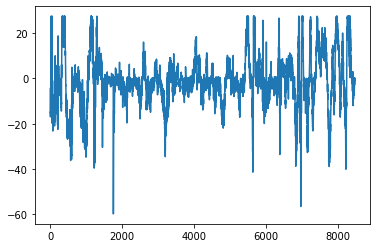

In [16]:
from matplotlib import pyplot as plt
plt.plot(predictions_list)
plt.show()

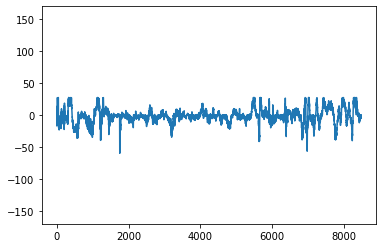

In [17]:
from matplotlib import pyplot as plt
plt.plot(predictions_list)
plt.ylim(-170, 170)
plt.show()

In [18]:
import numpy as np
import matplotlib.pylab as plt

def running_mean(x, N):
        cumsum = np.cumsum(np.insert(x, 0, 0)) 
        return (cumsum[N:] - cumsum[:-N]) / float(N)

def get_smoothness_score(series):
    
    smooth = running_mean(series, 9)
    diff = series[4:-4] - smooth
    
    smoothness = 1/np.mean(np.abs(diff))
    print(smoothness)
    return smoothness


#time = np.linspace(0, 100, 100)
#clean = np.sin(time/100)
#noise = np.random.normal(0,0.1,100)
#noisy = clean+noise

#get_smoothness_score(noisy)

#plt.plot(time, noisy)
#plt.show()

In [19]:
get_smoothness_score(ground_truth)

3.731796918360046


3.731796918360046

In [20]:
get_smoothness_score(predictions_list)

0.5964693326019186


0.5964693326019186

12.24561488477778


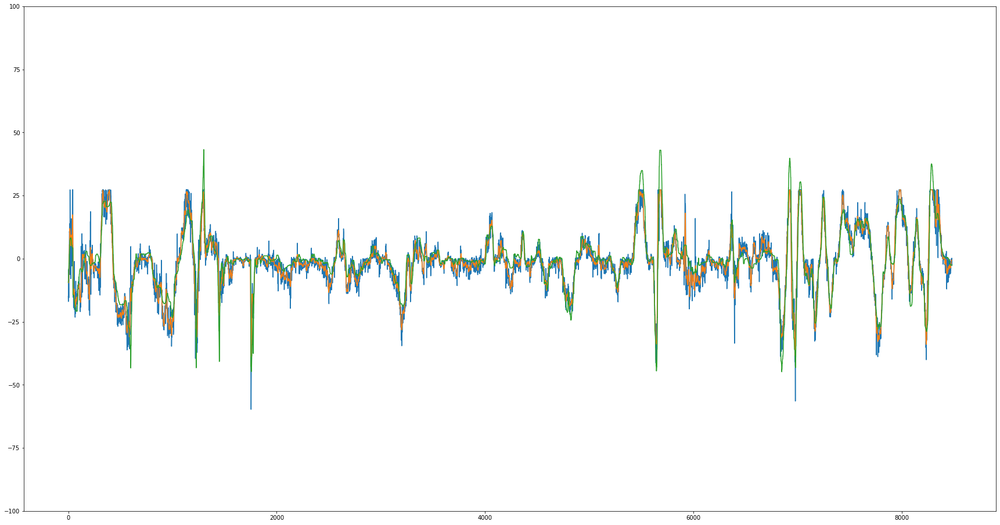

In [21]:
idxs = np.linspace(0, len(ground_truth), len(ground_truth))

plt.figure(figsize=(30,16))

#plt.show()
plt.plot(idxs, predictions_list)

plt.ylim(-100,100)
smooth_idxs = idxs[4:-4]
smooth = running_mean(predictions_list, 9)
plt.plot(smooth_idxs, smooth)

super_smooth_idxs = idxs[20:-20]
super_smooth = running_mean(predictions_list, 41)
#plt.plot(super_smooth_idxs, super_smooth)

get_smoothness_score(super_smooth)


plt.plot(idxs, ground_truth)

plt.show()

# Test Shift-Verhalten:

In [22]:
from matplotlib import pyplot as plt
import ipywidgets as widgets
from ipywidgets import interact
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib as mpl

mpl.rcParams['figure.figsize'] = [12, 12]
mpl.rcParams['figure.dpi'] = 72

def show_crop(index, shift):
    frame = val_set.get_cropped_frame(index, shift)[0]
    frame_arr = img_to_array(frame)/255
    plt.imshow(frame_arr)
    plt.show()
    
crop_slider = widgets.IntSlider(min=0, max=val_set.get_batch_size()*len(val_set)-1, continuous_update=False)
shift_slider = widgets.IntSlider(min=-100, max=100, continuous_update=False)

interact(show_crop, index=crop_slider, shift = shift_slider);

interactive(children=(IntSlider(value=0, continuous_update=False, description='index', max=8479), IntSlider(va…

In [23]:
gui = AutopilotGUI()

predictions_lists = []
render_list = []

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(model_name + '_shift_behaviour.avi',fourcc, 15.0, (848,170))

frames = range(0, val_set.get_batch_size()*len(val_set)-1, 50)

shifts = range(-100,100,4)


for frame_idx in frames:
    predictions_lists.append([])
    for shift in shifts:
        cropped_sample = val_set.get_cropped_frame(frame_idx, shift, offset=0)
        cropped_frame = cropped_sample[0]
        actual_swa = cropped_sample[1]['steering_wheel_angle']*90
        test_data = np.expand_dims(cropped_frame, axis=0)
        predictions = loaded_model.predict(test_data)
        predicted_swa = predictions[0][0]*90
        predictions_lists[-1].append({'shift':shift, 'actual':actual_swa, 'predicted':predicted_swa})



        gui.set_frame(cropped_frame)
        gui.set_show_overlay(True)
        gui.set_engaged(False)
        gui.set_recording(False)

        gui.set_timestring('')

        velocity = cropped_sample[1]['speed']
        gui.set_velocity(velocity)

        gui.set_actual_swa(actual_swa)
        gui.set_predicted_swa(predicted_swa)

        print("Ground-truth: " +str(actual_swa))
        print("Prediction: " + str(predicted_swa))

        gui.render()
        frame = gui.get_rendered_gui()

        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        out.write(rgb_frame.astype(np.uint8))
    
out.release()

AttributeError: 'RoadDataset' object has no attribute 'get_cropped_frame'

In [ ]:
print(predictions_lists)

In [ ]:
good_predictions = []
for prediction_list in predictions_lists:
    predictions = [element['predicted'] for element in prediction_list]
    ground_truths = [element['actual'] for element in prediction_list]
    base_pred = predictions[len(predictions)//2]
    base_gt = ground_truths[len(ground_truths)//2]
    error = abs(base_gt - base_pred)
    
    linewidth = 0.2
    if error < 10:
        linewidth = 0.2
        good_predictions.append(predictions)
    #plt.plot(shifts, np.asarray(prediction_list), linewidth = 0.5)
    plt.plot(shifts, np.asarray(predictions)-base_pred, linewidth = linewidth)

median_predictions = np.median(good_predictions, axis=0)
plt.plot(shifts, np.asarray(median_predictions)-median_predictions[len(median_predictions)//2], linewidth = 3)

plt.xlabel("shift (px)")
plt.ylabel("swa offset (deg)")
plt.grid()
plt.show()



# Lenkrad Winkelgeschwindigkeit

In [ ]:
speeds = velocity_list[:]
angles = ground_truth[:] # deg
fps = 15
angular_speed = np.diff(angles)*fps # deg/s


idxs = range(1, len(angles)+1)
print(len(angles))
#print(angles)
print(len(angular_speed))
#print(angular_speed)

plt.plot(idxs, angles)
#plt.plot(idxs[:len(angular_speed)], angular_speed)
plt.xlabel("frame idx")
plt.ylabel("swa (deg)")
plt.show()


In [ ]:
speeds = np.asarray(speeds)
abs_angles = abs(np.asarray(angles))
abs_angular_speed = abs(angular_speed)

In [ ]:
# get indices where abs(swa) > 45
invalid_angle_indxs = np.argwhere(abs_angles>45)

# get indices where speed < 25
invalid_speed_indxs = np.argwhere(speeds[:-1]<25)

In [ ]:
# remove samples from angular speed array
abs_angular_speed[invalid_angle_indxs] = 0
abs_angular_speed[invalid_speed_indxs] = 0

In [ ]:
plt.plot(idxs[:len(abs_angular_speed)], abs_angular_speed)
plt.xlabel("frame idx")
plt.ylabel("swa abs(deg/s)")
plt.show()

In [ ]:
qs = list(range(60,90,5))
qs.extend(list(range(90,101,1)))

for q in qs:
    print("{}th: {} deg/s".format(q, round(np.percentile(abs_angular_speed, q=q),1)))